In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.figsize"]=(20,10)

In [17]:
import keras
from keras.layers import LSTM, Dropout, Dense,GRU
import tensorflow as tf

In [18]:
import re, shutil,os

In [19]:

index=np.array(os.listdir('dataset_new'))
index

array(['agniva_crossing_130_124.csv', 'agniva_crossing_140_125.csv',
       'agniva_crossing_90_180.csv', 'agniva_not_crossing_126.csv',
       'ahetasam_croossing_video_id_33.csv',
       'ahetasam_croossing_video_id_35.csv',
       'antarlin_crossing_135_111.csv', 'antarlin_crossing_185_112.csv',
       'antarlin_not_Crossing_113.csv',
       'AyanMullickCrossingTheRoadVID2.csv',
       'AyanMullickNotCrossingTheRoadID6.csv',
       'ayan_crossing_120_172.csv', 'ayan_crossing_130_136.csv',
       'ayan_crossing_150_117.csv', 'ayan_crossing_160_137.csv',
       'ayan_crossing_175_118.csv', 'ayan_crossing_210_189.csv',
       'ayan_not_Crossing_119.csv', 'ayan_not_Crossing_138.csv',
       'ishaan_crossing_140_140.csv', 'ishaan_crossing_175_141.csv',
       'ishaan_not_crossing_139.csv', 'ishaan_not_Crossing_142.csv',
       'ishan_crossing_120_184.csv', 'ishan_crossing_125_173.csv',
       'ishan_crossing_125_174.csv', 'ishan_crossing_150_181.csv',
       'ishan_crossing_150_183.csv',

In [20]:
len(index) 


60

In [21]:
dataset=[]

In [22]:
for i in range(60):
  data=pd.read_csv(f"dataset_new/{index[i]}")
  dataset.append(data) 

In [23]:
dataset[5]

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x58,x59,x60,x61,x62,x63,x64,x65,x66,y
0,0.635364,0.373599,0.638821,0.364709,0.640855,0.364294,0.642792,0.363959,0.633187,0.365992,...,0.680422,0.645052,0.708622,0.649255,0.693667,0.620181,0.721369,0.626087,0.706318,0.0
1,0.635041,0.373612,0.638199,0.364893,0.640230,0.364561,0.642169,0.364290,0.632935,0.365997,...,0.679682,0.645117,0.708763,0.647987,0.693111,0.620011,0.720095,0.623522,0.704527,0.0
2,0.634587,0.373872,0.637597,0.365809,0.639543,0.365651,0.641399,0.365410,0.632610,0.366292,...,0.677419,0.645122,0.708524,0.646867,0.690776,0.619881,0.717360,0.622791,0.701271,0.0
3,0.633878,0.373823,0.636724,0.365796,0.638620,0.365641,0.640508,0.365385,0.631984,0.366236,...,0.675240,0.644220,0.708531,0.645301,0.688482,0.618798,0.716359,0.622045,0.697580,0.0
4,0.633651,0.373174,0.636401,0.364912,0.638263,0.364753,0.640126,0.364500,0.631608,0.365352,...,0.674589,0.643576,0.709549,0.644057,0.688881,0.617120,0.716409,0.621021,0.695933,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,0.444404,0.363317,0.446803,0.354730,0.448125,0.354456,0.449608,0.354127,0.444971,0.354702,...,0.662445,0.465585,0.716532,0.490178,0.671120,0.434042,0.711374,0.471827,0.698604,1.0
155,0.440902,0.363164,0.443405,0.354601,0.444686,0.354296,0.446164,0.353944,0.441587,0.354710,...,0.667462,0.468423,0.702939,0.479440,0.671259,0.440158,0.711225,0.452369,0.699260,1.0
156,0.438724,0.362693,0.440965,0.354499,0.442155,0.354240,0.443496,0.353932,0.439464,0.354599,...,0.675742,0.472327,0.696569,0.473018,0.687737,0.446368,0.708555,0.446937,0.698573,1.0
157,0.437385,0.361956,0.439689,0.353717,0.441079,0.353454,0.442627,0.353153,0.437485,0.353777,...,0.678233,0.472050,0.697946,0.469596,0.691831,0.445338,0.708815,0.442072,0.699201,1.0


In [24]:
sequence_length = 15

In [25]:
def generate_data(df, sequence_length = 15, step = 1):
  X=df.iloc[:,:-1]
  y=df.y
  X_local = []
  y_local = []
  for start in range(0, len(X) - sequence_length, step):
    end = start + sequence_length
    X_local.append(X[start:end])
    y_local.append(y[end-1])
  return np.array(X_local), np.array(y_local)

In [26]:
data=[]
for i in dataset:
  x,y=generate_data(i)
  data.append([x,y])

In [27]:
len(data) 

60

In [28]:
model = keras.Sequential()
model.add(GRU(units = 50,
               input_shape = (x.shape[1],x.shape[2])))
model.add(Dropout(0.5))
model.add(Dense(units=1,activation="sigmoid"))
model.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")

#print(model.summary())
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_2 (GRU)                  (None, 50)                17700     
_________________________________________________________________
dropout_2 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 51        
Total params: 17,751
Trainable params: 17,751
Non-trainable params: 0
_________________________________________________________________


Epoch 1/10
14/14 [==============================] - 2s 6ms/step - loss: 0.6735 - accuracy: 0.5956
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5349 - accuracy: 0.7629
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3812 - accuracy: 0.8221
Epoch 4/10
14/14 [==============================] - 0s 6ms/step - loss: 0.2672 - accuracy: 0.9001
Epoch 5/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1753 - accuracy: 0.9427
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1618 - accuracy: 0.9528
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1348 - accuracy: 0.9611
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1041 - accuracy: 0.9698
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1476 - accuracy: 0.9433
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1207 - accuracy: 0.9487


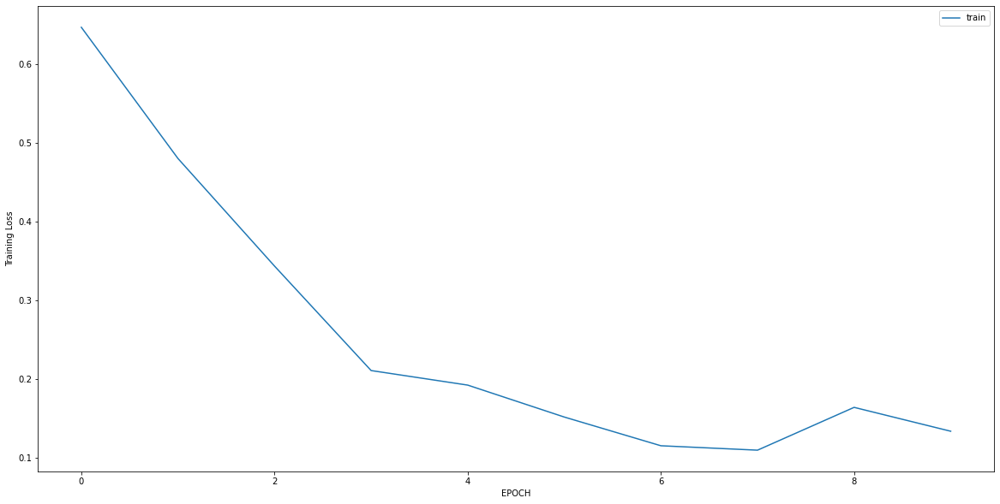

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0332 - accuracy: 0.9942
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0285 - accuracy: 0.9971
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9914
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9914
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9942
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0119 - accuracy: 0.9971
Epoch 7/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0180 - accuracy: 0.9914
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0836 - accuracy: 0.9741
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0851 - accuracy: 0.9769
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.9885


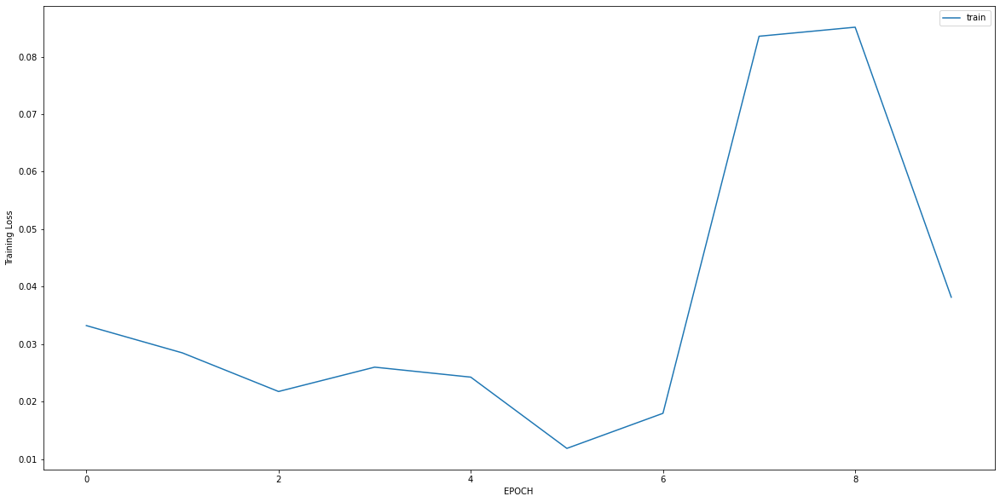

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0413 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 8ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 10ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 8ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0019 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 1.0000


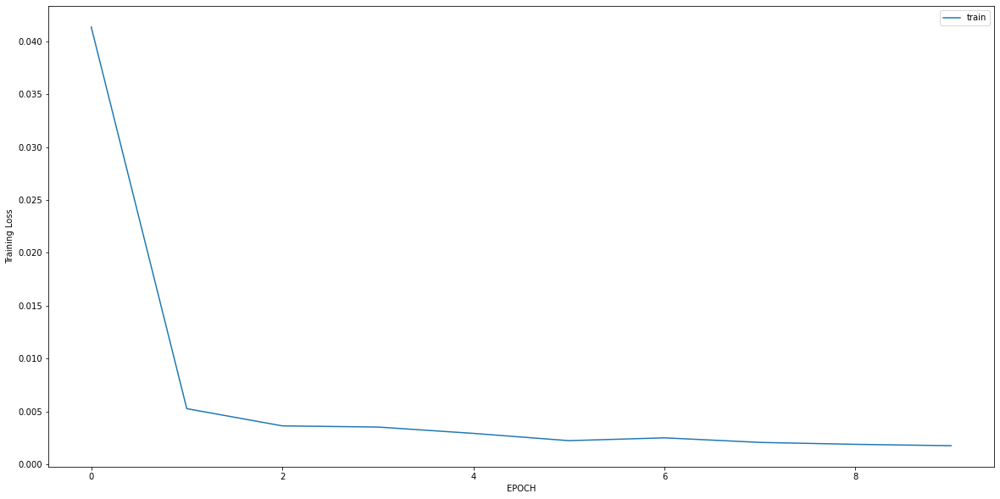

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 3.2331 - accuracy: 0.4980
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.8844 - accuracy: 0.5415
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.9597 - accuracy: 0.4901
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.8272 - accuracy: 0.4111
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7974 - accuracy: 0.4071
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7419 - accuracy: 0.5178
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7403 - accuracy: 0.4664
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6949 - accuracy: 0.5771
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6504 - accuracy: 0.6403
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6398 - accuracy: 0.6364


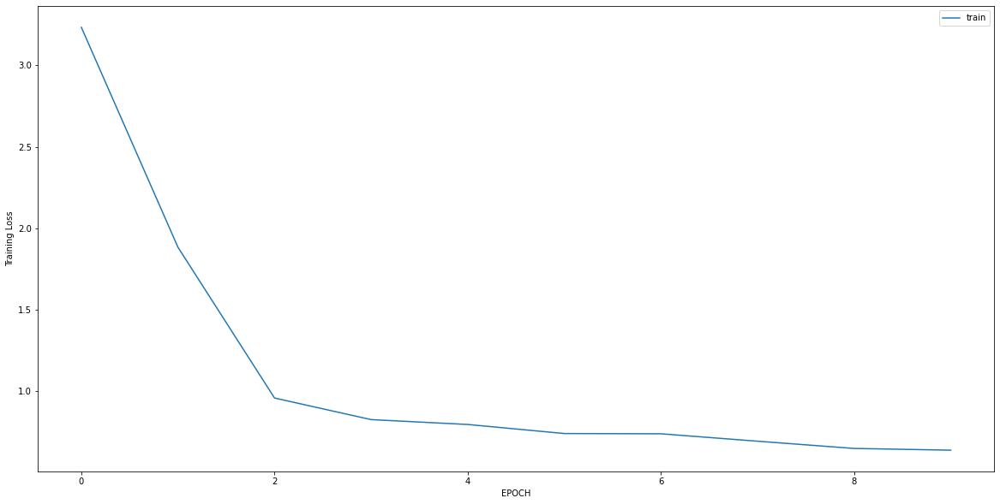

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5035 - accuracy: 0.7981
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3643 - accuracy: 0.8840
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2679 - accuracy: 0.9165
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1735 - accuracy: 0.9513
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3609 - accuracy: 0.8701
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3044 - accuracy: 0.8608
Epoch 7/10
14/14 [==============================] - 0s 6ms/step - loss: 0.2490 - accuracy: 0.8863
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2159 - accuracy: 0.9118
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2298 - accuracy: 0.9118
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1678 - accuracy: 0.9466


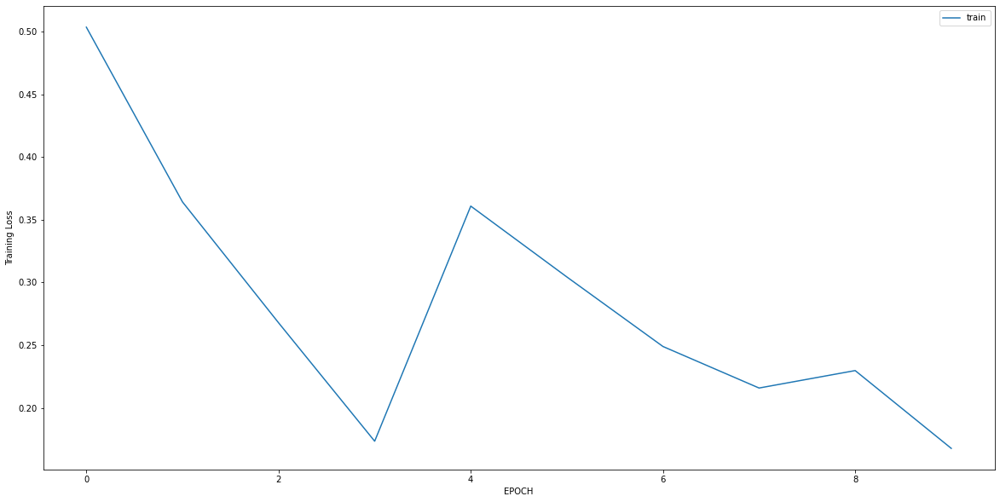

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 1.0401 - accuracy: 0.6975
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0593 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0269 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0178 - accuracy: 1.0000


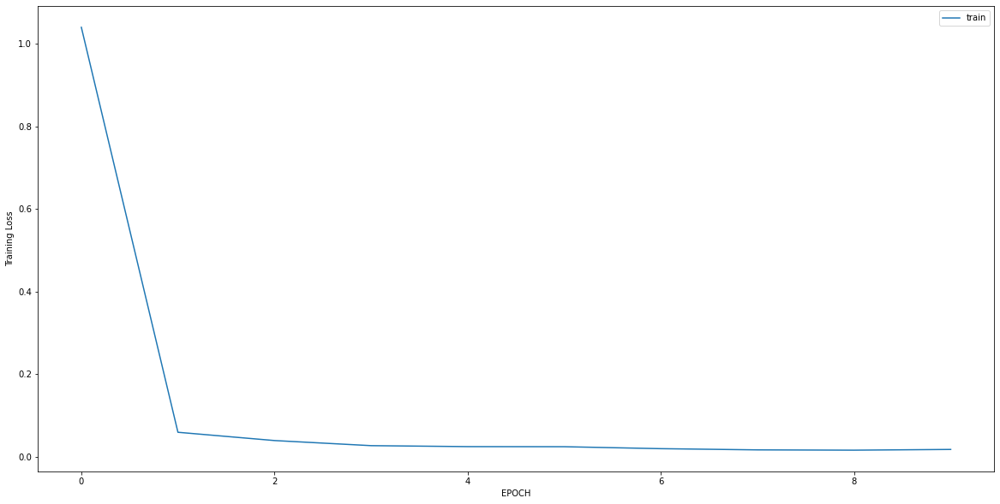

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 2.2916 - accuracy: 0.2257
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 1.4262 - accuracy: 0.2884
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.8812 - accuracy: 0.4295
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6389 - accuracy: 0.6583
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5273 - accuracy: 0.7837
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4482 - accuracy: 0.8558
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4073 - accuracy: 0.8621
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3712 - accuracy: 0.8746
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3242 - accuracy: 0.9060
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2732 - accuracy: 0.9310


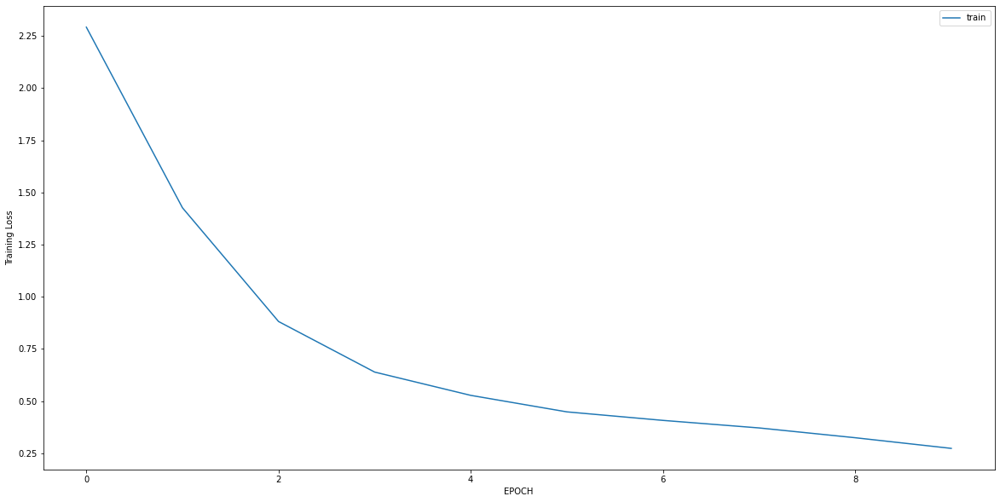

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 2.0454 - accuracy: 0.0096
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8424 - accuracy: 0.4185
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2690 - accuracy: 0.9936
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1171 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 1.0000


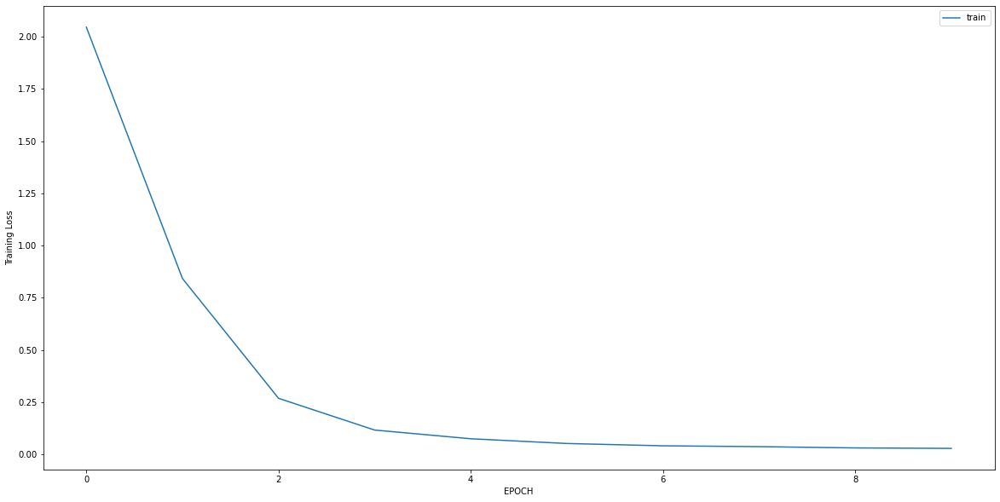

Epoch 1/10
15/15 [==============================] - 0s 6ms/step - loss: 1.3881 - accuracy: 0.4579
Epoch 2/10
15/15 [==============================] - 0s 5ms/step - loss: 0.7205 - accuracy: 0.6566
Epoch 3/10
15/15 [==============================] - 0s 6ms/step - loss: 0.4940 - accuracy: 0.8078
Epoch 4/10
15/15 [==============================] - 0s 5ms/step - loss: 0.4645 - accuracy: 0.8510
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.4348 - accuracy: 0.8294
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4108 - accuracy: 0.8553
Epoch 7/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3743 - accuracy: 0.8834
Epoch 8/10
15/15 [==============================] - 0s 6ms/step - loss: 0.3649 - accuracy: 0.8575
Epoch 9/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3395 - accuracy: 0.8985
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3142 - accuracy: 0.9028


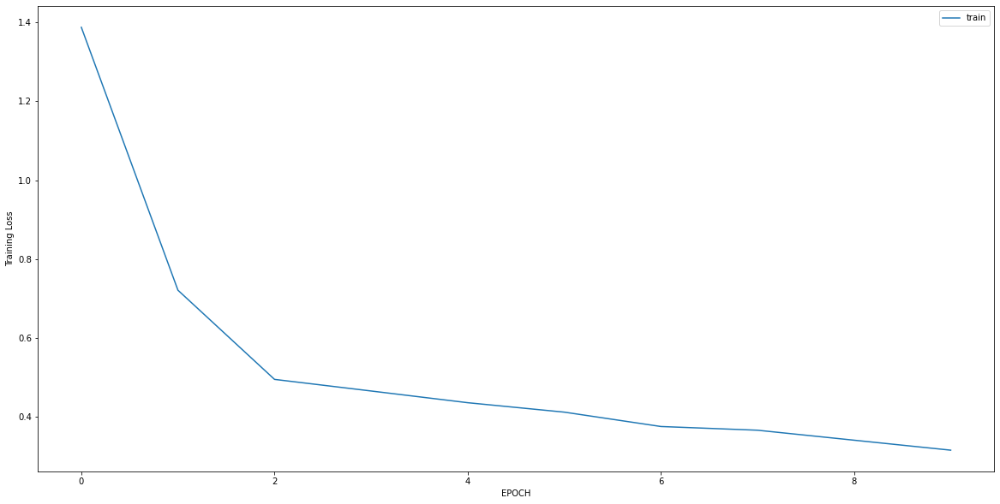

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4295 - accuracy: 0.8077
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4033 - accuracy: 0.8252
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3446 - accuracy: 0.8811
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3423 - accuracy: 0.9126
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3298 - accuracy: 0.8916
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3078 - accuracy: 0.9021
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2986 - accuracy: 0.9091
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2956 - accuracy: 0.9021
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2876 - accuracy: 0.9091
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2776 - accuracy: 0.9056


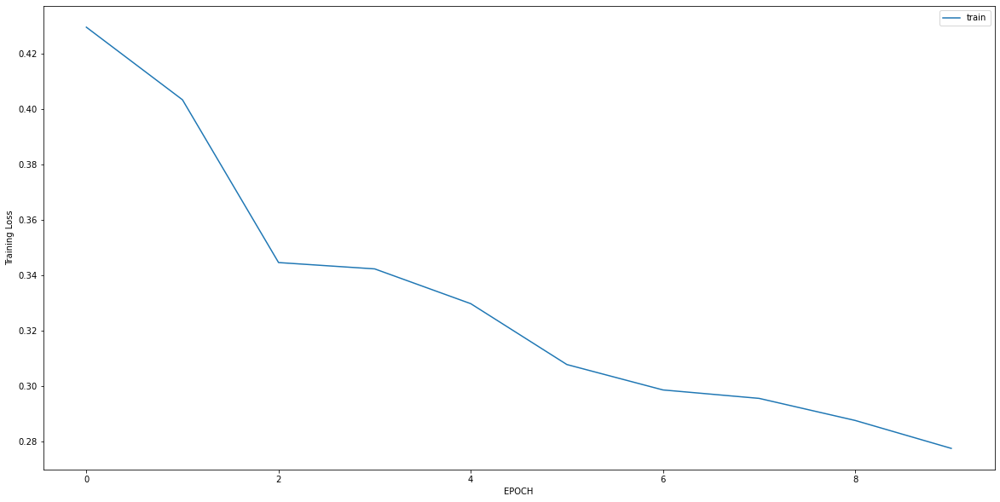

Epoch 1/10
8/8 [==============================] - 0s 9ms/step - loss: 1.7206 - accuracy: 0.5020
Epoch 2/10
8/8 [==============================] - 0s 7ms/step - loss: 1.0119 - accuracy: 0.5494
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5298 - accuracy: 0.7075
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5931 - accuracy: 0.7194
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5263 - accuracy: 0.7549
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4927 - accuracy: 0.7866
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4585 - accuracy: 0.7787
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4166 - accuracy: 0.8498
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4012 - accuracy: 0.8458
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4002 - accuracy: 0.8617


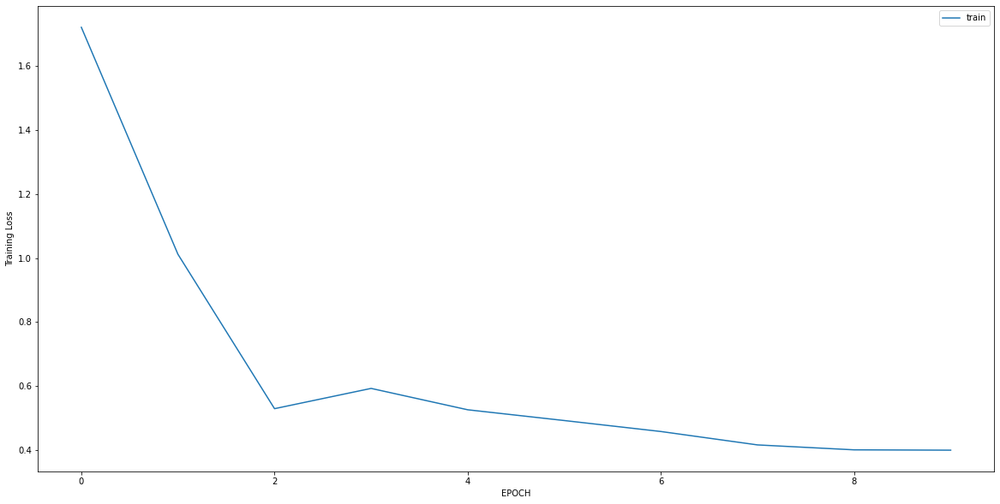

Epoch 1/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2616 - accuracy: 0.9138
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2386 - accuracy: 0.9379
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2291 - accuracy: 0.9310
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2971 - accuracy: 0.8966
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2100 - accuracy: 0.9483
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2193 - accuracy: 0.9379
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1724 - accuracy: 0.9759
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1836 - accuracy: 0.9517
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1743 - accuracy: 0.9586
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2223 - accuracy: 0.9276


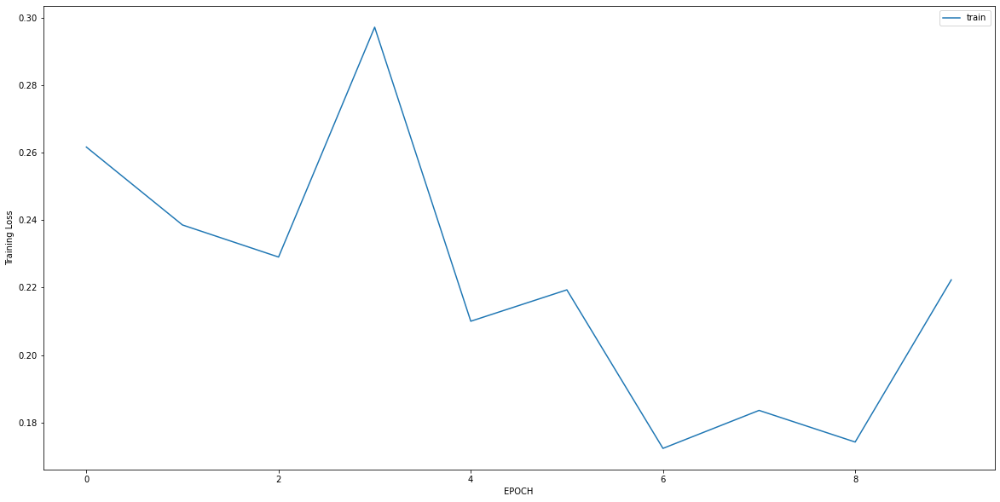

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8055 - accuracy: 0.6471
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4102 - accuracy: 0.8456
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4398 - accuracy: 0.8309
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3335 - accuracy: 0.8824
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2807 - accuracy: 0.9118
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2646 - accuracy: 0.9301
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2375 - accuracy: 0.9449
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1994 - accuracy: 0.9485
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2109 - accuracy: 0.9449
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1766 - accuracy: 0.9632


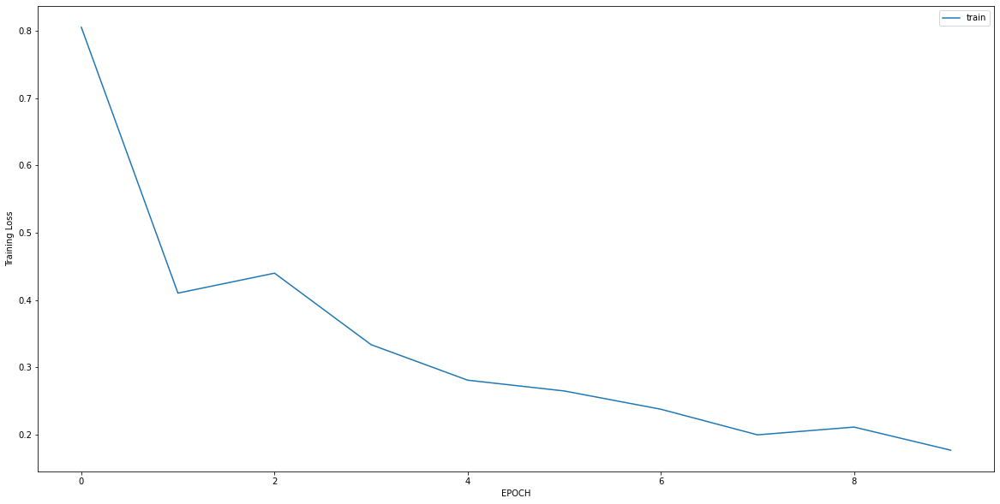

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2986 - accuracy: 0.9059
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2557 - accuracy: 0.9129
Epoch 3/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2683 - accuracy: 0.9164
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2689 - accuracy: 0.9059
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3213 - accuracy: 0.8815
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2545 - accuracy: 0.9164
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2395 - accuracy: 0.9233
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2304 - accuracy: 0.9268
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2356 - accuracy: 0.9233
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2246 - accuracy: 0.9233


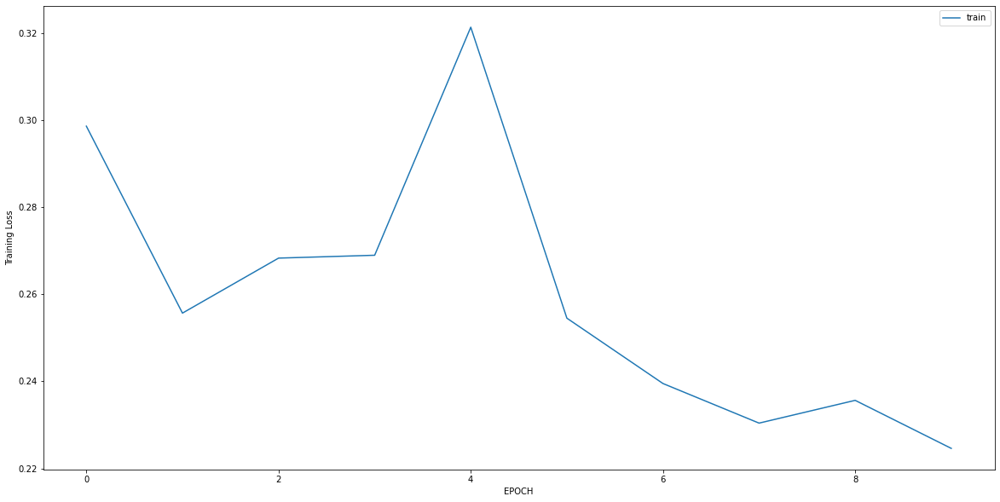

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4257 - accuracy: 0.8312
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3274 - accuracy: 0.9030
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2498 - accuracy: 0.9156
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1741 - accuracy: 0.9325
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1333 - accuracy: 0.9367
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0905 - accuracy: 0.9662
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0855 - accuracy: 0.9747
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9958
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0558 - accuracy: 0.9958
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0573 - accuracy: 0.9916


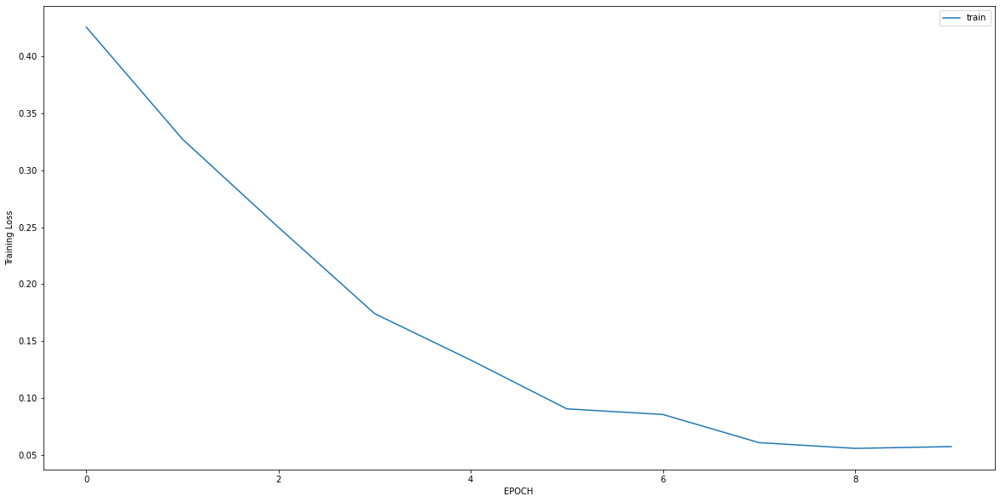

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 4.0023 - accuracy: 0.0000e+00
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 1.2217 - accuracy: 0.4167
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1723 - accuracy: 0.9921
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0721 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0480 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0319 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0276 - accuracy: 1.0000


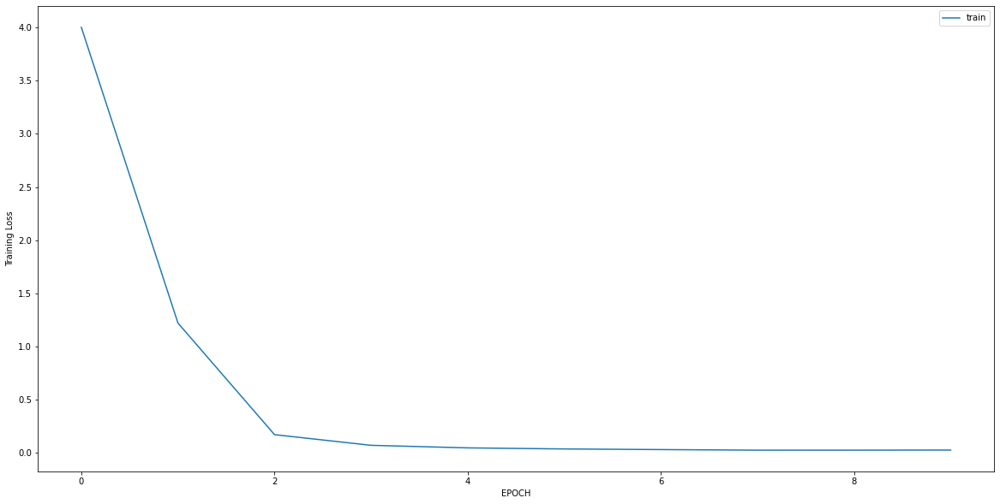

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.5200 - accuracy: 0.5719
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 1.0905 - accuracy: 0.6561
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.7028 - accuracy: 0.7333
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5203 - accuracy: 0.7930
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4288 - accuracy: 0.8246
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4087 - accuracy: 0.8526
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3747 - accuracy: 0.8632
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3821 - accuracy: 0.8596
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3838 - accuracy: 0.8632
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3604 - accuracy: 0.8737


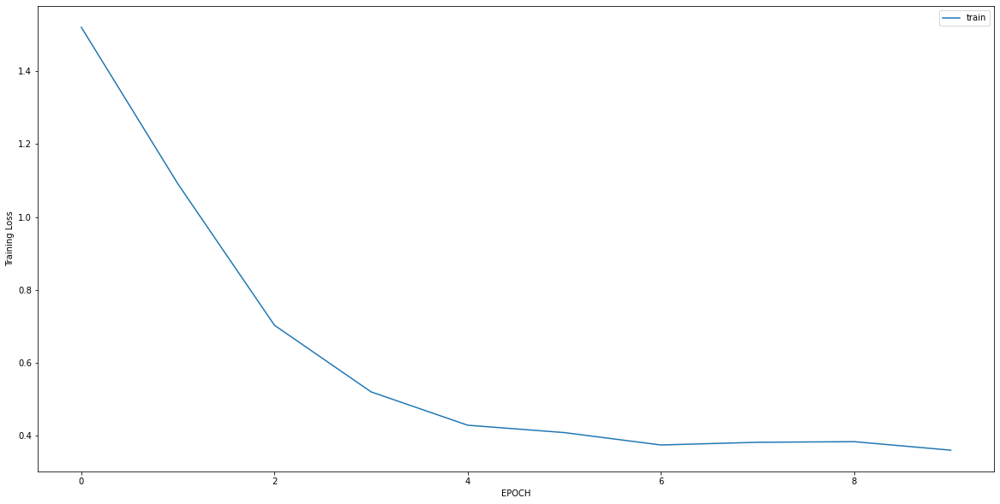

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3837 - accuracy: 0.8616
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2789 - accuracy: 0.8868
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2356 - accuracy: 0.9025
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1787 - accuracy: 0.9465
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1362 - accuracy: 0.9528
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1695 - accuracy: 0.9528
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4539 - accuracy: 0.8585
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2264 - accuracy: 0.9371
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2173 - accuracy: 0.9119
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1688 - accuracy: 0.9560


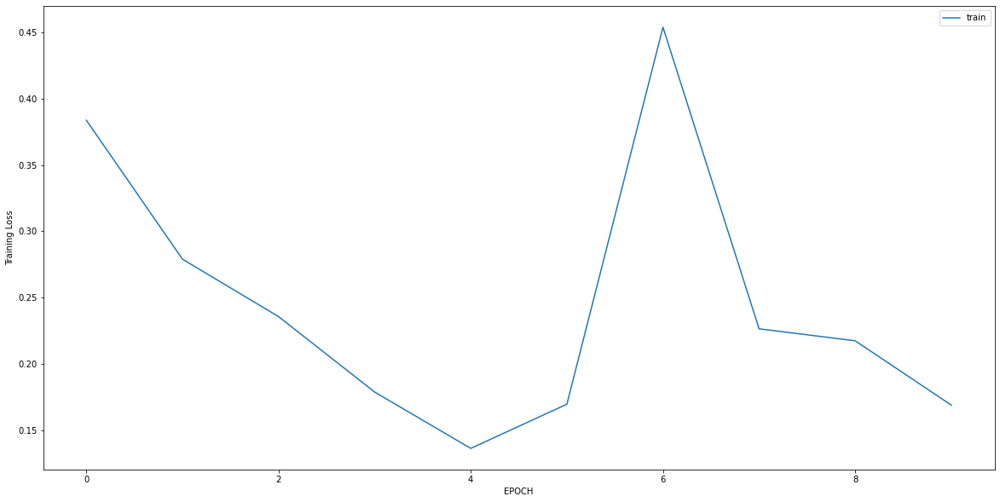

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.3307 - accuracy: 0.4661
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.9477 - accuracy: 0.4661
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6209 - accuracy: 0.5932
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.4591 - accuracy: 0.8178
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4799 - accuracy: 0.8051
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4403 - accuracy: 0.8475
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4067 - accuracy: 0.8432
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3418 - accuracy: 0.8814
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3427 - accuracy: 0.8814
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3393 - accuracy: 0.8898


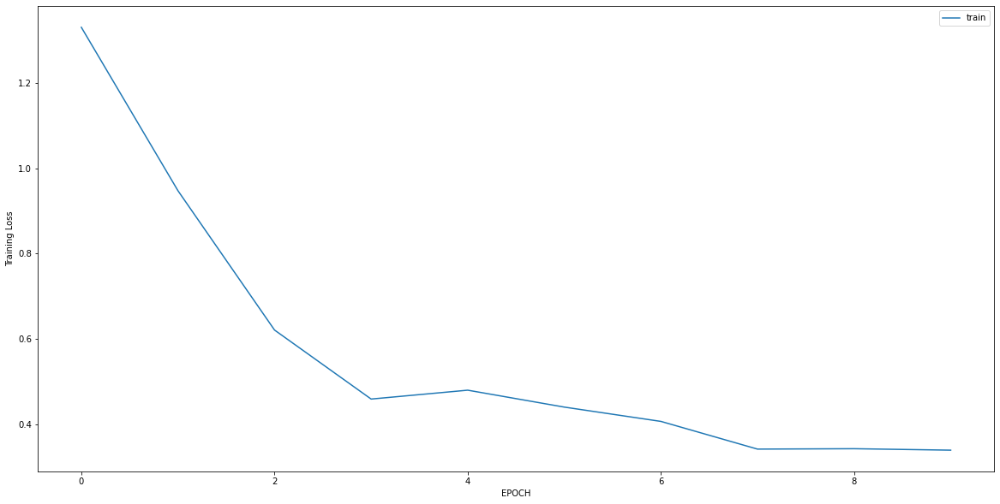

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 0.5011 - accuracy: 0.8367
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3874 - accuracy: 0.8367
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3254 - accuracy: 0.8469
Epoch 4/10
4/4 [==============================] - 0s 7ms/step - loss: 0.2989 - accuracy: 0.8980
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3615 - accuracy: 0.8367
Epoch 6/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3316 - accuracy: 0.8571
Epoch 7/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3077 - accuracy: 0.8878
Epoch 8/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2939 - accuracy: 0.8367
Epoch 9/10
4/4 [==============================] - ETA: 0s - loss: 0.3128 - accuracy: 0.81 - 0s 6ms/step - loss: 0.2777 - accuracy: 0.8367
Epoch 10/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2510 - accuracy: 0.87

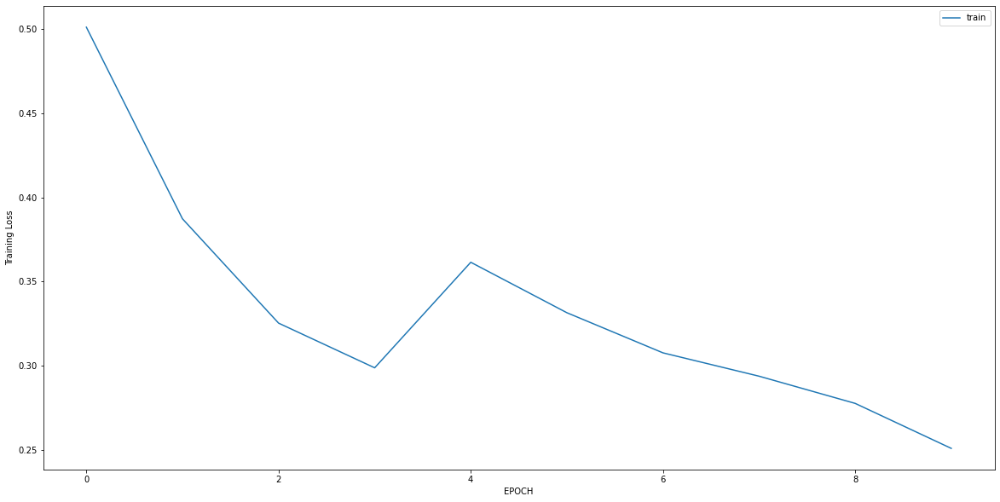

Epoch 1/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2509 - accuracy: 0.9253
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2134 - accuracy: 0.9181
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1735 - accuracy: 0.9573
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1508 - accuracy: 0.9573
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1416 - accuracy: 0.9680
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1128 - accuracy: 0.9715
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1121 - accuracy: 0.9751
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1083 - accuracy: 0.9786
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1025 - accuracy: 0.9786
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0981 - accuracy: 0.9858


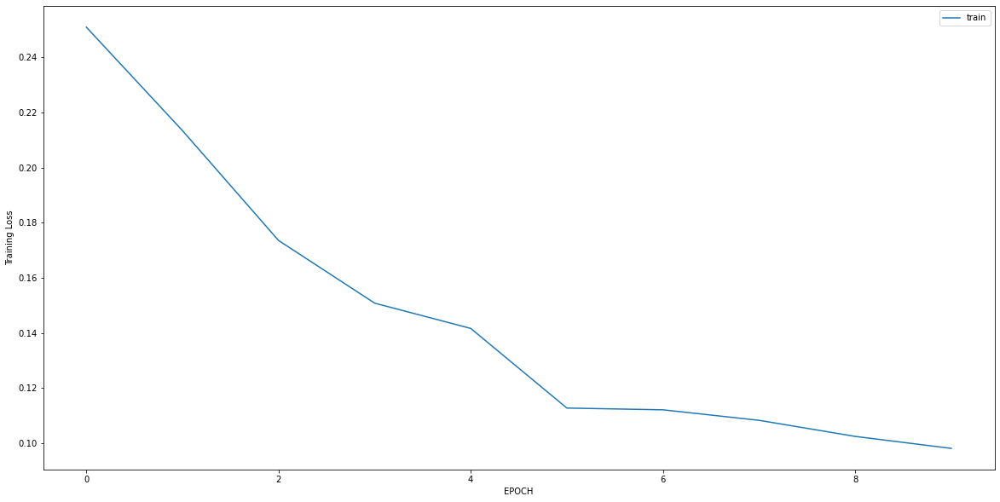

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1159 - accuracy: 0.9643
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0808 - accuracy: 0.9921
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0683 - accuracy: 0.9921
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0700 - accuracy: 0.9881
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0742 - accuracy: 0.9960
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0901 - accuracy: 0.9762
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0637 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0540 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0534 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0544 - accuracy: 0.9921


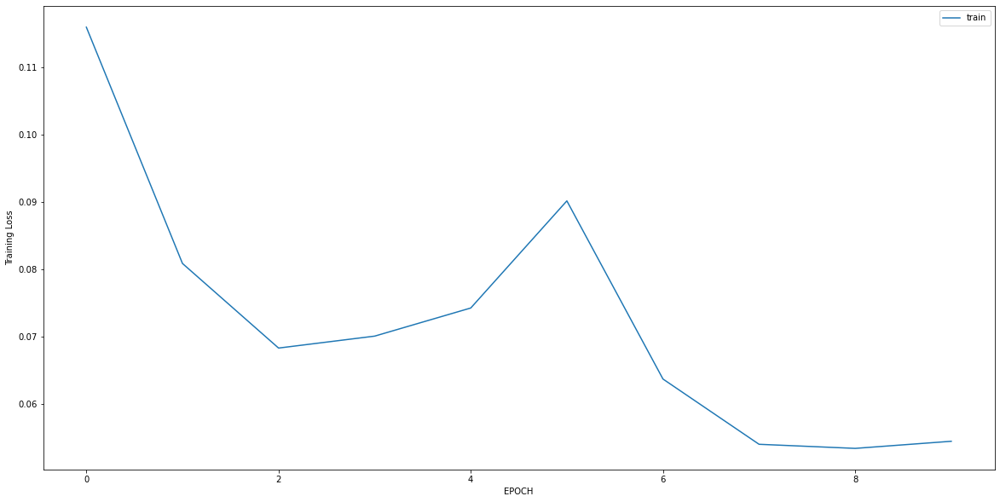

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7574 - accuracy: 0.7662
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0169 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0145 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0129 - accuracy: 1.0000


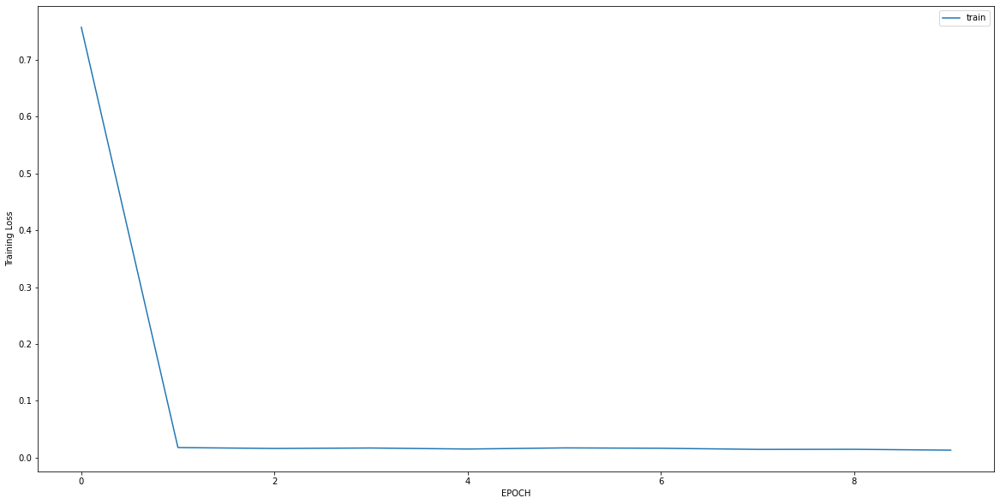

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0109 - accuracy: 1.0000


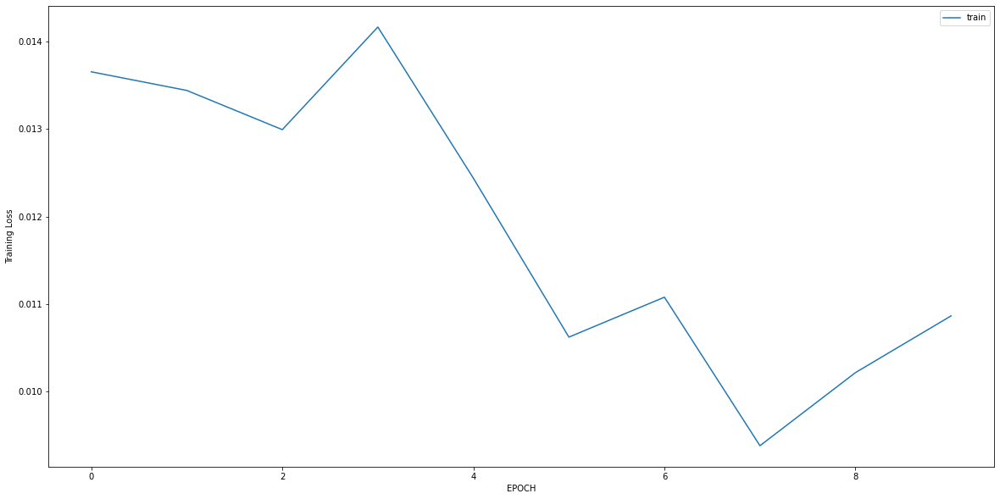

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0200 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0179 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0128 - accuracy: 1.0000


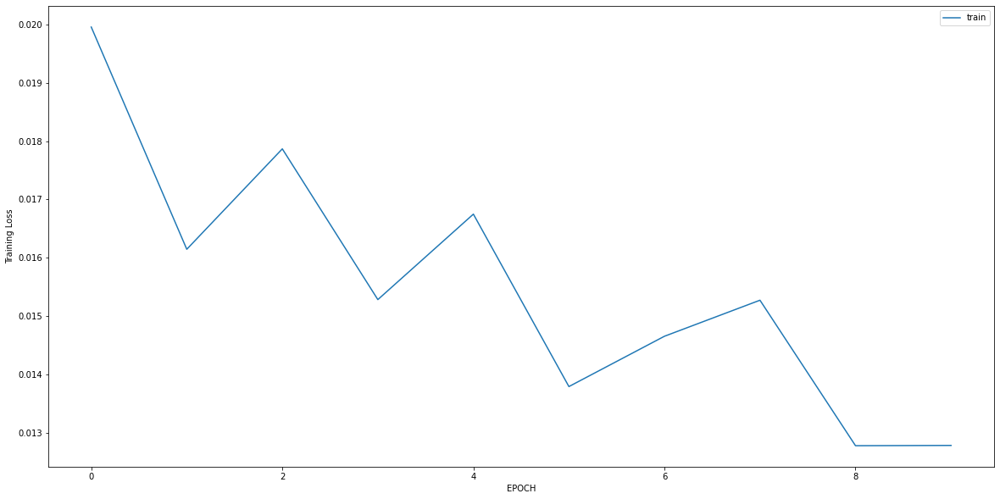

Epoch 1/10
18/18 [==============================] - 0s 6ms/step - loss: 0.2430 - accuracy: 0.9350
Epoch 2/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0056 - accuracy: 1.0000


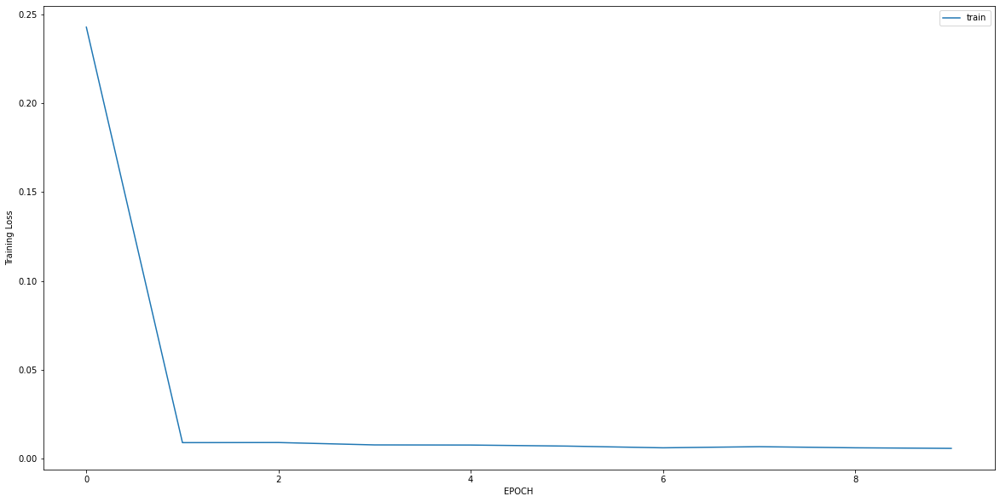

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 4.6094 - accuracy: 0.1721
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 3.3938 - accuracy: 0.1721
Epoch 3/10
8/8 [==============================] - 0s 7ms/step - loss: 1.9153 - accuracy: 0.1844
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.9417 - accuracy: 0.3811
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6440 - accuracy: 0.6434
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5362 - accuracy: 0.7787
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5175 - accuracy: 0.8115
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4947 - accuracy: 0.8197
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4594 - accuracy: 0.8238
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4805 - accuracy: 0.8279


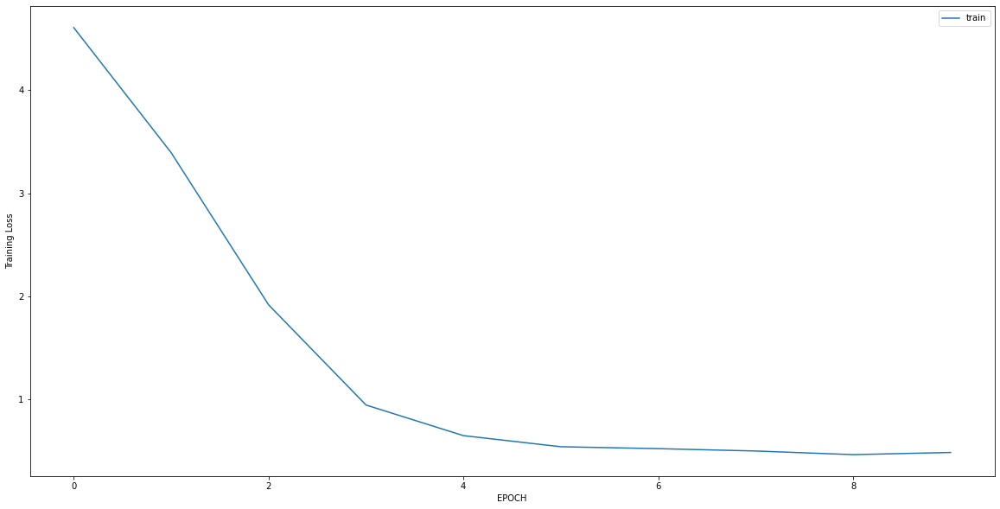

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0034 - accuracy: 0.6093
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7710 - accuracy: 0.6159
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6989 - accuracy: 0.5828
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6065 - accuracy: 0.6755
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5509 - accuracy: 0.7219
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5304 - accuracy: 0.7517
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.5241 - accuracy: 0.7550
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.5186 - accuracy: 0.7649
Epoch 9/10
10/10 [==============================] - 0s 8ms/step - loss: 0.4618 - accuracy: 0.8013
Epoch 10/10
10/10 [==============================] - 0s 7ms/step - loss: 0.4311 - accuracy: 0.8079


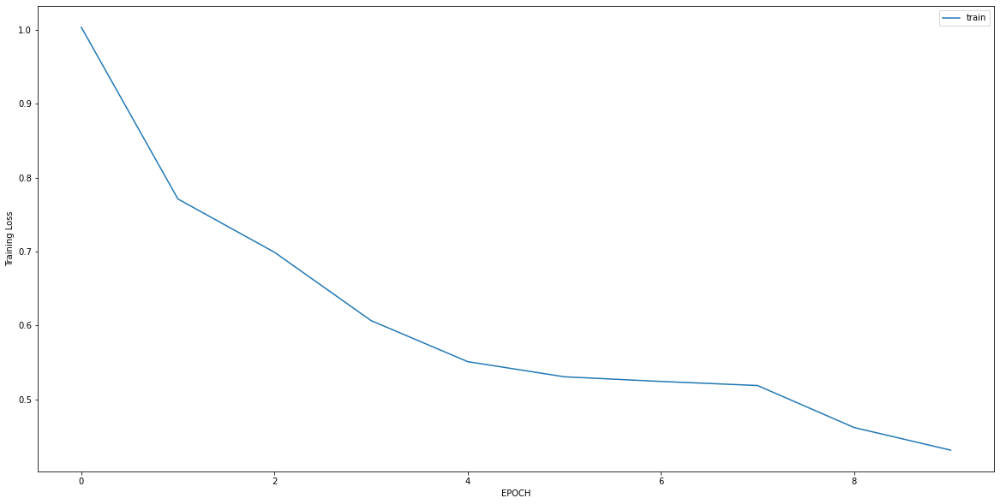

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.1520 - accuracy: 0.4276
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.9123 - accuracy: 0.4343
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7935 - accuracy: 0.4478
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.5926
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7101 - accuracy: 0.5623
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7072 - accuracy: 0.5825
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.6162
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.5724
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6498 - accuracy: 0.6027
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6406 - accuracy: 0.6263


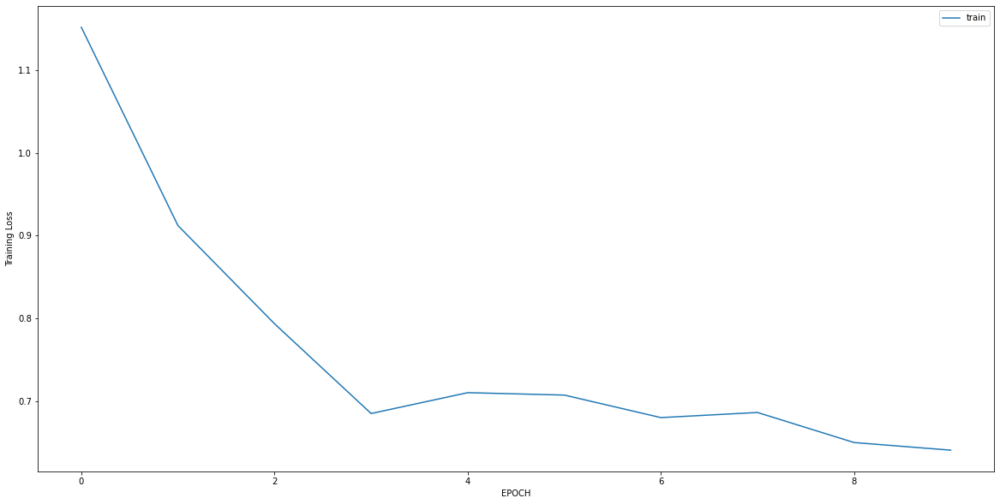

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5630 - accuracy: 0.6774
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4972 - accuracy: 0.7540
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4428 - accuracy: 0.8427
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3561 - accuracy: 0.8952
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3020 - accuracy: 0.9234
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2527 - accuracy: 0.9476
Epoch 7/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2338 - accuracy: 0.9597
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2084 - accuracy: 0.9637
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1821 - accuracy: 0.9798
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1706 - accuracy: 0.9798


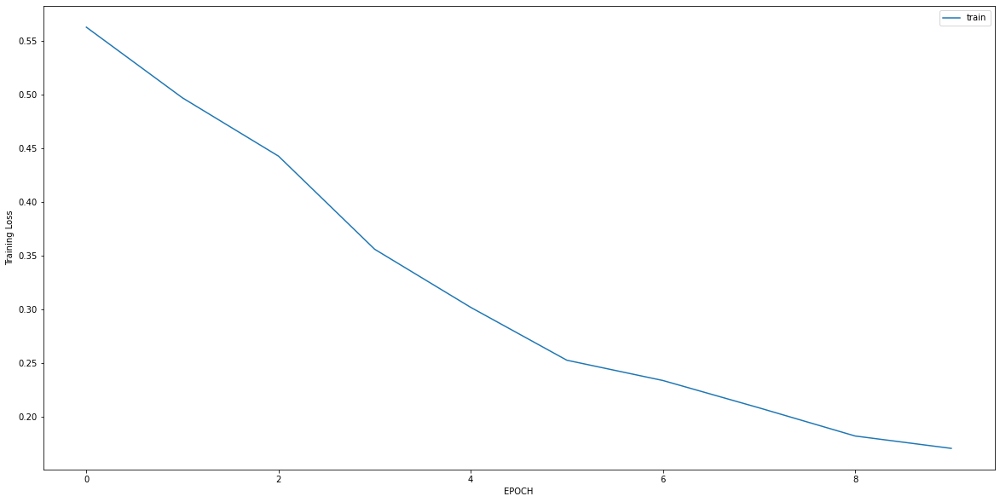

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.3951 - accuracy: 0.4493
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.3310 - accuracy: 0.4493
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1670 - accuracy: 0.4420
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9835 - accuracy: 0.4348
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8537 - accuracy: 0.4130
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7646 - accuracy: 0.4783
Epoch 7/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7381 - accuracy: 0.5435
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6795 - accuracy: 0.6014
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7070 - accuracy: 0.5217
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7638 - accuracy: 0.4783


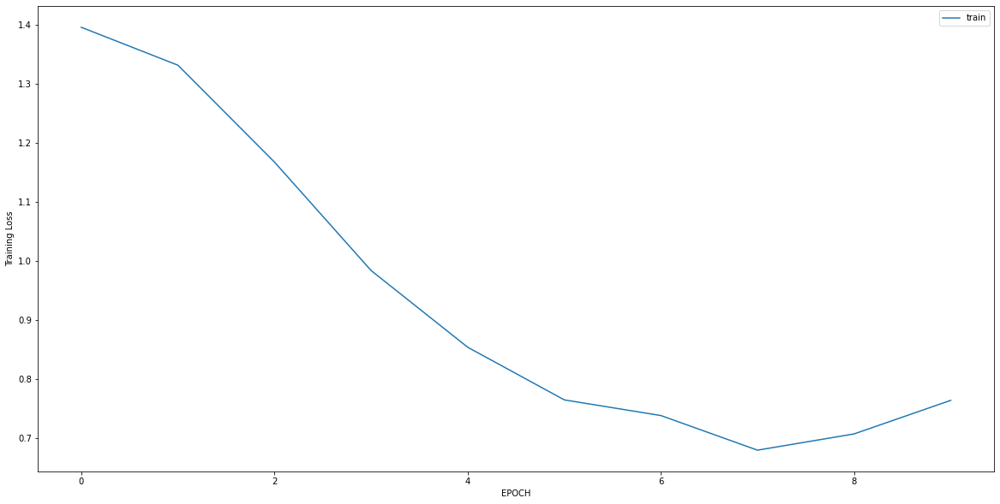

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4736 - accuracy: 0.8537
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3108 - accuracy: 0.9728
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1858 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1311 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1034 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0776 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0726 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0596 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0550 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0466 - accuracy: 1.0000


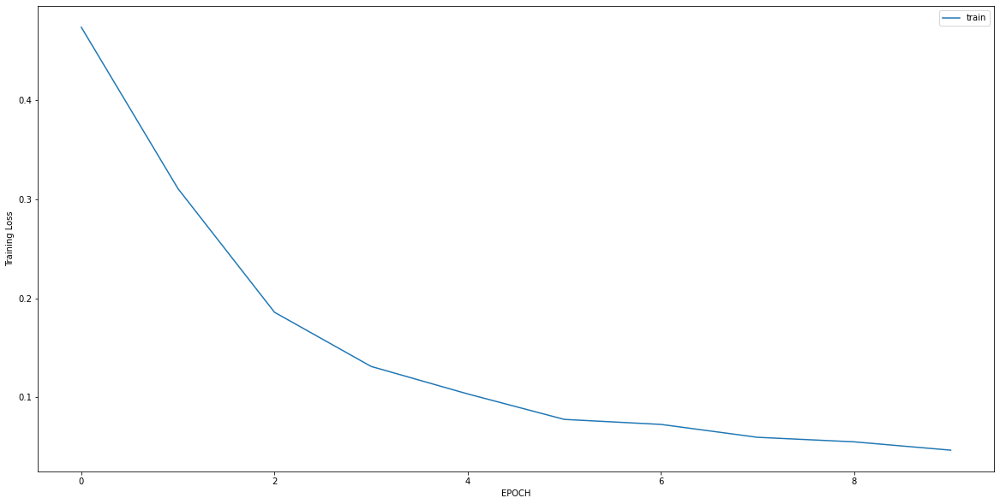

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0659 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0633 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0598 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0336 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0297 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0263 - accuracy: 1.0000


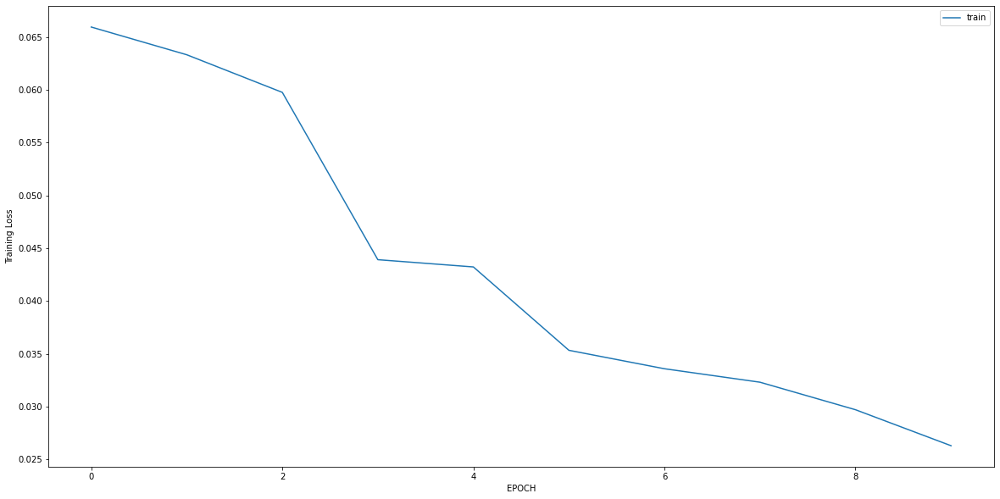

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 2.0313 - accuracy: 0.4899
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.7525 - accuracy: 0.4899
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.3711 - accuracy: 0.4899
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1161 - accuracy: 0.4939
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8646 - accuracy: 0.5061
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7572 - accuracy: 0.4899
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.5547
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5455 - accuracy: 0.7126
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4783 - accuracy: 0.7935
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4050 - accuracy: 0.8259


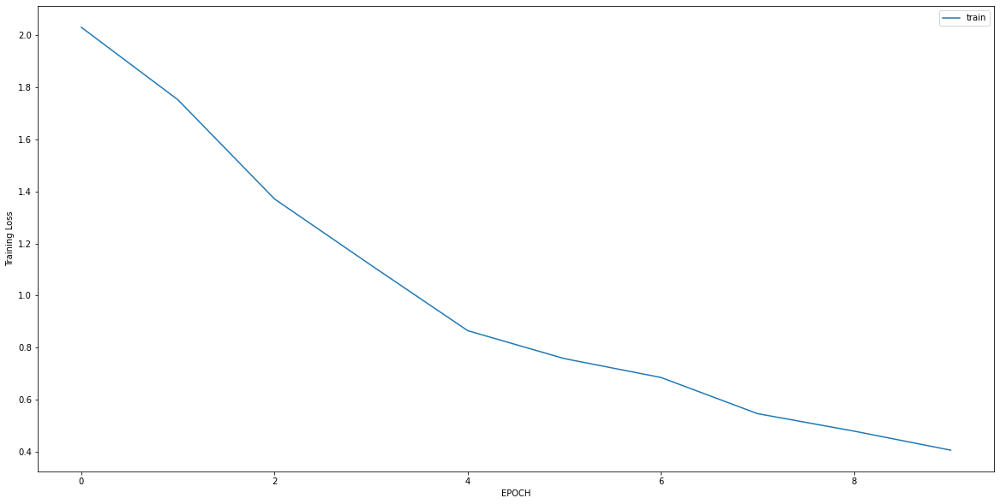

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.6614 - accuracy: 0.5498
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0408 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0167 - accuracy: 1.0000


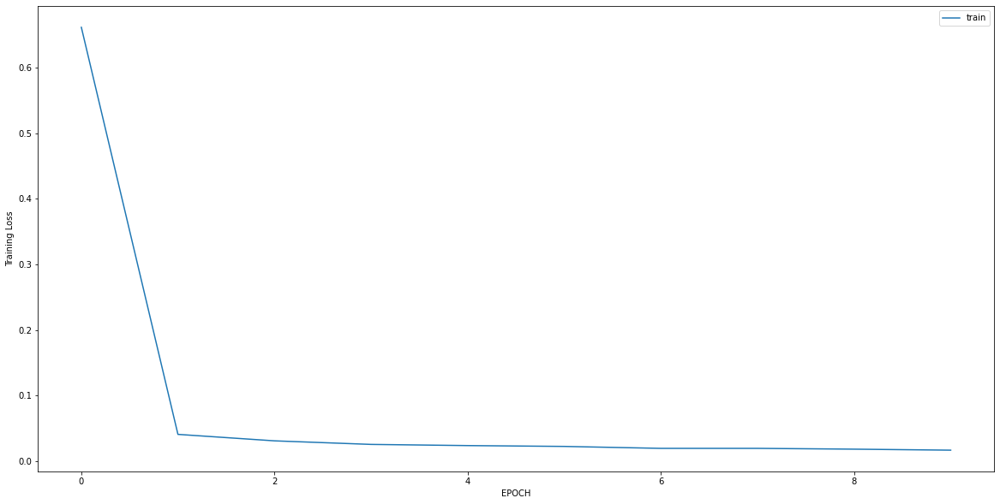

Epoch 1/10
2/2 [==============================] - 0s 8ms/step - loss: 0.7084 - accuracy: 0.5357
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 0.6296 - accuracy: 0.7500
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 0.6012 - accuracy: 0.7143
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.4925 - accuracy: 0.8571
Epoch 5/10
2/2 [==============================] - 0s 7ms/step - loss: 0.4464 - accuracy: 0.9286
Epoch 6/10
2/2 [==============================] - 0s 8ms/step - loss: 0.3863 - accuracy: 0.9286
Epoch 7/10
2/2 [==============================] - 0s 7ms/step - loss: 0.3207 - accuracy: 0.9821
Epoch 8/10
2/2 [==============================] - 0s 7ms/step - loss: 0.3013 - accuracy: 0.9821
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.2746 - accuracy: 0.9821
Epoch 10/10
2/2 [==============================] - 0s 6ms/step - loss: 0.2479 - accuracy: 1.0000


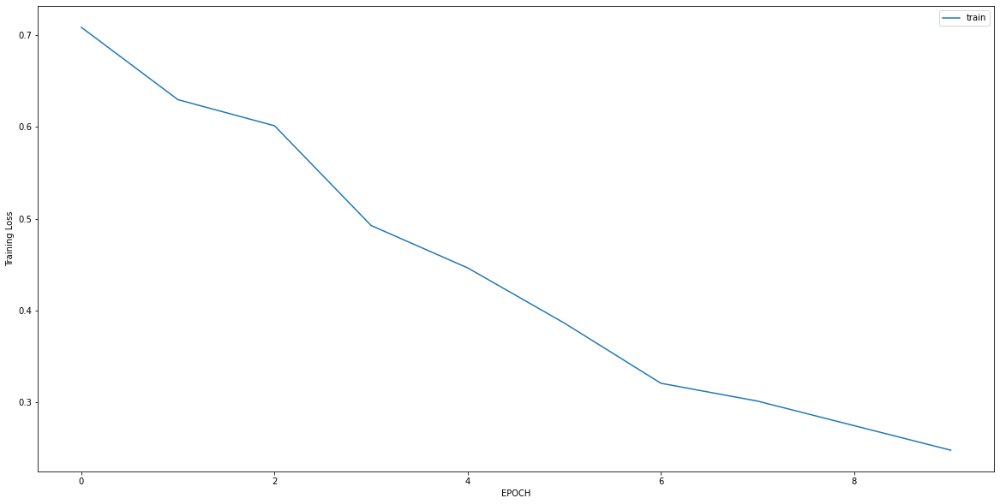

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.4720 - accuracy: 0.2847
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.4447 - accuracy: 0.2778
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 1.2433 - accuracy: 0.2917
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0412 - accuracy: 0.2986
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9229 - accuracy: 0.2917
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7934 - accuracy: 0.4167
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7100 - accuracy: 0.5139
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6596 - accuracy: 0.5833
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6446 - accuracy: 0.6458
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6130 - accuracy: 0.6736


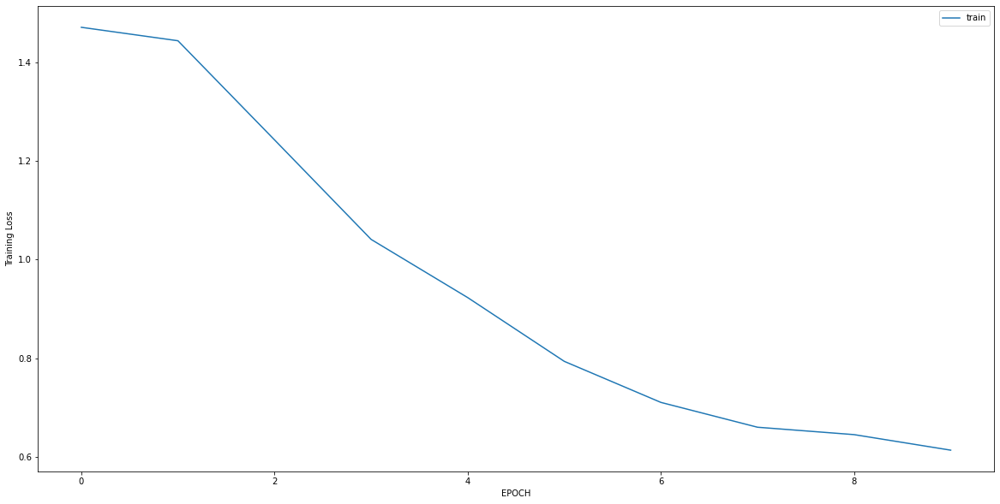

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8637 - accuracy: 0.4118
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7718 - accuracy: 0.4667
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7361 - accuracy: 0.5098
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6804 - accuracy: 0.5608
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7076 - accuracy: 0.5294
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6784 - accuracy: 0.5765
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6557 - accuracy: 0.6196
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6683 - accuracy: 0.6000
Epoch 9/10
8/8 [==============================] - 0s 8ms/step - loss: 0.6582 - accuracy: 0.6235
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6212 - accuracy: 0.6588


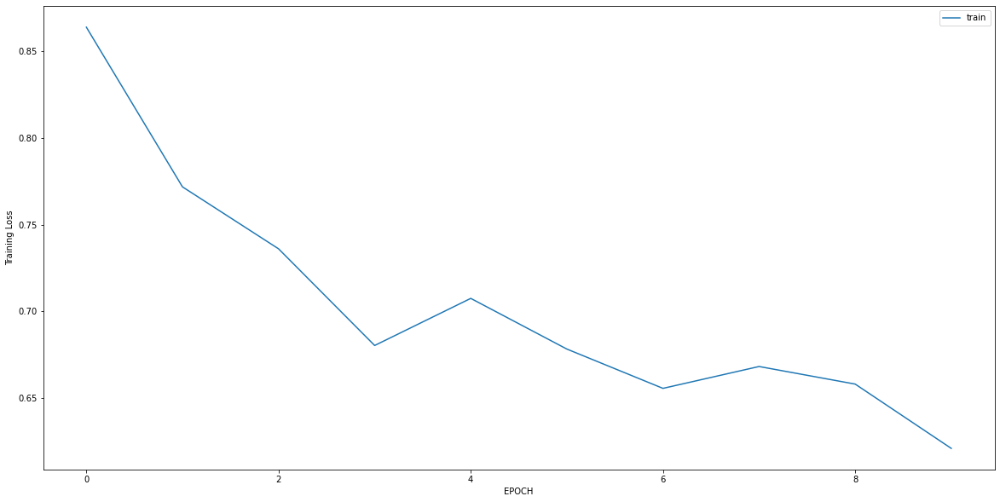

Epoch 1/10
8/8 [==============================] - 1s 9ms/step - loss: 0.5931 - accuracy: 0.6835
Epoch 2/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5191 - accuracy: 0.7764
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4136 - accuracy: 0.8861
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3499 - accuracy: 0.9198
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2843 - accuracy: 0.9494
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2248 - accuracy: 0.9747
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2530 - accuracy: 0.9451
Epoch 8/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2221 - accuracy: 0.9451
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1917 - accuracy: 0.9536
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1842 - accuracy: 0.9578


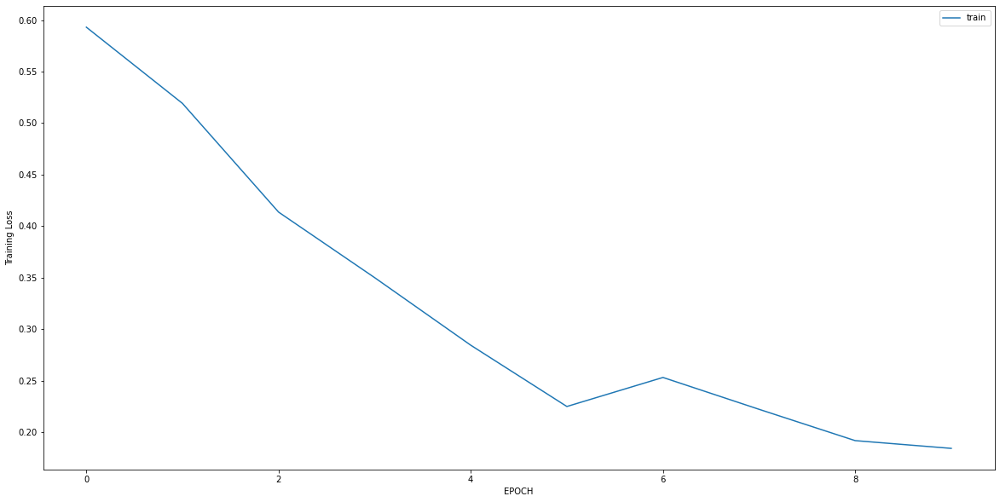

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.5924 - accuracy: 0.8228
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3488 - accuracy: 0.8671
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2505 - accuracy: 0.9114
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2340 - accuracy: 0.9146
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2347 - accuracy: 0.9209
Epoch 6/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2209 - accuracy: 0.9177
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2018 - accuracy: 0.9177
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2423 - accuracy: 0.9241
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2125 - accuracy: 0.9304
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1963 - accuracy: 0.9494


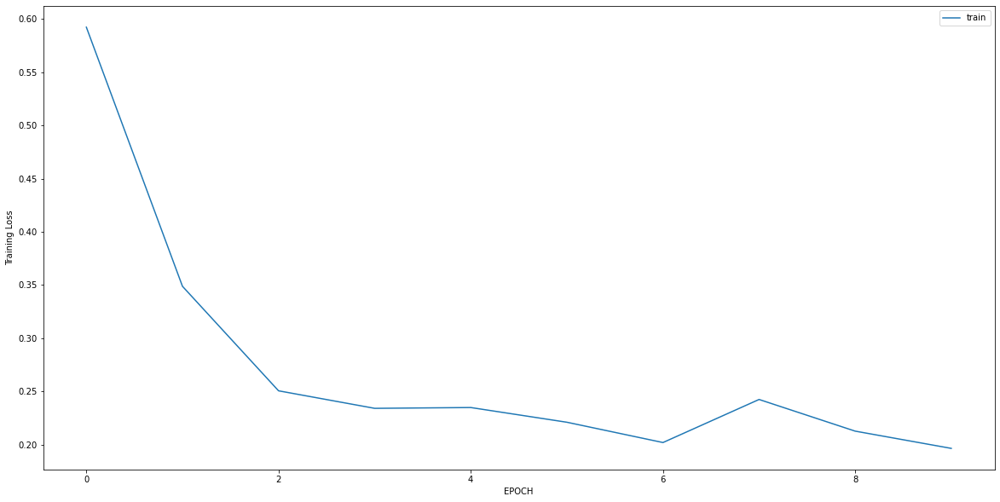

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.7393 - accuracy: 0.7047
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.3725 - accuracy: 0.8860
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.3451 - accuracy: 0.8860
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.3165 - accuracy: 0.8918
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2548 - accuracy: 0.9094
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2058 - accuracy: 0.9269
Epoch 7/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1753 - accuracy: 0.9444
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1652 - accuracy: 0.9415
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1552 - accuracy: 0.9386
Epoch 10/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1375 - accuracy: 0.9620


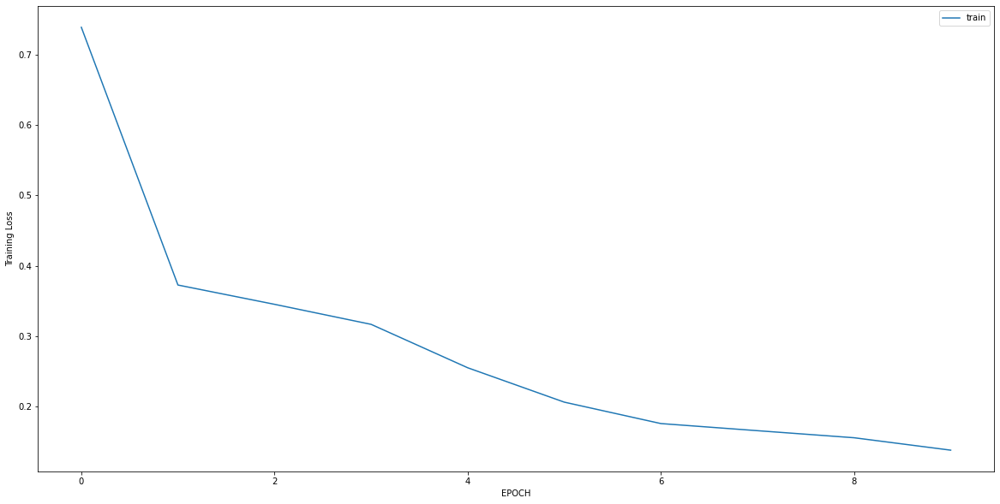

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.0700 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.9346 - accuracy: 0.0000e+00
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8649 - accuracy: 0.3448
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3921 - accuracy: 0.9579
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2280 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1663 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1310 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0964 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0793 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0640 - accuracy: 1.0000


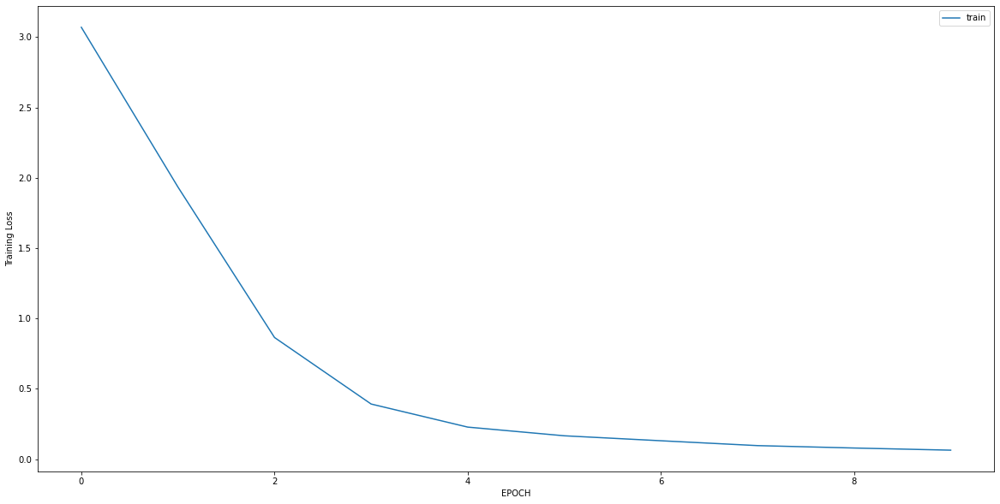

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.9723 - accuracy: 0.3194
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.8923 - accuracy: 0.3194
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.7819 - accuracy: 0.3194
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.4303 - accuracy: 0.3194
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 1.2527 - accuracy: 0.3194
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0420 - accuracy: 0.3194
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8517 - accuracy: 0.3611
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7955 - accuracy: 0.4375
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7387 - accuracy: 0.4722
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6682 - accuracy: 0.5764


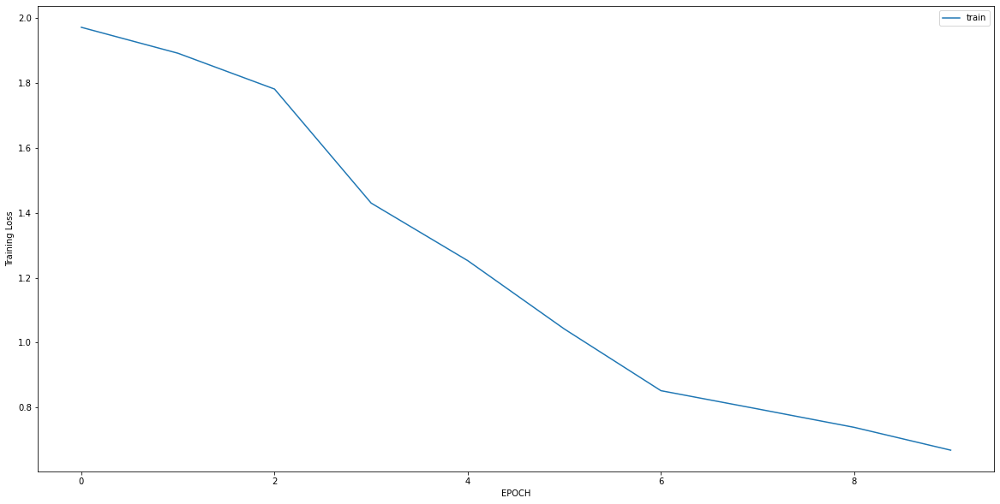

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7495 - accuracy: 0.4881
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7471 - accuracy: 0.4841
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7399 - accuracy: 0.4365
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.7049 - accuracy: 0.5000
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7197 - accuracy: 0.4960
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7038 - accuracy: 0.4841
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.5952
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6886 - accuracy: 0.5635
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6925 - accuracy: 0.5794
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.6771 - accuracy: 0.5754


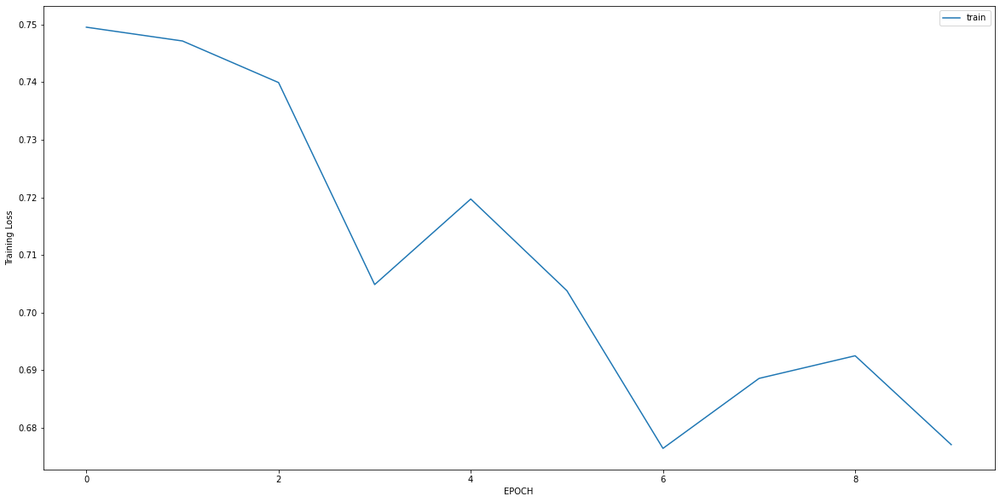

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6436 - accuracy: 0.6570
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6589 - accuracy: 0.6390
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6424 - accuracy: 0.6426
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6437 - accuracy: 0.6534
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6330 - accuracy: 0.6282
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6562 - accuracy: 0.6101
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6119 - accuracy: 0.6823
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6303 - accuracy: 0.6715
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5930 - accuracy: 0.7184
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6000 - accuracy: 0.7112


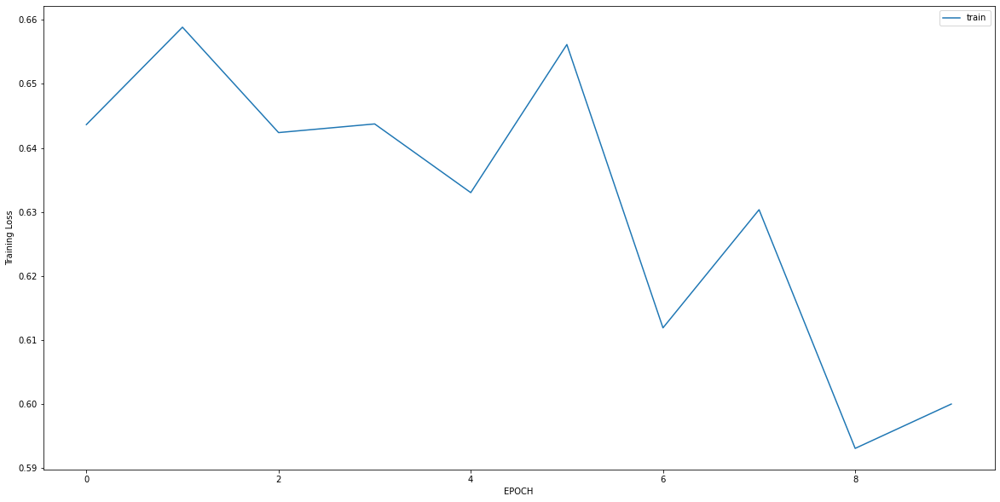

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.5643 - accuracy: 0.6426
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4206 - accuracy: 0.7801
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3530 - accuracy: 0.8694
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3088 - accuracy: 0.9072
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2665 - accuracy: 0.9278
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2353 - accuracy: 0.9588
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2152 - accuracy: 0.9588
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1891 - accuracy: 0.9656
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1912 - accuracy: 0.9381
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1719 - accuracy: 0.9656


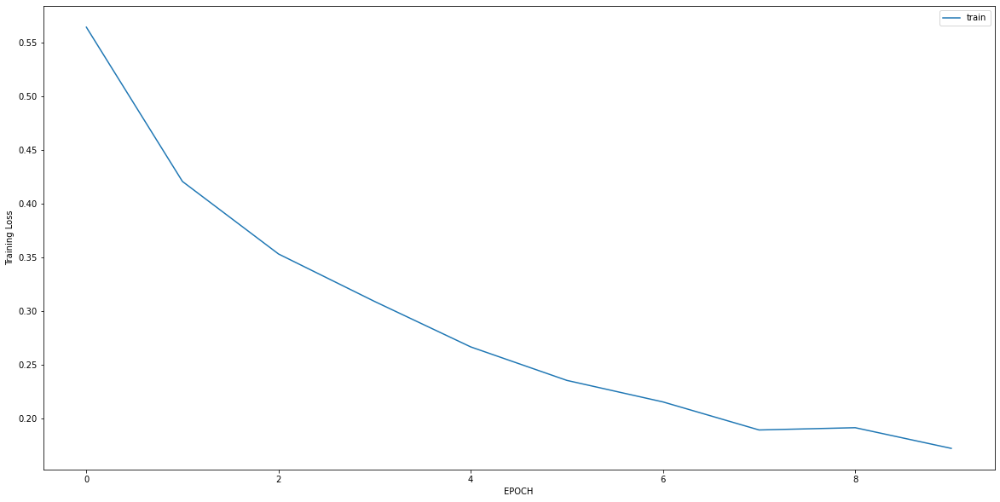

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 2.0496 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.9229 - accuracy: 0.3925
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0202 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 1.0000


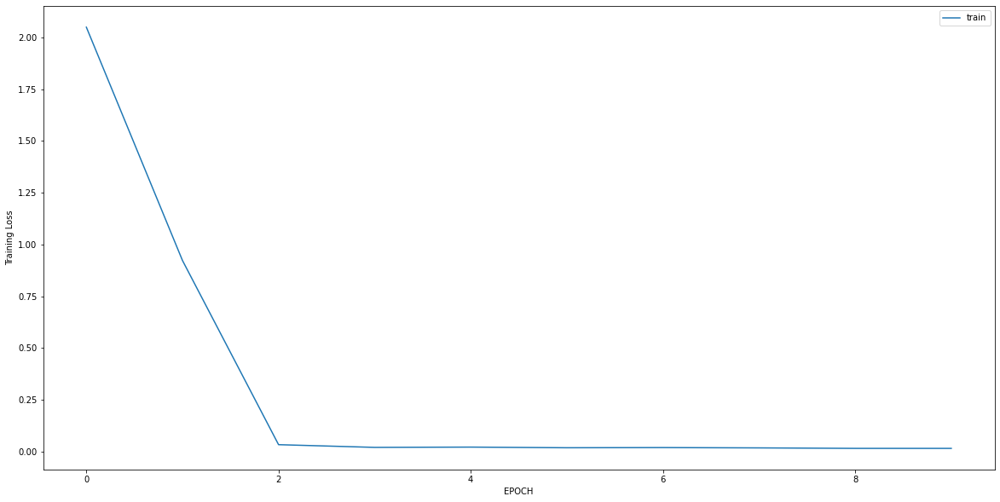

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6093 - accuracy: 0.5132
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3821 - accuracy: 0.5660
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0006 - accuracy: 0.6264
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8350 - accuracy: 0.6981
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6388 - accuracy: 0.7547
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5107 - accuracy: 0.7849
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4986 - accuracy: 0.7925
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4483 - accuracy: 0.8377
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4365 - accuracy: 0.8377
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4117 - accuracy: 0.8679


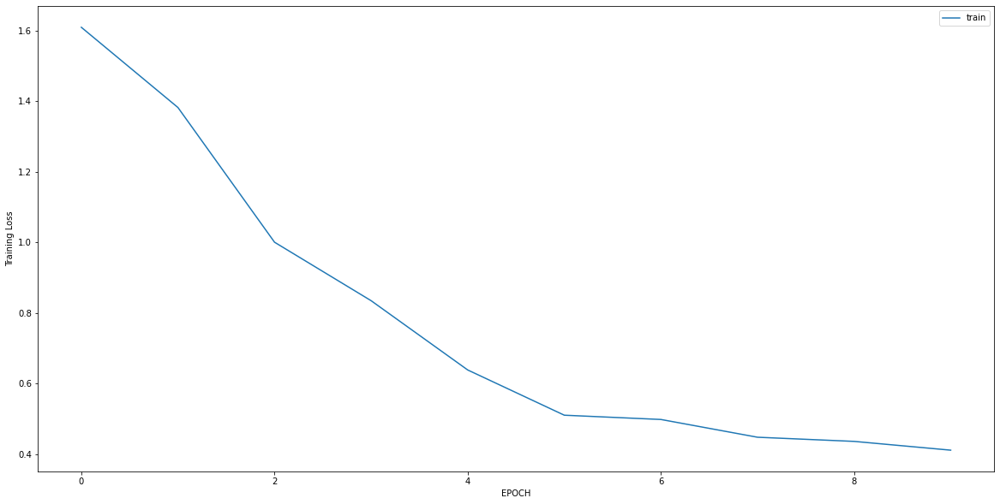

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9881 - accuracy: 0.4704
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8842 - accuracy: 0.4815
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7505 - accuracy: 0.4815
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6716 - accuracy: 0.5407
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6023 - accuracy: 0.6630
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5708 - accuracy: 0.7667
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5695 - accuracy: 0.7630
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5617 - accuracy: 0.7667
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5541 - accuracy: 0.7704
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5518 - accuracy: 0.7778


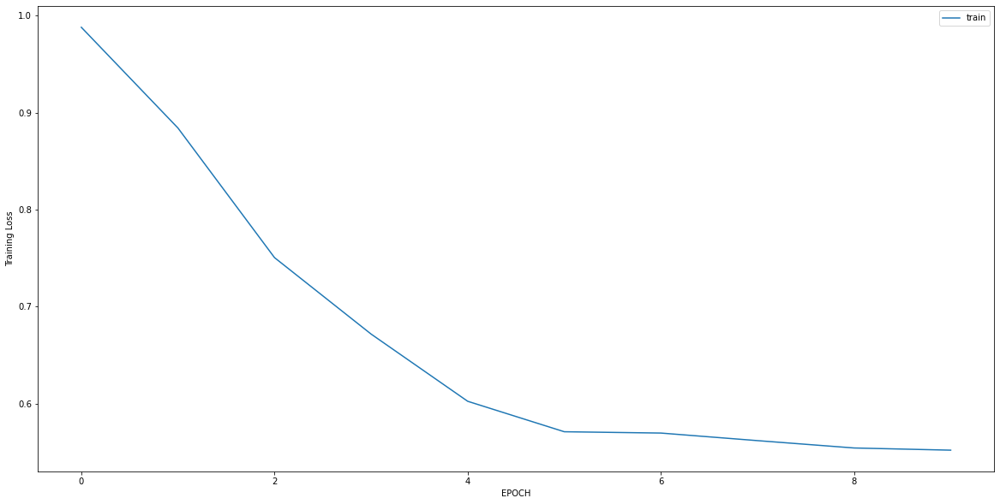

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6893 - accuracy: 0.5468
Epoch 2/10
5/5 [==============================] - 0s 7ms/step - loss: 0.6482 - accuracy: 0.6043
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6181 - accuracy: 0.6978
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5880 - accuracy: 0.6978
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6467 - accuracy: 0.6475
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6026 - accuracy: 0.6619
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6307 - accuracy: 0.6619
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6263 - accuracy: 0.6691
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6036 - accuracy: 0.6906
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6096 - accuracy: 0.6906


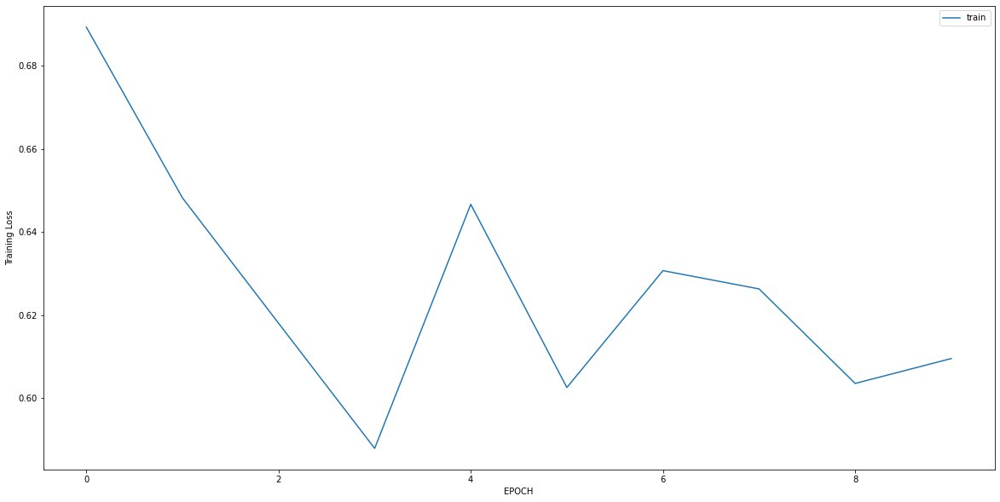

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.9794 - accuracy: 0.1278
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.6444 - accuracy: 0.6278
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.4297 - accuracy: 0.9778
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2971 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2492 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1891 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1612 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1524 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1181 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1142 - accuracy: 1.0000


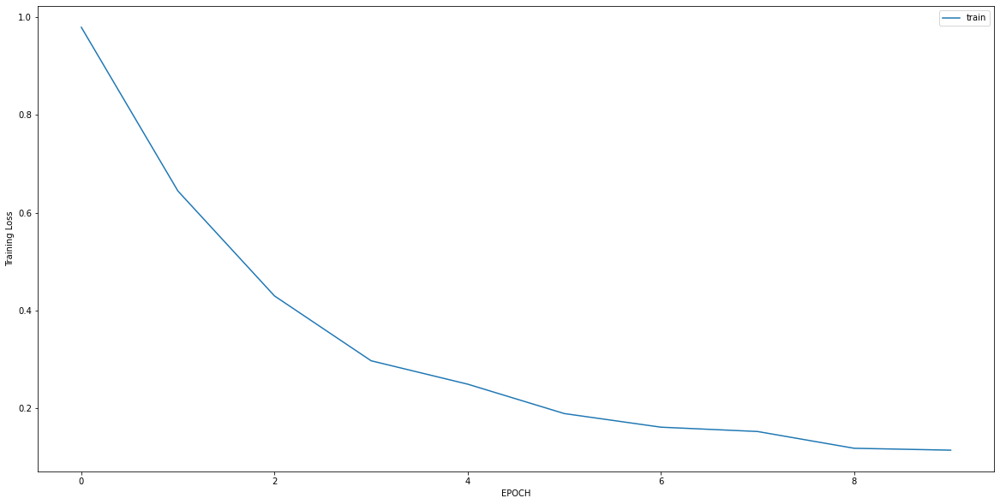

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 1.2204 - accuracy: 0.1981
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 1.1378 - accuracy: 0.2453
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9727 - accuracy: 0.3774
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8235 - accuracy: 0.4764
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.7096 - accuracy: 0.5849
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6433 - accuracy: 0.6557
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5512 - accuracy: 0.7406
Epoch 8/10
7/7 [==============================] - 0s 6ms/step - loss: 0.5051 - accuracy: 0.7830
Epoch 9/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4700 - accuracy: 0.7736
Epoch 10/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4359 - accuracy: 0.8019


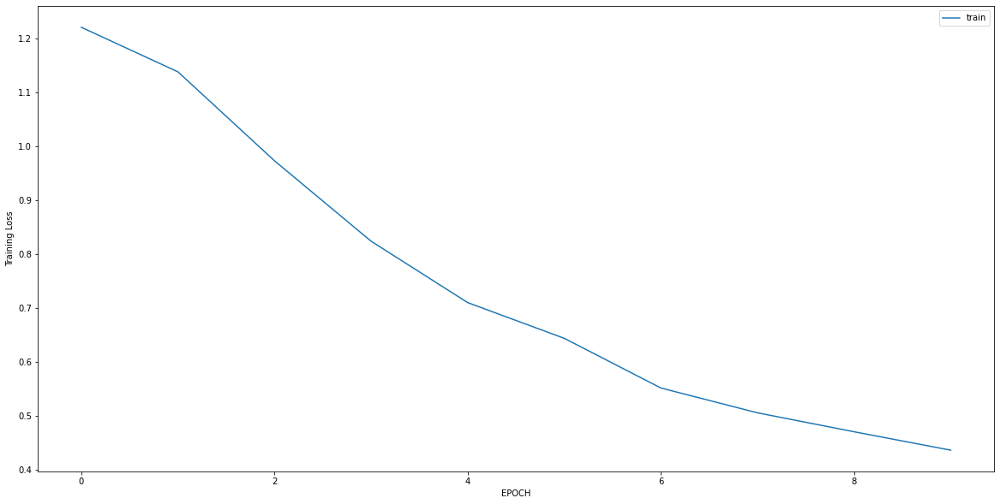

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8244 - accuracy: 0.6193
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7250 - accuracy: 0.6376
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5390 - accuracy: 0.7477
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4820 - accuracy: 0.8165
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4378 - accuracy: 0.8165
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4216 - accuracy: 0.8532
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3717 - accuracy: 0.8807
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3595 - accuracy: 0.8761
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3277 - accuracy: 0.9220
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3086 - accuracy: 0.9174


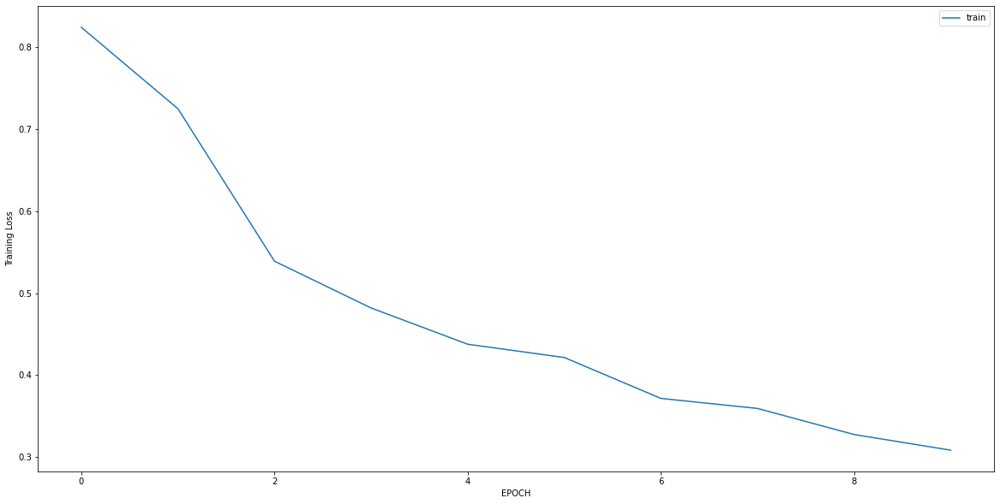

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3479 - accuracy: 0.3993
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9940 - accuracy: 0.3993
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7261 - accuracy: 0.4776
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5749 - accuracy: 0.8060
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5539 - accuracy: 0.7388
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5476 - accuracy: 0.7239
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5319 - accuracy: 0.7575
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5138 - accuracy: 0.8097
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5200 - accuracy: 0.7873
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5084 - accuracy: 0.8358


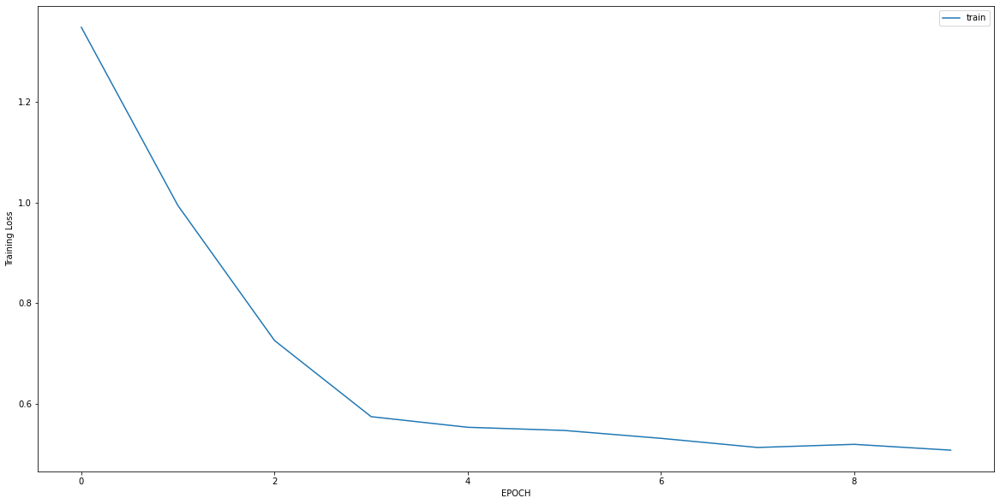

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.3496 - accuracy: 0.9948
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1987 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1383 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1035 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0857 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0717 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0628 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0517 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0476 - accuracy: 1.0000


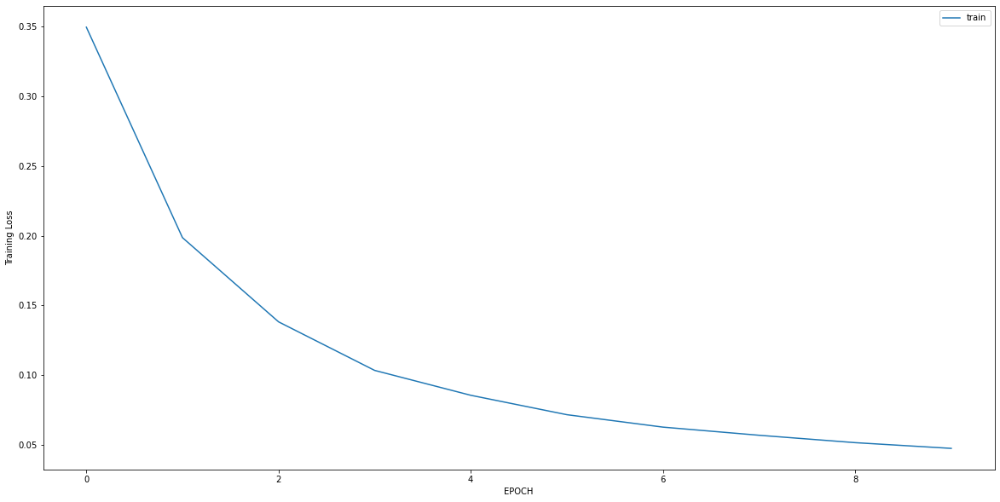

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.8980 - accuracy: 0.2659
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.2985 - accuracy: 0.3716
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.7372 - accuracy: 0.6254
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4136 - accuracy: 0.8218
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3589 - accuracy: 0.8218
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3481 - accuracy: 0.8066
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3386 - accuracy: 0.8157
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3391 - accuracy: 0.8429
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3294 - accuracy: 0.8580
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3012 - accuracy: 0.8610


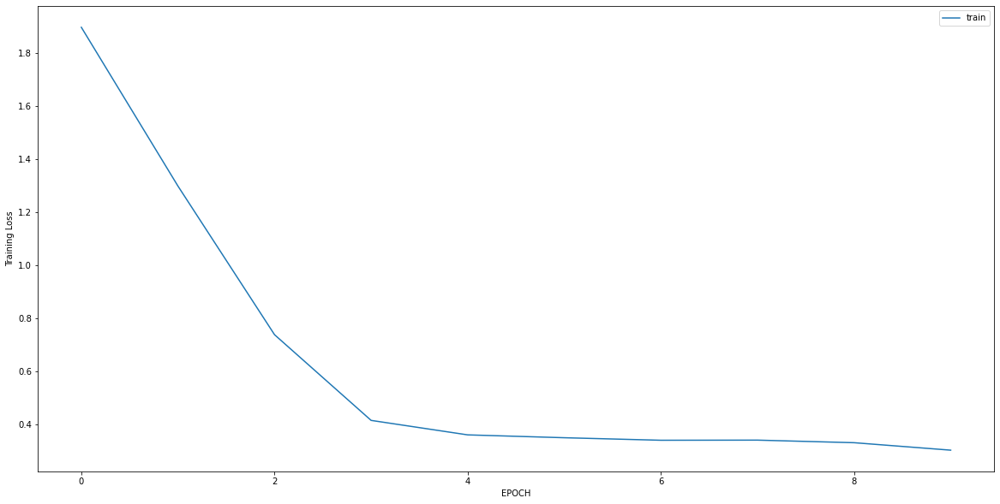

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.8607 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.0484 - accuracy: 0.0000e+00
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0885 - accuracy: 0.1801
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5064 - accuracy: 0.8008
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2397 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1456 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1086 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0835 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0712 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0641 - accuracy: 1.0000


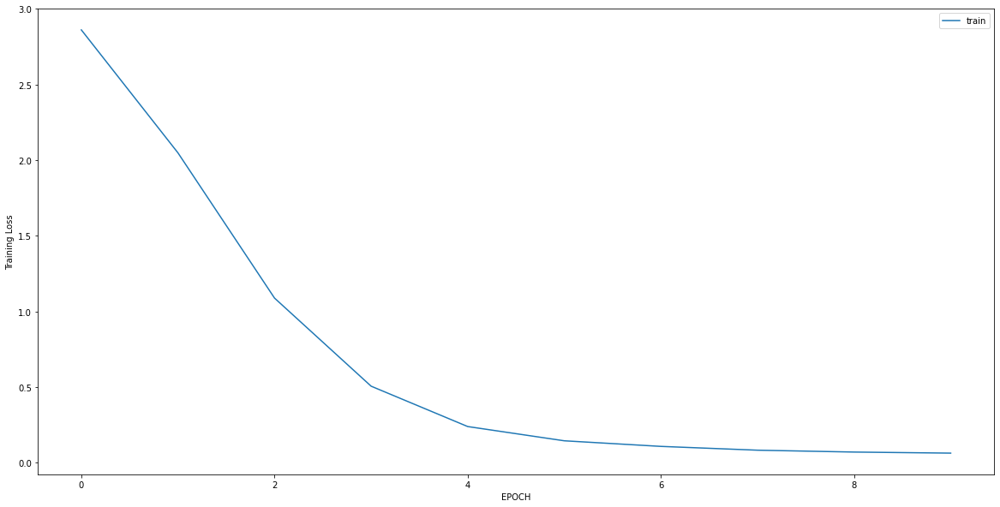

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0651 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0566 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0471 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 1.0000


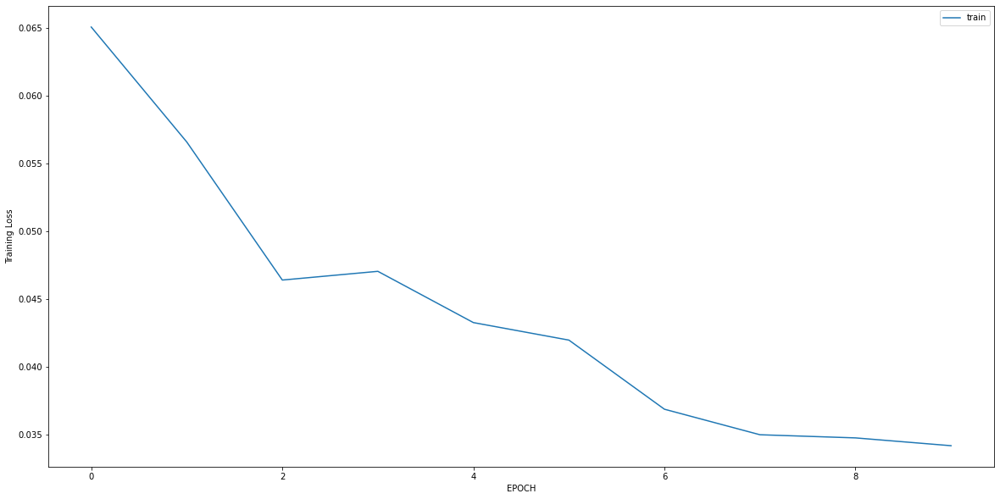

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.1133 - accuracy: 0.3970
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.7494 - accuracy: 0.3970
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4223 - accuracy: 0.3970
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0329 - accuracy: 0.3970
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8565 - accuracy: 0.4195
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7352 - accuracy: 0.4944
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6642 - accuracy: 0.6217
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6320 - accuracy: 0.7116
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5373 - accuracy: 0.8165
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4936 - accuracy: 0.8427


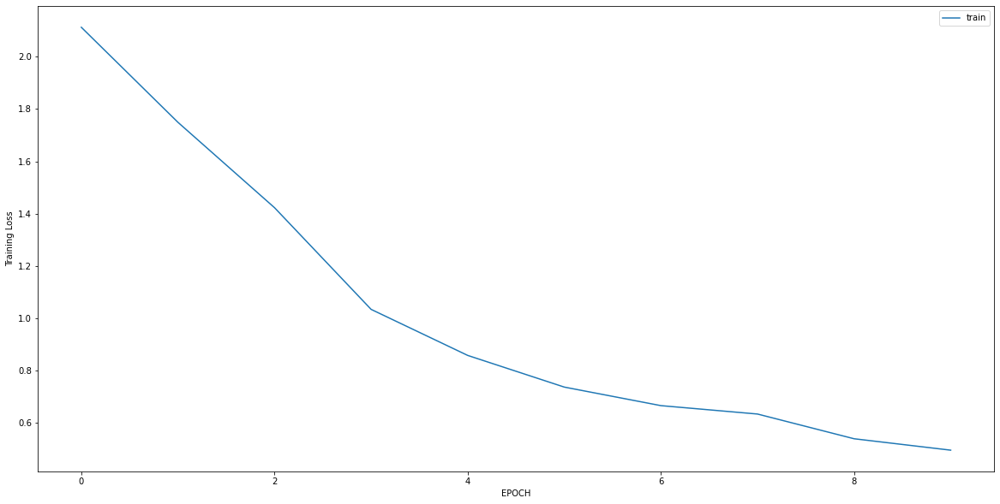

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7691 - accuracy: 0.5552
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7191 - accuracy: 0.5338
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6233 - accuracy: 0.6014
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5712 - accuracy: 0.7972
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5765 - accuracy: 0.7544
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5373 - accuracy: 0.8114
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5257 - accuracy: 0.8470
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5327 - accuracy: 0.8114
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5259 - accuracy: 0.7936
Epoch 10/10
9/9 [==============================] - ETA: 0s - loss: 0.4996 - accuracy: 0.81 - 0s 5ms/step - loss: 0.5030 - accuracy: 0.83

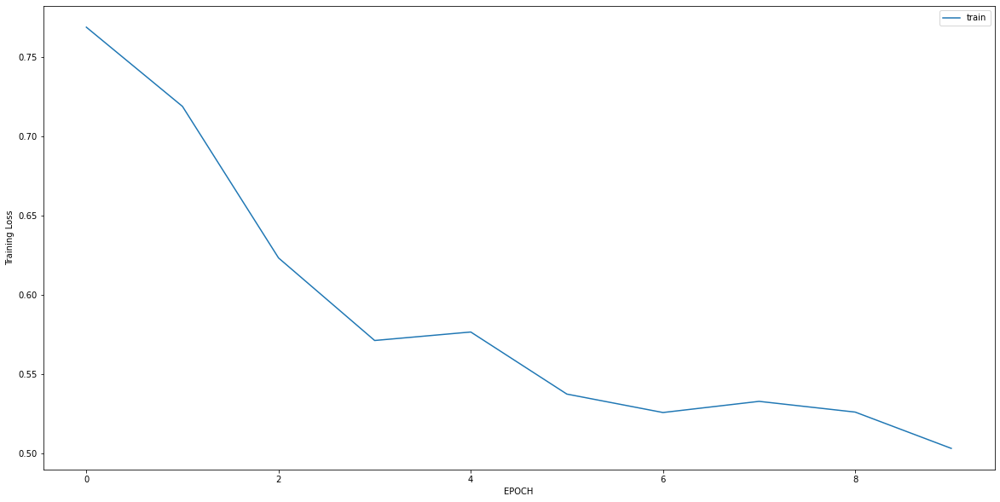

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5176 - accuracy: 0.8321
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5227 - accuracy: 0.8246
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5004 - accuracy: 0.8209
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4782 - accuracy: 0.8433
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4867 - accuracy: 0.8396
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4600 - accuracy: 0.8545
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4553 - accuracy: 0.8731
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4442 - accuracy: 0.8694
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4390 - accuracy: 0.8806
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4157 - accuracy: 0.8806


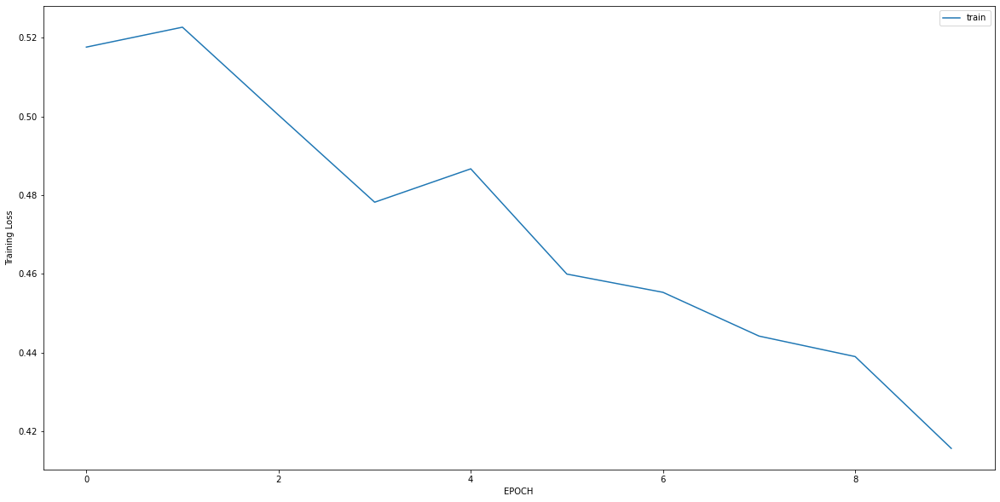

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4256 - accuracy: 0.8448
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3754 - accuracy: 0.9034
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3623 - accuracy: 0.9069
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3589 - accuracy: 0.8966
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3381 - accuracy: 0.9276
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3222 - accuracy: 0.9379
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3312 - accuracy: 0.9172
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3504 - accuracy: 0.8931
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3048 - accuracy: 0.9448
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2795 - accuracy: 0.9414


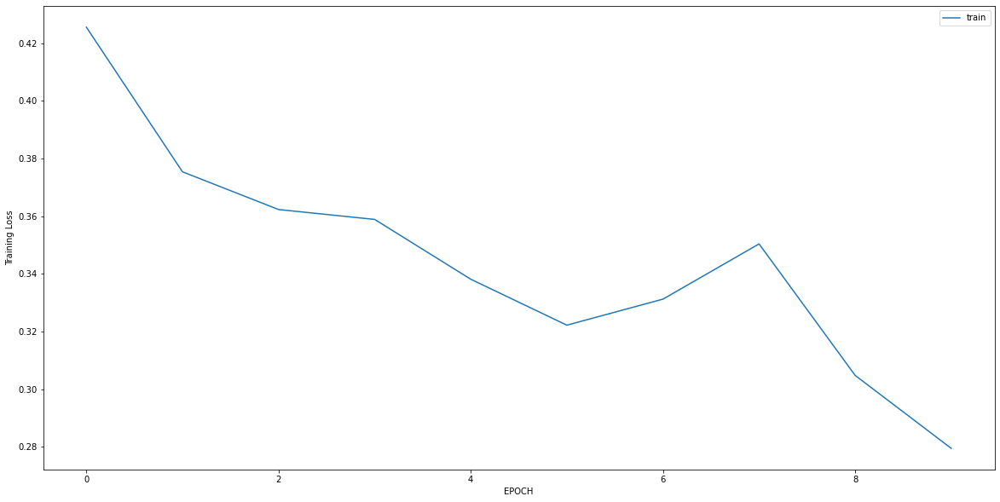

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4364 - accuracy: 0.8127
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3206 - accuracy: 0.8973
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2789 - accuracy: 0.9154
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2683 - accuracy: 0.9245
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2389 - accuracy: 0.9517
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2394 - accuracy: 0.9305
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2326 - accuracy: 0.9154
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2106 - accuracy: 0.9426
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2802 - accuracy: 0.8852
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2799 - accuracy: 0.9033


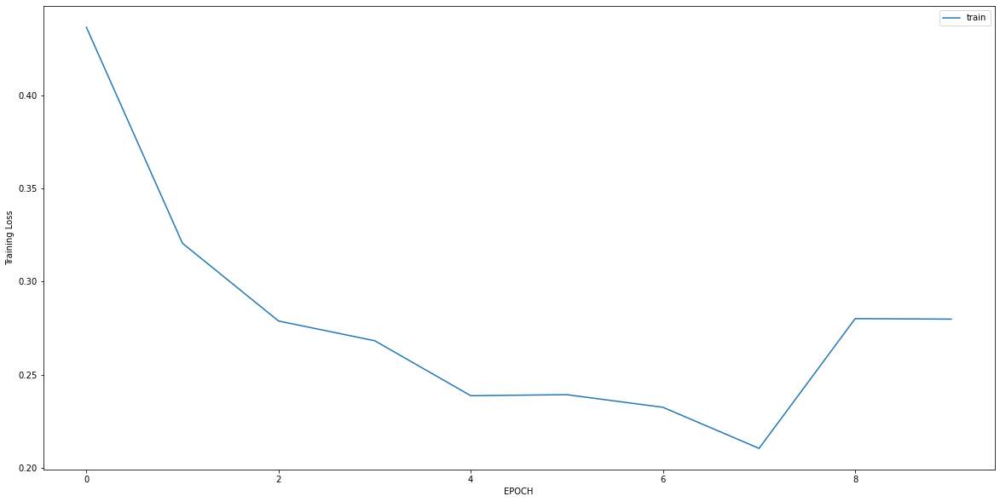

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4727 - accuracy: 0.7926
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3810 - accuracy: 0.8556
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3885 - accuracy: 0.8370
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3737 - accuracy: 0.8481
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3623 - accuracy: 0.8444
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3228 - accuracy: 0.8667
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3247 - accuracy: 0.8889
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3082 - accuracy: 0.8889
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3182 - accuracy: 0.8926
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3044 - accuracy: 0.9074


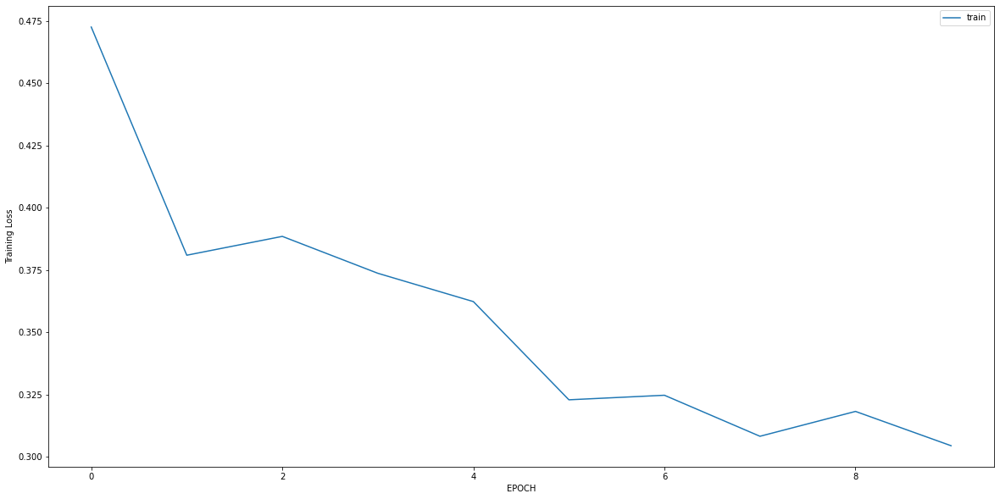

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9971 - accuracy: 0.6520
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7287 - accuracy: 0.6646
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3575 - accuracy: 0.8276
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2370 - accuracy: 0.9655
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1986 - accuracy: 0.9561
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1695 - accuracy: 0.9624
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1920 - accuracy: 0.9655
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1360 - accuracy: 0.9843
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1141 - accuracy: 0.9906
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1230 - accuracy: 0.9781


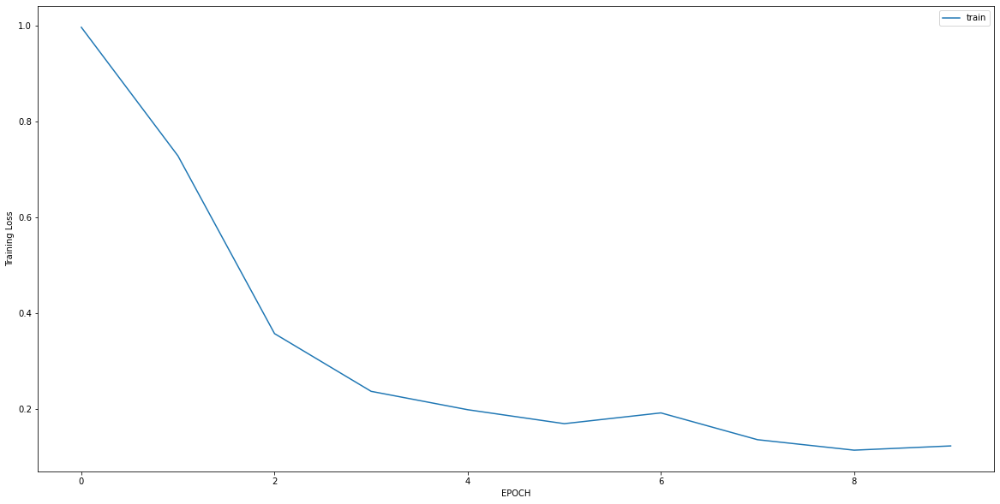

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4126 - accuracy: 0.5516
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1426 - accuracy: 0.5516
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7527 - accuracy: 0.6157
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4873 - accuracy: 0.7722
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4562 - accuracy: 0.8007
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4232 - accuracy: 0.8363
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3567 - accuracy: 0.8754
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3194 - accuracy: 0.9181
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2888 - accuracy: 0.9217
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2726 - accuracy: 0.9217


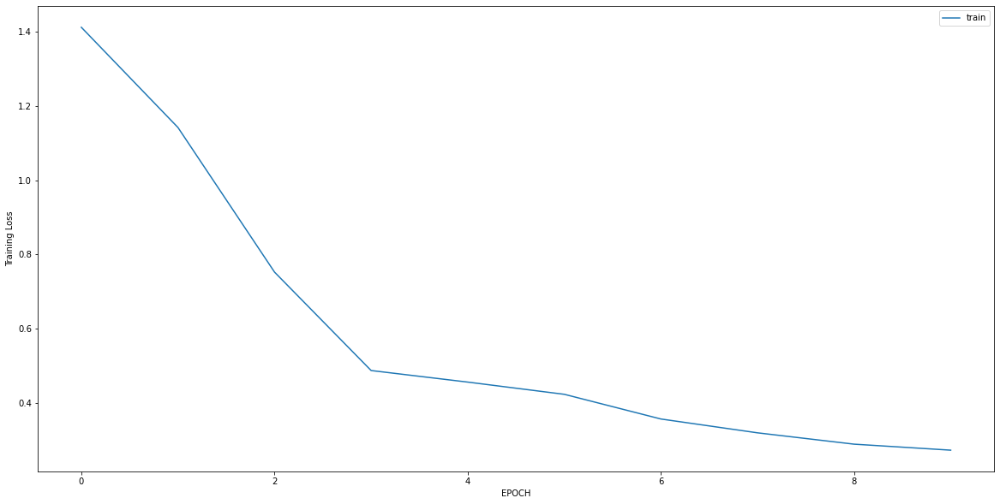

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2123 - accuracy: 0.9289
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2335 - accuracy: 0.9209
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2621 - accuracy: 0.9130
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2047 - accuracy: 0.9447
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2382 - accuracy: 0.9328
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1897 - accuracy: 0.9328
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1912 - accuracy: 0.9486
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1677 - accuracy: 0.9565
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2663 - accuracy: 0.9012
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2621 - accuracy: 0.8972


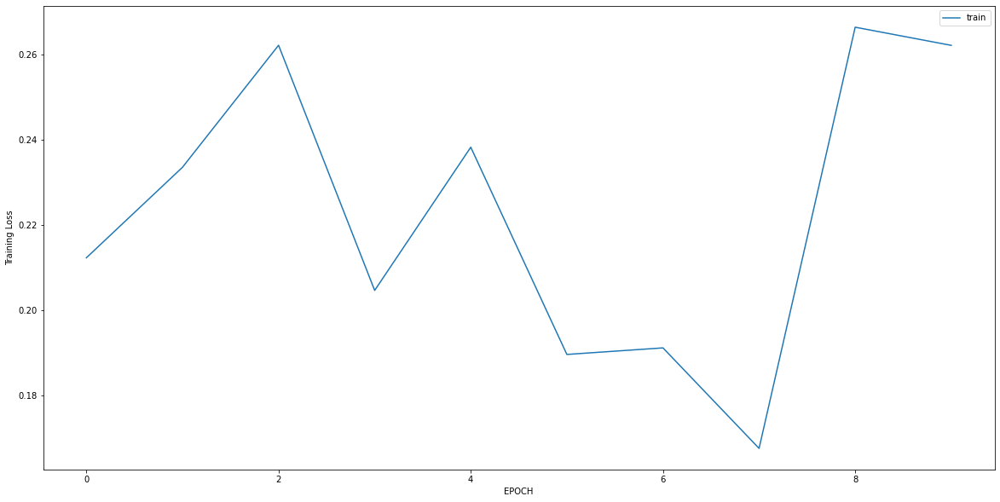

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2520 - accuracy: 0.9833
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1808 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1500 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1209 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1119 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0924 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0773 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0645 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0649 - accuracy: 1.0000


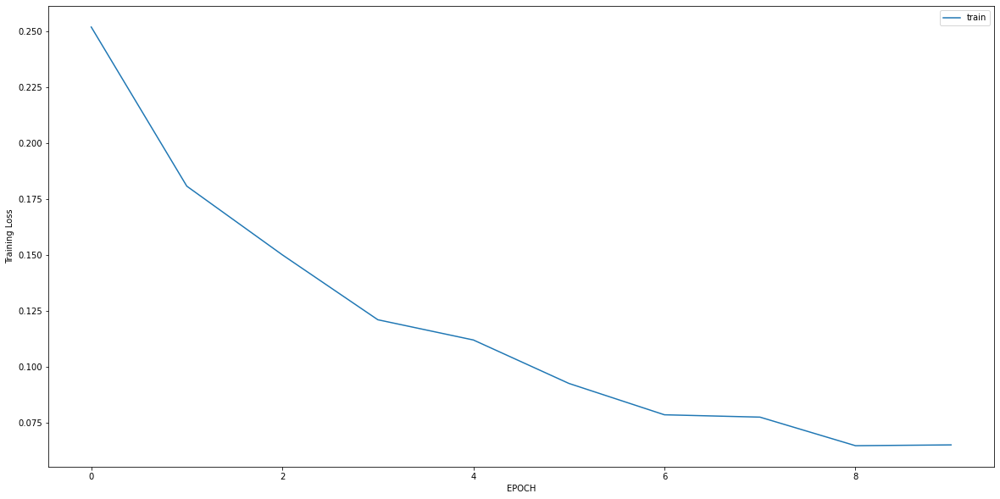

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.2293 - accuracy: 0.4861
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4952 - accuracy: 0.7847
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6125 - accuracy: 0.7222
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6526 - accuracy: 0.7014
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6196 - accuracy: 0.7292
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6307 - accuracy: 0.7292
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6223 - accuracy: 0.6944
Epoch 8/10
5/5 [==============================] - ETA: 0s - loss: 0.6686 - accuracy: 0.65 - 0s 5ms/step - loss: 0.5575 - accuracy: 0.7153
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5903 - accuracy: 0.6944
Epoch 10/10
5/5 [==============================] - ETA: 0s - loss: 0.5719 - accuracy: 0.68 - 0

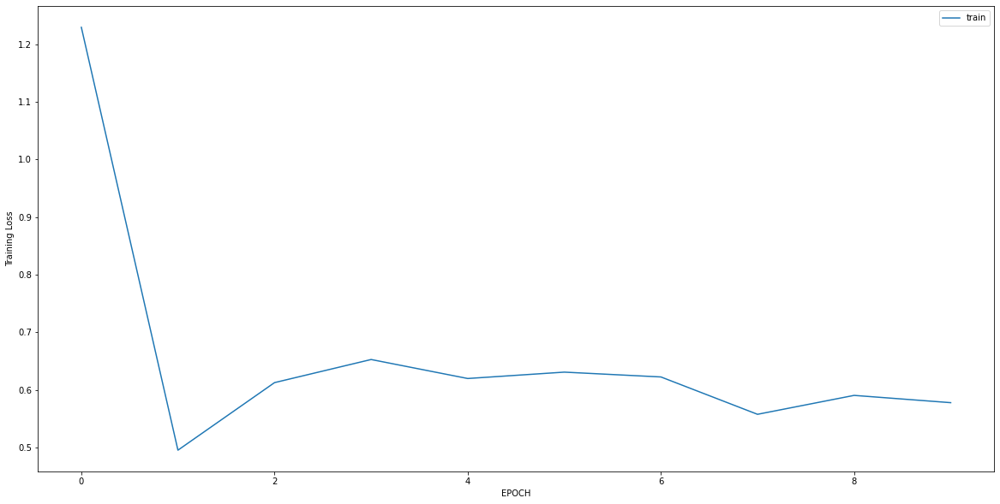

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.3042 - accuracy: 0.1932
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0663 - accuracy: 0.9924
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0212 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0179 - accuracy: 1.0000


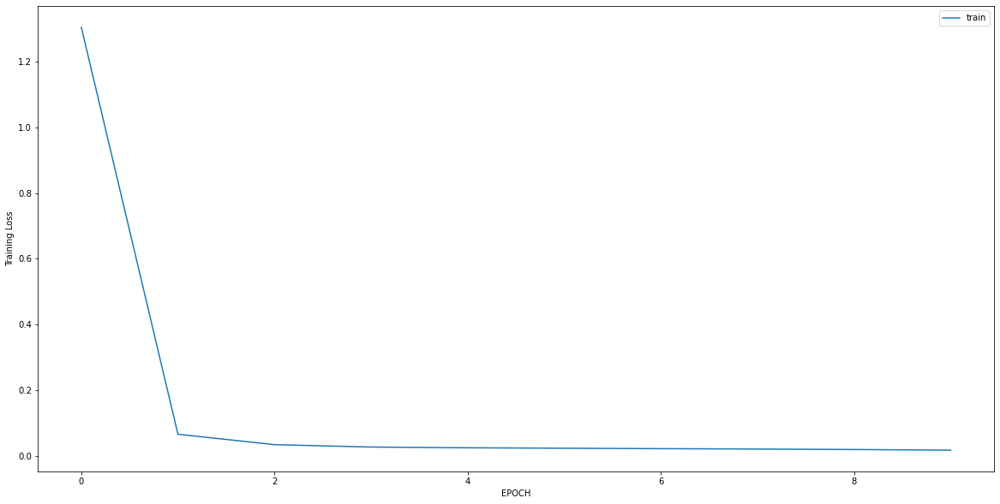

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0901 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0648 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0470 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0299 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 1.0000


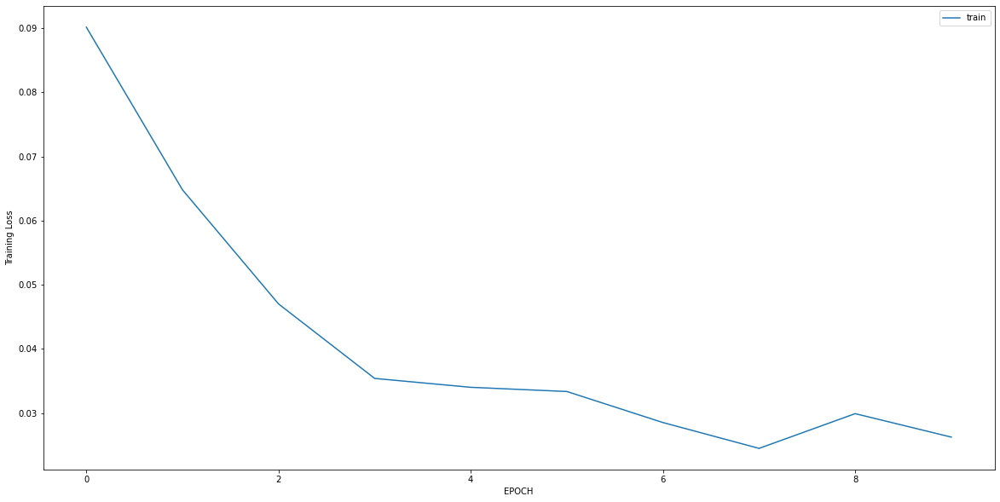

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5879 - accuracy: 0.4698
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0550 - accuracy: 0.6192
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7265 - accuracy: 0.7651
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5316 - accuracy: 0.8114
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4003 - accuracy: 0.8648
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3345 - accuracy: 0.8861
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2835 - accuracy: 0.9075
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2519 - accuracy: 0.9217
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2163 - accuracy: 0.9431
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1889 - accuracy: 0.9537


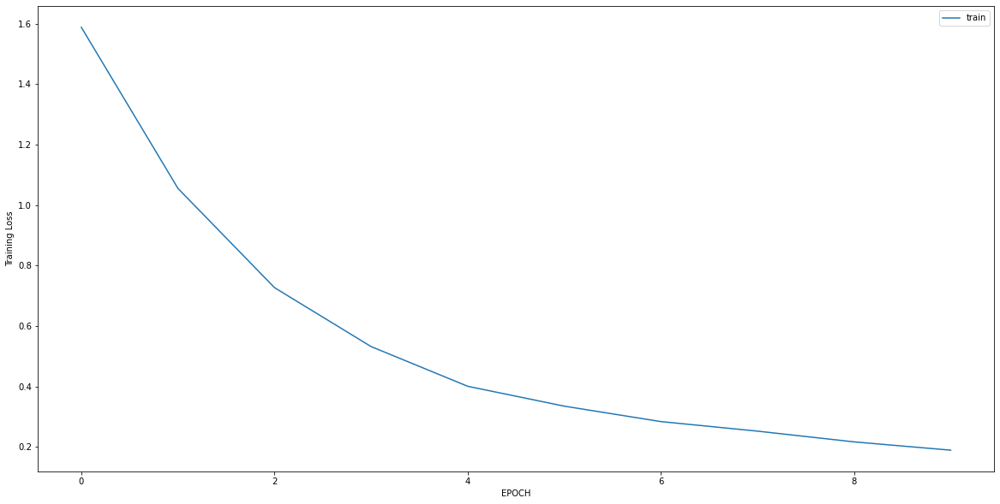

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3518 - accuracy: 0.8502
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3497 - accuracy: 0.8801
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3158 - accuracy: 0.8951
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3155 - accuracy: 0.8989
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2820 - accuracy: 0.8989
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2718 - accuracy: 0.8989
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2527 - accuracy: 0.9213
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2941 - accuracy: 0.8876
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2762 - accuracy: 0.9064
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2793 - accuracy: 0.9139


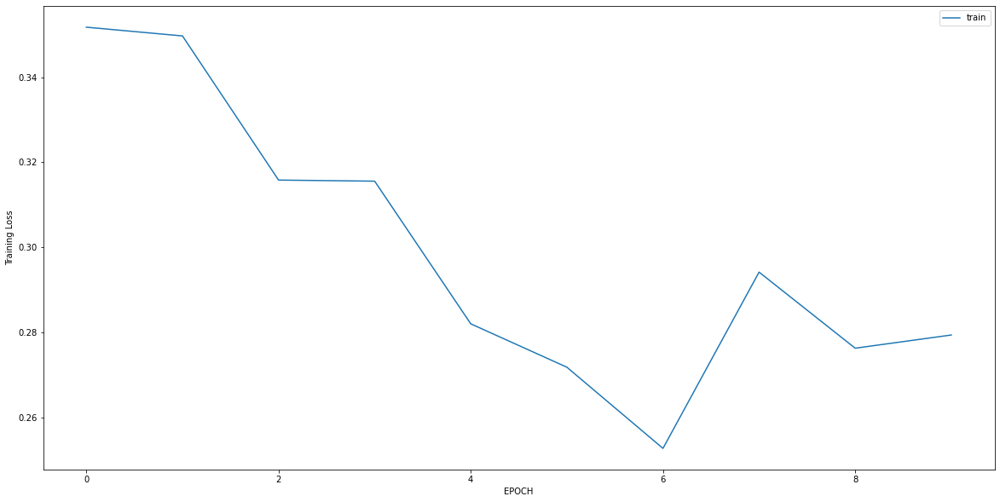

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4720 - accuracy: 0.7689
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3462 - accuracy: 0.8302
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3956 - accuracy: 0.8585
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3591 - accuracy: 0.8632
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3763 - accuracy: 0.8349
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3275 - accuracy: 0.8396
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3149 - accuracy: 0.8349
Epoch 8/10
7/7 [==============================] - 0s 6ms/step - loss: 0.3123 - accuracy: 0.8726
Epoch 9/10
7/7 [==============================] - 0s 6ms/step - loss: 0.3200 - accuracy: 0.8726
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3078 - accuracy: 0.8443


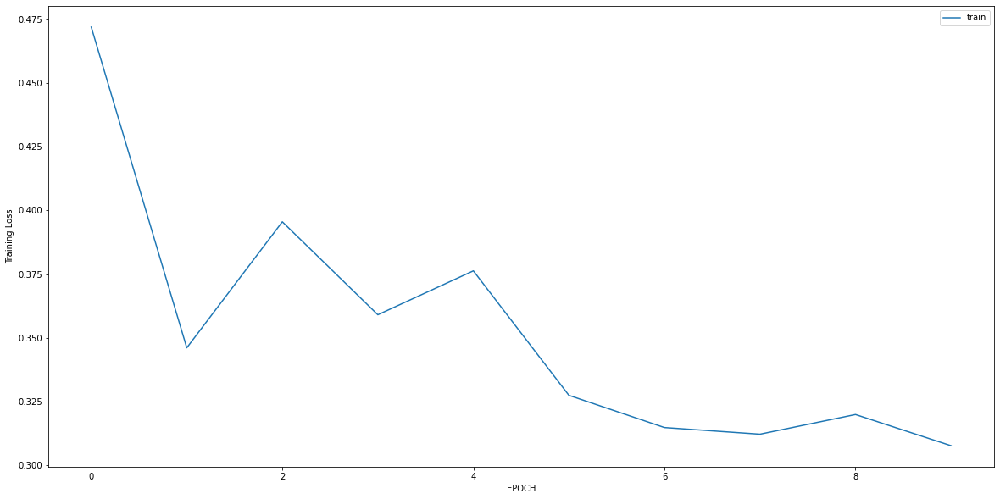

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1991 - accuracy: 0.9325
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1853 - accuracy: 0.9524
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1679 - accuracy: 0.9603
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1492 - accuracy: 0.9563
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1288 - accuracy: 0.9722
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1251 - accuracy: 0.9762
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1216 - accuracy: 0.9802
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1150 - accuracy: 0.9802
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1041 - accuracy: 0.9921
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0911 - accuracy: 1.0000


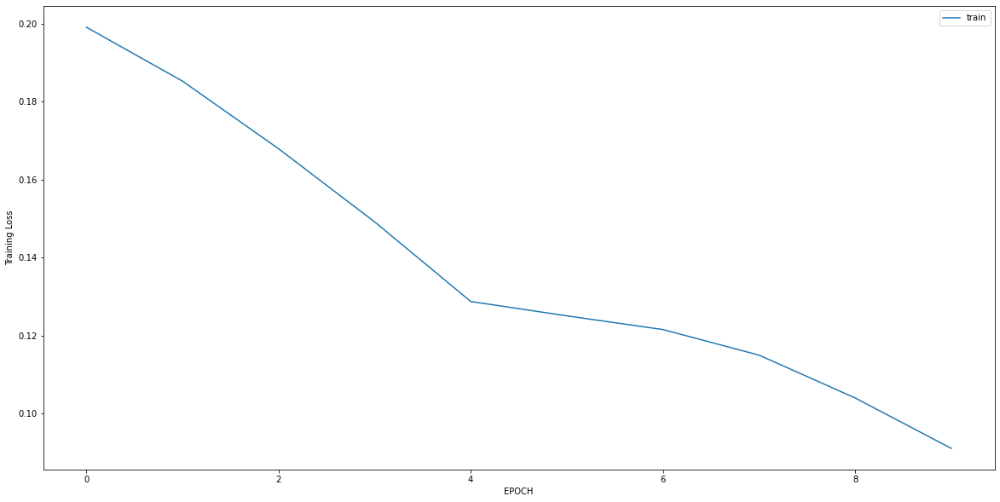

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.8132 - accuracy: 0.6159
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3660 - accuracy: 0.8146
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3292 - accuracy: 0.8576
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3265 - accuracy: 0.8675
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3185 - accuracy: 0.8841
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2847 - accuracy: 0.9040
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2664 - accuracy: 0.9106
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2472 - accuracy: 0.9106
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2630 - accuracy: 0.8874
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2439 - accuracy: 0.9106


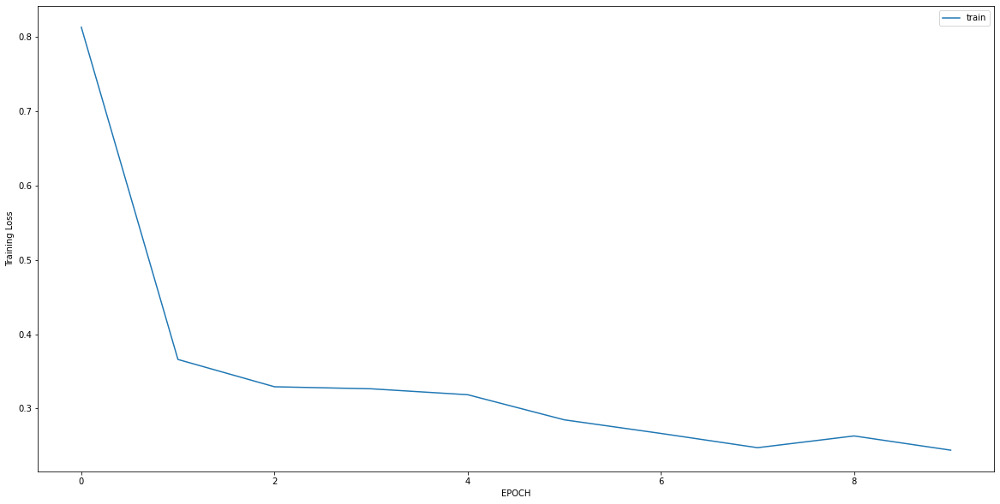

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.1347 - accuracy: 0.6468
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.9949 - accuracy: 0.6468
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7460 - accuracy: 0.6514
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5272 - accuracy: 0.6789
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3546 - accuracy: 0.8624
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3419 - accuracy: 0.8303
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3531 - accuracy: 0.8670
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3516 - accuracy: 0.8532
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2823 - accuracy: 0.9404
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2754 - accuracy: 0.9037


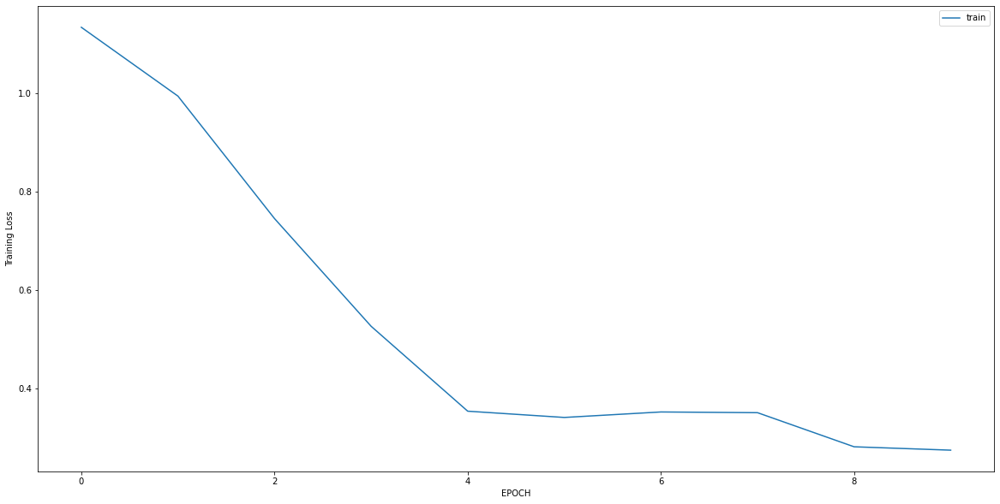

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6475 - accuracy: 0.4206
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.0518 - accuracy: 0.4921
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5010 - accuracy: 0.8135
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4726 - accuracy: 0.7976
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4326 - accuracy: 0.8214
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3396 - accuracy: 0.8810
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3473 - accuracy: 0.9008
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3017 - accuracy: 0.9127
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3038 - accuracy: 0.9127
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2757 - accuracy: 0.9246


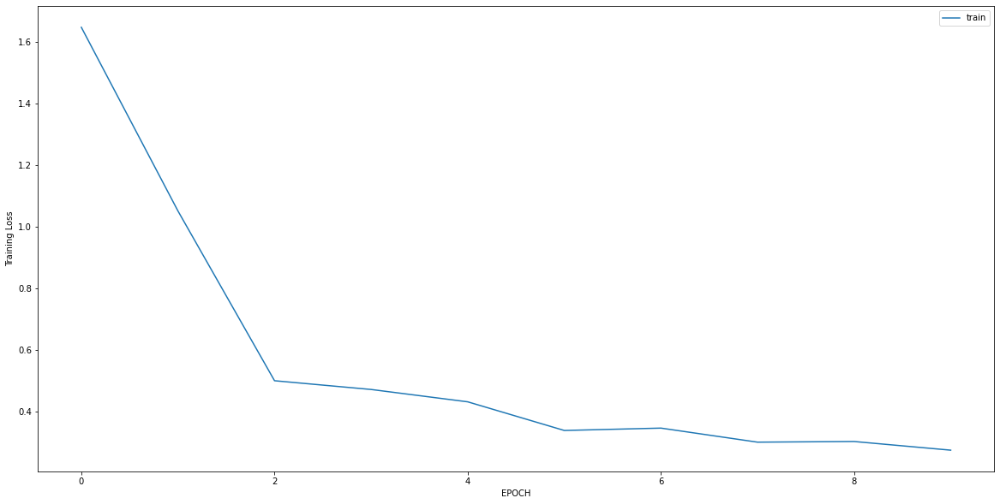

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5919 - accuracy: 0.7923
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5002 - accuracy: 0.7833
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3092 - accuracy: 0.8668
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2422 - accuracy: 0.8984
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2218 - accuracy: 0.9345
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2291 - accuracy: 0.9278
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1711 - accuracy: 0.9616
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1618 - accuracy: 0.9639
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1937 - accuracy: 0.9503
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1664 - accuracy: 0.9594


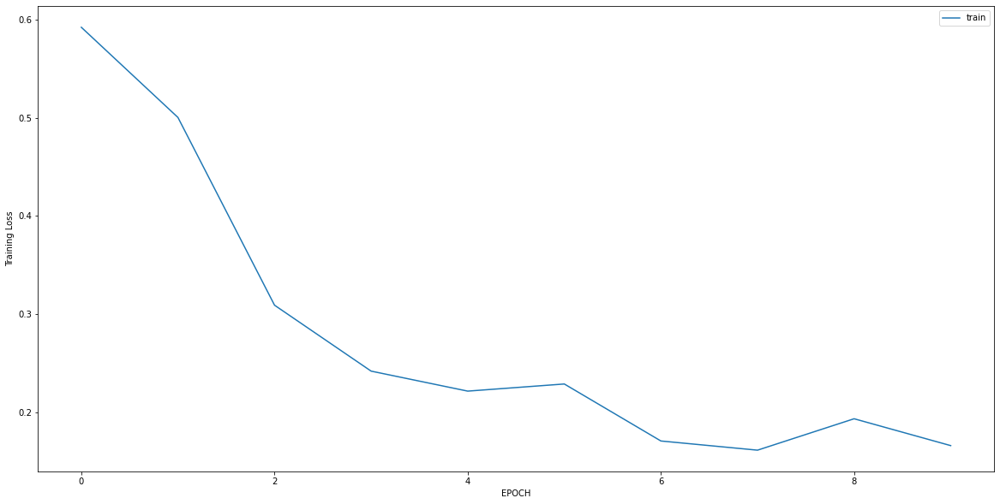

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 2.1991 - accuracy: 0.0040
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7529 - accuracy: 0.4921
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2928 - accuracy: 0.9802
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1414 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0831 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0566 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0295 - accuracy: 1.0000


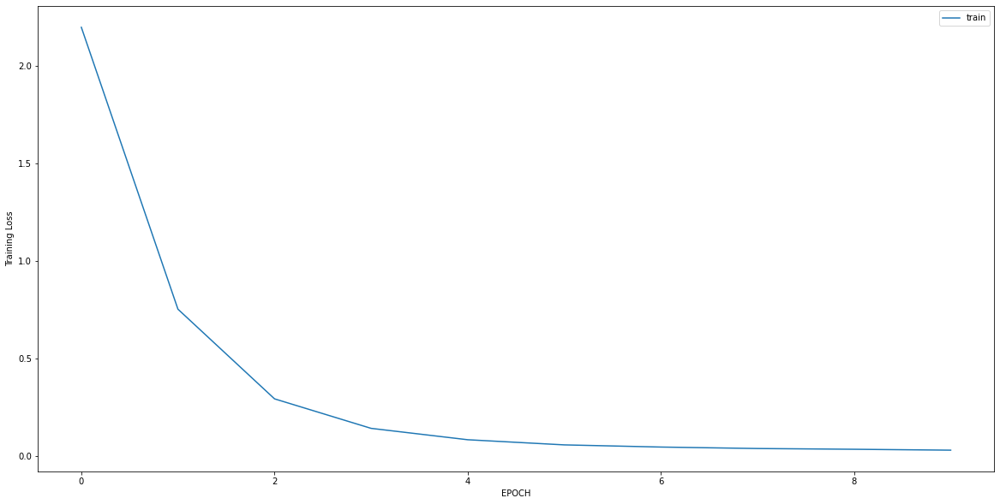

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9152 - accuracy: 0.6806
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8765 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7495 - accuracy: 0.6875
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3698 - accuracy: 0.8750
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3896 - accuracy: 0.8403
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3137 - accuracy: 0.9306
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2810 - accuracy: 0.9444
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2673 - accuracy: 0.9583
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2763 - accuracy: 0.9444
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2777 - accuracy: 0.9236


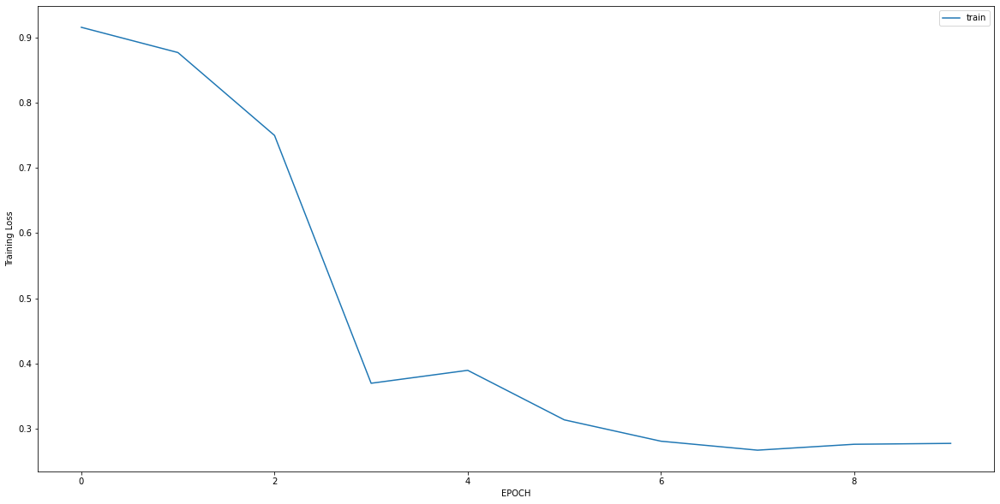

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.9659 - accuracy: 0.6566
Epoch 2/10
15/15 [==============================] - 0s 5ms/step - loss: 0.6388 - accuracy: 0.7343
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.5108 - accuracy: 0.7905
Epoch 4/10
15/15 [==============================] - 0s 5ms/step - loss: 0.4281 - accuracy: 0.8143
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3781 - accuracy: 0.8596
Epoch 6/10
15/15 [==============================] - 0s 6ms/step - loss: 0.3345 - accuracy: 0.8790
Epoch 7/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3335 - accuracy: 0.8920
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3242 - accuracy: 0.8920
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3036 - accuracy: 0.9071
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3130 - accuracy: 0.9050


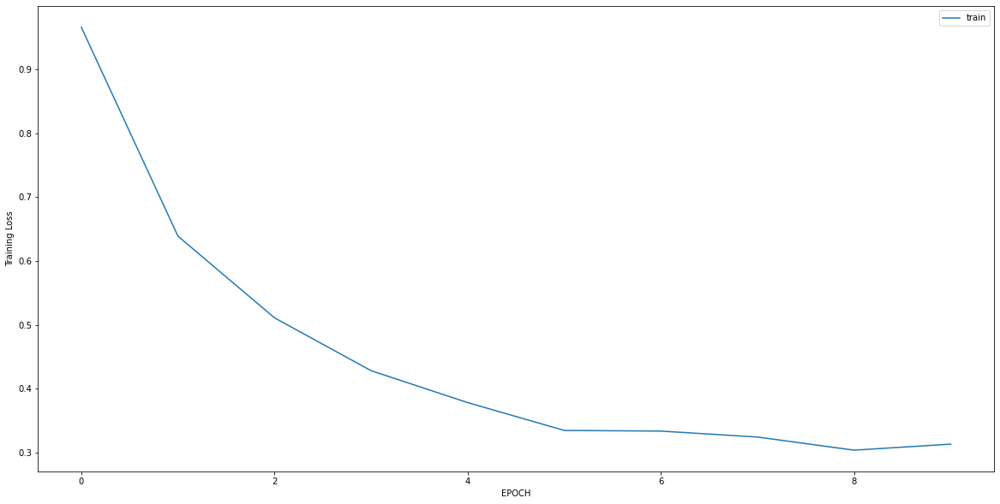

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7867 - accuracy: 0.6745
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4601 - accuracy: 0.8431
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4616 - accuracy: 0.8235
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4451 - accuracy: 0.8353
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4007 - accuracy: 0.8431
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3334 - accuracy: 0.8863
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3324 - accuracy: 0.8784
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3090 - accuracy: 0.8784
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3234 - accuracy: 0.9020
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2883 - accuracy: 0.9137


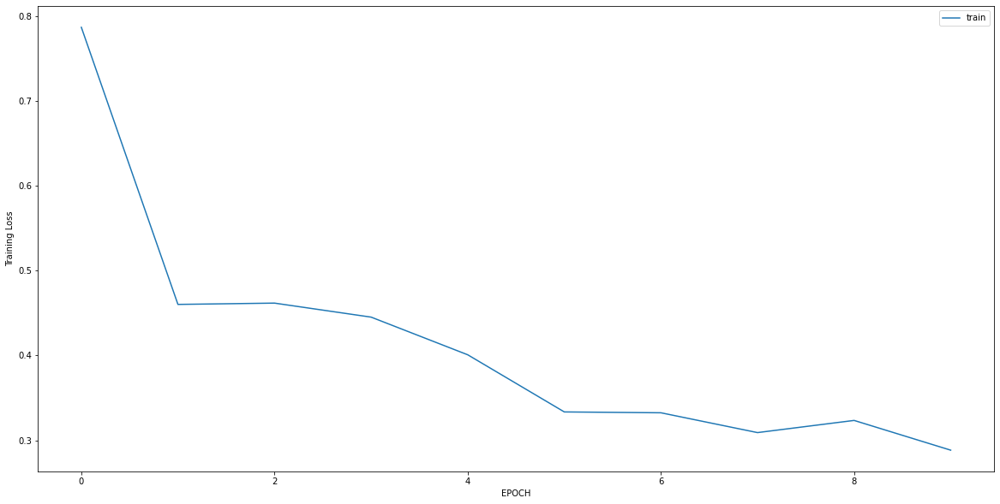

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7579 - accuracy: 0.5849
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4953 - accuracy: 0.6943
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3793 - accuracy: 0.8302
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3640 - accuracy: 0.8755
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3230 - accuracy: 0.8792
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3213 - accuracy: 0.8943
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3073 - accuracy: 0.8906
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2912 - accuracy: 0.9057
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2794 - accuracy: 0.9094
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2594 - accuracy: 0.9094


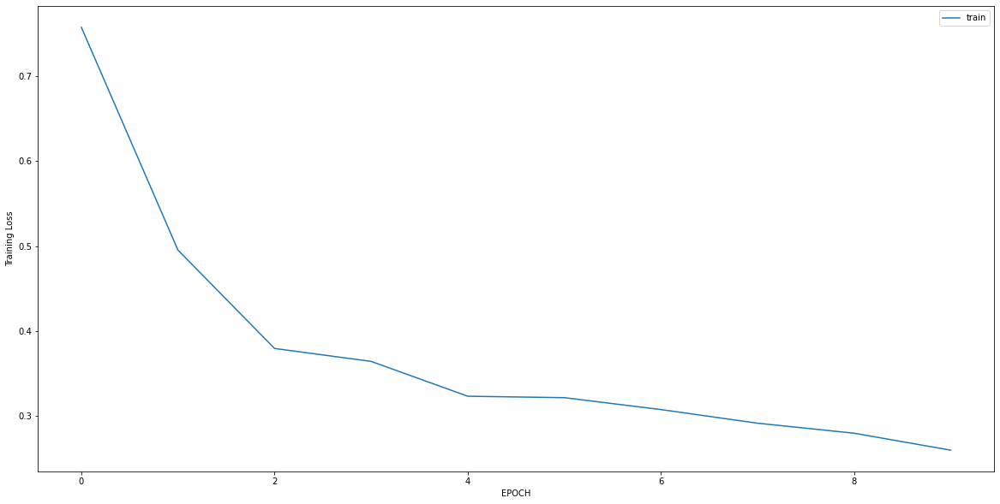

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6950 - accuracy: 0.6351
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3181 - accuracy: 0.8807
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3579 - accuracy: 0.8526
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3230 - accuracy: 0.8807
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2744 - accuracy: 0.9158
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2569 - accuracy: 0.9158
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2302 - accuracy: 0.9263
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2649 - accuracy: 0.9088
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2171 - accuracy: 0.9298
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2229 - accuracy: 0.9298


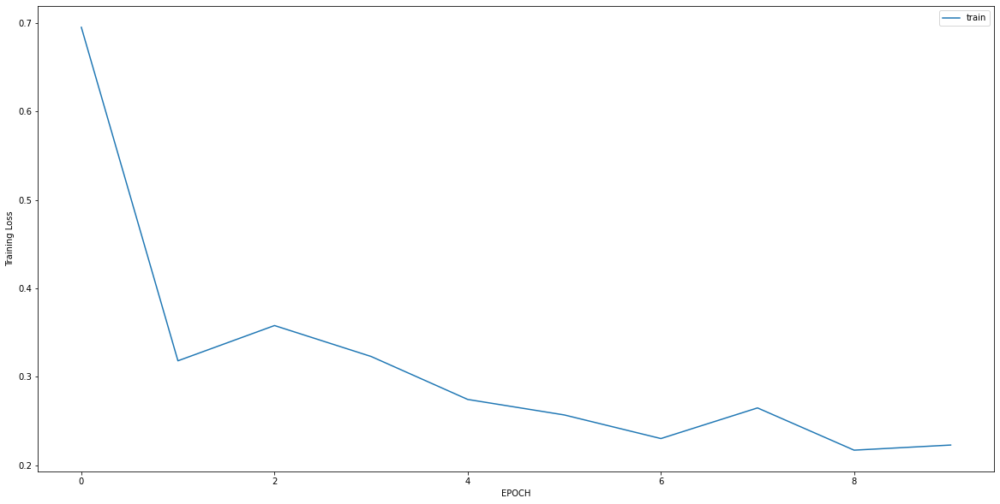

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.8479 - accuracy: 0.4564
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7217 - accuracy: 0.7422
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4945 - accuracy: 0.8153
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4958 - accuracy: 0.7979
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4594 - accuracy: 0.8049
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4177 - accuracy: 0.8328
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3514 - accuracy: 0.8746
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3400 - accuracy: 0.8885
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3278 - accuracy: 0.9164
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3169 - accuracy: 0.9164


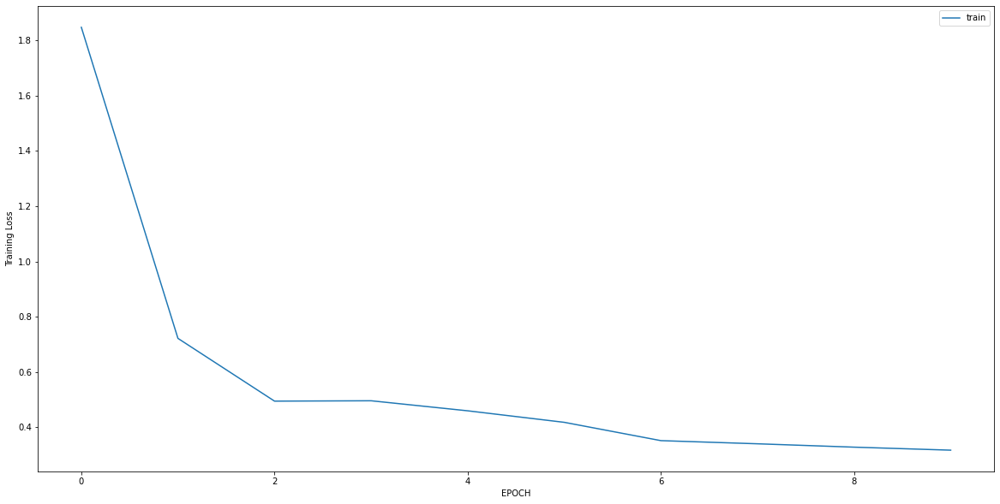

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6100 - accuracy: 0.7220
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3359 - accuracy: 0.8881
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3611 - accuracy: 0.8664
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3412 - accuracy: 0.8773
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3011 - accuracy: 0.8917
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3013 - accuracy: 0.9097
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2542 - accuracy: 0.9386
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2584 - accuracy: 0.9458
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2309 - accuracy: 0.9603
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2229 - accuracy: 0.9531


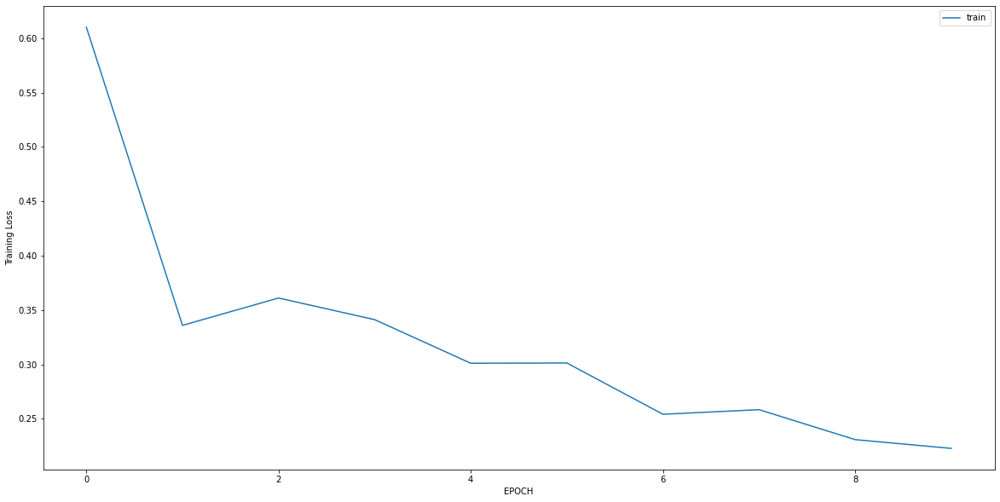

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1359 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1195 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0856 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0597 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0293 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0267 - accuracy: 1.0000


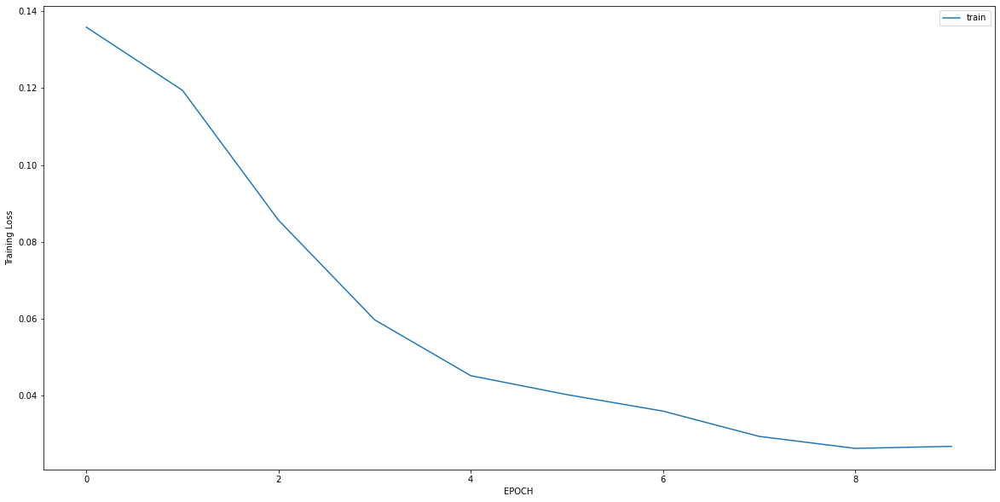

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5549 - accuracy: 0.8602
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2939 - accuracy: 0.9025
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2781 - accuracy: 0.9153
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2516 - accuracy: 0.9110
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2730 - accuracy: 0.9153
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2214 - accuracy: 0.9322
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2205 - accuracy: 0.9364
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1945 - accuracy: 0.9576
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1940 - accuracy: 0.9449
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1987 - accuracy: 0.9322


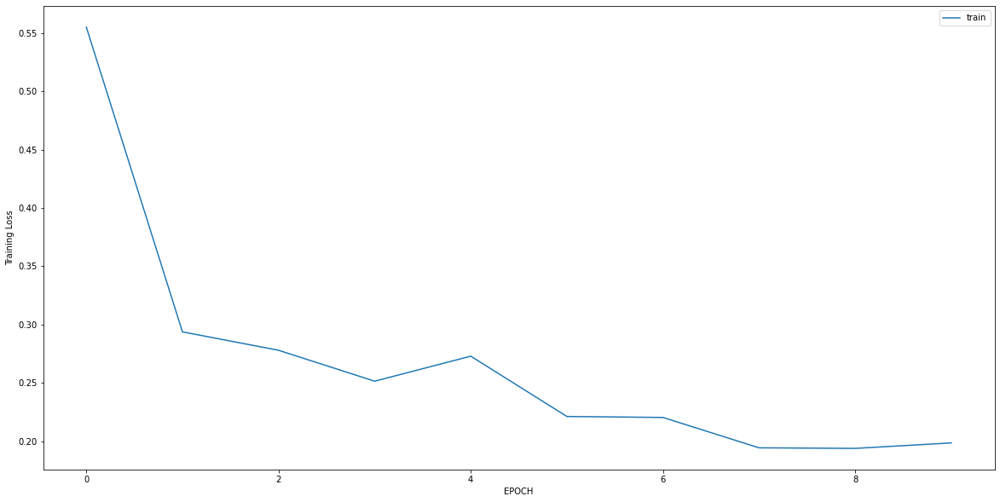

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1257 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1201 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0909 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0811 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0665 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0601 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0513 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0478 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0458 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 1.0000


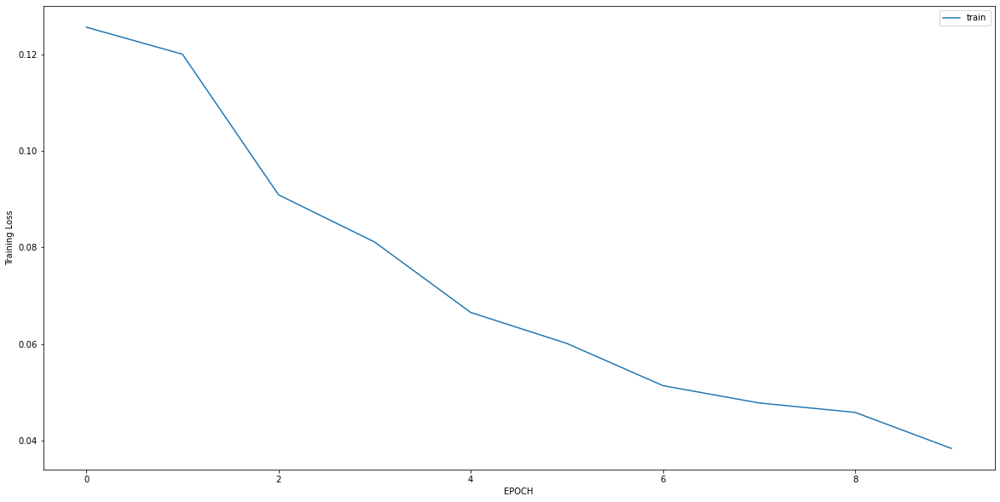

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.4662 - accuracy: 0.8187
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2177 - accuracy: 0.9357
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1710 - accuracy: 0.9561
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1640 - accuracy: 0.9415
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1443 - accuracy: 0.9561
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1299 - accuracy: 0.9591
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1606 - accuracy: 0.9532
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1316 - accuracy: 0.9620
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2009 - accuracy: 0.9211
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1433 - accuracy: 0.9444


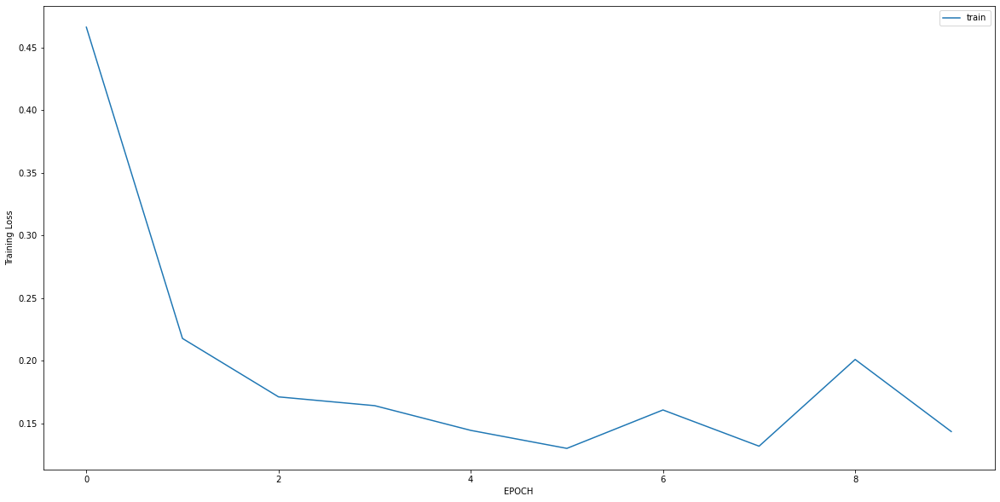

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1601 - accuracy: 0.4928
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5220 - accuracy: 0.8043
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7200 - accuracy: 0.6739
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4550 - accuracy: 0.8043
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3842 - accuracy: 0.8188
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3754 - accuracy: 0.8551
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3035 - accuracy: 0.9058
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3155 - accuracy: 0.8841
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2722 - accuracy: 0.9420
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2686 - accuracy: 0.9420


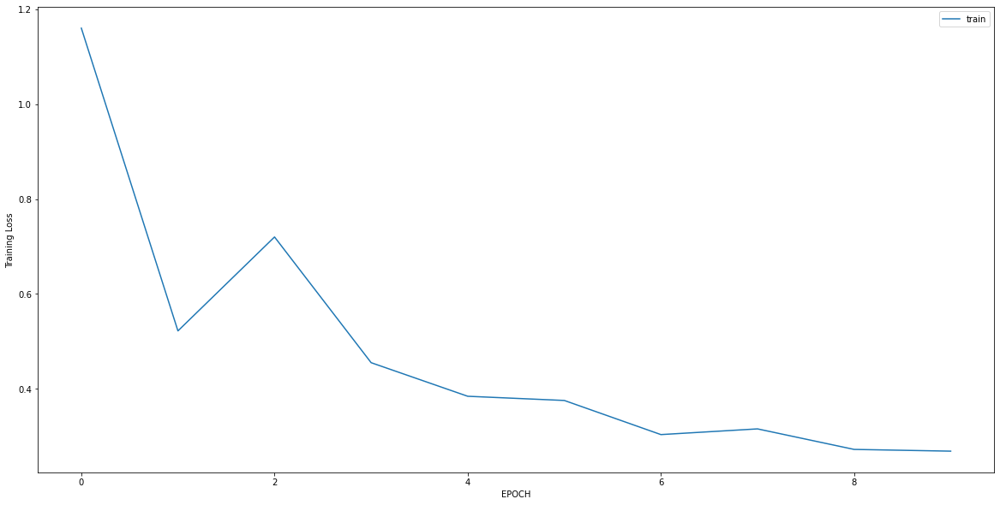

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1677 - accuracy: 0.4023
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0092 - accuracy: 1.0000


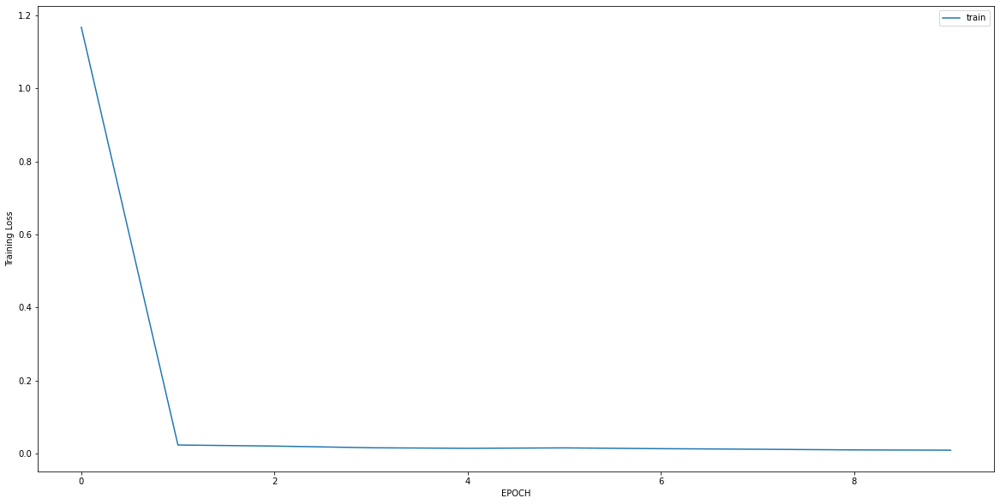

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.9776 - accuracy: 0.4664
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.9369 - accuracy: 0.5940
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.4375 - accuracy: 0.7517
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3198 - accuracy: 0.8724
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2718 - accuracy: 0.9234
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2113 - accuracy: 0.9629
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2008 - accuracy: 0.9397
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1915 - accuracy: 0.9513
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1690 - accuracy: 0.9582
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1961 - accuracy: 0.9327


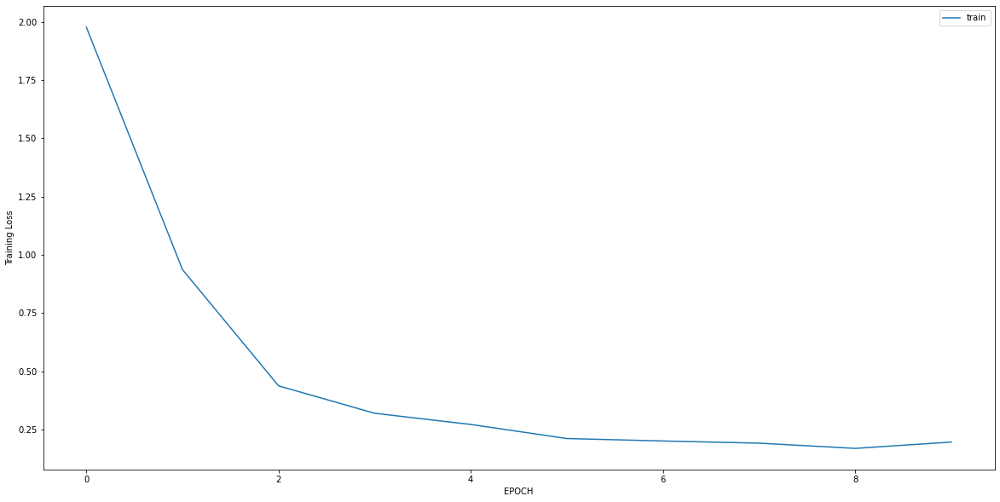

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0575 - accuracy: 0.6691
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9740 - accuracy: 0.6691
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8236 - accuracy: 0.6691
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7002 - accuracy: 0.6691
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4855 - accuracy: 0.7626
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3818 - accuracy: 0.8489
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3526 - accuracy: 0.8705
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2907 - accuracy: 0.9065
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2690 - accuracy: 0.9496
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2258 - accuracy: 0.9640


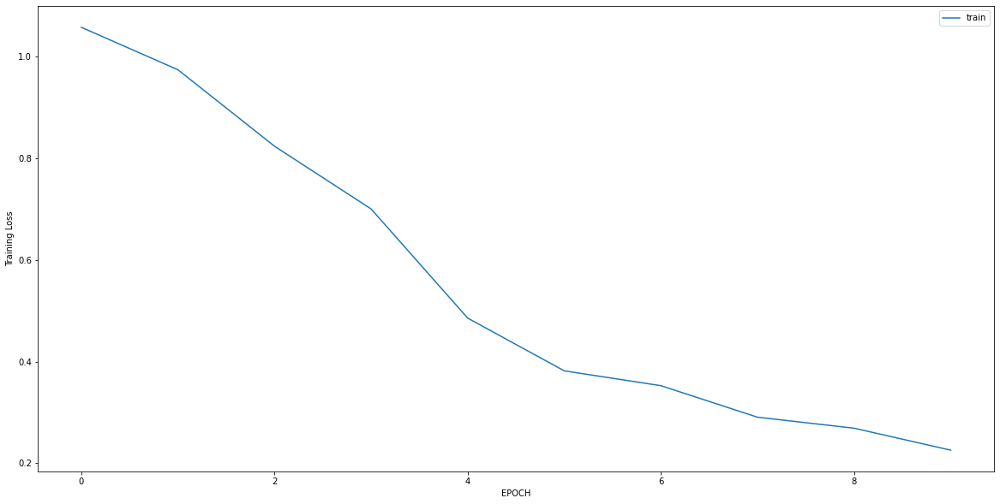

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3616 - accuracy: 0.8711
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2685 - accuracy: 0.9057
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1795 - accuracy: 0.9497
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1735 - accuracy: 0.9717
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1391 - accuracy: 0.9780
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1319 - accuracy: 0.9874
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1179 - accuracy: 0.9843
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1397 - accuracy: 0.9780
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1324 - accuracy: 0.9843
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1241 - accuracy: 0.9654


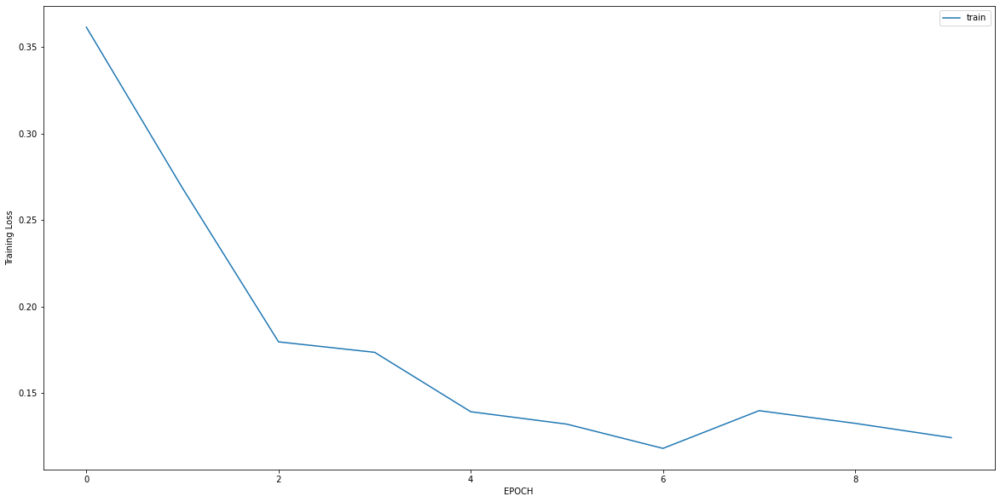

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.5527 - accuracy: 0.5326
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0142 - accuracy: 0.5361
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4795 - accuracy: 0.7457
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3954 - accuracy: 0.8213
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3685 - accuracy: 0.8522
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3398 - accuracy: 0.8557
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2731 - accuracy: 0.8935
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2688 - accuracy: 0.8832
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2593 - accuracy: 0.9072
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2436 - accuracy: 0.9003


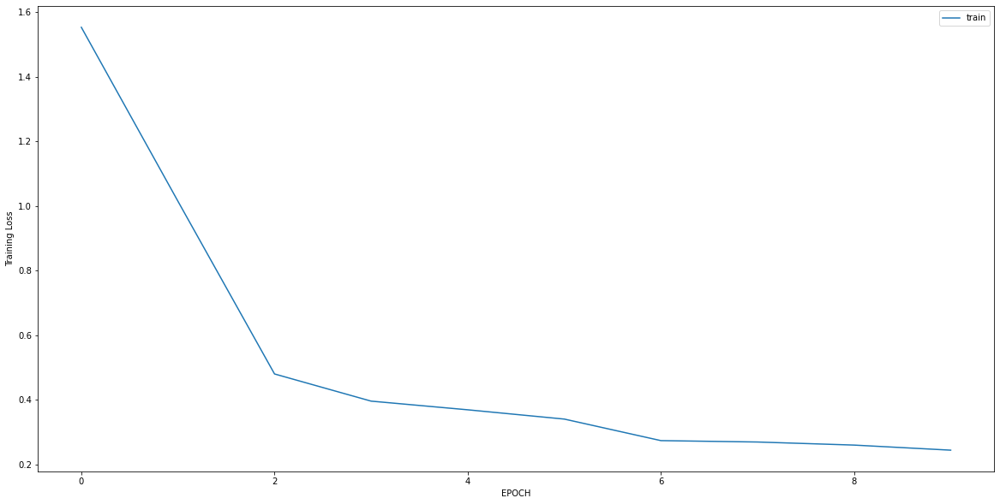

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 3.7837 - accuracy: 0.0000e+00
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 1.9927 - accuracy: 0.0543
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6819 - accuracy: 0.6006
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1179 - accuracy: 0.9585
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0233 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0213 - accuracy: 1.0000


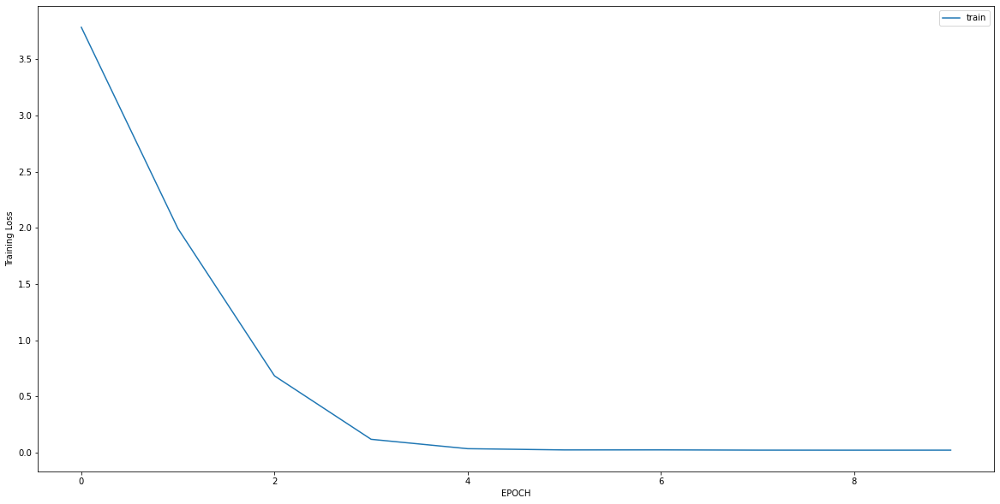

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6911 - accuracy: 0.5794
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1896 - accuracy: 0.9813
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0146 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 1.0000


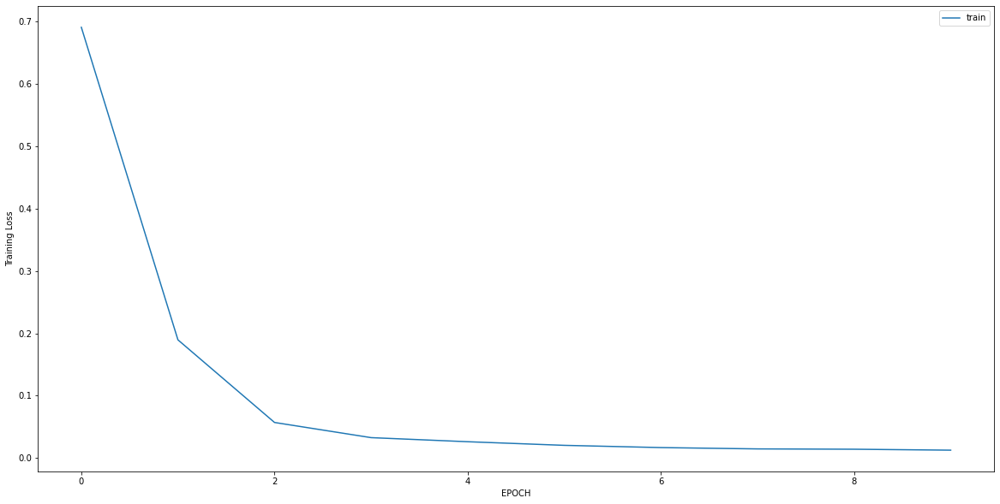

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0087 - accuracy: 1.0000


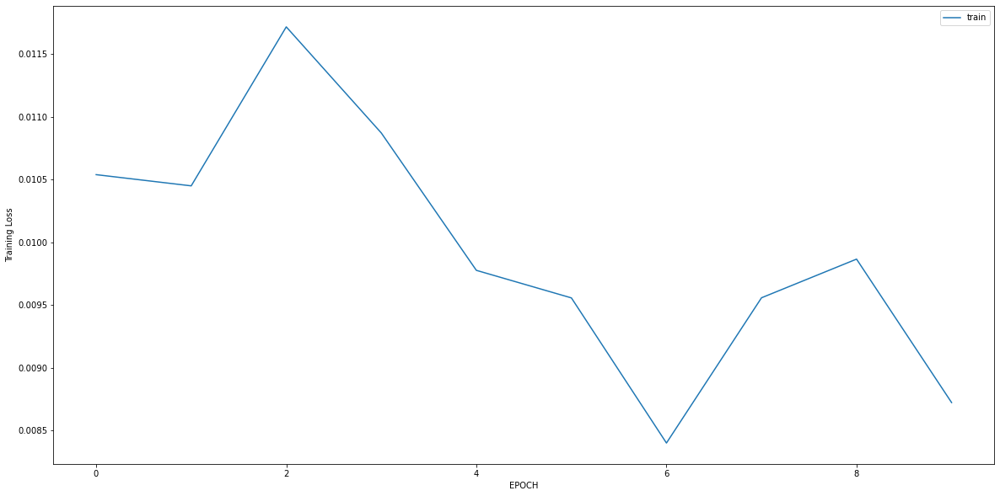

Epoch 1/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - accuracy: 1.0000


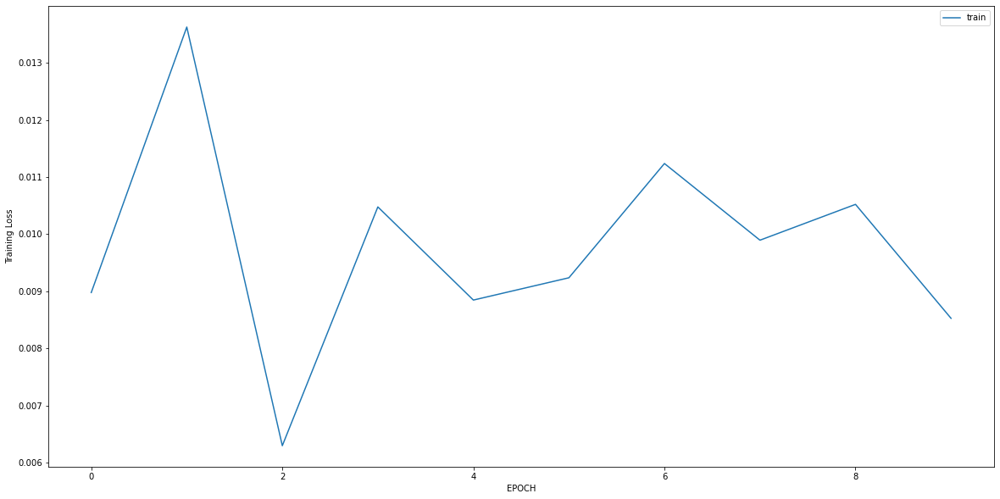

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.7916 - accuracy: 0.5758
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 1.4112 - accuracy: 0.5758
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8568 - accuracy: 0.5926
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6676 - accuracy: 0.6195
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6087 - accuracy: 0.6566
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6113 - accuracy: 0.6532
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5681 - accuracy: 0.7273
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4938 - accuracy: 0.7340
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4508 - accuracy: 0.8081
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3997 - accuracy: 0.8451


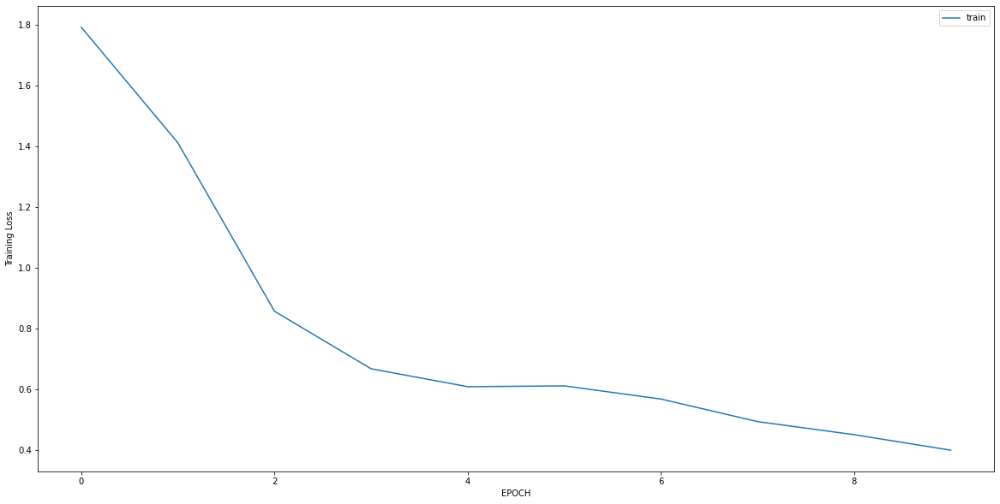

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.4762 - accuracy: 0.7402
Epoch 2/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0663 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0500 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0463 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0303 - accuracy: 1.0000


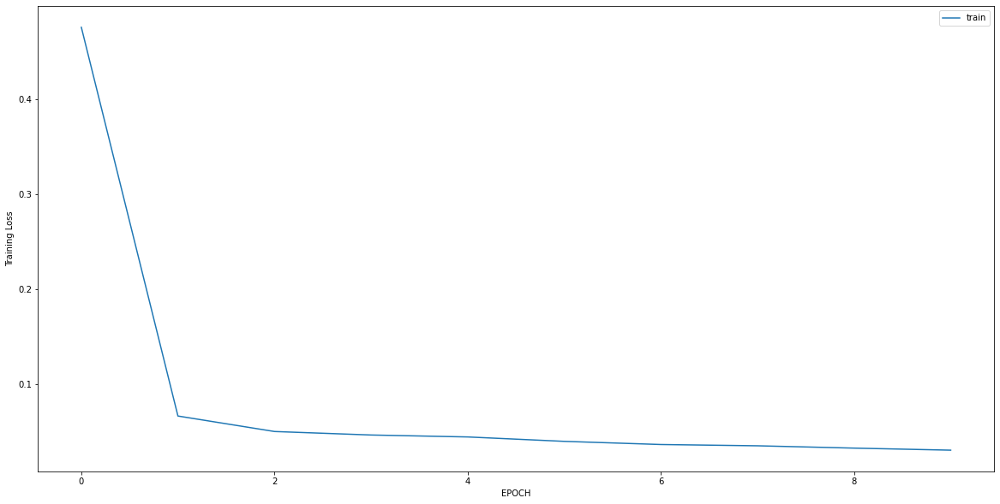

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.0038 - accuracy: 0.5929
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7762 - accuracy: 0.6640
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6122 - accuracy: 0.7194
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4759 - accuracy: 0.7905
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4572 - accuracy: 0.8142
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4163 - accuracy: 0.8617
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3986 - accuracy: 0.8617
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3637 - accuracy: 0.8696
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3422 - accuracy: 0.8854
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3051 - accuracy: 0.9051


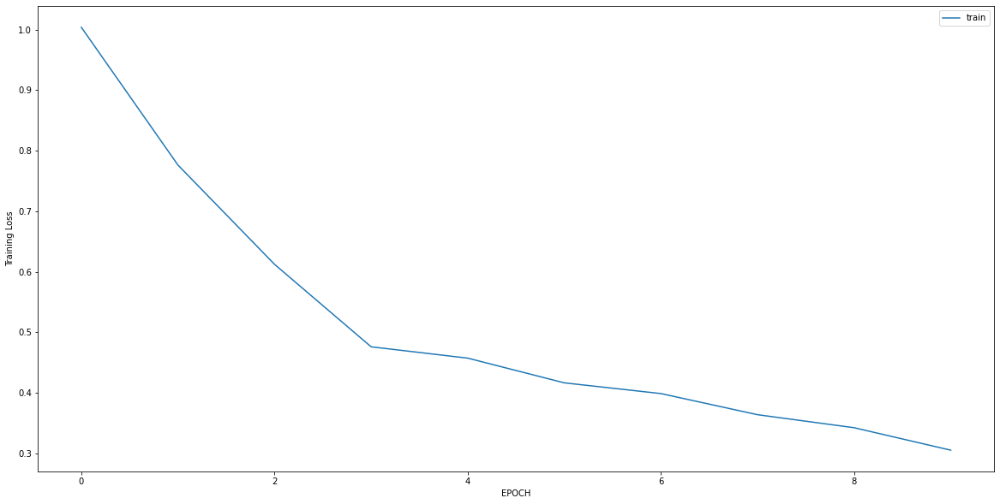

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3268 - accuracy: 0.9109
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2102 - accuracy: 0.9595
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1641 - accuracy: 0.9676
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2395 - accuracy: 0.9393
Epoch 5/10
8/8 [==============================] - 0s 7ms/step - loss: 0.1771 - accuracy: 0.9595
Epoch 6/10
8/8 [==============================] - 0s 8ms/step - loss: 0.1365 - accuracy: 0.9757
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1162 - accuracy: 0.9919
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1164 - accuracy: 0.9757
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0958 - accuracy: 0.9798
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0952 - accuracy: 0.9879


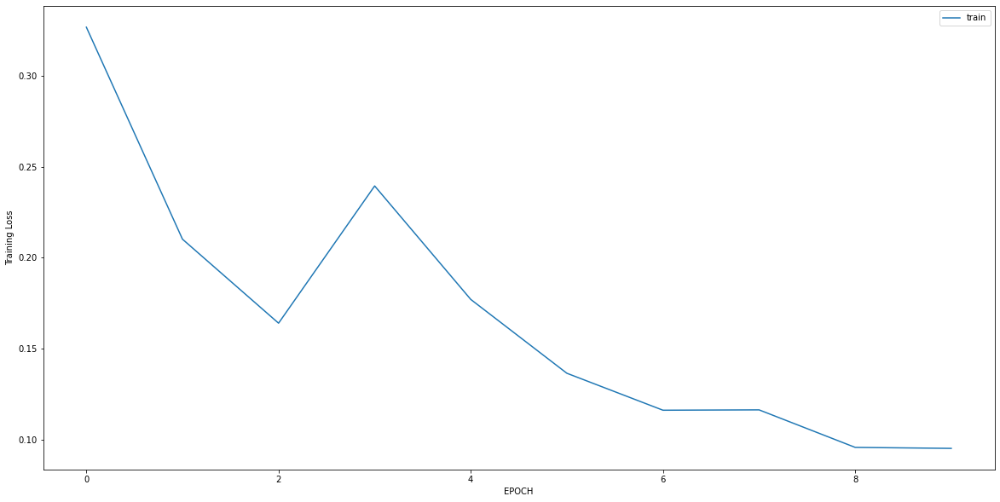

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 1.7949 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 1.8194 - accuracy: 0.1735
Epoch 3/10
4/4 [==============================] - 0s 9ms/step - loss: 1.3116 - accuracy: 0.2143
Epoch 4/10
4/4 [==============================] - 0s 7ms/step - loss: 0.7804 - accuracy: 0.5306
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3922 - accuracy: 0.7959
Epoch 6/10
4/4 [==============================] - 0s 6ms/step - loss: 0.4672 - accuracy: 0.8367
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4643 - accuracy: 0.8367
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5807 - accuracy: 0.8367
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4978 - accuracy: 0.8367
Epoch 10/10
4/4 [==============================] - 0s 6ms/step - loss: 0.5125 - accuracy: 0.8265


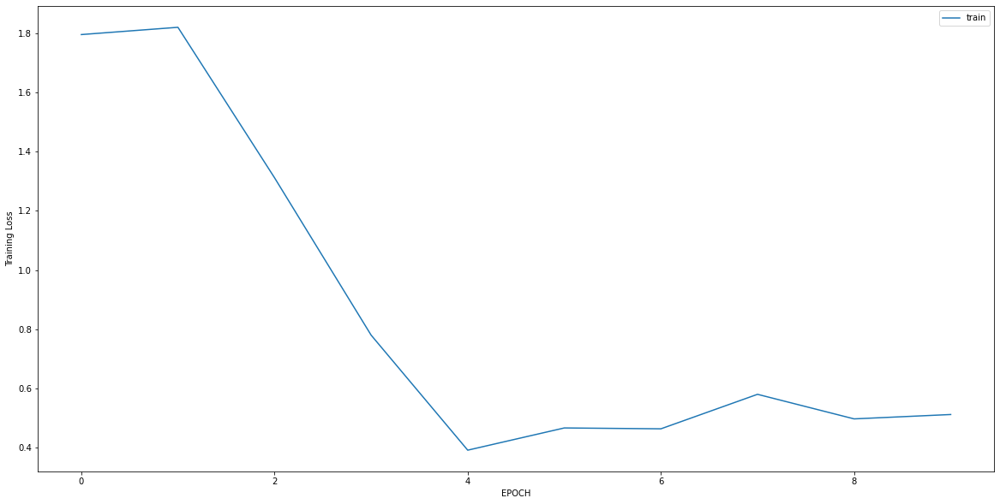

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.3234 - accuracy: 0.0115
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1846 - accuracy: 0.2452
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5178 - accuracy: 0.7356
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2281 - accuracy: 0.9885
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1431 - accuracy: 0.9962
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0975 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0710 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0688 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0508 - accuracy: 1.0000


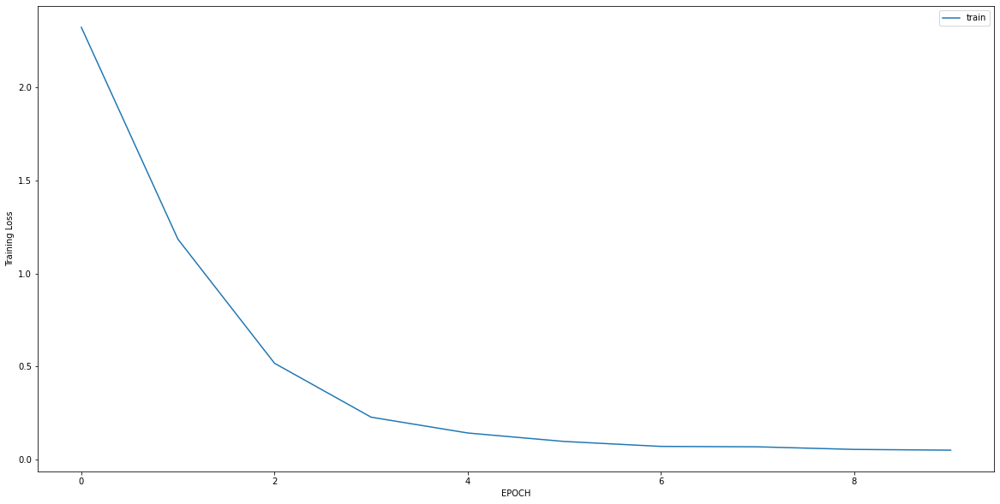

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.1296 - accuracy: 0.4715
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6910 - accuracy: 0.6835
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3307 - accuracy: 0.8956
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2556 - accuracy: 0.9430
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2098 - accuracy: 0.9462
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2437 - accuracy: 0.9494
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1867 - accuracy: 0.9430
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2190 - accuracy: 0.9399
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1871 - accuracy: 0.9462
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1997 - accuracy: 0.9494


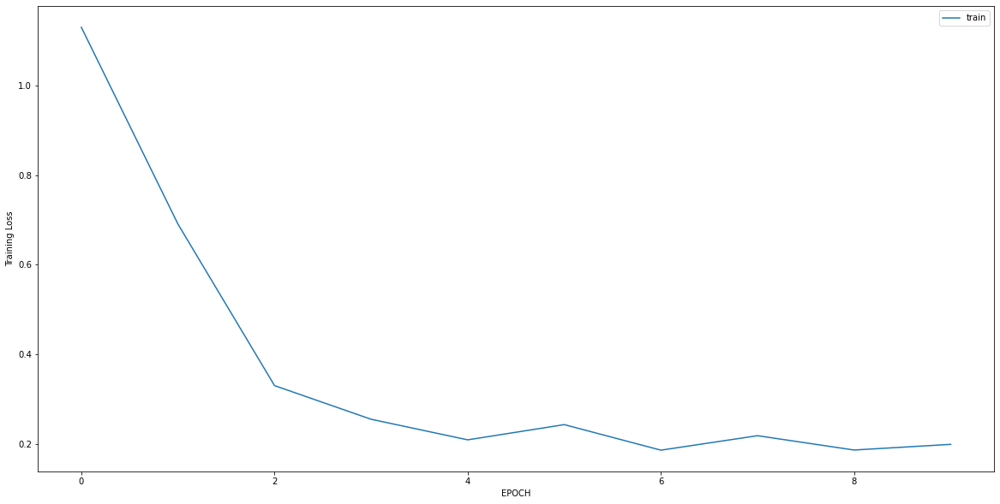

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3700 - accuracy: 0.4522
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3357 - accuracy: 0.8787
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2040 - accuracy: 0.9449
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2161 - accuracy: 0.9412
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1707 - accuracy: 0.9669
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1752 - accuracy: 0.9596
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1323 - accuracy: 0.9706
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1228 - accuracy: 0.9816
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1295 - accuracy: 0.9816
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1308 - accuracy: 0.9706


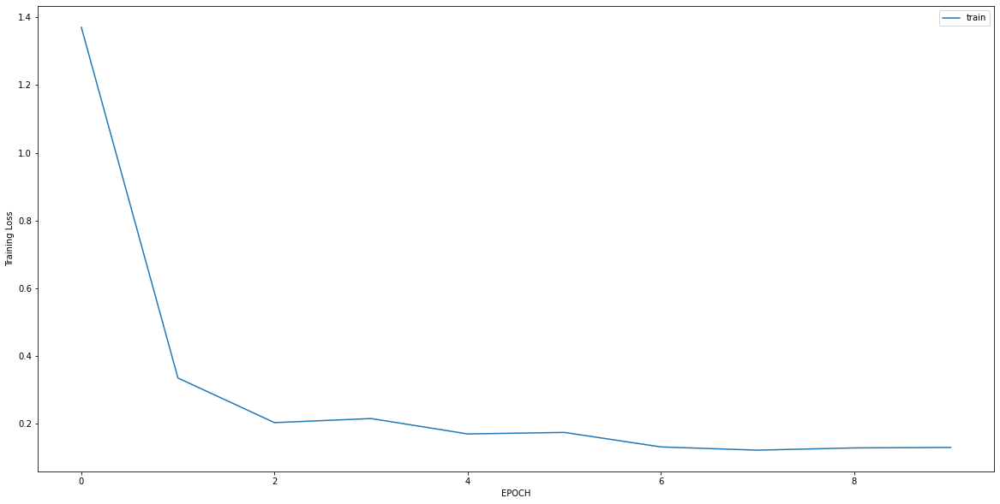

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2304 - accuracy: 0.9706
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1619 - accuracy: 0.9958
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1229 - accuracy: 0.9958
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0973 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0951 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0808 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0741 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0627 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0517 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 1.0000


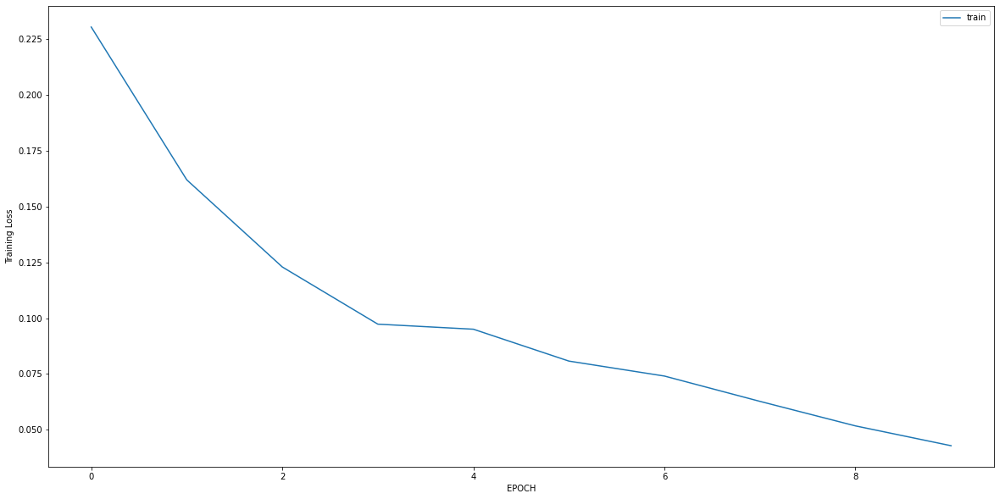

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.9435 - accuracy: 0.6888
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.7014 - accuracy: 0.7291
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3574 - accuracy: 0.8213
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2547 - accuracy: 0.8991
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1907 - accuracy: 0.9539
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.9741
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1246 - accuracy: 0.9885
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1050 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1003 - accuracy: 0.9885
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0869 - accuracy: 0.9942


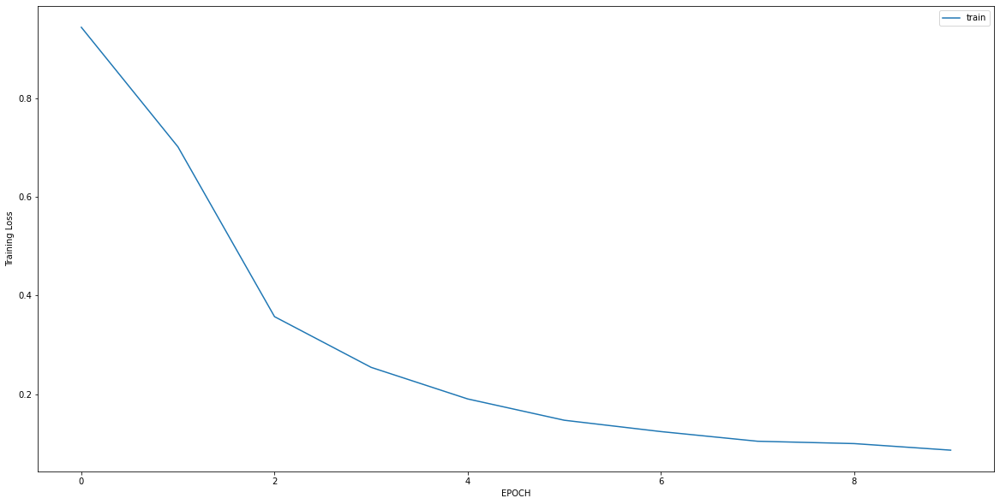

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3037 - accuracy: 0.9114
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2126 - accuracy: 0.9409
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1151 - accuracy: 0.9831
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1404 - accuracy: 0.9831
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1164 - accuracy: 0.9705
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1107 - accuracy: 0.9831
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0933 - accuracy: 0.9916
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0919 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0843 - accuracy: 0.9873
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0766 - accuracy: 1.0000


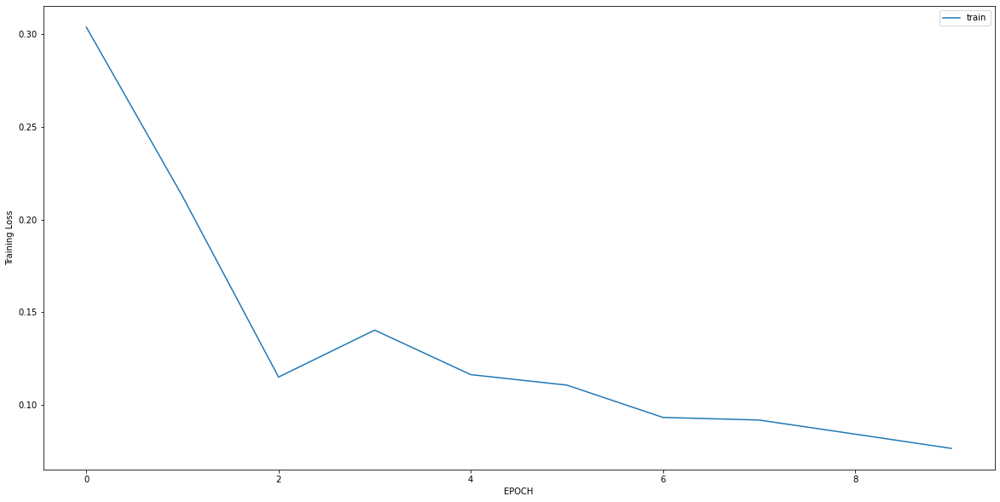

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.3520 - accuracy: 0.4231
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5403 - accuracy: 0.7238
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4326 - accuracy: 0.8601
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3699 - accuracy: 0.8776
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3799 - accuracy: 0.8741
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3691 - accuracy: 0.8741
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3170 - accuracy: 0.9056
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3278 - accuracy: 0.9056
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3195 - accuracy: 0.9056
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2969 - accuracy: 0.9161


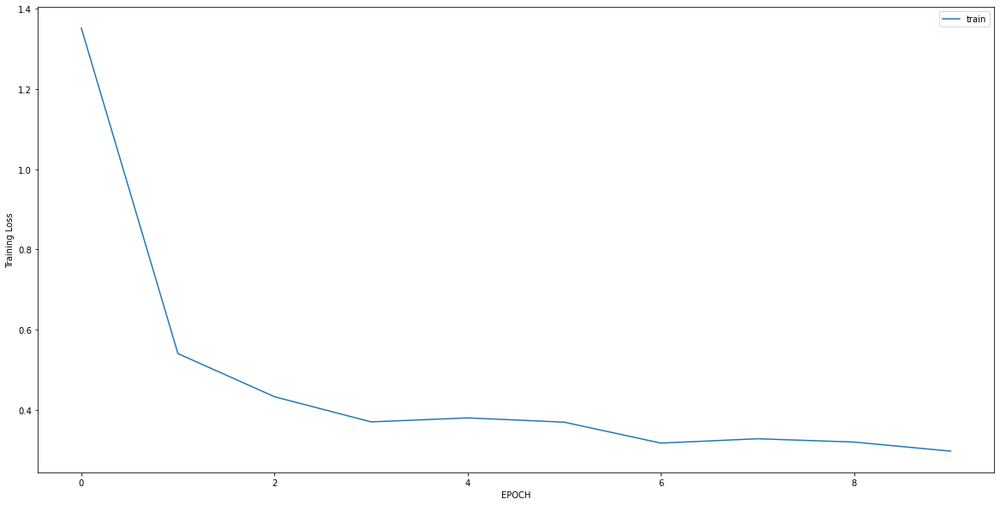

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2976 - accuracy: 0.8893
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2365 - accuracy: 0.9262
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2340 - accuracy: 0.9262
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2075 - accuracy: 0.9385
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1694 - accuracy: 0.9713
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1677 - accuracy: 0.9508
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1582 - accuracy: 0.9672
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1600 - accuracy: 0.9672
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1658 - accuracy: 0.9549
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2429 - accuracy: 0.8852


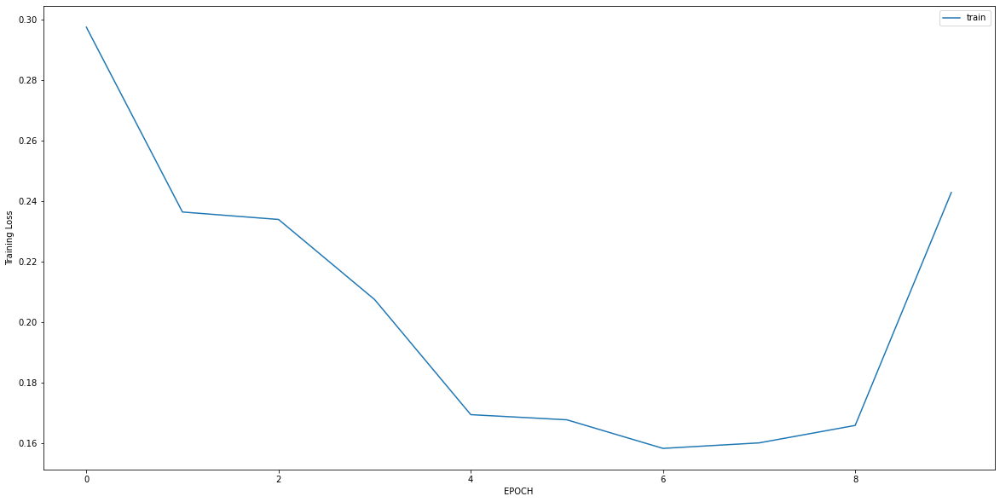

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.6369 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 2.9066 - accuracy: 0.0000e+00
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.7235 - accuracy: 0.0643
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8248 - accuracy: 0.4571
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3605 - accuracy: 0.9036
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2237 - accuracy: 0.9893
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1450 - accuracy: 0.9964
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0905 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0797 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0570 - accuracy: 1.0000


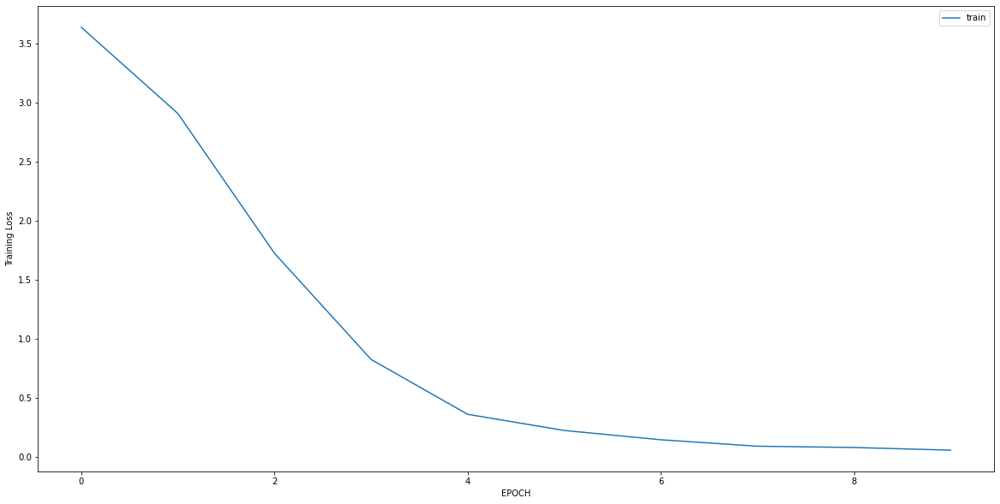

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0570 - accuracy: 1.0000
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0214 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0154 - accuracy: 1.0000


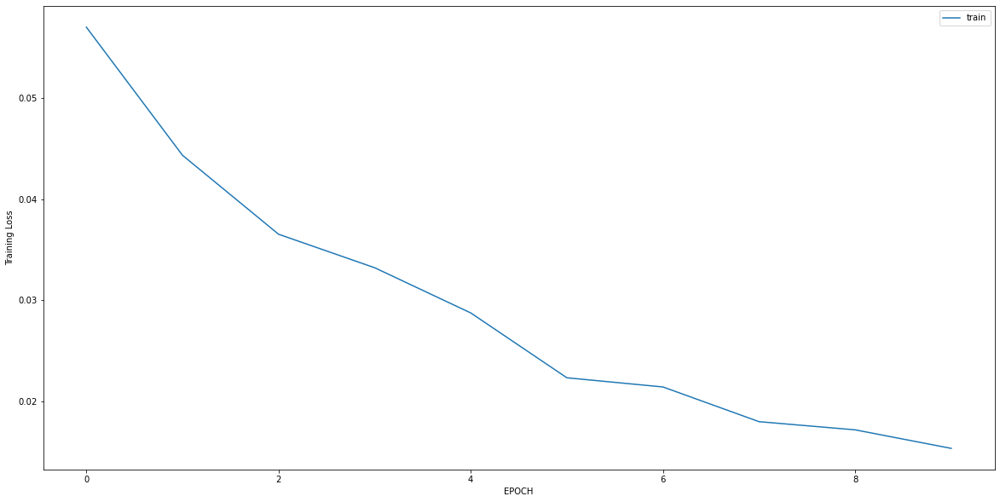

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1485 - accuracy: 0.9456
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0081 - accuracy: 1.0000


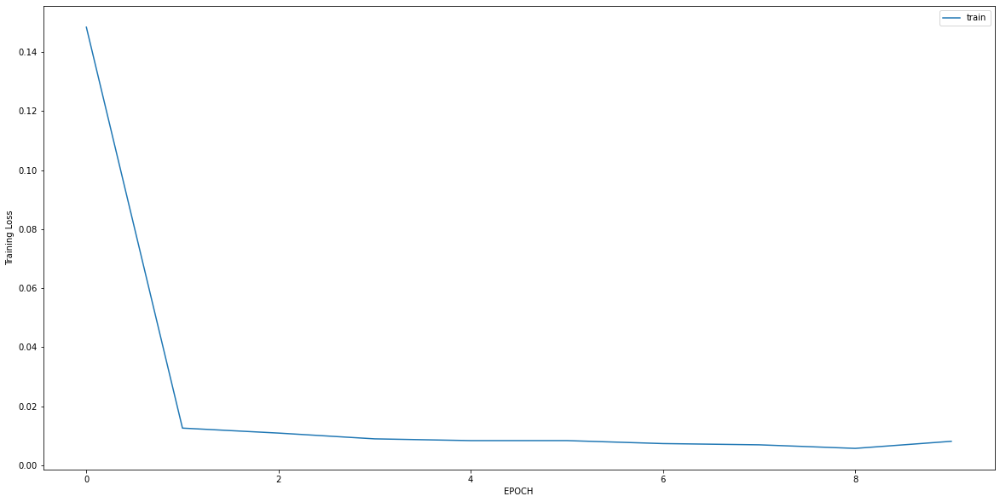

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 3.7137 - accuracy: 0.1772
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 3.0186 - accuracy: 0.1772
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 2.1548 - accuracy: 0.1814
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 1.3626 - accuracy: 0.2194
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8124 - accuracy: 0.4557
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5835 - accuracy: 0.6878
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4834 - accuracy: 0.7679
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4446 - accuracy: 0.8228
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4441 - accuracy: 0.8101
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4373 - accuracy: 0.8059


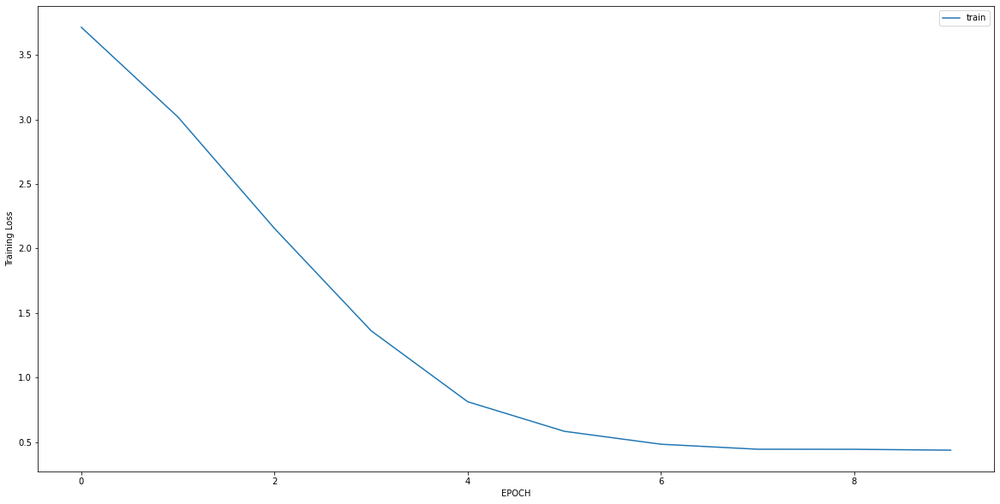

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 1.9362 - accuracy: 0.0056
Epoch 2/10
6/6 [==============================] - 0s 6ms/step - loss: 1.4744 - accuracy: 0.0778
Epoch 3/10
6/6 [==============================] - 0s 6ms/step - loss: 1.0598 - accuracy: 0.1667
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.7237 - accuracy: 0.5611
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.4192 - accuracy: 0.8556
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2727 - accuracy: 0.9611
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1920 - accuracy: 0.9944
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1388 - accuracy: 0.9944
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1207 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 4ms/step - loss: 0.1061 - accuracy: 1.0000


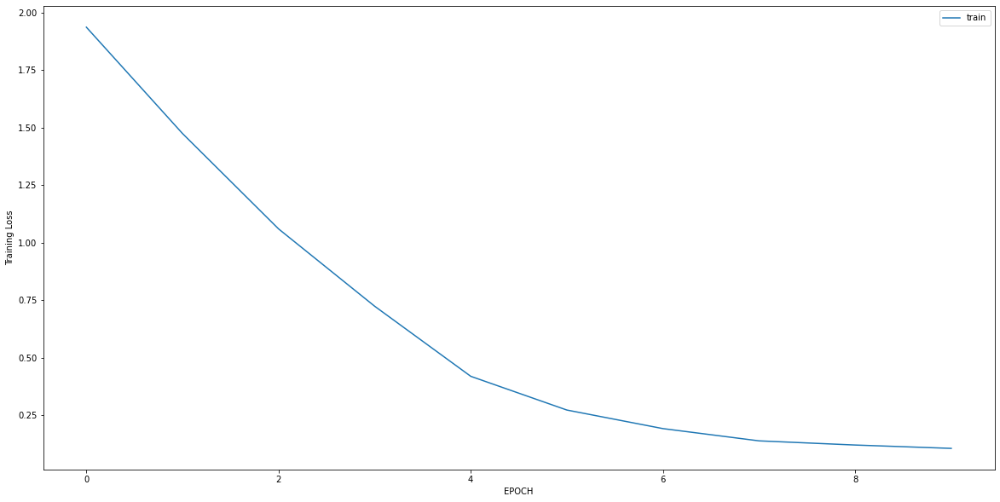

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.2515 - accuracy: 0.4516
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0909 - accuracy: 0.4637
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9768 - accuracy: 0.4597
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8224 - accuracy: 0.4960
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6645 - accuracy: 0.6048
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5589 - accuracy: 0.7097
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4488 - accuracy: 0.7944
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3994 - accuracy: 0.8427
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3273 - accuracy: 0.9073
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2793 - accuracy: 0.9194


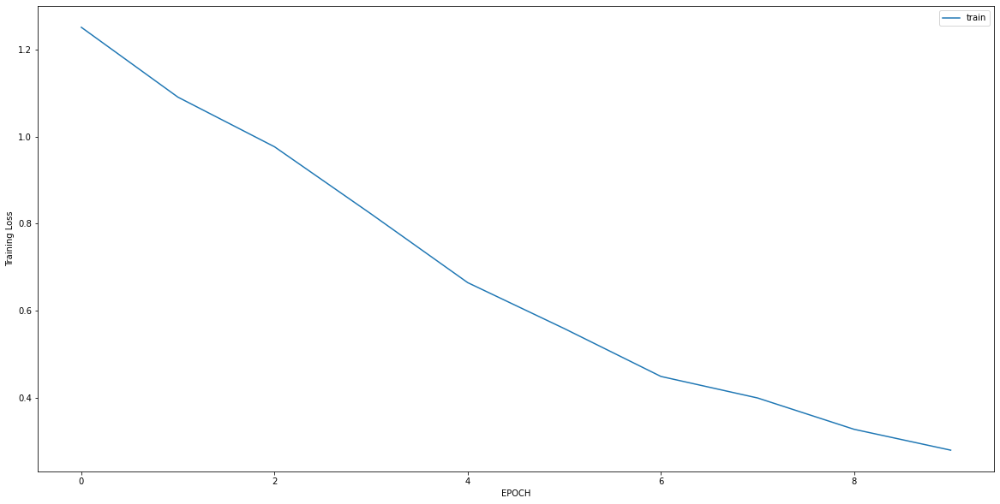

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6578 - accuracy: 0.6528
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6235 - accuracy: 0.6528
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6416 - accuracy: 0.6736
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5881 - accuracy: 0.7153
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6011 - accuracy: 0.6667
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5746 - accuracy: 0.6736
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6364 - accuracy: 0.6458
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6029 - accuracy: 0.6736
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5638 - accuracy: 0.6806
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6240 - accuracy: 0.6944


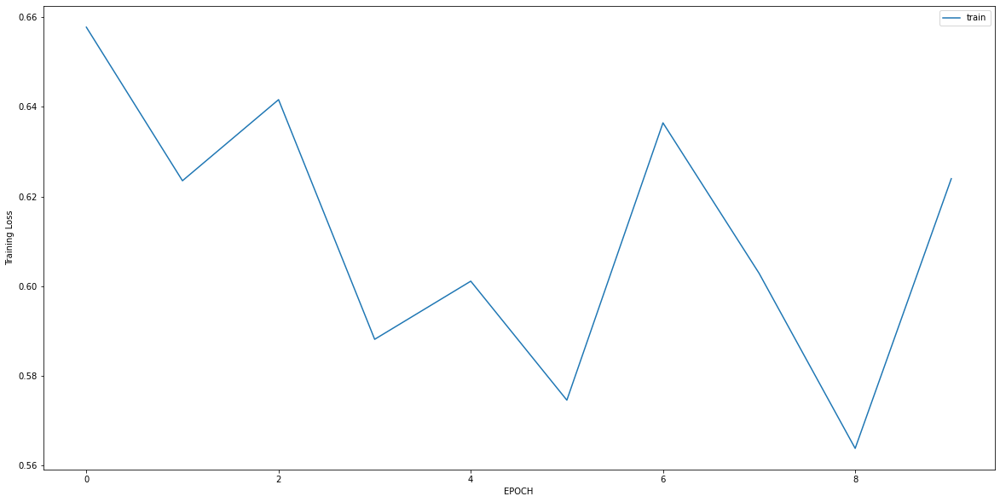

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5724 - accuracy: 0.8167
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3634 - accuracy: 0.8794
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2999 - accuracy: 0.9188
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2588 - accuracy: 0.9443
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2547 - accuracy: 0.9281
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2457 - accuracy: 0.9281
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2554 - accuracy: 0.9165
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2182 - accuracy: 0.9490
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1968 - accuracy: 0.9582
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2366 - accuracy: 0.9049


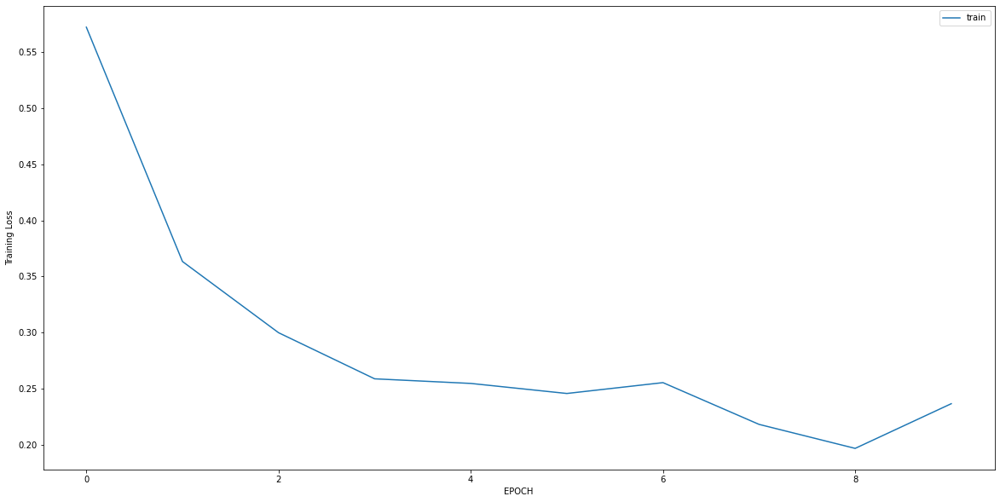

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.5457 - accuracy: 0.4661
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.2937 - accuracy: 0.4661
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9542 - accuracy: 0.4788
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3707 - accuracy: 0.8644
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3945 - accuracy: 0.8602
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3973 - accuracy: 0.8517
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3203 - accuracy: 0.9025
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3147 - accuracy: 0.9110
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2700 - accuracy: 0.9237
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2863 - accuracy: 0.9153


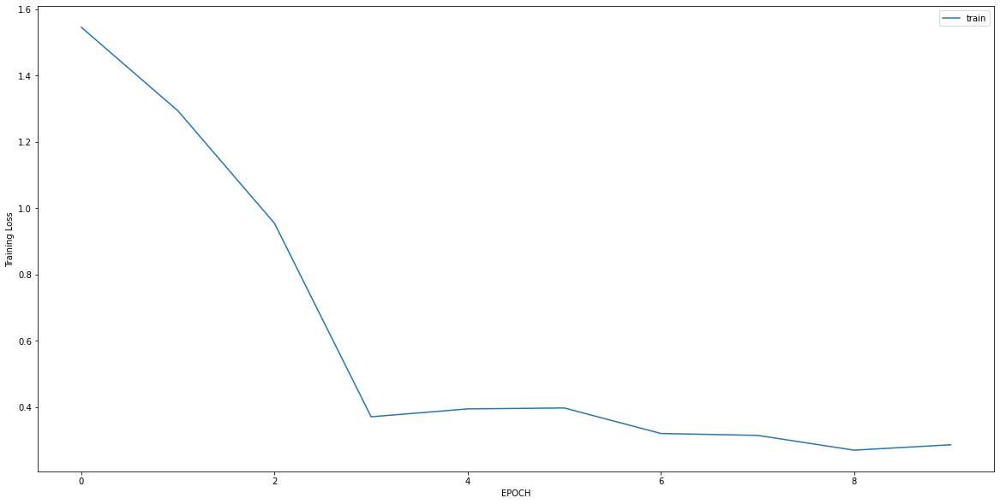

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.1145 - accuracy: 0.0038
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2728 - accuracy: 0.1226
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6194 - accuracy: 0.6398
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3679 - accuracy: 0.9272
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2562 - accuracy: 0.9770
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1881 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1733 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1298 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1114 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1020 - accuracy: 1.0000


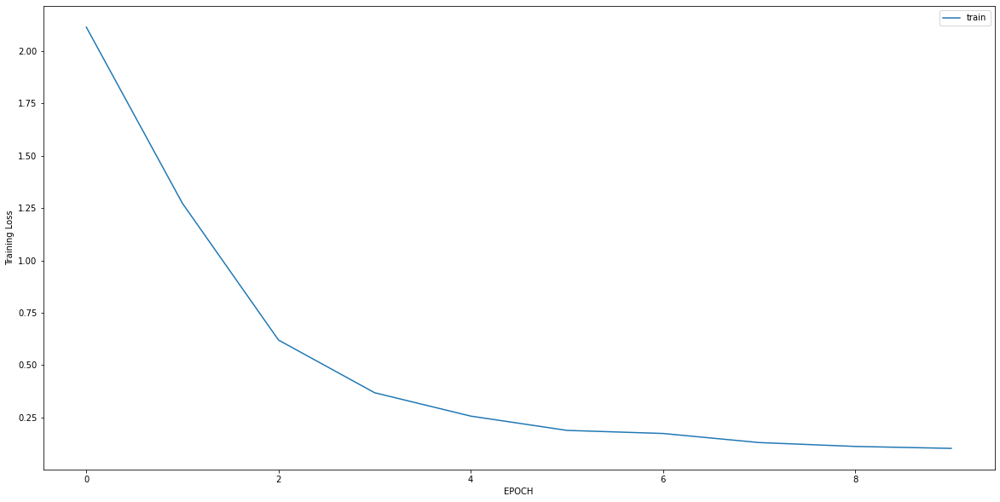

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0635 - accuracy: 0.5552
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9234 - accuracy: 0.5621
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7914 - accuracy: 0.5862
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7092 - accuracy: 0.6103
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6333 - accuracy: 0.6724
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5459 - accuracy: 0.7241
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5252 - accuracy: 0.7552
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4984 - accuracy: 0.7828
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4559 - accuracy: 0.8379
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4247 - accuracy: 0.8552


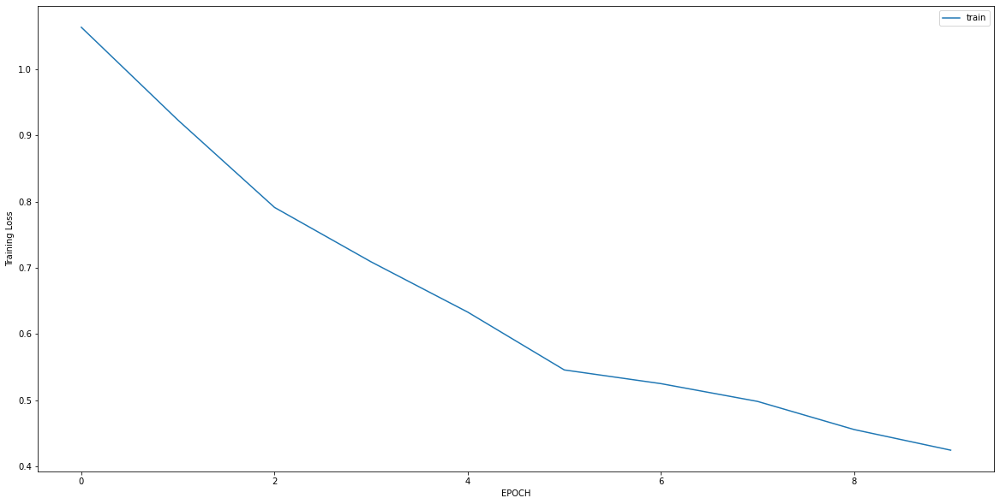

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5678 - accuracy: 0.7040
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4411 - accuracy: 0.8520
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4225 - accuracy: 0.8231
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4322 - accuracy: 0.8231
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4026 - accuracy: 0.8700
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4069 - accuracy: 0.8556
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3844 - accuracy: 0.8592
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3742 - accuracy: 0.8773
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4036 - accuracy: 0.8664
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3771 - accuracy: 0.9025


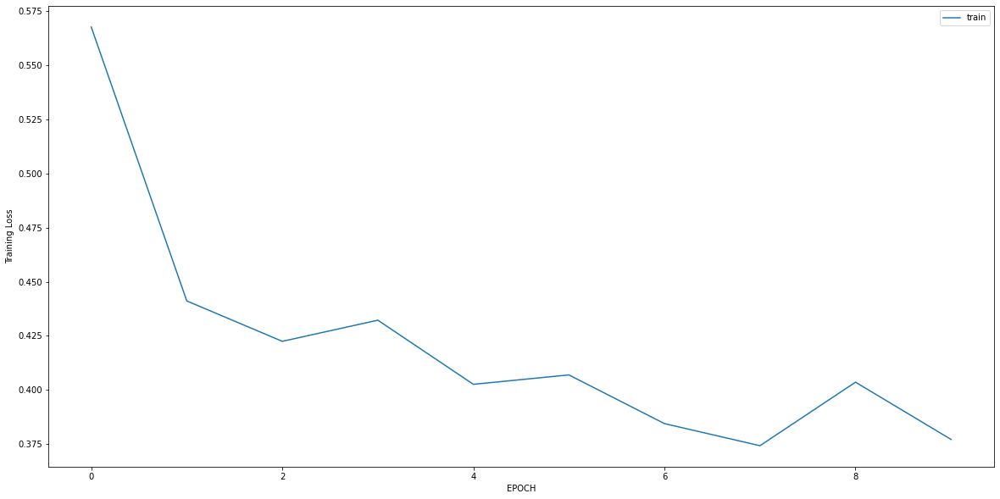

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7782 - accuracy: 0.4659
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0988 - accuracy: 0.9962
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0319 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0173 - accuracy: 1.0000


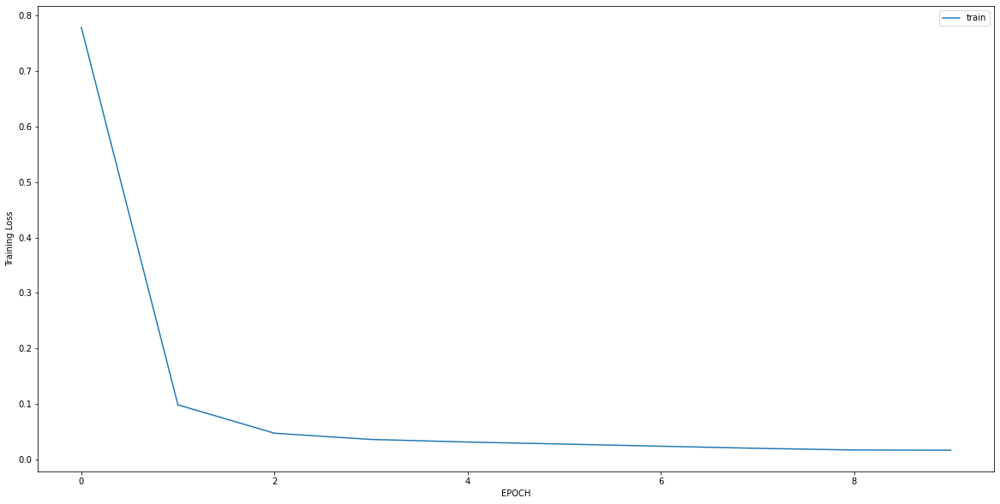

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.1922 - accuracy: 0.6680
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9183 - accuracy: 0.6877
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7460 - accuracy: 0.6838
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6137 - accuracy: 0.7391
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5336 - accuracy: 0.7154
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4770 - accuracy: 0.8142
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4147 - accuracy: 0.8419
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3726 - accuracy: 0.8814
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3485 - accuracy: 0.8735
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2990 - accuracy: 0.9051


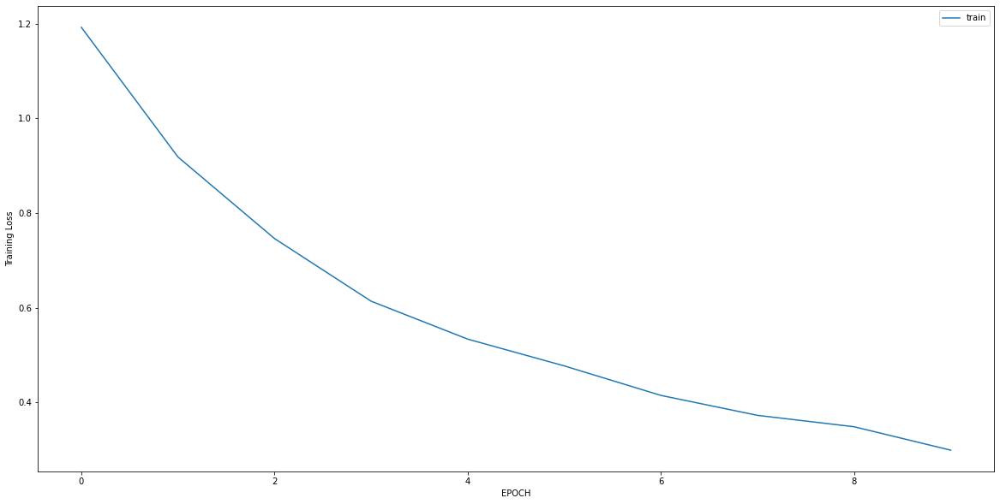

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5153 - accuracy: 0.7582
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3706 - accuracy: 0.8402
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3233 - accuracy: 0.8730
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3015 - accuracy: 0.8525
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2924 - accuracy: 0.8770
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3059 - accuracy: 0.8607
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2887 - accuracy: 0.8484
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2568 - accuracy: 0.8934
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2469 - accuracy: 0.8893
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2419 - accuracy: 0.9221


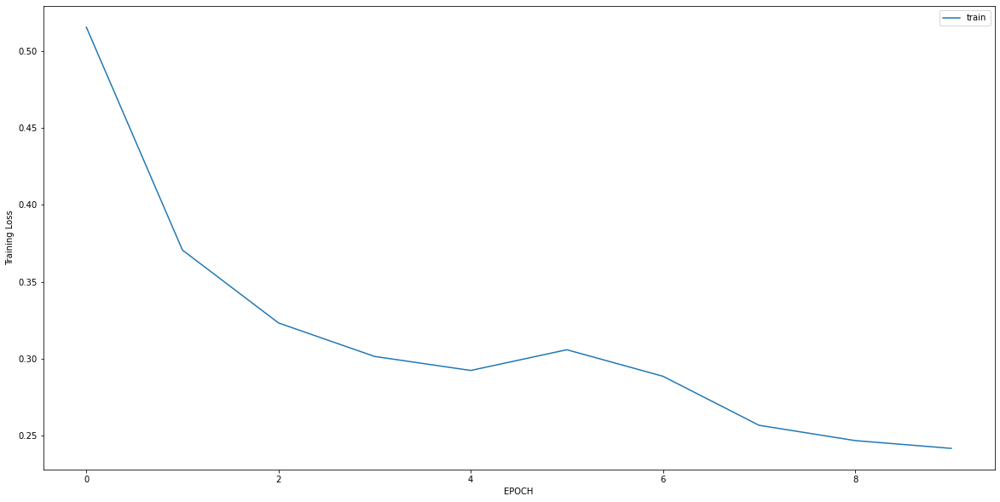

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3844 - accuracy: 0.8639
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3647 - accuracy: 0.8726
Epoch 3/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3414 - accuracy: 0.8877
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3363 - accuracy: 0.8898
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3084 - accuracy: 0.8963
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3034 - accuracy: 0.9071
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2924 - accuracy: 0.9050
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3128 - accuracy: 0.8877
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2722 - accuracy: 0.9136
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2821 - accuracy: 0.9050


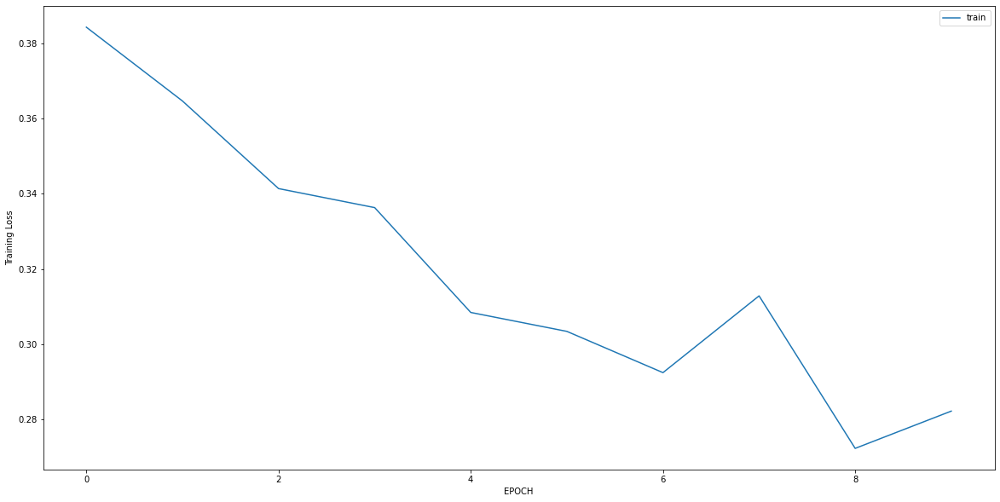

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 2.8224 - accuracy: 0.0035
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 1.2117 - accuracy: 0.2232
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.3743 - accuracy: 0.8963
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1505 - accuracy: 0.9982
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0942 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0684 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0527 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0300 - accuracy: 1.0000


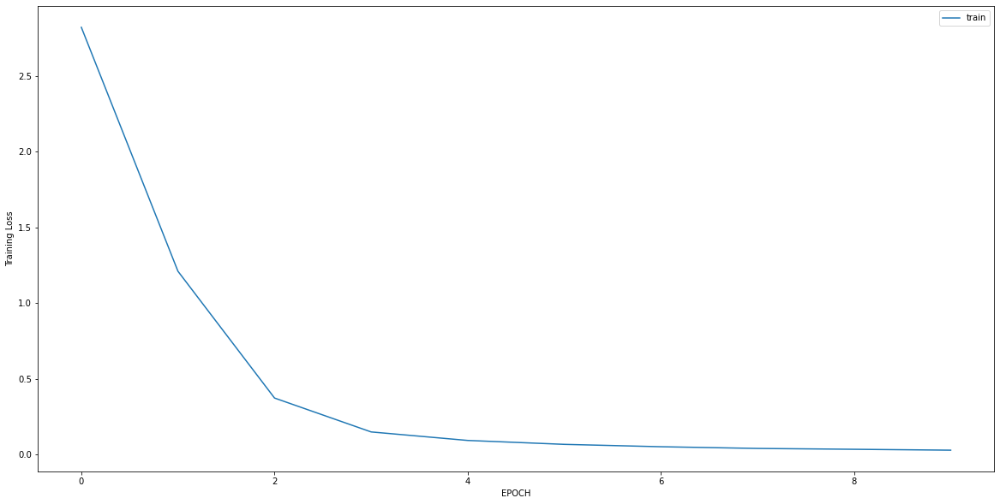

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.3528 - accuracy: 0.5507
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.2831 - accuracy: 0.5507
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.1560 - accuracy: 0.5507
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0584 - accuracy: 0.5435
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9755 - accuracy: 0.5507
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9242 - accuracy: 0.5652
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8314 - accuracy: 0.5652
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7899 - accuracy: 0.5507
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8867 - accuracy: 0.4710
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7758 - accuracy: 0.5507


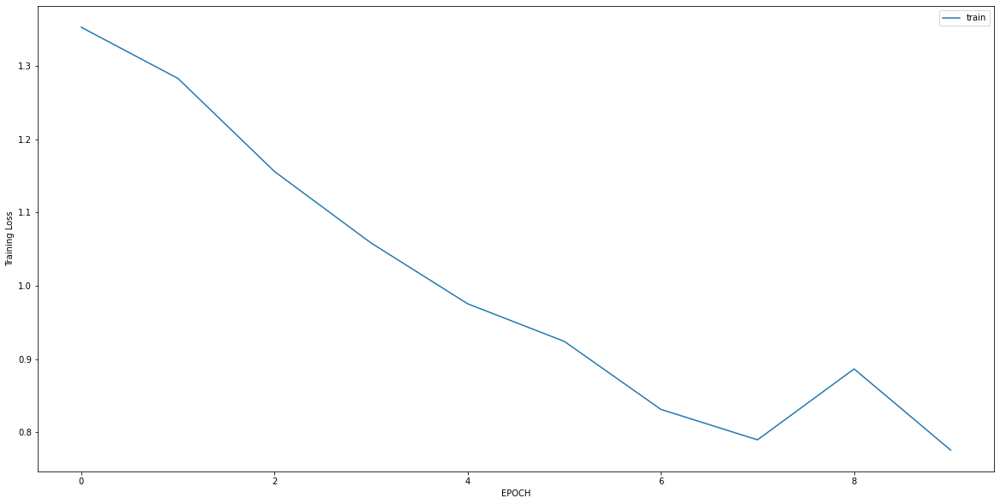

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2266 - accuracy: 0.9061
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0984 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0990 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0835 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0765 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0662 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0585 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0499 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0469 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 1.0000


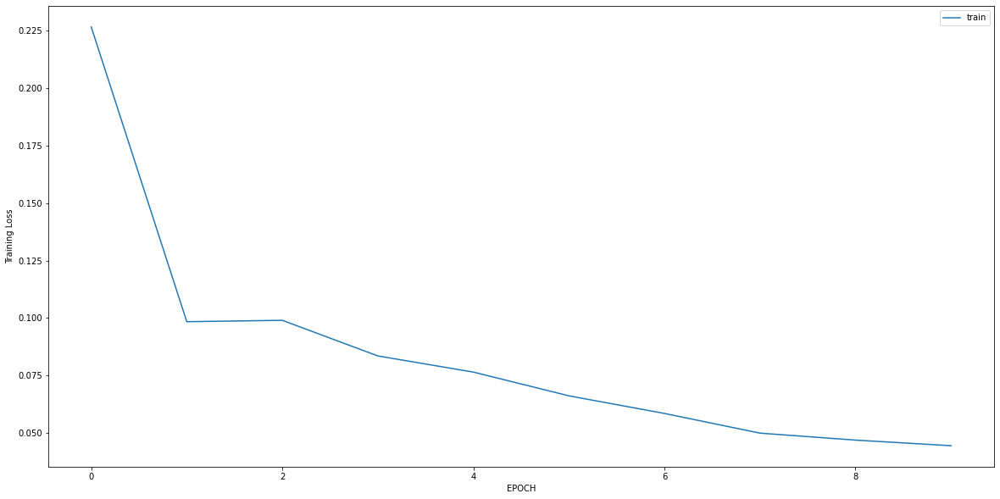

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.5140 - accuracy: 0.3273
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.9880 - accuracy: 0.4695
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5852 - accuracy: 0.6591
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3909 - accuracy: 0.8307
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2929 - accuracy: 0.9142
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2261 - accuracy: 0.9707
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1971 - accuracy: 0.9684
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1709 - accuracy: 0.9819
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1640 - accuracy: 0.9797
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1460 - accuracy: 0.9819


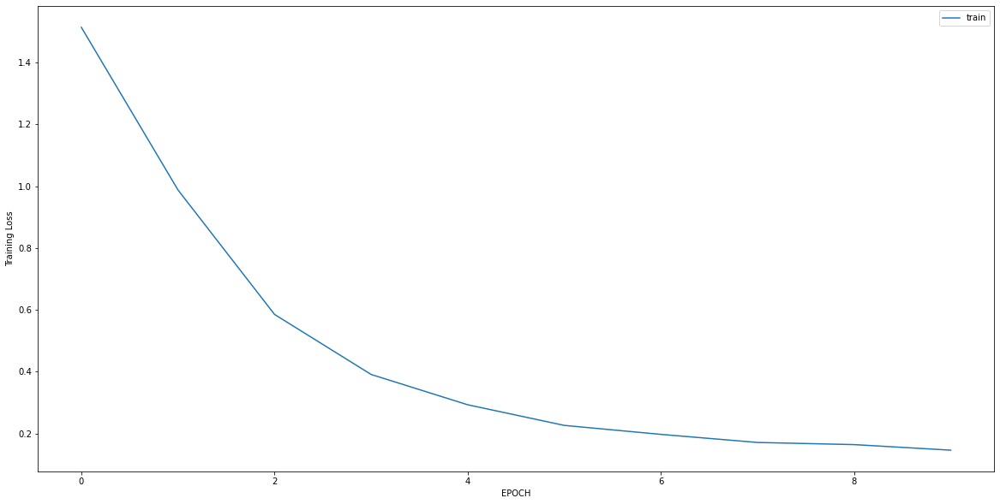

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3333 - accuracy: 0.9000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3146 - accuracy: 0.8778
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3437 - accuracy: 0.8963
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2835 - accuracy: 0.9074
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2453 - accuracy: 0.9296
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1867 - accuracy: 0.9741
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1920 - accuracy: 0.9556
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2654 - accuracy: 0.9111
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2087 - accuracy: 0.9296
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1821 - accuracy: 0.9667


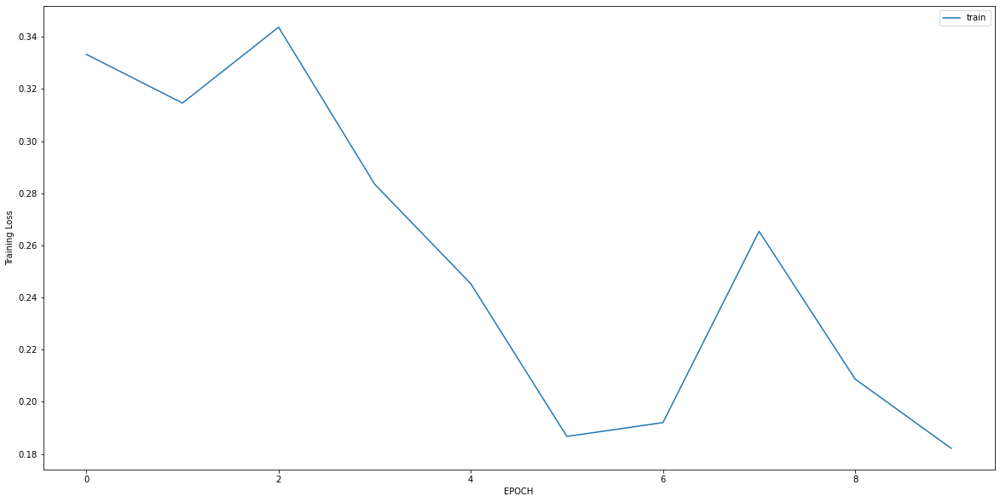

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 2.4557 - accuracy: 0.0000e+00
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 1.7048 - accuracy: 0.0159
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9461 - accuracy: 0.2778
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4753 - accuracy: 0.8333
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2413 - accuracy: 0.9762
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1659 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1117 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0955 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0761 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0757 - accuracy: 1.0000


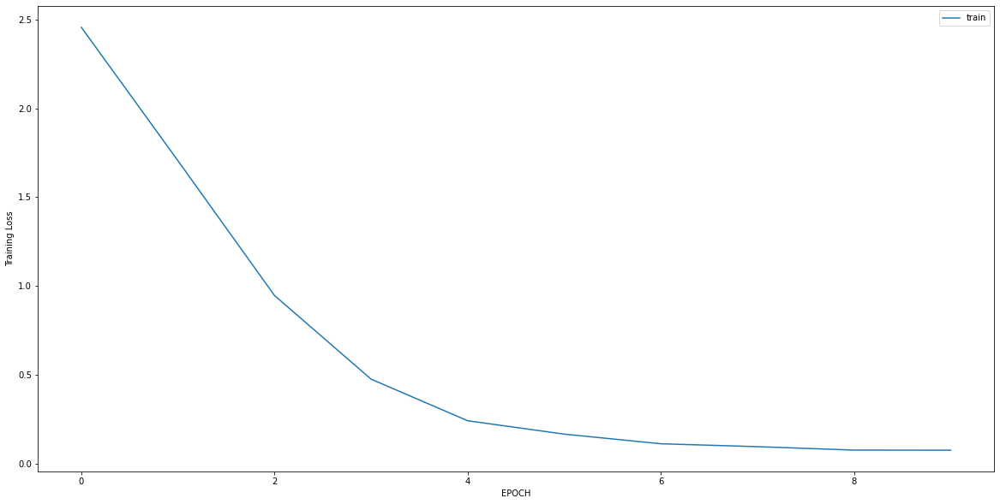

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1836 - accuracy: 0.9309
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0169 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0146 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0144 - accuracy: 1.0000


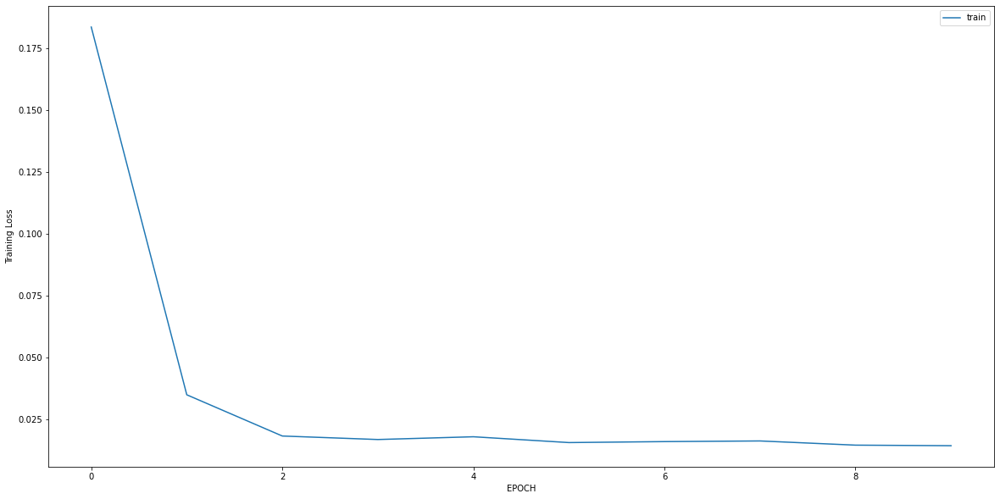

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.9158 - accuracy: 0.6071
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7074 - accuracy: 0.6230
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6126 - accuracy: 0.6746
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5288 - accuracy: 0.7381
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4604 - accuracy: 0.7897
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4160 - accuracy: 0.8373
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4085 - accuracy: 0.8611
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3905 - accuracy: 0.8532
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3657 - accuracy: 0.8810
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3577 - accuracy: 0.8730


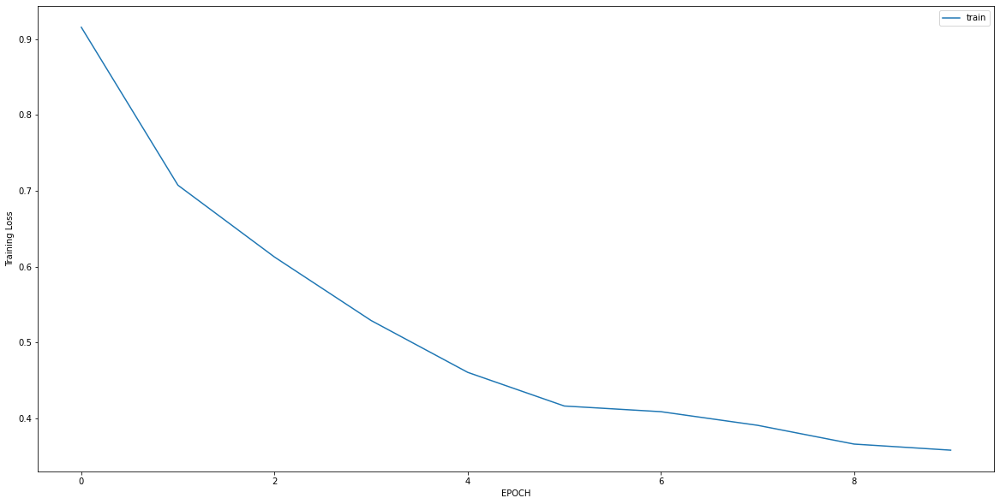

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6071 - accuracy: 0.6835
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4943 - accuracy: 0.7753
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4328 - accuracy: 0.8196
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4152 - accuracy: 0.8165
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3929 - accuracy: 0.8576
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3901 - accuracy: 0.8196
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3869 - accuracy: 0.8576
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3378 - accuracy: 0.9051
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3282 - accuracy: 0.8924
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3382 - accuracy: 0.8956


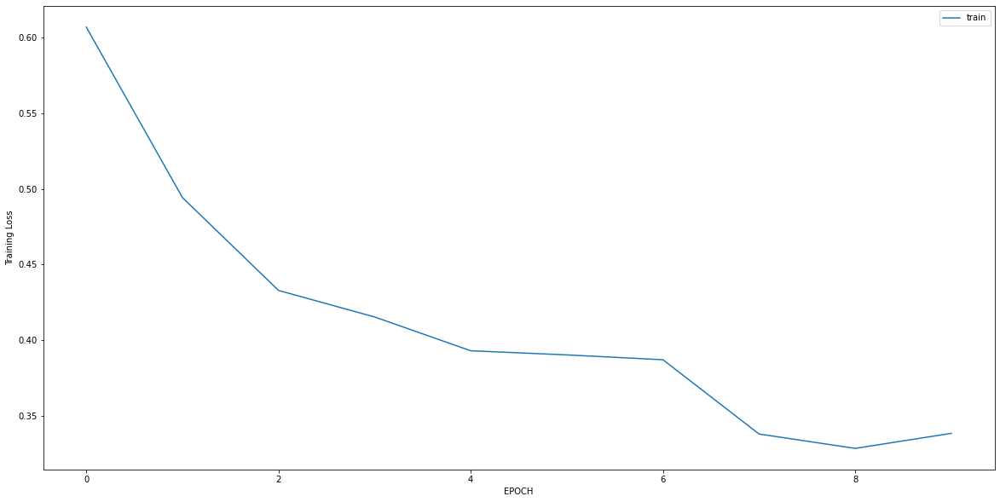

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.2699 - accuracy: 0.8934
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2268 - accuracy: 0.9337
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1868 - accuracy: 0.9510
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1565 - accuracy: 0.9683
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1391 - accuracy: 0.9683
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1338 - accuracy: 0.9712
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1184 - accuracy: 0.9798
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1208 - accuracy: 0.9827
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1008 - accuracy: 0.9856
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0954 - accuracy: 0.9914


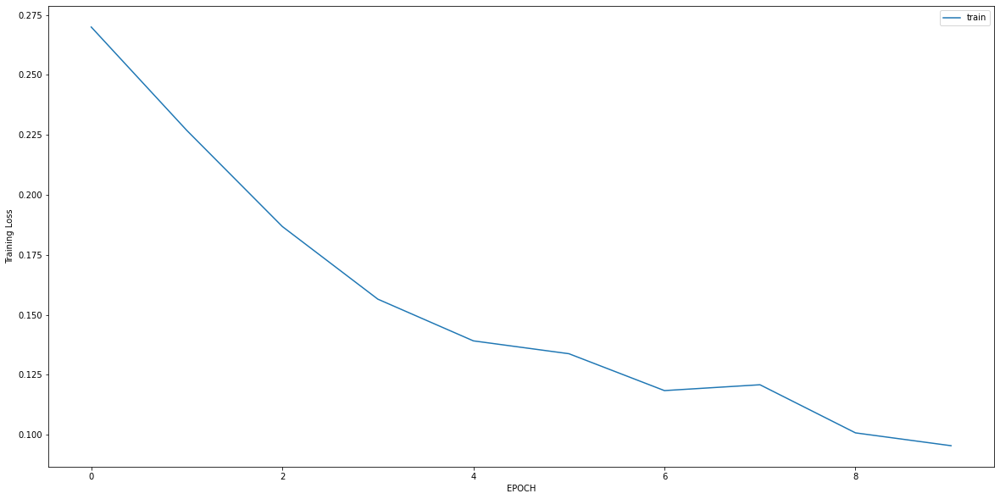

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 0.8478 - accuracy: 0.6837
Epoch 2/10
4/4 [==============================] - 0s 7ms/step - loss: 0.3266 - accuracy: 0.8469
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 0.5387 - accuracy: 0.8367
Epoch 4/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2684 - accuracy: 0.8878
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3287 - accuracy: 0.8367
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3056 - accuracy: 0.8265
Epoch 7/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3230 - accuracy: 0.7653
Epoch 8/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2896 - accuracy: 0.8571
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3415 - accuracy: 0.8367
Epoch 10/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2597 - accuracy: 0.8673


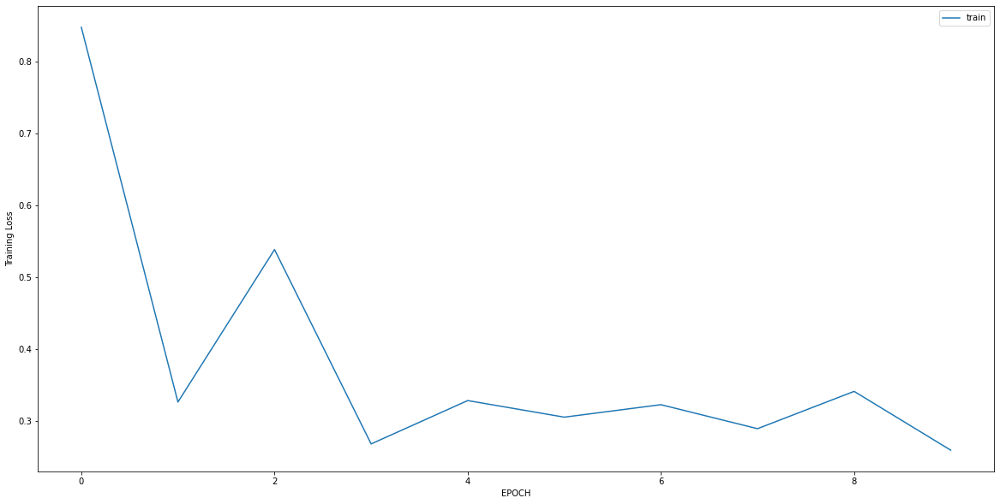

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5486 - accuracy: 0.3897
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1643 - accuracy: 0.3934
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6759 - accuracy: 0.6029
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3880 - accuracy: 0.8676
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3048 - accuracy: 0.9191
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3119 - accuracy: 0.9044
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2736 - accuracy: 0.9265
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2558 - accuracy: 0.9375
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2588 - accuracy: 0.9265
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2378 - accuracy: 0.9485


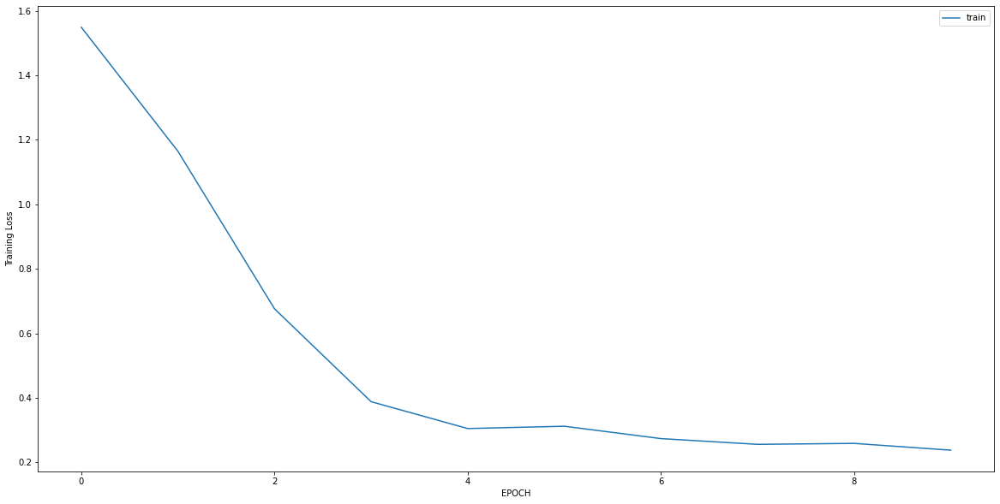

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.7824 - accuracy: 0.6745
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5834 - accuracy: 0.7123
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5058 - accuracy: 0.7264
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4276 - accuracy: 0.7783
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4316 - accuracy: 0.7877
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4196 - accuracy: 0.7736
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3944 - accuracy: 0.8066
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3989 - accuracy: 0.7783
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3869 - accuracy: 0.7877
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3783 - accuracy: 0.8160


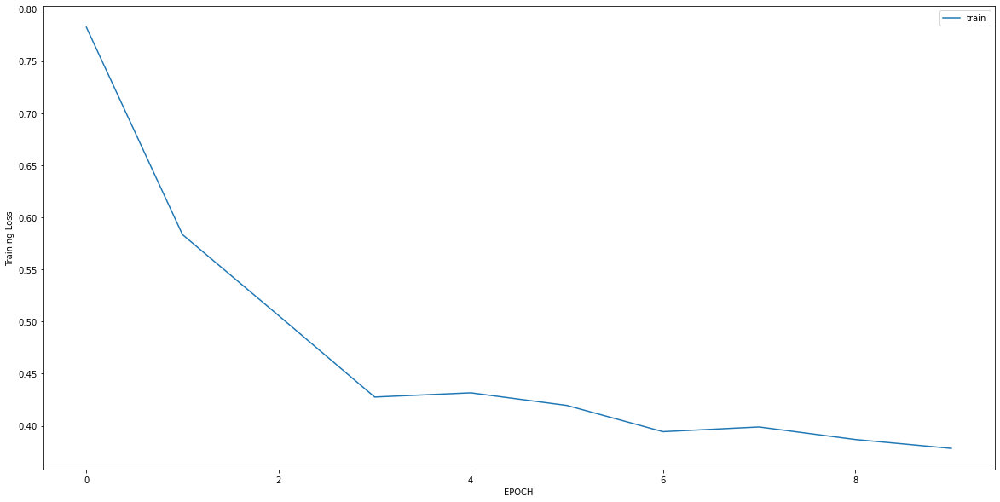

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.0605 - accuracy: 0.3993
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9959 - accuracy: 0.5560
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3841 - accuracy: 0.8694
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4238 - accuracy: 0.8246
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4083 - accuracy: 0.8284
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4041 - accuracy: 0.8358
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3716 - accuracy: 0.8582
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3559 - accuracy: 0.8806
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3477 - accuracy: 0.8806
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3060 - accuracy: 0.9030


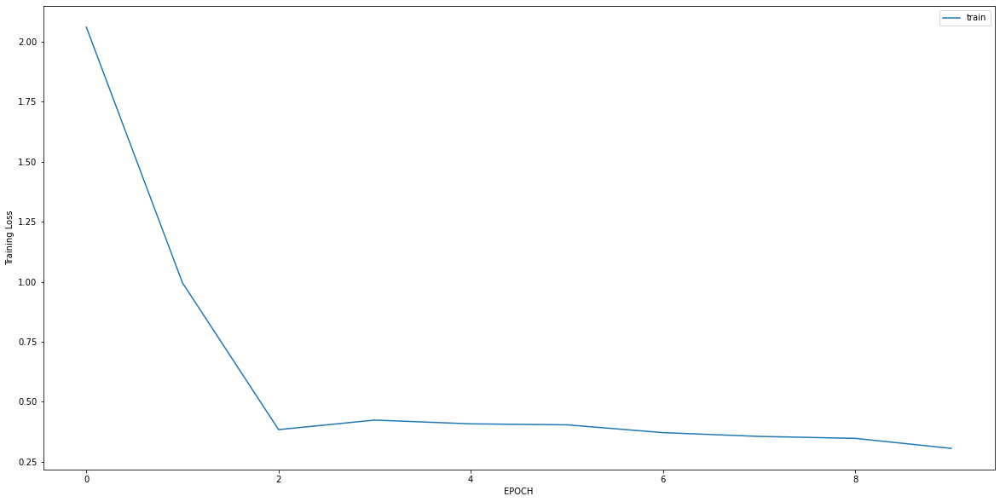

Epoch 1/10
12/12 [==============================] - 0s 6ms/step - loss: 0.2847 - accuracy: 0.9291
Epoch 2/10
12/12 [==============================] - 0s 5ms/step - loss: 0.1148 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0764 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0544 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0294 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0240 - accuracy: 1.0000


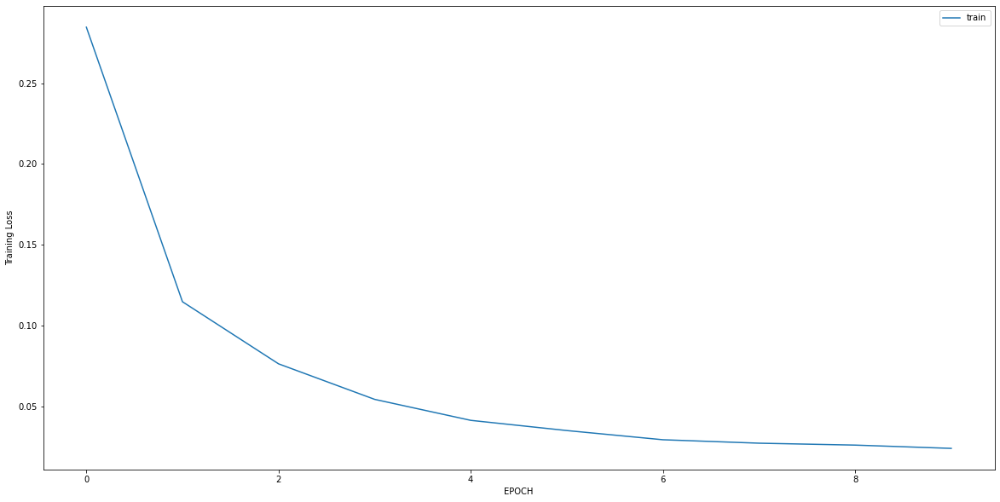

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.2145 - accuracy: 0.5505
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 1.0253 - accuracy: 0.6743
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9386 - accuracy: 0.7156
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7616 - accuracy: 0.7523
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6675 - accuracy: 0.7752
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5648 - accuracy: 0.7982
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5158 - accuracy: 0.8119
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4802 - accuracy: 0.7982
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3941 - accuracy: 0.8670
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3584 - accuracy: 0.8440


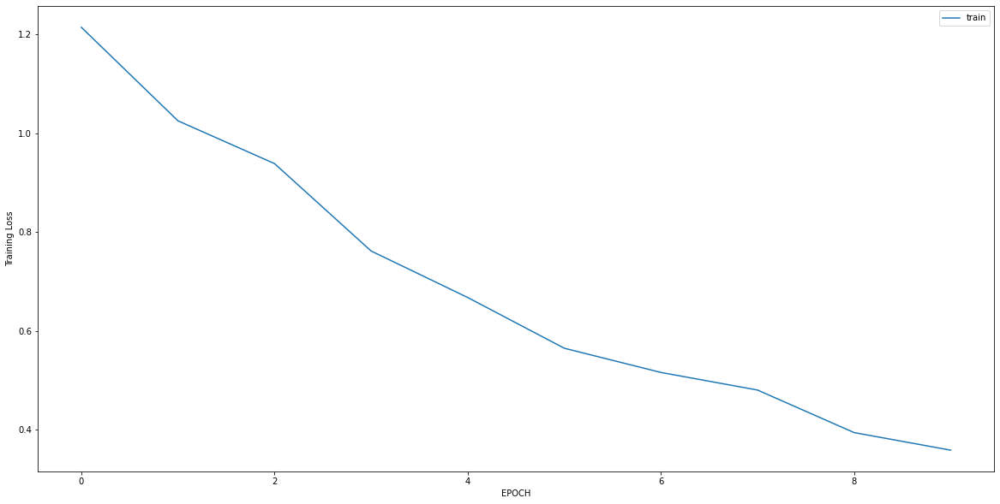

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3739 - accuracy: 0.8902
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3420 - accuracy: 0.8980
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3166 - accuracy: 0.8941
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3096 - accuracy: 0.8902
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2936 - accuracy: 0.9137
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2513 - accuracy: 0.9176
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2698 - accuracy: 0.9294
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2452 - accuracy: 0.9373
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2687 - accuracy: 0.9137
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2361 - accuracy: 0.9176


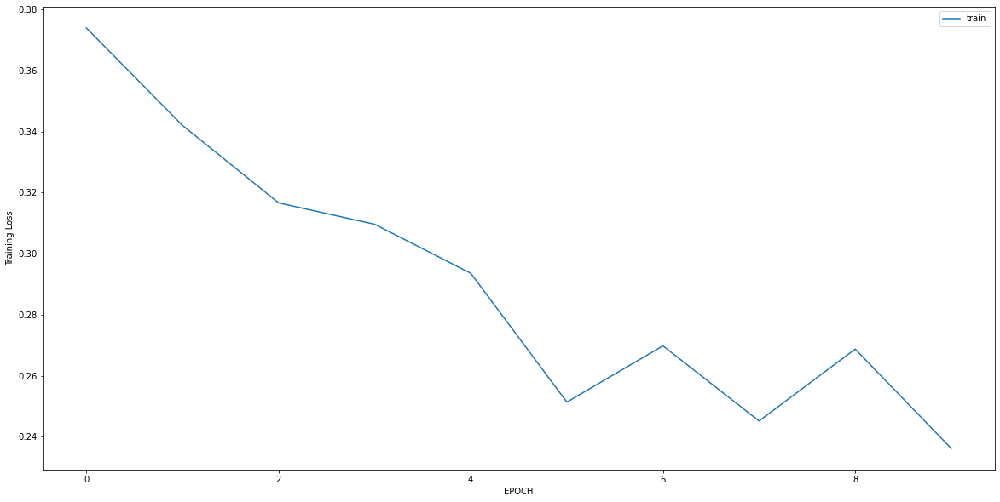

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2178 - accuracy: 0.9481
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0893 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0751 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0670 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0554 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0503 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 1.0000


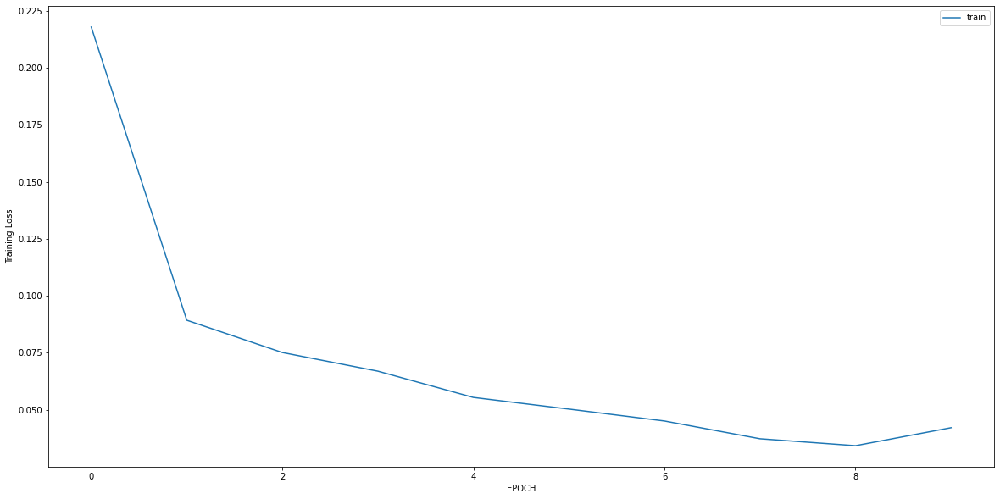

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6075 - accuracy: 0.8287
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4589 - accuracy: 0.8427
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3787 - accuracy: 0.8846
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3344 - accuracy: 0.9056
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3147 - accuracy: 0.9126
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3153 - accuracy: 0.9091
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3092 - accuracy: 0.9091
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3199 - accuracy: 0.9196
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3119 - accuracy: 0.9196
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2814 - accuracy: 0.9161


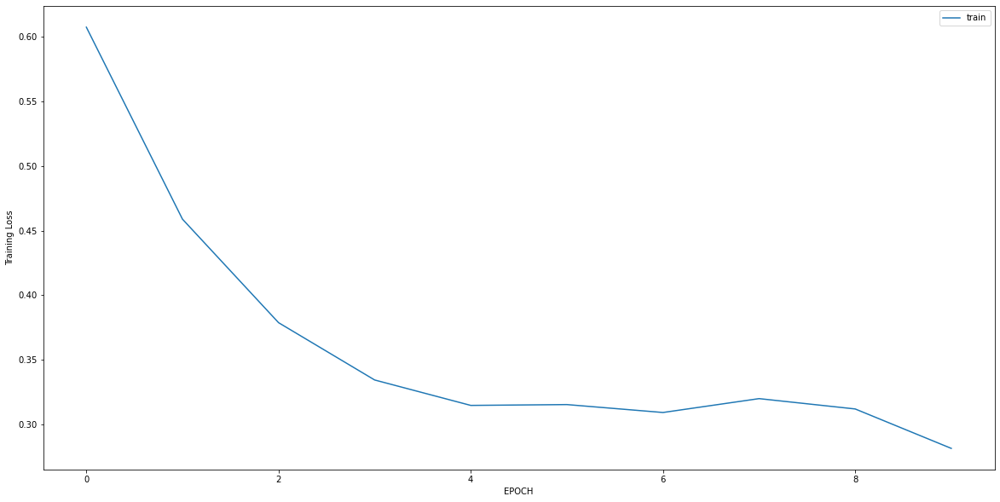

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2996 - accuracy: 0.5552
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7814 - accuracy: 0.5694
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4667 - accuracy: 0.7544
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3277 - accuracy: 0.8754
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3544 - accuracy: 0.8648
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3035 - accuracy: 0.8897
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2448 - accuracy: 0.9359
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2367 - accuracy: 0.9395
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2006 - accuracy: 0.9680
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1811 - accuracy: 0.9573


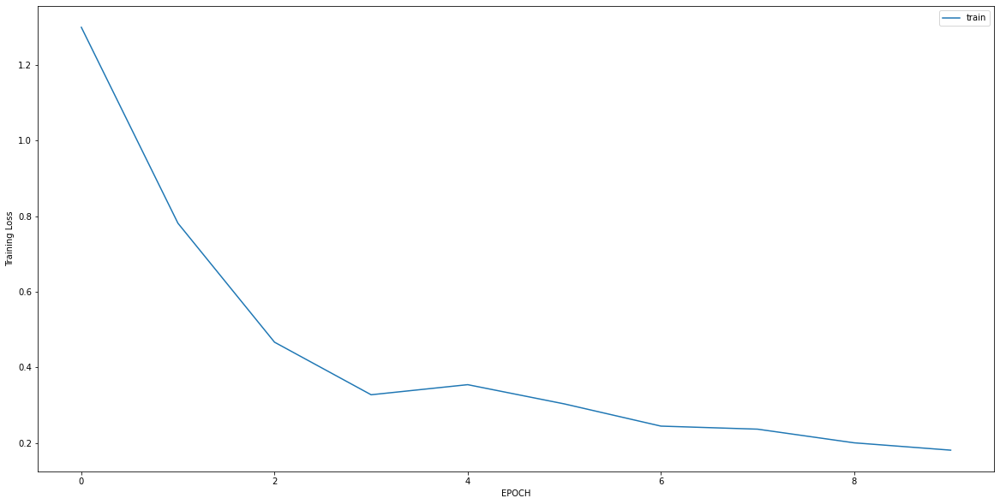

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3469 - accuracy: 0.8735
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3070 - accuracy: 0.8933
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2715 - accuracy: 0.9091
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2642 - accuracy: 0.9170
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2878 - accuracy: 0.9091
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2722 - accuracy: 0.9170
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2519 - accuracy: 0.9249
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2486 - accuracy: 0.9130
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2853 - accuracy: 0.9012
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2671 - accuracy: 0.9170


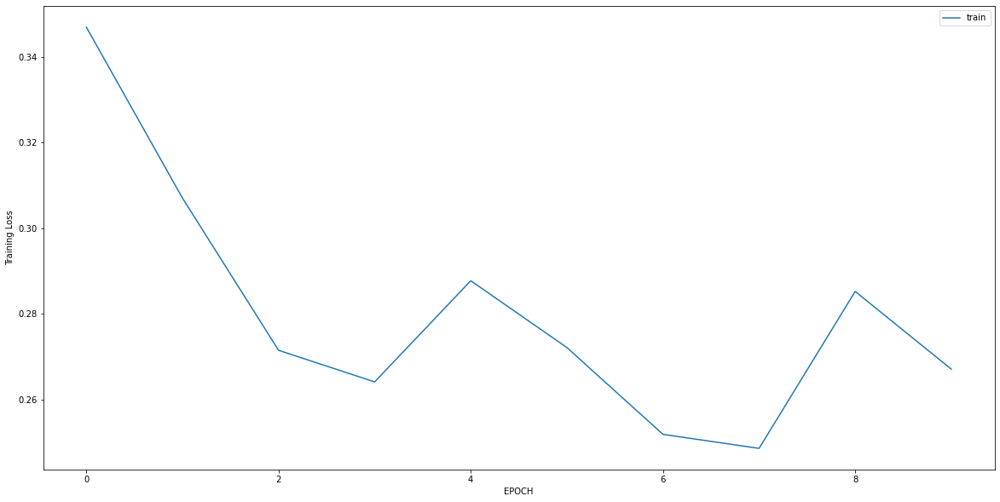

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3008 - accuracy: 0.8411
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2859 - accuracy: 0.8808
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2607 - accuracy: 0.8907
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2273 - accuracy: 0.9238
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2057 - accuracy: 0.9272
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2672 - accuracy: 0.8907
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3000 - accuracy: 0.8576
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2753 - accuracy: 0.9040
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2469 - accuracy: 0.8907
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2175 - accuracy: 0.9205


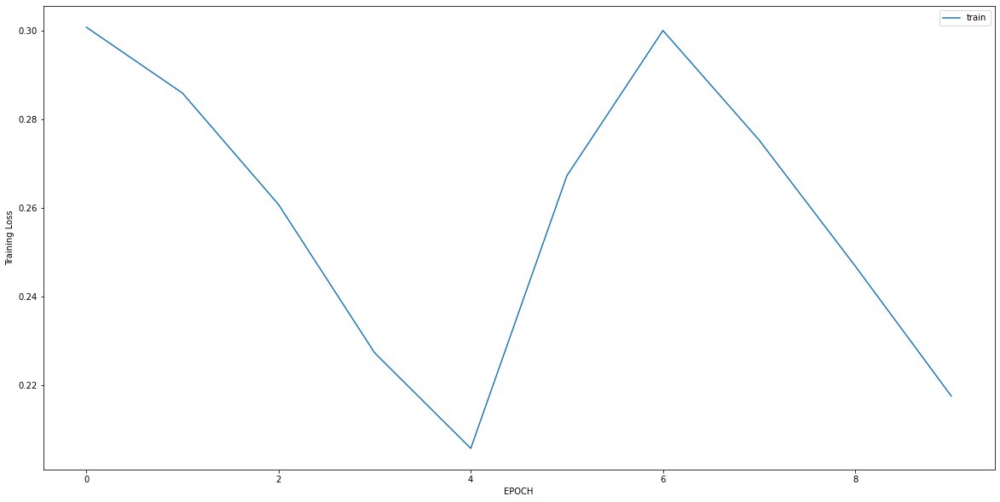

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1914 - accuracy: 0.9216
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1367 - accuracy: 0.9498
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1107 - accuracy: 0.9718
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0890 - accuracy: 0.9812
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0808 - accuracy: 0.9843
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0687 - accuracy: 0.9843
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0598 - accuracy: 0.9969
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0576 - accuracy: 0.9969
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0489 - accuracy: 0.9969
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0491 - accuracy: 0.9937


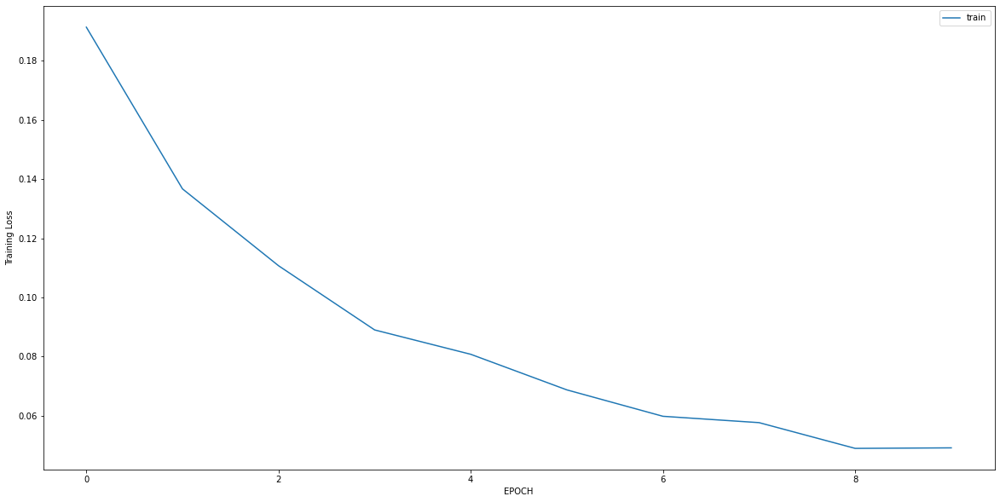

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2788 - accuracy: 0.9139
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2224 - accuracy: 0.9251
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2130 - accuracy: 0.9213
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1865 - accuracy: 0.9363
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2067 - accuracy: 0.9213
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2187 - accuracy: 0.9213
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2158 - accuracy: 0.9288
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2043 - accuracy: 0.9139
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2120 - accuracy: 0.9176
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1688 - accuracy: 0.9401


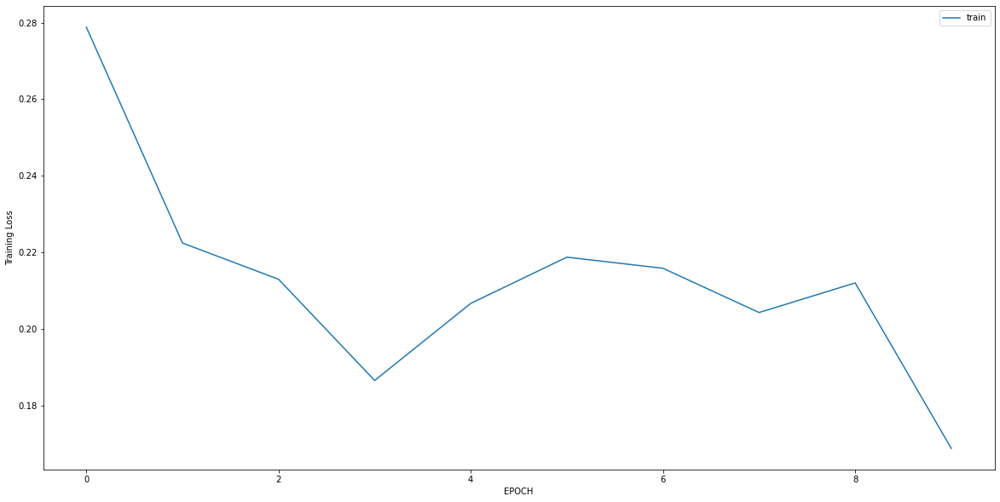

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.2564 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1606 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 7ms/step - loss: 0.9494 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 7ms/step - loss: 0.7443 - accuracy: 0.7153
Epoch 5/10
5/5 [==============================] - 0s 7ms/step - loss: 0.7075 - accuracy: 0.7222
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6574 - accuracy: 0.7222
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6210 - accuracy: 0.7222
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6212 - accuracy: 0.7153
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5108 - accuracy: 0.7708
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5172 - accuracy: 0.7014


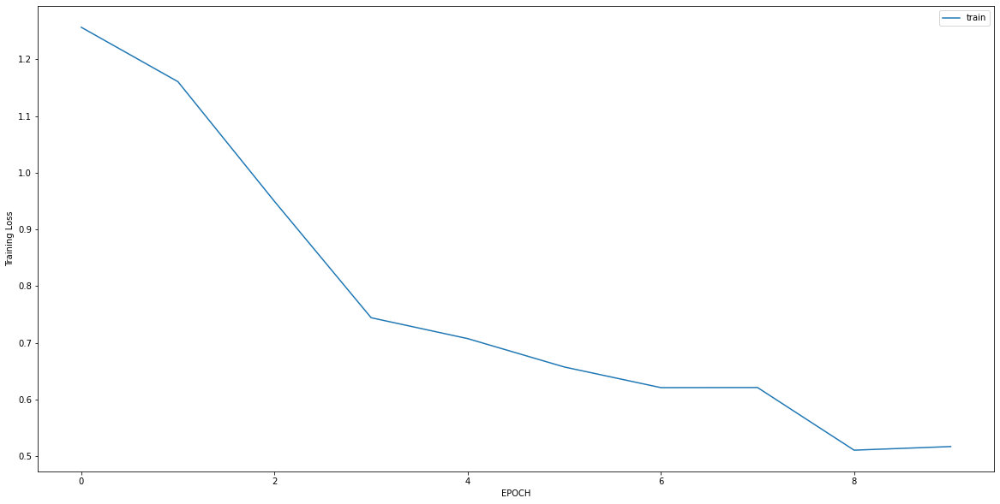

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2730 - accuracy: 0.9024
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2825 - accuracy: 0.9024
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2478 - accuracy: 0.9293
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2275 - accuracy: 0.9327
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2317 - accuracy: 0.9360
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2253 - accuracy: 0.9394
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2192 - accuracy: 0.9394
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2299 - accuracy: 0.9360
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2265 - accuracy: 0.9428
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2246 - accuracy: 0.9461


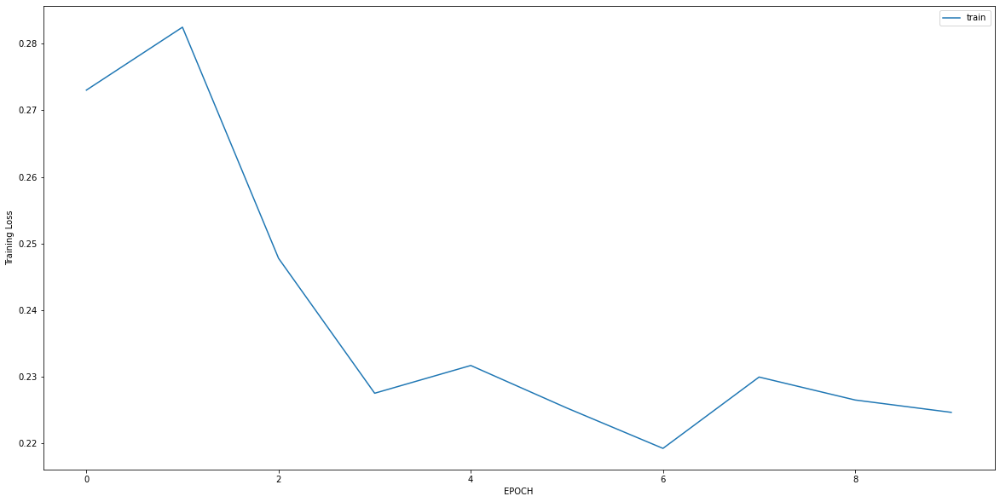

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.4561 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.2100 - accuracy: 0.0192
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9850 - accuracy: 0.3755
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3752 - accuracy: 0.8582
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1642 - accuracy: 0.9923
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0904 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0682 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0486 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 1.0000


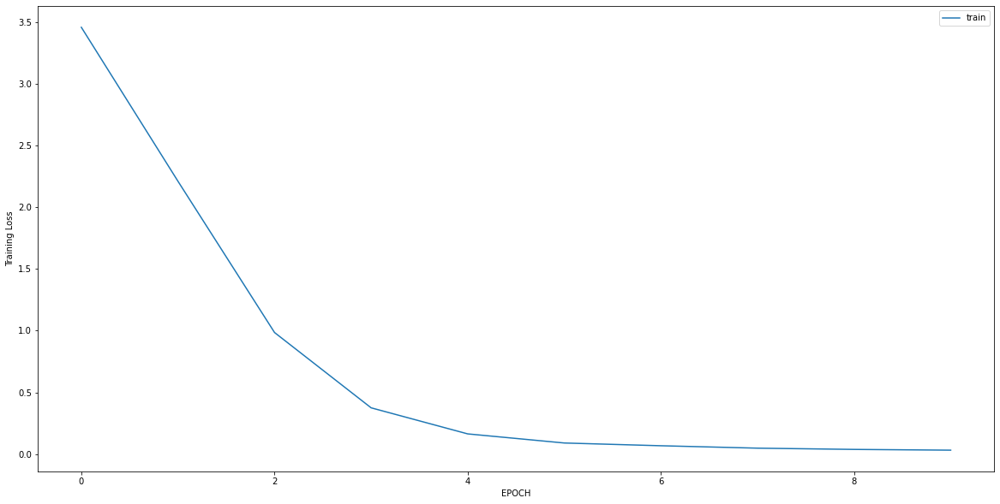

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0146 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0079 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0080 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0075 - accuracy: 1.0000


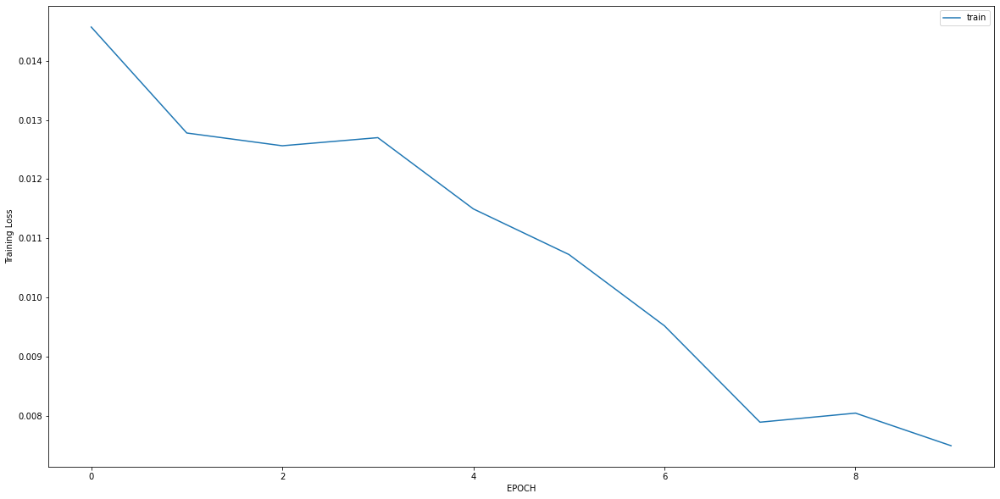

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0056 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0056 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0054 - accuracy: 1.0000


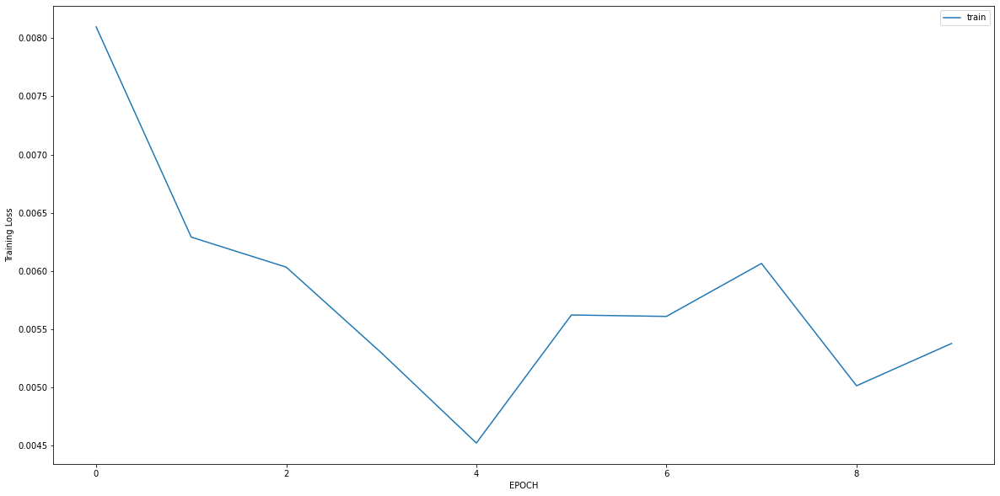

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.3670 - accuracy: 0.4000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.8593 - accuracy: 0.4038
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3329 - accuracy: 0.4189
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9046 - accuracy: 0.5358
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6677 - accuracy: 0.6868
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5063 - accuracy: 0.8226
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4121 - accuracy: 0.8415
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3870 - accuracy: 0.8906
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3595 - accuracy: 0.8943
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2998 - accuracy: 0.9094


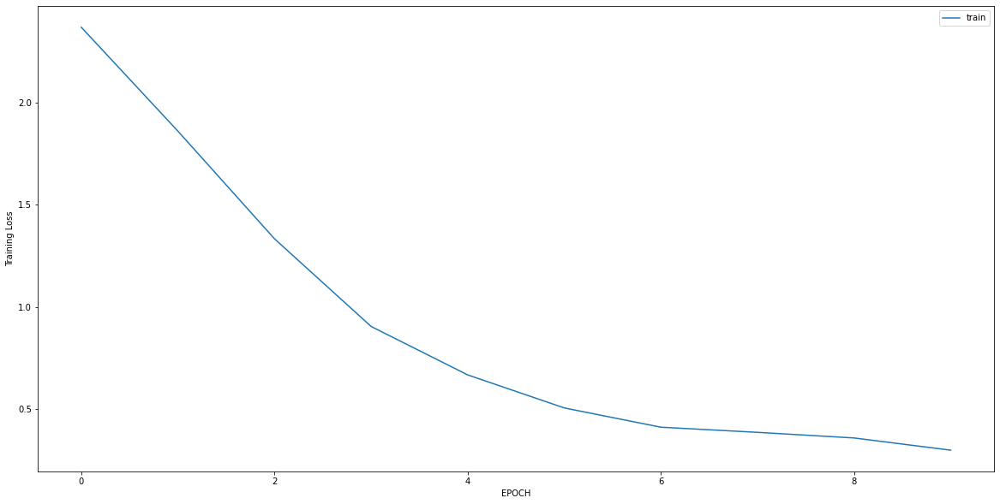

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3158 - accuracy: 0.8947
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2660 - accuracy: 0.9150
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2316 - accuracy: 0.9595
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1769 - accuracy: 0.9676
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1413 - accuracy: 0.9838
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1283 - accuracy: 0.9838
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1156 - accuracy: 0.9838
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1269 - accuracy: 0.9595
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1127 - accuracy: 0.9757
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1056 - accuracy: 0.9879


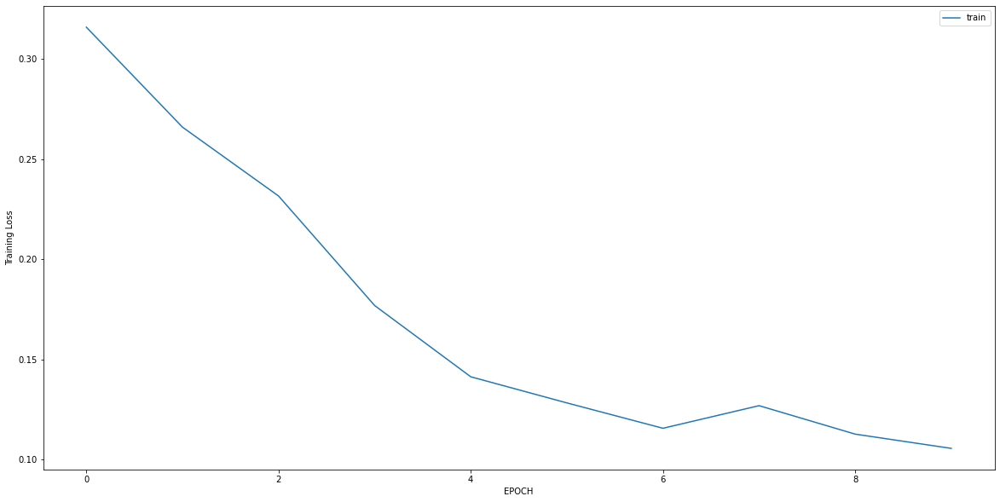

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7069 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6694 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6048 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5489 - accuracy: 0.8228
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5912 - accuracy: 0.8228
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5110 - accuracy: 0.8228
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5551 - accuracy: 0.8228
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5098 - accuracy: 0.8228
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5105 - accuracy: 0.8228
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4964 - accuracy: 0.8228


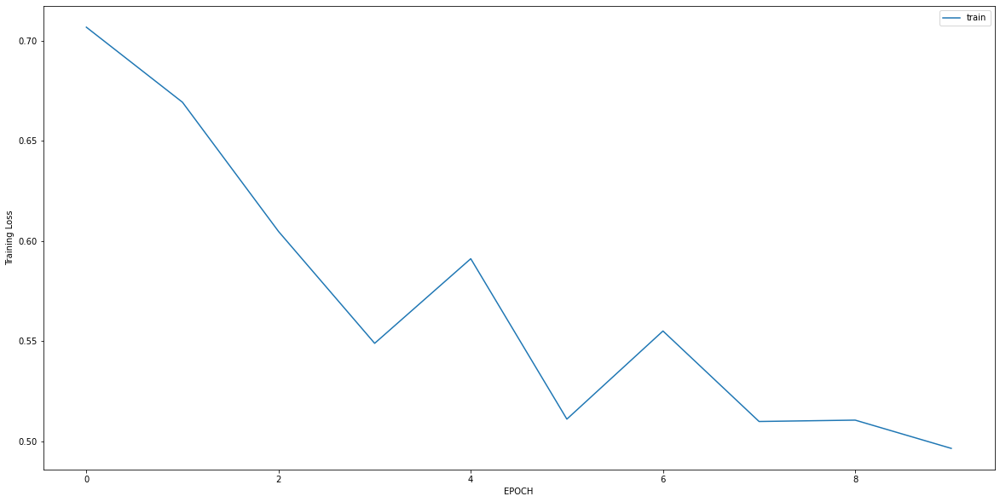

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.9677 - accuracy: 0.0214
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3010 - accuracy: 0.1429
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7072 - accuracy: 0.5464
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3409 - accuracy: 0.9321
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2029 - accuracy: 0.9893
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1286 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1069 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0867 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0666 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0522 - accuracy: 1.0000


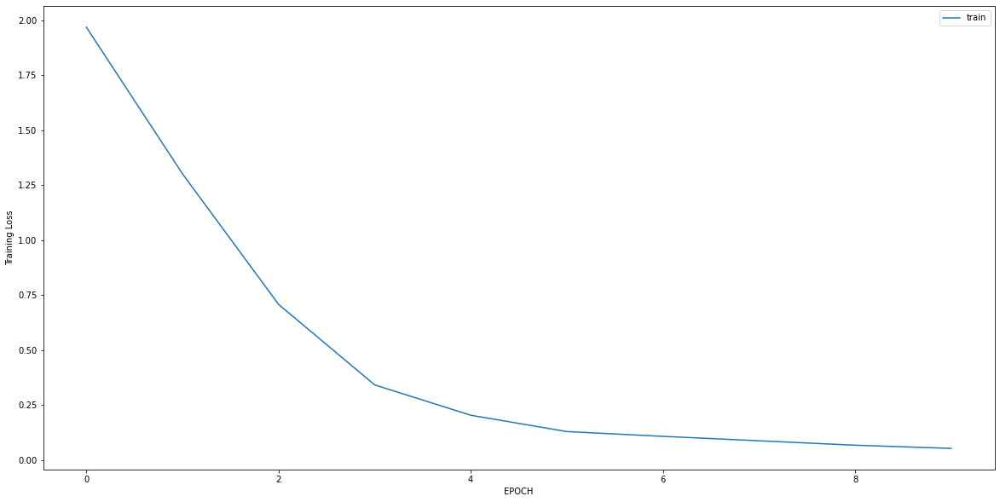

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0761 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0612 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0537 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0265 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0246 - accuracy: 1.0000


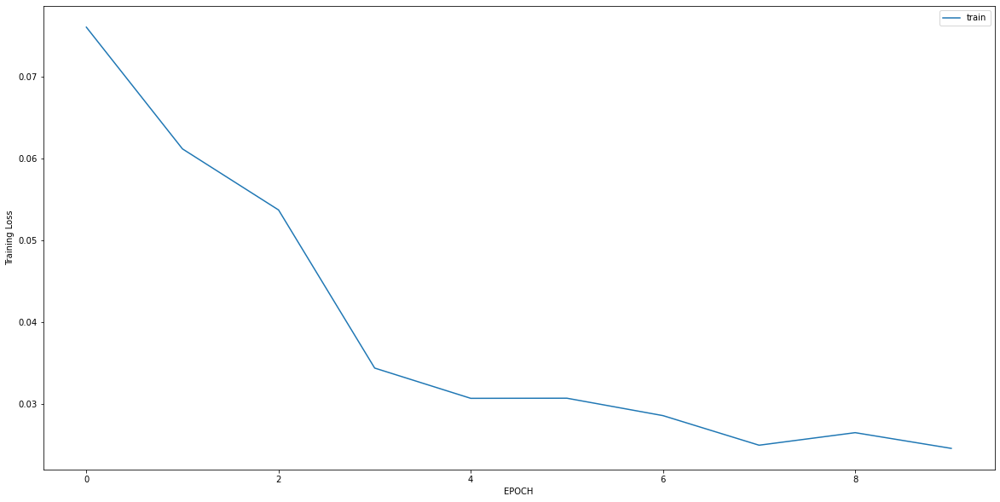

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.4699 - accuracy: 0.5781
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.3898 - accuracy: 0.5781
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1692 - accuracy: 0.5907
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0188 - accuracy: 0.6076
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8262 - accuracy: 0.6076
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5967 - accuracy: 0.6751
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5165 - accuracy: 0.6878
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4108 - accuracy: 0.7426
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3078 - accuracy: 0.8101
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2533 - accuracy: 0.9114


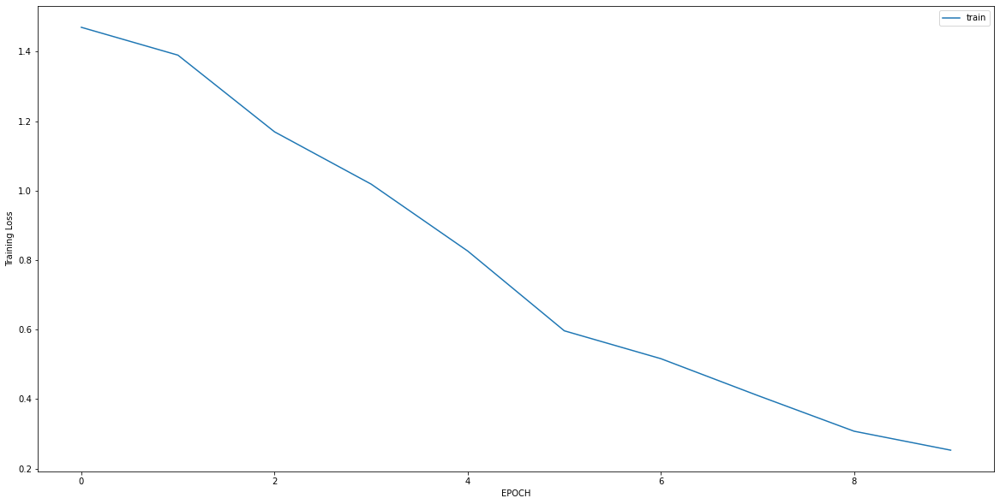

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.5755
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6049 - accuracy: 0.6187
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6597 - accuracy: 0.6835
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5870 - accuracy: 0.6835
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5718 - accuracy: 0.7266
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4299 - accuracy: 0.9065
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3526 - accuracy: 0.8921
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2805 - accuracy: 0.9640
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2449 - accuracy: 0.9640
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1854 - accuracy: 0.9784


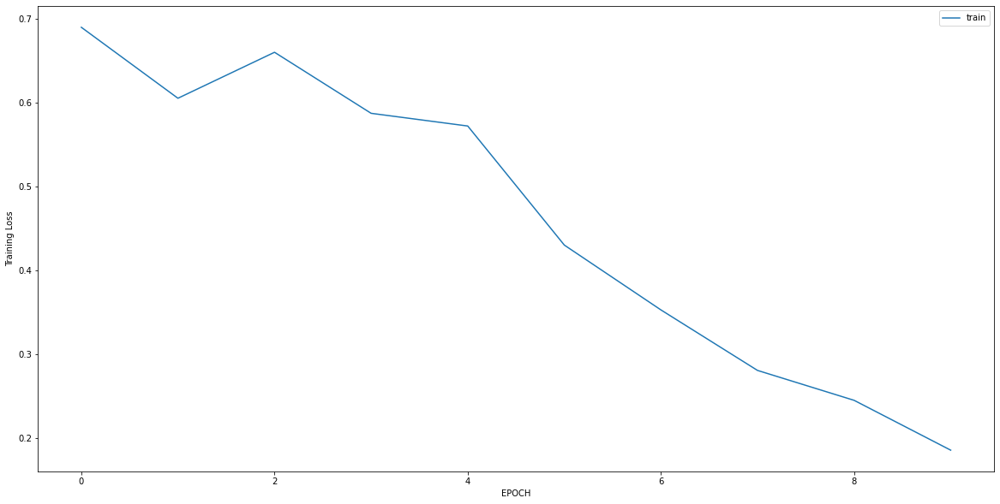

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3743 - accuracy: 0.8780
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2872 - accuracy: 0.9233
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3116 - accuracy: 0.9129
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3857 - accuracy: 0.8641
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3999 - accuracy: 0.8641
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3570 - accuracy: 0.8571
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3784 - accuracy: 0.8676
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3403 - accuracy: 0.8885
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3449 - accuracy: 0.8885
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3036 - accuracy: 0.9024


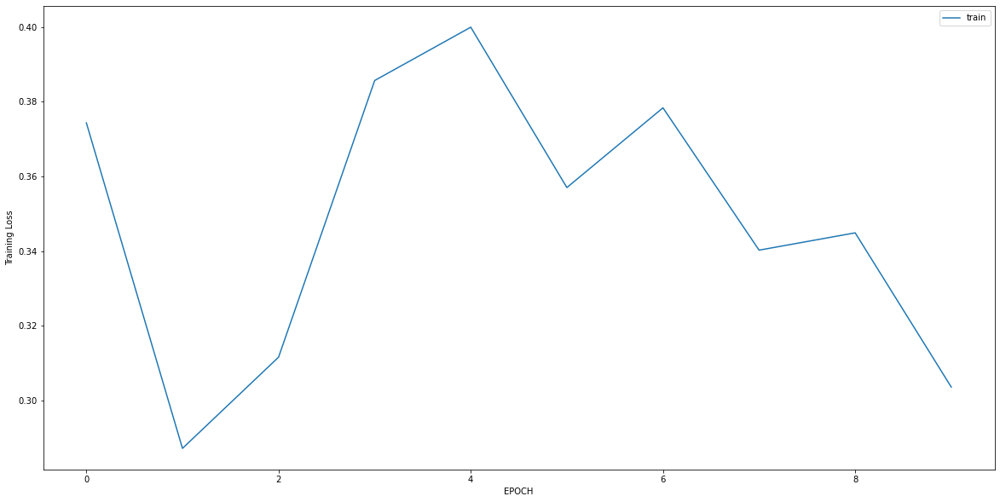

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.1301 - accuracy: 0.4269
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.8134 - accuracy: 0.4737
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5191 - accuracy: 0.7222
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3674 - accuracy: 0.8801
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3367 - accuracy: 0.8772
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2845 - accuracy: 0.9094
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2667 - accuracy: 0.9064
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2366 - accuracy: 0.9211
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2253 - accuracy: 0.9240
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1797 - accuracy: 0.9474


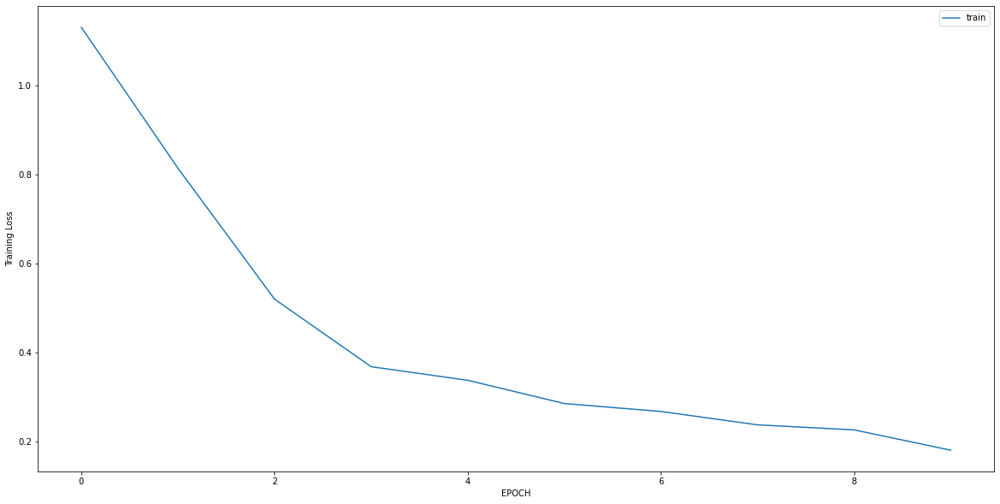

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 2.8235 - accuracy: 0.0000e+00
Epoch 2/10
2/2 [==============================] - 0s 8ms/step - loss: 2.4984 - accuracy: 0.0179
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 1.4888 - accuracy: 0.0893
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.4446 - accuracy: 0.8214
Epoch 5/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1909 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0989 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0734 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0708 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0467 - accuracy: 1.0000


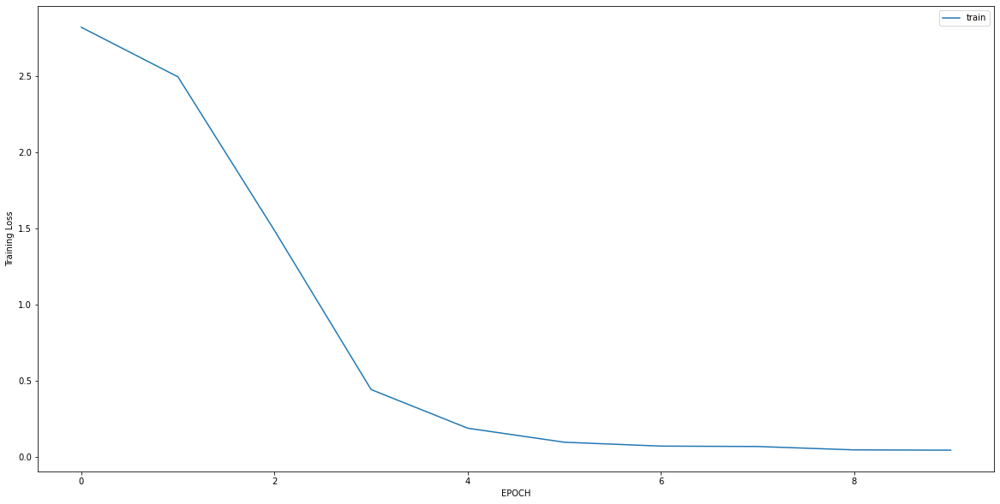

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0494 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0315 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0297 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0320 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0262 - accuracy: 1.0000


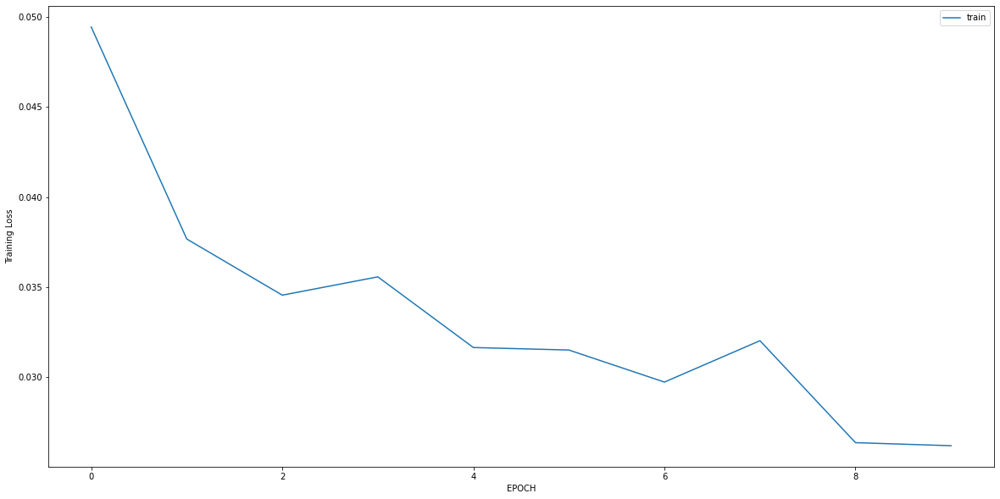

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9676 - accuracy: 0.6746
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9092 - accuracy: 0.7262
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7309 - accuracy: 0.7579
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5787 - accuracy: 0.7897
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4707 - accuracy: 0.8175
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4174 - accuracy: 0.8532
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3529 - accuracy: 0.8770
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3287 - accuracy: 0.8968
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2847 - accuracy: 0.9048
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2530 - accuracy: 0.9286


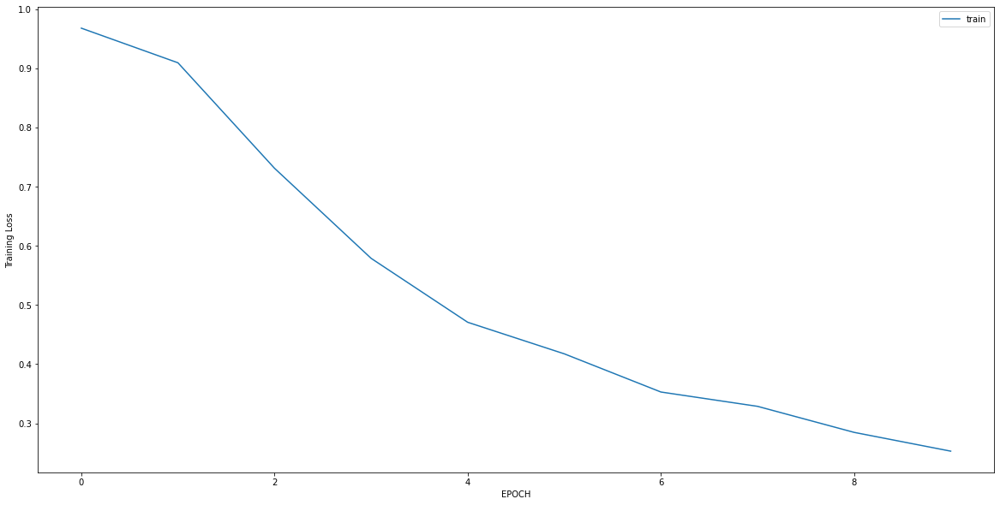

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.3880 - accuracy: 0.8520
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2745 - accuracy: 0.9184
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2254 - accuracy: 0.9547
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2077 - accuracy: 0.9426
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1940 - accuracy: 0.9577
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2114 - accuracy: 0.9245
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1935 - accuracy: 0.9426
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1587 - accuracy: 0.9637
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1547 - accuracy: 0.9577
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1697 - accuracy: 0.9517


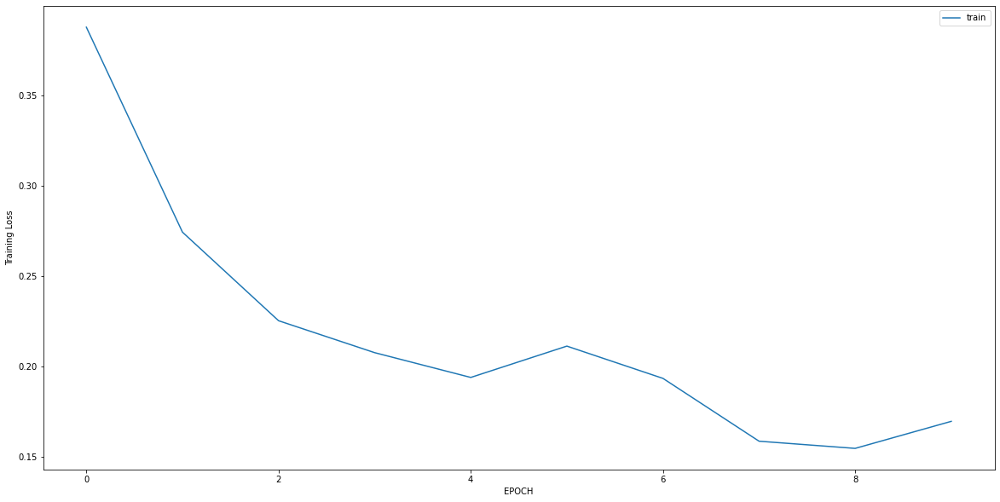

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8336 - accuracy: 0.5808
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3954 - accuracy: 0.7973
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2409 - accuracy: 0.9038
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1755 - accuracy: 0.9485
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1436 - accuracy: 0.9863
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1316 - accuracy: 0.9656
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1172 - accuracy: 0.9691
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1043 - accuracy: 0.9863
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0944 - accuracy: 0.9794
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1013 - accuracy: 0.9691


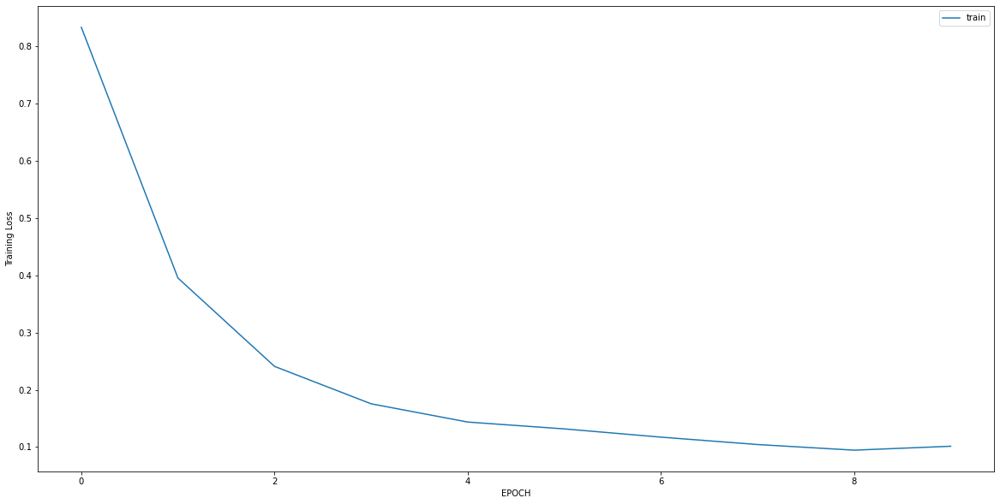

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3972 - accuracy: 0.8365
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2718 - accuracy: 0.8962
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1843 - accuracy: 0.9528
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1691 - accuracy: 0.9497
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1435 - accuracy: 0.9654
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1115 - accuracy: 0.9843
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1243 - accuracy: 0.9811
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1248 - accuracy: 0.9780
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1006 - accuracy: 0.9780
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1012 - accuracy: 0.9843


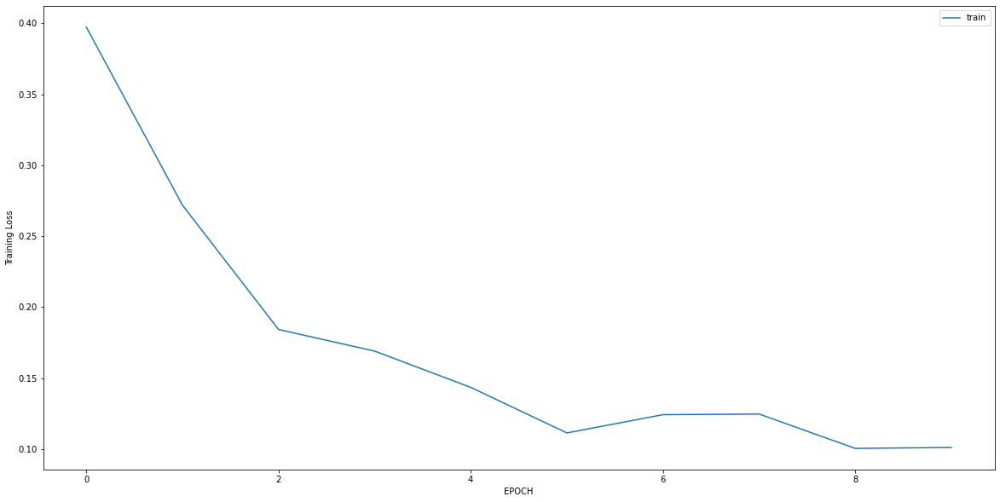

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8329 - accuracy: 0.5825
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2615 - accuracy: 0.8947
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2480 - accuracy: 0.9193
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2404 - accuracy: 0.9368
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2105 - accuracy: 0.9263
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2569 - accuracy: 0.9193
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2372 - accuracy: 0.9368
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2216 - accuracy: 0.9263
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2505 - accuracy: 0.9088
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2318 - accuracy: 0.9228


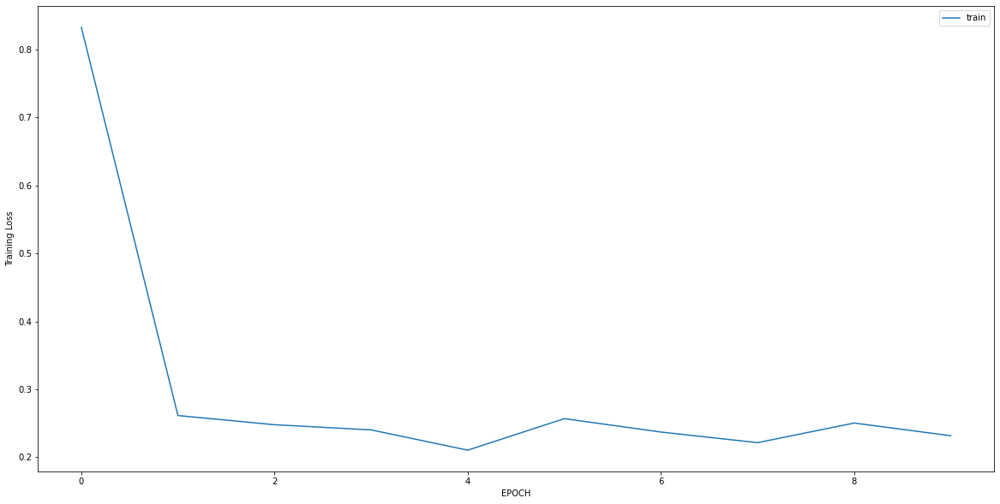

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1327 - accuracy: 0.9698
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0596 - accuracy: 0.9879
Epoch 3/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0147 - accuracy: 1.0000


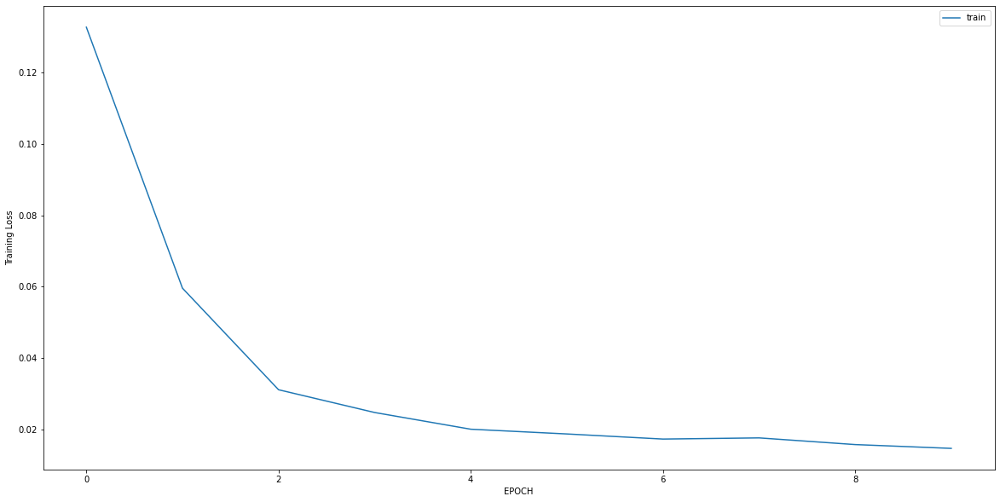

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4559 - accuracy: 0.8790
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3646 - accuracy: 0.9153
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2372 - accuracy: 0.9315
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1828 - accuracy: 0.9435
Epoch 5/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0991 - accuracy: 0.9597
Epoch 6/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0685 - accuracy: 0.9839
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0670 - accuracy: 0.9839
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0586 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0653 - accuracy: 0.9839
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0534 - accuracy: 0.9960


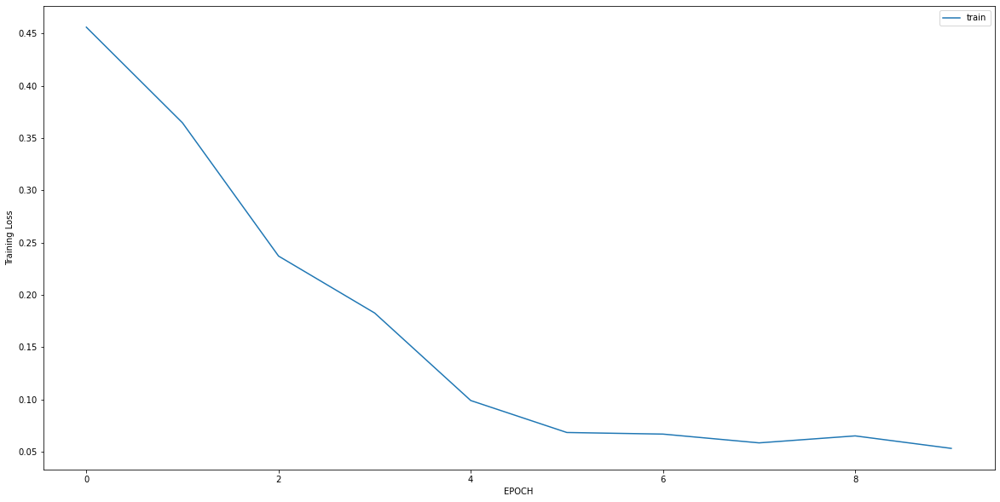

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 4.2560 - accuracy: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 3.5870 - accuracy: 0.0000e+00
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 2.3390 - accuracy: 0.0000e+00
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 1.3616 - accuracy: 0.1667
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.6194 - accuracy: 0.6444
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2260 - accuracy: 0.9556
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.1329 - accuracy: 0.9889
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0725 - accuracy: 0.9944
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0579 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0535 - accuracy: 1.0000


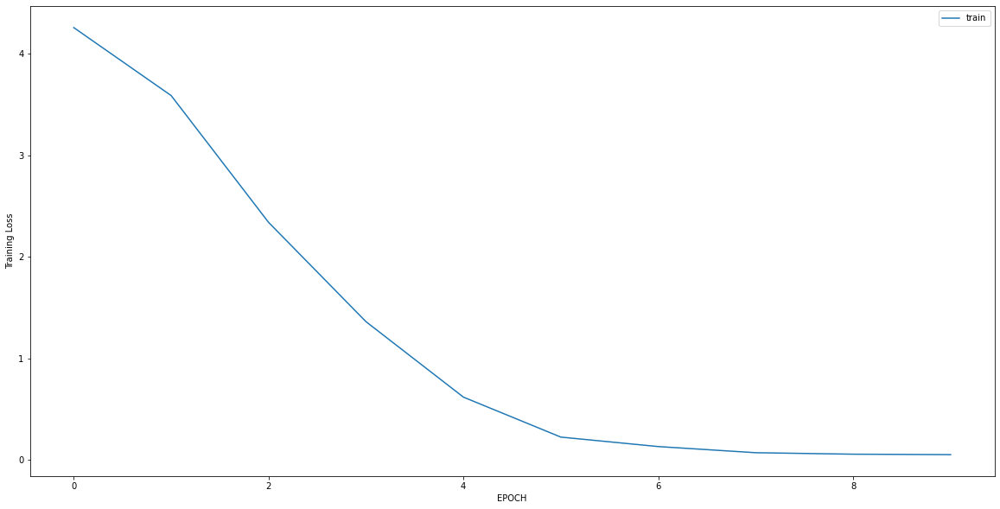

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1541 - accuracy: 0.9938
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1046 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0879 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0538 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0322 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 1.0000


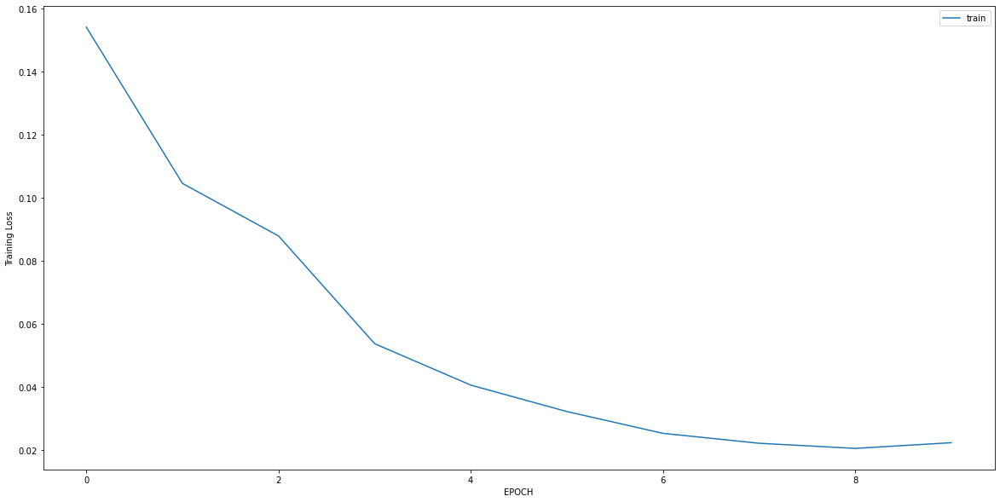

Epoch 1/10
9/9 [==============================] - 0s 8ms/step - loss: 2.6587 - accuracy: 0.3772
Epoch 2/10
9/9 [==============================] - 0s 7ms/step - loss: 2.1774 - accuracy: 0.3808
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 1.6664 - accuracy: 0.3879
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1360 - accuracy: 0.4306
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7306 - accuracy: 0.5587
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5503 - accuracy: 0.7331
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4887 - accuracy: 0.7900
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4364 - accuracy: 0.8292
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3393 - accuracy: 0.8648
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2987 - accuracy: 0.9146


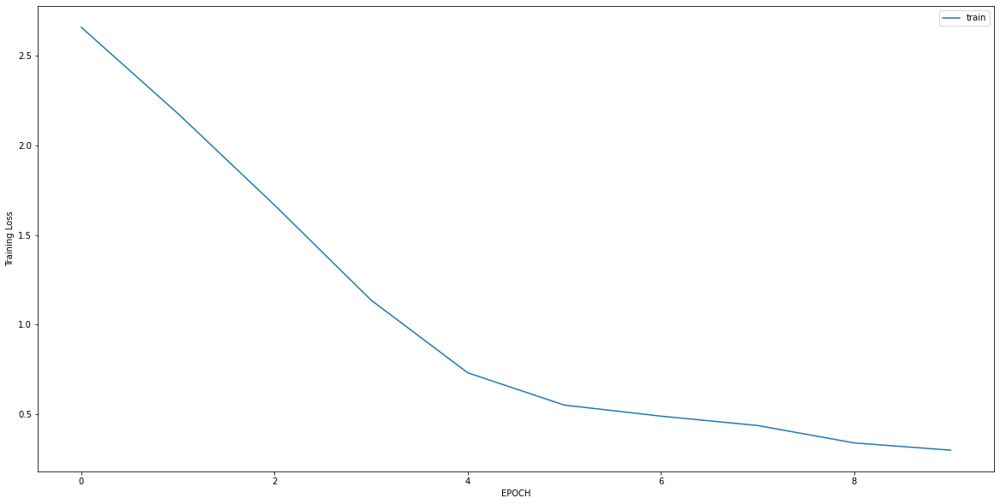

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5033 - accuracy: 0.7255
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3580 - accuracy: 0.8863
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3392 - accuracy: 0.8941
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2995 - accuracy: 0.9020
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2804 - accuracy: 0.9216
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2487 - accuracy: 0.9451
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2481 - accuracy: 0.9608
Epoch 8/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2385 - accuracy: 0.9412
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2477 - accuracy: 0.9255
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2220 - accuracy: 0.9451


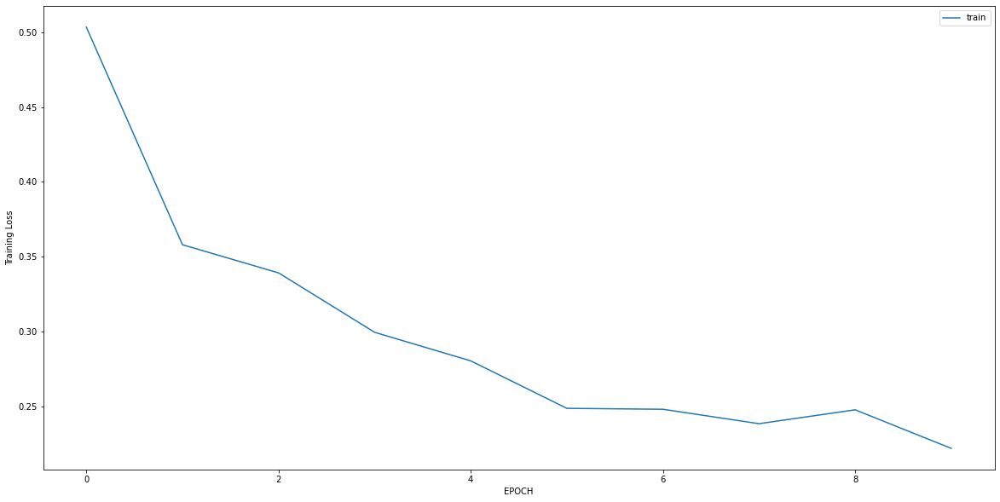

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3450 - accuracy: 0.9006
Epoch 2/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3519 - accuracy: 0.8942
Epoch 3/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3015 - accuracy: 0.9136
Epoch 4/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2993 - accuracy: 0.9093
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3077 - accuracy: 0.9136
Epoch 6/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2784 - accuracy: 0.9222
Epoch 7/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2787 - accuracy: 0.9201
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3018 - accuracy: 0.8985
Epoch 9/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2872 - accuracy: 0.9114
Epoch 10/10
15/15 [==============================] - 0s 7ms/step - loss: 0.2647 - accuracy: 0.9244


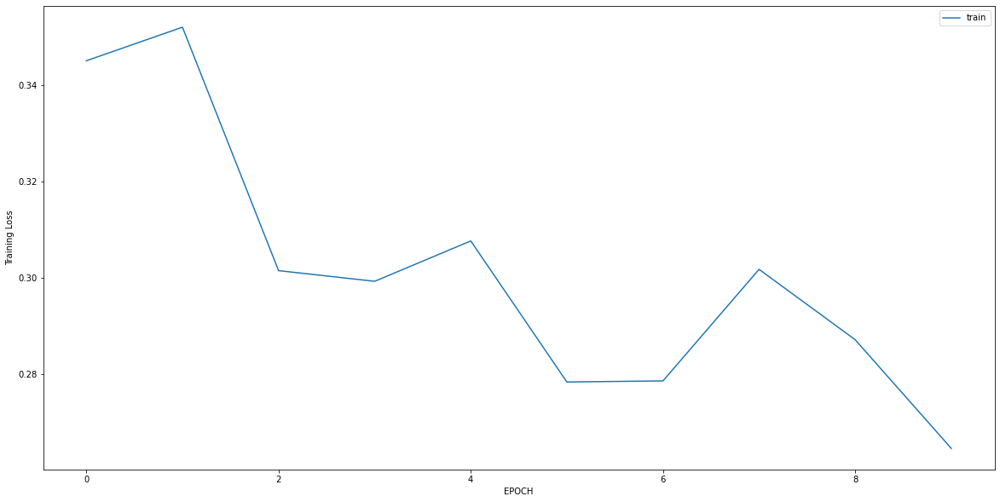

Epoch 1/10
14/14 [==============================] - 0s 6ms/step - loss: 0.3406 - accuracy: 0.8747
Epoch 2/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1939 - accuracy: 0.9536
Epoch 3/10
14/14 [==============================] - 0s 9ms/step - loss: 0.2004 - accuracy: 0.9350
Epoch 4/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1697 - accuracy: 0.9559
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1644 - accuracy: 0.9490
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1389 - accuracy: 0.9629
Epoch 7/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1425 - accuracy: 0.9698
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1479 - accuracy: 0.9606
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1314 - accuracy: 0.9606
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1349 - accuracy: 0.9582


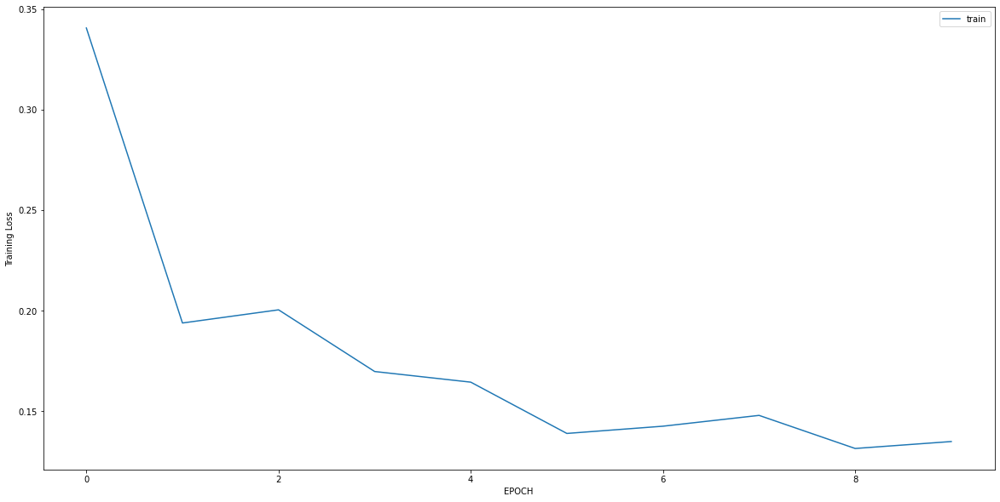

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 3.2103 - accuracy: 0.0000e+00
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 2.0908 - accuracy: 0.0335
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.0457 - accuracy: 0.3389
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4168 - accuracy: 0.8117
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2058 - accuracy: 0.9540
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1287 - accuracy: 0.9916
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1020 - accuracy: 0.9958
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0743 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0742 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0595 - accuracy: 1.0000


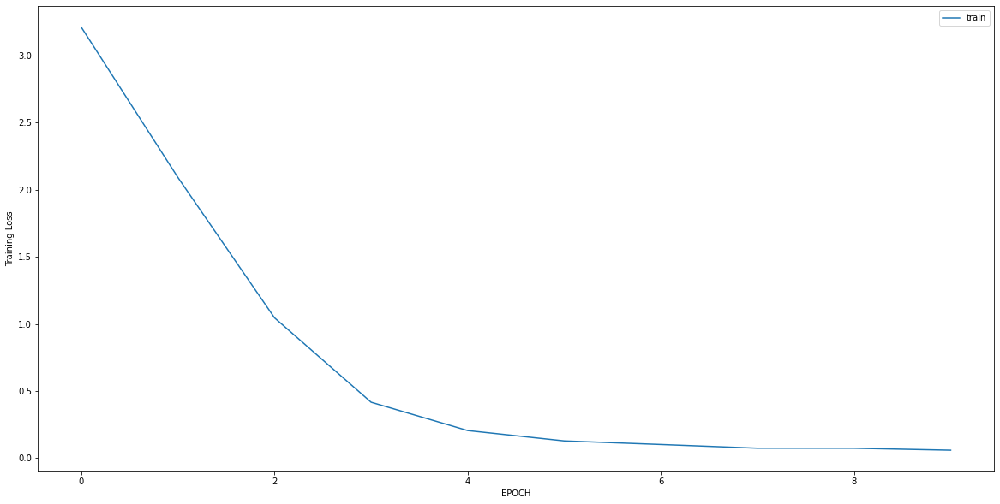

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0587 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0540 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 1.0000


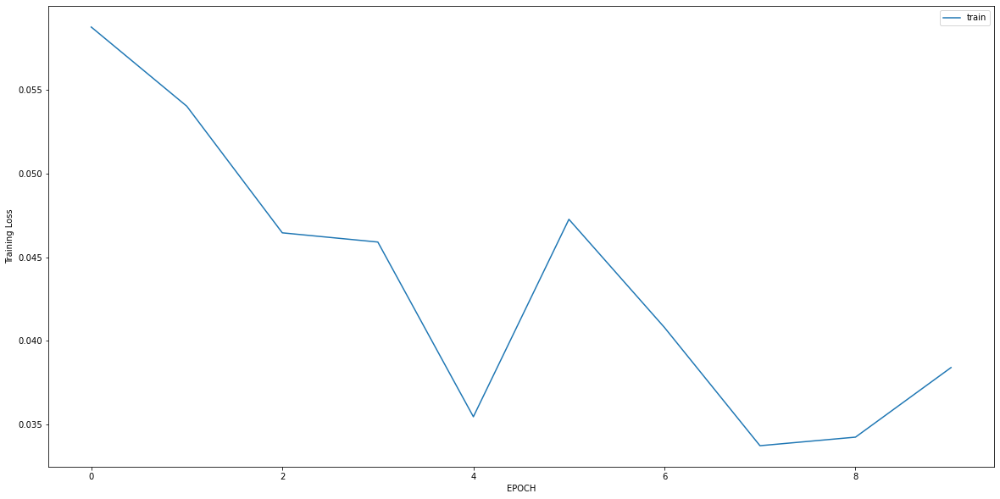

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.3969 - accuracy: 0.4298
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 1.2694 - accuracy: 0.4649
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 1.0252 - accuracy: 0.4883
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.7925 - accuracy: 0.5380
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.7229 - accuracy: 0.5731
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6246 - accuracy: 0.6374
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5159 - accuracy: 0.7222
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.5079 - accuracy: 0.7310
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4300 - accuracy: 0.8158
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4062 - accuracy: 0.8070


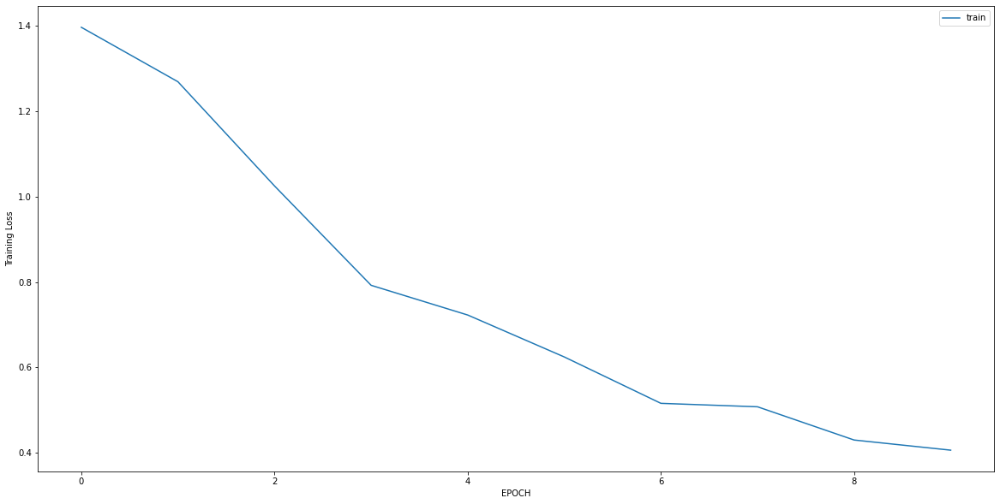

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6049 - accuracy: 0.7764
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2204 - accuracy: 0.9758
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1181 - accuracy: 0.9940
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0607 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0295 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000


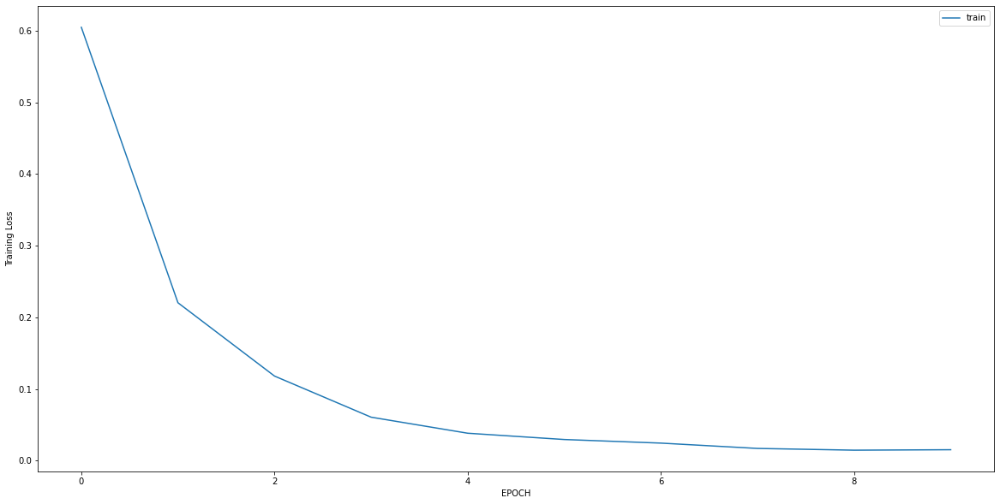

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5840 - accuracy: 0.7222
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5643 - accuracy: 0.7103
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5222 - accuracy: 0.7460
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4882 - accuracy: 0.7857
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4901 - accuracy: 0.7937
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4496 - accuracy: 0.8175
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4456 - accuracy: 0.8690
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4281 - accuracy: 0.8611
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4123 - accuracy: 0.8651
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4028 - accuracy: 0.8611


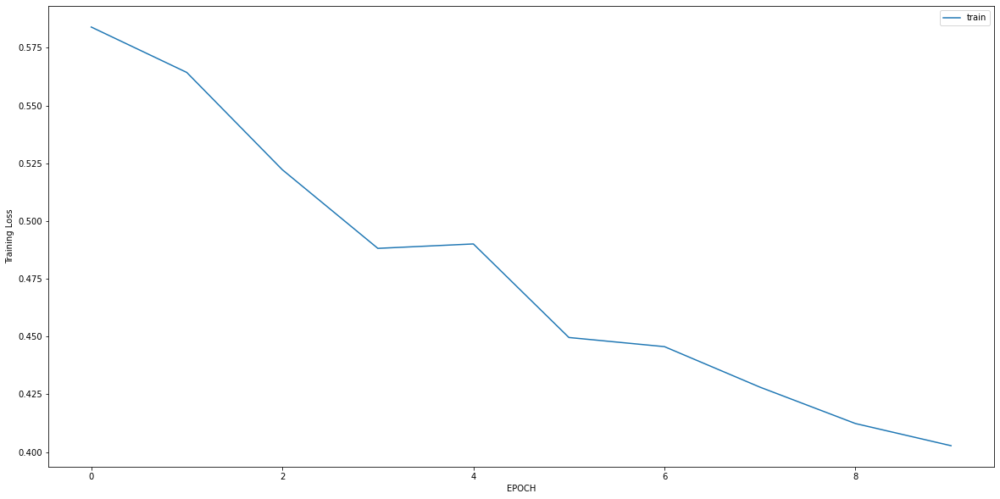

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5655 - accuracy: 0.7975
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4943 - accuracy: 0.8143
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3671 - accuracy: 0.8819
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2470 - accuracy: 0.9198
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2264 - accuracy: 0.9367
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2070 - accuracy: 0.9367
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1814 - accuracy: 0.9620
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1627 - accuracy: 0.9620
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1524 - accuracy: 0.9578
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1339 - accuracy: 0.9747


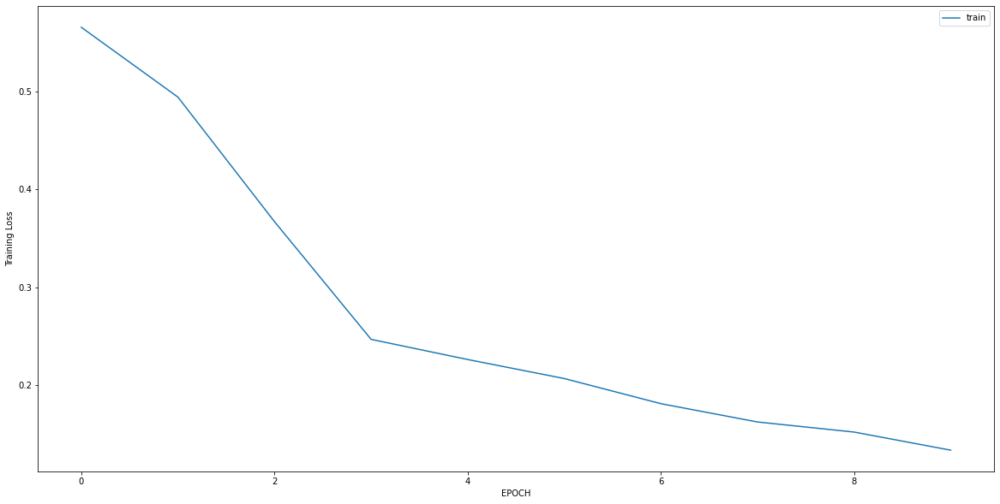

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 1.7263 - accuracy: 0.0615
Epoch 2/10
18/18 [==============================] - 0s 6ms/step - loss: 0.3608 - accuracy: 0.8594
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0146 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 7ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0107 - accuracy: 1.0000


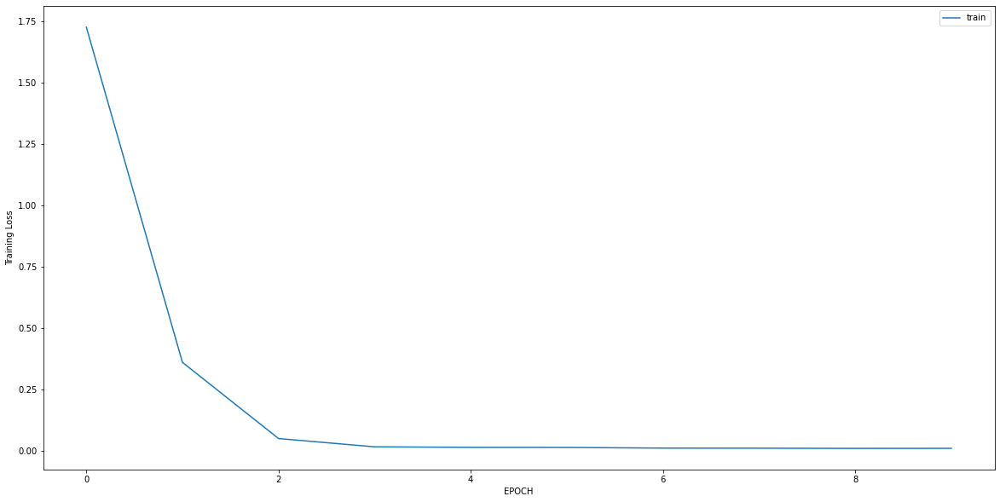

Epoch 1/10
4/4 [==============================] - 0s 4ms/step - loss: 1.1050 - accuracy: 0.2959
Epoch 2/10
4/4 [==============================] - 0s 4ms/step - loss: 1.0503 - accuracy: 0.3265
Epoch 3/10
4/4 [==============================] - 0s 4ms/step - loss: 0.9143 - accuracy: 0.4184
Epoch 4/10
4/4 [==============================] - 0s 4ms/step - loss: 0.7917 - accuracy: 0.5102
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7256 - accuracy: 0.5918
Epoch 6/10
4/4 [==============================] - 0s 8ms/step - loss: 0.6345 - accuracy: 0.6633
Epoch 7/10
4/4 [==============================] - 0s 7ms/step - loss: 0.5859 - accuracy: 0.6633
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5833 - accuracy: 0.7551
Epoch 9/10
4/4 [==============================] - 0s 6ms/step - loss: 0.5083 - accuracy: 0.7041
Epoch 10/10
4/4 [==============================] - 0s 6ms/step - loss: 0.6050 - accuracy: 0.7755


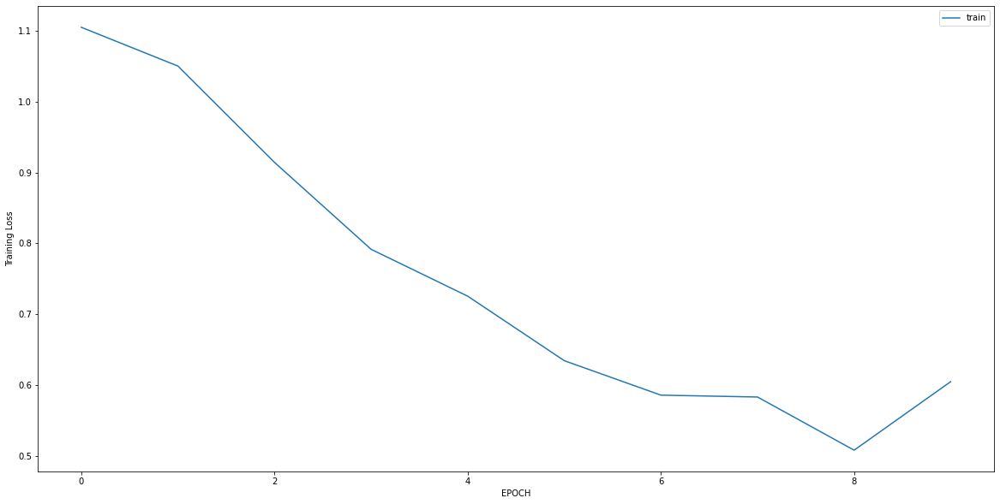

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0092 - accuracy: 1.0000


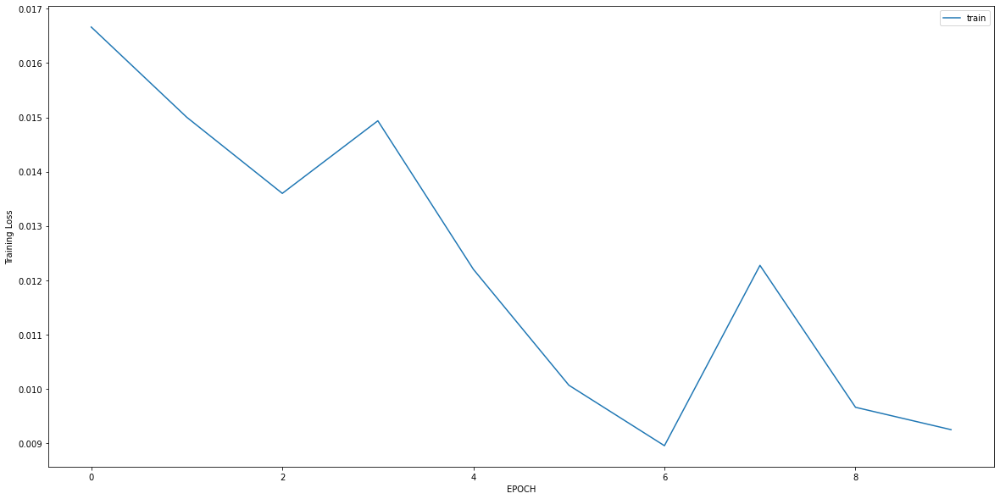

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.7620 - accuracy: 0.7978
Epoch 2/10
9/9 [==============================] - 0s 7ms/step - loss: 0.5244 - accuracy: 0.8272
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2848 - accuracy: 0.8934
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2114 - accuracy: 0.9301
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2179 - accuracy: 0.9338
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2081 - accuracy: 0.9485
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1781 - accuracy: 0.9632
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1562 - accuracy: 0.9669
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1583 - accuracy: 0.9596
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1608 - accuracy: 0.9743


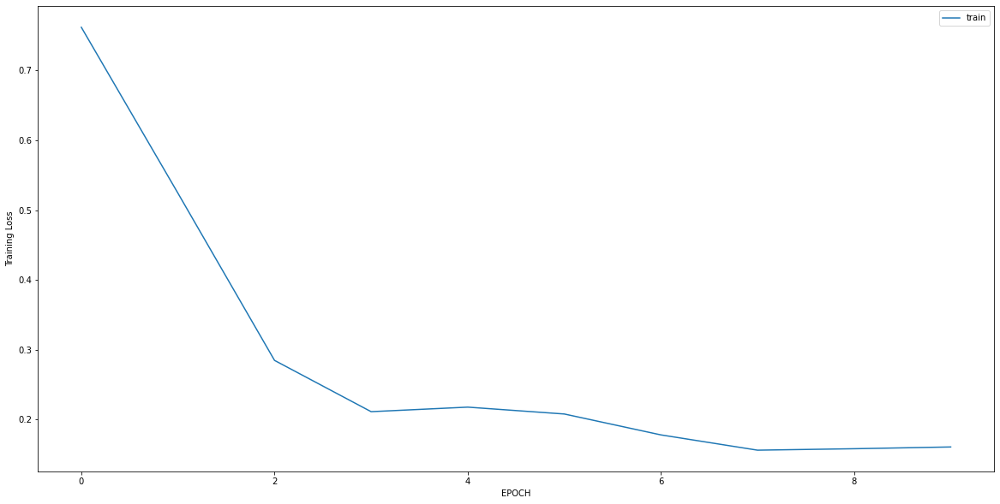

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9201 - accuracy: 0.7500
Epoch 2/10
7/7 [==============================] - 0s 4ms/step - loss: 0.6297 - accuracy: 0.7406
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4507 - accuracy: 0.7358
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4166 - accuracy: 0.7925
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3683 - accuracy: 0.7877
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3378 - accuracy: 0.8255
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3335 - accuracy: 0.8349
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2883 - accuracy: 0.8679
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2726 - accuracy: 0.8868
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2217 - accuracy: 0.9151


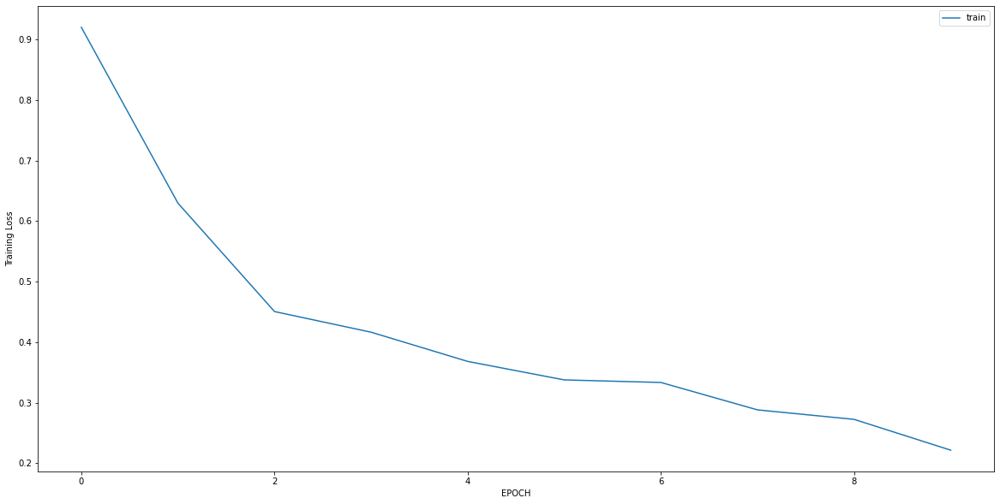

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.3460 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6030 - accuracy: 0.6667
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1463 - accuracy: 0.9923
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0695 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0500 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0247 - accuracy: 1.0000


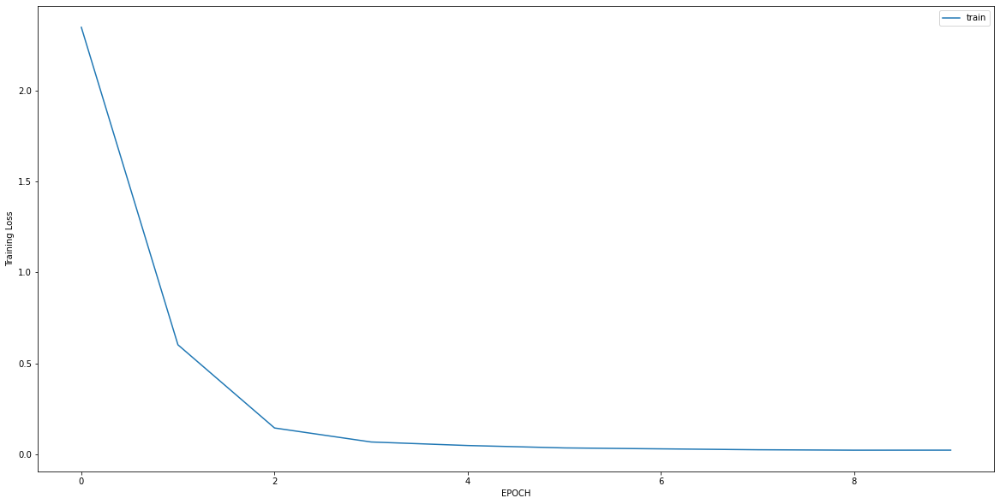

Epoch 1/10
2/2 [==============================] - 0s 6ms/step - loss: 2.3535 - accuracy: 0.0000e+00
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 2.1720 - accuracy: 0.0000e+00
Epoch 3/10
2/2 [==============================] - 0s 8ms/step - loss: 1.8672 - accuracy: 0.0000e+00
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 1.5903 - accuracy: 0.0536
Epoch 5/10
2/2 [==============================] - 0s 7ms/step - loss: 1.4355 - accuracy: 0.0179
Epoch 6/10
2/2 [==============================] - 0s 8ms/step - loss: 1.0057 - accuracy: 0.3036
Epoch 7/10
2/2 [==============================] - 0s 9ms/step - loss: 0.7166 - accuracy: 0.5536
Epoch 8/10
2/2 [==============================] - 0s 9ms/step - loss: 0.4088 - accuracy: 0.9286
Epoch 9/10
2/2 [==============================] - 0s 8ms/step - loss: 0.2573 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1994 - accuracy: 1.0000


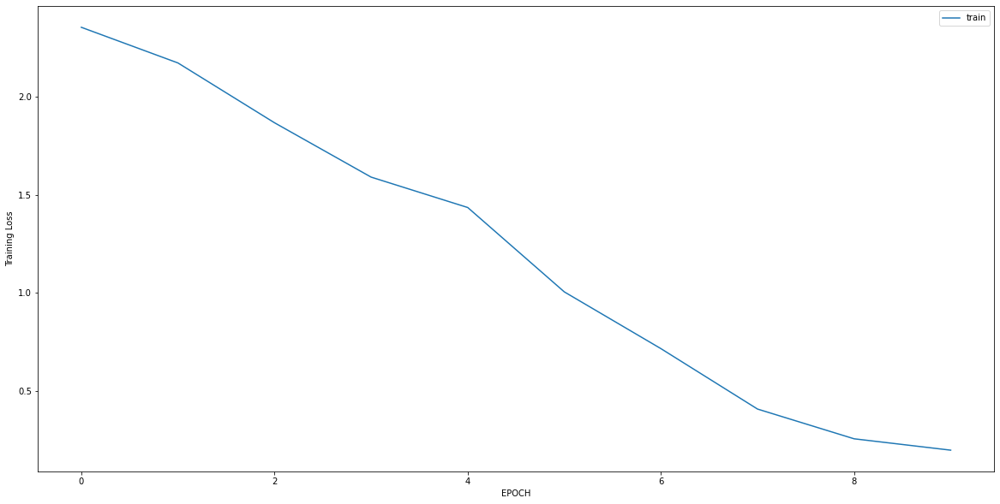

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.5401 - accuracy: 0.2163
Epoch 2/10
10/10 [==============================] - 0s 7ms/step - loss: 1.1819 - accuracy: 0.3323
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7914 - accuracy: 0.4922
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.6395
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5485 - accuracy: 0.7586
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4792 - accuracy: 0.7837
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4339 - accuracy: 0.8307
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3535 - accuracy: 0.9028
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2943 - accuracy: 0.9279
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2673 - accuracy: 0.9310


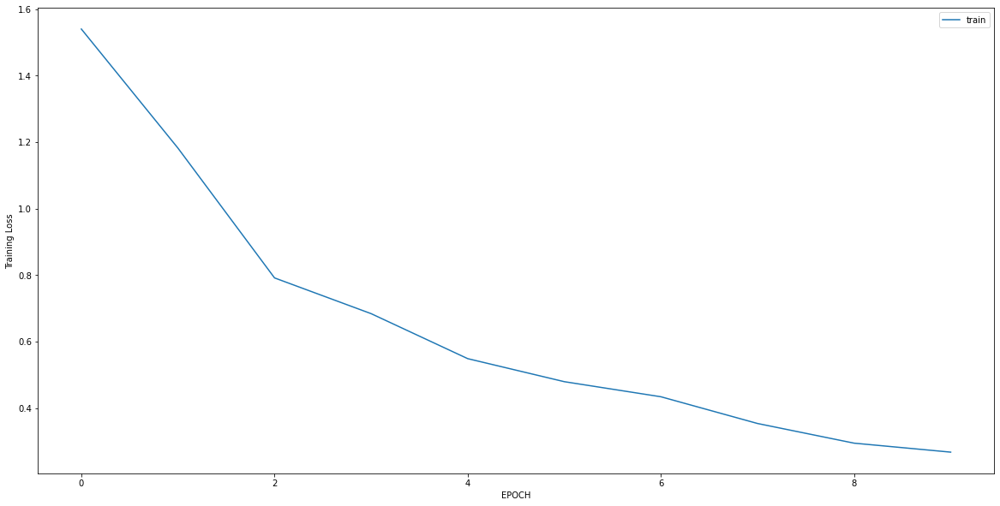

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 1.4834 - accuracy: 0.0500
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 1.2385 - accuracy: 0.1222
Epoch 3/10
6/6 [==============================] - 0s 4ms/step - loss: 0.7435 - accuracy: 0.5056
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.5264 - accuracy: 0.7556
Epoch 5/10
6/6 [==============================] - 0s 6ms/step - loss: 0.3766 - accuracy: 0.9222
Epoch 6/10
6/6 [==============================] - 0s 6ms/step - loss: 0.2560 - accuracy: 0.9778
Epoch 7/10
6/6 [==============================] - 0s 6ms/step - loss: 0.2016 - accuracy: 0.9944
Epoch 8/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1741 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1292 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1029 - accuracy: 1.0000


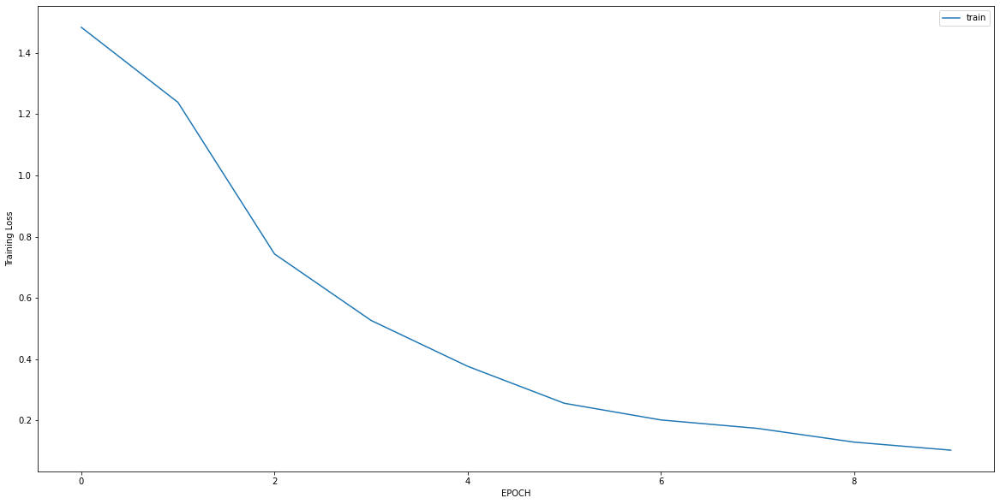

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.9944 - accuracy: 0.5786
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8094 - accuracy: 0.6509
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6626 - accuracy: 0.7327
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4497 - accuracy: 0.8113
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3256 - accuracy: 0.8774
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2483 - accuracy: 0.9371
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1952 - accuracy: 0.9686
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1634 - accuracy: 0.9748
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1541 - accuracy: 0.9843
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1305 - accuracy: 0.9906


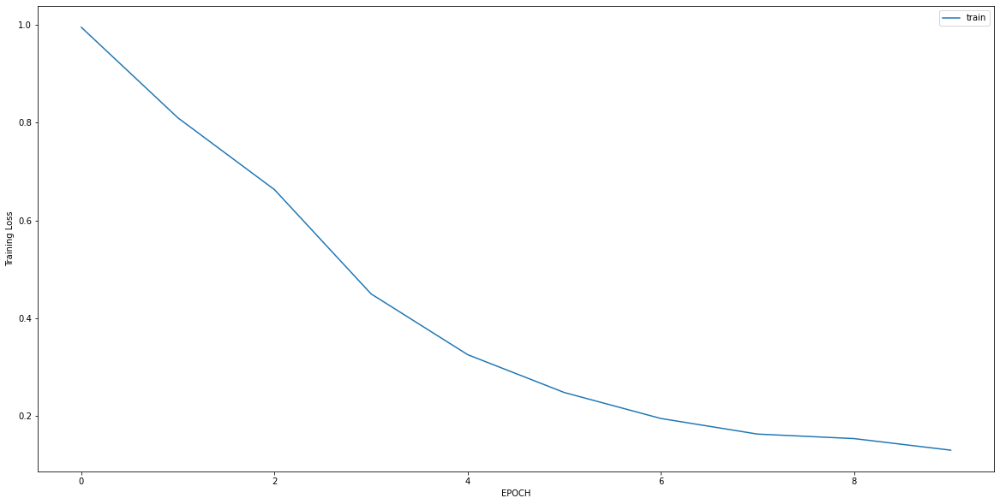

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1391 - accuracy: 0.4788
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5114 - accuracy: 0.7034
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3192 - accuracy: 0.9025
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3087 - accuracy: 0.9068
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2843 - accuracy: 0.8898
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2784 - accuracy: 0.9322
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2625 - accuracy: 0.9280
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2443 - accuracy: 0.9449
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2322 - accuracy: 0.9407
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2290 - accuracy: 0.9280


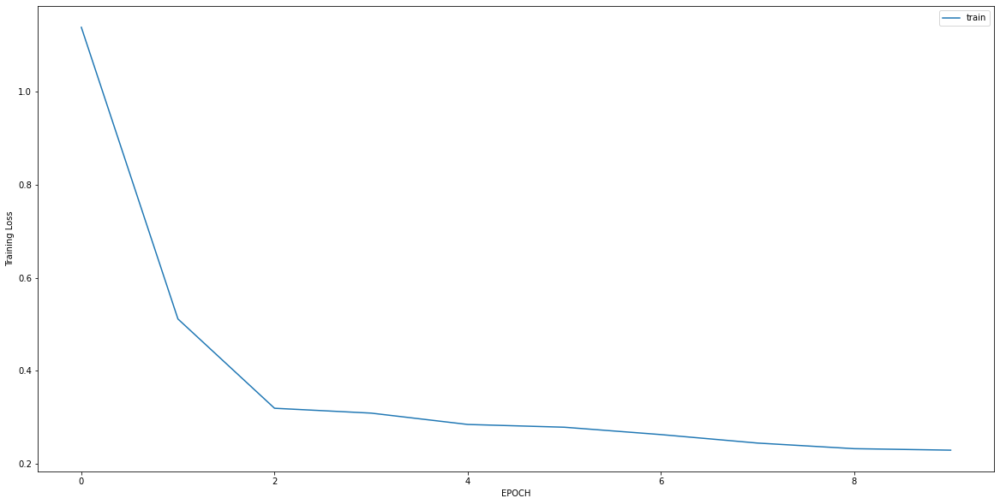

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5363 - accuracy: 0.8057
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3374 - accuracy: 0.8462
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2846 - accuracy: 0.8907
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2453 - accuracy: 0.9150
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2112 - accuracy: 0.9433
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1957 - accuracy: 0.9393
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1862 - accuracy: 0.9474
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1669 - accuracy: 0.9717
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1325 - accuracy: 0.9798
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1350 - accuracy: 0.9676


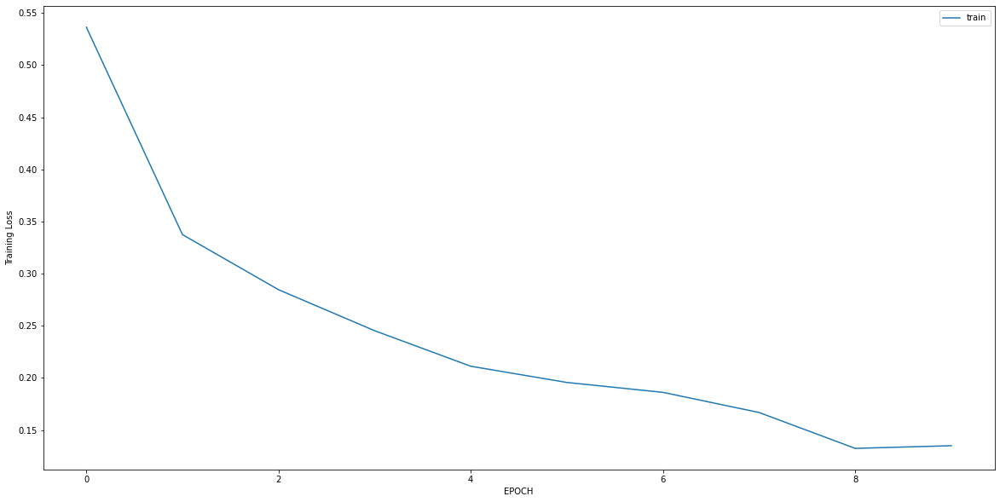

Epoch 1/10
14/14 [==============================] - 0s 6ms/step - loss: 0.4409 - accuracy: 0.7968
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3146 - accuracy: 0.8623
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2391 - accuracy: 0.9165
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1912 - accuracy: 0.9481
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1927 - accuracy: 0.9436
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1499 - accuracy: 0.9729
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1364 - accuracy: 0.9752
Epoch 8/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1313 - accuracy: 0.9752
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1126 - accuracy: 0.9819
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1095 - accuracy: 0.9819


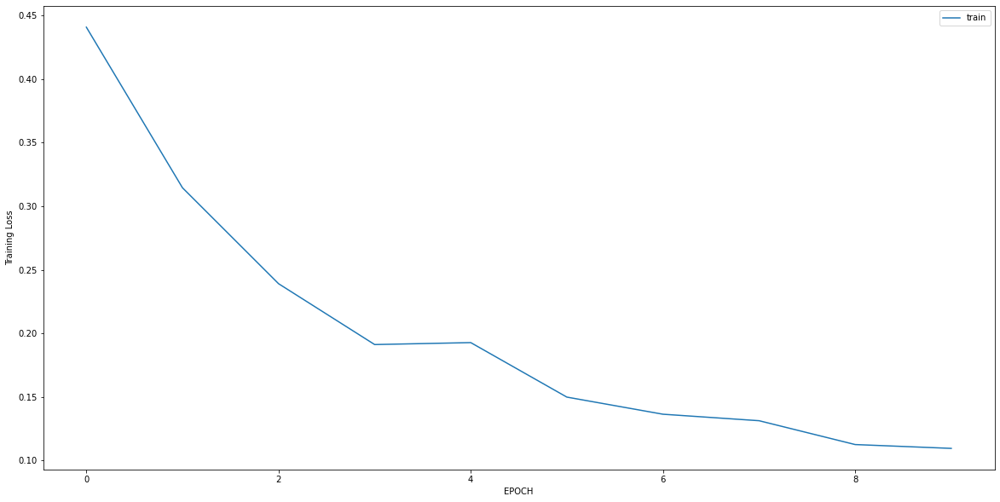

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.7933 - accuracy: 0.5228
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5589 - accuracy: 0.5228
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2262 - accuracy: 0.5228
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8795 - accuracy: 0.5228
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7408 - accuracy: 0.5333
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6576 - accuracy: 0.5860
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5922 - accuracy: 0.6912
Epoch 8/10
9/9 [==============================] - 0s 7ms/step - loss: 0.5677 - accuracy: 0.7088
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5423 - accuracy: 0.7579
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.5161 - accuracy: 0.7789


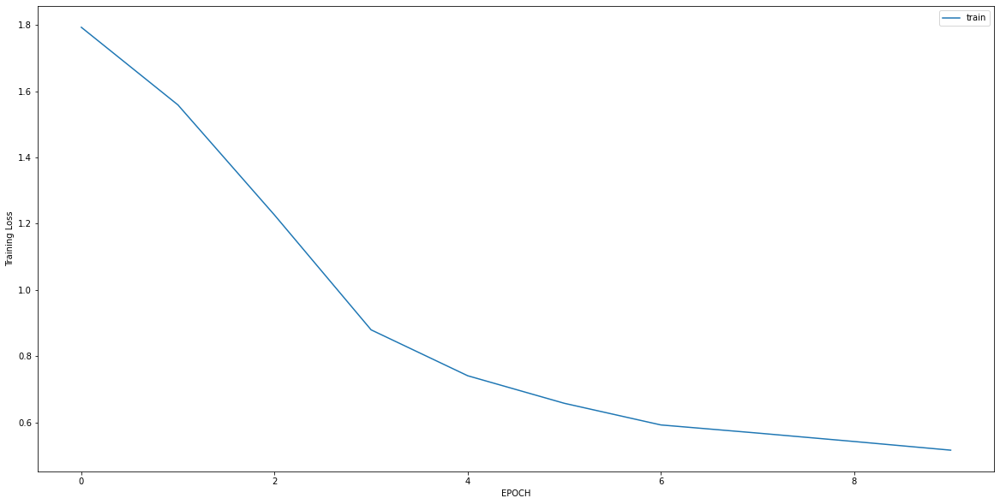

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3816 - accuracy: 0.8770
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2685 - accuracy: 0.9206
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2263 - accuracy: 0.9444
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2037 - accuracy: 0.9444
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1972 - accuracy: 0.9563
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1635 - accuracy: 0.9722
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1556 - accuracy: 0.9643
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1486 - accuracy: 0.9841
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1323 - accuracy: 0.9841
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1397 - accuracy: 0.9881


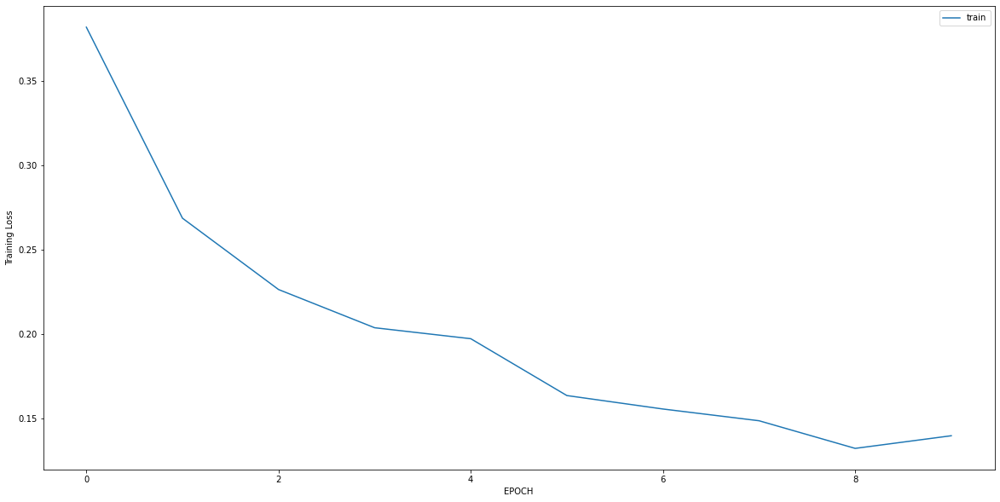

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5029 - accuracy: 0.4030
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0983 - accuracy: 0.4366
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9824 - accuracy: 0.4142
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7864 - accuracy: 0.5448
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.6157
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6432 - accuracy: 0.6418
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6019 - accuracy: 0.6679
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5818 - accuracy: 0.6791
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5224 - accuracy: 0.7276
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4958 - accuracy: 0.7575


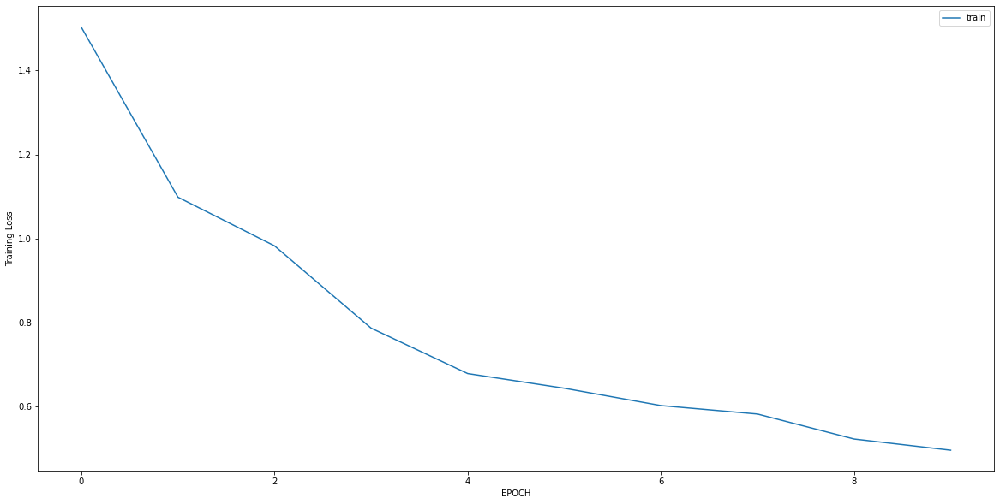

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6192 - accuracy: 0.6612
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3932 - accuracy: 0.9143
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2428 - accuracy: 0.9959
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1153 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0792 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0592 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0516 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0481 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0312 - accuracy: 1.0000


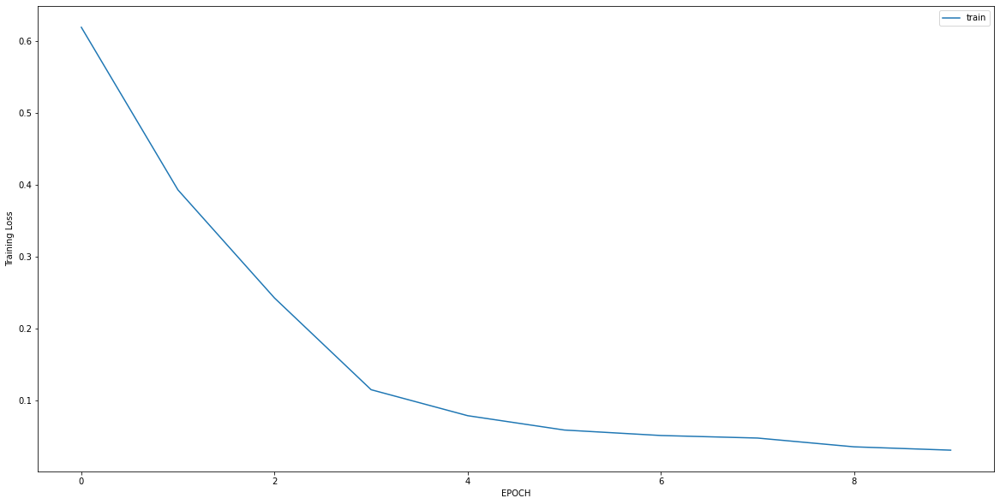

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1749 - accuracy: 0.9964
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1367 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0936 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0766 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0670 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0515 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0357 - accuracy: 1.0000


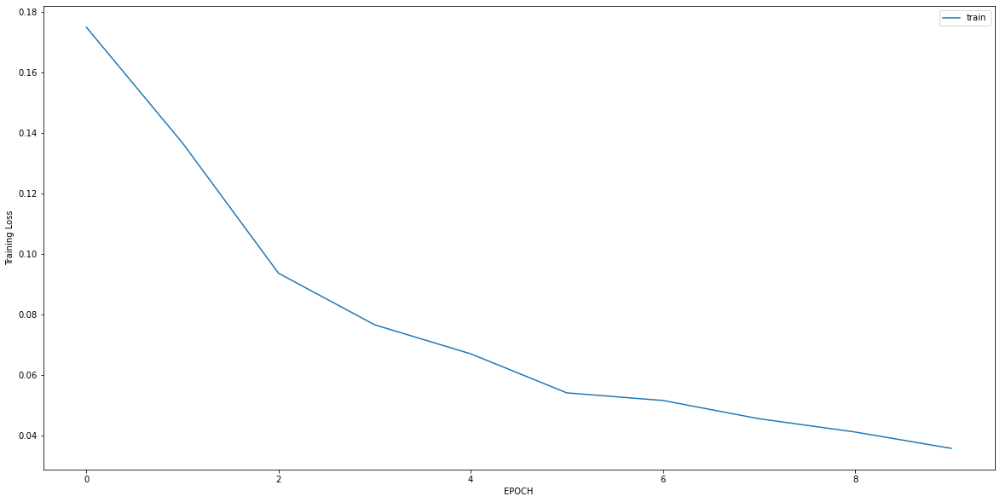

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0178 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0116 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0130 - accuracy: 1.0000


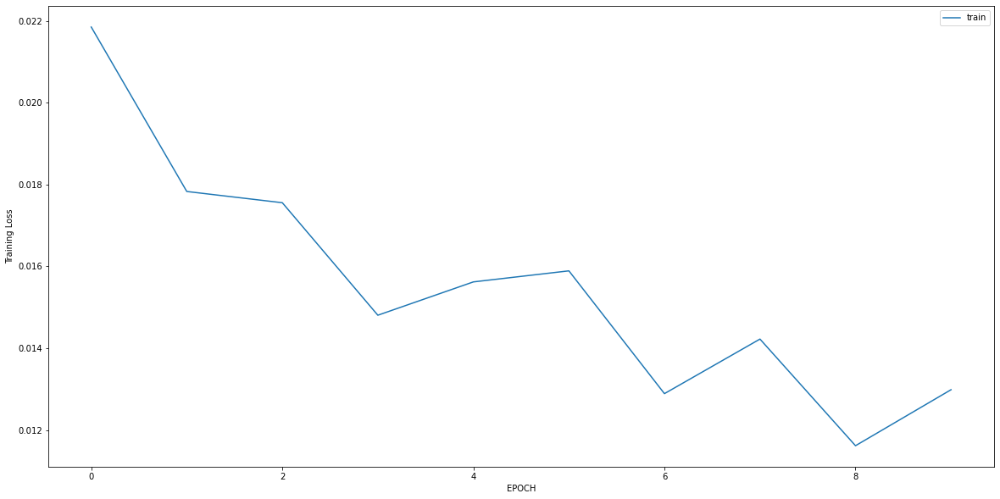

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.0938 - accuracy: 0.4484
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6689 - accuracy: 0.4484
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1534 - accuracy: 0.4555
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8348 - accuracy: 0.5125
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6011 - accuracy: 0.6512
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.4474 - accuracy: 0.8043
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4006 - accuracy: 0.8683
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3375 - accuracy: 0.9075
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3194 - accuracy: 0.9146
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2687 - accuracy: 0.9395


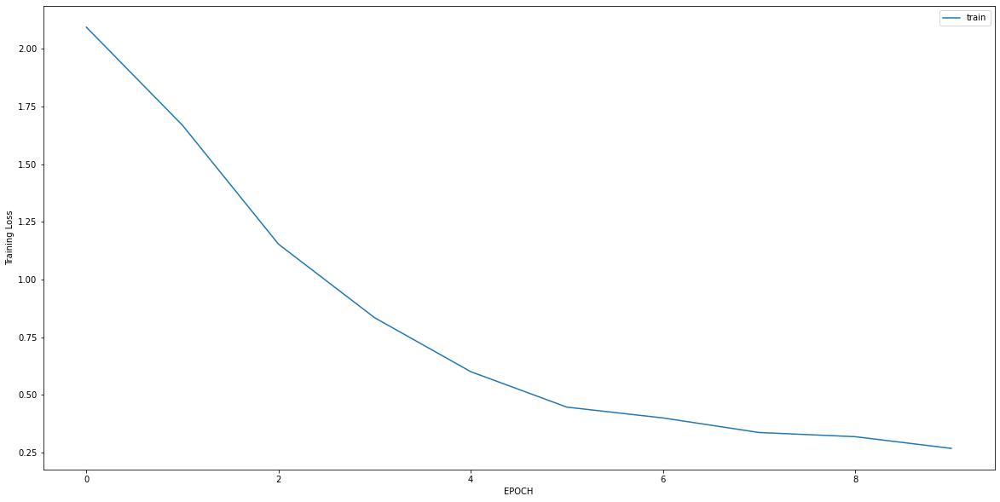

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5400 - accuracy: 0.7940
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4766 - accuracy: 0.7978
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3985 - accuracy: 0.8390
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3775 - accuracy: 0.8689
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3492 - accuracy: 0.8876
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3603 - accuracy: 0.8577
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3227 - accuracy: 0.8989
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3078 - accuracy: 0.8914
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2920 - accuracy: 0.9064
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2869 - accuracy: 0.9101


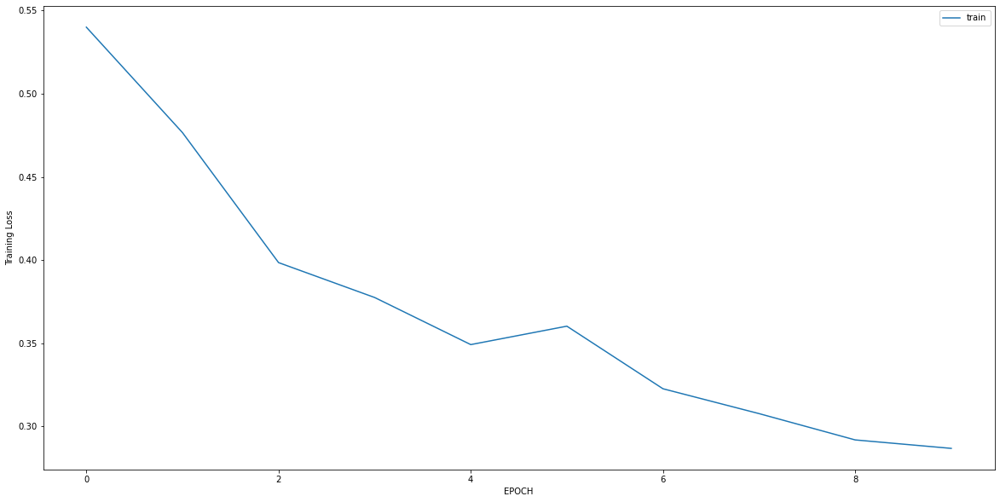

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9273 - accuracy: 0.6284
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2549 - accuracy: 0.9732
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2082 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1585 - accuracy: 0.9923
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0970 - accuracy: 0.9962
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0552 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 8ms/step - loss: 0.0463 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0469 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 1.0000


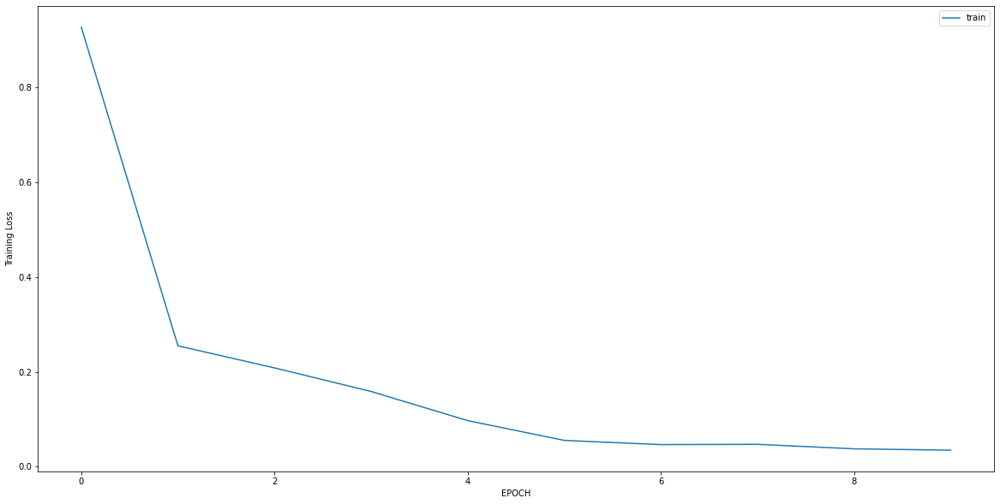

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0899 - accuracy: 0.6852
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0288 - accuracy: 0.6963
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8281 - accuracy: 0.7222
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7876 - accuracy: 0.7333
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6752 - accuracy: 0.7444
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5634 - accuracy: 0.7778
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5585 - accuracy: 0.7889
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4681 - accuracy: 0.8222
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3959 - accuracy: 0.8444
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3156 - accuracy: 0.9037


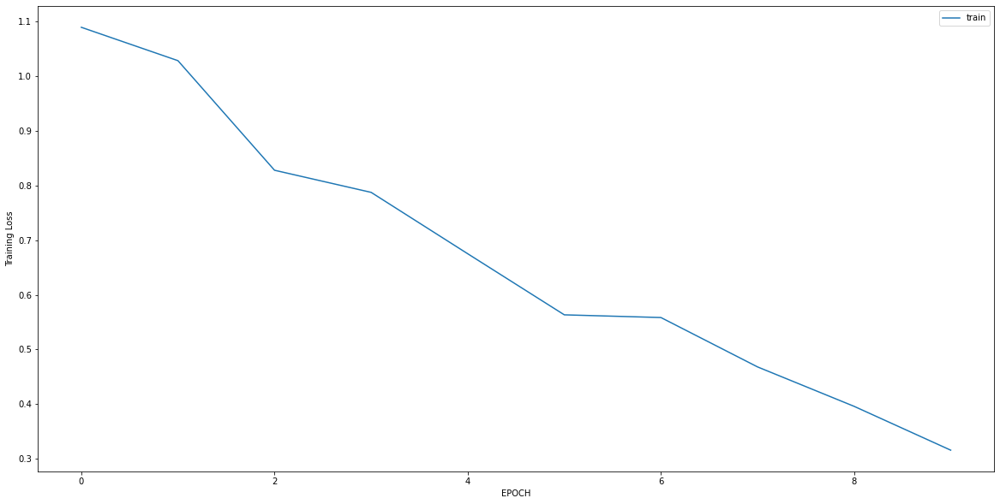

Epoch 1/10
9/9 [==============================] - 0s 8ms/step - loss: 0.4790 - accuracy: 0.7378
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3699 - accuracy: 0.8252
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3313 - accuracy: 0.8846
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2810 - accuracy: 0.9196
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2917 - accuracy: 0.9301
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2529 - accuracy: 0.9301
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2584 - accuracy: 0.9371
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2833 - accuracy: 0.9301
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2334 - accuracy: 0.9336
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2467 - accuracy: 0.9336


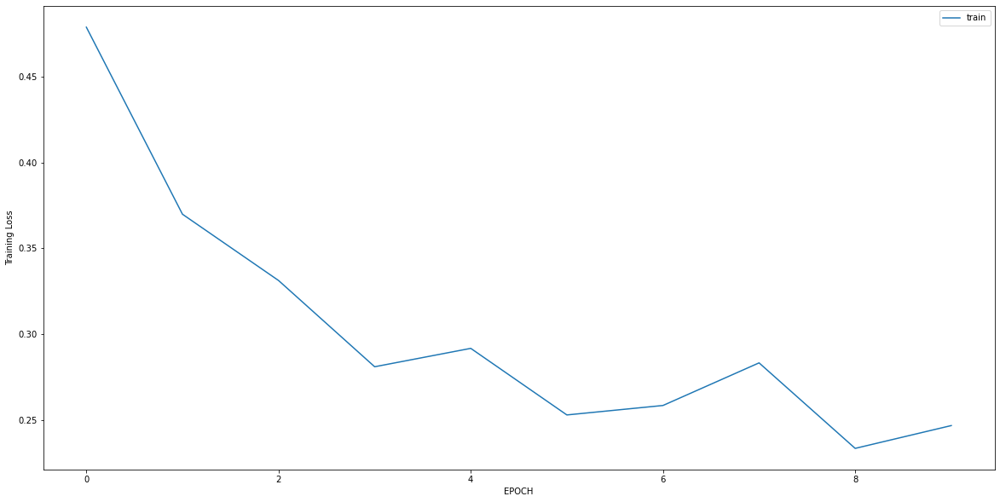

Epoch 1/10
5/5 [==============================] - 0s 8ms/step - loss: 0.8130 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7820 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7621 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6094 - accuracy: 0.7222
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.4167 - accuracy: 0.8403
Epoch 6/10
5/5 [==============================] - 0s 8ms/step - loss: 0.3168 - accuracy: 0.9167
Epoch 7/10
5/5 [==============================] - 0s 6ms/step - loss: 0.3022 - accuracy: 0.9167
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2767 - accuracy: 0.9514
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2386 - accuracy: 0.9653
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3713 - accuracy: 0.8472


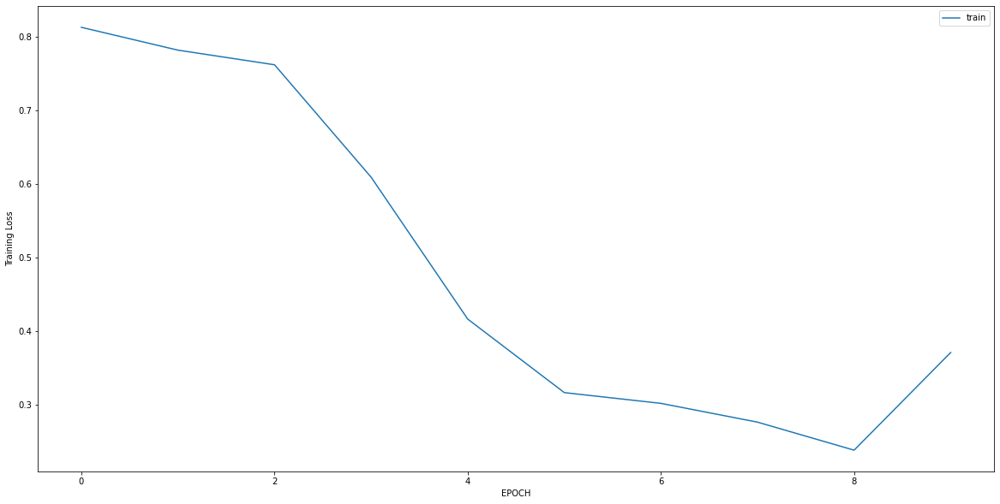

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 1.3551 - accuracy: 0.4725
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 1.2986 - accuracy: 0.4725
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 1.1664 - accuracy: 0.5046
Epoch 4/10
7/7 [==============================] - 0s 6ms/step - loss: 1.0204 - accuracy: 0.5275
Epoch 5/10
7/7 [==============================] - 0s 7ms/step - loss: 0.9123 - accuracy: 0.5367
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8120 - accuracy: 0.5505
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7657 - accuracy: 0.5596
Epoch 8/10
7/7 [==============================] - 0s 7ms/step - loss: 0.7257 - accuracy: 0.5596
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7087 - accuracy: 0.5642
Epoch 10/10
7/7 [==============================] - 0s 7ms/step - loss: 0.6531 - accuracy: 0.6147


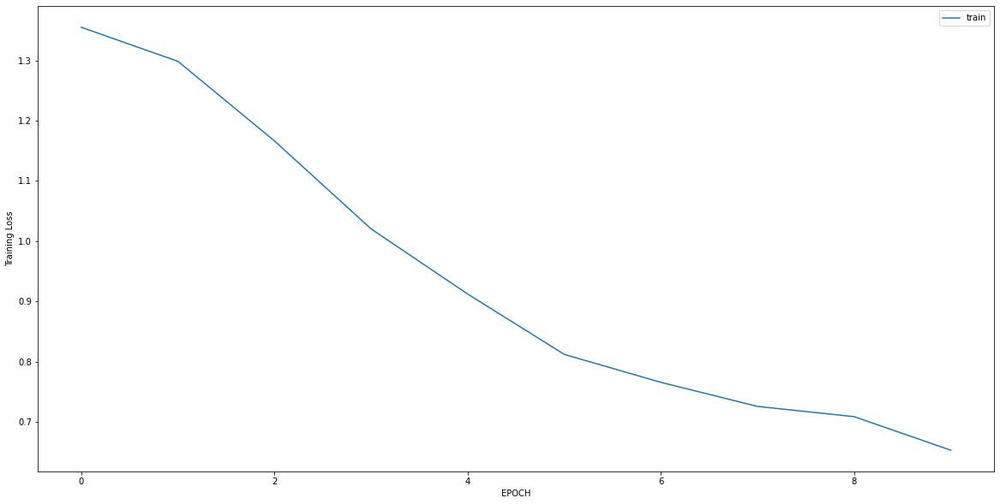

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4600 - accuracy: 0.8221
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4471 - accuracy: 0.8063
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4153 - accuracy: 0.8538
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4397 - accuracy: 0.8458
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4817 - accuracy: 0.7628
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4373 - accuracy: 0.7905
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4198 - accuracy: 0.8696
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4143 - accuracy: 0.8775
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3991 - accuracy: 0.8419
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3707 - accuracy: 0.8814


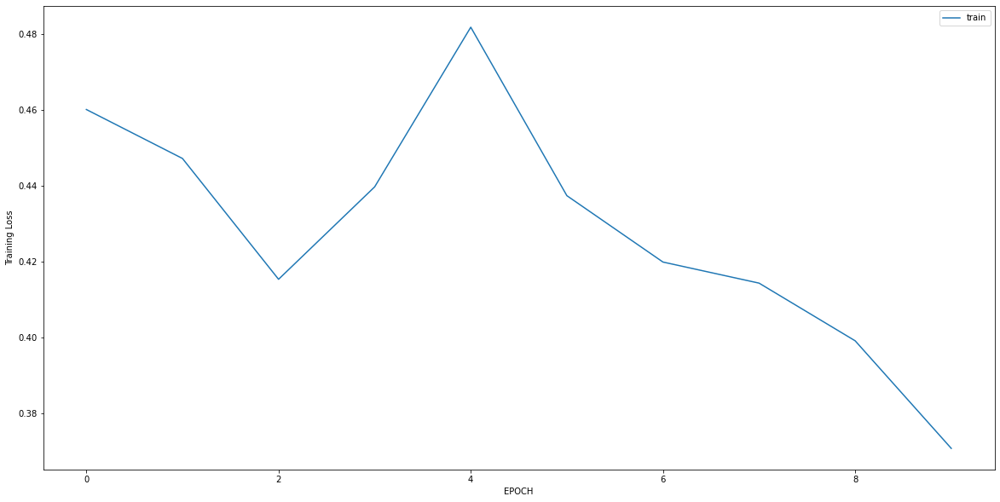

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8605 - accuracy: 0.4116
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 0.6616 - accuracy: 0.5451
Epoch 3/10
9/9 [==============================] - 0s 8ms/step - loss: 0.4787 - accuracy: 0.8448
Epoch 4/10
9/9 [==============================] - 0s 9ms/step - loss: 0.4525 - accuracy: 0.8267
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3952 - accuracy: 0.8845
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3844 - accuracy: 0.8881
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3837 - accuracy: 0.8881
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3443 - accuracy: 0.9061
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3389 - accuracy: 0.9061
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3187 - accuracy: 0.9170


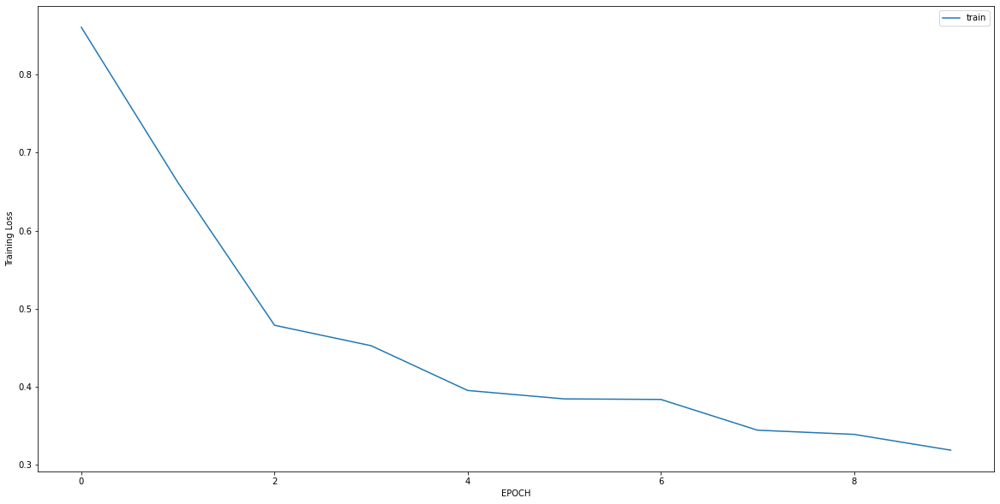

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.4538 - accuracy: 0.7794
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3664 - accuracy: 0.8363
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2808 - accuracy: 0.9253
Epoch 4/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2476 - accuracy: 0.9502
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2297 - accuracy: 0.9609
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2267 - accuracy: 0.9609
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2455 - accuracy: 0.9431
Epoch 8/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1950 - accuracy: 0.9680
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1926 - accuracy: 0.9680
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1877 - accuracy: 0.9715


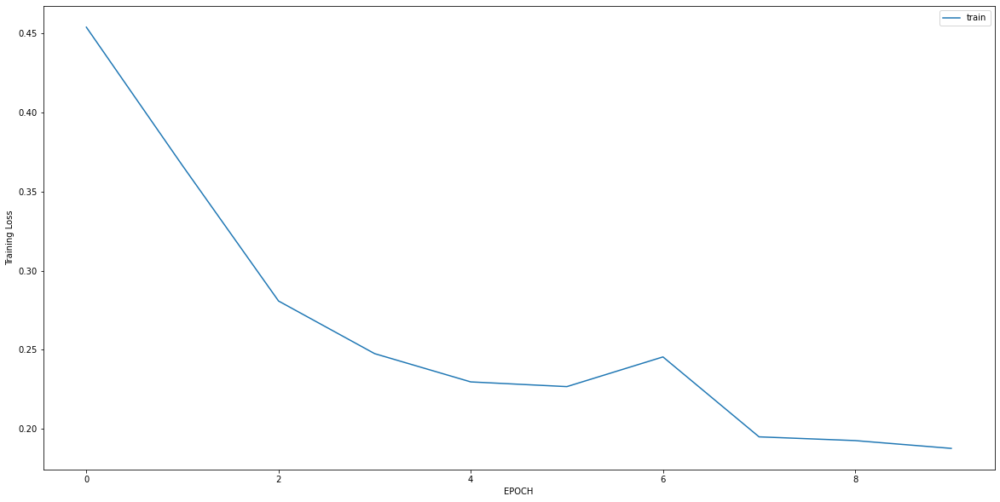

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9107 - accuracy: 0.6806
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8871 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8841 - accuracy: 0.6806
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7418 - accuracy: 0.6806
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6995 - accuracy: 0.6806
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6453 - accuracy: 0.6736
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6706 - accuracy: 0.6736
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5733 - accuracy: 0.6667
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5680 - accuracy: 0.6736
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4672 - accuracy: 0.7778


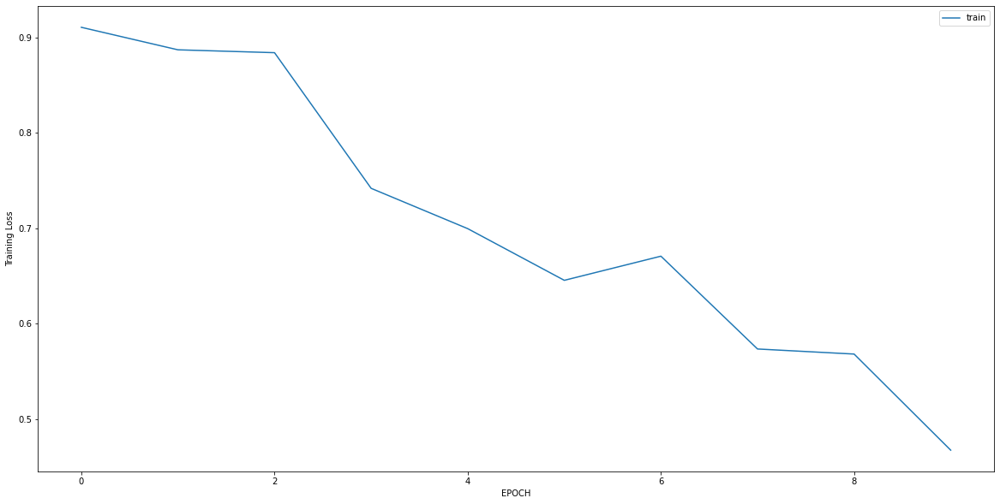

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5308 - accuracy: 0.7419
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3664 - accuracy: 0.8831
Epoch 3/10
8/8 [==============================] - 0s 7ms/step - loss: 0.3323 - accuracy: 0.8629
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3104 - accuracy: 0.8911
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2671 - accuracy: 0.9113
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2729 - accuracy: 0.9395
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2333 - accuracy: 0.9234
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2015 - accuracy: 0.9435
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1924 - accuracy: 0.9637
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1653 - accuracy: 0.9718


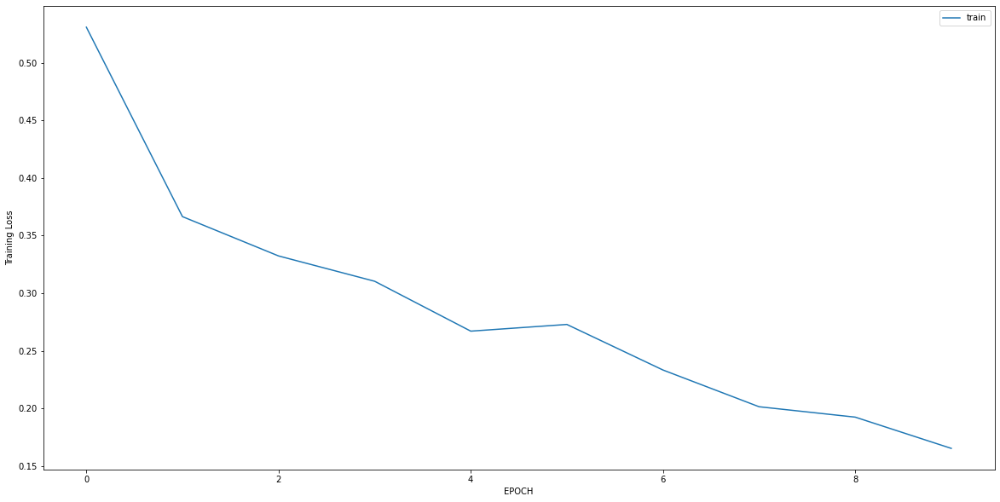

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2702 - accuracy: 0.9016
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2750 - accuracy: 0.9262
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2321 - accuracy: 0.9344
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2038 - accuracy: 0.9344
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1917 - accuracy: 0.9385
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1852 - accuracy: 0.9467
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1709 - accuracy: 0.9508
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1812 - accuracy: 0.9508
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1717 - accuracy: 0.9508
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1917 - accuracy: 0.9221


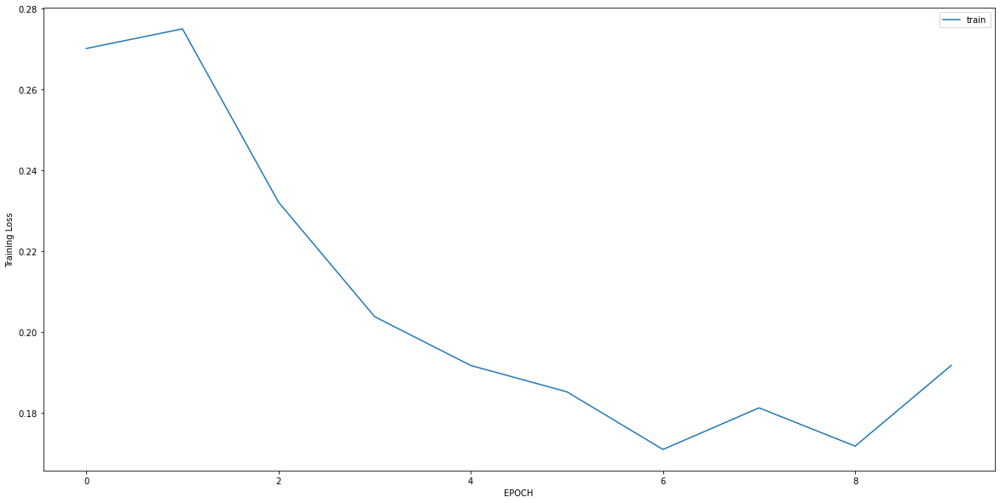

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6601 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6243 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6240 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5873 - accuracy: 0.8228
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5272 - accuracy: 0.8228
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4919 - accuracy: 0.8228
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4275 - accuracy: 0.8228
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4555 - accuracy: 0.8228
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4008 - accuracy: 0.8354
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4050 - accuracy: 0.8186


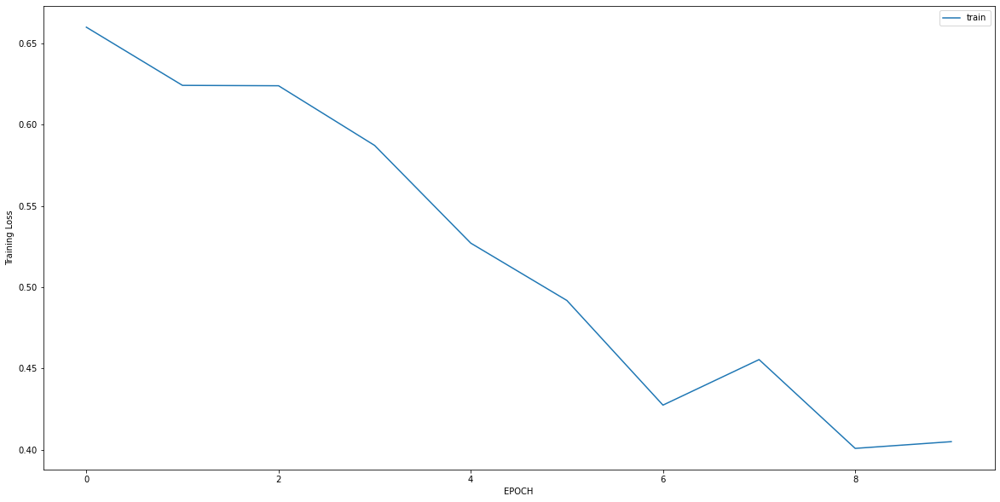

Epoch 1/10
12/12 [==============================] - 0s 4ms/step - loss: 1.3025 - accuracy: 0.2231
Epoch 2/10
12/12 [==============================] - 0s 6ms/step - loss: 0.2354 - accuracy: 0.9948
Epoch 3/10
12/12 [==============================] - 0s 5ms/step - loss: 0.1177 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0606 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0527 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0486 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 1.0000


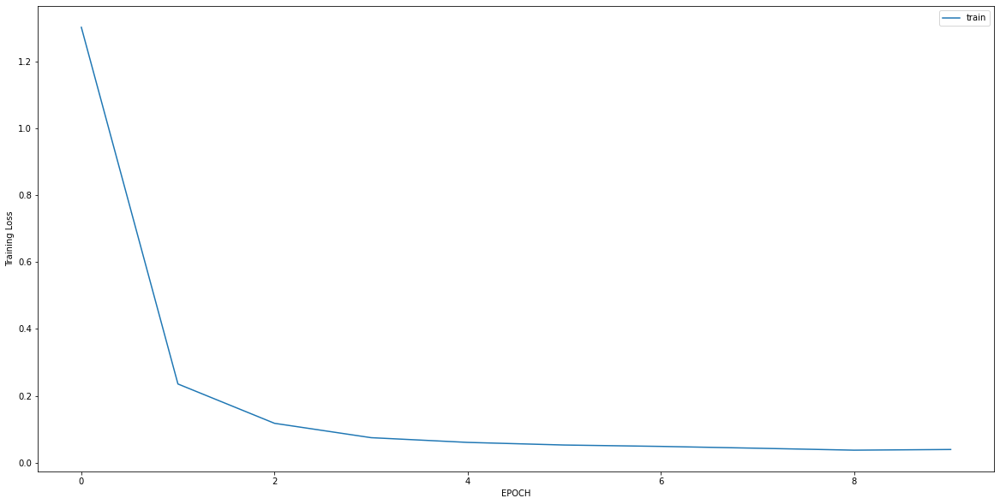

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0301 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0277 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0231 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0237 - accuracy: 1.0000


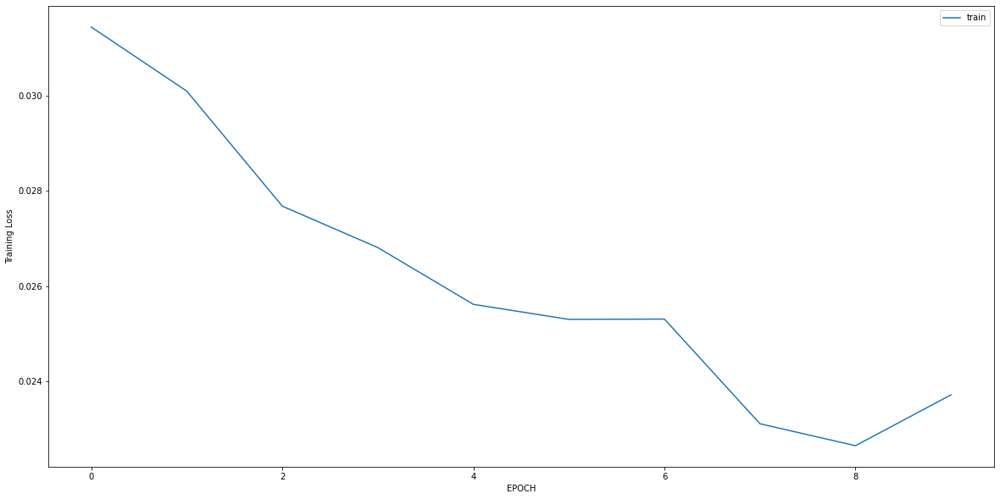

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0200 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0199 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0162 - accuracy: 1.0000


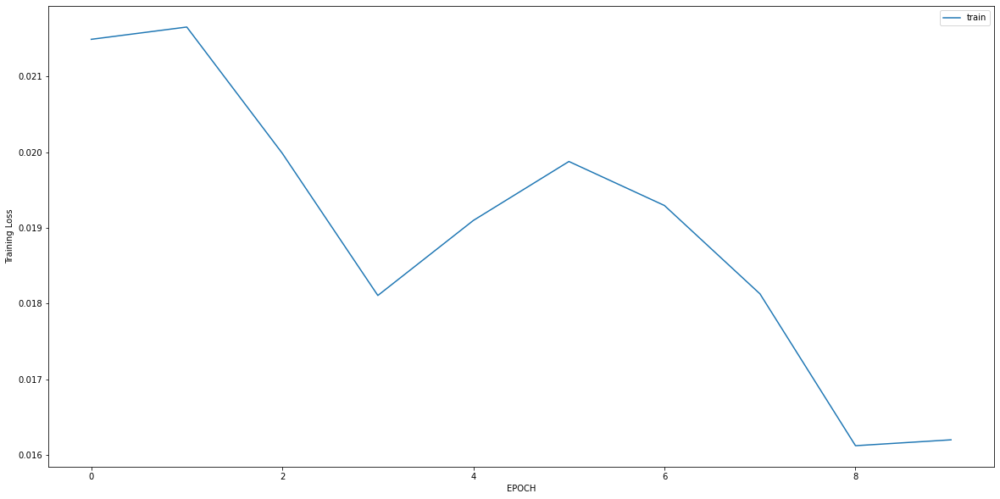

Epoch 1/10
10/10 [==============================] - 0s 9ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0092 - accuracy: 1.0000


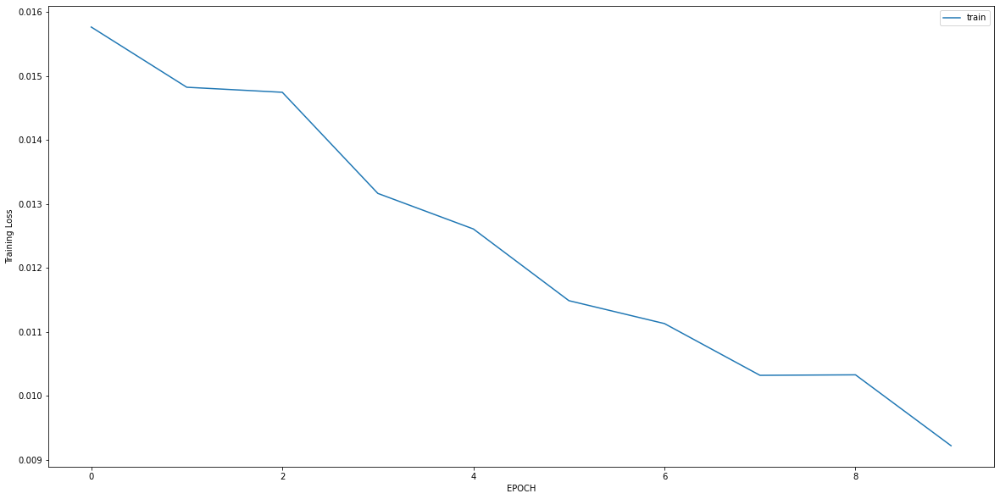

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.4317 - accuracy: 0.5655
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 1.1479 - accuracy: 0.5897
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7917 - accuracy: 0.6414
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4946 - accuracy: 0.7345
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3401 - accuracy: 0.8586
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2904 - accuracy: 0.8966
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2331 - accuracy: 0.9379
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2250 - accuracy: 0.9517
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2130 - accuracy: 0.9552
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2061 - accuracy: 0.9414


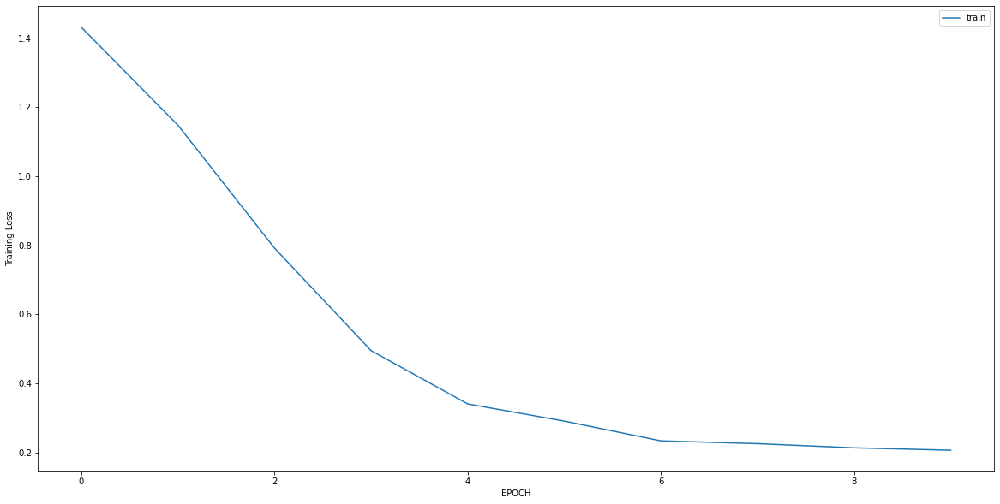

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4078 - accuracy: 0.8701
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0719 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0322 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0296 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 1.0000


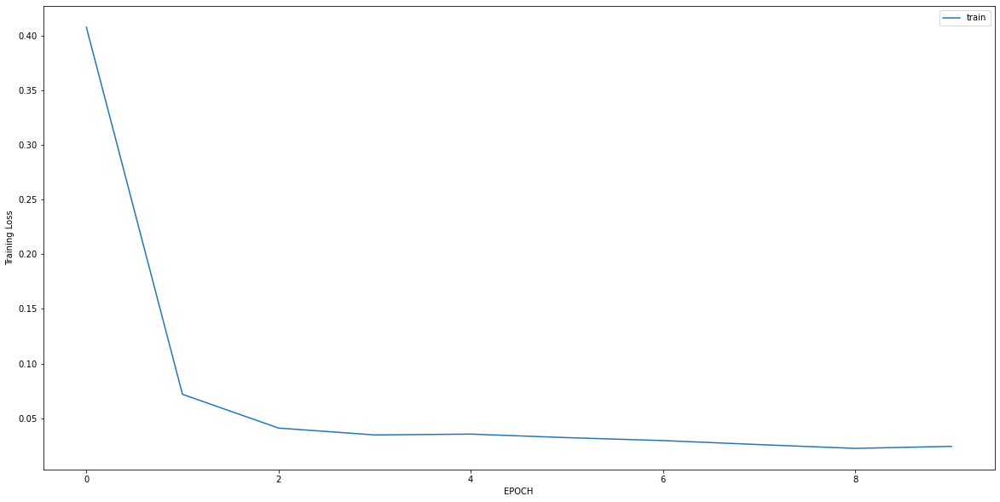

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4018 - accuracy: 0.8775
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3763 - accuracy: 0.8576
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3437 - accuracy: 0.8642
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3293 - accuracy: 0.8609
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3176 - accuracy: 0.8709
Epoch 6/10
10/10 [==============================] - 0s 7ms/step - loss: 0.3063 - accuracy: 0.8874
Epoch 7/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2929 - accuracy: 0.8808
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2997 - accuracy: 0.8907
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3059 - accuracy: 0.8642
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2985 - accuracy: 0.8775


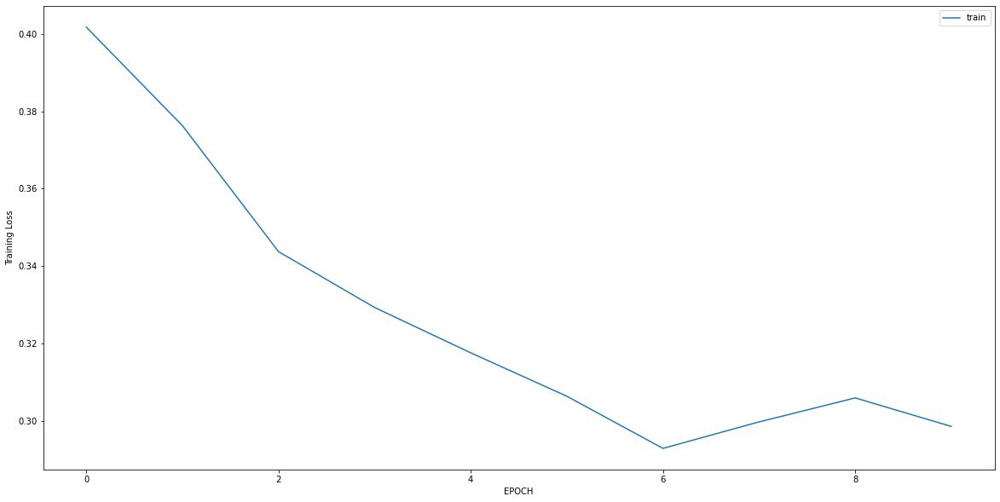

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 1.8111 - accuracy: 0.3453
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.5472 - accuracy: 0.3453
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.2020 - accuracy: 0.3885
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5130 - accuracy: 0.7266
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5071 - accuracy: 0.7050
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5376 - accuracy: 0.6835
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3951 - accuracy: 0.7842
Epoch 8/10
5/5 [==============================] - 0s 7ms/step - loss: 0.3366 - accuracy: 0.8849
Epoch 9/10
5/5 [==============================] - 0s 7ms/step - loss: 0.3428 - accuracy: 0.8849
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1911 - accuracy: 0.9928


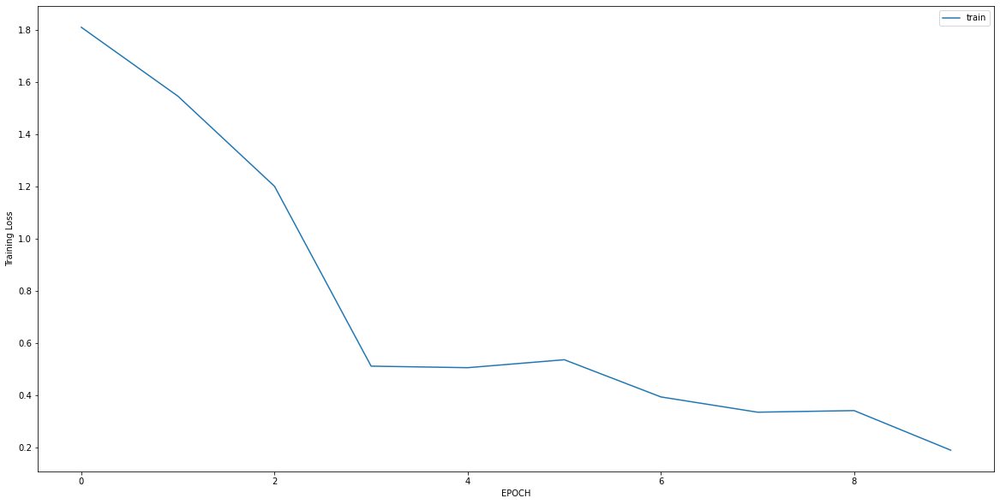

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2664 - accuracy: 0.8671
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2553 - accuracy: 0.9272
Epoch 3/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2066 - accuracy: 0.9241
Epoch 4/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1863 - accuracy: 0.9399
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1491 - accuracy: 0.9589
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1866 - accuracy: 0.9272
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1714 - accuracy: 0.9304
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2042 - accuracy: 0.9335
Epoch 9/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2095 - accuracy: 0.8924
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2282 - accuracy: 0.9272


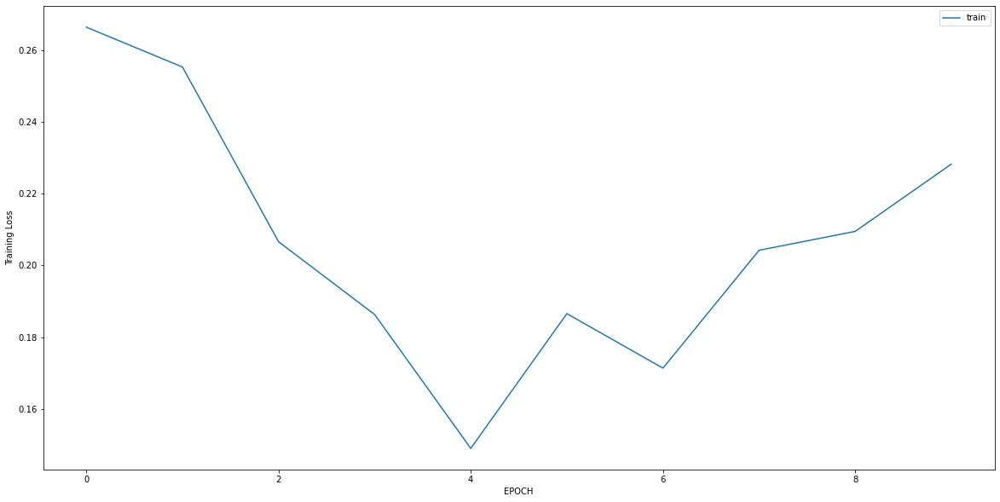

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.3510 - accuracy: 0.8696
Epoch 2/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2616 - accuracy: 0.9051
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2664 - accuracy: 0.8972
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2142 - accuracy: 0.9170
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2153 - accuracy: 0.9091
Epoch 6/10
8/8 [==============================] - 0s 7ms/step - loss: 0.1819 - accuracy: 0.9328
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1671 - accuracy: 0.9407
Epoch 8/10
8/8 [==============================] - 0s 9ms/step - loss: 0.1575 - accuracy: 0.9486
Epoch 9/10
8/8 [==============================] - 0s 7ms/step - loss: 0.1277 - accuracy: 0.9526
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1012 - accuracy: 0.9684


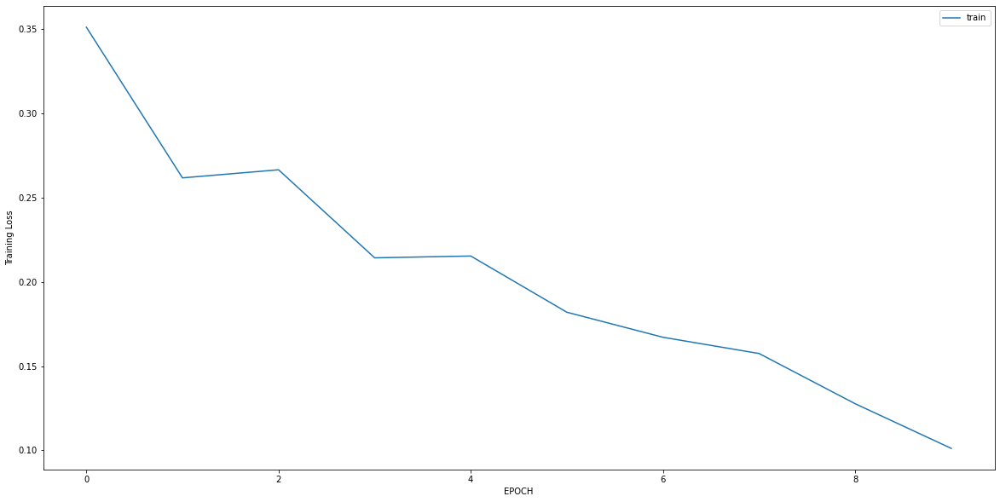

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 3.0630 - accuracy: 0.0000e+00
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5794 - accuracy: 0.7063
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0056 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0044 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0031 - accuracy: 1.0000


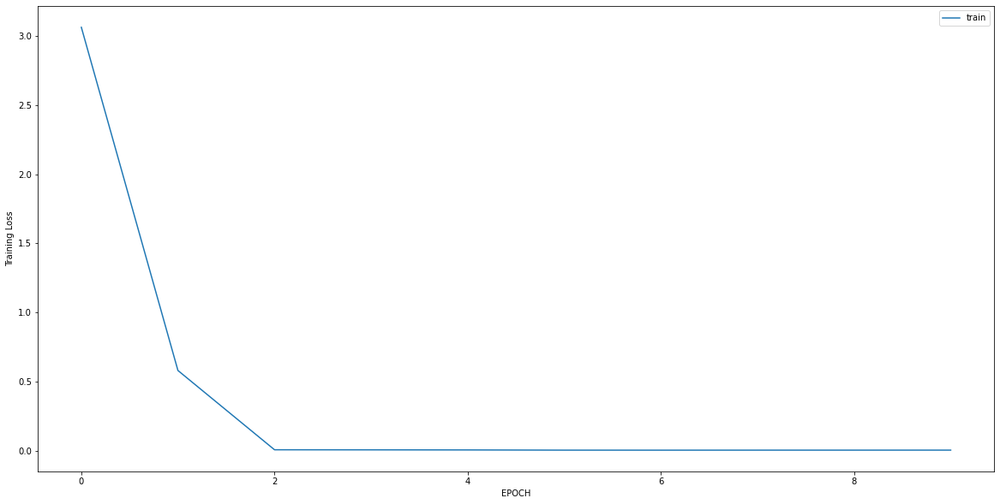

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.1135 - accuracy: 0.7526
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7276 - accuracy: 0.8041
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3621 - accuracy: 0.8729
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2044 - accuracy: 0.9450
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1926 - accuracy: 0.9622
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1609 - accuracy: 0.9485
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1776 - accuracy: 0.9416
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1701 - accuracy: 0.9519
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1499 - accuracy: 0.9588
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1458 - accuracy: 0.9588


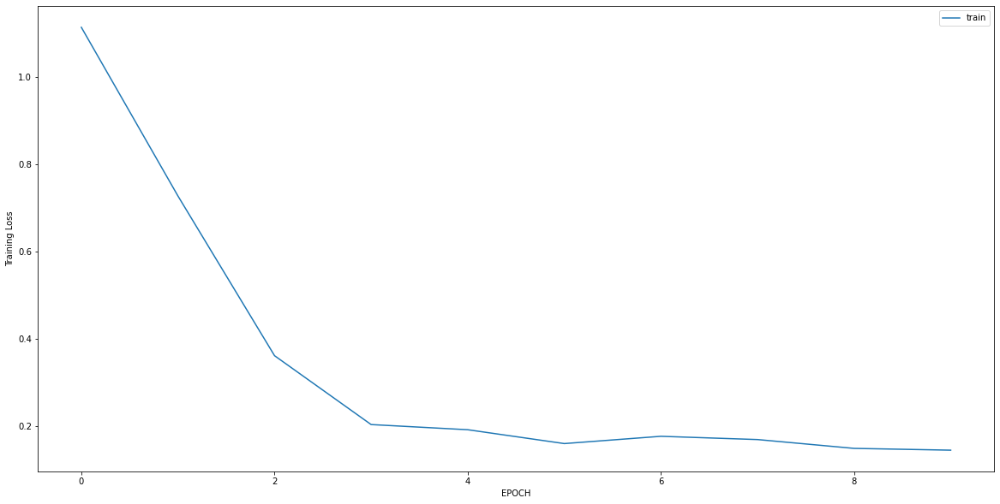

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5709 - accuracy: 0.8530
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3740 - accuracy: 0.8963
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2473 - accuracy: 0.9164
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2104 - accuracy: 0.9568
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1499 - accuracy: 0.9885
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1390 - accuracy: 0.9827
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1243 - accuracy: 0.9856
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1005 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0924 - accuracy: 0.9971
Epoch 10/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0896 - accuracy: 0.9942


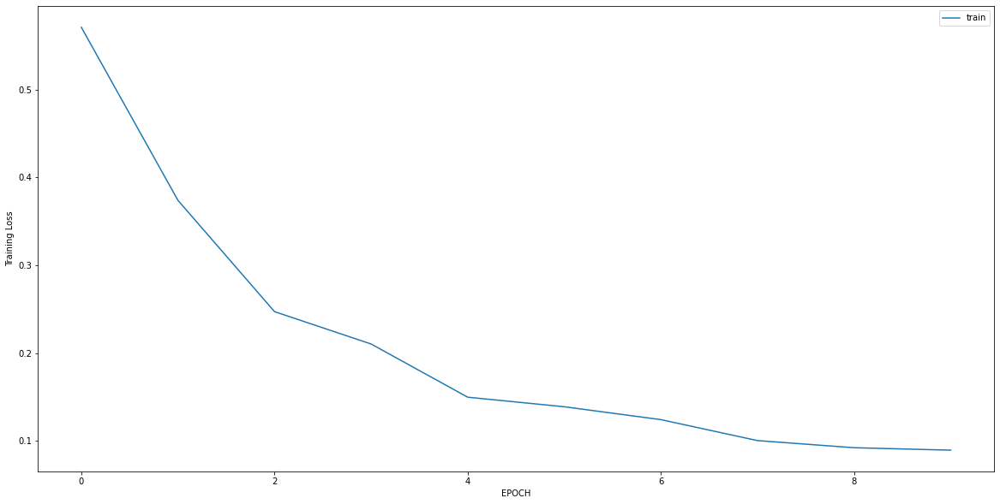

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1997 - accuracy: 0.9394
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1898 - accuracy: 0.9461
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2345 - accuracy: 0.9226
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1832 - accuracy: 0.9327
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2133 - accuracy: 0.9360
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2119 - accuracy: 0.9259
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2313 - accuracy: 0.9327
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2188 - accuracy: 0.9259
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2009 - accuracy: 0.9327
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1809 - accuracy: 0.9562


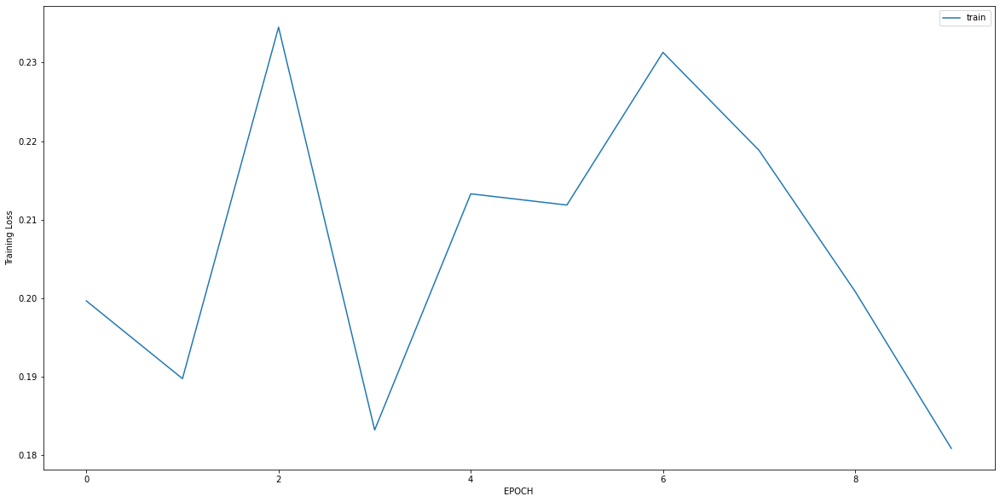

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1778 - accuracy: 0.9493
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1550 - accuracy: 0.9710
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1928 - accuracy: 0.9348
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1530 - accuracy: 0.9710
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1594 - accuracy: 0.9565
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1479 - accuracy: 0.9565
Epoch 7/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1365 - accuracy: 0.9710
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1469 - accuracy: 0.9638
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1237 - accuracy: 0.9710
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2230 - accuracy: 0.8986


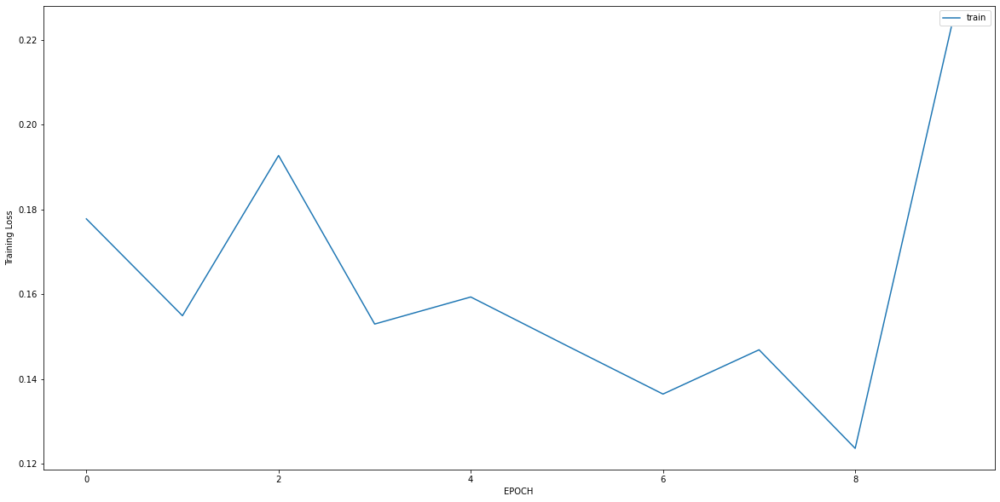

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6681 - accuracy: 0.7764
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6280 - accuracy: 0.7825
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4782 - accuracy: 0.8066
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2931 - accuracy: 0.8701
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2250 - accuracy: 0.8882
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1877 - accuracy: 0.9063
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1825 - accuracy: 0.9275
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1800 - accuracy: 0.9275
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1833 - accuracy: 0.9094
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1573 - accuracy: 0.9426


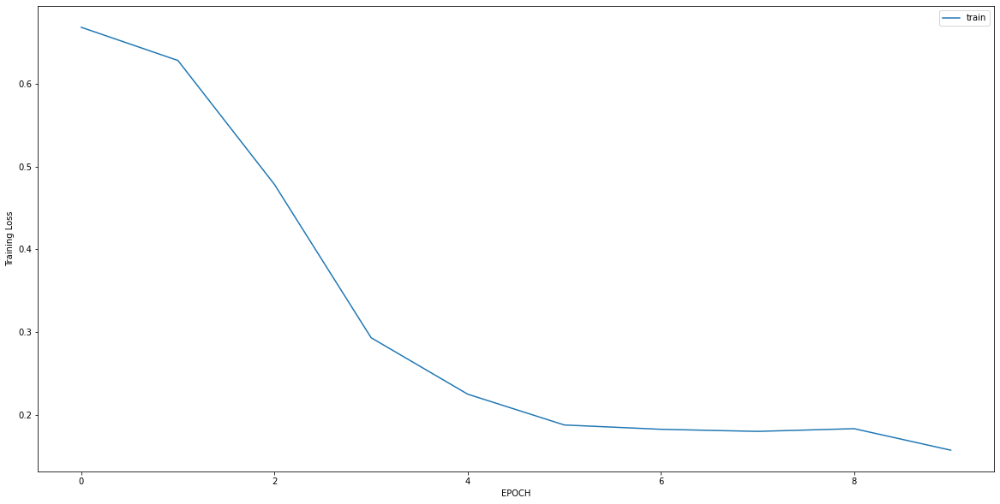

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 2.5394 - accuracy: 0.4564
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 2.0495 - accuracy: 0.4564
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5270 - accuracy: 0.4564
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0588 - accuracy: 0.4739
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7314 - accuracy: 0.5436
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6220 - accuracy: 0.6446
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5107 - accuracy: 0.7352
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4662 - accuracy: 0.7770
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3949 - accuracy: 0.8397
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3377 - accuracy: 0.8920


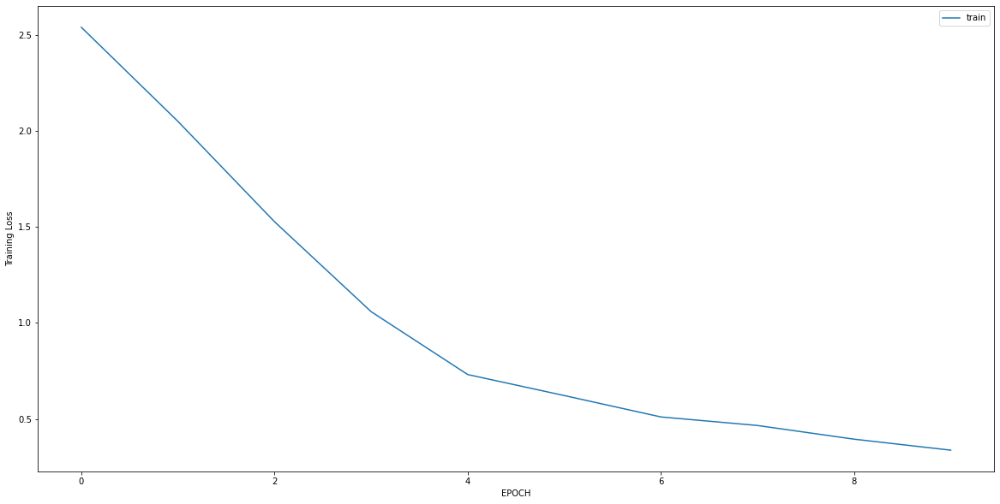

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9759 - accuracy: 0.5547
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5422 - accuracy: 0.8000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4651 - accuracy: 0.8491
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3764 - accuracy: 0.8453
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3070 - accuracy: 0.8981
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2754 - accuracy: 0.9245
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2405 - accuracy: 0.9358
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2132 - accuracy: 0.9396
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2507 - accuracy: 0.9094
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3511 - accuracy: 0.8491


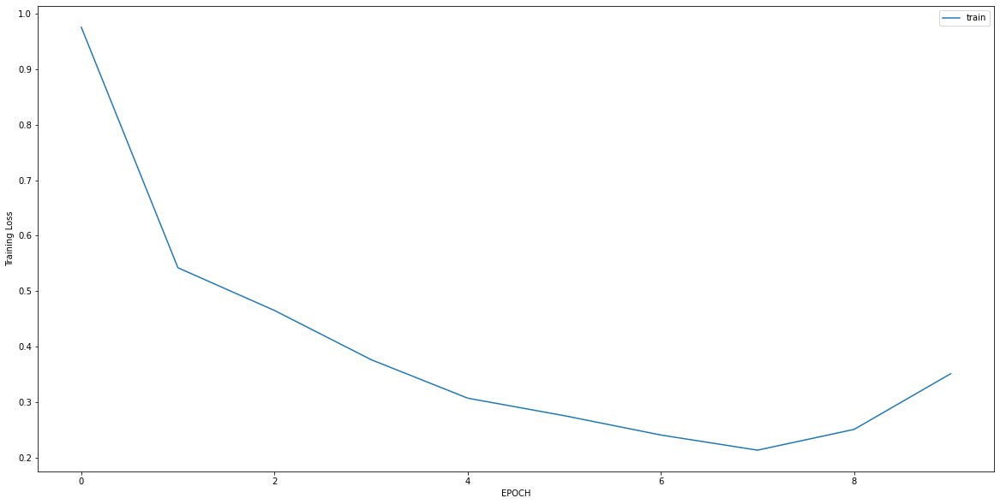

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2498 - accuracy: 0.9109
Epoch 2/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2436 - accuracy: 0.9028
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2147 - accuracy: 0.9352
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1647 - accuracy: 0.9514
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1476 - accuracy: 0.9595
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1200 - accuracy: 0.9636
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1081 - accuracy: 0.9838
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0918 - accuracy: 0.9798
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0842 - accuracy: 0.9879
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9879


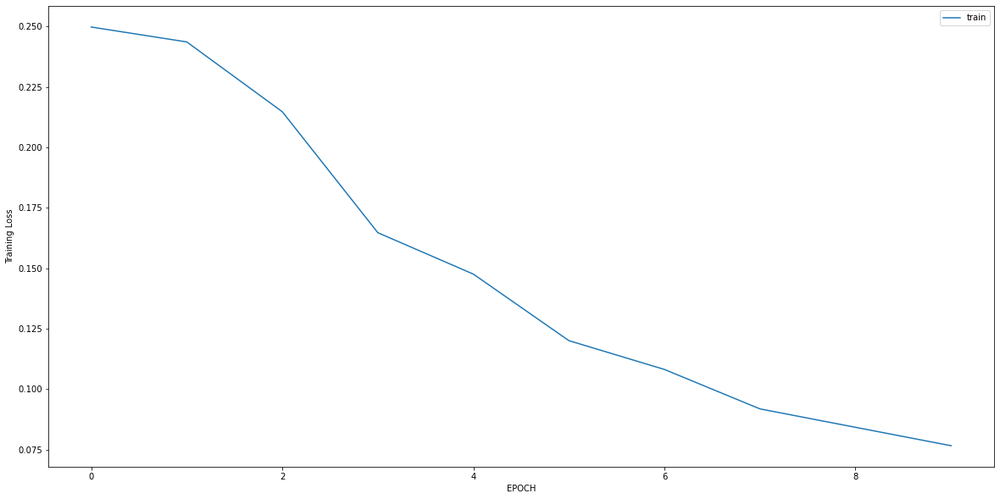

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 2.8292 - accuracy: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0106 - accuracy: 0.3707
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3869 - accuracy: 0.8537
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2148 - accuracy: 0.9694
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1247 - accuracy: 0.9932
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0946 - accuracy: 0.9966
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0714 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0677 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0533 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0497 - accuracy: 1.0000


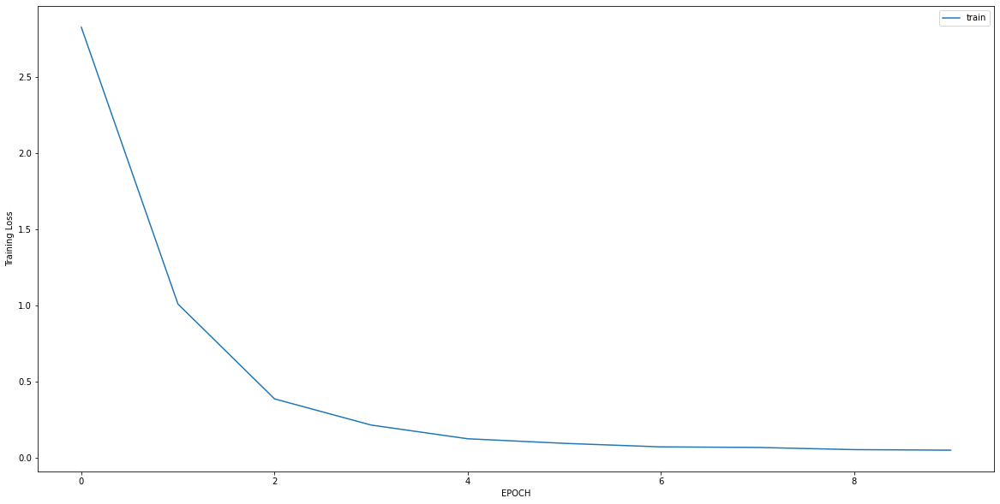

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0475 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0252 - accuracy: 1.0000


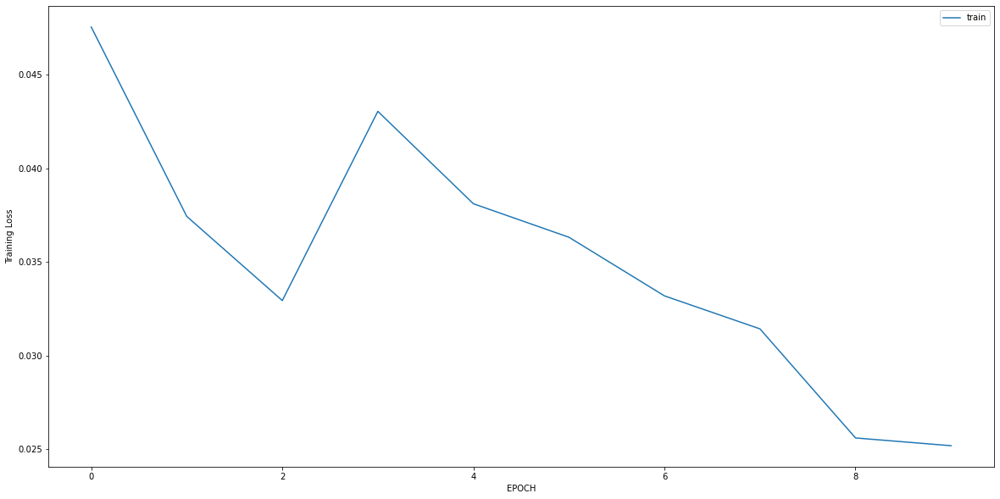

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.4589 - accuracy: 0.5322
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.1989 - accuracy: 0.5556
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9059 - accuracy: 0.5263
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.7303 - accuracy: 0.5439
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6092 - accuracy: 0.6550
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5189 - accuracy: 0.7573
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4446 - accuracy: 0.8421
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4144 - accuracy: 0.8333
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3139 - accuracy: 0.8947
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2962 - accuracy: 0.8655


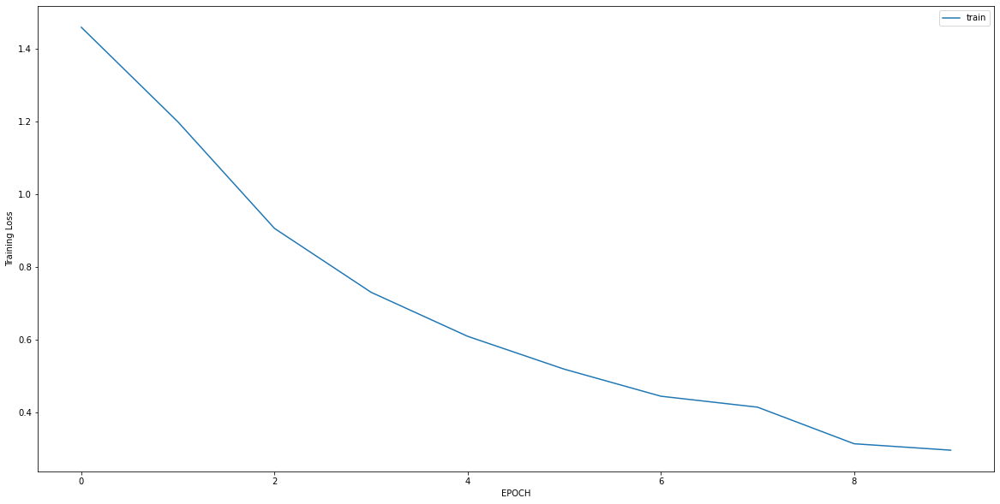

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7549 - accuracy: 0.7649
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4003 - accuracy: 0.8775
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3482 - accuracy: 0.8841
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3194 - accuracy: 0.8808
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3059 - accuracy: 0.8874
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2772 - accuracy: 0.9040
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3145 - accuracy: 0.8907
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2496 - accuracy: 0.9007
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2566 - accuracy: 0.9007
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2234 - accuracy: 0.9305


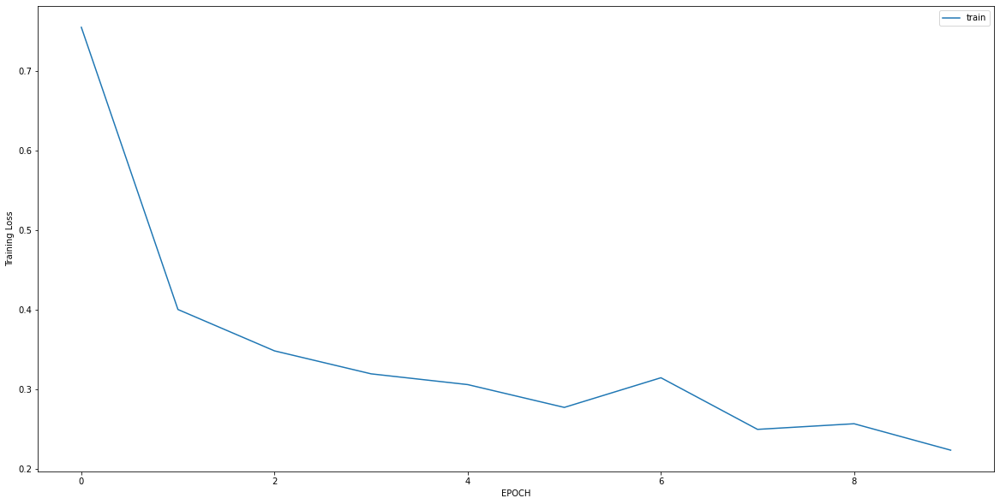

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1401 - accuracy: 0.9839
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1123 - accuracy: 0.9839
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0999 - accuracy: 0.9798
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0895 - accuracy: 0.9960
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0826 - accuracy: 0.9919
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0736 - accuracy: 0.9879
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0754 - accuracy: 0.9919
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0831 - accuracy: 0.9879
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0567 - accuracy: 0.9960
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0551 - accuracy: 0.9960


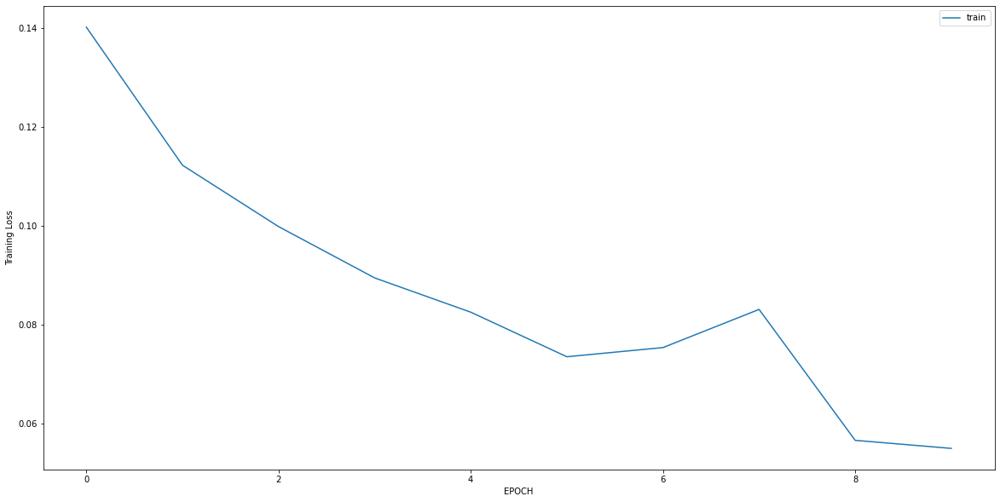

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 2.4188 - accuracy: 0.0163
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2652 - accuracy: 0.9469
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0115 - accuracy: 1.0000


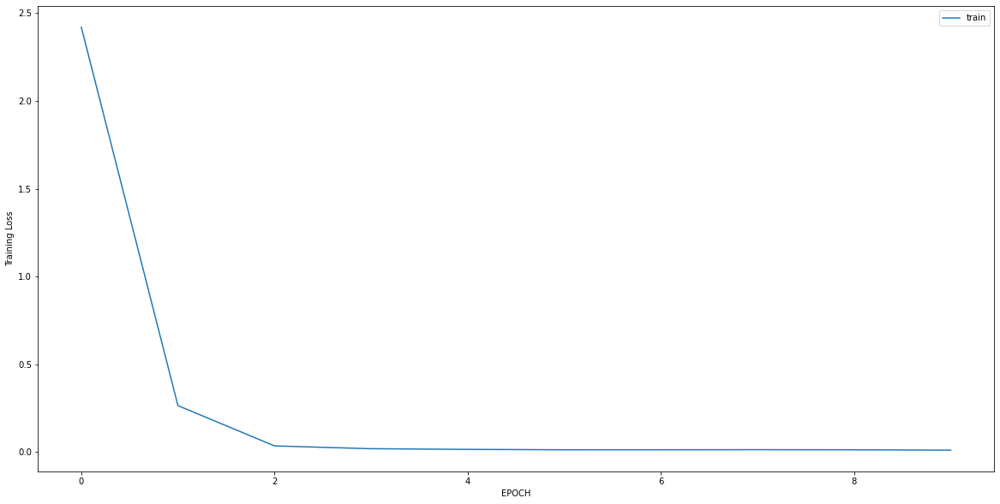

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9580 - accuracy: 0.4429
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2783 - accuracy: 0.9250
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1114 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0675 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0590 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0471 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0295 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 1.0000


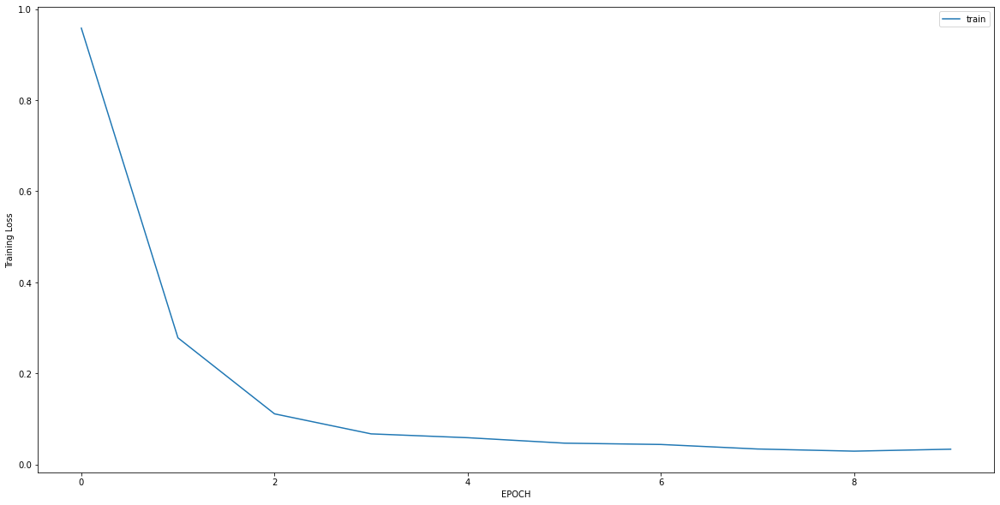

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1401 - accuracy: 0.9889
Epoch 2/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1214 - accuracy: 1.0000
Epoch 3/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0929 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0763 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0657 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0568 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0616 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0490 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 1.0000


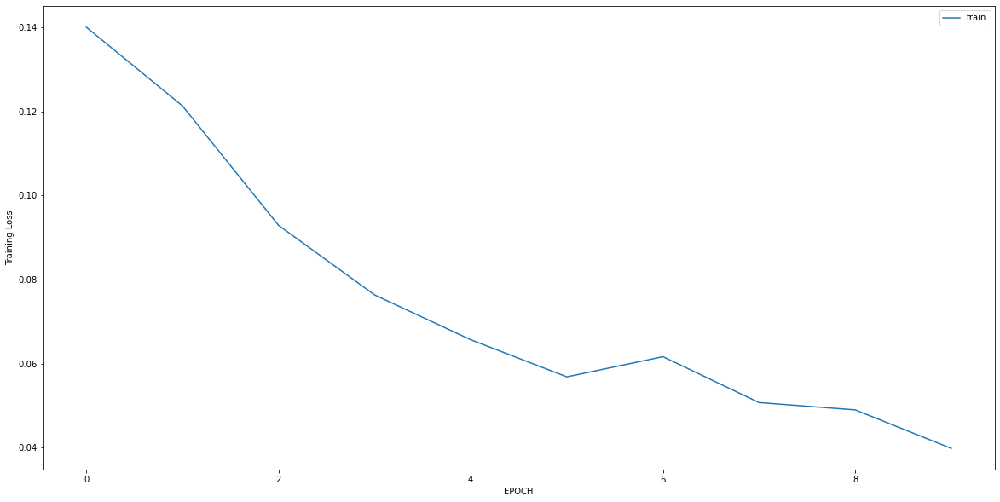

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 3.0934 - accuracy: 0.3532
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 2.6714 - accuracy: 0.3532
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 2.1070 - accuracy: 0.3532
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 1.4956 - accuracy: 0.3761
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9368 - accuracy: 0.4541
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6204 - accuracy: 0.6376
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4757 - accuracy: 0.8349
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4112 - accuracy: 0.8670
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4023 - accuracy: 0.8853
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3814 - accuracy: 0.8807


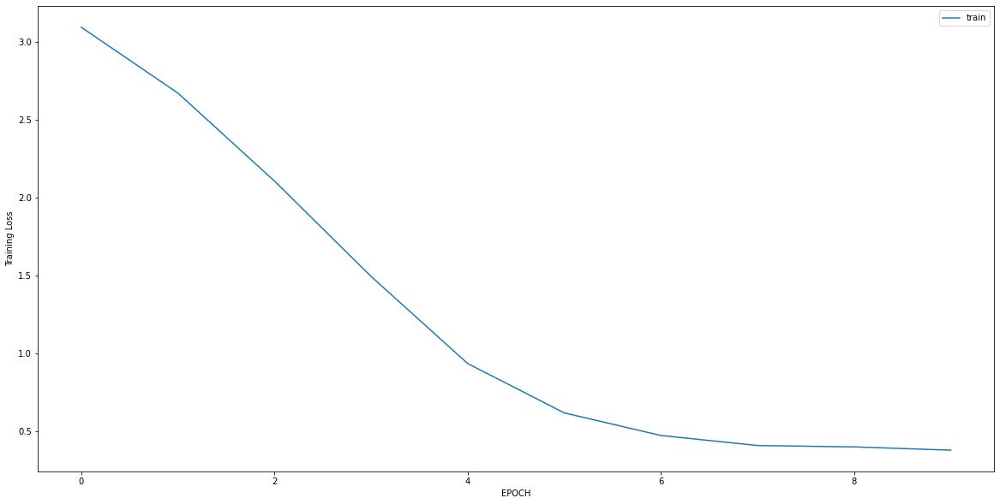

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6595 - accuracy: 0.7704
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4039 - accuracy: 0.8459
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2941 - accuracy: 0.8912
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2496 - accuracy: 0.9124
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2181 - accuracy: 0.9486
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2208 - accuracy: 0.9426
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1831 - accuracy: 0.9637
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1826 - accuracy: 0.9486
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2039 - accuracy: 0.9305
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1783 - accuracy: 0.9517


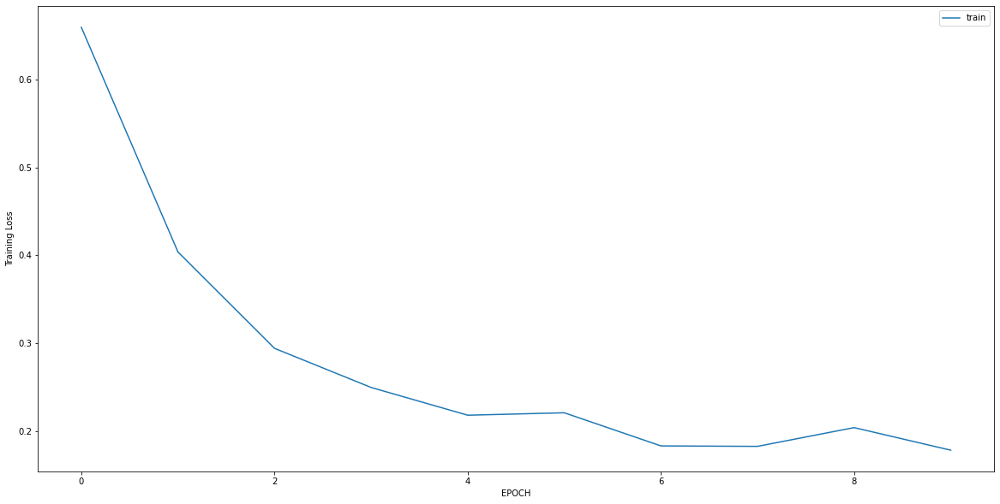

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0651 - accuracy: 0.3333
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3307 - accuracy: 0.9470
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1177 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0522 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0187 - accuracy: 1.0000


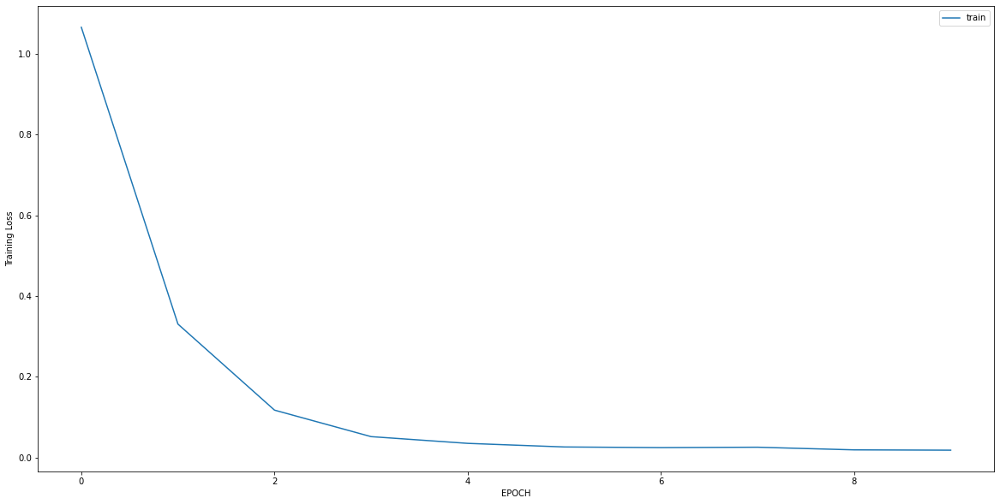

Epoch 1/10
15/15 [==============================] - 0s 6ms/step - loss: 0.6288 - accuracy: 0.7732
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4885 - accuracy: 0.8143
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3960 - accuracy: 0.8618
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3482 - accuracy: 0.8834
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2990 - accuracy: 0.9071
Epoch 6/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2890 - accuracy: 0.9114
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2856 - accuracy: 0.9136
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2764 - accuracy: 0.9006
Epoch 9/10
15/15 [==============================] - 0s 6ms/step - loss: 0.3025 - accuracy: 0.9050
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2485 - accuracy: 0.9330


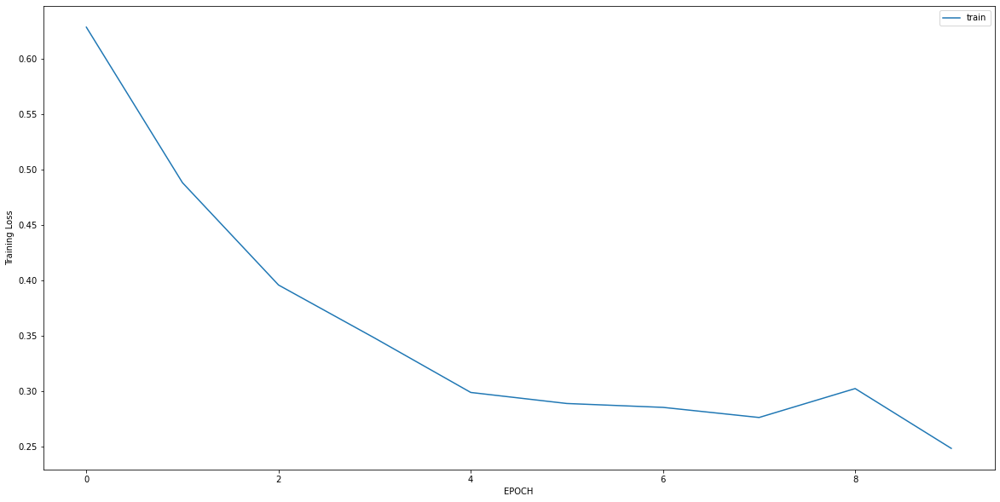

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0907 - accuracy: 0.5138
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7061 - accuracy: 0.6047
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4929 - accuracy: 0.7154
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.4386 - accuracy: 0.7787
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4237 - accuracy: 0.8261
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4019 - accuracy: 0.8221
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3615 - accuracy: 0.8379
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3604 - accuracy: 0.8498
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3450 - accuracy: 0.8538
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3571 - accuracy: 0.8617


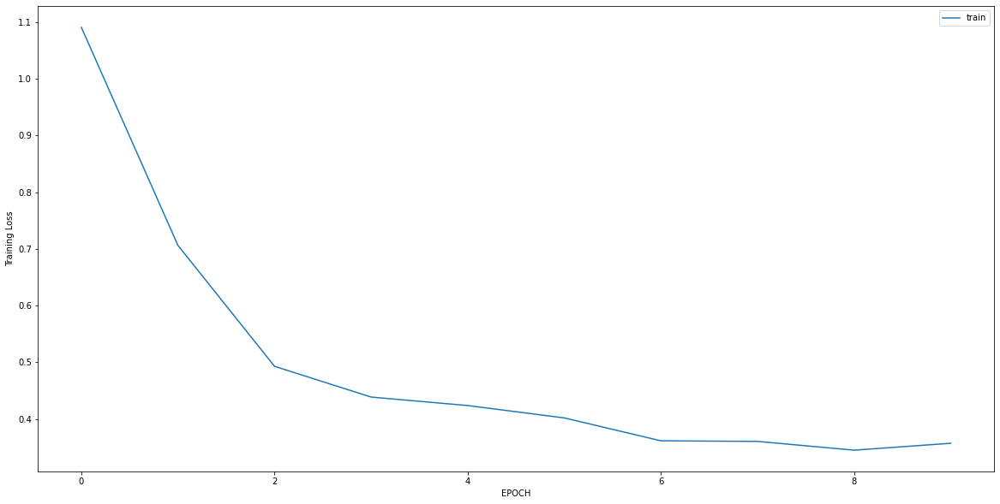

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4005 - accuracy: 0.7388
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2189 - accuracy: 0.9485
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2051 - accuracy: 0.9347
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1993 - accuracy: 0.9416
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1838 - accuracy: 0.9450
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1682 - accuracy: 0.9588
Epoch 7/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1491 - accuracy: 0.9588
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1607 - accuracy: 0.9416
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1600 - accuracy: 0.9553
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1751 - accuracy: 0.9175


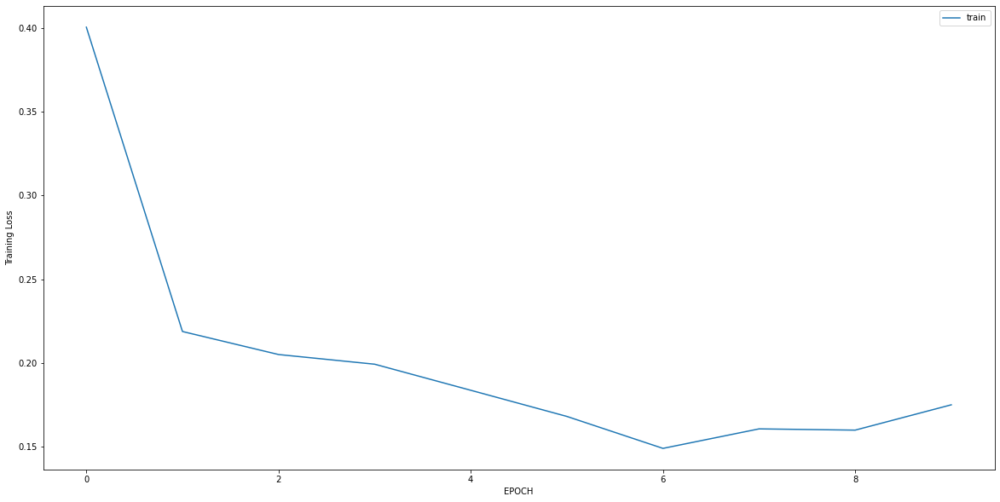

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4640 - accuracy: 0.8656
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4311 - accuracy: 0.8656
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3314 - accuracy: 0.8814
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2889 - accuracy: 0.8972
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2661 - accuracy: 0.9130
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2610 - accuracy: 0.9209
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2544 - accuracy: 0.9130
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2180 - accuracy: 0.9209
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2210 - accuracy: 0.9249
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2207 - accuracy: 0.9328


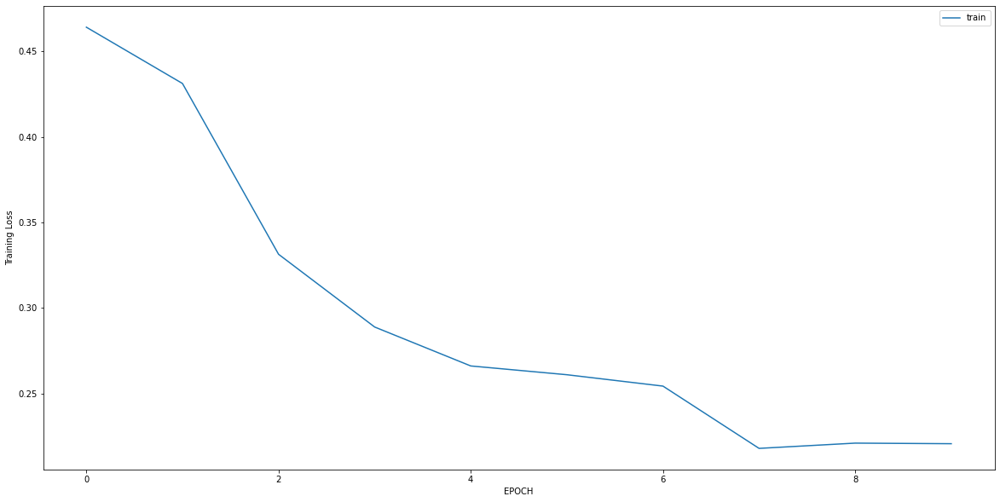

Epoch 1/10
11/11 [==============================] - 0s 7ms/step - loss: 3.7370 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 7ms/step - loss: 2.4902 - accuracy: 0.0031
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 1.1762 - accuracy: 0.2243
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4237 - accuracy: 0.8660
Epoch 5/10
11/11 [==============================] - 0s 7ms/step - loss: 0.2118 - accuracy: 0.9907
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1345 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 7ms/step - loss: 0.1012 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0795 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0669 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0624 - accuracy: 1.0000


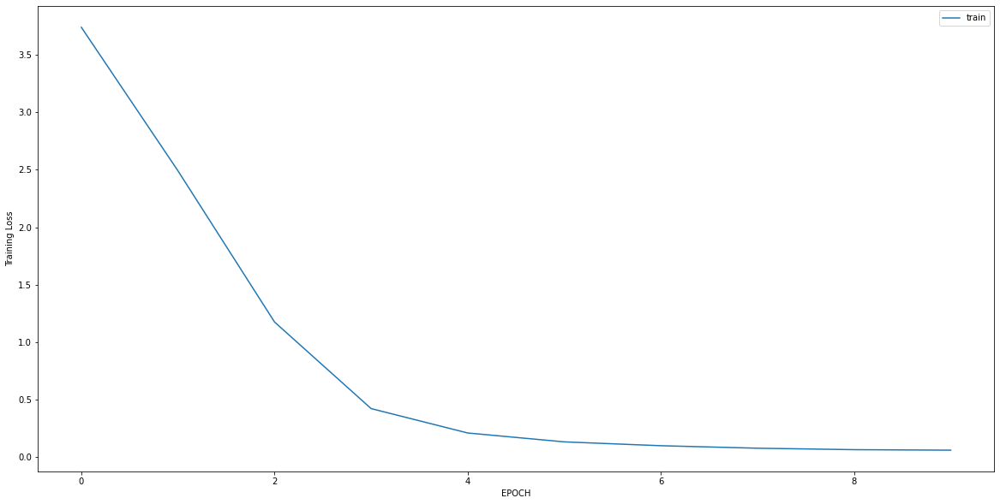

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 1.1319 - accuracy: 0.5804
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0604 - accuracy: 0.5734
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8862 - accuracy: 0.5944
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7846 - accuracy: 0.6119
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6581 - accuracy: 0.6748
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5892 - accuracy: 0.7098
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5230 - accuracy: 0.7657
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4703 - accuracy: 0.8077
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4359 - accuracy: 0.8042
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3841 - accuracy: 0.8636


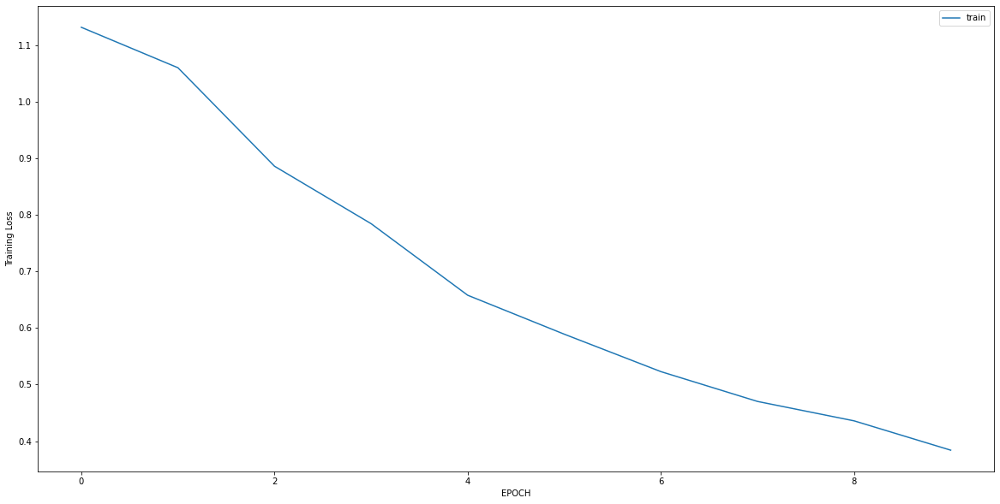

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6515 - accuracy: 0.7222
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6108 - accuracy: 0.7083
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6404 - accuracy: 0.7014
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6611 - accuracy: 0.6944
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6997 - accuracy: 0.7014
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6613 - accuracy: 0.6597
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7002 - accuracy: 0.6875
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7206 - accuracy: 0.6319
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.6667
Epoch 10/10
5/5 [==============================] - 0s 7ms/step - loss: 0.6105 - accuracy: 0.6806


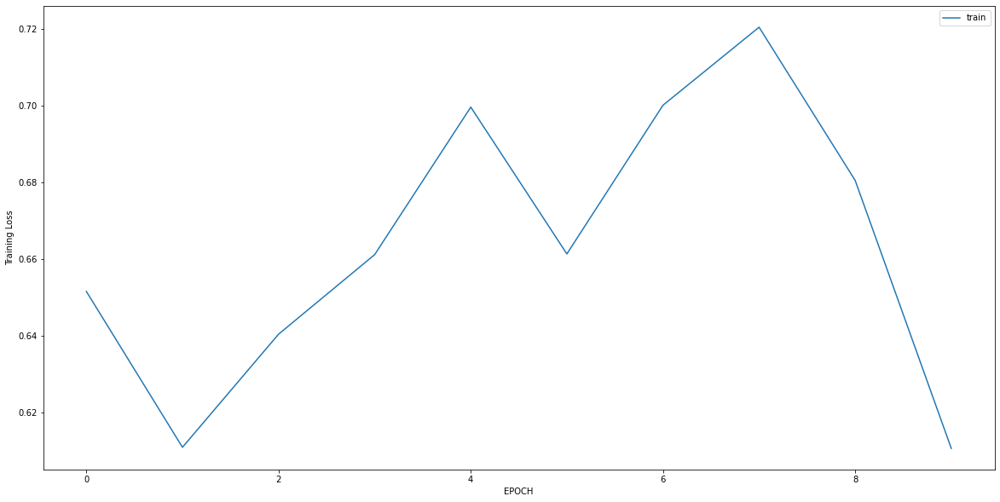

Epoch 1/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1745 - accuracy: 1.0000
Epoch 2/10
2/2 [==============================] - 0s 5ms/step - loss: 0.1619 - accuracy: 1.0000
Epoch 3/10
2/2 [==============================] - 0s 4ms/step - loss: 0.1443 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1218 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 5ms/step - loss: 0.1188 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0934 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 4ms/step - loss: 0.0834 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0883 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0749 - accuracy: 1.0000


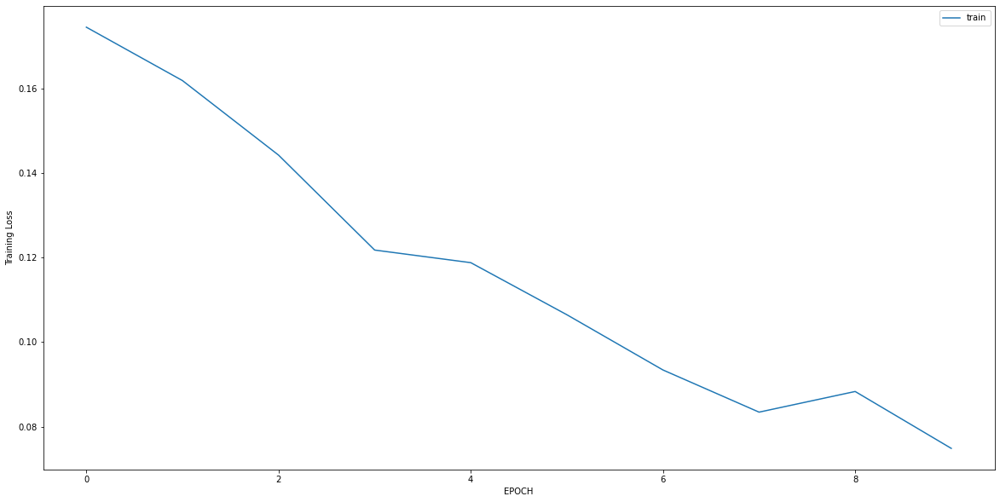

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5970 - accuracy: 0.7804
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5122 - accuracy: 0.8275
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3659 - accuracy: 0.8784
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3479 - accuracy: 0.8941
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2644 - accuracy: 0.9333
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2372 - accuracy: 0.9451
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2562 - accuracy: 0.9373
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2831 - accuracy: 0.9137
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2779 - accuracy: 0.9255
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2682 - accuracy: 0.9216


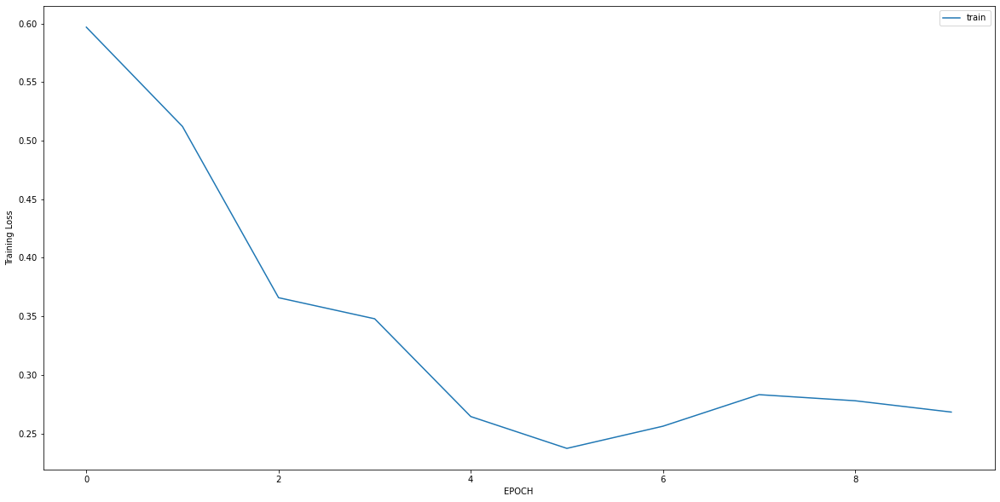

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3590 - accuracy: 0.8650
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3216 - accuracy: 0.8734
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2381 - accuracy: 0.9156
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1908 - accuracy: 0.9409
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1683 - accuracy: 0.9451
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1624 - accuracy: 0.9620
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1520 - accuracy: 0.9578
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1390 - accuracy: 0.9747
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1134 - accuracy: 0.9789
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1200 - accuracy: 0.9789


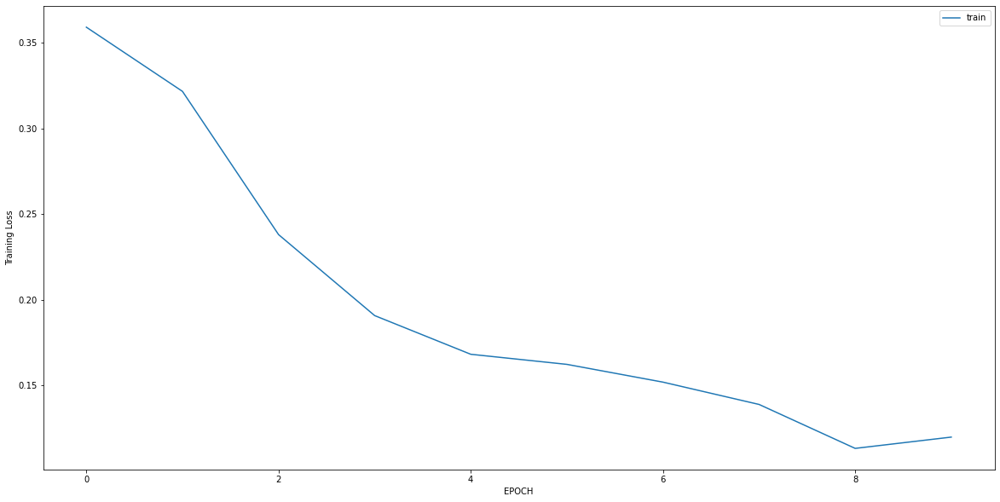

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.7379 - accuracy: 0.3993
Epoch 2/10
9/9 [==============================] - 0s 7ms/step - loss: 1.2685 - accuracy: 0.4216
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8597 - accuracy: 0.4925
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7745 - accuracy: 0.4888
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6506 - accuracy: 0.6119
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6432 - accuracy: 0.6231
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5834 - accuracy: 0.7463
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5602 - accuracy: 0.7090
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4978 - accuracy: 0.7761
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4876 - accuracy: 0.8060


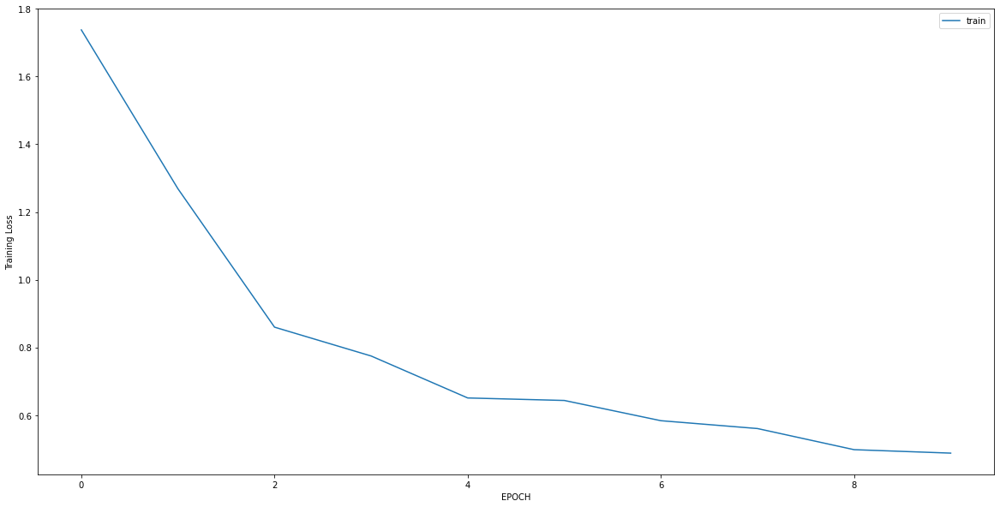

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6050 - accuracy: 0.6742
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5109 - accuracy: 0.7528
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4332 - accuracy: 0.8539
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4140 - accuracy: 0.8427
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3847 - accuracy: 0.8764
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3437 - accuracy: 0.8914
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3277 - accuracy: 0.9064
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2879 - accuracy: 0.8989
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2789 - accuracy: 0.9176
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2713 - accuracy: 0.9251


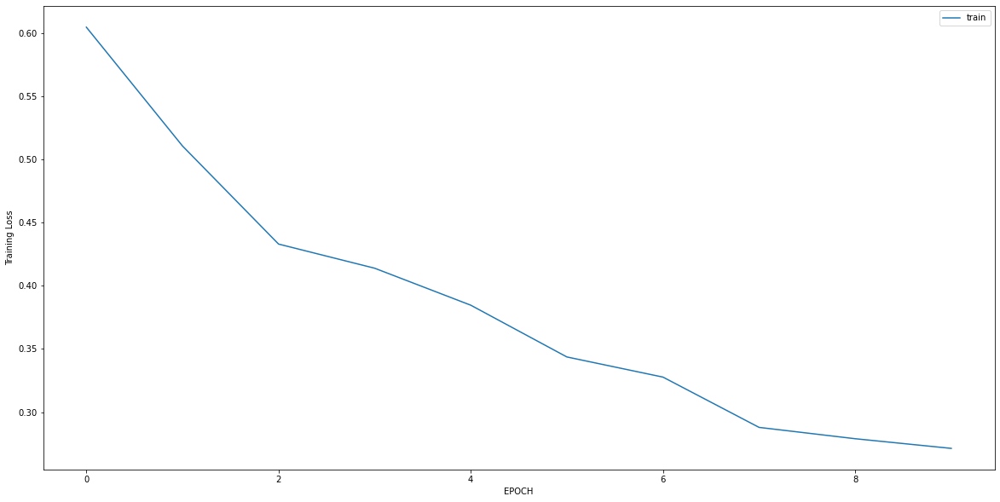

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6193 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5997 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5344 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4990 - accuracy: 0.8270
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4612 - accuracy: 0.8186
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4912 - accuracy: 0.8228
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4326 - accuracy: 0.8228
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4529 - accuracy: 0.8186
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4497 - accuracy: 0.8228
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4258 - accuracy: 0.8270


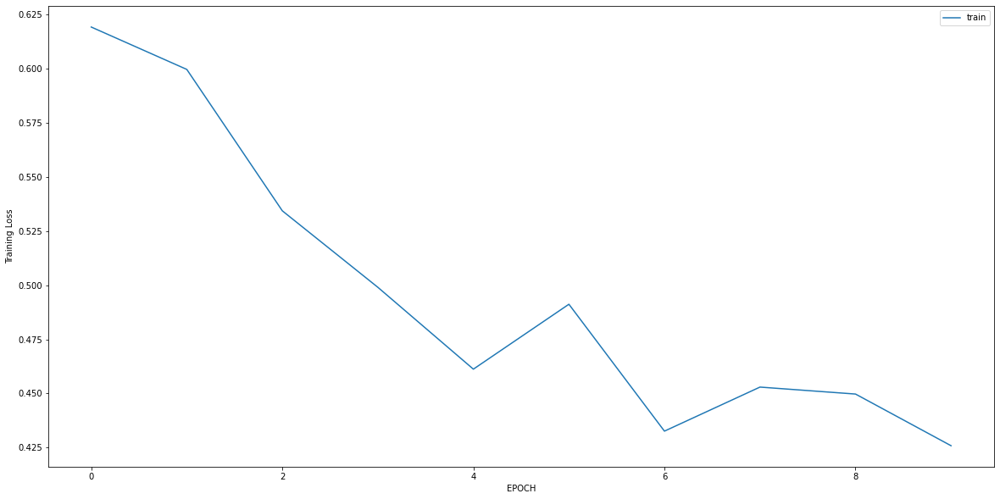

Epoch 1/10
18/18 [==============================] - 0s 6ms/step - loss: 1.1580 - accuracy: 0.2214
Epoch 2/10
18/18 [==============================] - 0s 6ms/step - loss: 0.2713 - accuracy: 0.9613
Epoch 3/10
18/18 [==============================] - 0s 6ms/step - loss: 0.1075 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0625 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0527 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0452 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 7ms/step - loss: 0.0348 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0297 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 1.0000


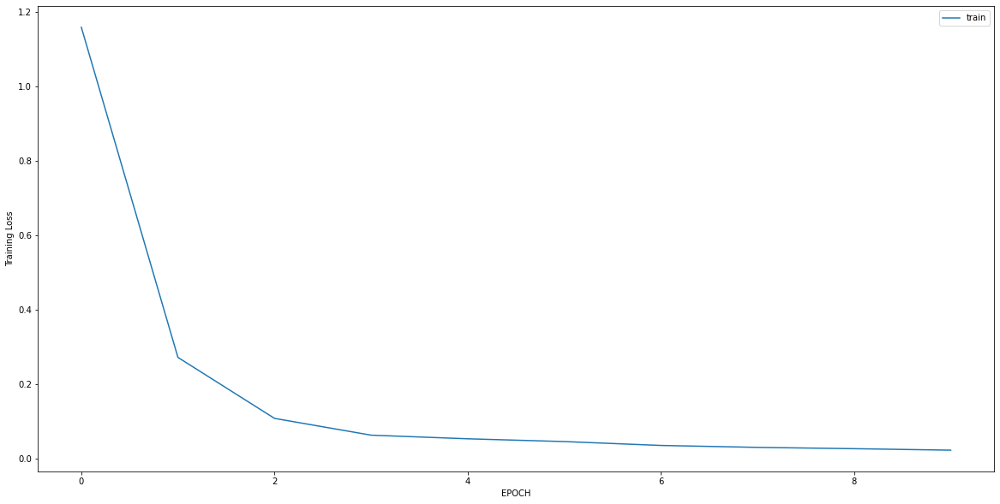

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.8520 - accuracy: 0.3772
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 1.3817 - accuracy: 0.3879
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.9348 - accuracy: 0.4733
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6384 - accuracy: 0.6406
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.4015 - accuracy: 0.8149
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3259 - accuracy: 0.8826
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2388 - accuracy: 0.9466
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2008 - accuracy: 0.9644
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1739 - accuracy: 0.9786
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1693 - accuracy: 0.9786


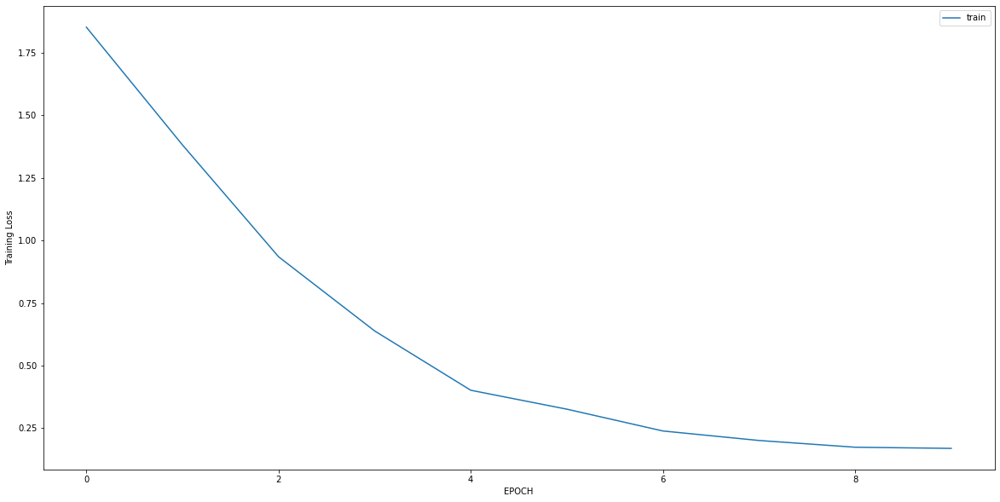

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.9574 - accuracy: 0.4412
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4435 - accuracy: 0.8051
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3148 - accuracy: 0.9118
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2673 - accuracy: 0.9338
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2497 - accuracy: 0.9228
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2296 - accuracy: 0.9301
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1934 - accuracy: 0.9412
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1932 - accuracy: 0.9485
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1697 - accuracy: 0.9485
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1480 - accuracy: 0.9559


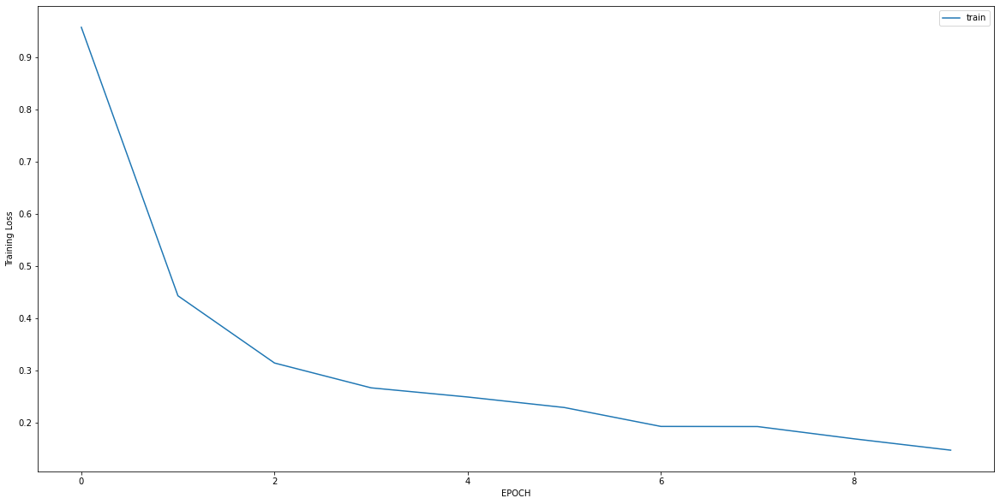

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3177 - accuracy: 0.8913
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5359 - accuracy: 0.8043
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3358 - accuracy: 0.8841
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3701 - accuracy: 0.8623
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3331 - accuracy: 0.8768
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3511 - accuracy: 0.8841
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2767 - accuracy: 0.9058
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2403 - accuracy: 0.8986
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2576 - accuracy: 0.8913
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2997 - accuracy: 0.8841


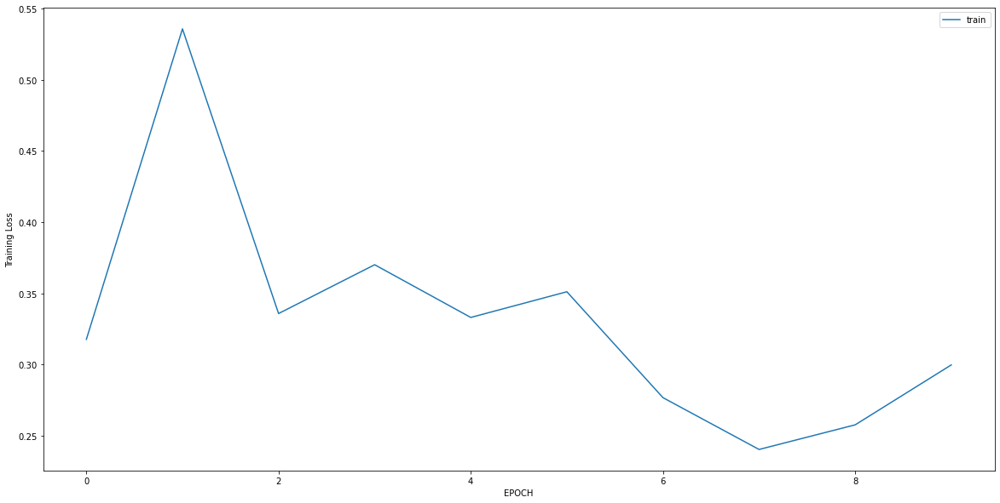

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3122 - accuracy: 0.8386
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2301 - accuracy: 0.9078
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1718 - accuracy: 0.9510
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1313 - accuracy: 0.9741
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1042 - accuracy: 0.9885
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0951 - accuracy: 0.9971
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0787 - accuracy: 0.9885
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0739 - accuracy: 0.9971
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0678 - accuracy: 0.9914


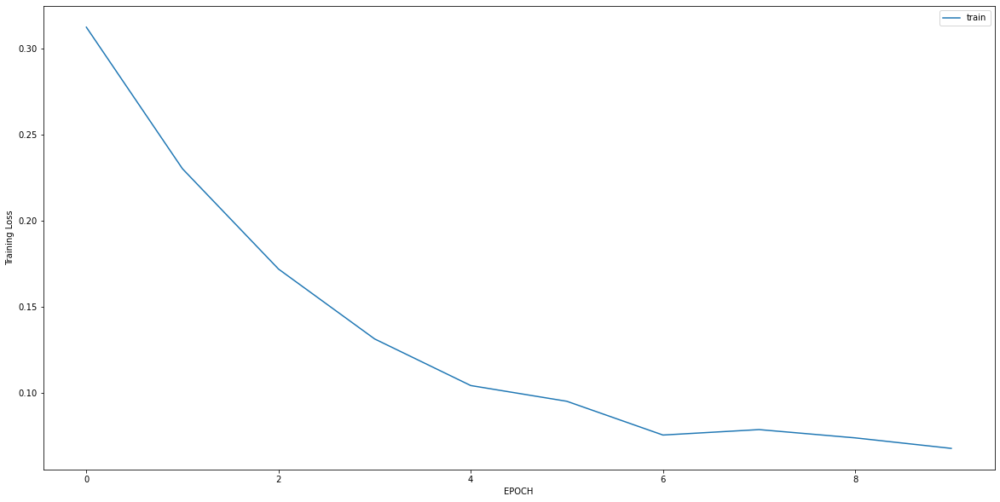

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6197 - accuracy: 0.7472
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3978 - accuracy: 0.8491
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3642 - accuracy: 0.8491
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2960 - accuracy: 0.8906
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2815 - accuracy: 0.9019
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2844 - accuracy: 0.9057
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2729 - accuracy: 0.8906
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2812 - accuracy: 0.8943
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2587 - accuracy: 0.8943
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2630 - accuracy: 0.9019


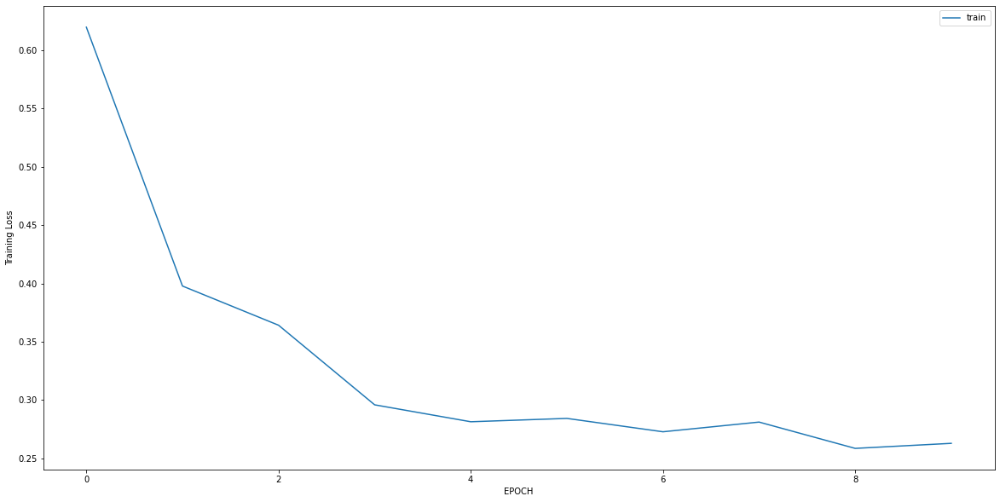

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.8672 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 2.1187 - accuracy: 0.0345
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0039 - accuracy: 0.3793
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4448 - accuracy: 0.8199
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2398 - accuracy: 0.9770
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1477 - accuracy: 0.9923
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1234 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0950 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0788 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0801 - accuracy: 1.0000


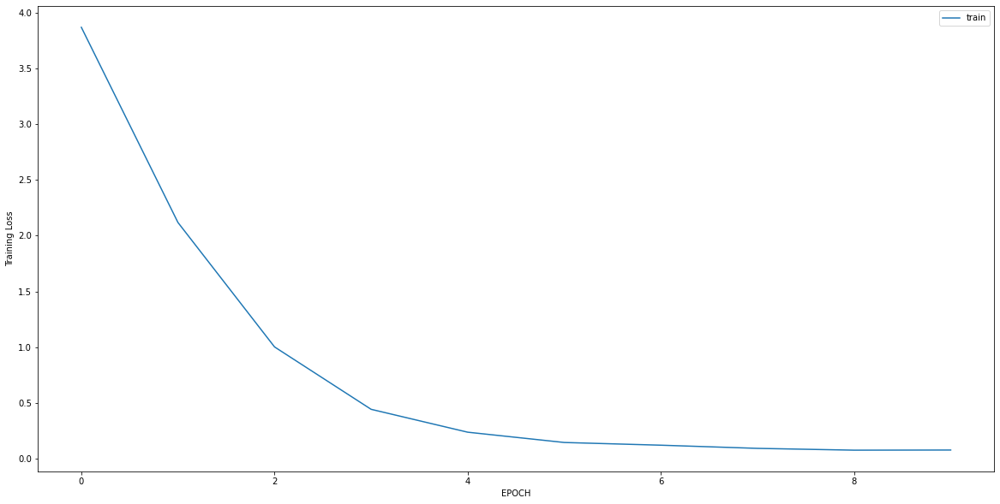

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 2.1117 - accuracy: 0.3194
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 1.9792 - accuracy: 0.3194
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 1.7492 - accuracy: 0.3194
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.5692 - accuracy: 0.3194
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 1.3577 - accuracy: 0.3333
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 1.1568 - accuracy: 0.3472
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9820 - accuracy: 0.3889
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9106 - accuracy: 0.4097
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8084 - accuracy: 0.4792
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8070 - accuracy: 0.4792


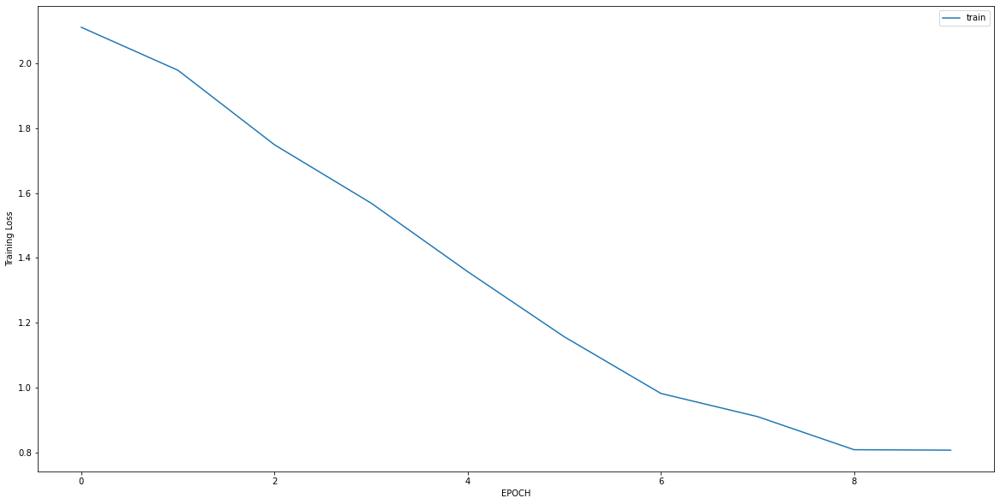

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5171 - accuracy: 0.7860
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4433 - accuracy: 0.8105
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4003 - accuracy: 0.8561
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3545 - accuracy: 0.9018
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3525 - accuracy: 0.9123
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3187 - accuracy: 0.9193
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2890 - accuracy: 0.9298
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2843 - accuracy: 0.9263
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2751 - accuracy: 0.9404
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2697 - accuracy: 0.9333


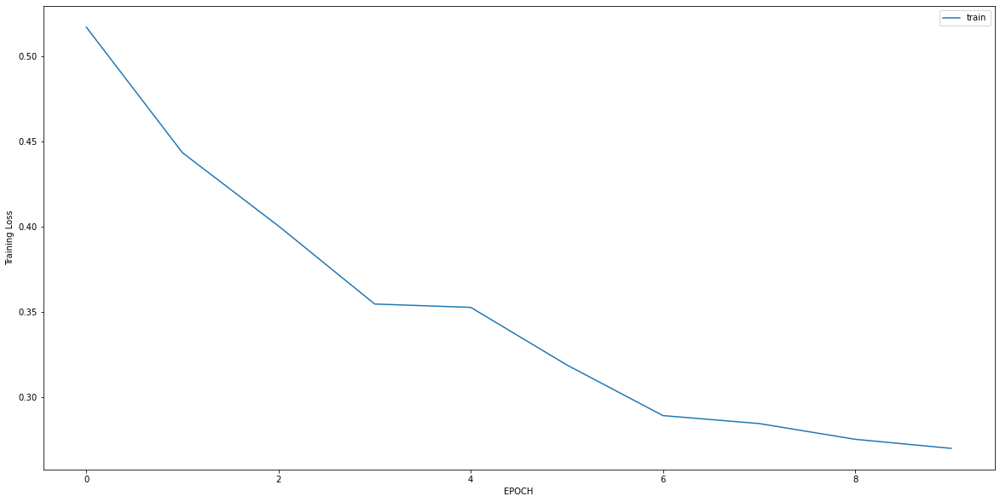

Epoch 1/10
10/10 [==============================] - 0s 7ms/step - loss: 1.8480 - accuracy: 0.0160
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 1.3268 - accuracy: 0.1214
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7750 - accuracy: 0.5176
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4219 - accuracy: 0.8562
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2413 - accuracy: 0.9744
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1720 - accuracy: 0.9936
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1275 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1049 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0856 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0834 - accuracy: 1.0000


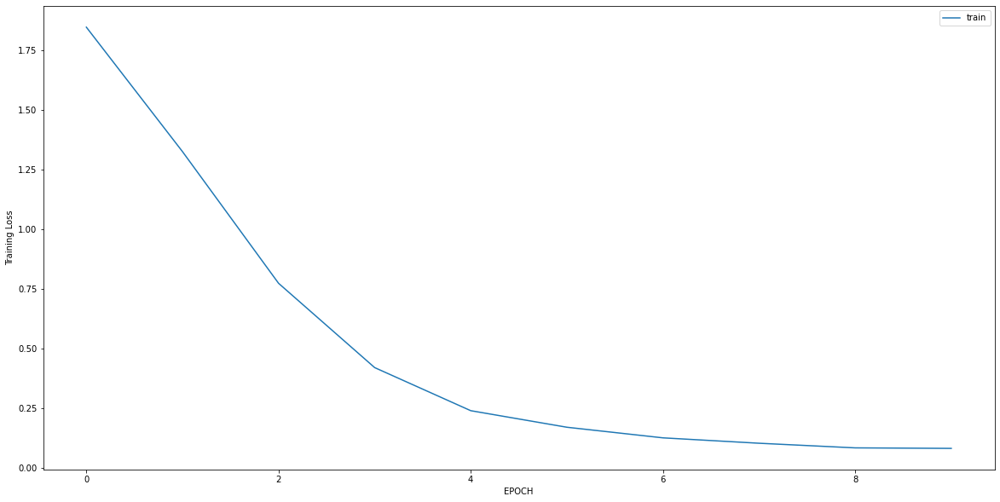

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.3546 - accuracy: 0.3762
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9153 - accuracy: 0.5392
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6228 - accuracy: 0.6771
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4054 - accuracy: 0.8307
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2963 - accuracy: 0.9216
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2325 - accuracy: 0.9561
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2066 - accuracy: 0.9749
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1847 - accuracy: 0.9687
Epoch 9/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1639 - accuracy: 0.9749
Epoch 10/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1427 - accuracy: 0.9812


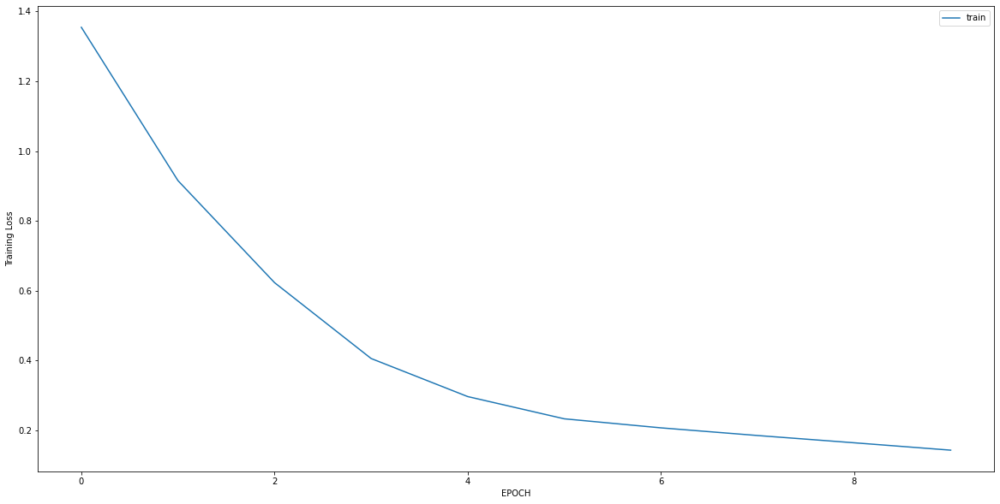

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 1.0928 - accuracy: 0.3420
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3307 - accuracy: 0.8918
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1370 - accuracy: 0.9870
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0804 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0651 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0510 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0491 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 1.0000


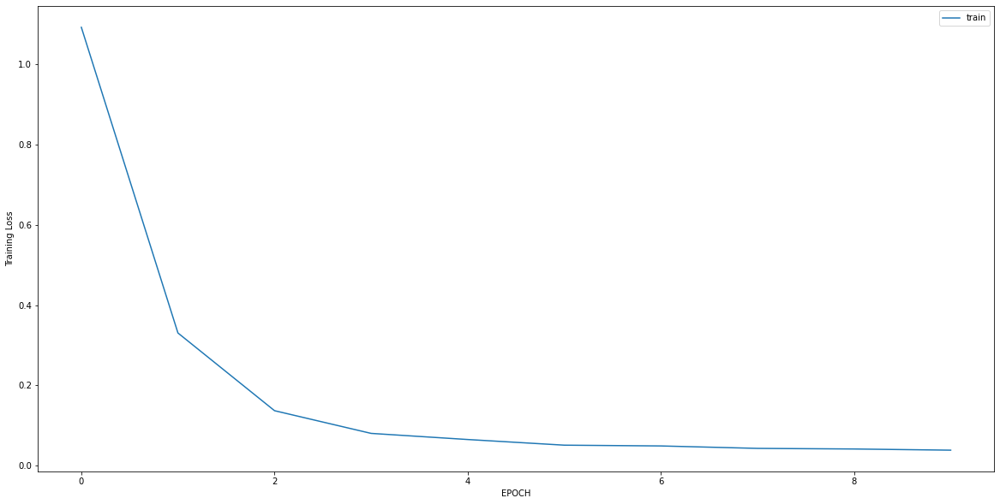

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1831 - accuracy: 0.2579
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7339 - accuracy: 0.5238
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1886 - accuracy: 0.9881
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0680 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0499 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 1.0000


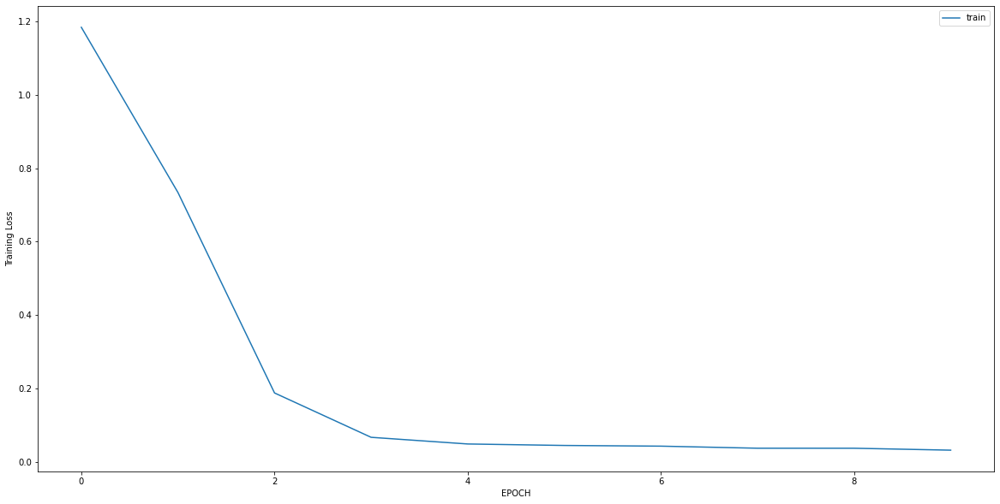

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1061 - accuracy: 0.5873
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8694 - accuracy: 0.6627
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6324 - accuracy: 0.7460
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4515 - accuracy: 0.8175
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3626 - accuracy: 0.8571
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3180 - accuracy: 0.8770
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2711 - accuracy: 0.9048
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2262 - accuracy: 0.9325
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1864 - accuracy: 0.9325
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1511 - accuracy: 0.9683


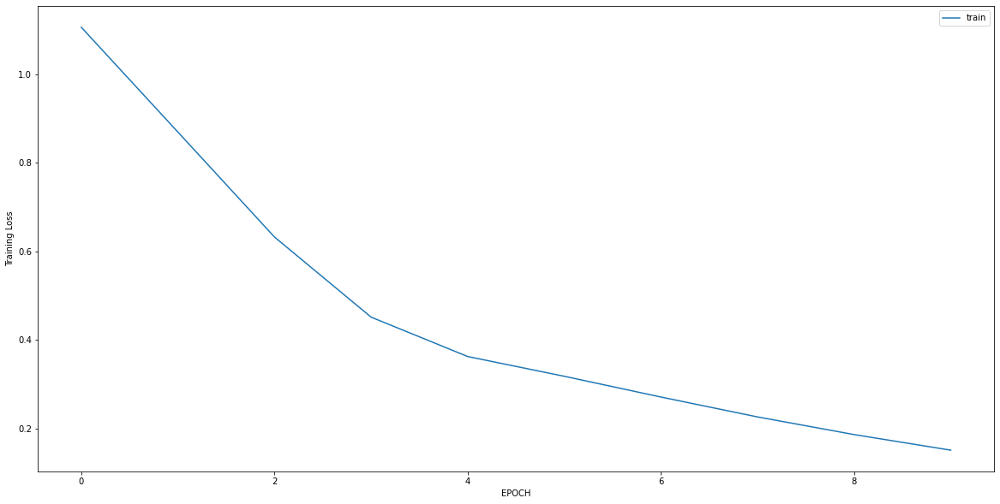

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3114 - accuracy: 0.8322
Epoch 2/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1225 - accuracy: 0.9507
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0255 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0244 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 1.0000


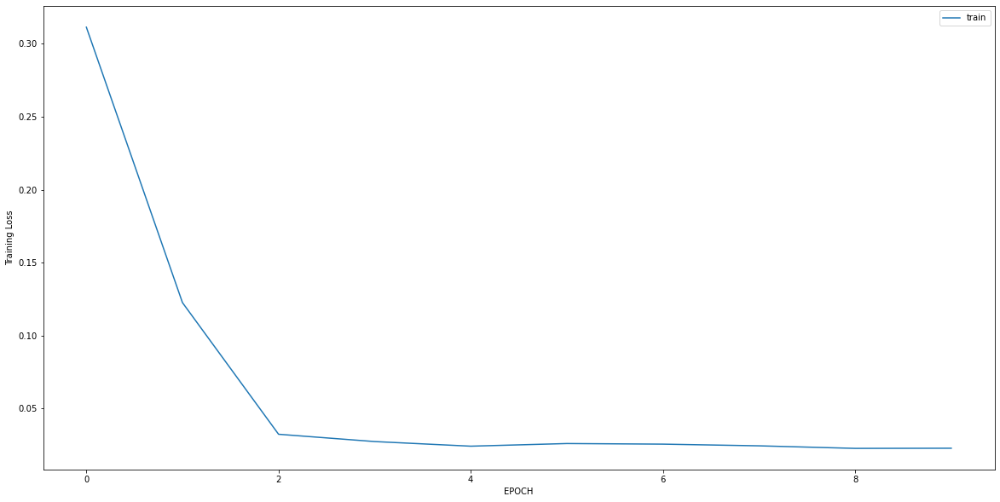

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3732 - accuracy: 0.8983
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3112 - accuracy: 0.9153
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2690 - accuracy: 0.9364
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2768 - accuracy: 0.9322
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2460 - accuracy: 0.9492
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2325 - accuracy: 0.9534
Epoch 7/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2189 - accuracy: 0.9492
Epoch 8/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2309 - accuracy: 0.9449
Epoch 9/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2343 - accuracy: 0.9449
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2646 - accuracy: 0.9364


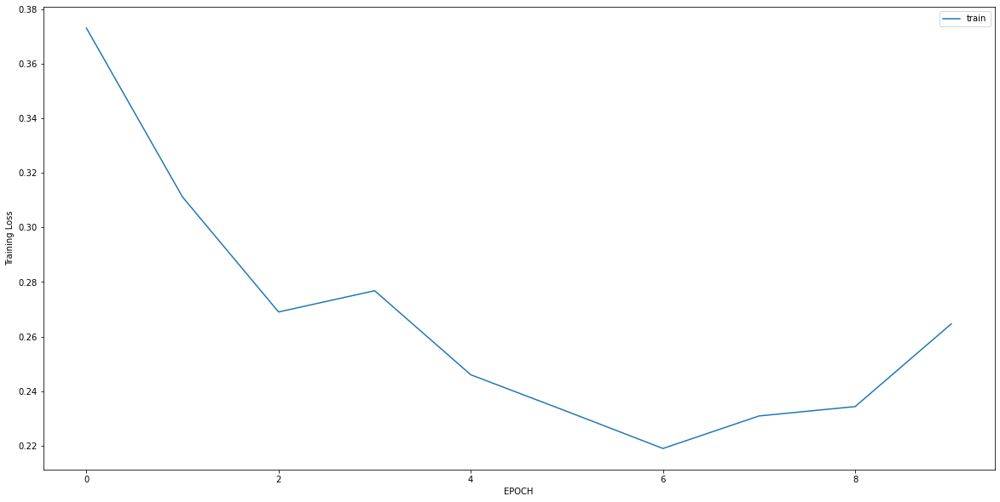

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.5213 - accuracy: 0.8349
Epoch 2/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5153 - accuracy: 0.8396
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4264 - accuracy: 0.8585
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3550 - accuracy: 0.8726
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3893 - accuracy: 0.8113
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3777 - accuracy: 0.8632
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3238 - accuracy: 0.8726
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3498 - accuracy: 0.8302
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3084 - accuracy: 0.8632
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2935 - accuracy: 0.8726


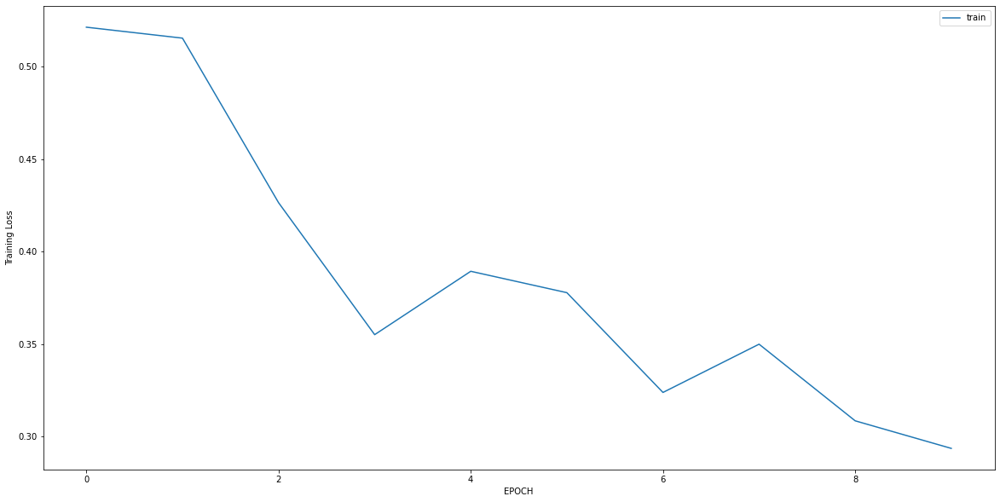

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4329 - accuracy: 0.8571
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3431 - accuracy: 0.8889
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3013 - accuracy: 0.9008
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3457 - accuracy: 0.8810
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2922 - accuracy: 0.9206
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2957 - accuracy: 0.9127
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3133 - accuracy: 0.9087
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2692 - accuracy: 0.9246
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2632 - accuracy: 0.9127
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2916 - accuracy: 0.9167


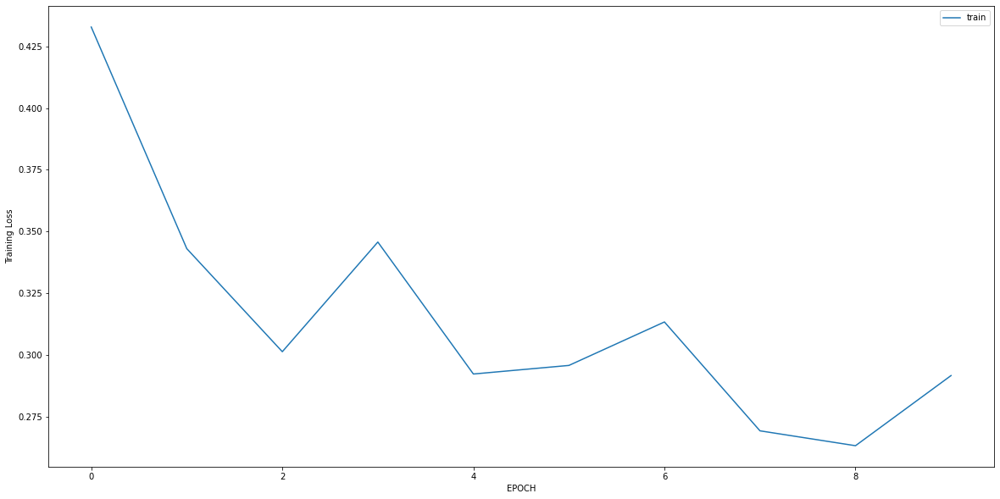

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4704 - accuracy: 0.8428
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3954 - accuracy: 0.8585
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2343 - accuracy: 0.9057
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1810 - accuracy: 0.9465
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1591 - accuracy: 0.9528
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1683 - accuracy: 0.9371
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1325 - accuracy: 0.9780
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1198 - accuracy: 0.9686
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1099 - accuracy: 0.9748
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0937 - accuracy: 0.9811


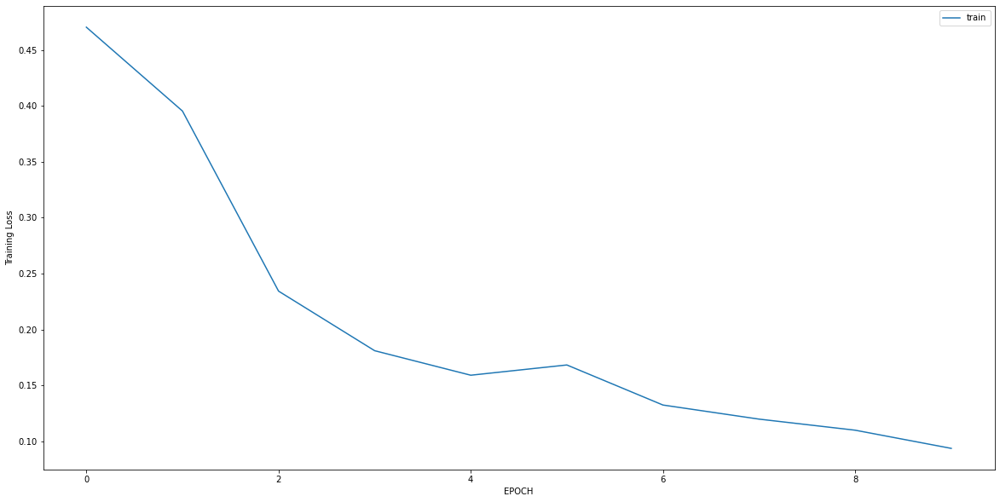

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 3.5775 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 2.4318 - accuracy: 0.0077
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0105 - accuracy: 0.3563
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3016 - accuracy: 0.9234
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1294 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0877 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0631 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0473 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 1.0000


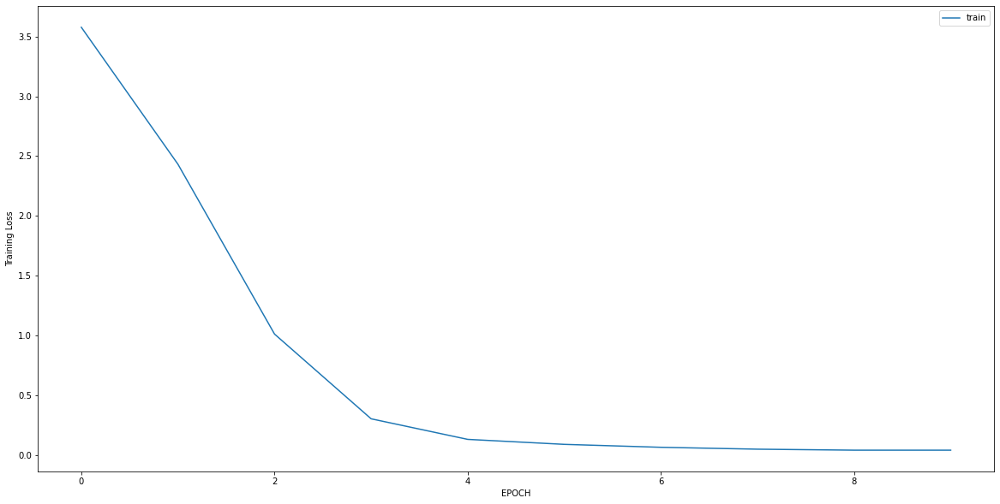

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7579 - accuracy: 0.5180
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6754 - accuracy: 0.5827
Epoch 3/10
5/5 [==============================] - 0s 8ms/step - loss: 0.6184 - accuracy: 0.6403
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6129 - accuracy: 0.6691
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5697 - accuracy: 0.7050
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5635 - accuracy: 0.7050
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5499 - accuracy: 0.7410
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5517 - accuracy: 0.7554
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5022 - accuracy: 0.8058
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4741 - accuracy: 0.8201


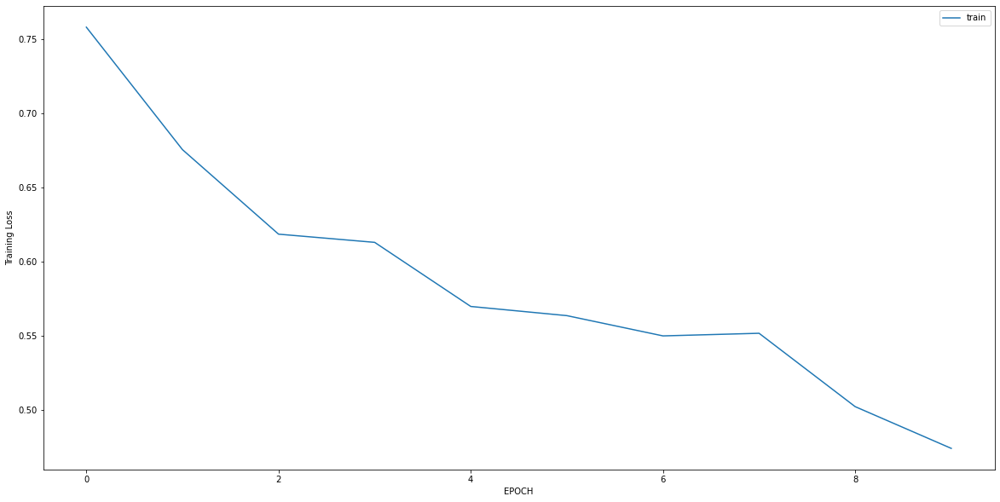

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5419 - accuracy: 0.7322
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2747 - accuracy: 0.9749
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1472 - accuracy: 0.9916
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1172 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0930 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0594 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0600 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0472 - accuracy: 1.0000


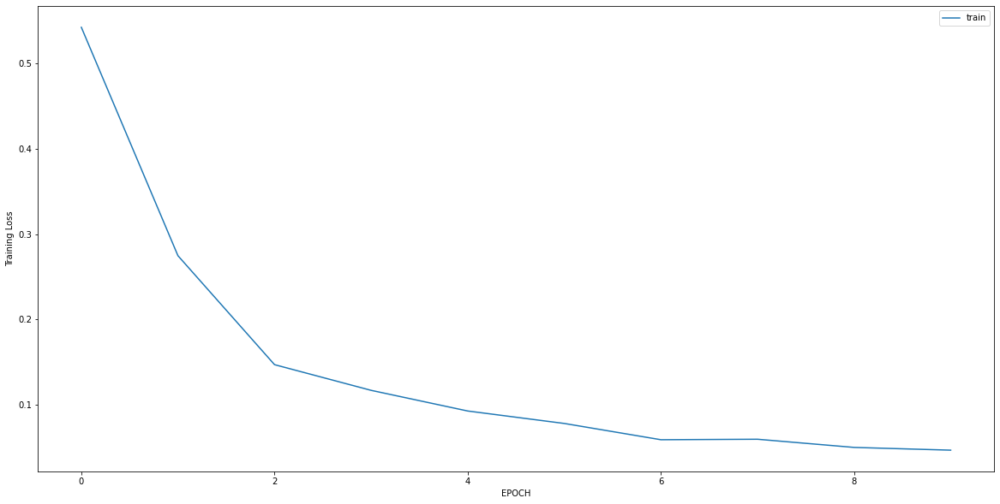

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 2.6098 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 9ms/step - loss: 2.5786 - accuracy: 0.1633
Epoch 3/10
4/4 [==============================] - 0s 4ms/step - loss: 2.1772 - accuracy: 0.1633
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 1.5067 - accuracy: 0.2449
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 1.0315 - accuracy: 0.3163
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.8200 - accuracy: 0.4184
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.6685 - accuracy: 0.5918
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.6378 - accuracy: 0.6429
Epoch 9/10
4/4 [==============================] - 0s 4ms/step - loss: 0.5001 - accuracy: 0.7959
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5076 - accuracy: 0.8163


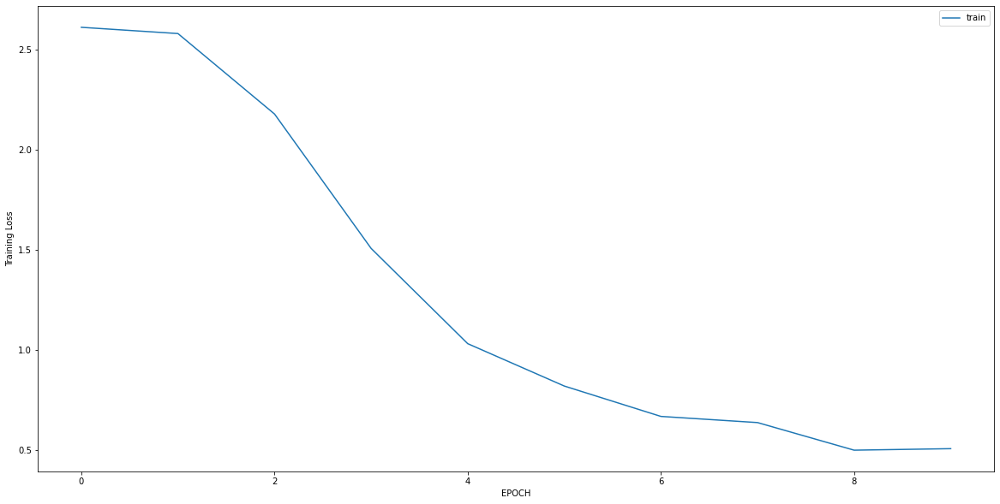

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.0884 - accuracy: 0.4470
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.6331 - accuracy: 0.6727
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.4116 - accuracy: 0.8420
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3388 - accuracy: 0.8939
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2838 - accuracy: 0.9345
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2523 - accuracy: 0.9413
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2262 - accuracy: 0.9571
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1976 - accuracy: 0.9707
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1825 - accuracy: 0.9707
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1814 - accuracy: 0.9707


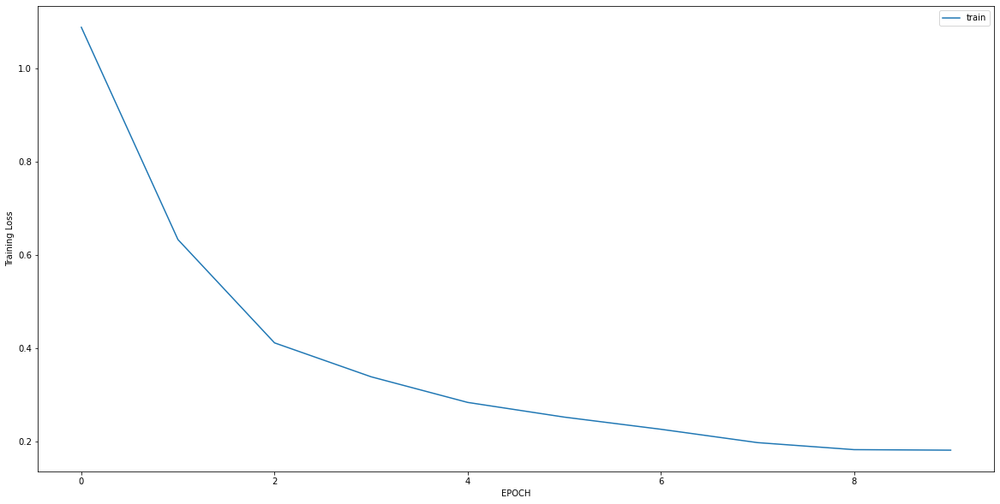

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4262 - accuracy: 0.8362
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3651 - accuracy: 0.8676
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3639 - accuracy: 0.8676
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3180 - accuracy: 0.8815
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2781 - accuracy: 0.9129
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2668 - accuracy: 0.9199
Epoch 7/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2846 - accuracy: 0.9164
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2403 - accuracy: 0.9338
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2564 - accuracy: 0.9129
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2369 - accuracy: 0.9373


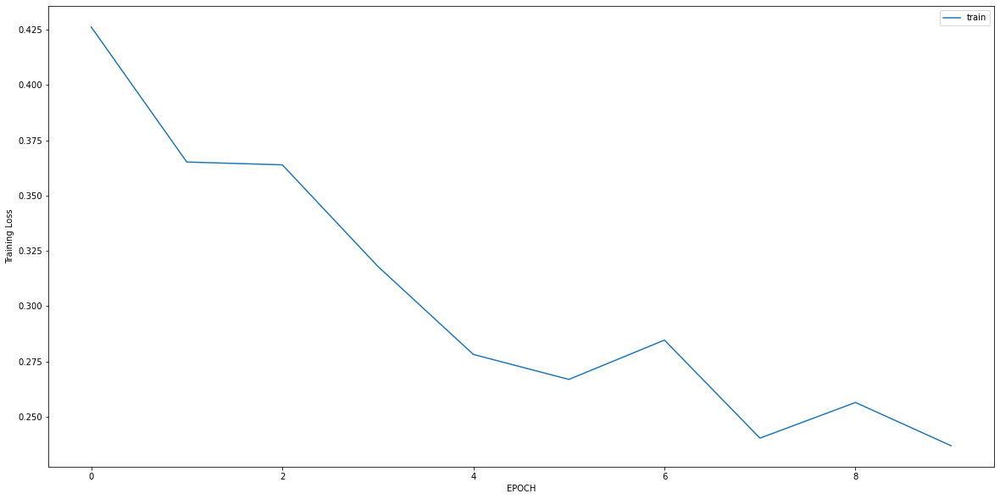

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.0164 - accuracy: 0.5516
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3704 - accuracy: 0.8256
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2907 - accuracy: 0.9039
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2348 - accuracy: 0.9110
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2235 - accuracy: 0.9359
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2004 - accuracy: 0.9466
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1965 - accuracy: 0.9431
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1821 - accuracy: 0.9644
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1763 - accuracy: 0.9644
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1672 - accuracy: 0.9644


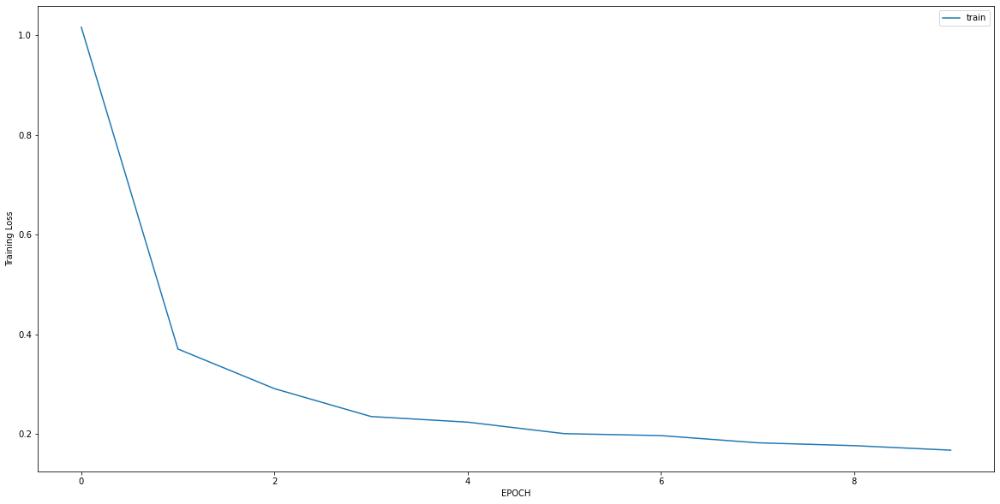

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4176 - accuracy: 0.7951
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2827 - accuracy: 0.8893
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2392 - accuracy: 0.9262
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1785 - accuracy: 0.9426
Epoch 5/10
8/8 [==============================] - 0s 8ms/step - loss: 0.1923 - accuracy: 0.9508
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1689 - accuracy: 0.9467
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1786 - accuracy: 0.9303
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1773 - accuracy: 0.9549
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2078 - accuracy: 0.9098
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1699 - accuracy: 0.9385


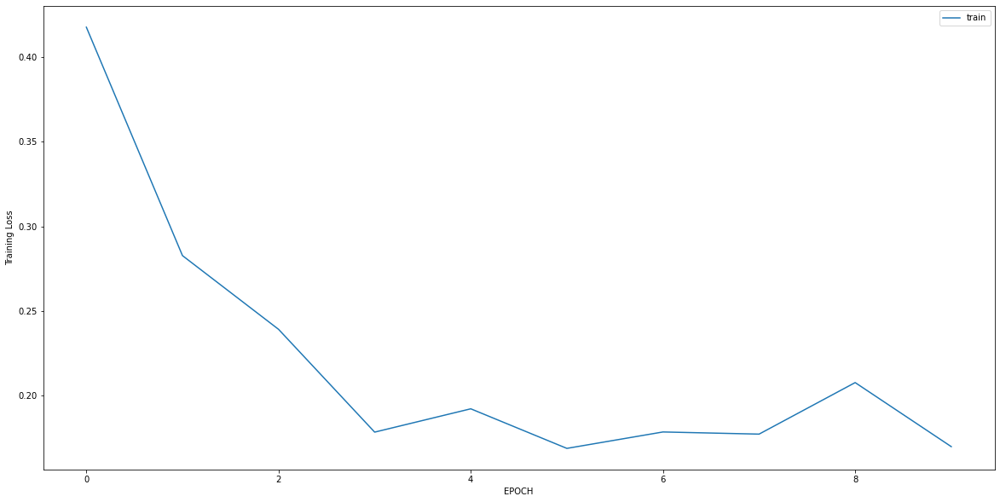

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2727 - accuracy: 0.8926
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2344 - accuracy: 0.9185
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2563 - accuracy: 0.9074
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1967 - accuracy: 0.9333
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1935 - accuracy: 0.9259
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1996 - accuracy: 0.9481
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1798 - accuracy: 0.9630
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1793 - accuracy: 0.9519
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1520 - accuracy: 0.9556
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1580 - accuracy: 0.9667


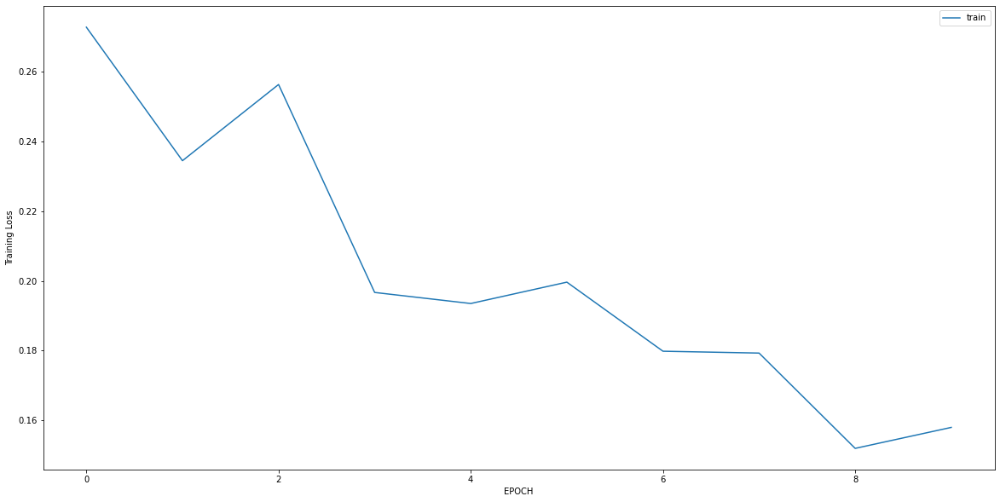

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9361 - accuracy: 0.5152
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3055 - accuracy: 0.8990
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2541 - accuracy: 0.9158
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2769 - accuracy: 0.9293
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2487 - accuracy: 0.9226
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2485 - accuracy: 0.9259
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2645 - accuracy: 0.9158
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2474 - accuracy: 0.9158
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2311 - accuracy: 0.9327
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2326 - accuracy: 0.9226


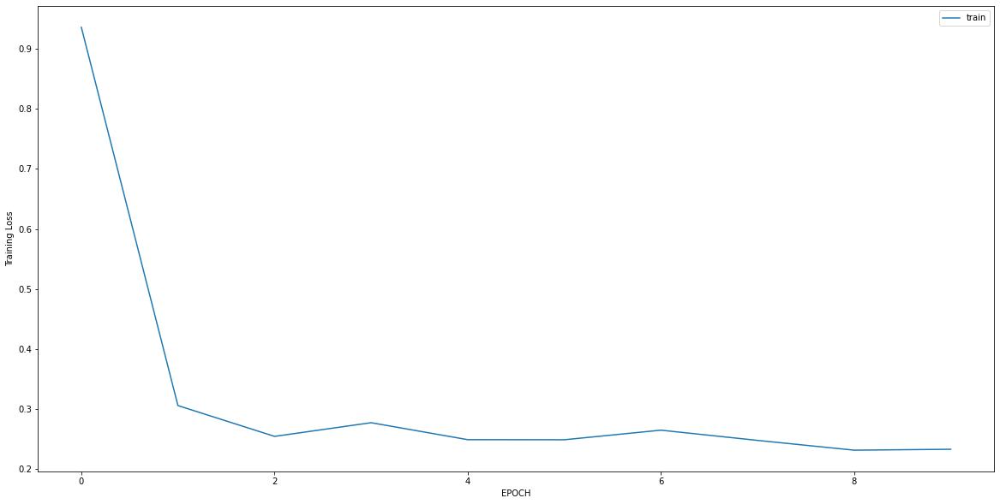

Epoch 1/10
11/11 [==============================] - 0s 7ms/step - loss: 0.6546 - accuracy: 0.7100
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0789 - accuracy: 0.9970
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0208 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0132 - accuracy: 1.0000


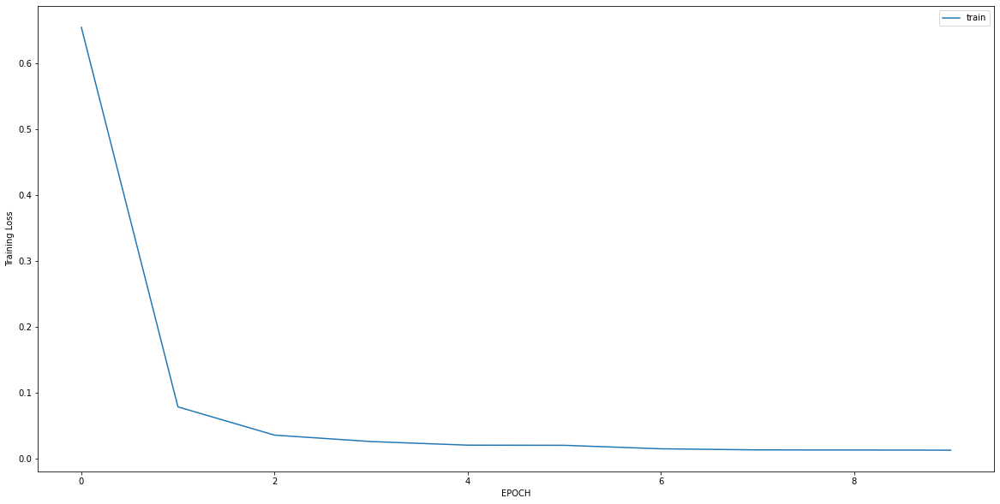

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.3067 - accuracy: 0.9239
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1115 - accuracy: 0.9948
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0786 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0586 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0235 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0202 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0202 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0208 - accuracy: 1.0000


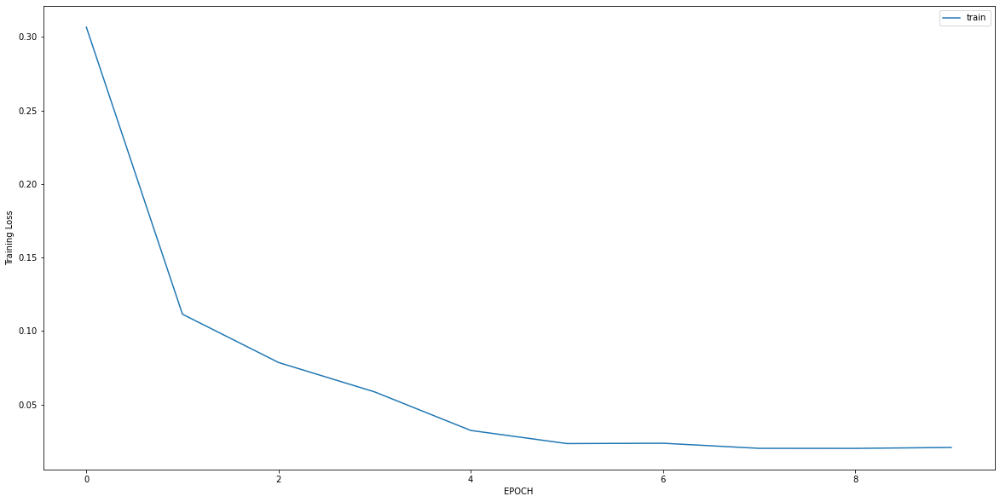

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6468 - accuracy: 0.8051
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4170 - accuracy: 0.8700
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2137 - accuracy: 0.9386
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2047 - accuracy: 0.9495
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1828 - accuracy: 0.9567
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1772 - accuracy: 0.9711
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1939 - accuracy: 0.9495
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1503 - accuracy: 0.9675
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1522 - accuracy: 0.9783
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1456 - accuracy: 0.9603


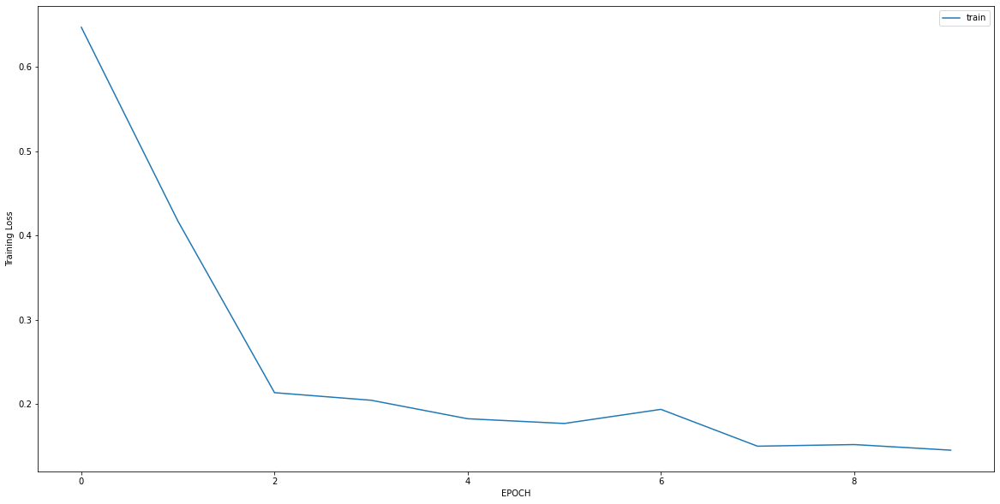

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4106 - accuracy: 0.9000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2456 - accuracy: 0.9241
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1487 - accuracy: 0.9621
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1546 - accuracy: 0.9517
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1462 - accuracy: 0.9552
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1179 - accuracy: 0.9690
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1178 - accuracy: 0.9655
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1278 - accuracy: 0.9586
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1454 - accuracy: 0.9517
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0985 - accuracy: 0.9793


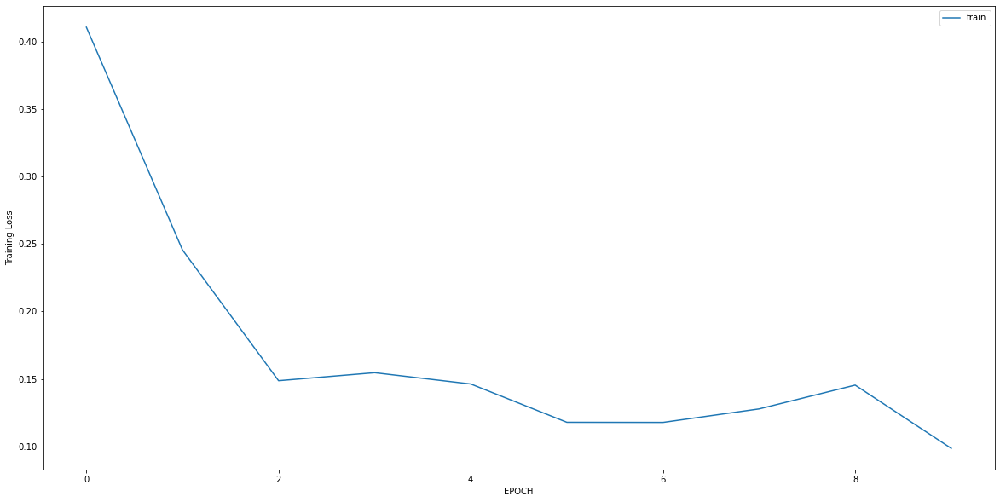

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7234 - accuracy: 0.8386
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4516 - accuracy: 0.8766
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2186 - accuracy: 0.9114
Epoch 4/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1934 - accuracy: 0.9399
Epoch 5/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2235 - accuracy: 0.9399
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2353 - accuracy: 0.9272
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1988 - accuracy: 0.9304
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1754 - accuracy: 0.9430
Epoch 9/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1577 - accuracy: 0.9430
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1608 - accuracy: 0.9589


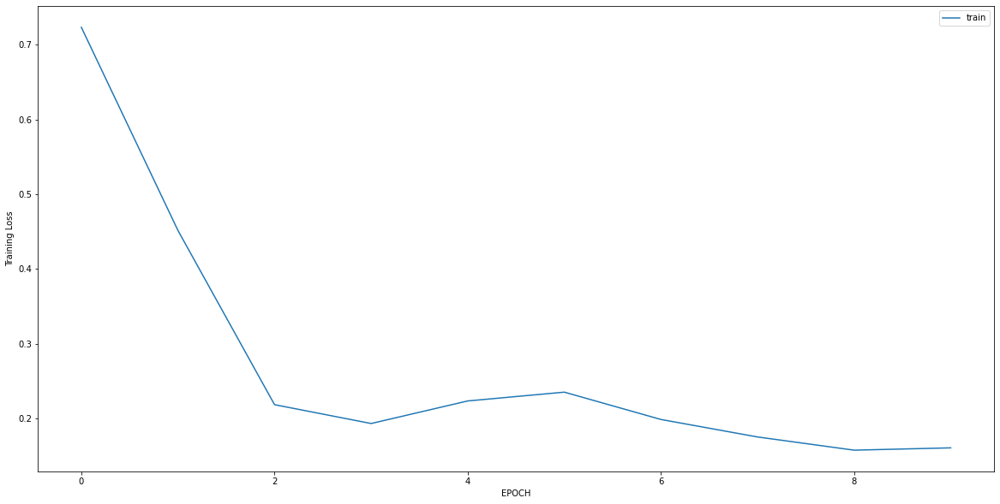

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5709 - accuracy: 0.8515
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4370 - accuracy: 0.8747
Epoch 3/10
14/14 [==============================] - 0s 6ms/step - loss: 0.2069 - accuracy: 0.9258
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2088 - accuracy: 0.9188
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1346 - accuracy: 0.9513
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1407 - accuracy: 0.9374
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1215 - accuracy: 0.9606
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1055 - accuracy: 0.9629
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1530 - accuracy: 0.9466
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.9698


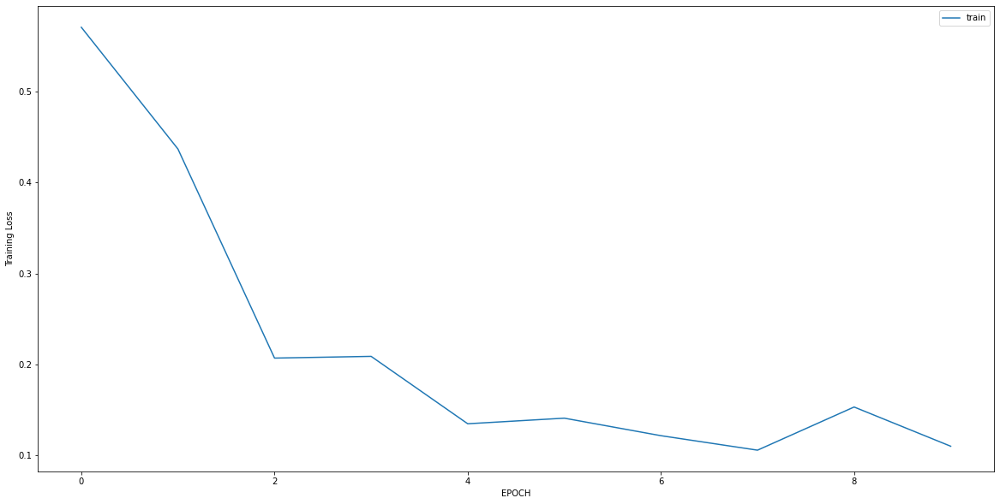

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.9434
Epoch 2/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1861 - accuracy: 0.9465
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1308 - accuracy: 0.9654
Epoch 4/10
10/10 [==============================] - 0s 8ms/step - loss: 0.1267 - accuracy: 0.9623
Epoch 5/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1050 - accuracy: 0.9717
Epoch 6/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1011 - accuracy: 0.9654
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0922 - accuracy: 0.9717
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0657 - accuracy: 0.9811
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0662 - accuracy: 0.9906
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0757 - accuracy: 0.9843


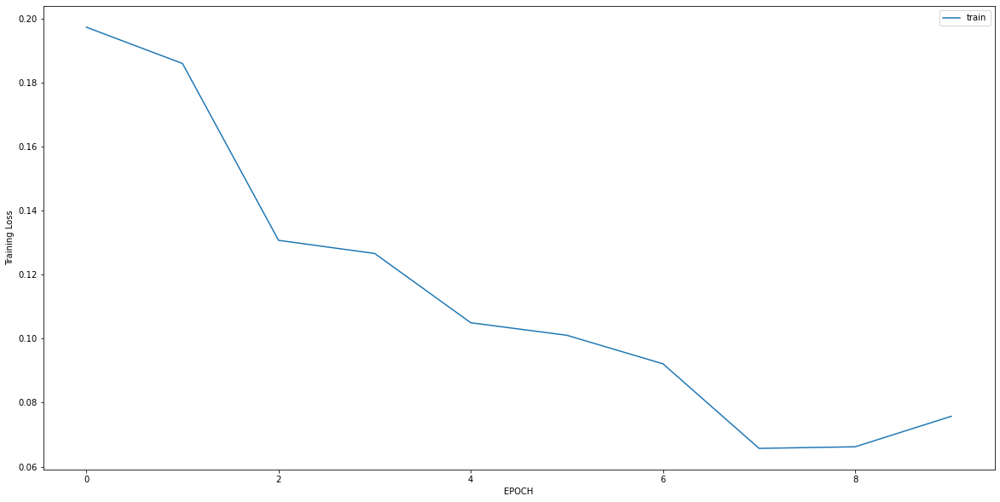

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.8504 - accuracy: 0.4667
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3562 - accuracy: 0.8431
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2803 - accuracy: 0.9059
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2385 - accuracy: 0.9294
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2326 - accuracy: 0.9176
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2720 - accuracy: 0.9020
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2232 - accuracy: 0.9216
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2127 - accuracy: 0.9294
Epoch 9/10
8/8 [==============================] - 0s 9ms/step - loss: 0.1923 - accuracy: 0.9490
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1997 - accuracy: 0.9294


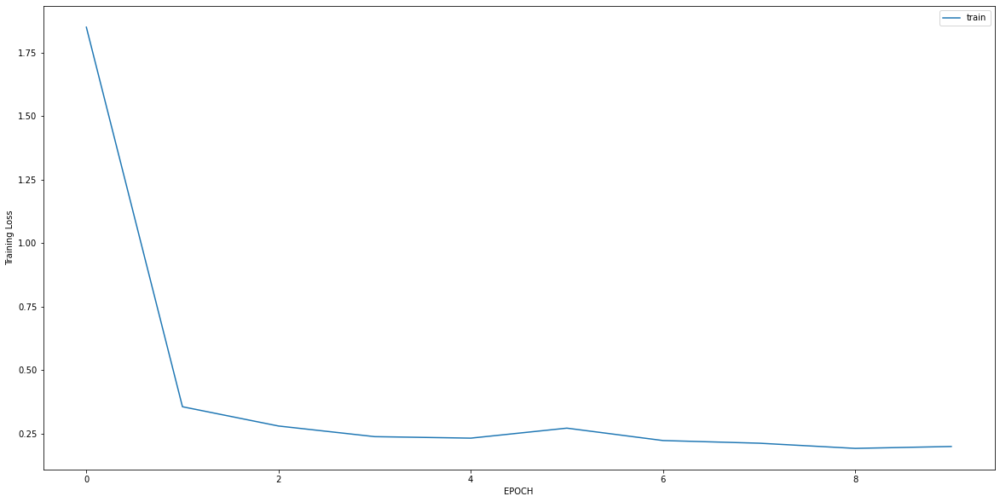

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5816 - accuracy: 0.7113
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0269 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0190 - accuracy: 1.0000


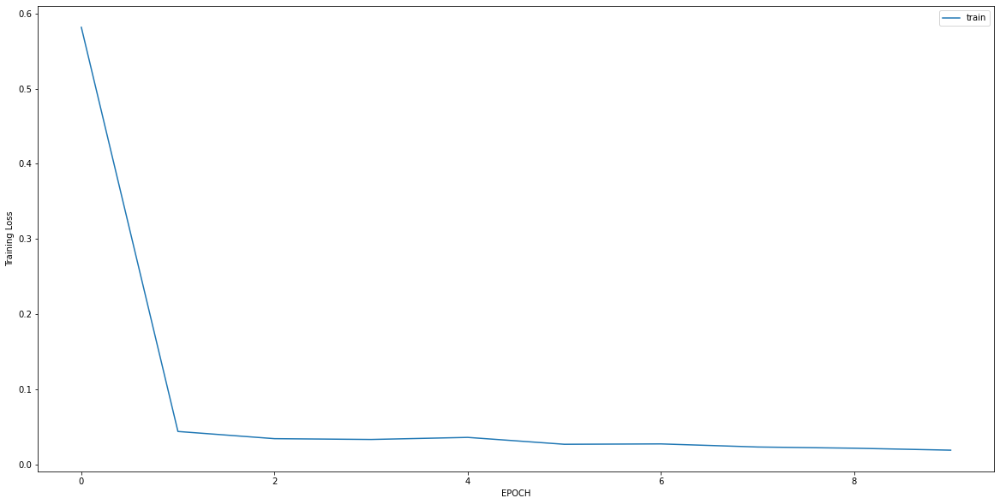

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 2.4709 - accuracy: 0.0351
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.5170 - accuracy: 0.7364
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0828 - accuracy: 0.9965
Epoch 4/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0474 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 7ms/step - loss: 0.0293 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0235 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0202 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0141 - accuracy: 1.0000


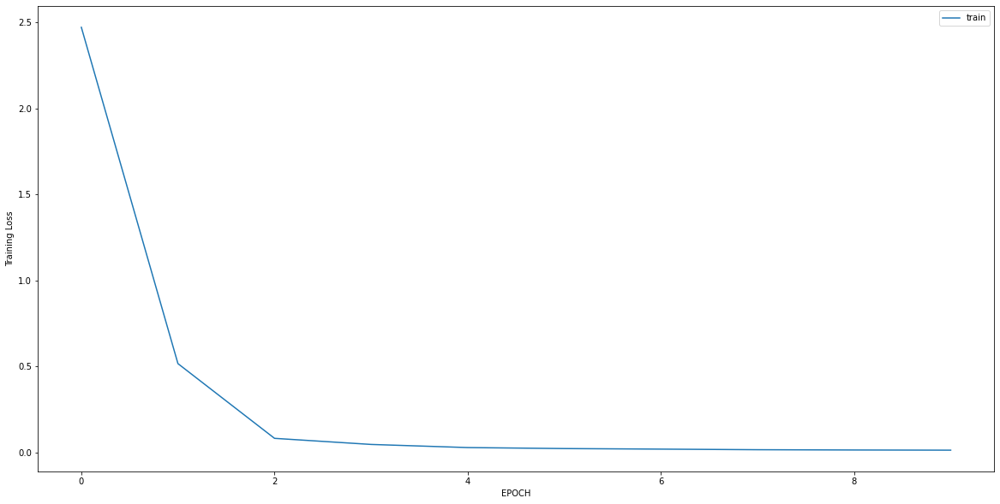

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 1.8270 - accuracy: 0.5993
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.5292 - accuracy: 0.5993
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1716 - accuracy: 0.6029
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9144 - accuracy: 0.5993
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7154 - accuracy: 0.6209
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5611 - accuracy: 0.7292
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4489 - accuracy: 0.8014
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3869 - accuracy: 0.8520
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3034 - accuracy: 0.9025
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3001 - accuracy: 0.8989


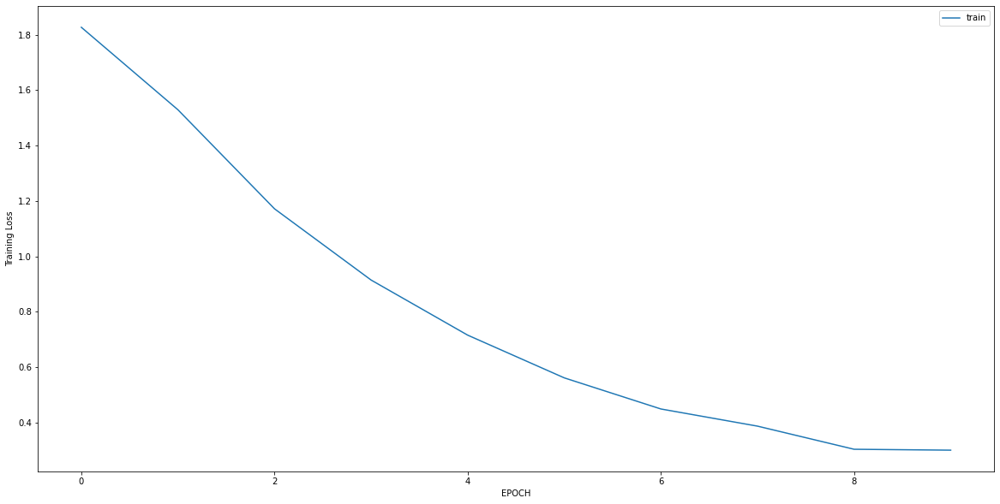

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.6360 - accuracy: 0.7883
Epoch 2/10
15/15 [==============================] - 0s 6ms/step - loss: 0.4824 - accuracy: 0.8359
Epoch 3/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3528 - accuracy: 0.8790
Epoch 4/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3098 - accuracy: 0.8985
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3277 - accuracy: 0.8985
Epoch 6/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2955 - accuracy: 0.9222
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3024 - accuracy: 0.9114
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2816 - accuracy: 0.9201
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2694 - accuracy: 0.9222
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2715 - accuracy: 0.9179


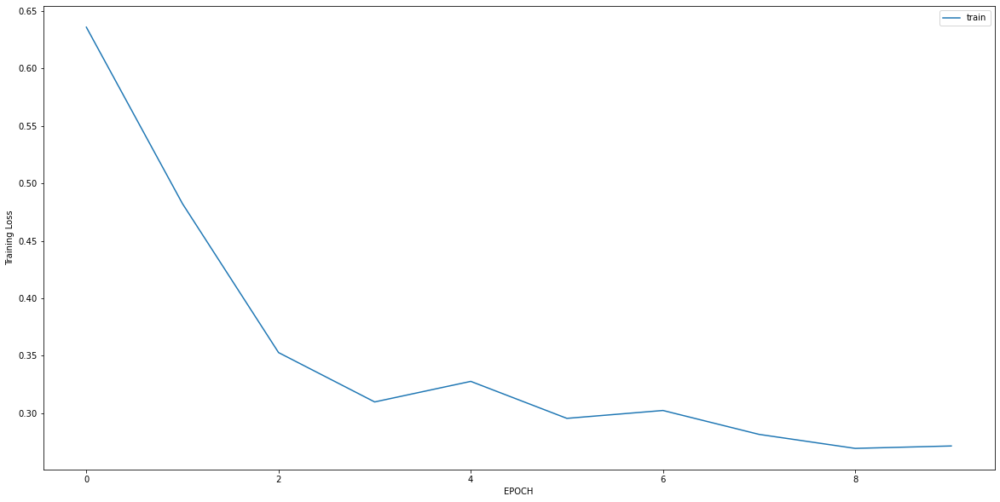

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7465 - accuracy: 0.6691
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4603 - accuracy: 0.7770
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2634 - accuracy: 0.9353
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2932 - accuracy: 0.9065
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2729 - accuracy: 0.9496
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2459 - accuracy: 0.9568
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2153 - accuracy: 0.9712
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1858 - accuracy: 0.9856
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1725 - accuracy: 0.9784
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1522 - accuracy: 0.9784


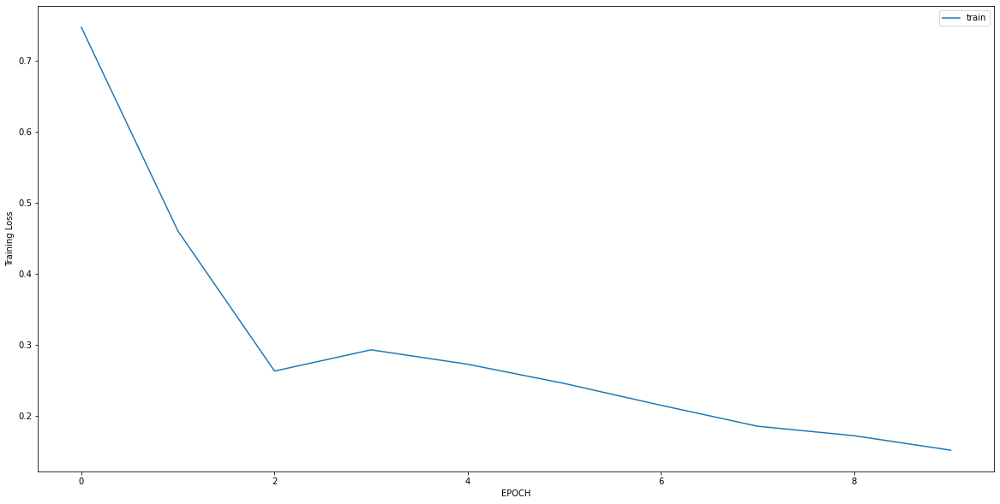

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1867 - accuracy: 0.9345
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2450 - accuracy: 0.9138
Epoch 3/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1335 - accuracy: 0.9690
Epoch 4/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1342 - accuracy: 0.9621
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1562 - accuracy: 0.9621
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1159 - accuracy: 0.9724
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1117 - accuracy: 0.9759
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1171 - accuracy: 0.9690
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0978 - accuracy: 0.9828
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1150 - accuracy: 0.9793


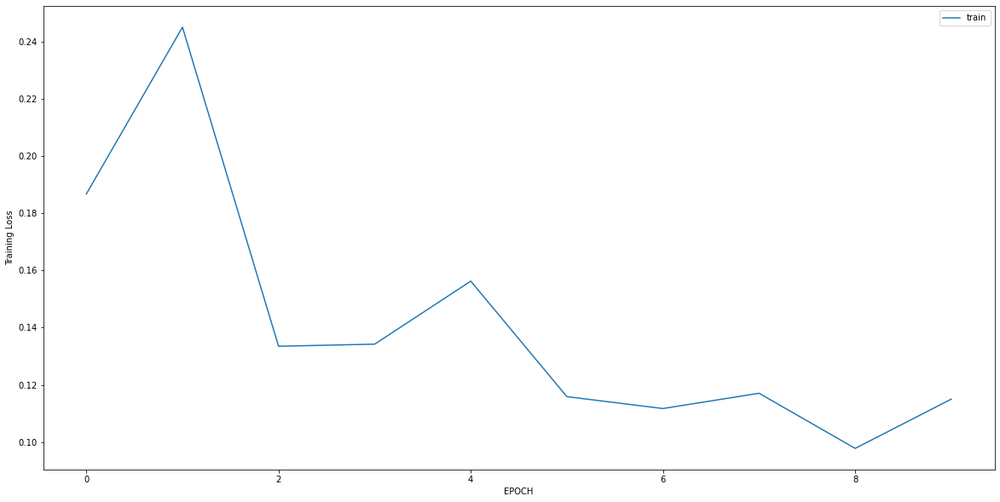

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 2.0986 - accuracy: 0.1916
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.2746 - accuracy: 0.8766
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0213 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 6ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0166 - accuracy: 1.0000


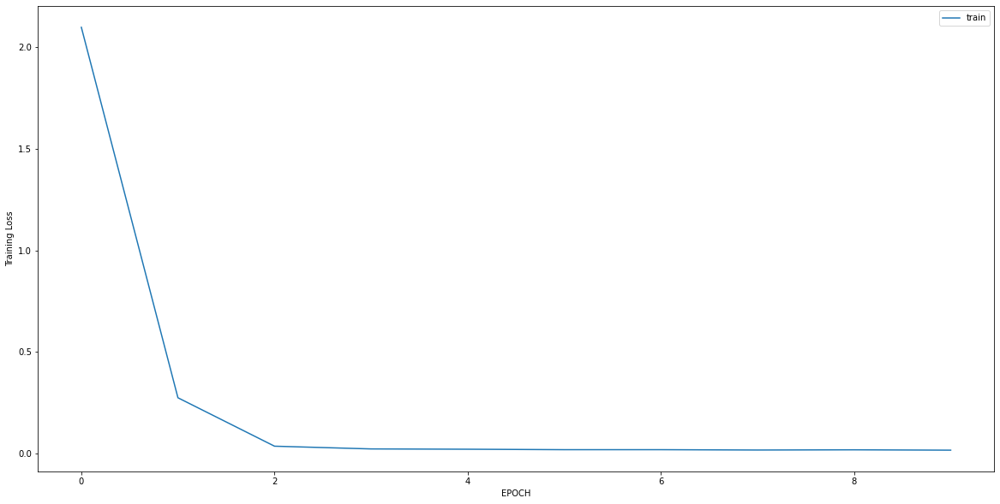

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7980 - accuracy: 0.7817
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7664 - accuracy: 0.7817
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7032 - accuracy: 0.7817
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5979 - accuracy: 0.8294
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5015 - accuracy: 0.8294
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4802 - accuracy: 0.8532
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3881 - accuracy: 0.8929
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3535 - accuracy: 0.9008
Epoch 9/10
8/8 [==============================] - 0s 8ms/step - loss: 0.3547 - accuracy: 0.9048
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3102 - accuracy: 0.9127


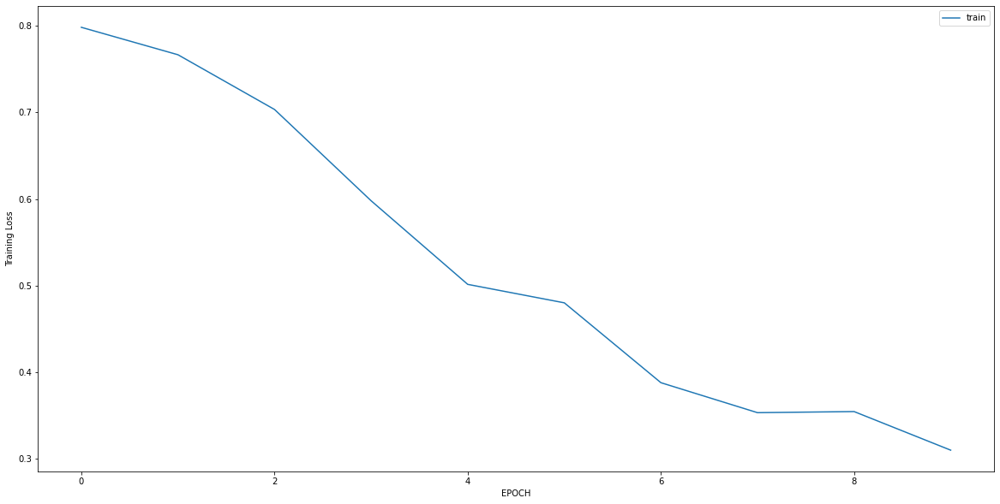

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.5445 - accuracy: 0.7222
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.4751 - accuracy: 0.7778
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5391 - accuracy: 0.7222
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4000 - accuracy: 0.8403
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3526 - accuracy: 0.8958
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2813 - accuracy: 0.9583
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2799 - accuracy: 0.9167
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2796 - accuracy: 0.9514
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2211 - accuracy: 0.9514
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2310 - accuracy: 0.9514


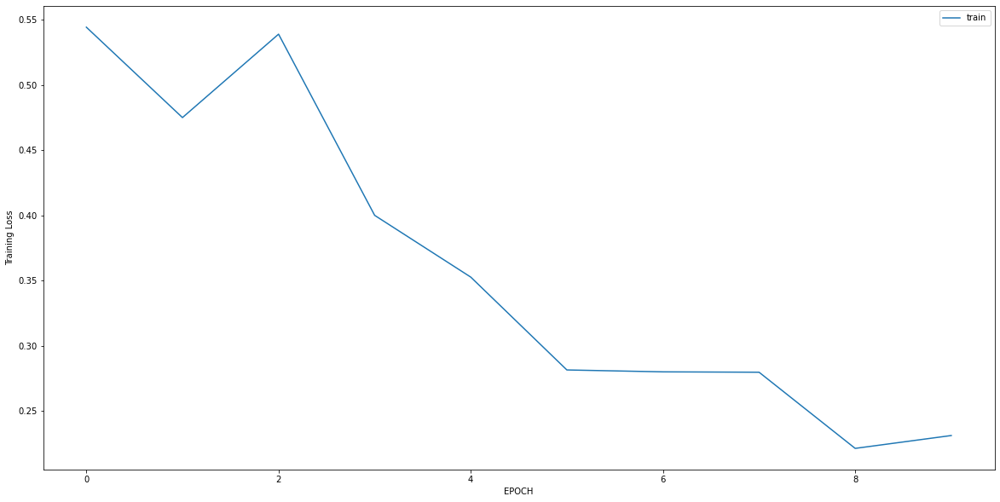

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0751 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0738 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0718 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0620 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0592 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0542 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0474 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 1.0000


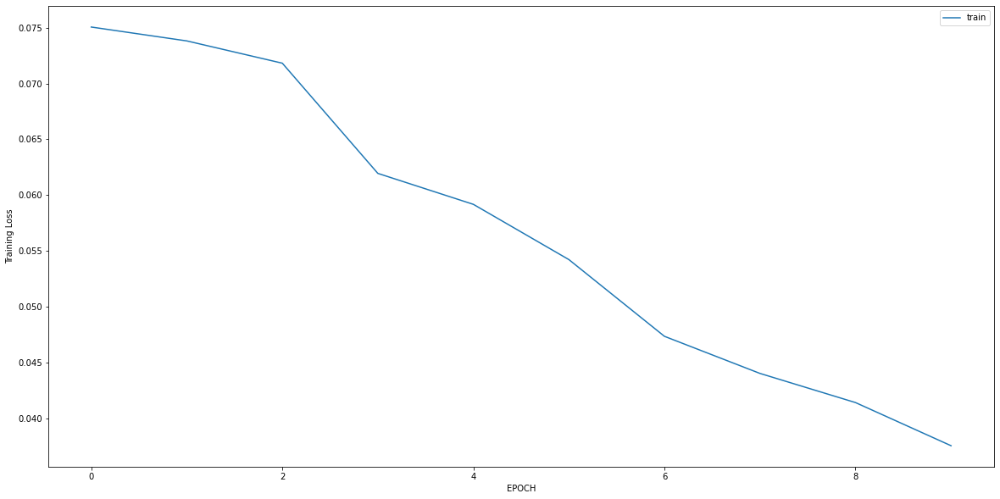

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3772 - accuracy: 0.8713
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2045 - accuracy: 0.9391
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1278 - accuracy: 0.9887
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1181 - accuracy: 0.9729
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1033 - accuracy: 0.9865
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0877 - accuracy: 0.9887
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0850 - accuracy: 0.9865
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0993 - accuracy: 0.9819
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0888 - accuracy: 0.9819
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0727 - accuracy: 0.9910


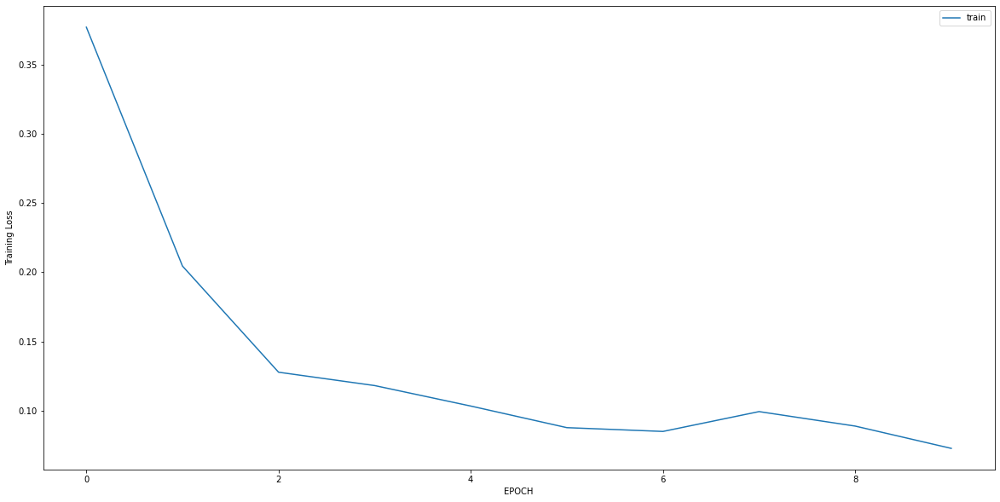

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 4.3024 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 7ms/step - loss: 2.0954 - accuracy: 0.0268
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6471 - accuracy: 0.6360
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2769 - accuracy: 0.9808
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1613 - accuracy: 0.9923
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1015 - accuracy: 0.9962
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0675 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0559 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0444 - accuracy: 1.0000


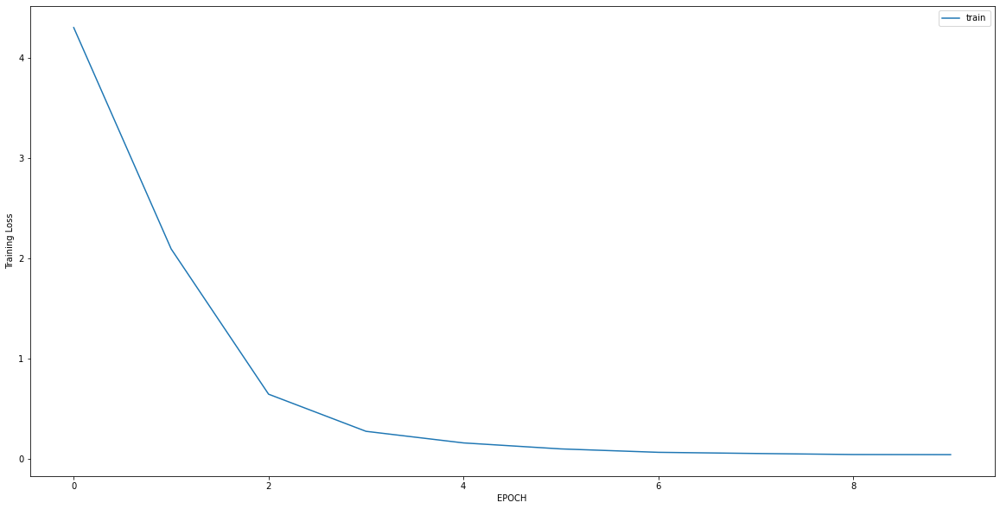

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.1403 - accuracy: 0.5589
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6880 - accuracy: 0.7341
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3983 - accuracy: 0.8640
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2862 - accuracy: 0.9215
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2548 - accuracy: 0.9245
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2105 - accuracy: 0.9456
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2051 - accuracy: 0.9547
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1785 - accuracy: 0.9456
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1635 - accuracy: 0.9486
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1879 - accuracy: 0.9456


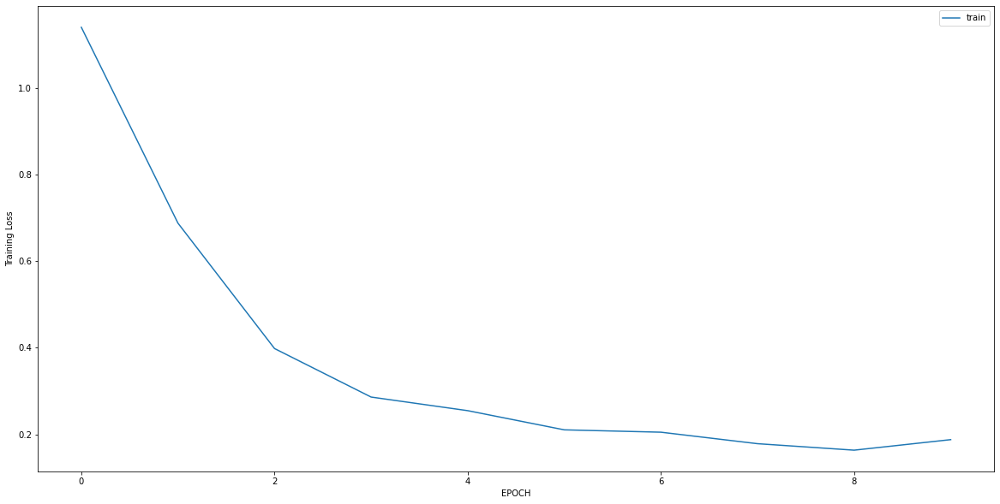

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0017 - accuracy: 0.6030
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7377 - accuracy: 0.6142
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3966 - accuracy: 0.8240
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4160 - accuracy: 0.8277
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3892 - accuracy: 0.8502
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3447 - accuracy: 0.8689
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3185 - accuracy: 0.9026
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3208 - accuracy: 0.8764
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2802 - accuracy: 0.9101
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2612 - accuracy: 0.9176


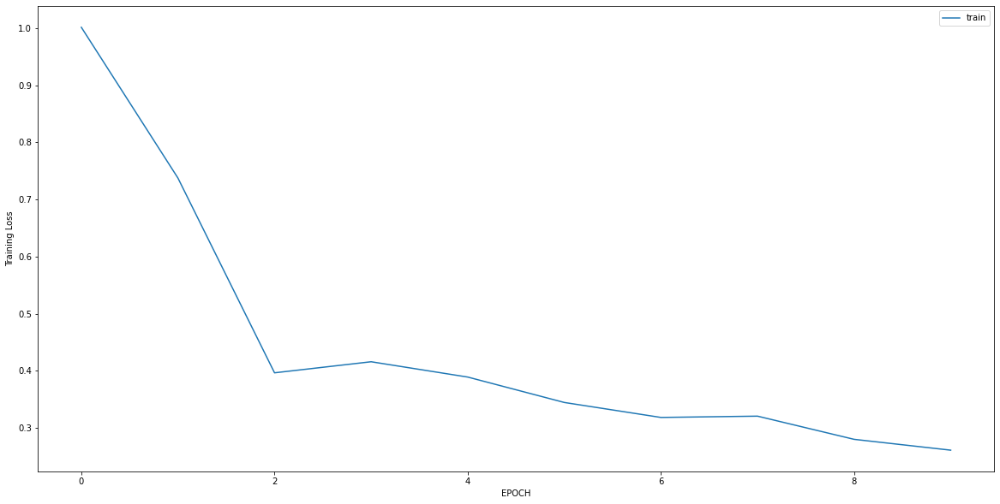

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8965 - accuracy: 0.6192
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3811 - accuracy: 0.8256
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2158 - accuracy: 0.9466
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1948 - accuracy: 0.9644
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1964 - accuracy: 0.9609
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1771 - accuracy: 0.9609
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1684 - accuracy: 0.9715
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1640 - accuracy: 0.9715
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1522 - accuracy: 0.9822
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1406 - accuracy: 0.9858


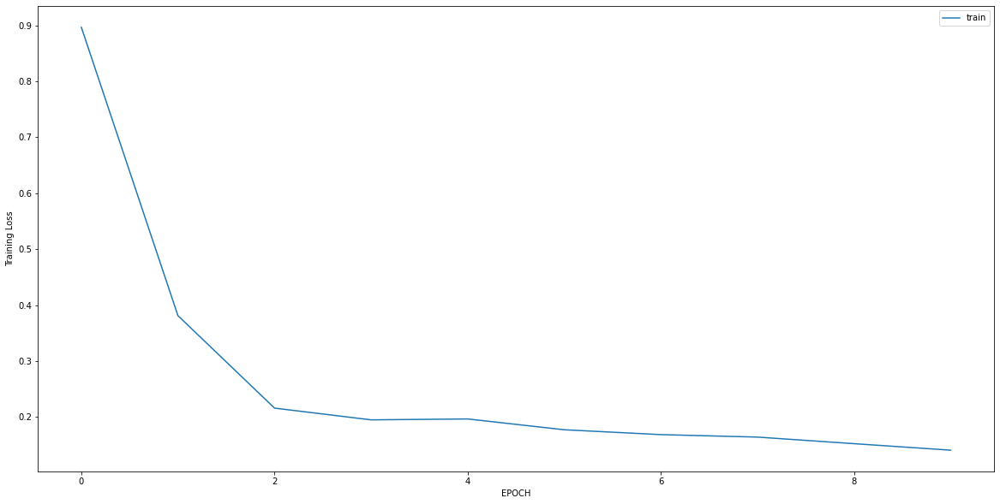

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.2080 - accuracy: 0.5516
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9542 - accuracy: 0.5552
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6492 - accuracy: 0.6050
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5706 - accuracy: 0.6690
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5360 - accuracy: 0.7011
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4650 - accuracy: 0.7829
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4797 - accuracy: 0.7153
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3683 - accuracy: 0.8861
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3561 - accuracy: 0.8897
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3190 - accuracy: 0.8968


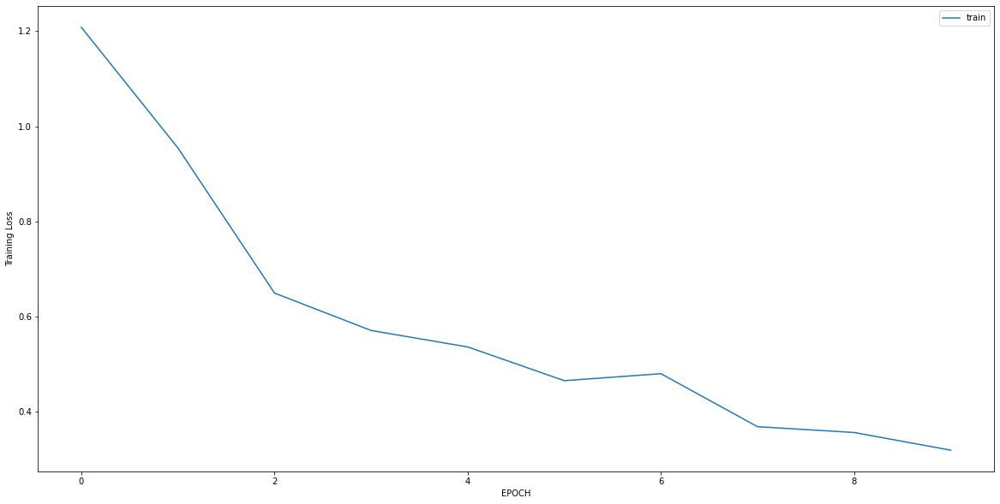

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5105 - accuracy: 0.8111
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4143 - accuracy: 0.8296
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4096 - accuracy: 0.8333
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3488 - accuracy: 0.8630
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3940 - accuracy: 0.8556
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2689 - accuracy: 0.9259
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2467 - accuracy: 0.9148
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2435 - accuracy: 0.9111
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2300 - accuracy: 0.9370
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2349 - accuracy: 0.9222


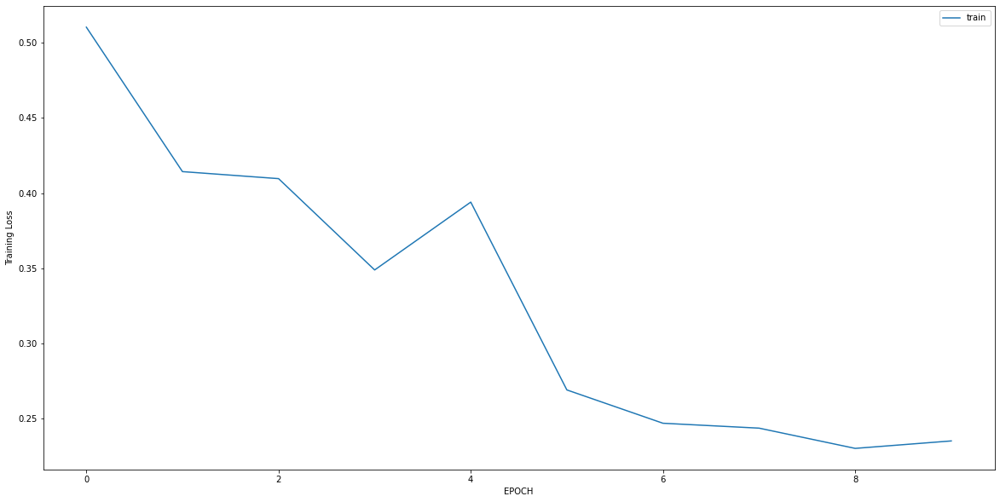

Epoch 1/10
8/8 [==============================] - 0s 8ms/step - loss: 0.3375 - accuracy: 0.8238
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2866 - accuracy: 0.8566
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2232 - accuracy: 0.9221
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2245 - accuracy: 0.9262
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2106 - accuracy: 0.9385
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1816 - accuracy: 0.9385
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1957 - accuracy: 0.9262
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1772 - accuracy: 0.9426
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1683 - accuracy: 0.9467
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1941 - accuracy: 0.9221


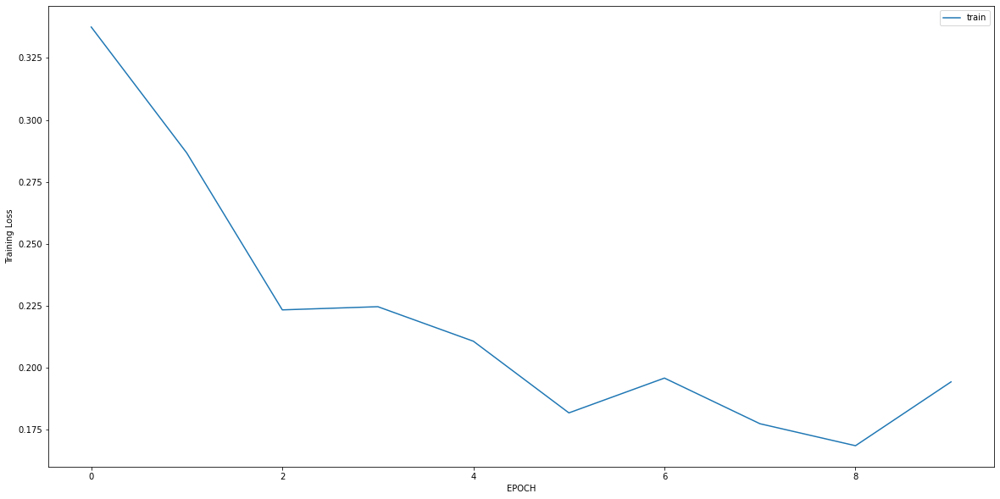

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 2.6320 - accuracy: 0.0030
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.0517 - accuracy: 0.3051
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1806 - accuracy: 0.9849
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0842 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0594 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0276 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000


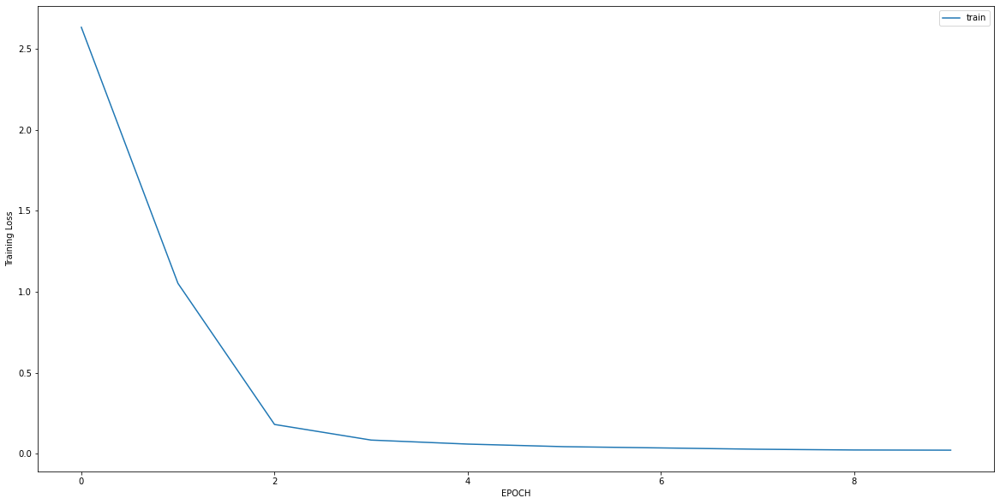

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.9037 - accuracy: 0.5688
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.6309 - accuracy: 0.6697
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5675 - accuracy: 0.6972
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4969 - accuracy: 0.7569
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4681 - accuracy: 0.7615
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4219 - accuracy: 0.8440
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3856 - accuracy: 0.8486
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3625 - accuracy: 0.8716
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3785 - accuracy: 0.8578
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3415 - accuracy: 0.8670


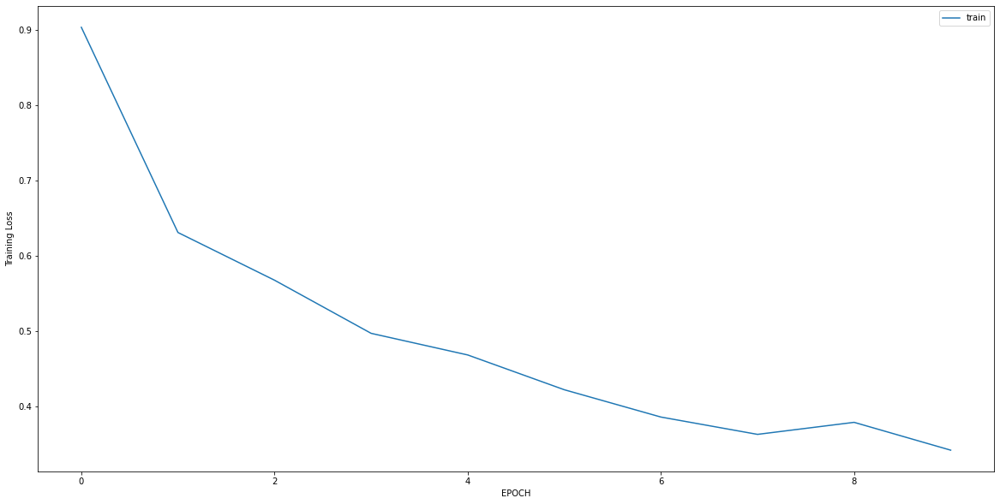

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.3165 - accuracy: 0.3993
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 1.0412 - accuracy: 0.4179
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6597 - accuracy: 0.5970
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5335 - accuracy: 0.7649
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4399 - accuracy: 0.8284
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3896 - accuracy: 0.8433
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3566 - accuracy: 0.8769
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4217 - accuracy: 0.8433
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3397 - accuracy: 0.8918
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3299 - accuracy: 0.9067


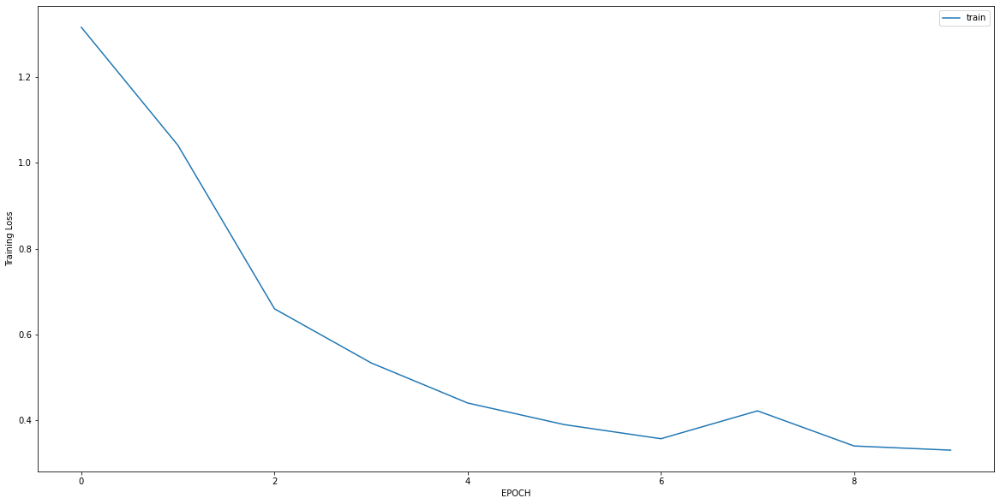

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6742 - accuracy: 0.7532
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4232 - accuracy: 0.8418
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3045 - accuracy: 0.9051
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2704 - accuracy: 0.9114
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2149 - accuracy: 0.9430
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2401 - accuracy: 0.9272
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2846 - accuracy: 0.9241
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2270 - accuracy: 0.9335
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2234 - accuracy: 0.9304
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1959 - accuracy: 0.9399


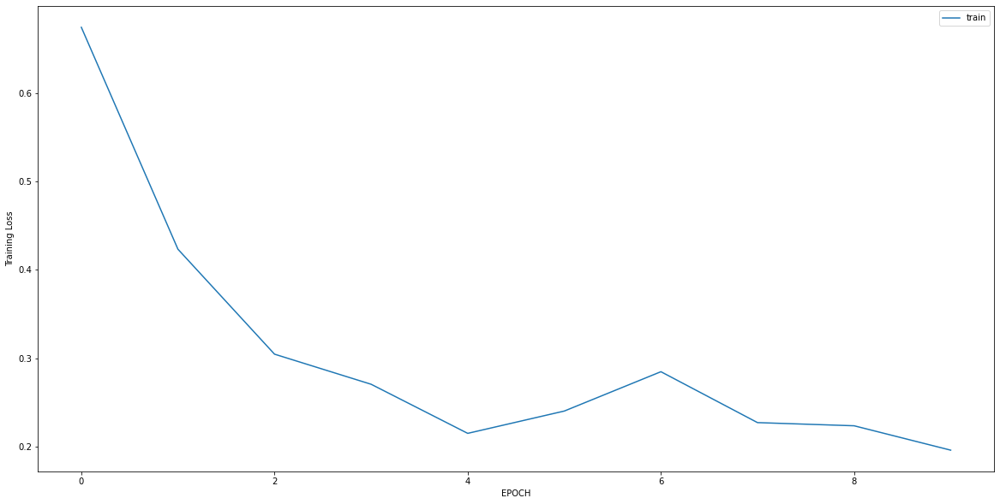

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2077 - accuracy: 0.9274
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1644 - accuracy: 0.9597
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1195 - accuracy: 0.9798
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1008 - accuracy: 0.9839
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0795 - accuracy: 0.9919
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0787 - accuracy: 0.9960
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0669 - accuracy: 0.9960
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0646 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0557 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0557 - accuracy: 0.9919


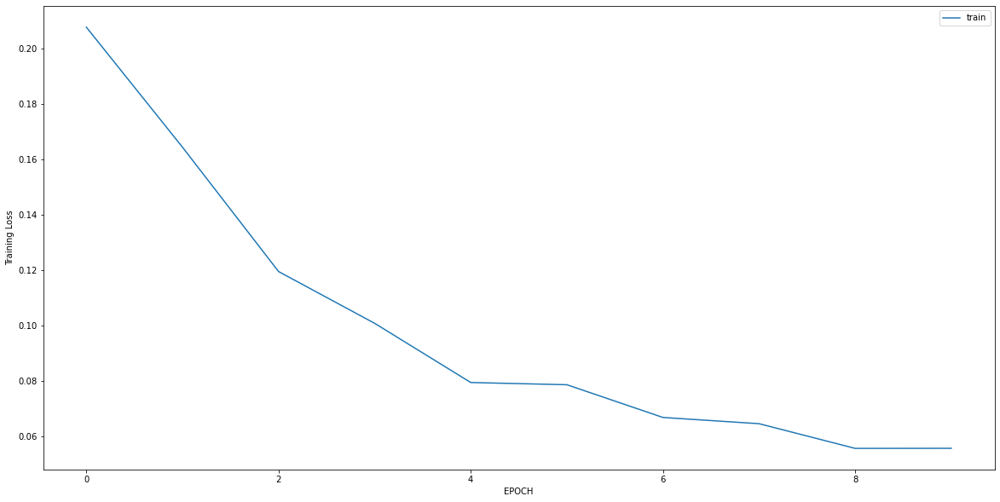

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2259 - accuracy: 0.9289
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2371 - accuracy: 0.9130
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2504 - accuracy: 0.8972
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2527 - accuracy: 0.9170
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2684 - accuracy: 0.9209
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2983 - accuracy: 0.9091
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2366 - accuracy: 0.9170
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1980 - accuracy: 0.9130
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2060 - accuracy: 0.9289
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1857 - accuracy: 0.9289


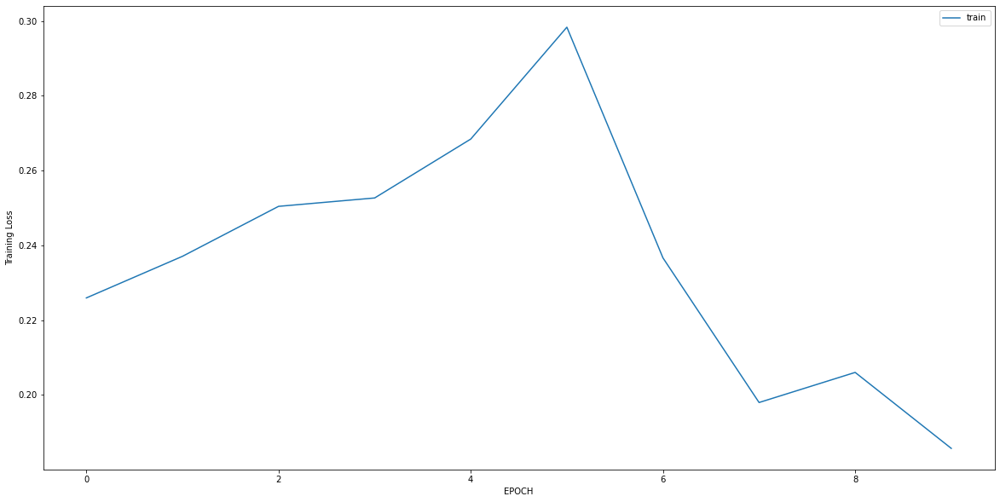

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4872 - accuracy: 0.7547
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2955 - accuracy: 0.8830
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2902 - accuracy: 0.9019
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3261 - accuracy: 0.8981
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3380 - accuracy: 0.8868
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3391 - accuracy: 0.8868
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3168 - accuracy: 0.8943
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2591 - accuracy: 0.9094
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2742 - accuracy: 0.8943
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2635 - accuracy: 0.9057


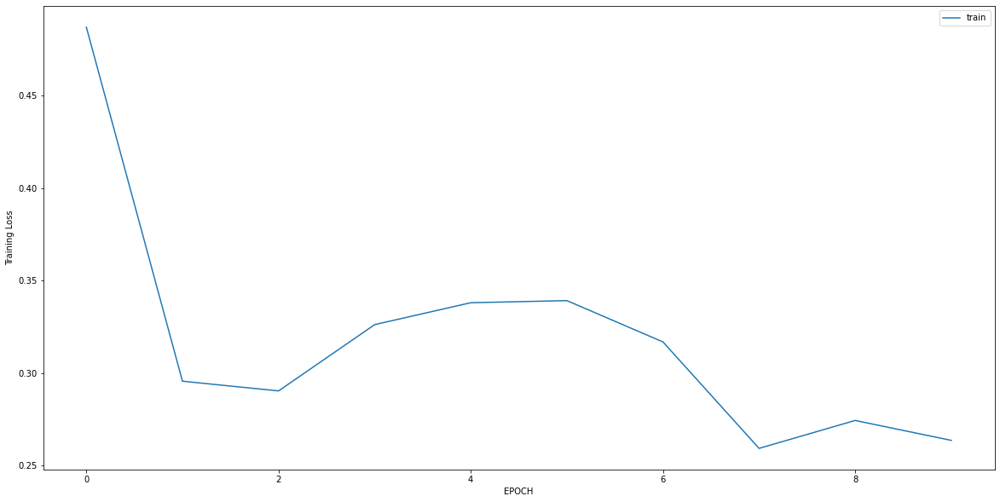

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 3.1602 - accuracy: 0.0000e+00
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 1.1855 - accuracy: 0.3802
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2000 - accuracy: 0.9840
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0935 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0490 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0283 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0314 - accuracy: 1.0000


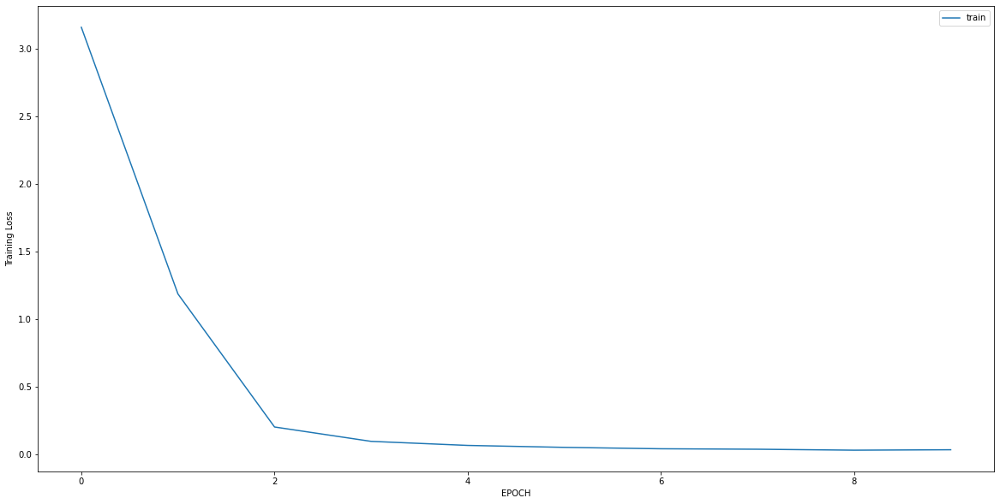

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4044 - accuracy: 0.8408
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0522 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0122 - accuracy: 1.0000


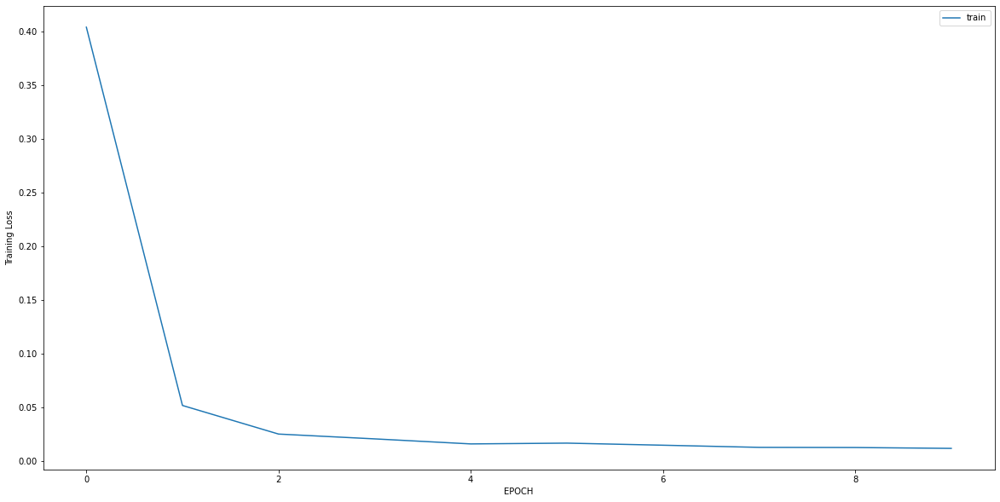

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0090 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0085 - accuracy: 1.0000


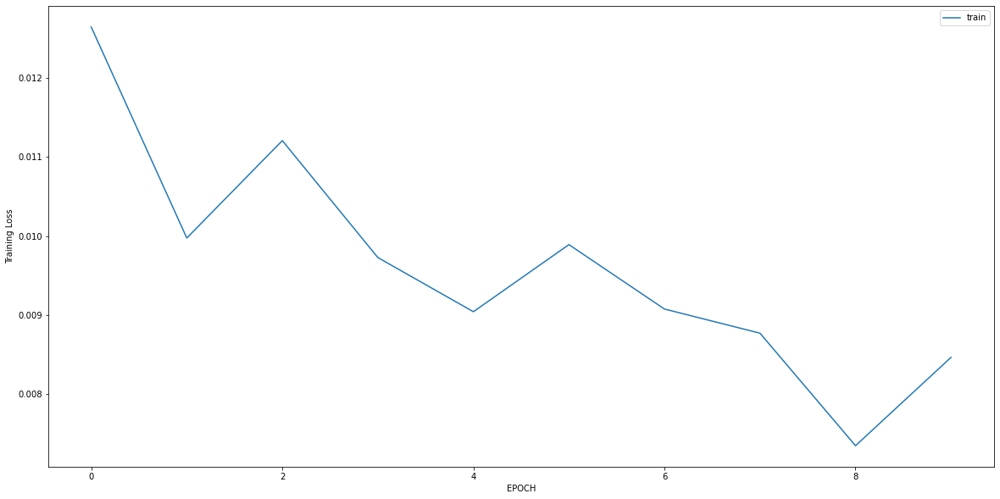

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.9742 - accuracy: 0.3527
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 1.2549 - accuracy: 0.5174
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.7601 - accuracy: 0.6659
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5234 - accuracy: 0.7726
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3873 - accuracy: 0.8283
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3396 - accuracy: 0.8515
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2986 - accuracy: 0.8747
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2721 - accuracy: 0.9072
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2592 - accuracy: 0.9095
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2590 - accuracy: 0.8910


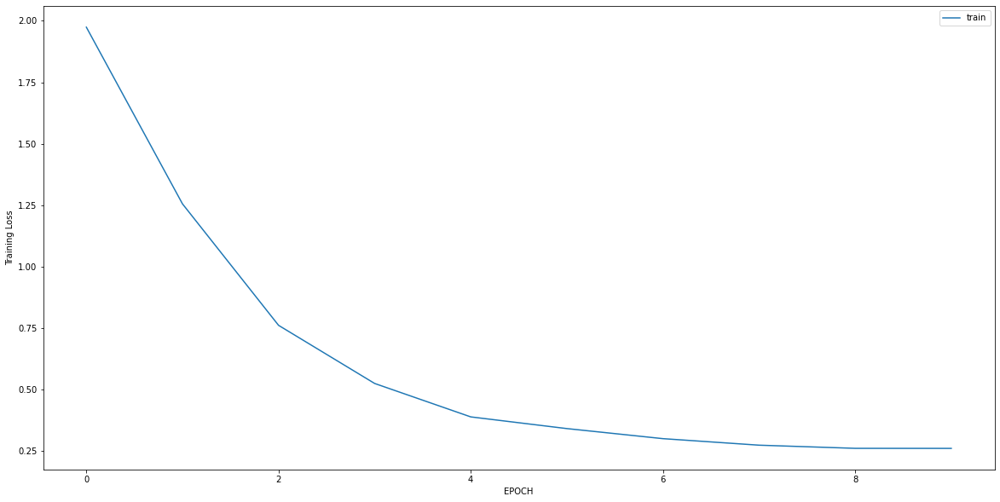

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6074 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6010 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5928 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4683 - accuracy: 0.8228
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5416 - accuracy: 0.8228
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4732 - accuracy: 0.8228
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4427 - accuracy: 0.8228
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4044 - accuracy: 0.8228
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4096 - accuracy: 0.8228
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3846 - accuracy: 0.8228


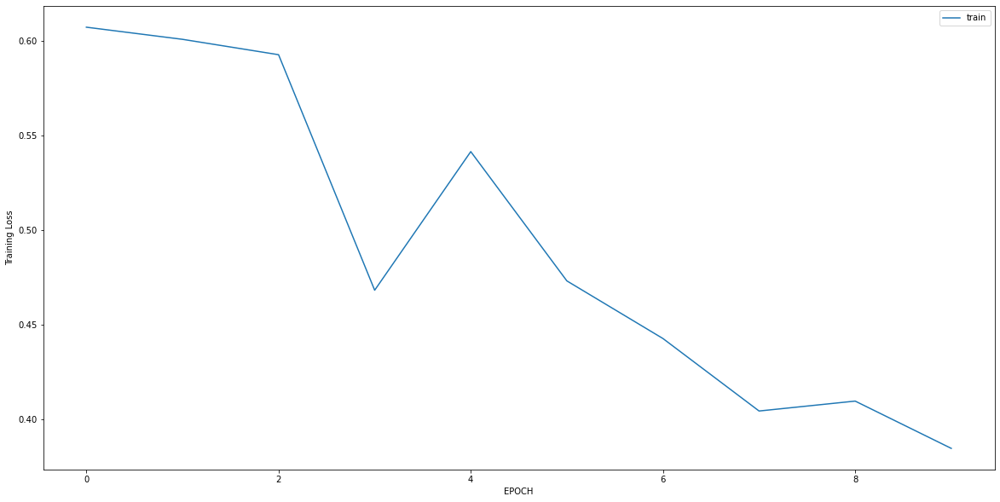

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6912 - accuracy: 0.5238
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3955 - accuracy: 0.8730
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3355 - accuracy: 0.9167
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3100 - accuracy: 0.9206
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3211 - accuracy: 0.9206
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3007 - accuracy: 0.9286
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3022 - accuracy: 0.9286
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2930 - accuracy: 0.9325
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2787 - accuracy: 0.9365
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2805 - accuracy: 0.9325


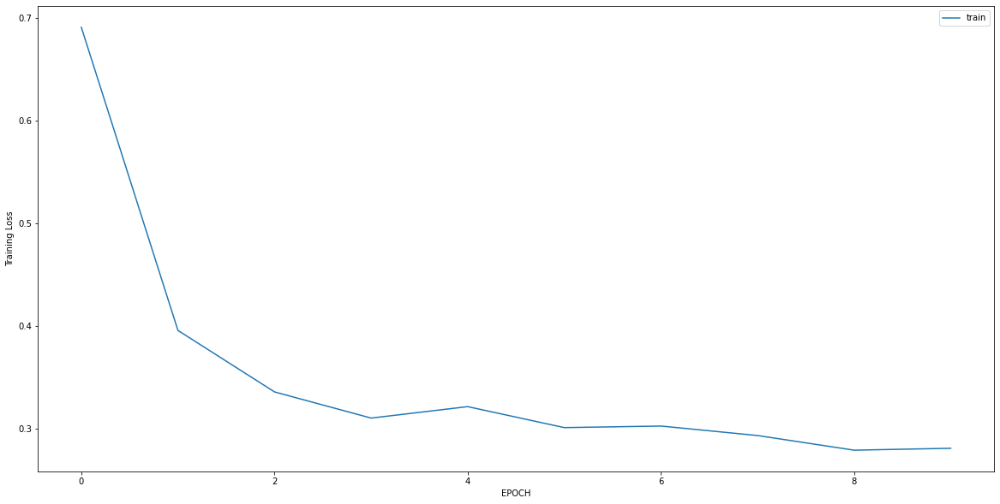

Epoch 1/10
2/2 [==============================] - 0s 6ms/step - loss: 1.3387 - accuracy: 0.0357
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 1.0813 - accuracy: 0.2500
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3875 - accuracy: 0.8929
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 0.2972 - accuracy: 0.9643
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 0.2114 - accuracy: 0.9821
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1641 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1221 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 5ms/step - loss: 0.1092 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0939 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0851 - accuracy: 1.0000


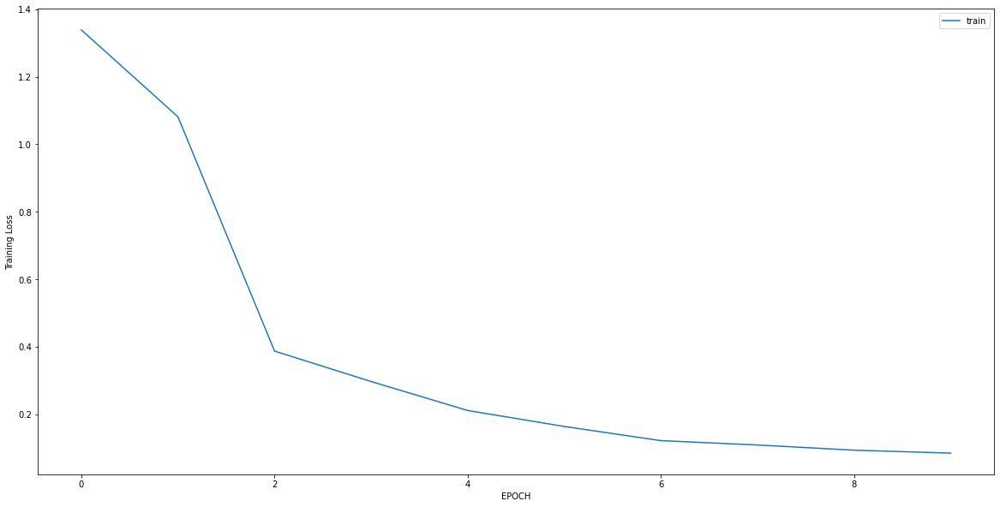

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9134 - accuracy: 0.5704
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6306 - accuracy: 0.7560
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5197 - accuracy: 0.7938
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4473 - accuracy: 0.8144
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3811 - accuracy: 0.8488
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3073 - accuracy: 0.9003
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2208 - accuracy: 0.9210
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1984 - accuracy: 0.9381
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1784 - accuracy: 0.9450
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1525 - accuracy: 0.9656


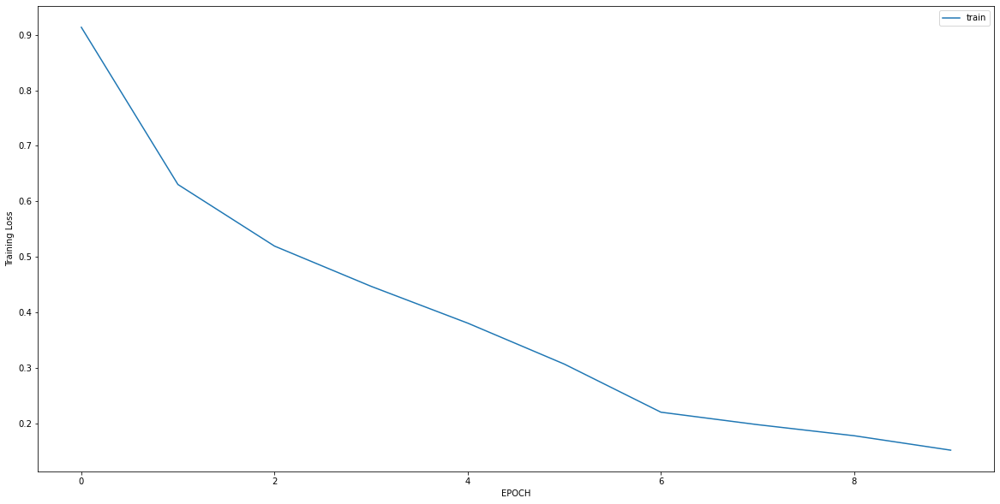

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5929 - accuracy: 0.7895
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5145 - accuracy: 0.8097
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4450 - accuracy: 0.8138
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3173 - accuracy: 0.8502
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2538 - accuracy: 0.9271
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1773 - accuracy: 0.9676
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1607 - accuracy: 0.9676
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1284 - accuracy: 0.9717
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1246 - accuracy: 0.9757
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1083 - accuracy: 0.9757


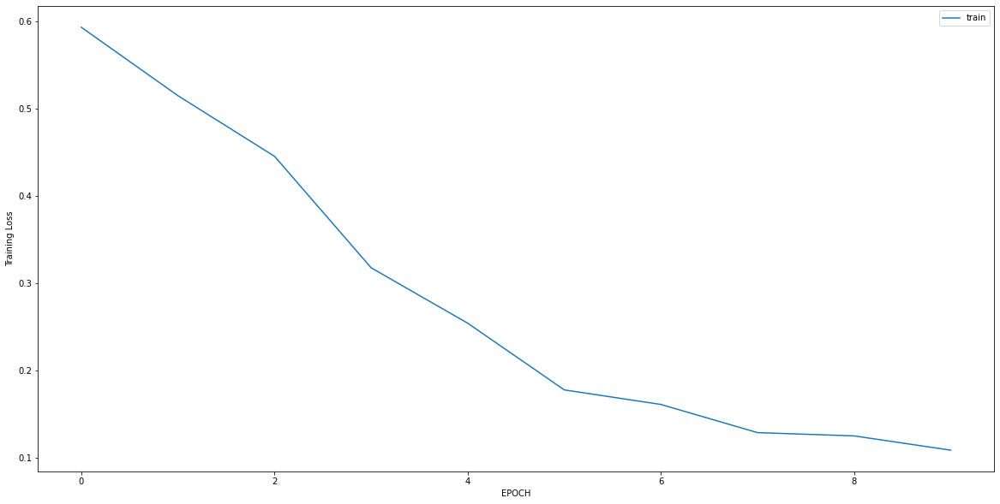

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9215 - accuracy: 0.6806
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7787 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6174 - accuracy: 0.6944
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5369 - accuracy: 0.7014
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4716 - accuracy: 0.7917
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3920 - accuracy: 0.8542
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3702 - accuracy: 0.8403
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4134 - accuracy: 0.8333
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3903 - accuracy: 0.8264
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3528 - accuracy: 0.8750


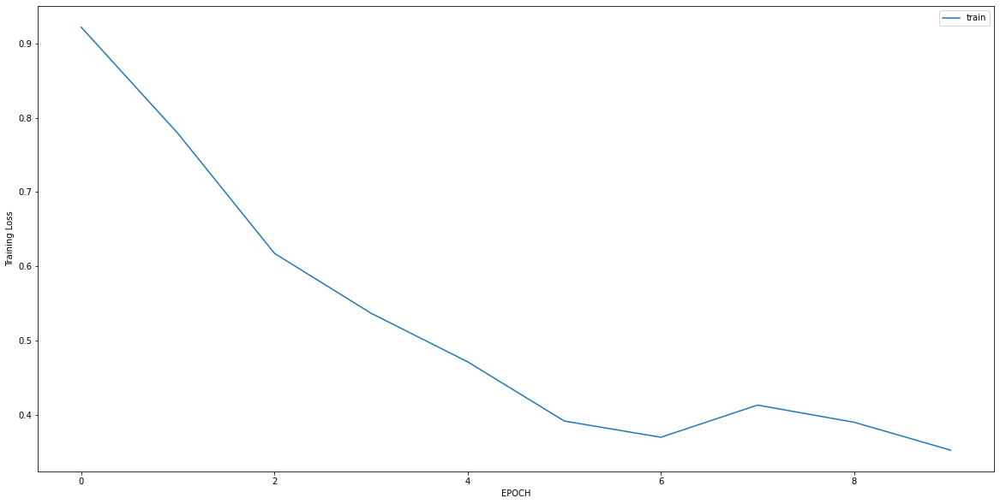

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3100 - accuracy: 0.9091
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2937 - accuracy: 0.8956
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2939 - accuracy: 0.9057
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2739 - accuracy: 0.9158
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2489 - accuracy: 0.9125
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2675 - accuracy: 0.9024
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3026 - accuracy: 0.8956
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3083 - accuracy: 0.8822
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2893 - accuracy: 0.8990
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2370 - accuracy: 0.9192


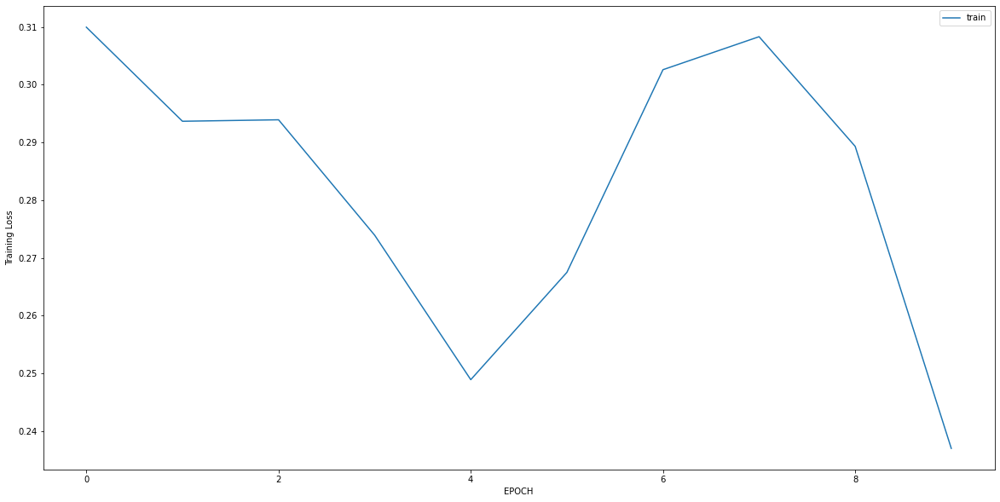

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3585 - accuracy: 0.8736
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 0.1189 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 9ms/step - loss: 0.0829 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 8ms/step - loss: 0.0815 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 9ms/step - loss: 0.0612 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 0.0490 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 1.0000


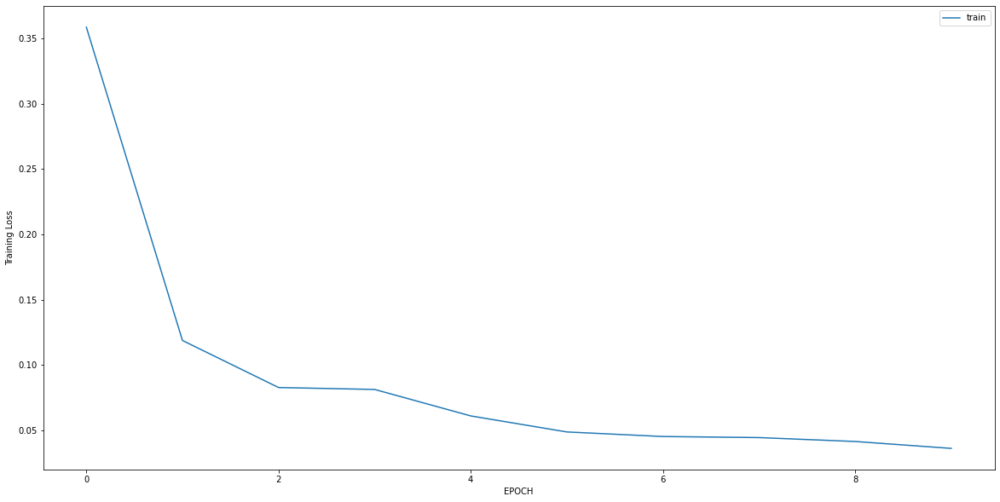

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.1436 - accuracy: 0.0038
Epoch 2/10
9/9 [==============================] - 0s 7ms/step - loss: 1.1008 - accuracy: 0.2008
Epoch 3/10
9/9 [==============================] - 0s 8ms/step - loss: 0.5061 - accuracy: 0.8258
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2340 - accuracy: 0.9924
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1135 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 9ms/step - loss: 0.0633 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 13ms/step - loss: 0.0439 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 11ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 19ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 16ms/step - loss: 0.0252 - accuracy: 1.0000


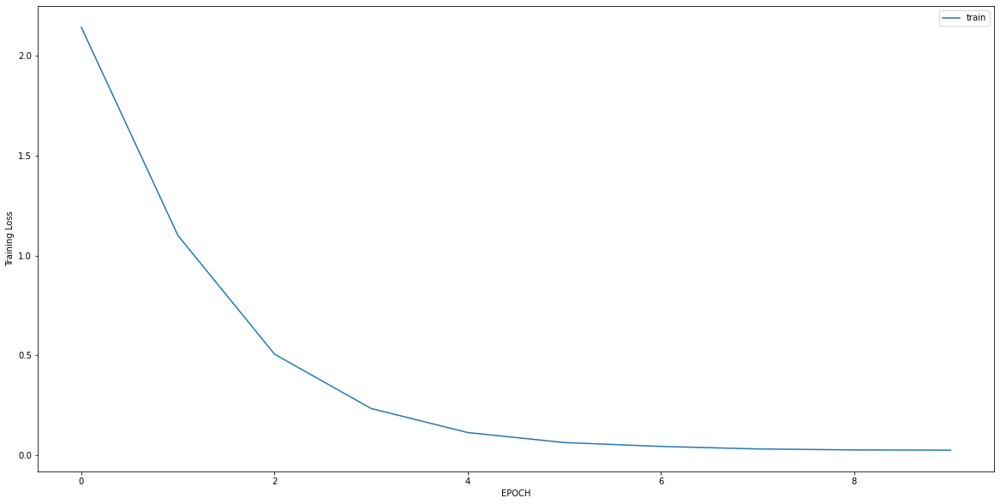

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.8340 - accuracy: 0.6287
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 0.5685 - accuracy: 0.6949
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4161 - accuracy: 0.7647
Epoch 4/10
9/9 [==============================] - 0s 10ms/step - loss: 0.3534 - accuracy: 0.8272
Epoch 5/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2806 - accuracy: 0.8824
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2425 - accuracy: 0.9191
Epoch 7/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2416 - accuracy: 0.9154
Epoch 8/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2037 - accuracy: 0.9485
Epoch 9/10
9/9 [==============================] - 0s 10ms/step - loss: 0.1799 - accuracy: 0.9522
Epoch 10/10
9/9 [==============================] - 0s 13ms/step - loss: 0.1814 - accuracy: 0.9485


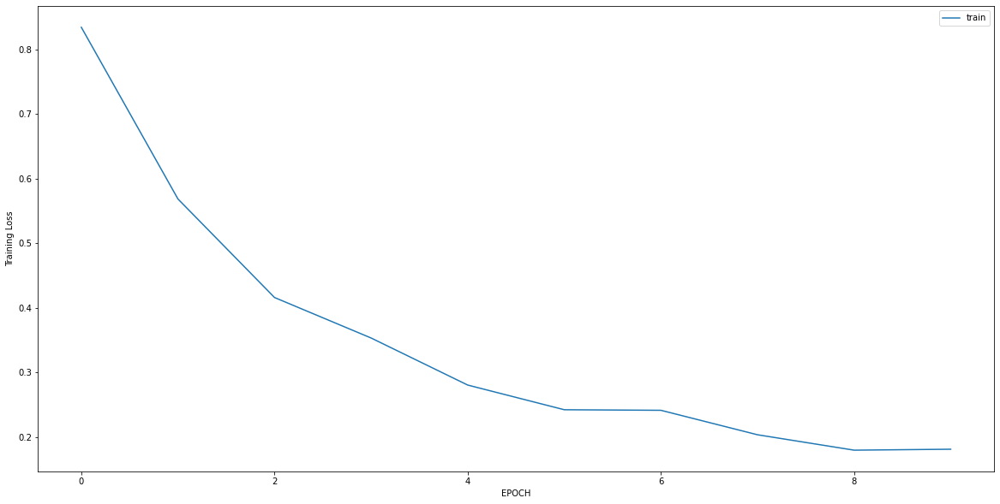

Epoch 1/10
11/11 [==============================] - 0s 8ms/step - loss: 1.2794 - accuracy: 0.2087
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0667 - accuracy: 0.9969
Epoch 3/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0114 - accuracy: 1.0000


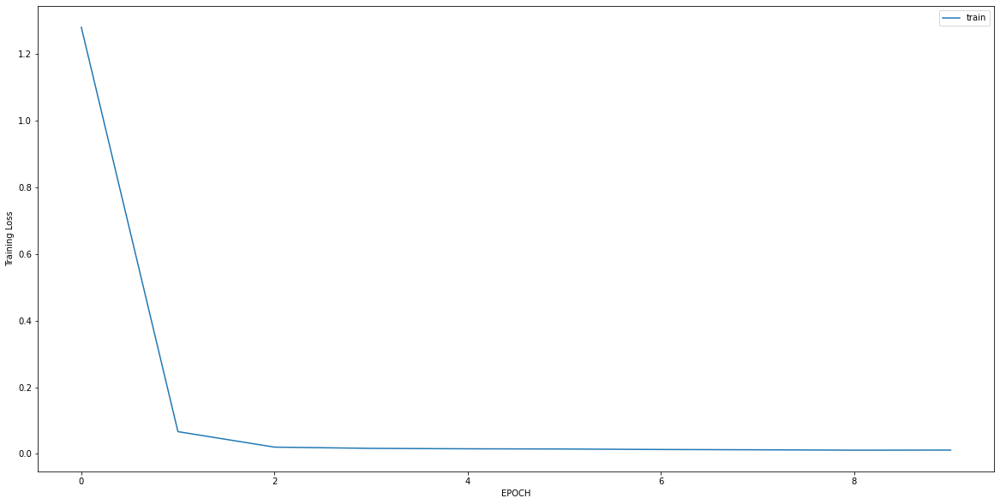

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.9103 - accuracy: 0.5339
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.4208 - accuracy: 0.5339
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0367 - accuracy: 0.5636
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6942 - accuracy: 0.6271
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6085 - accuracy: 0.7034
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5038 - accuracy: 0.7627
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4354 - accuracy: 0.8136
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3826 - accuracy: 0.8644
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3660 - accuracy: 0.9068
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3305 - accuracy: 0.9110


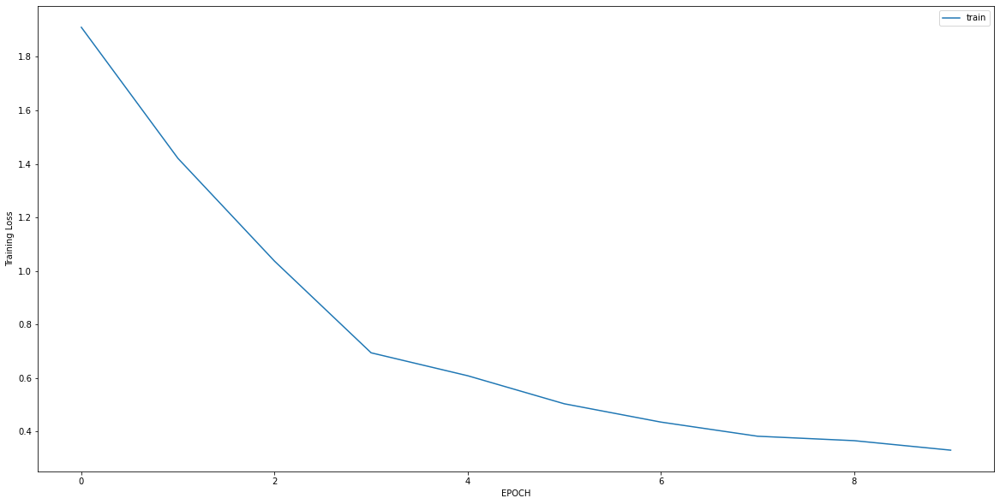

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4793 - accuracy: 0.8571
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3190 - accuracy: 0.9059
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3347 - accuracy: 0.8606
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2929 - accuracy: 0.9059
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3112 - accuracy: 0.8920
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2958 - accuracy: 0.9164
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3133 - accuracy: 0.8850
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2772 - accuracy: 0.8990
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2939 - accuracy: 0.9094
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2965 - accuracy: 0.8885


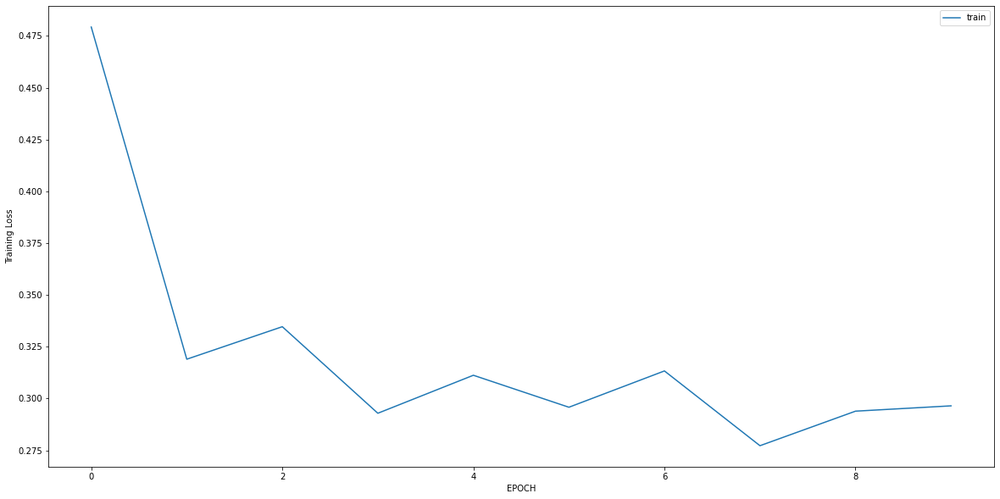

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3333 - accuracy: 0.8986
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3230 - accuracy: 0.8841
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2749 - accuracy: 0.9420
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3297 - accuracy: 0.8696
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2862 - accuracy: 0.8841
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2593 - accuracy: 0.9203
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2604 - accuracy: 0.9203
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2329 - accuracy: 0.9203
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2217 - accuracy: 0.9275
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1986 - accuracy: 0.9493


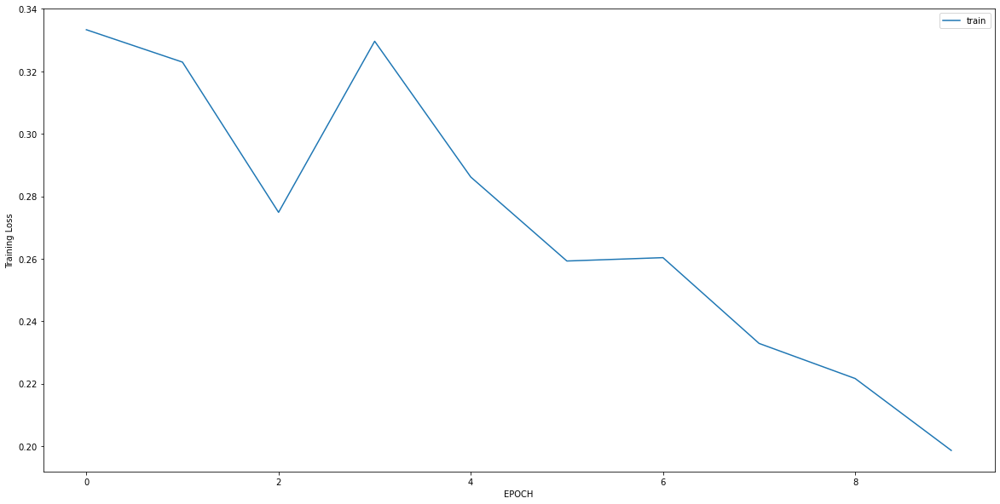

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4374 - accuracy: 0.8498
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4133 - accuracy: 0.8538
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3619 - accuracy: 0.8656
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3815 - accuracy: 0.8696
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2973 - accuracy: 0.9012
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3107 - accuracy: 0.9051
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2871 - accuracy: 0.9091
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2479 - accuracy: 0.9407
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2048 - accuracy: 0.9605
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1903 - accuracy: 0.9526


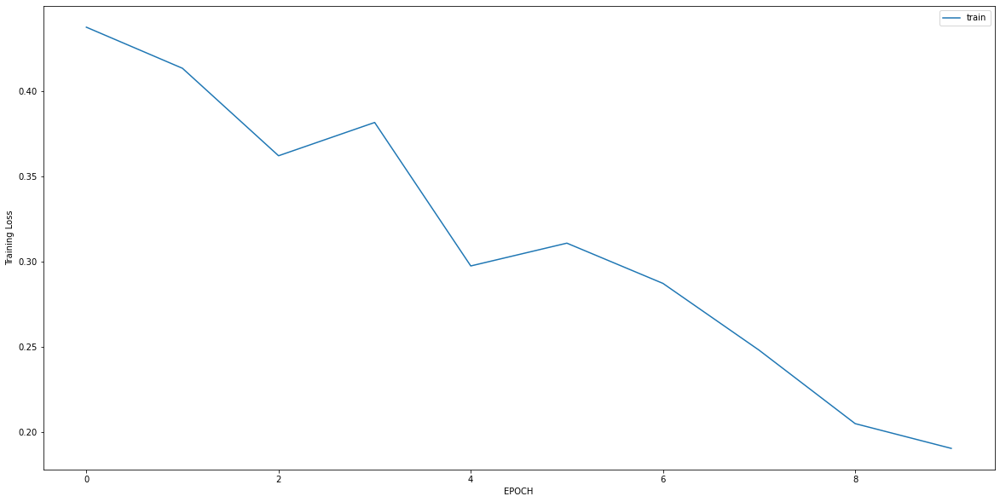

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8611 - accuracy: 0.5228
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4823 - accuracy: 0.6912
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3314 - accuracy: 0.8807
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3322 - accuracy: 0.8737
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3113 - accuracy: 0.8912
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2681 - accuracy: 0.9088
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2625 - accuracy: 0.9193
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2397 - accuracy: 0.9263
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2400 - accuracy: 0.9158
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2195 - accuracy: 0.9298


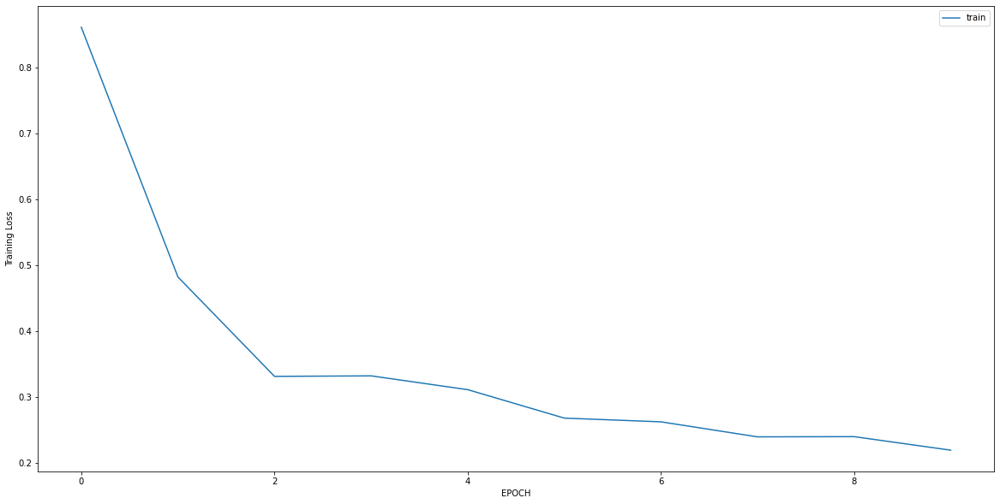

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3545 - accuracy: 0.8608
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3083 - accuracy: 0.8692
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2714 - accuracy: 0.8776
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2226 - accuracy: 0.8987
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1750 - accuracy: 0.9283
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1341 - accuracy: 0.9620
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1346 - accuracy: 0.9705
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1227 - accuracy: 0.9662
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0937 - accuracy: 0.9789
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0907 - accuracy: 0.9831


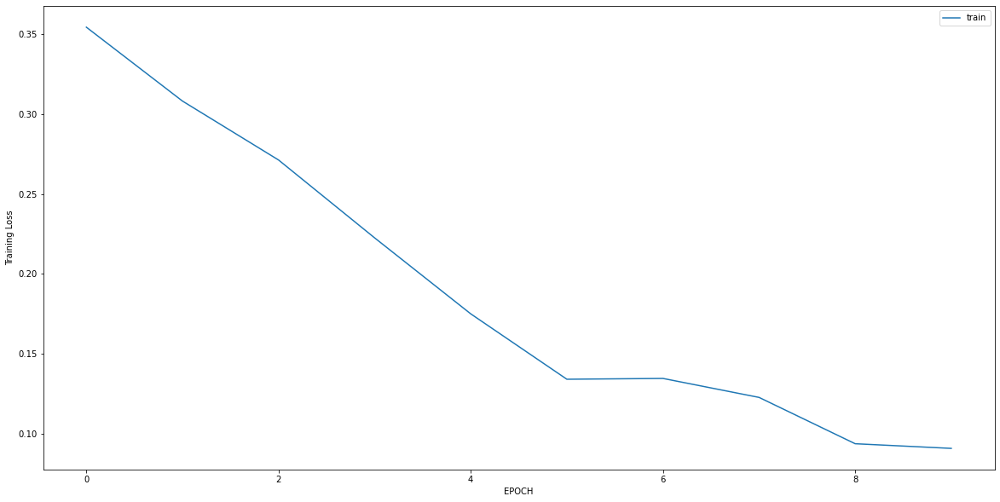

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3127 - accuracy: 0.8808
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2383 - accuracy: 0.8974
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2059 - accuracy: 0.9338
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1755 - accuracy: 0.9570
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1577 - accuracy: 0.9470
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1410 - accuracy: 0.9603
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1525 - accuracy: 0.9570
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1361 - accuracy: 0.9570
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0997 - accuracy: 0.9768
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1087 - accuracy: 0.9735


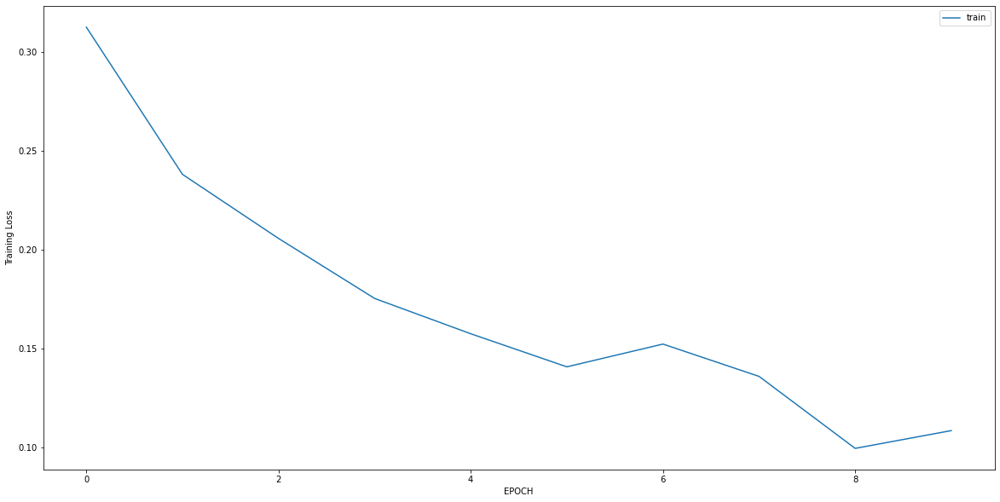

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 3.4962 - accuracy: 0.0340
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1943 - accuracy: 0.9286
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0344 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0319 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 8ms/step - loss: 0.0301 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0299 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0293 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 1.0000


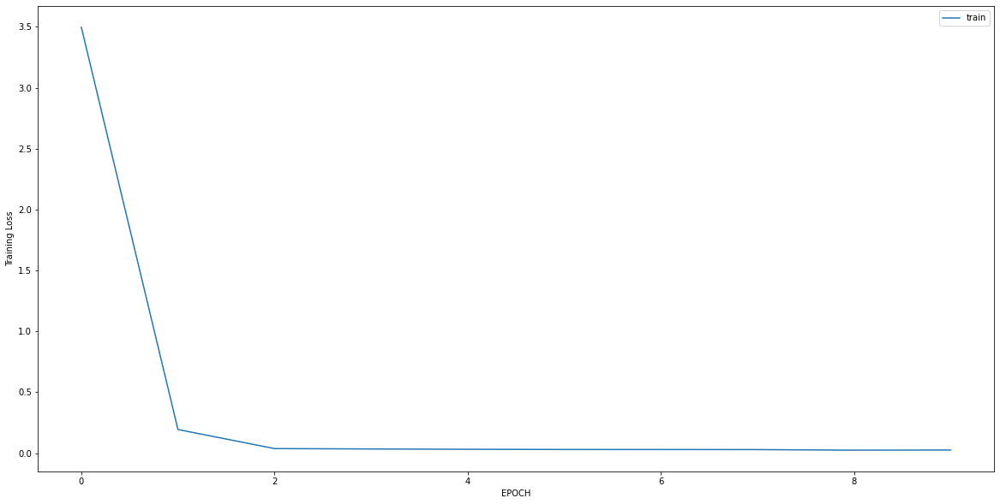

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0212 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0184 - accuracy: 1.0000


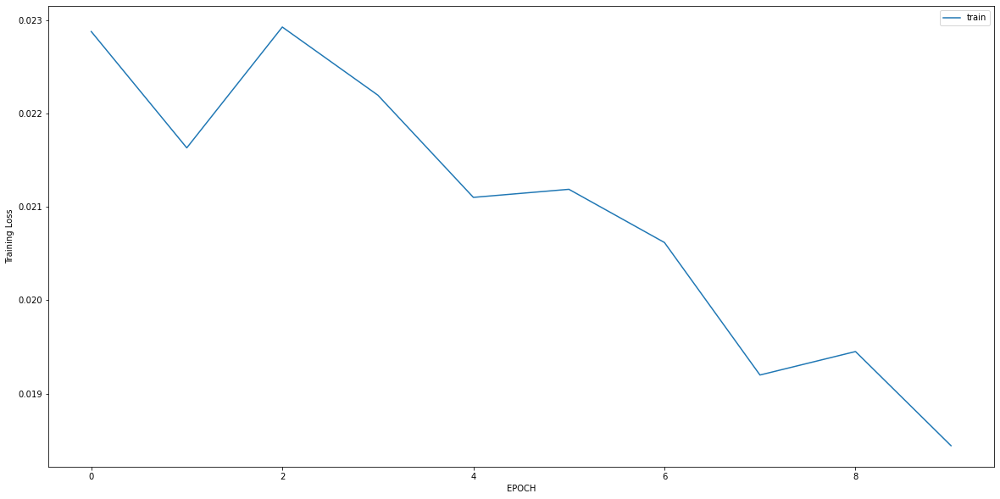

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.8332 - accuracy: 0.7429
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6537 - accuracy: 0.8213
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4889 - accuracy: 0.8621
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4635 - accuracy: 0.8276
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5520 - accuracy: 0.7461
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3003 - accuracy: 0.8871
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2688 - accuracy: 0.8997
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1686 - accuracy: 0.9185
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1053 - accuracy: 0.9687
Epoch 10/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0877 - accuracy: 0.9781


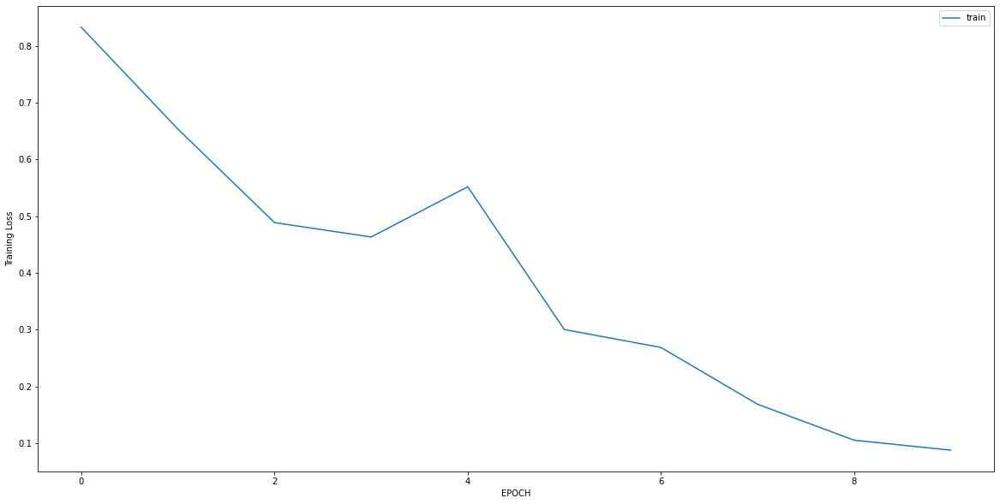

Epoch 1/10
6/6 [==============================] - 0s 7ms/step - loss: 1.8859 - accuracy: 0.0278
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.8048 - accuracy: 0.5111
Epoch 3/10
6/6 [==============================] - 0s 7ms/step - loss: 0.1670 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 7ms/step - loss: 0.0849 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 8ms/step - loss: 0.0585 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 8ms/step - loss: 0.0463 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 7ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 7ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0350 - accuracy: 1.0000


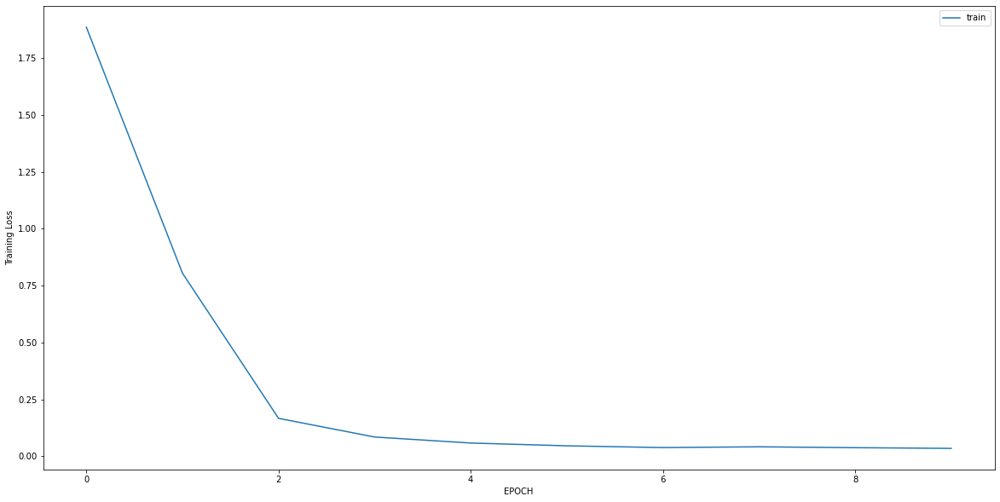

Epoch 1/10
7/7 [==============================] - 0s 9ms/step - loss: 0.4685 - accuracy: 0.7406
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4306 - accuracy: 0.7925
Epoch 3/10
7/7 [==============================] - 0s 8ms/step - loss: 0.3985 - accuracy: 0.8208
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4255 - accuracy: 0.7830
Epoch 5/10
7/7 [==============================] - 0s 8ms/step - loss: 0.3668 - accuracy: 0.8302
Epoch 6/10
7/7 [==============================] - 0s 6ms/step - loss: 0.3581 - accuracy: 0.8396
Epoch 7/10
7/7 [==============================] - 0s 8ms/step - loss: 0.3049 - accuracy: 0.8632
Epoch 8/10
7/7 [==============================] - 0s 7ms/step - loss: 0.2632 - accuracy: 0.8915
Epoch 9/10
7/7 [==============================] - 0s 6ms/step - loss: 0.2650 - accuracy: 0.8868
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2089 - accuracy: 0.9528


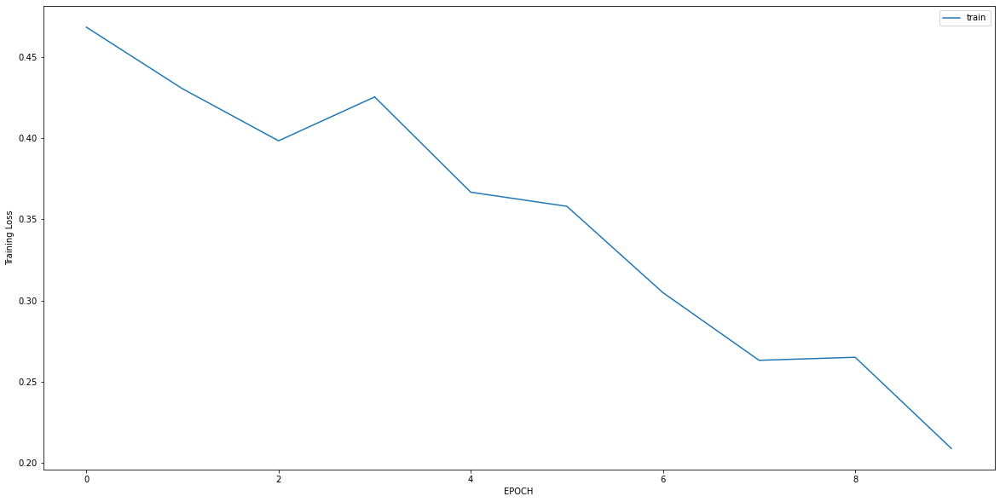

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.5574 - accuracy: 0.8386
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.3572 - accuracy: 0.8674
Epoch 3/10
11/11 [==============================] - 0s 7ms/step - loss: 0.2075 - accuracy: 0.9049
Epoch 4/10
11/11 [==============================] - 0s 7ms/step - loss: 0.1213 - accuracy: 0.9452
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0883 - accuracy: 0.9856
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0844 - accuracy: 0.9798
Epoch 7/10
11/11 [==============================] - 0s 7ms/step - loss: 0.0677 - accuracy: 0.9885
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0677 - accuracy: 0.9942
Epoch 9/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0531 - accuracy: 0.9914
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9914


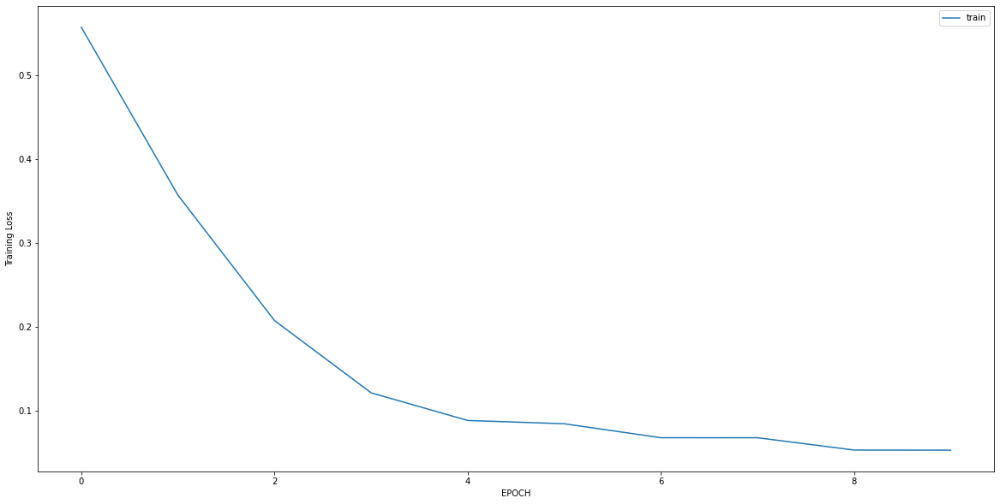

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 0.8636 - accuracy: 0.6327
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3578 - accuracy: 0.8367
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3781 - accuracy: 0.8163
Epoch 4/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2905 - accuracy: 0.8878
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2896 - accuracy: 0.8469
Epoch 6/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2757 - accuracy: 0.8571
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.2961 - accuracy: 0.8980
Epoch 8/10
4/4 [==============================] - 0s 6ms/step - loss: 0.5407 - accuracy: 0.8367
Epoch 9/10
4/4 [==============================] - 0s 4ms/step - loss: 0.4420 - accuracy: 0.8469
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3954 - accuracy: 0.8367


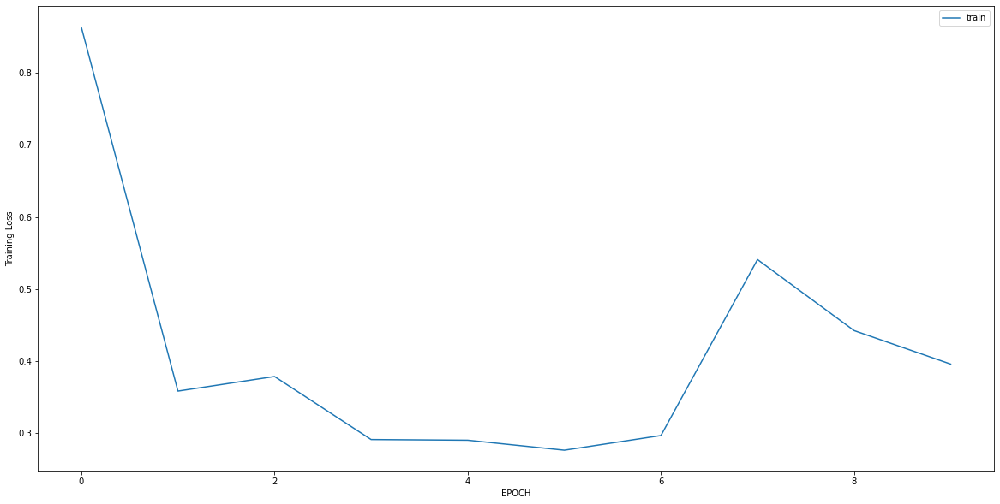

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 4.3910 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 3.3752 - accuracy: 0.0000e+00
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.9086 - accuracy: 0.0429
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8020 - accuracy: 0.4571
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3673 - accuracy: 0.9393
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 0.1969 - accuracy: 0.9964
Epoch 7/10
9/9 [==============================] - 0s 8ms/step - loss: 0.1277 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1054 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0803 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0645 - accuracy: 1.0000


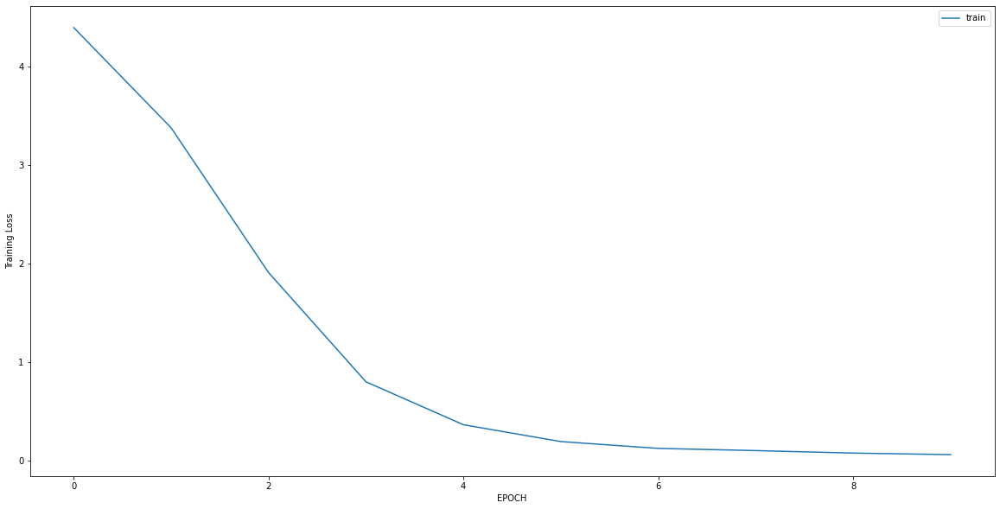

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0293 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0200 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0179 - accuracy: 1.0000


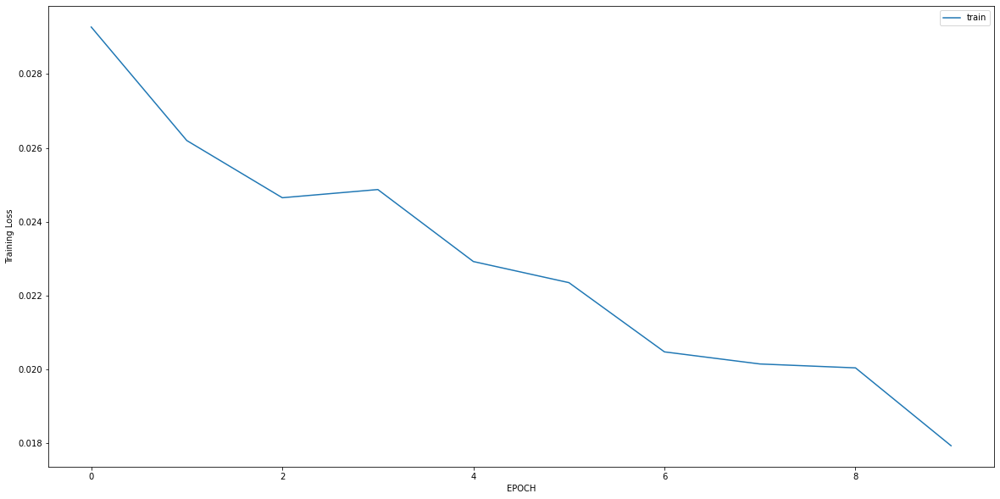

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.4105 - accuracy: 0.5731
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 1.1571 - accuracy: 0.5731
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.9592 - accuracy: 0.5760
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.7199 - accuracy: 0.5994
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.6082
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.6065 - accuracy: 0.6696
Epoch 7/10
11/11 [==============================] - 0s 6ms/step - loss: 0.5721 - accuracy: 0.7047
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.5198 - accuracy: 0.7661
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.5063 - accuracy: 0.7807
Epoch 10/10
11/11 [==============================] - 0s 7ms/step - loss: 0.4825 - accuracy: 0.7719


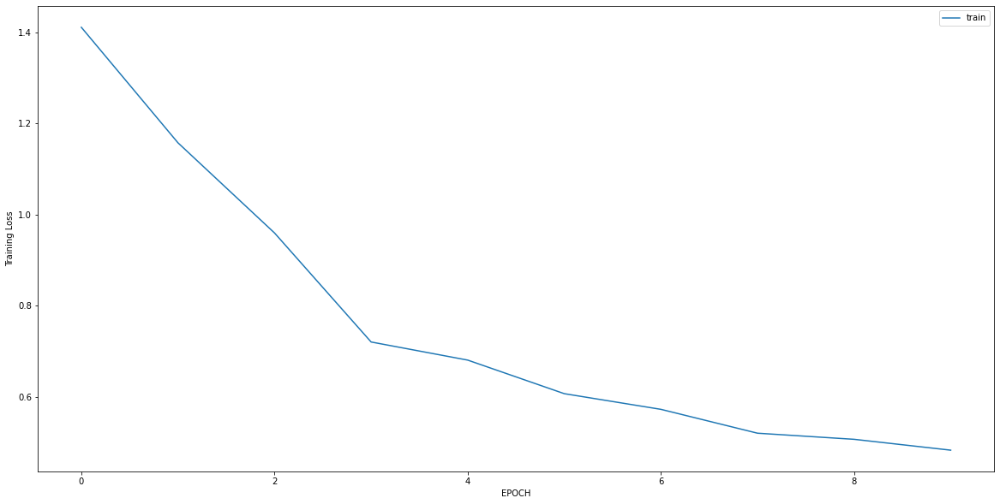

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4905 - accuracy: 0.8007
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4550 - accuracy: 0.8252
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4056 - accuracy: 0.8601
Epoch 4/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3728 - accuracy: 0.8671
Epoch 5/10
9/9 [==============================] - 0s 8ms/step - loss: 0.3930 - accuracy: 0.8706
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3438 - accuracy: 0.8951
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3586 - accuracy: 0.8916
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3329 - accuracy: 0.9091
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3351 - accuracy: 0.8986
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3149 - accuracy: 0.9126


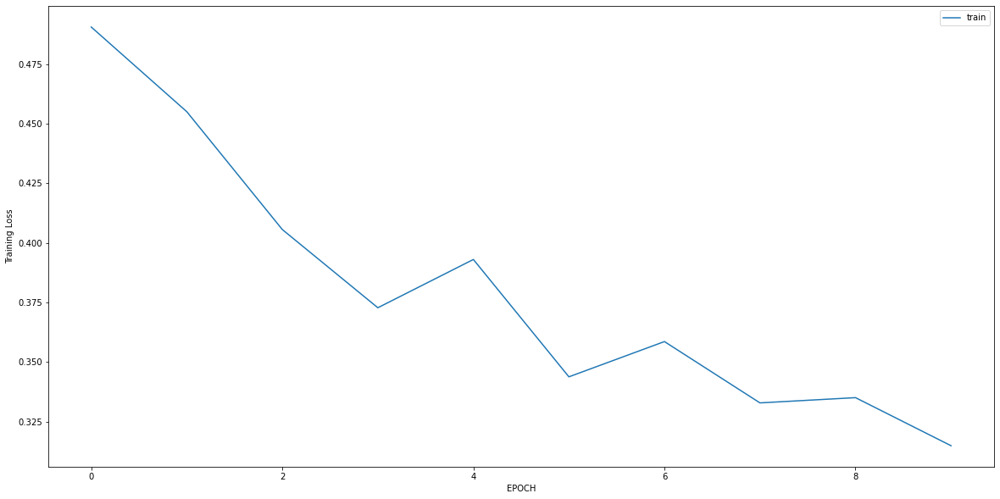

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.4479 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4215 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3896 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4088 - accuracy: 0.8101
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3606 - accuracy: 0.8312
Epoch 6/10
8/8 [==============================] - 0s 8ms/step - loss: 0.3672 - accuracy: 0.8186
Epoch 7/10
8/8 [==============================] - 0s 8ms/step - loss: 0.3734 - accuracy: 0.8270
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3720 - accuracy: 0.8228
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3442 - accuracy: 0.8312
Epoch 10/10
8/8 [==============================] - 0s 8ms/step - loss: 0.3454 - accuracy: 0.8354


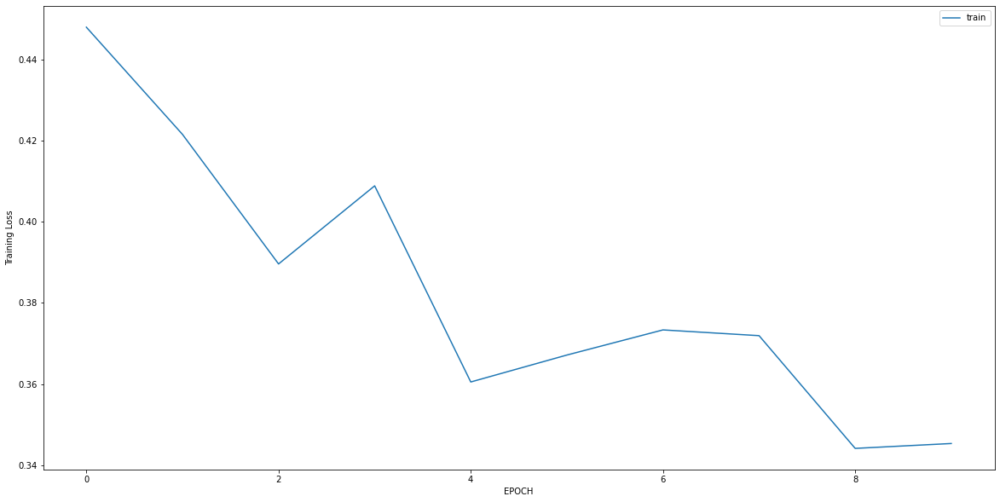

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5273 - accuracy: 0.6807
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5042 - accuracy: 0.7439
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4758 - accuracy: 0.7930
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4752 - accuracy: 0.7825
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4200 - accuracy: 0.8105
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4270 - accuracy: 0.8175
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3500 - accuracy: 0.8632
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3394 - accuracy: 0.8877
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3470 - accuracy: 0.8386
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3006 - accuracy: 0.8947


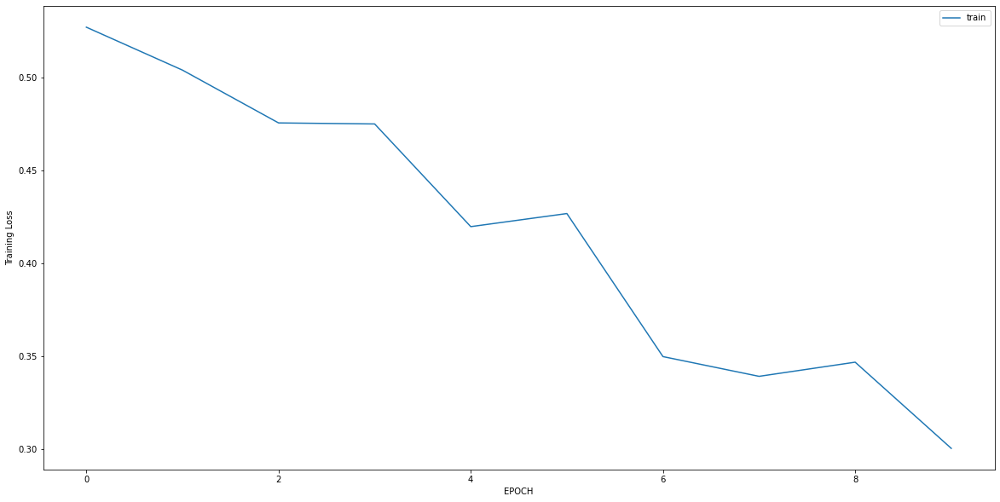

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4971 - accuracy: 0.4030
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5296 - accuracy: 0.7687
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3550 - accuracy: 0.8694
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3863 - accuracy: 0.8470
Epoch 5/10
9/9 [==============================] - 0s 10ms/step - loss: 0.3578 - accuracy: 0.8731
Epoch 6/10
9/9 [==============================] - 0s 9ms/step - loss: 0.3232 - accuracy: 0.8731
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3662 - accuracy: 0.8918
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3063 - accuracy: 0.9254
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2832 - accuracy: 0.9179
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2850 - accuracy: 0.9142


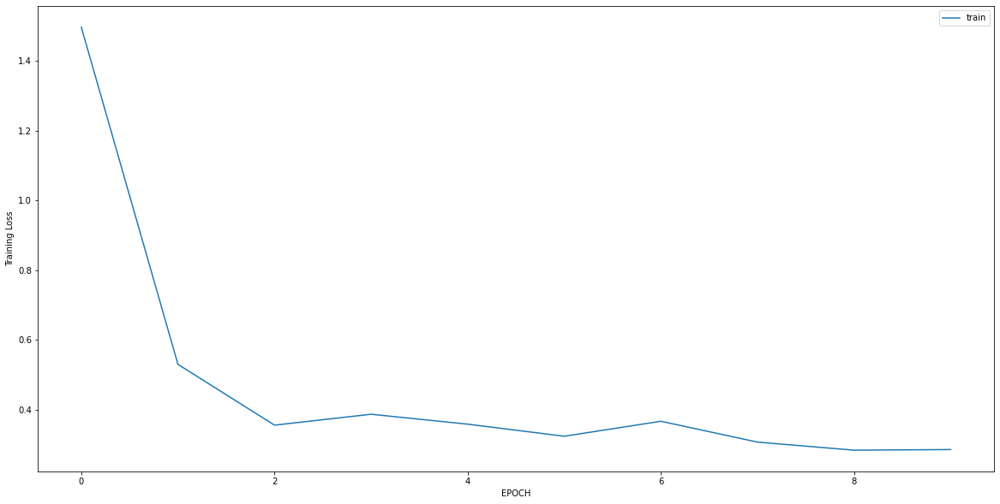

Epoch 1/10
6/6 [==============================] - 0s 7ms/step - loss: 0.1939 - accuracy: 0.9833
Epoch 2/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1316 - accuracy: 1.0000
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0863 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0604 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0555 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0510 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0483 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 9ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0351 - accuracy: 1.0000


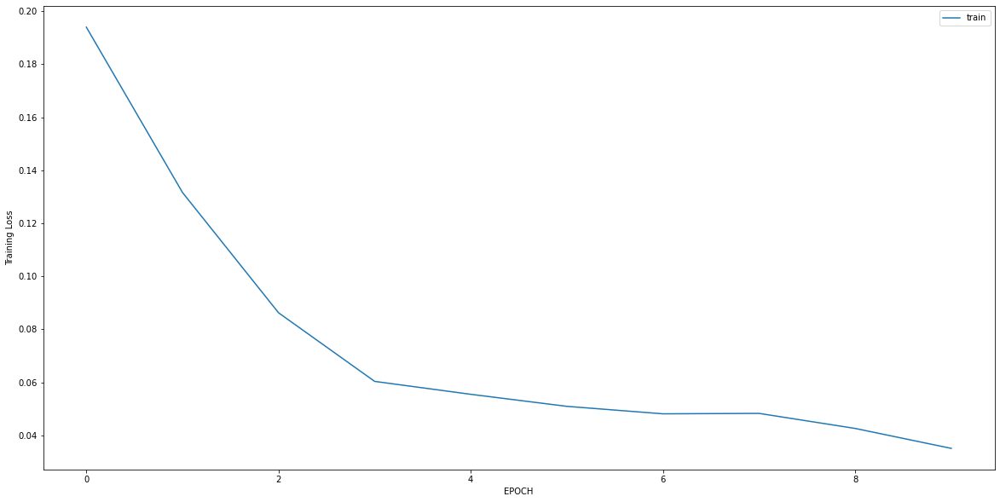

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0401 - accuracy: 1.0000
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 4ms/step - loss: 0.0292 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0291 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0377 - accuracy: 1.0000


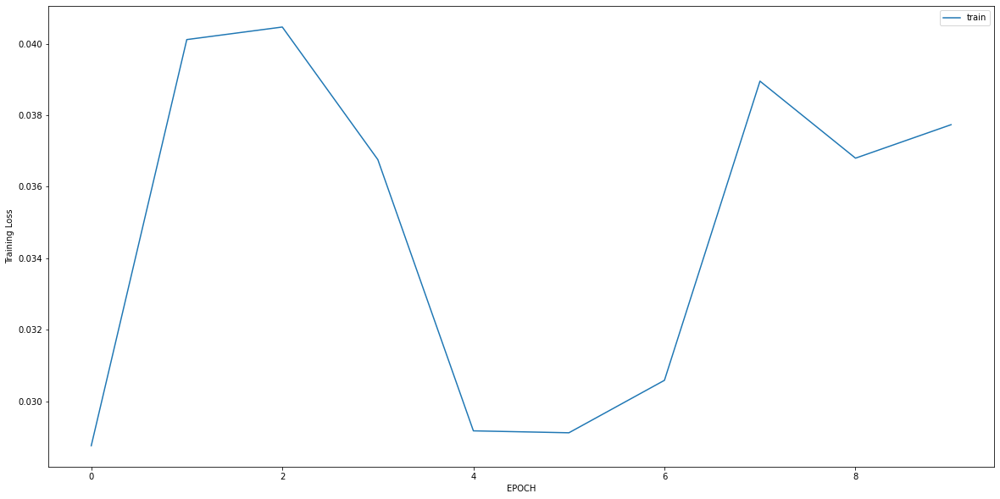

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 1.9572 - accuracy: 0.0321
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1580 - accuracy: 0.2250
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4598 - accuracy: 0.8214
Epoch 4/10
9/9 [==============================] - 0s 8ms/step - loss: 0.1575 - accuracy: 0.9964
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0948 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0579 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0591 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 1.0000


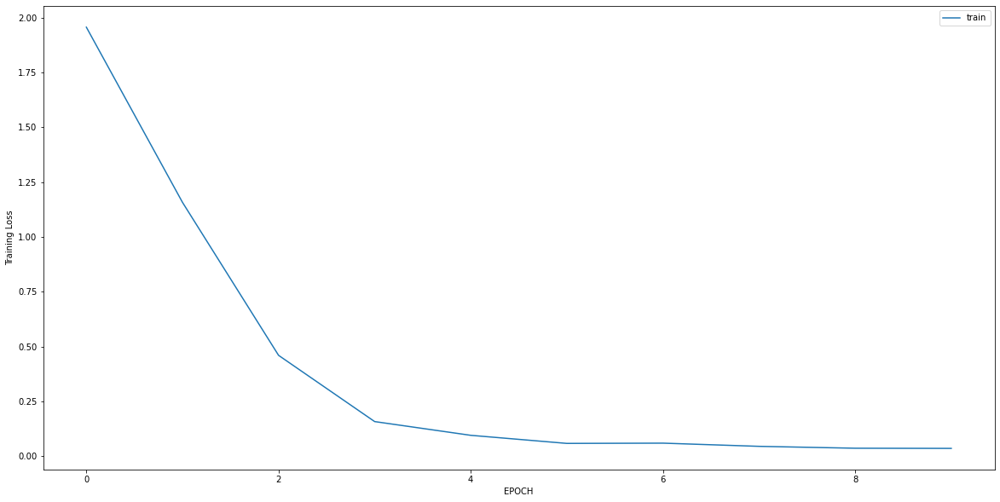

Epoch 1/10
9/9 [==============================] - 0s 8ms/step - loss: 2.0112 - accuracy: 0.4484
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6397 - accuracy: 0.4484
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.2613 - accuracy: 0.4484
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9052 - accuracy: 0.4982
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6184 - accuracy: 0.6014
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4446 - accuracy: 0.7509
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3422 - accuracy: 0.8505
Epoch 8/10
9/9 [==============================] - 0s 8ms/step - loss: 0.3141 - accuracy: 0.9004
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2339 - accuracy: 0.9359
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2147 - accuracy: 0.9466


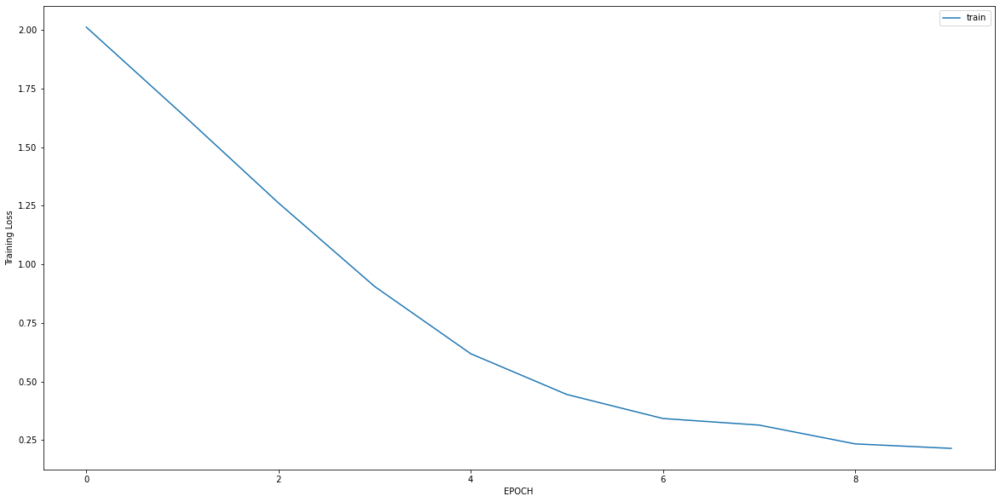

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0293 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0291 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 1.0000


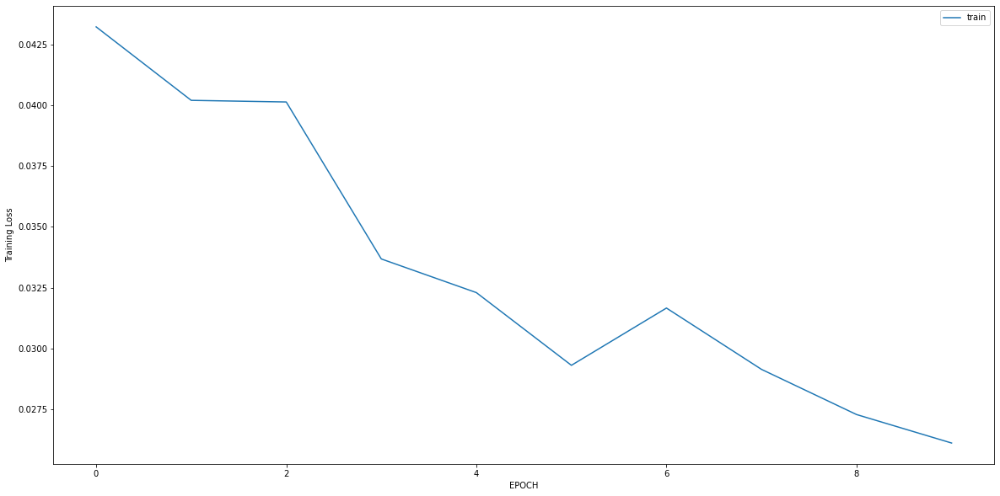

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1621 - accuracy: 0.7008
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6305 - accuracy: 0.7992
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4022 - accuracy: 0.8115
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3703 - accuracy: 0.8648
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3114 - accuracy: 0.8811
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2864 - accuracy: 0.9016
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2453 - accuracy: 0.9139
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2237 - accuracy: 0.9303
Epoch 9/10
8/8 [==============================] - 0s 9ms/step - loss: 0.2325 - accuracy: 0.9385
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2014 - accuracy: 0.9590


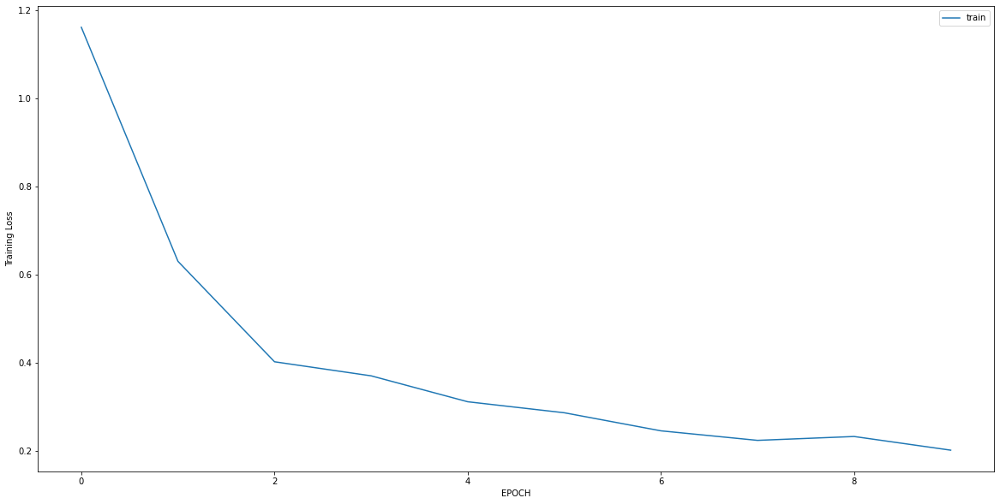

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9422 - accuracy: 0.4205
Epoch 2/10
9/9 [==============================] - 0s 9ms/step - loss: 0.0449 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.0169 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0083 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0073 - accuracy: 1.0000


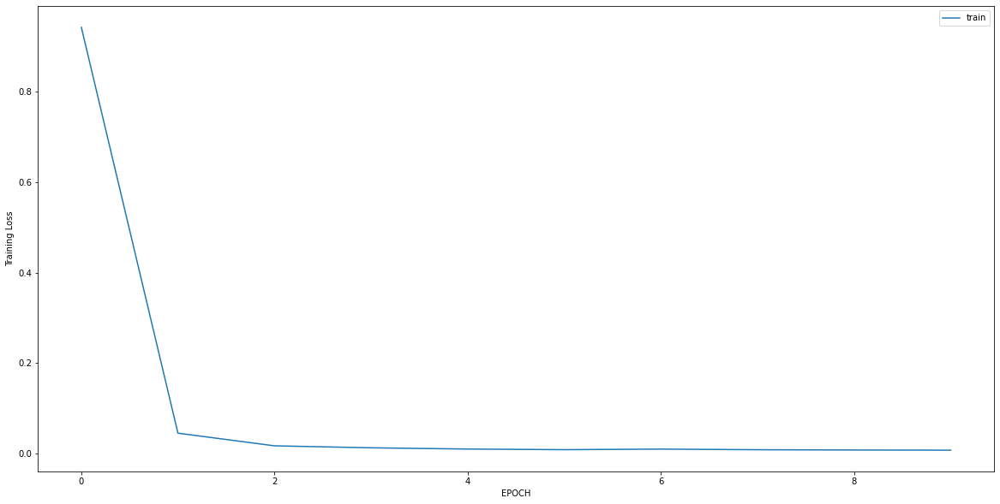

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7124 - accuracy: 0.7343
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4695 - accuracy: 0.8392
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3953 - accuracy: 0.8531
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3776 - accuracy: 0.8776
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3677 - accuracy: 0.8776
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3502 - accuracy: 0.8811
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3245 - accuracy: 0.8881
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3198 - accuracy: 0.9126
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2992 - accuracy: 0.9161
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2705 - accuracy: 0.9091


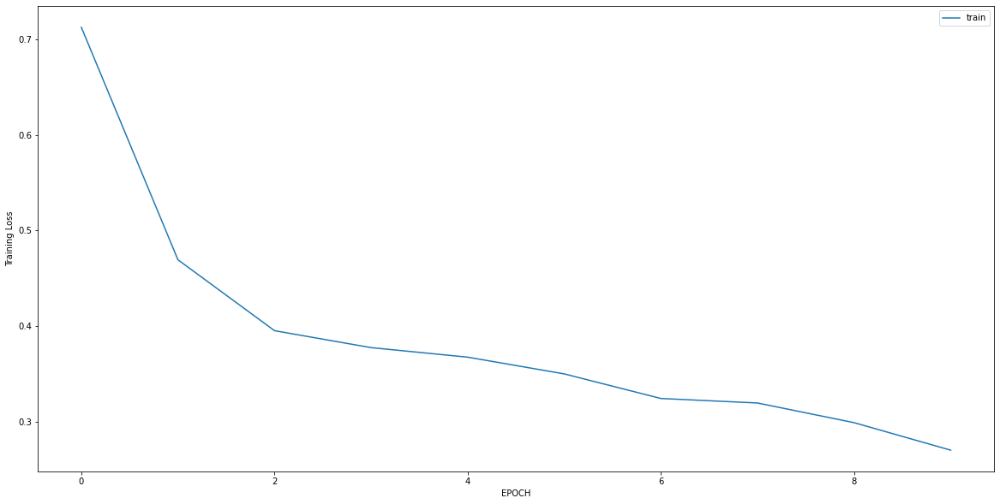

Epoch 1/10
5/5 [==============================] - 0s 8ms/step - loss: 0.3422 - accuracy: 0.8406
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2858 - accuracy: 0.8696
Epoch 3/10
5/5 [==============================] - 0s 7ms/step - loss: 0.2909 - accuracy: 0.8841
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2750 - accuracy: 0.9203
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2801 - accuracy: 0.9130
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2825 - accuracy: 0.9130
Epoch 7/10
5/5 [==============================] - 0s 8ms/step - loss: 0.2770 - accuracy: 0.8913
Epoch 8/10
5/5 [==============================] - 0s 7ms/step - loss: 0.2139 - accuracy: 0.9420
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2491 - accuracy: 0.9275
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3004 - accuracy: 0.8986


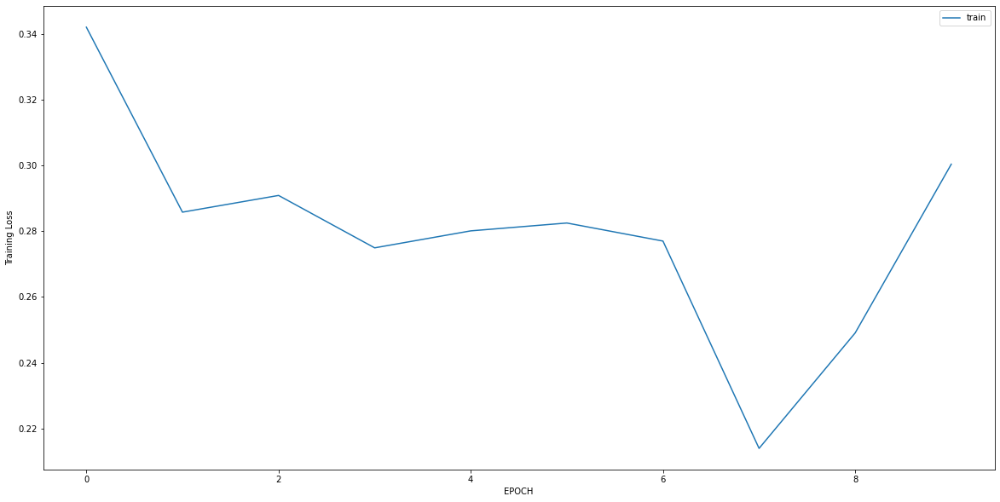

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4246 - accuracy: 0.8667
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2875 - accuracy: 0.9059
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2458 - accuracy: 0.9216
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2068 - accuracy: 0.9333
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1859 - accuracy: 0.9412
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2136 - accuracy: 0.9255
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1923 - accuracy: 0.9333
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2199 - accuracy: 0.9373
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1901 - accuracy: 0.9451
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2055 - accuracy: 0.9451


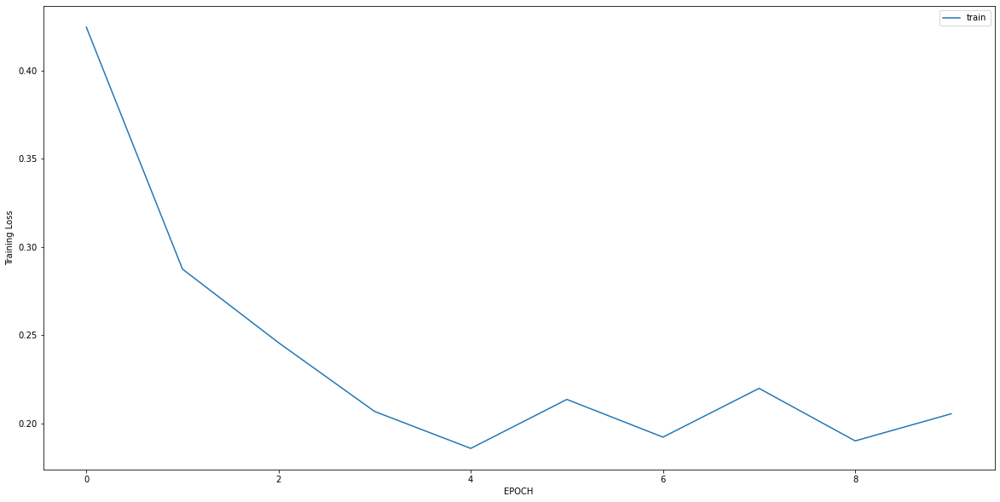

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1249 - accuracy: 0.9563
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0048 - accuracy: 1.0000


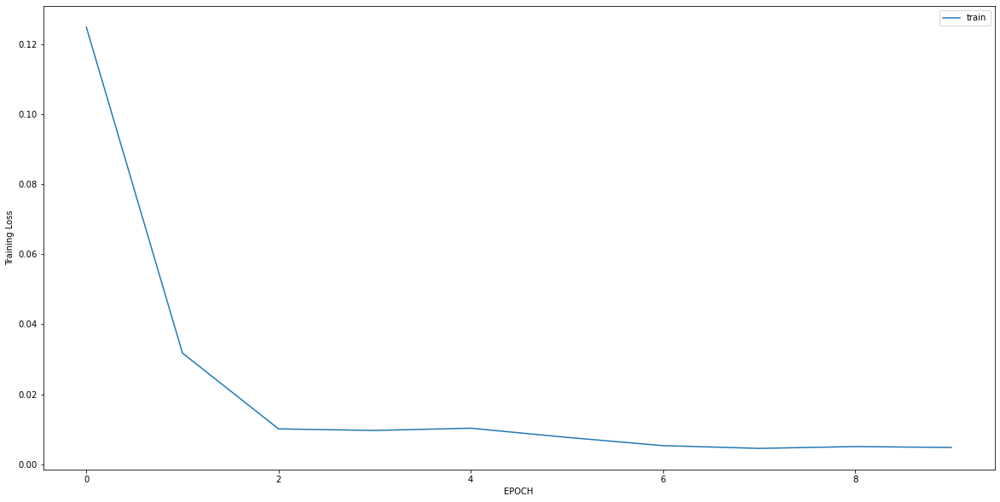

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.9388 - accuracy: 0.7623
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5173 - accuracy: 0.7887
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3666 - accuracy: 0.8340
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3348 - accuracy: 0.8604
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3568 - accuracy: 0.8868
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3412 - accuracy: 0.8830
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3597 - accuracy: 0.8906
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3612 - accuracy: 0.8679
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3527 - accuracy: 0.8453
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3238 - accuracy: 0.8868


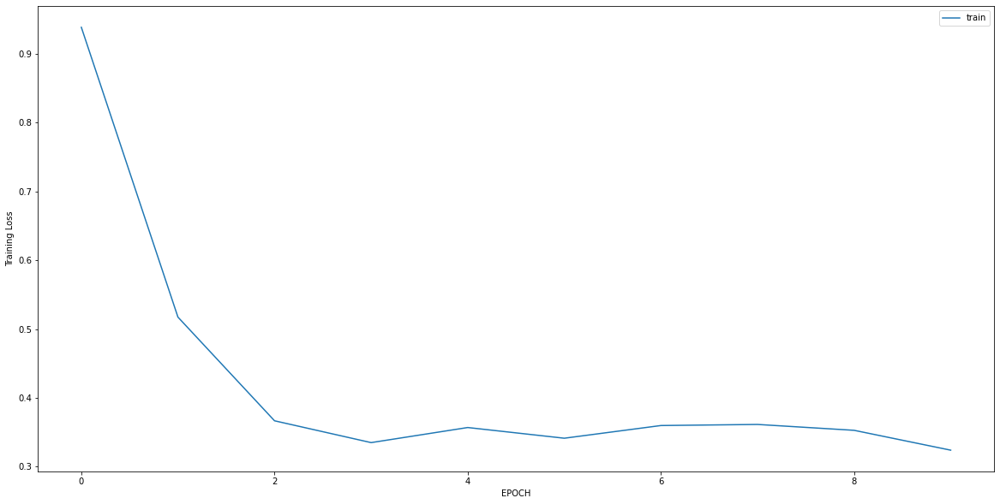

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1475 - accuracy: 0.9451
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1321 - accuracy: 0.9747
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1281 - accuracy: 0.9747
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1138 - accuracy: 0.9705
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0921 - accuracy: 0.9831
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0816 - accuracy: 0.9916
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0774 - accuracy: 0.9831
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0736 - accuracy: 0.9916
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0695 - accuracy: 0.9916
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0703 - accuracy: 0.9916


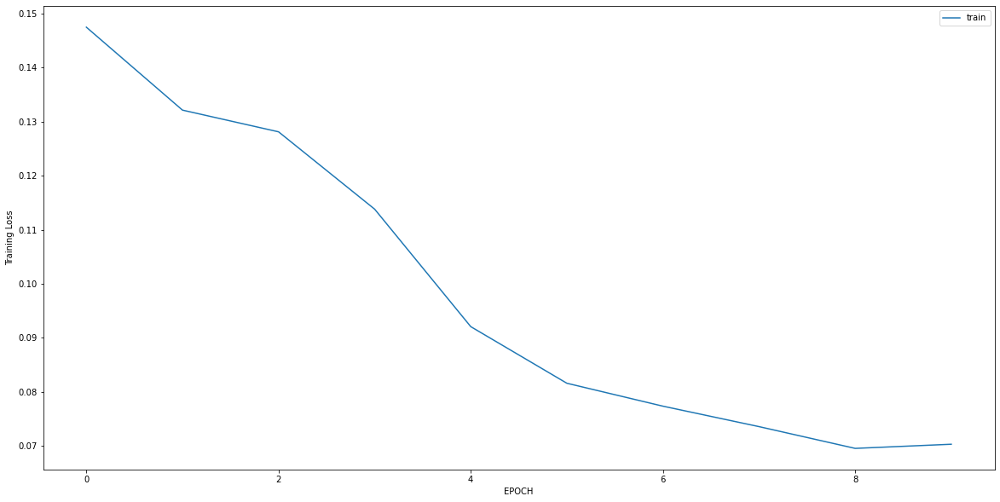

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.7869 - accuracy: 0.6132
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3218 - accuracy: 0.8850
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3061 - accuracy: 0.8850
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2797 - accuracy: 0.9199
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2671 - accuracy: 0.9129
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2498 - accuracy: 0.9233
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2570 - accuracy: 0.9233
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2595 - accuracy: 0.9199
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2551 - accuracy: 0.9233
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2502 - accuracy: 0.9268


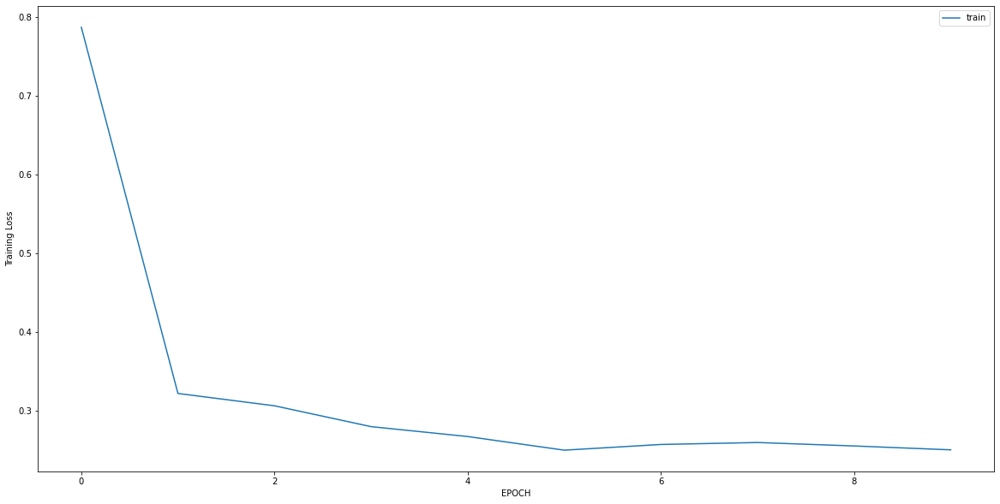

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 1.1382 - accuracy: 0.5917
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5877 - accuracy: 0.6606
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3678 - accuracy: 0.8303
Epoch 4/10
7/7 [==============================] - 0s 6ms/step - loss: 0.3072 - accuracy: 0.8761
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2425 - accuracy: 0.9083
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2227 - accuracy: 0.9220
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2804 - accuracy: 0.9037
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1885 - accuracy: 0.9358
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2256 - accuracy: 0.9266
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1685 - accuracy: 0.9495


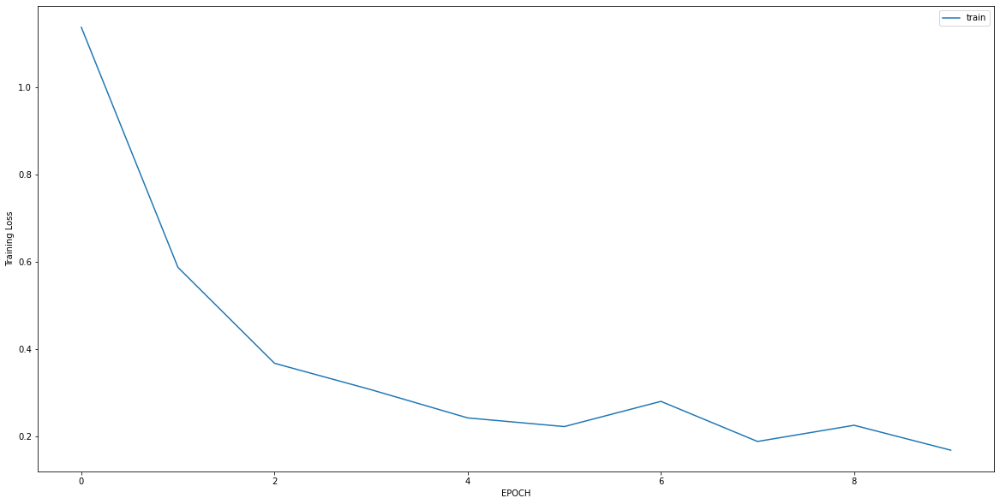

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1325 - accuracy: 0.9633
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0093 - accuracy: 1.0000


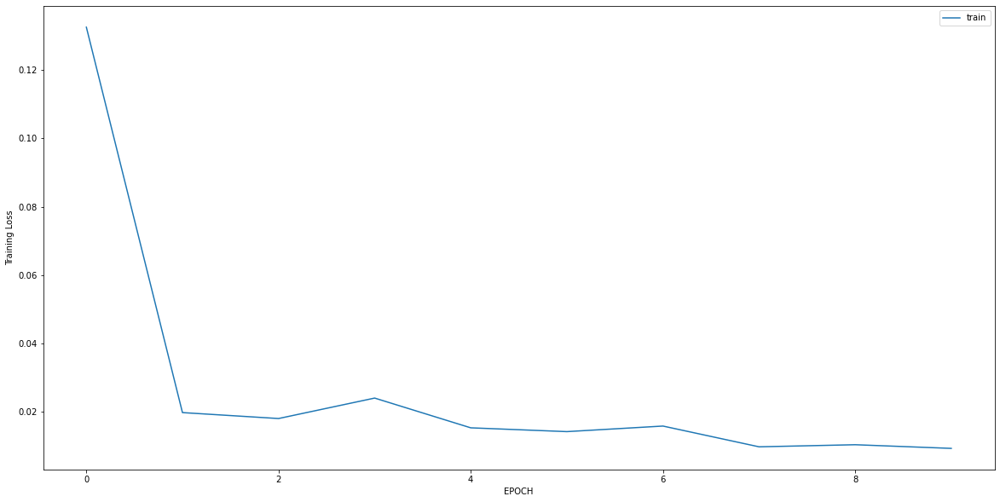

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6377 - accuracy: 0.3935
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8584 - accuracy: 0.5343
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6060 - accuracy: 0.6751
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5396 - accuracy: 0.7401
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4627 - accuracy: 0.8159
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4626 - accuracy: 0.7978
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3676 - accuracy: 0.8628
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3363 - accuracy: 0.9025
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3163 - accuracy: 0.8881
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3035 - accuracy: 0.9025


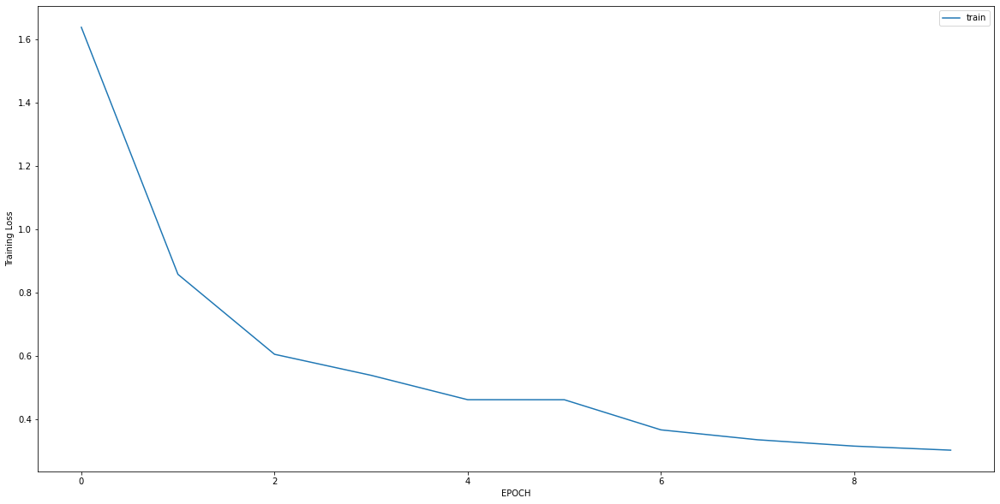

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.9500 - accuracy: 0.7053
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3842 - accuracy: 0.8376
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2687 - accuracy: 0.8910
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2294 - accuracy: 0.9118
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1956 - accuracy: 0.9327
Epoch 6/10
14/14 [==============================] - 0s 7ms/step - loss: 0.1719 - accuracy: 0.9420
Epoch 7/10
14/14 [==============================] - 0s 7ms/step - loss: 0.1410 - accuracy: 0.9559
Epoch 8/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1377 - accuracy: 0.9582
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1194 - accuracy: 0.9722
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1261 - accuracy: 0.9490


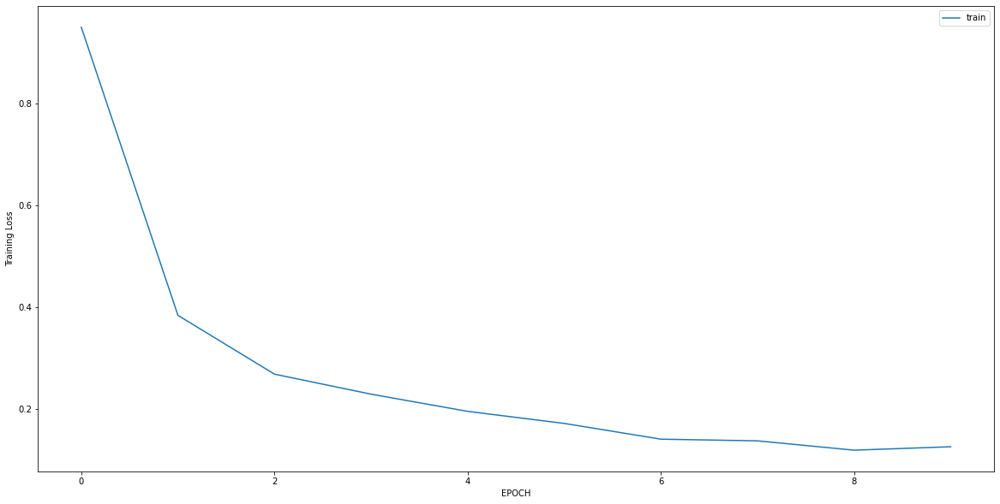

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.9344 - accuracy: 0.4831
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3985 - accuracy: 0.8093
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4469 - accuracy: 0.8771
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3177 - accuracy: 0.8814
Epoch 5/10
8/8 [==============================] - 0s 9ms/step - loss: 0.3118 - accuracy: 0.9195
Epoch 6/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2926 - accuracy: 0.9068
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3095 - accuracy: 0.9025
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2745 - accuracy: 0.9280
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2401 - accuracy: 0.9195
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2187 - accuracy: 0.9280


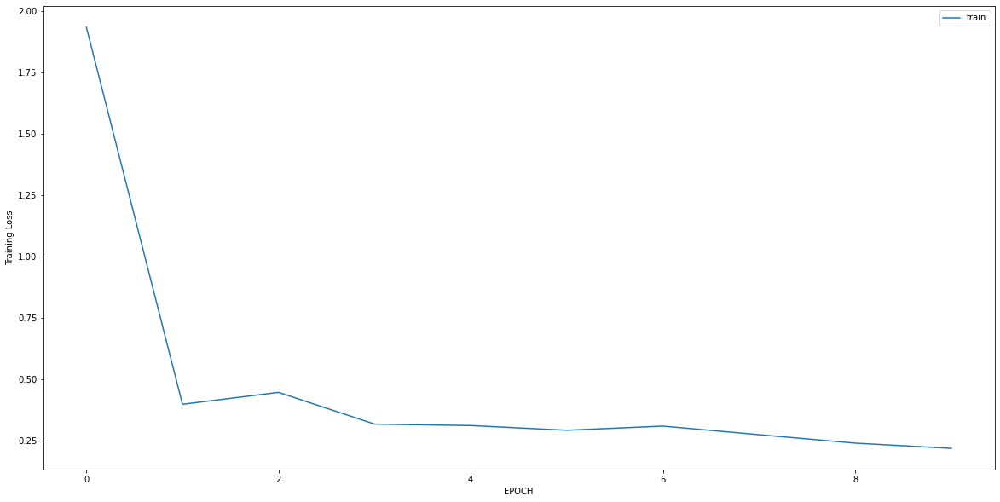

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.3181 - accuracy: 0.6806
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 1.2798 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 1.1944 - accuracy: 0.6806
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0462 - accuracy: 0.6806
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8080 - accuracy: 0.6806
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6474 - accuracy: 0.6806
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.6528
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6150 - accuracy: 0.6528
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5306 - accuracy: 0.7083
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4930 - accuracy: 0.7083


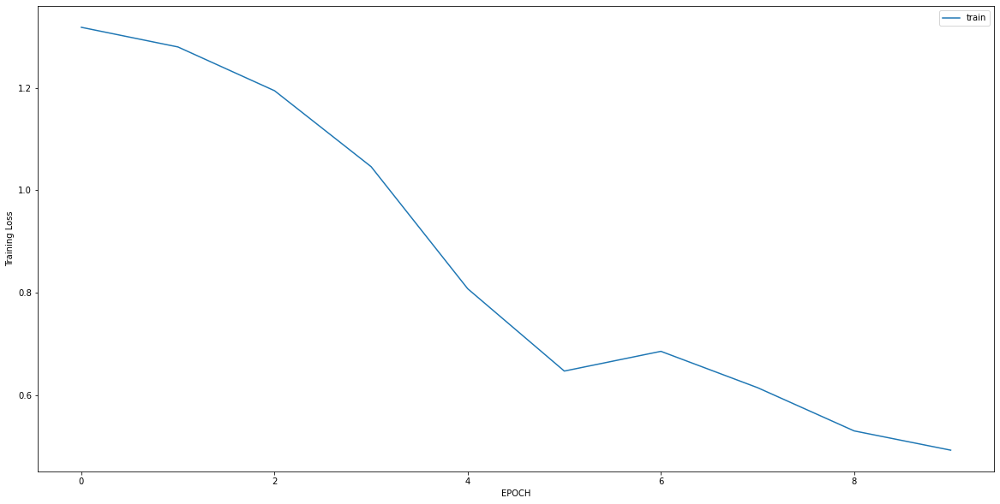

Epoch 1/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4692 - accuracy: 0.8035
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3598 - accuracy: 0.8618
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3335 - accuracy: 0.8855
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3136 - accuracy: 0.8920
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3011 - accuracy: 0.9028
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2959 - accuracy: 0.9006
Epoch 7/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2935 - accuracy: 0.9071
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2922 - accuracy: 0.9114
Epoch 9/10
15/15 [==============================] - 0s 6ms/step - loss: 0.2676 - accuracy: 0.9158
Epoch 10/10
15/15 [==============================] - 0s 9ms/step - loss: 0.2824 - accuracy: 0.8985


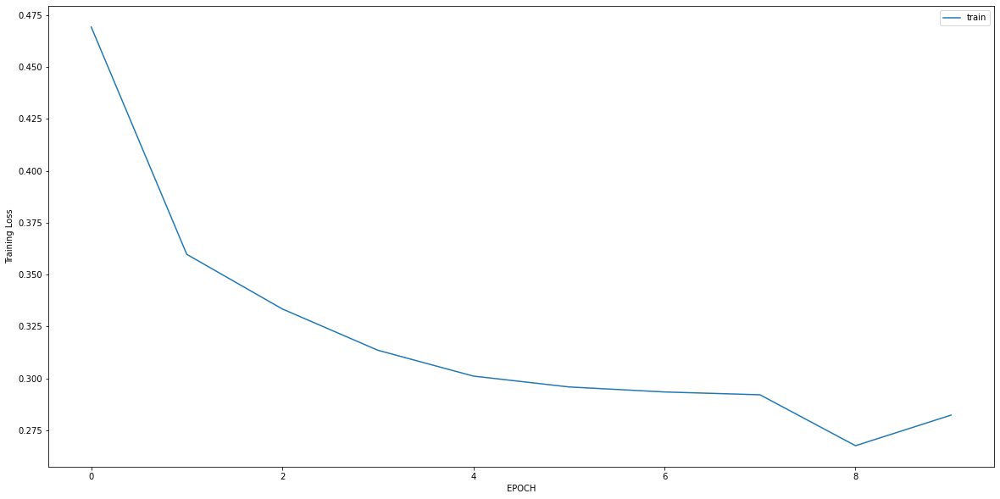

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2184 - accuracy: 0.9119
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2085 - accuracy: 0.9245
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1895 - accuracy: 0.9403
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1718 - accuracy: 0.9654
Epoch 5/10
10/10 [==============================] - 0s 10ms/step - loss: 0.1622 - accuracy: 0.9528
Epoch 6/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1442 - accuracy: 0.9686
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1485 - accuracy: 0.9654
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1233 - accuracy: 0.9780
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1285 - accuracy: 0.9811
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1135 - accuracy: 0.9843


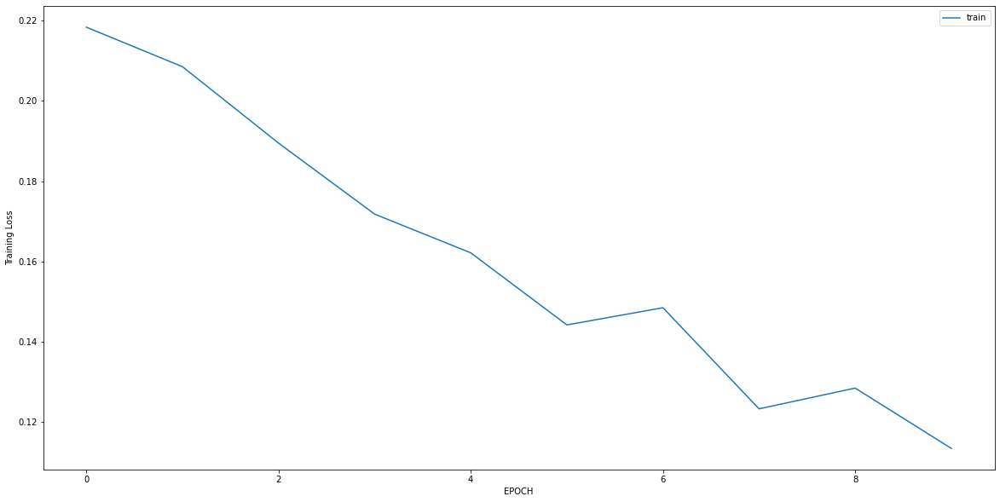

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.1161 - accuracy: 0.9802
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1216 - accuracy: 0.9683
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0934 - accuracy: 0.9802
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0931 - accuracy: 0.9960
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0866 - accuracy: 0.9881
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0796 - accuracy: 0.9881
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0748 - accuracy: 0.9921
Epoch 8/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0836 - accuracy: 0.9881
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0721 - accuracy: 0.9921
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0633 - accuracy: 1.0000


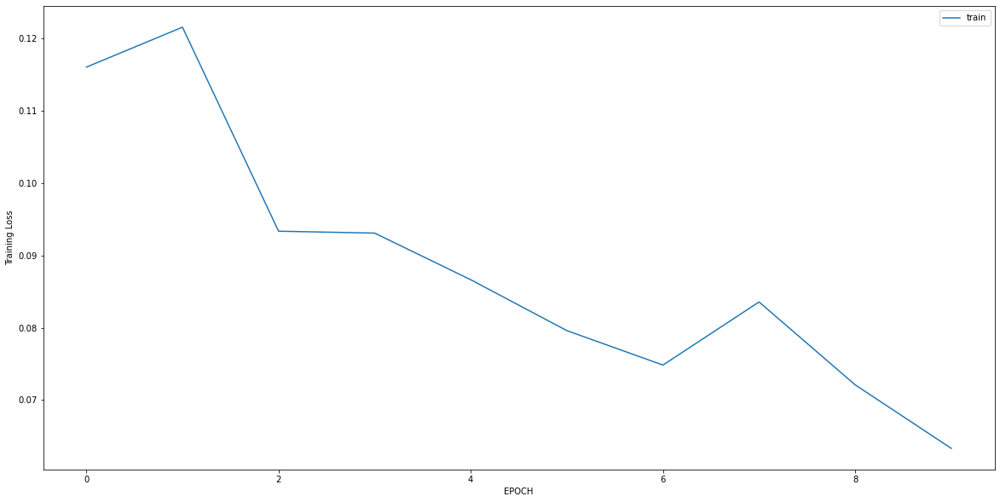

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9966 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 8ms/step - loss: 1.0373 - accuracy: 0.7222
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0210 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8748 - accuracy: 0.7222
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7545 - accuracy: 0.6944
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6453 - accuracy: 0.7083
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5790 - accuracy: 0.7014
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5991 - accuracy: 0.6944
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6257 - accuracy: 0.7153
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6558 - accuracy: 0.6944


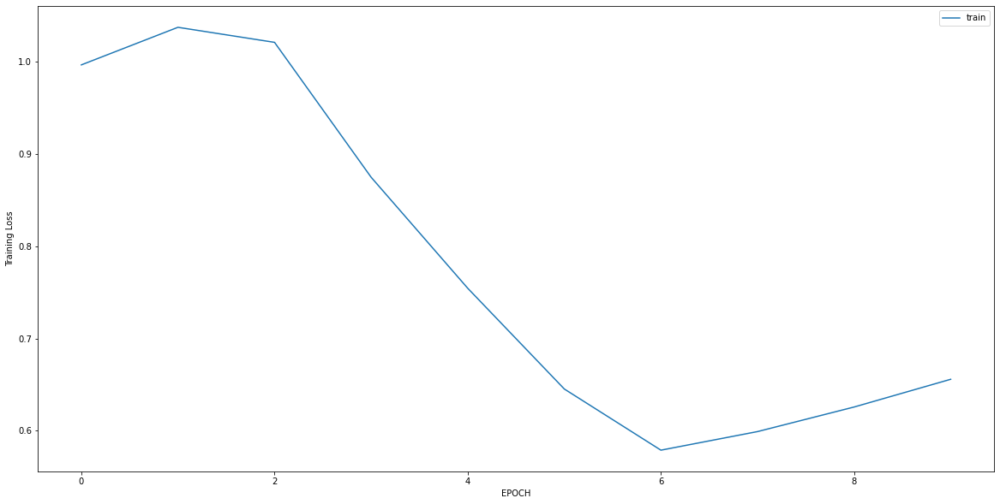

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.8133 - accuracy: 0.4748
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1148 - accuracy: 0.9916
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 9ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0123 - accuracy: 1.0000


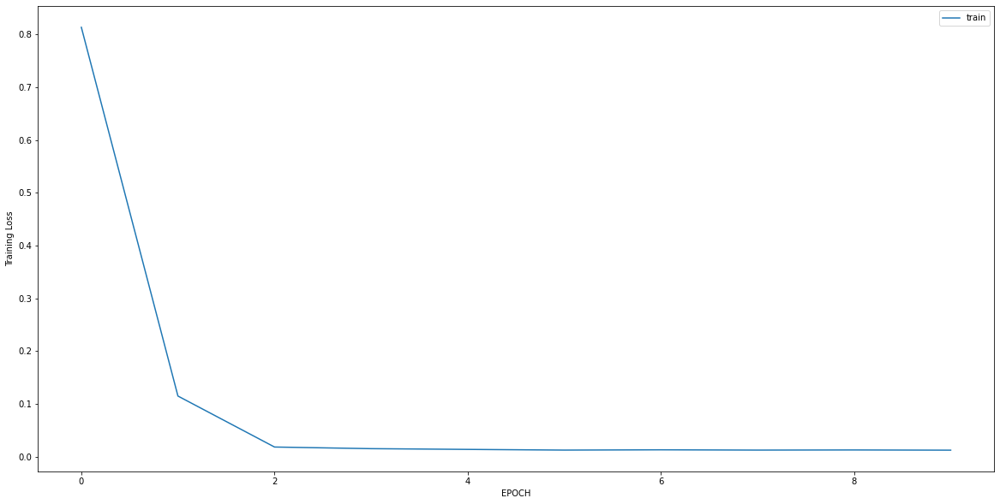

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7093 - accuracy: 0.7154
Epoch 2/10
8/8 [==============================] - 0s 9ms/step - loss: 0.4274 - accuracy: 0.8300
Epoch 3/10
8/8 [==============================] - 0s 10ms/step - loss: 0.3442 - accuracy: 0.8696
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2708 - accuracy: 0.9051
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2544 - accuracy: 0.9170
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3616 - accuracy: 0.8656
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2711 - accuracy: 0.9249
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2809 - accuracy: 0.8735
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2730 - accuracy: 0.9130
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2658 - accuracy: 0.9130


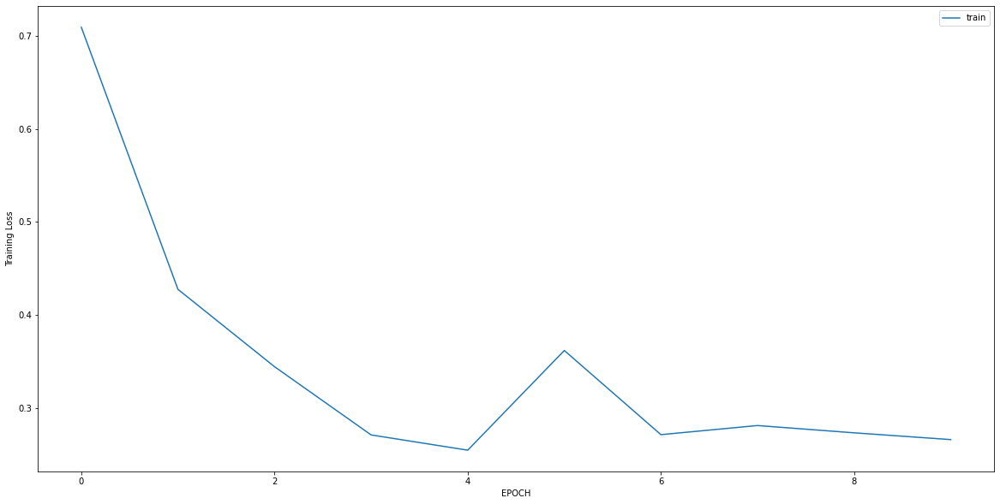

Epoch 1/10
8/8 [==============================] - 0s 10ms/step - loss: 0.3413 - accuracy: 0.8968
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3083 - accuracy: 0.9008
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3114 - accuracy: 0.8968
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2656 - accuracy: 0.9048
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2789 - accuracy: 0.9246
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2582 - accuracy: 0.9246
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2526 - accuracy: 0.9325
Epoch 8/10
8/8 [==============================] - 0s 8ms/step - loss: 0.2441 - accuracy: 0.9365
Epoch 9/10
8/8 [==============================] - 0s 10ms/step - loss: 0.2420 - accuracy: 0.9365
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2375 - accuracy: 0.9325


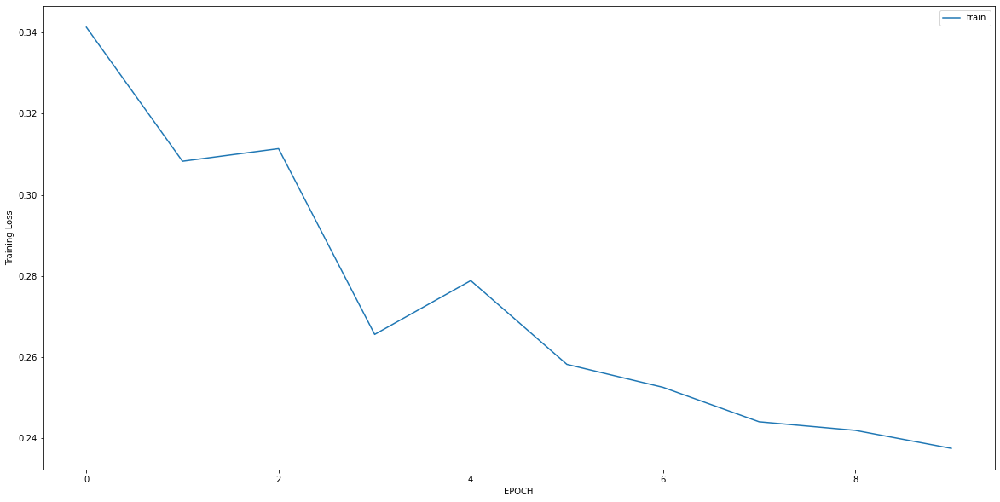

Epoch 1/10
9/9 [==============================] - 0s 10ms/step - loss: 0.4127 - accuracy: 0.8889
Epoch 2/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2470 - accuracy: 0.9185
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1972 - accuracy: 0.9185
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.1730 - accuracy: 0.9519
Epoch 5/10
9/9 [==============================] - 0s 8ms/step - loss: 0.1965 - accuracy: 0.9259
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1989 - accuracy: 0.9296
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1510 - accuracy: 0.9667
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1799 - accuracy: 0.9407
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2341 - accuracy: 0.9185
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1519 - accuracy: 0.9556


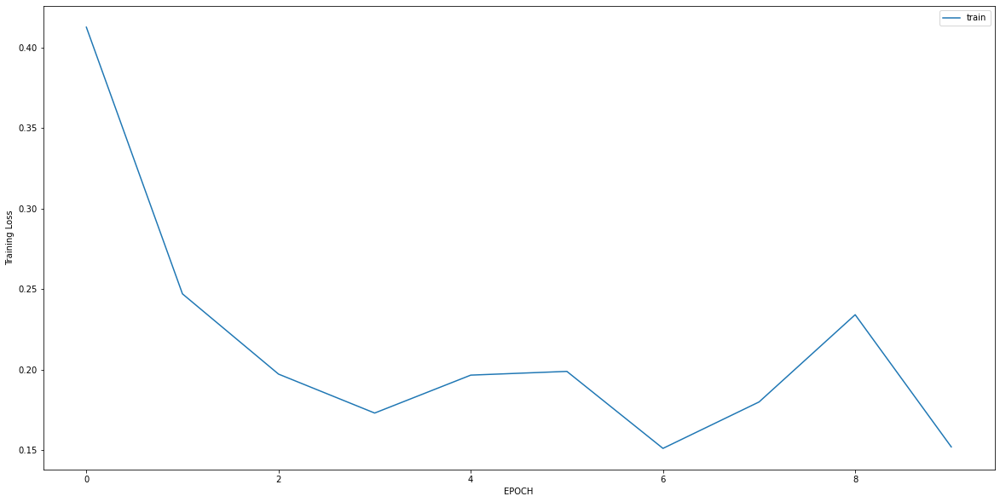

Epoch 1/10
11/11 [==============================] - 0s 10ms/step - loss: 1.6844 - accuracy: 0.4474
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.3363 - accuracy: 0.8626
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1939 - accuracy: 0.9298
Epoch 4/10
11/11 [==============================] - 0s 9ms/step - loss: 0.1948 - accuracy: 0.9094
Epoch 5/10
11/11 [==============================] - 0s 9ms/step - loss: 0.1534 - accuracy: 0.9386
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1520 - accuracy: 0.9298
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1433 - accuracy: 0.9415
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1082 - accuracy: 0.9620
Epoch 9/10
11/11 [==============================] - 0s 10ms/step - loss: 0.1002 - accuracy: 0.9620
Epoch 10/10
11/11 [==============================] - 0s 11ms/step - loss: 0.1159 - accuracy: 0.9532


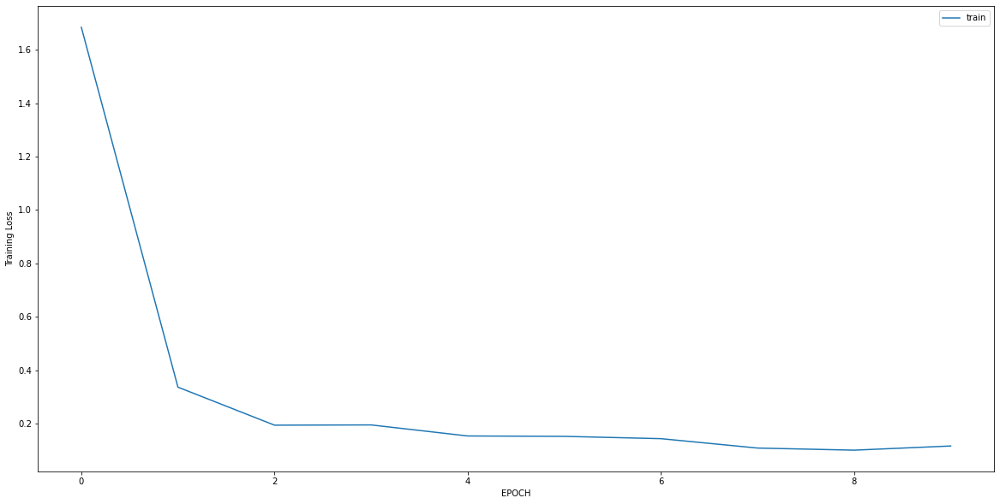

Epoch 1/10
9/9 [==============================] - 0s 10ms/step - loss: 0.4273 - accuracy: 0.7548
Epoch 2/10
9/9 [==============================] - 0s 9ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 11ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0096 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0078 - accuracy: 1.0000


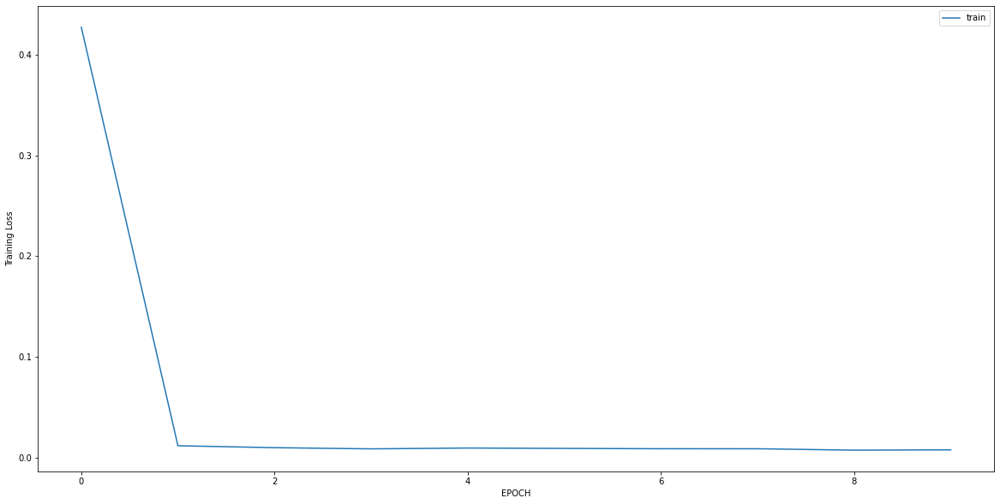

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.2221 - accuracy: 0.7649
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7820 - accuracy: 0.7712
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6158 - accuracy: 0.7868
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4857 - accuracy: 0.8213
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3931 - accuracy: 0.8307
Epoch 6/10
10/10 [==============================] - 0s 9ms/step - loss: 0.3313 - accuracy: 0.8621
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3115 - accuracy: 0.8683
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2395 - accuracy: 0.9091
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2257 - accuracy: 0.9028
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1714 - accuracy: 0.9561


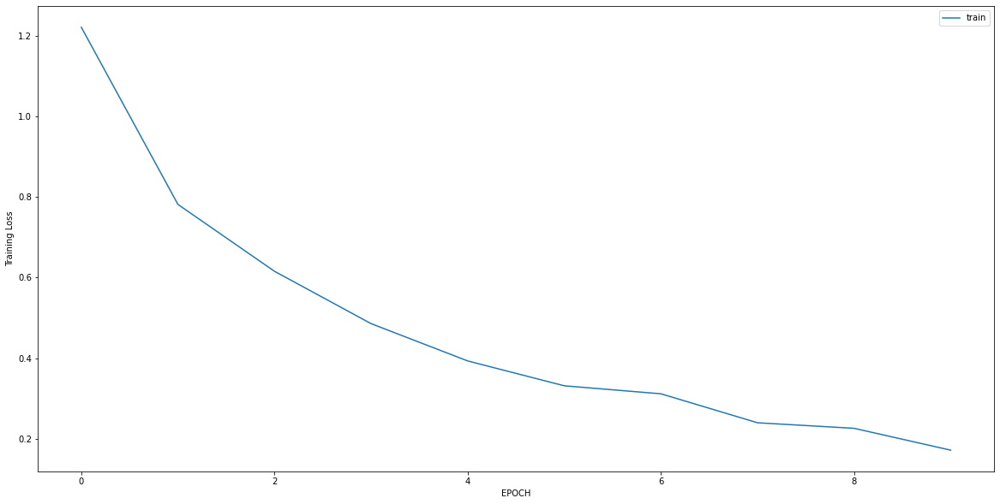

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4397 - accuracy: 0.8178
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3773 - accuracy: 0.8340
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2718 - accuracy: 0.8947
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2403 - accuracy: 0.9028
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2358 - accuracy: 0.9109
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2434 - accuracy: 0.8826
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2006 - accuracy: 0.9352
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1796 - accuracy: 0.9433
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2176 - accuracy: 0.9271
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3130 - accuracy: 0.8866


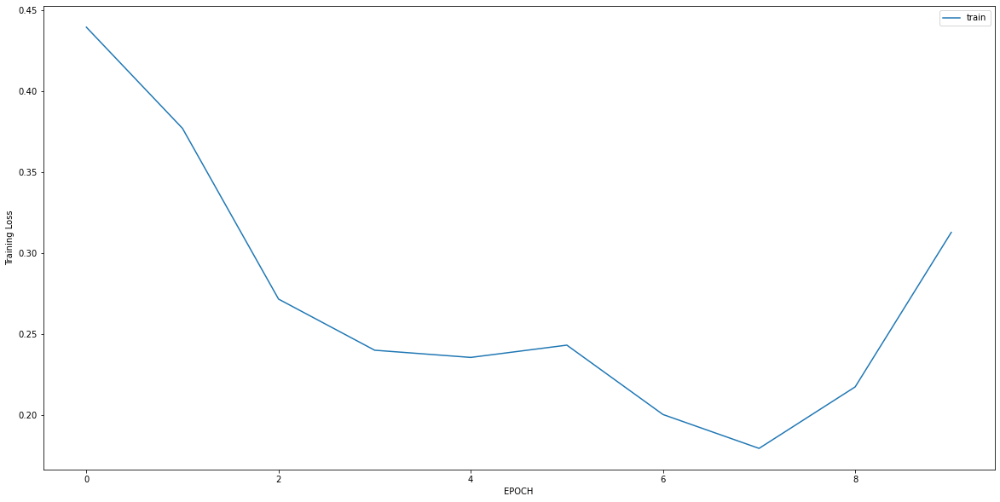

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 3.5207 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.6462 - accuracy: 0.1464
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4210 - accuracy: 0.8100
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1538 - accuracy: 0.9938
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0990 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0686 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0515 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - ETA: 0s - loss: 0.0520 - accuracy: 1.00 - 0s 4ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss:

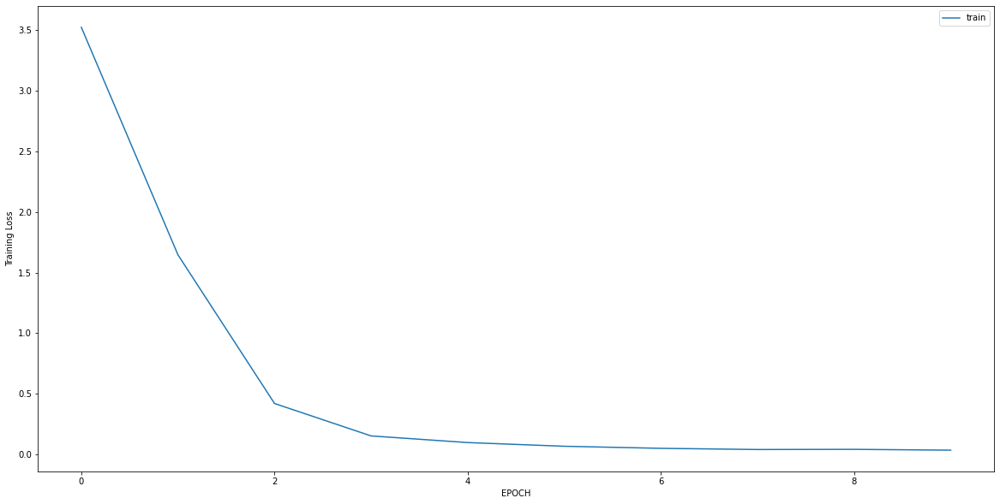

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0882 - accuracy: 0.3597
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8600 - accuracy: 0.4820
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7122 - accuracy: 0.5396
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6208 - accuracy: 0.6331
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4920 - accuracy: 0.7842
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3936 - accuracy: 0.8849
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3952 - accuracy: 0.8273
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4495 - accuracy: 0.7842
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3853 - accuracy: 0.8417
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.3046 - accuracy: 0.9065


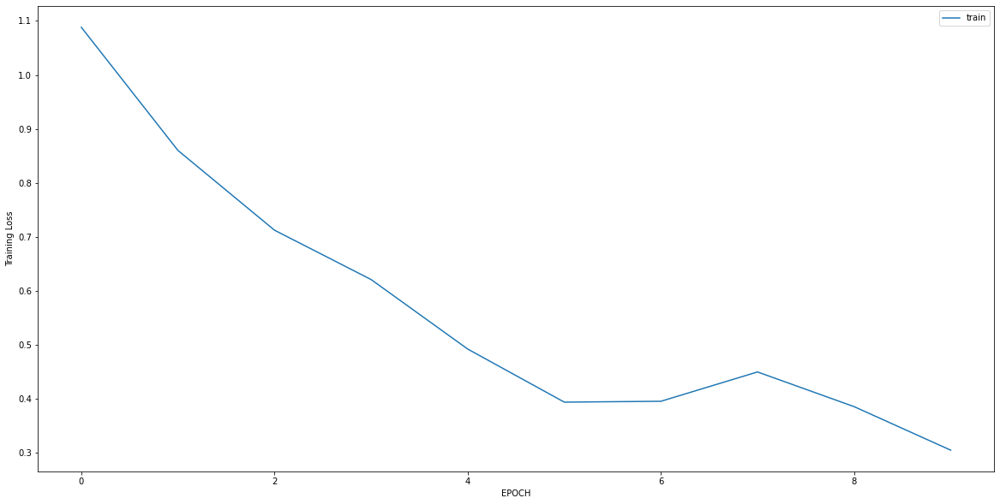

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2954 - accuracy: 0.9079
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1326 - accuracy: 0.9916
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0534 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0277 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0239 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0206 - accuracy: 1.0000


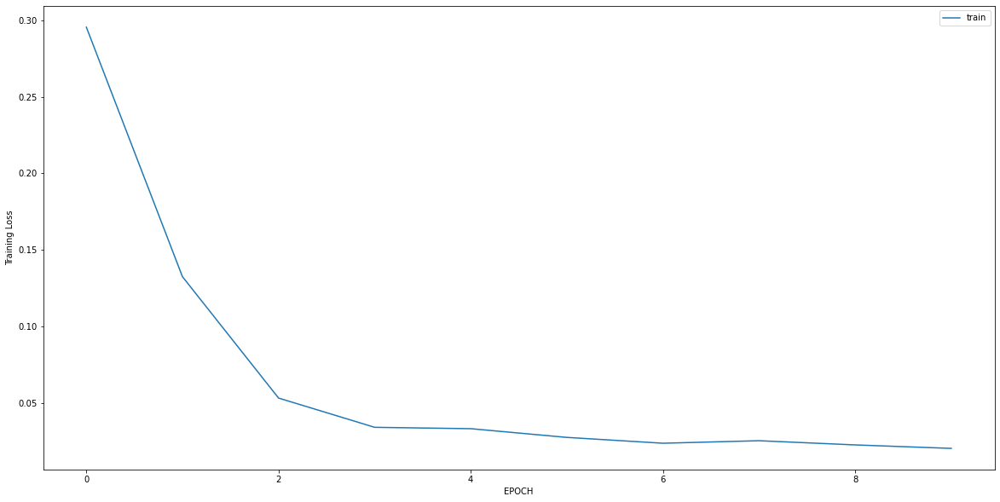

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0287 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0223 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0175 - accuracy: 1.0000


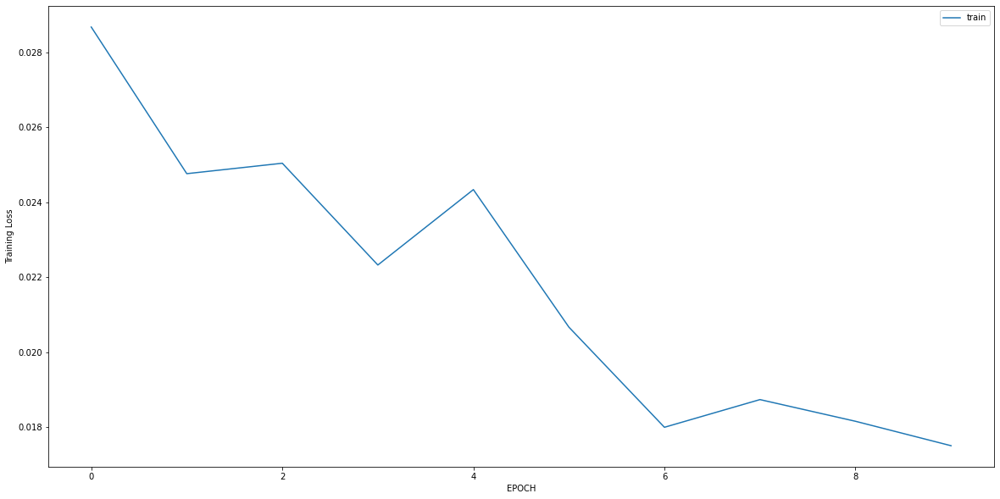

Epoch 1/10
12/12 [==============================] - 0s 10ms/step - loss: 0.0280 - accuracy: 1.0000
Epoch 2/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 8ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000


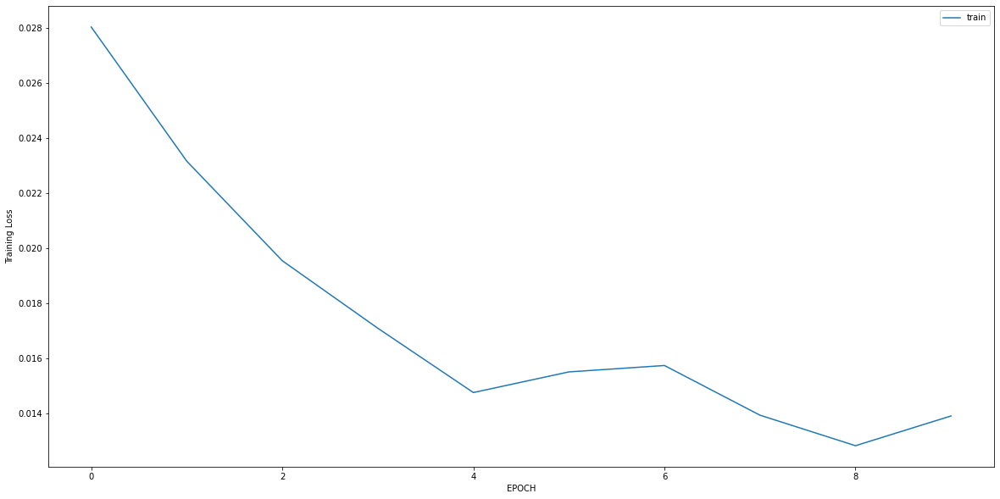

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 4.2154 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 3.9298 - accuracy: 0.1633
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 3.6607 - accuracy: 0.1633
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 3.0643 - accuracy: 0.1633
Epoch 5/10
4/4 [==============================] - 0s 4ms/step - loss: 2.5918 - accuracy: 0.1633
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 2.1499 - accuracy: 0.1633
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 1.4632 - accuracy: 0.1939
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 1.0612 - accuracy: 0.3367
Epoch 9/10
4/4 [==============================] - 0s 8ms/step - loss: 0.7321 - accuracy: 0.5204
Epoch 10/10
4/4 [==============================] - 0s 10ms/step - loss: 0.6380 - accuracy: 0.6531


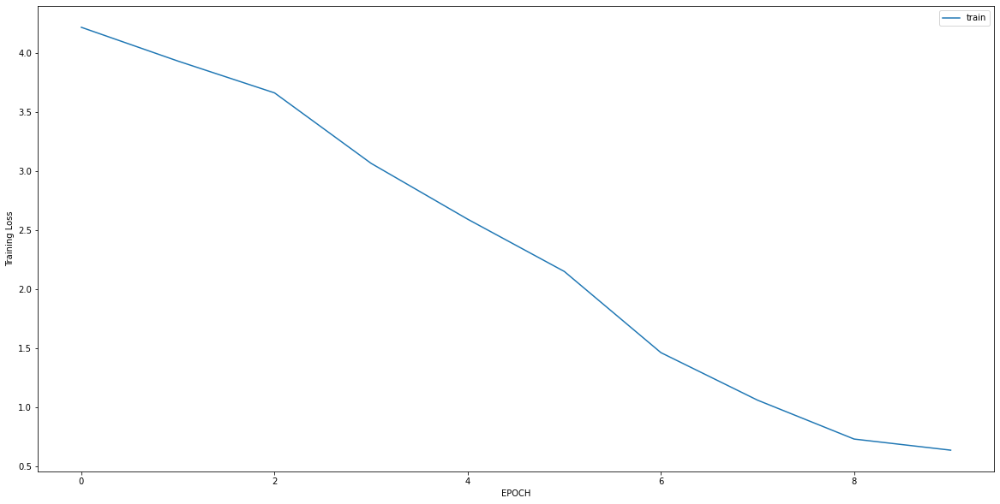

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8007 - accuracy: 0.4931
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6933 - accuracy: 0.5862
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6144 - accuracy: 0.6483
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4976 - accuracy: 0.7759
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4395 - accuracy: 0.8241
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4263 - accuracy: 0.8310
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4063 - accuracy: 0.8552
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2999 - accuracy: 0.9103
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2922 - accuracy: 0.8966
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2468 - accuracy: 0.9310


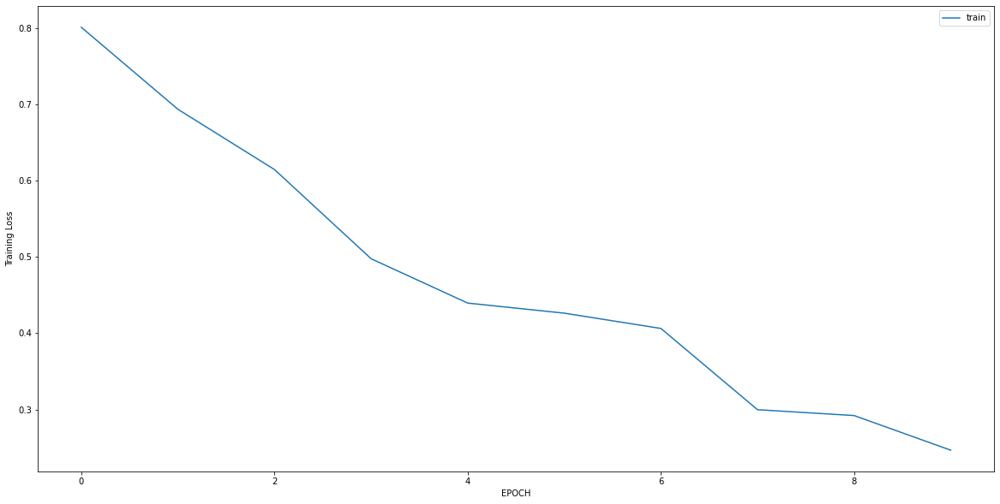

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5235 - accuracy: 0.7132
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3835 - accuracy: 0.8125
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3160 - accuracy: 0.8860
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2862 - accuracy: 0.8934
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2307 - accuracy: 0.9375
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2192 - accuracy: 0.9375
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2061 - accuracy: 0.9301
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1876 - accuracy: 0.9522
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1829 - accuracy: 0.9412
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1903 - accuracy: 0.9375


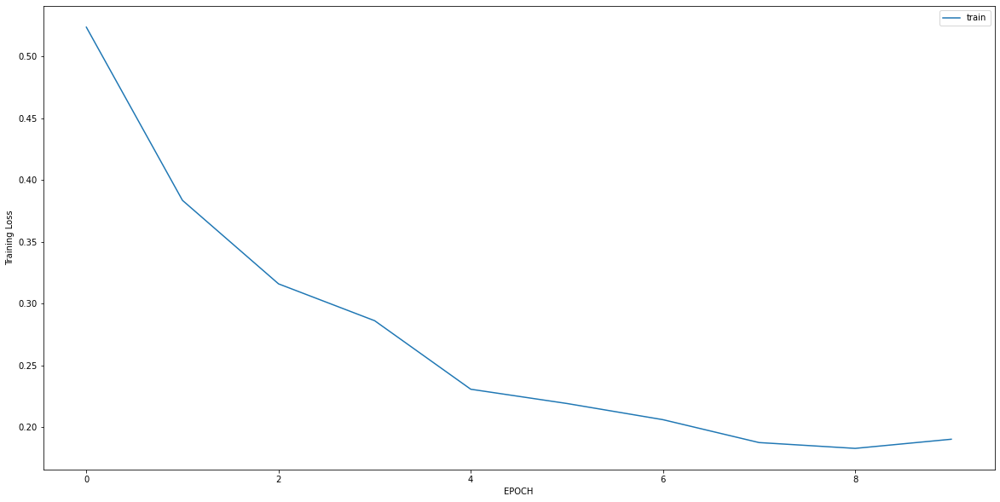

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6318 - accuracy: 0.7947
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4301 - accuracy: 0.8278
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3475 - accuracy: 0.8642
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2685 - accuracy: 0.8907
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2633 - accuracy: 0.8808
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2214 - accuracy: 0.9172
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2091 - accuracy: 0.9272
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1953 - accuracy: 0.9371
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1911 - accuracy: 0.9404
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1734 - accuracy: 0.9371


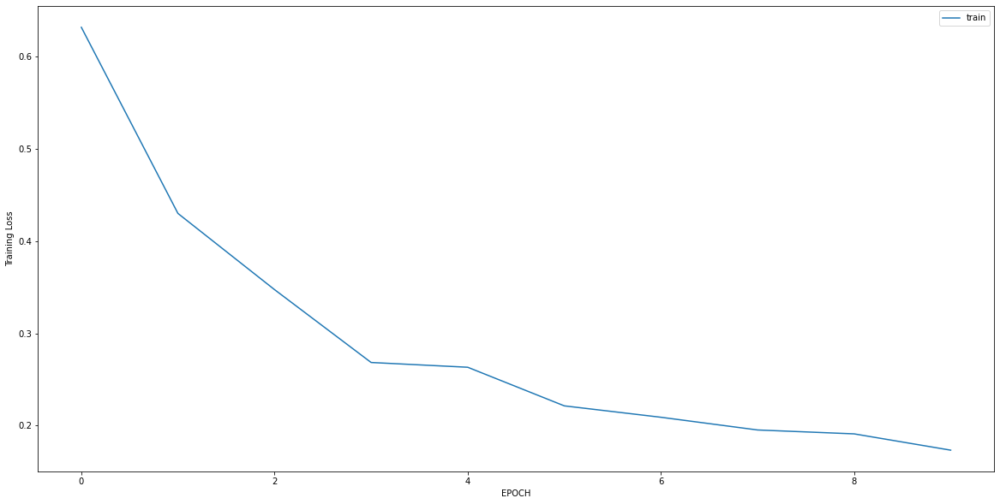

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1595 - accuracy: 0.9547
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0567 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.9970
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0178 - accuracy: 1.0000


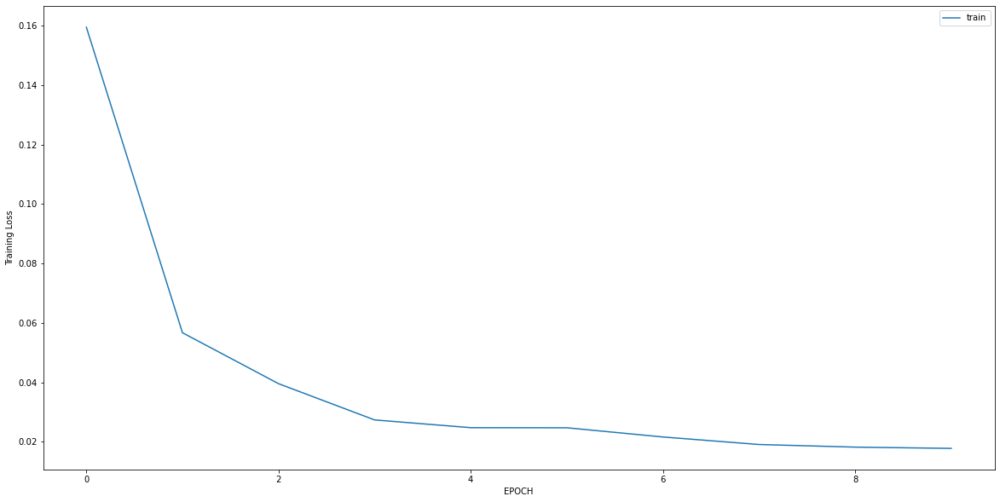

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1876 - accuracy: 0.9626
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0944 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0689 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0636 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0560 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0568 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0498 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0468 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 1.0000


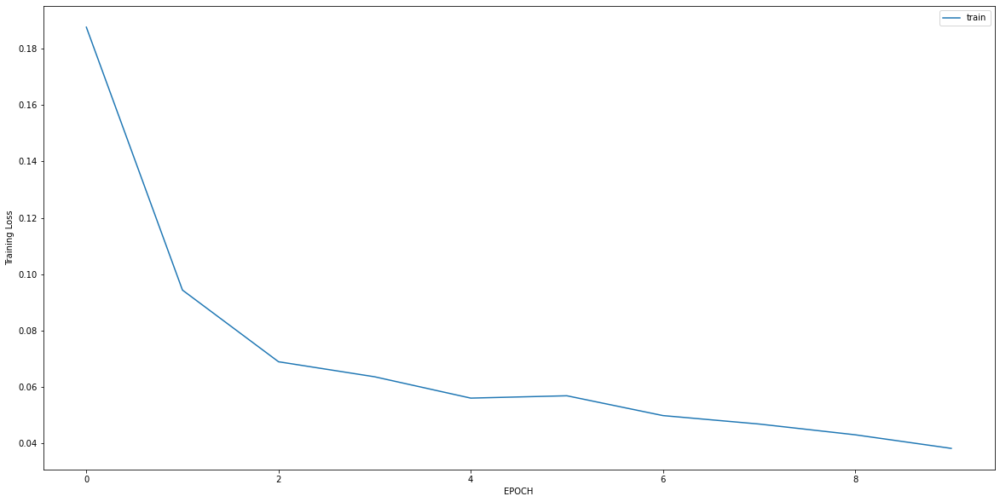

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0469 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0298 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0250 - accuracy: 1.0000


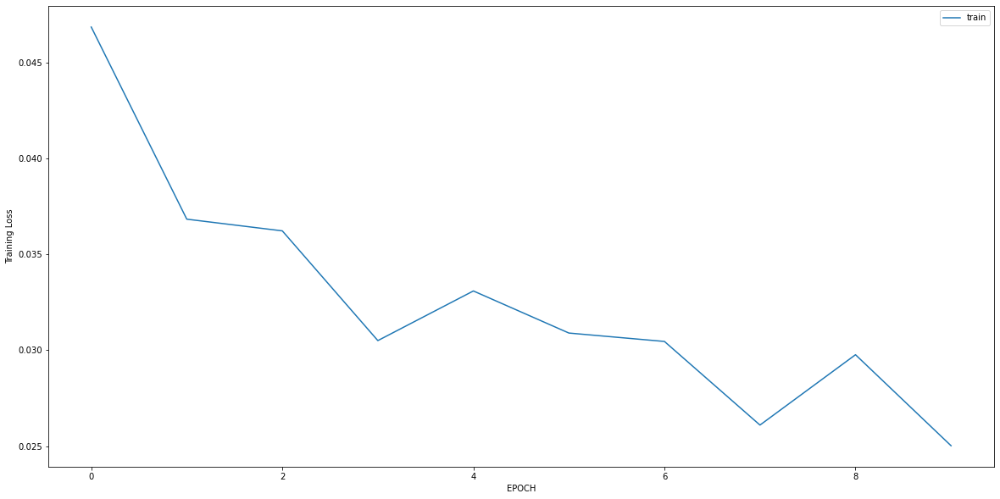

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.0138 - accuracy: 0.6998
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7946
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3288 - accuracy: 0.8758
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2222 - accuracy: 0.9210
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1477 - accuracy: 0.9639
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1469 - accuracy: 0.9549: 0s - loss: 0.1442 - accuracy: 0.95
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1289 - accuracy: 0.9661
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1077 - accuracy: 0.9774
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0937 - accuracy: 0.9865
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0834 - 

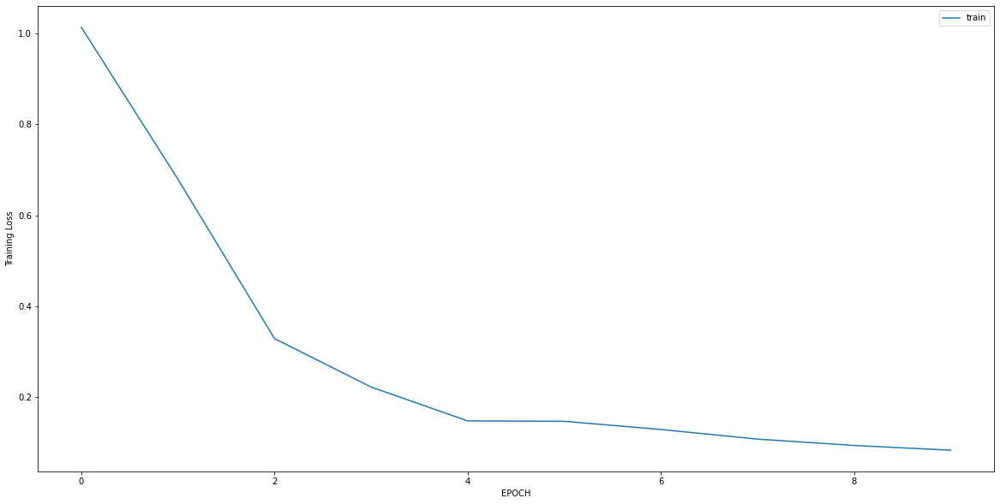

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9974 - accuracy: 0.6245
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3755 - accuracy: 0.8340
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4279 - accuracy: 0.8775
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3473 - accuracy: 0.8972
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2844 - accuracy: 0.8696
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2083 - accuracy: 0.9249
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1835 - accuracy: 0.9289
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1695 - accuracy: 0.9368
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1419 - accuracy: 0.9526
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1495 - accuracy: 0.9407


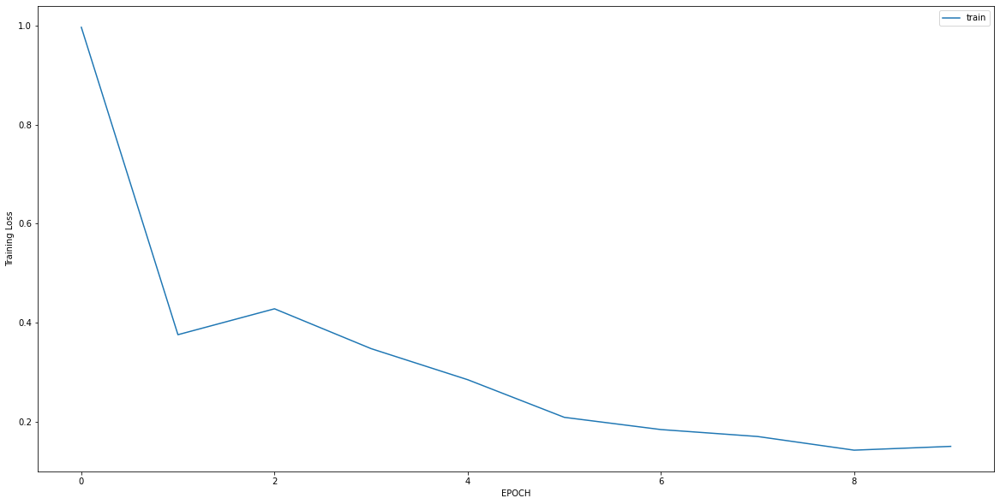

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0960 - accuracy: 0.9798
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0572 - accuracy: 0.9879
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0581 - accuracy: 0.9919
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0577 - accuracy: 0.9879
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0491 - accuracy: 0.9919
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.9960
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.9919
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.9919
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.9960
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.9919


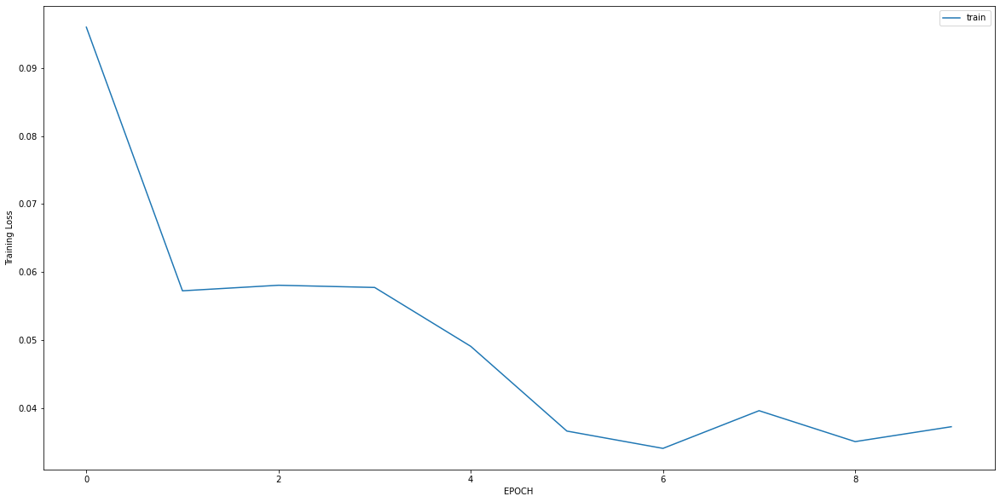

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4048 - accuracy: 0.9020
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2191 - accuracy: 0.9308
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1322 - accuracy: 0.9597
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1024 - accuracy: 0.9654
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0641 - accuracy: 0.9827
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0600 - accuracy: 0.9885
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.9971
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.9971
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0321 - accuracy: 0.9971


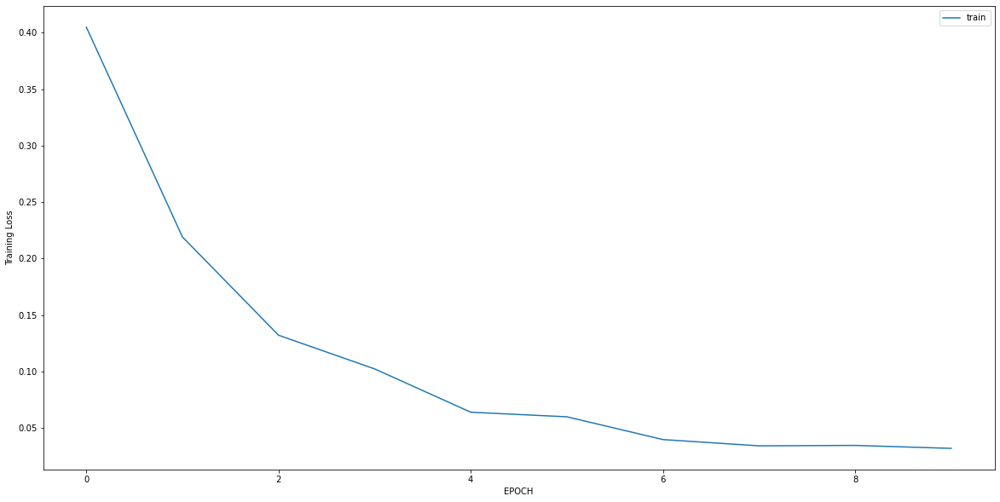

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9661 - accuracy: 0.7406
Epoch 2/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4273 - accuracy: 0.8066
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2178 - accuracy: 0.9198
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1589 - accuracy: 0.9528
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3432 - accuracy: 0.8774
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3703 - accuracy: 0.8538
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3152 - accuracy: 0.8632
Epoch 8/10
7/7 [==============================] - 0s 6ms/step - loss: 0.2008 - accuracy: 0.9104
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1997 - accuracy: 0.9198
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1603 - accuracy: 0.9528


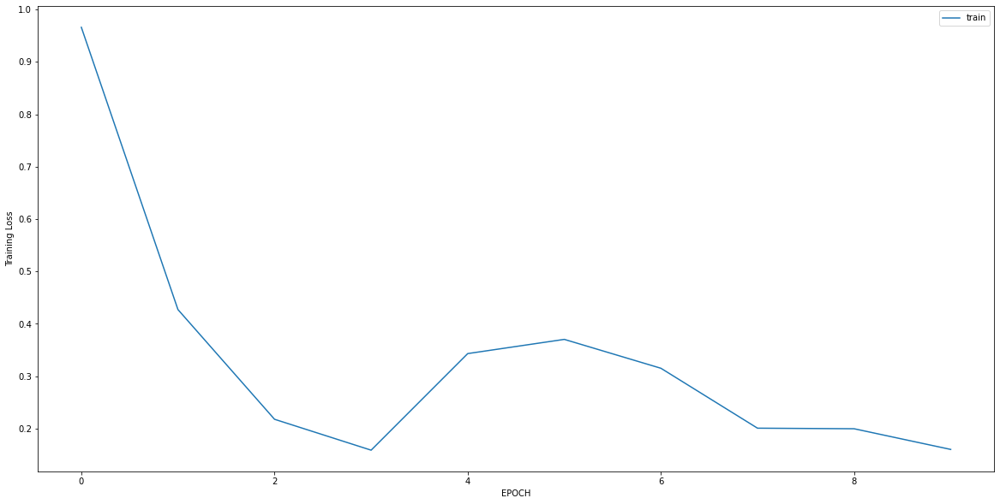

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4224 - accuracy: 0.8316
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2283 - accuracy: 0.9210
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1389 - accuracy: 0.9519
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0670 - accuracy: 0.9897
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0658 - accuracy: 0.9863
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 0.9897
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0888 - accuracy: 0.9759
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0579 - accuracy: 0.9863
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0962 - accuracy: 0.9691
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0762 - accuracy: 0.9759


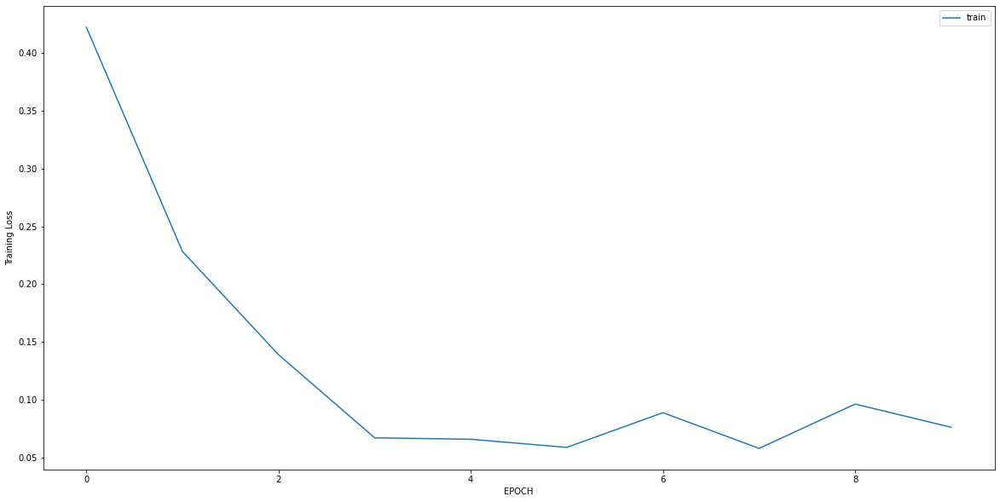

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1151 - accuracy: 0.9737
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0265 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0235 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0181 - accuracy: 1.0000


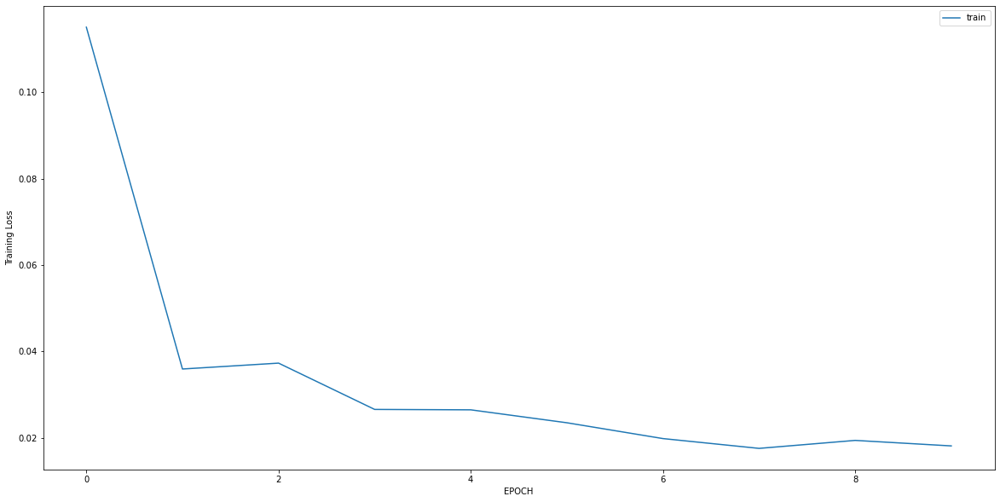

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5131 - accuracy: 0.8687
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3102 - accuracy: 0.9158
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2071 - accuracy: 0.9360
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1815 - accuracy: 0.9394
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1778 - accuracy: 0.9293
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1903 - accuracy: 0.9394
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1804 - accuracy: 0.9360
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2346 - accuracy: 0.9259
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1786 - accuracy: 0.9394
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1998 - accuracy: 0.9259


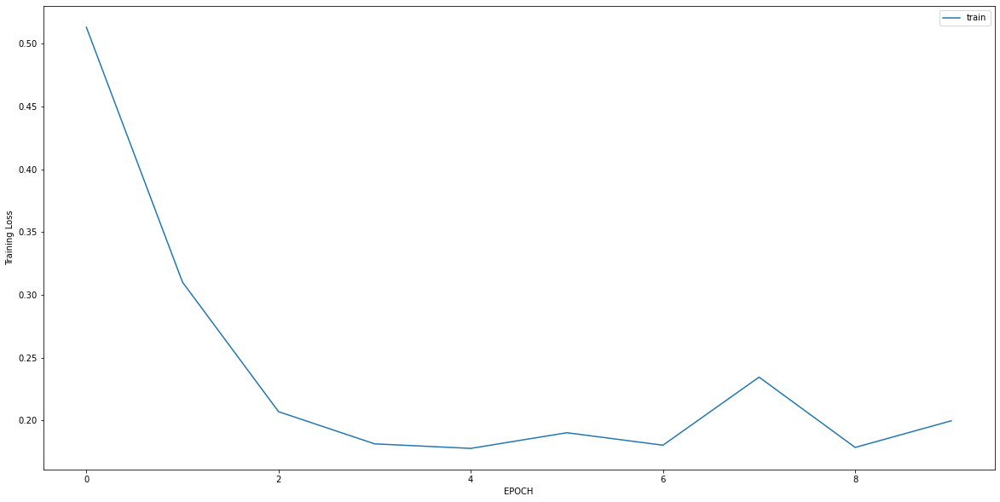

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2913 - accuracy: 0.9213
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3583 - accuracy: 0.8090
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2316 - accuracy: 0.9176
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2060 - accuracy: 0.9326
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1772 - accuracy: 0.9288
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1847 - accuracy: 0.9326
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1496 - accuracy: 0.9513
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1437 - accuracy: 0.9363
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1585 - accuracy: 0.9588
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1509 - accuracy: 0.9401


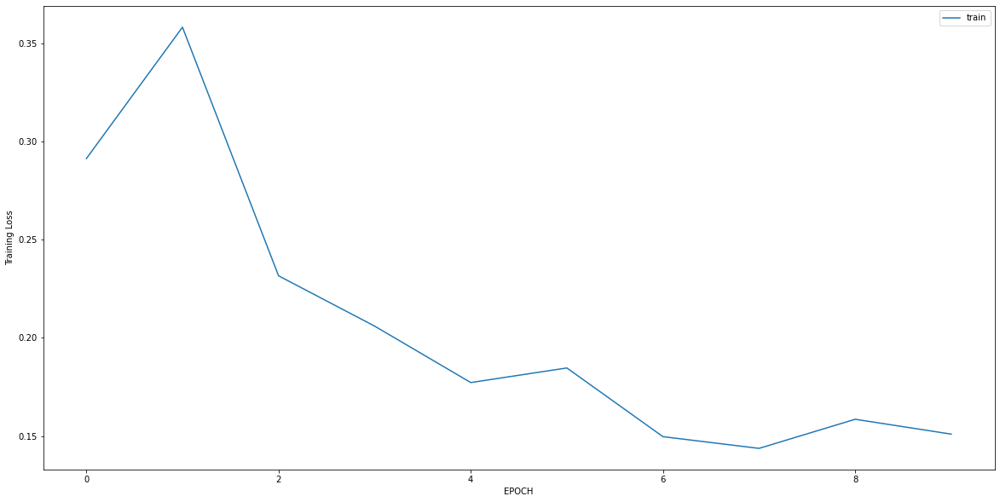

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 3.5571 - accuracy: 0.0088
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.6724 - accuracy: 0.6696
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0497 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0208 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0088 - accuracy: 1.0000


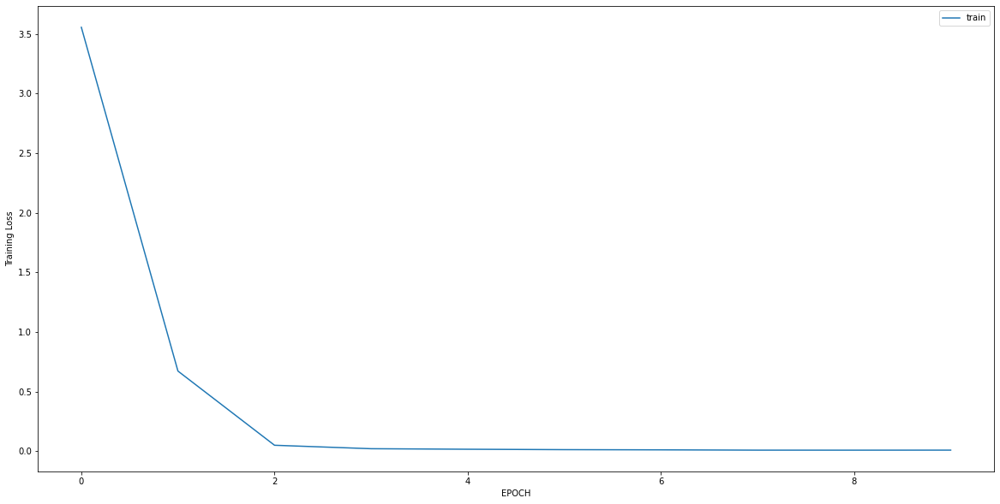

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 2.2920 - accuracy: 0.2991
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.3552 - accuracy: 0.4320
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5932 - accuracy: 0.7644
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3346 - accuracy: 0.8912
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2700 - accuracy: 0.9154
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2858 - accuracy: 0.9094
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2203 - accuracy: 0.9366
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2077 - accuracy: 0.9366
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2203 - accuracy: 0.9335
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1991 - accuracy: 0.9245


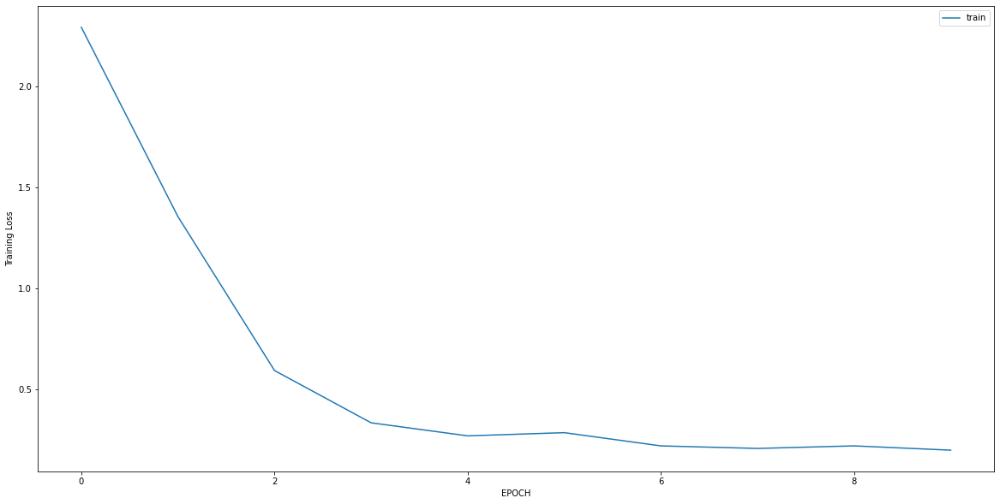

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2174 - accuracy: 0.8987
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2297 - accuracy: 0.9335
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1860 - accuracy: 0.9462
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2051 - accuracy: 0.9399
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1768 - accuracy: 0.9525
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2141 - accuracy: 0.9177
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1802 - accuracy: 0.9494
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1549 - accuracy: 0.9462
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1667 - accuracy: 0.9494
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1739 - accuracy: 0.9525


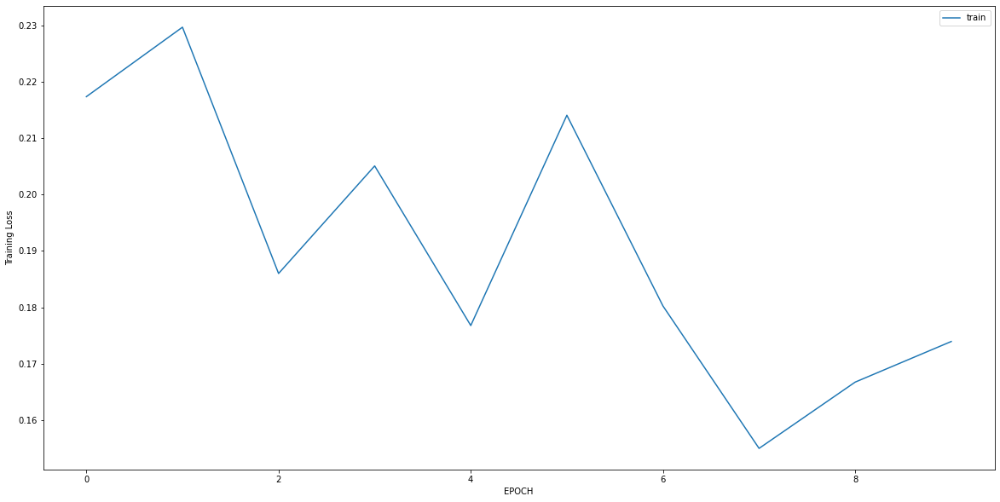

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.1994 - accuracy: 0.6263
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7393 - accuracy: 0.6512
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3465 - accuracy: 0.8256
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2426 - accuracy: 0.9395
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2195 - accuracy: 0.9573
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1873 - accuracy: 0.9644
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1709 - accuracy: 0.9680
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1546 - accuracy: 0.9715
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1534 - accuracy: 0.9786
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1477 - accuracy: 0.9786


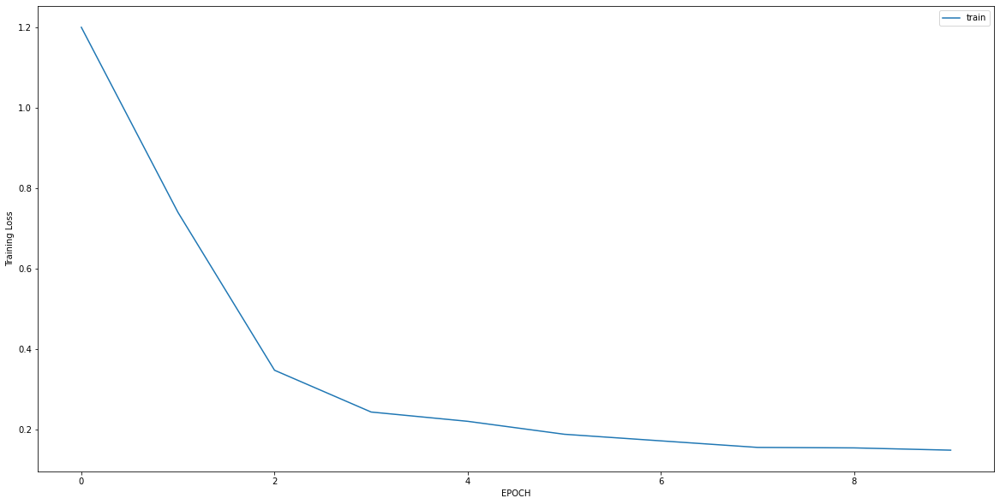

Epoch 1/10
8/8 [==============================] - 0s 11ms/step - loss: 0.2290 - accuracy: 0.8852
Epoch 2/10
8/8 [==============================] - 0s 8ms/step - loss: 0.1722 - accuracy: 0.9426
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1419 - accuracy: 0.9631
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1405 - accuracy: 0.9549
Epoch 5/10
8/8 [==============================] - 0s 10ms/step - loss: 0.1416 - accuracy: 0.9590
Epoch 6/10
8/8 [==============================] - 0s 9ms/step - loss: 0.1374 - accuracy: 0.9508: 0s - loss: 0.1415 - accuracy: 0.94
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1361 - accuracy: 0.9672
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1243 - accuracy: 0.9631
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1309 - accuracy: 0.9508
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1134 - accuracy: 0.9713


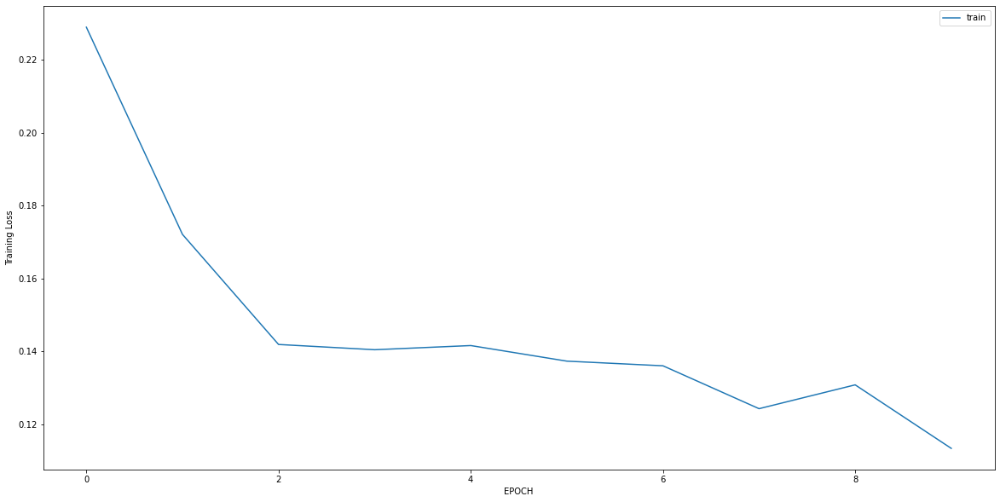

Epoch 1/10
11/11 [==============================] - 0s 9ms/step - loss: 0.4202 - accuracy: 0.7983
Epoch 2/10
11/11 [==============================] - 0s 10ms/step - loss: 0.2357 - accuracy: 0.9020
Epoch 3/10
11/11 [==============================] - 0s 7ms/step - loss: 0.1424 - accuracy: 0.9683
Epoch 4/10
11/11 [==============================] - 0s 9ms/step - loss: 0.1107 - accuracy: 0.9856
Epoch 5/10
11/11 [==============================] - 0s 9ms/step - loss: 0.1004 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0986 - accuracy: 0.9885
Epoch 7/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0834 - accuracy: 0.9942
Epoch 8/10
11/11 [==============================] - 0s 9ms/step - loss: 0.0750 - accuracy: 0.9942
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0795 - accuracy: 0.9914
Epoch 10/10
11/11 [==============================] - 0s 9ms/step - loss: 0.0770 - accuracy: 0.9942


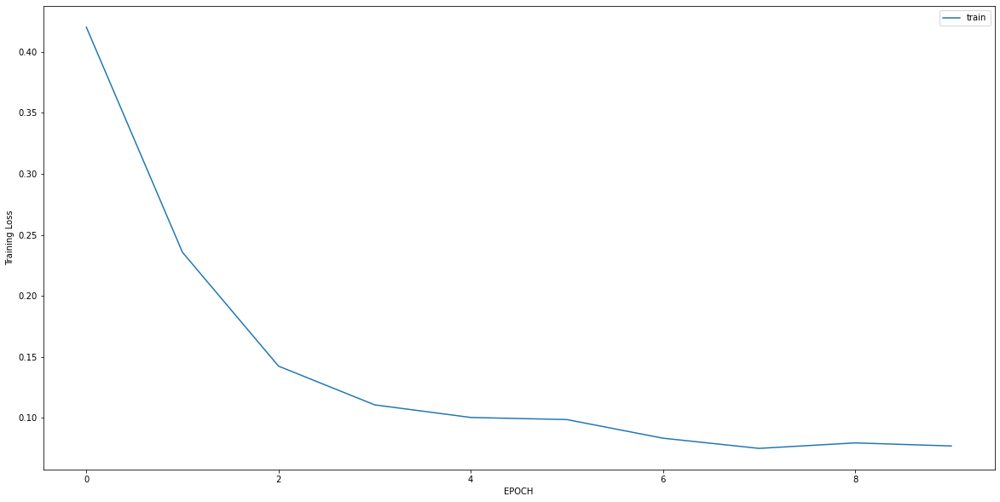

Epoch 1/10
9/9 [==============================] - 0s 10ms/step - loss: 0.3877 - accuracy: 0.8277
Epoch 2/10
9/9 [==============================] - 0s 9ms/step - loss: 0.2360 - accuracy: 0.9176
Epoch 3/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2254 - accuracy: 0.9326
Epoch 4/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2053 - accuracy: 0.9251
Epoch 5/10
9/9 [==============================] - 0s 9ms/step - loss: 0.1799 - accuracy: 0.9476
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 0.1896 - accuracy: 0.9551
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1907 - accuracy: 0.9363
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2291 - accuracy: 0.9139
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1322 - accuracy: 0.9513
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1341 - accuracy: 0.9513


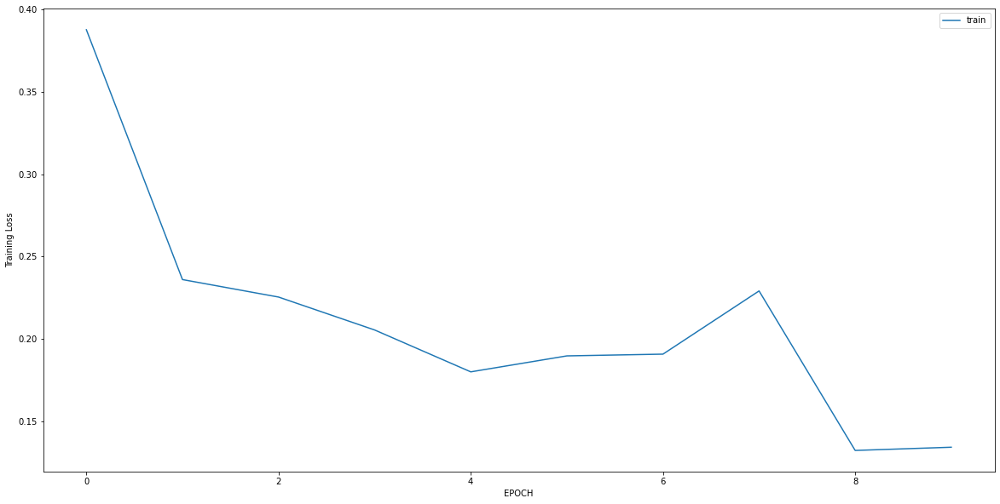

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4160 - accuracy: 0.8115
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1272 - accuracy: 0.9872
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0289 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0165 - accuracy: 1.0000


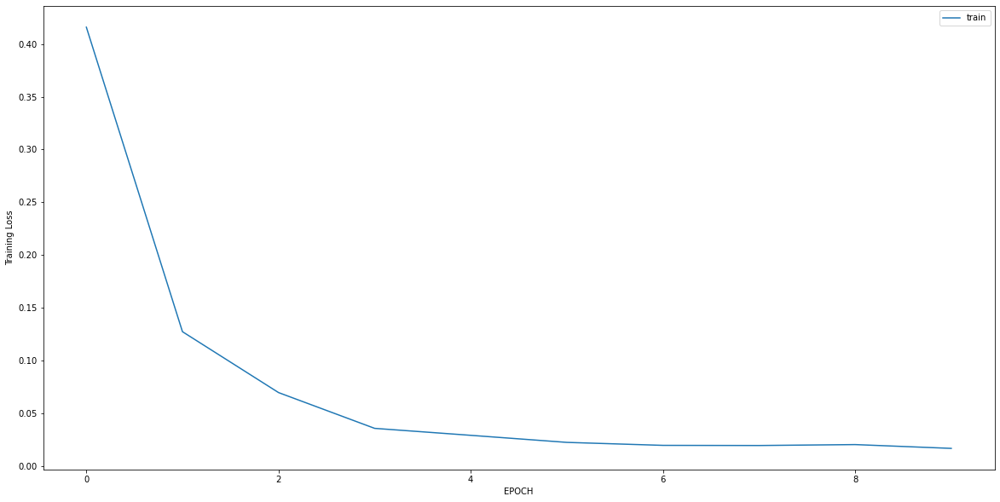

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8007 - accuracy: 0.7765
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4803 - accuracy: 0.8353
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4436 - accuracy: 0.8431
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3354 - accuracy: 0.8431
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2522 - accuracy: 0.8980
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2332 - accuracy: 0.9176
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2474 - accuracy: 0.9059
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2306 - accuracy: 0.9216
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1829 - accuracy: 0.9333
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1825 - accuracy: 0.9333


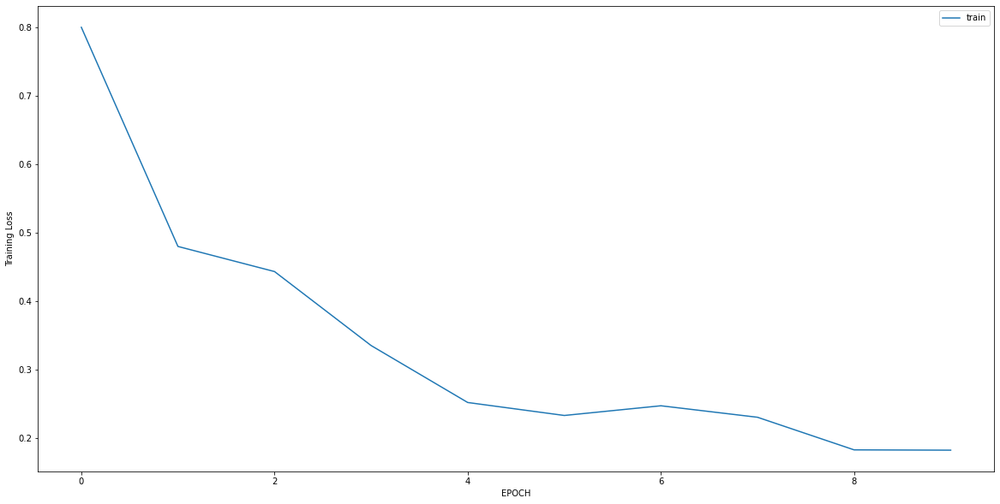

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7182 - accuracy: 0.7083
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5867 - accuracy: 0.7500
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4628 - accuracy: 0.7917
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3021 - accuracy: 0.8542
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3007 - accuracy: 0.8889
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2516 - accuracy: 0.9167
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2730 - accuracy: 0.8819
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1662 - accuracy: 0.9375
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2361 - accuracy: 0.9028
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3562 - accuracy: 0.8542


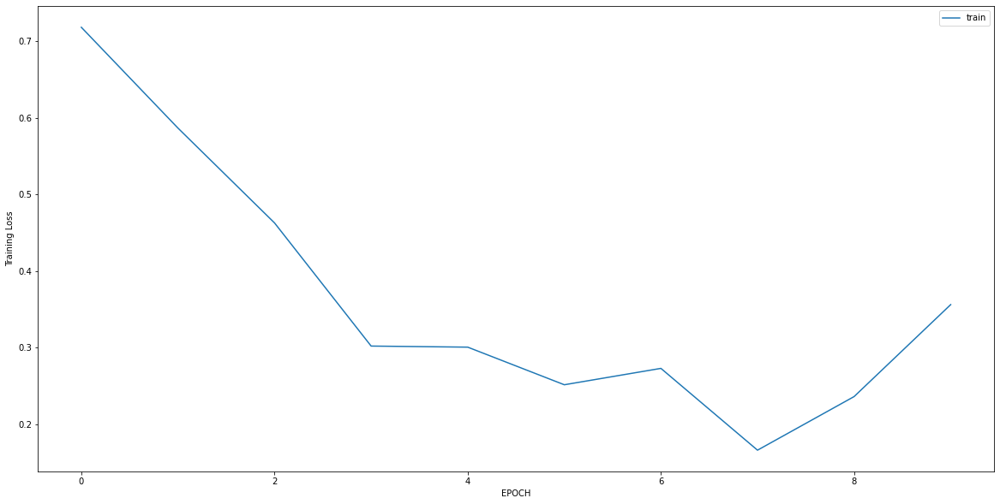

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.7847 - accuracy: 0.7492
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4627 - accuracy: 0.8097
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3130 - accuracy: 0.8489
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2450 - accuracy: 0.8792
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2051 - accuracy: 0.9245
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2330 - accuracy: 0.9275
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2004 - accuracy: 0.9184
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2076 - accuracy: 0.9335
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2469 - accuracy: 0.9033
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2860 - accuracy: 0.8671


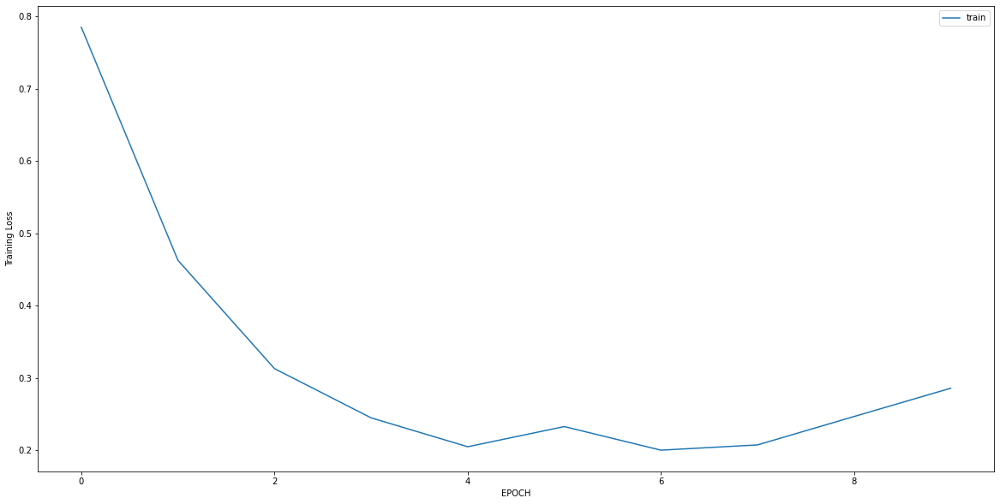

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2994 - accuracy: 0.2644
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5109 - accuracy: 0.7433
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2369 - accuracy: 0.9387
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1106 - accuracy: 0.9923
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0497 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0233 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0187 - accuracy: 1.0000


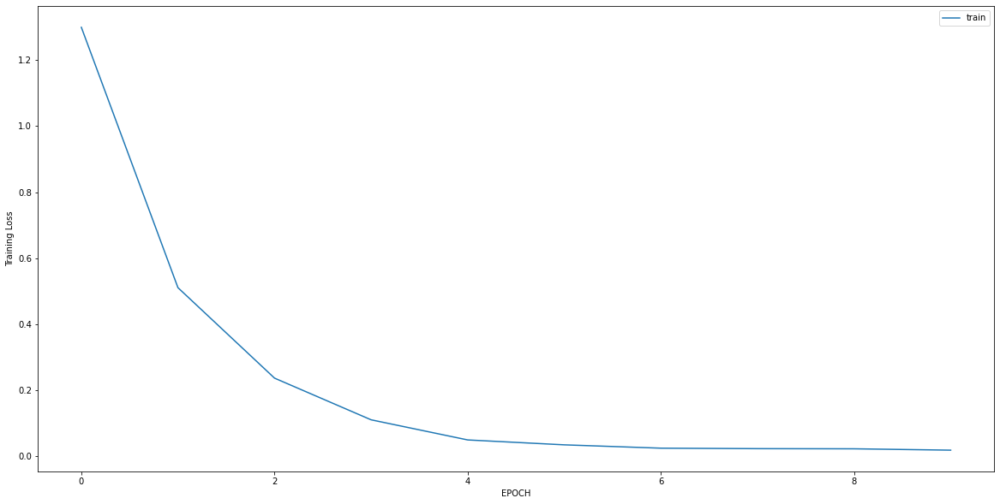

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2485 - accuracy: 0.9091
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2376 - accuracy: 0.9051
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1647 - accuracy: 0.9407
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1195 - accuracy: 0.9565
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0919 - accuracy: 0.9881
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0842 - accuracy: 0.9881
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0834 - accuracy: 0.9802
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0909 - accuracy: 0.9763
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1163 - accuracy: 0.9526
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1503 - accuracy: 0.9447


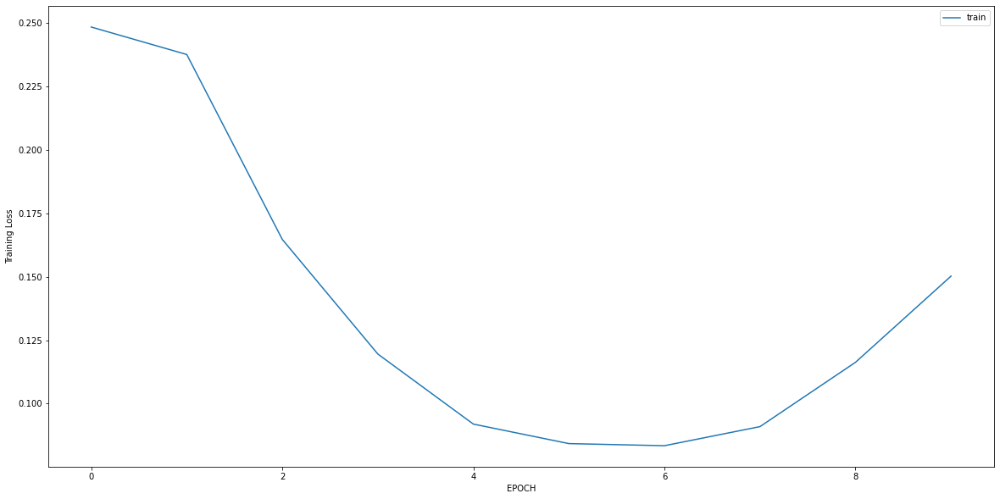

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.5455 - accuracy: 0.4206
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0746 - accuracy: 0.9881
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0078 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0050 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0046 - accuracy: 1.0000


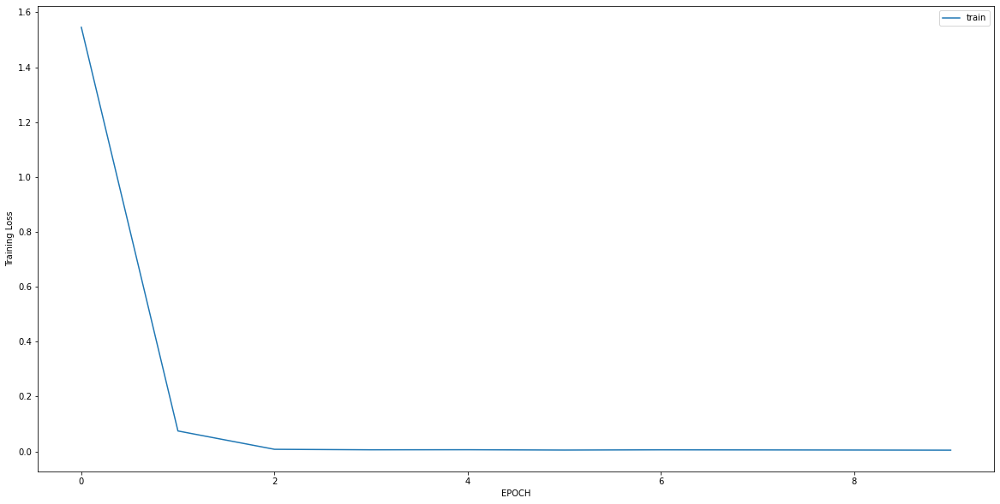

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0303 - accuracy: 0.9879
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 10ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0066 - accuracy: 1.0000


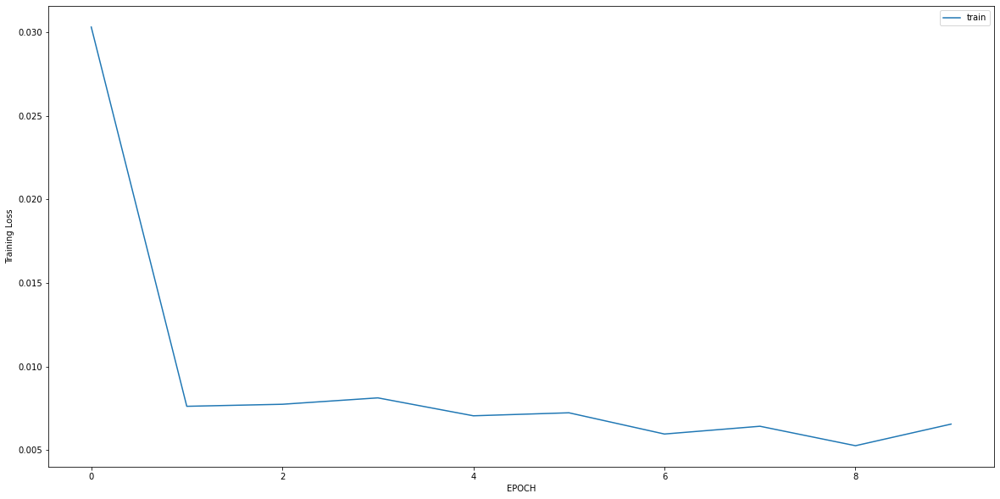

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.1718 - accuracy: 0.6646
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5178 - accuracy: 0.7943
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3428 - accuracy: 0.8766
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2963 - accuracy: 0.8829
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2603 - accuracy: 0.9272
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2134 - accuracy: 0.9082
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1845 - accuracy: 0.9367
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2085 - accuracy: 0.9399
Epoch 9/10
10/10 [==============================] - 0s 8ms/step - loss: 0.1990 - accuracy: 0.9114
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1704 - accuracy: 0.9525


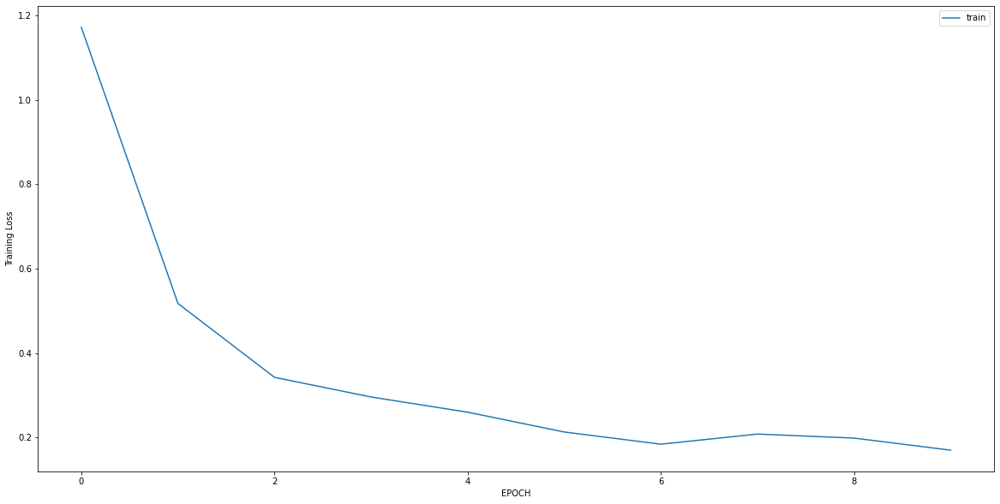

Epoch 1/10
12/12 [==============================] - 0s 6ms/step - loss: 0.3661 - accuracy: 0.8609
Epoch 2/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 0.9974
Epoch 3/10
12/12 [==============================] - 0s 9ms/step - loss: 0.0349 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 7ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0215 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0145 - accuracy: 1.0000


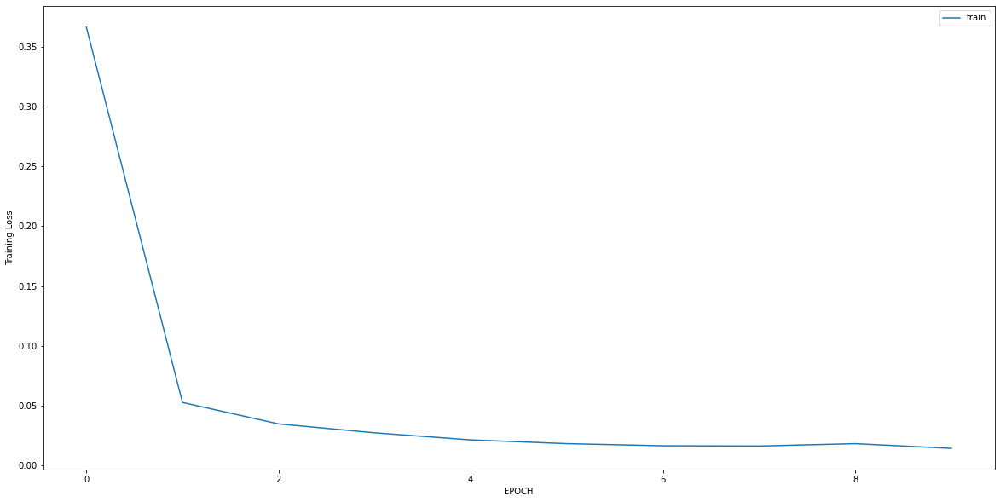

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7436 - accuracy: 0.7994
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5599 - accuracy: 0.8652
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4132 - accuracy: 0.8903
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3139 - accuracy: 0.9028
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2422 - accuracy: 0.9248
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3070 - accuracy: 0.9091
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4543 - accuracy: 0.8589
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1667 - accuracy: 0.9310
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1244 - accuracy: 0.9498
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0882 - accuracy: 0.9687


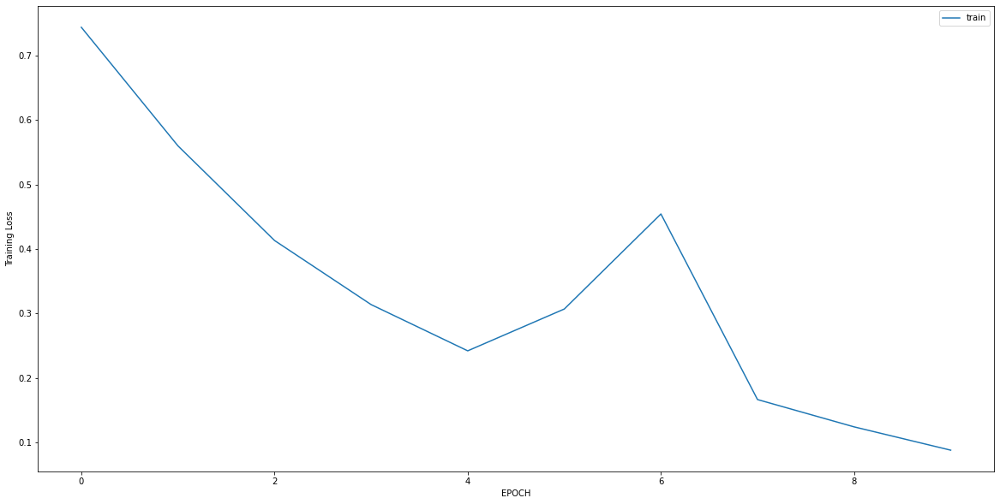

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.3942 - accuracy: 0.5760
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2212 - accuracy: 0.9240
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1653 - accuracy: 0.9211
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0957 - accuracy: 0.9708
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0853 - accuracy: 0.9678
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0718 - accuracy: 0.9737
Epoch 7/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0399 - accuracy: 0.9912
Epoch 8/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0513 - accuracy: 0.9883
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0530 - accuracy: 0.9766
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0490 - accuracy: 0.9942


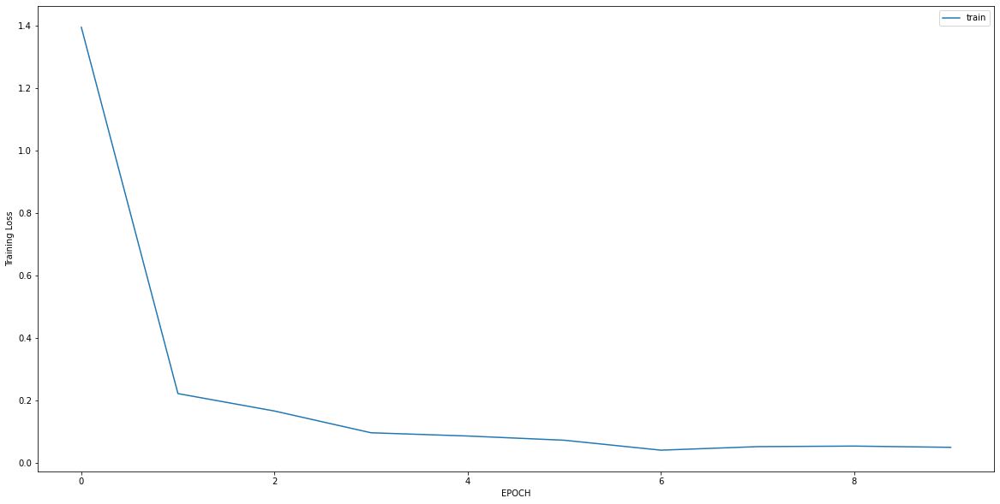

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0991 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9828 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0337 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9860 - accuracy: 0.7153
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9018 - accuracy: 0.7153
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7221 - accuracy: 0.7083
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6570 - accuracy: 0.7153
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4935 - accuracy: 0.7847
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4117 - accuracy: 0.8264
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4794 - accuracy: 0.7431


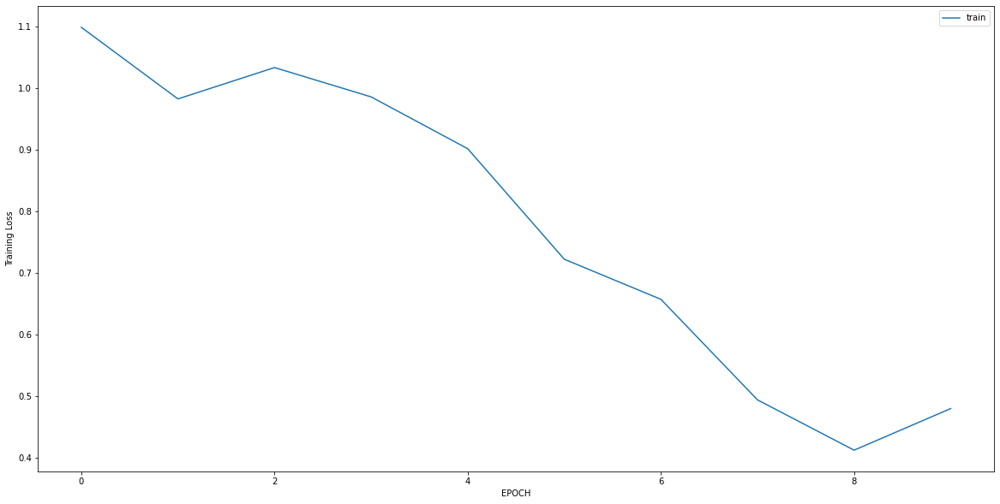

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1159 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0845 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0577 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 13ms/step - loss: 0.0458 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 10ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 9ms/step - loss: 0.0239 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0216 - accuracy: 1.0000


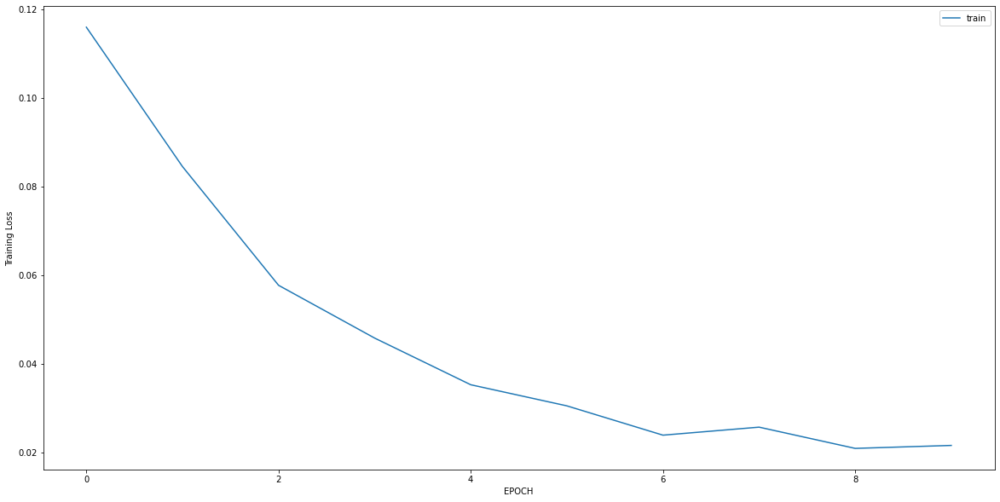

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0145 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0111 - accuracy: 1.0000


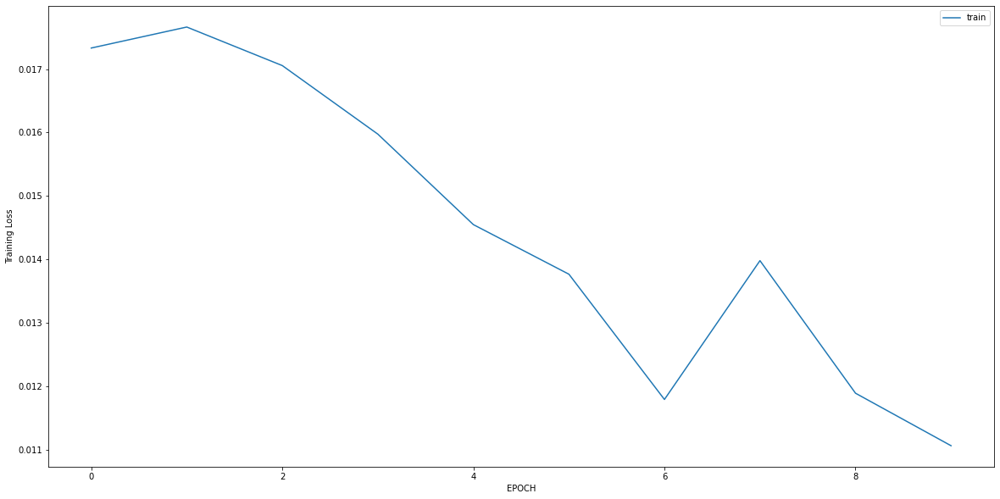

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0133 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0112 - accuracy: 1.0000


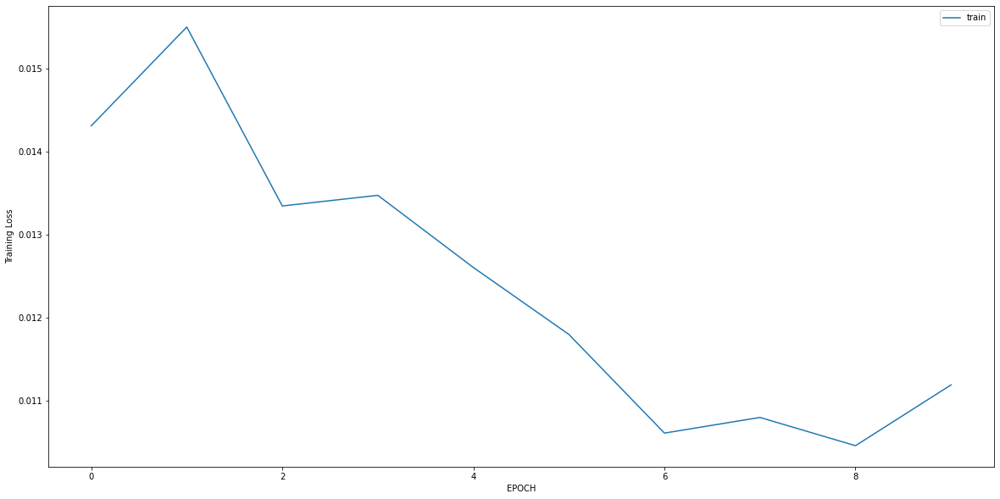

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1595 - accuracy: 0.9195
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0069 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0056 - accuracy: 1.0000


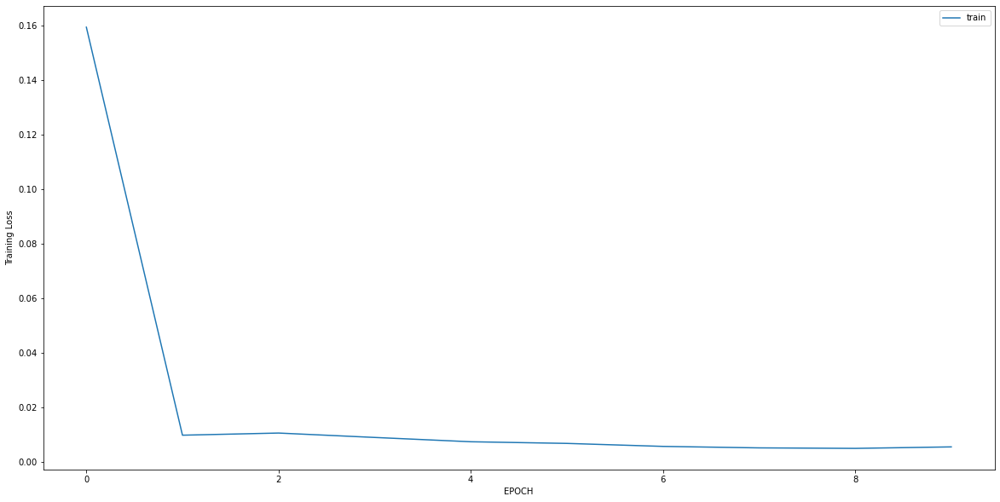

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.6891 - accuracy: 0.3381
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9649 - accuracy: 0.4460
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6884 - accuracy: 0.5540
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4862 - accuracy: 0.7554
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4239 - accuracy: 0.8345
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3462 - accuracy: 0.8921
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2513 - accuracy: 0.9353
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2299 - accuracy: 0.9424
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1943 - accuracy: 0.9640
Epoch 10/10
5/5 [==============================] - 0s 11ms/step - loss: 0.1754 - accuracy: 0.9640


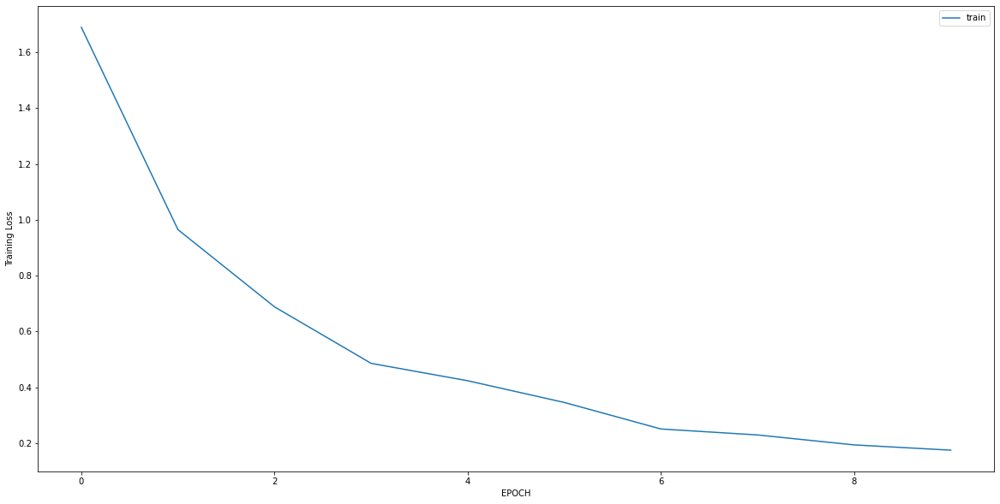

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.7907 - accuracy: 0.7007
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4436 - accuracy: 0.8074
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3359 - accuracy: 0.8283
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3221 - accuracy: 0.8538
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2619 - accuracy: 0.8886
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2402 - accuracy: 0.9026
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2404 - accuracy: 0.9002
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2213 - accuracy: 0.8886
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1933 - accuracy: 0.9304
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2026 - accuracy: 0.9188


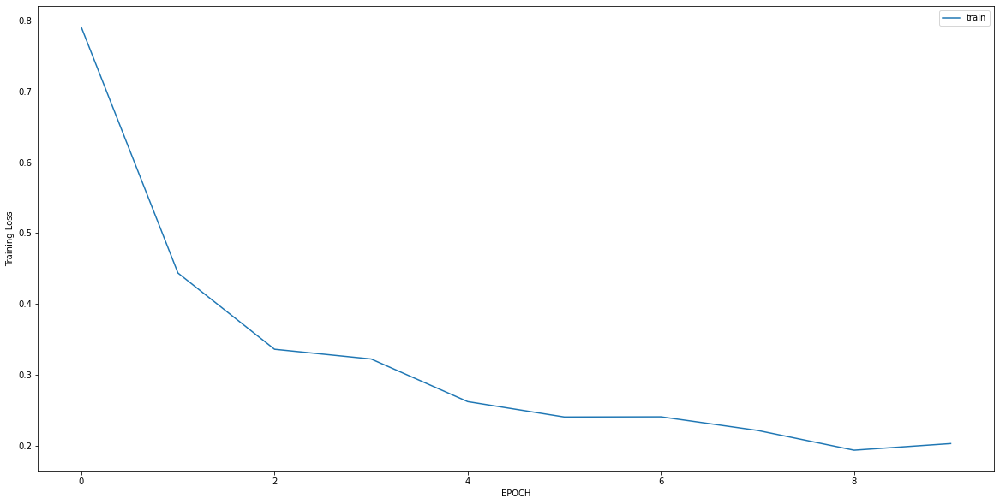

Epoch 1/10
7/7 [==============================] - 0s 4ms/step - loss: 0.8683 - accuracy: 0.7028
Epoch 2/10
7/7 [==============================] - 0s 4ms/step - loss: 0.7421 - accuracy: 0.7170
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5695 - accuracy: 0.7170
Epoch 4/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4564 - accuracy: 0.7406
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4222 - accuracy: 0.7547
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3738 - accuracy: 0.8160
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3630 - accuracy: 0.8208
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4008 - accuracy: 0.8019
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3099 - accuracy: 0.8255
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2845 - accuracy: 0.8726


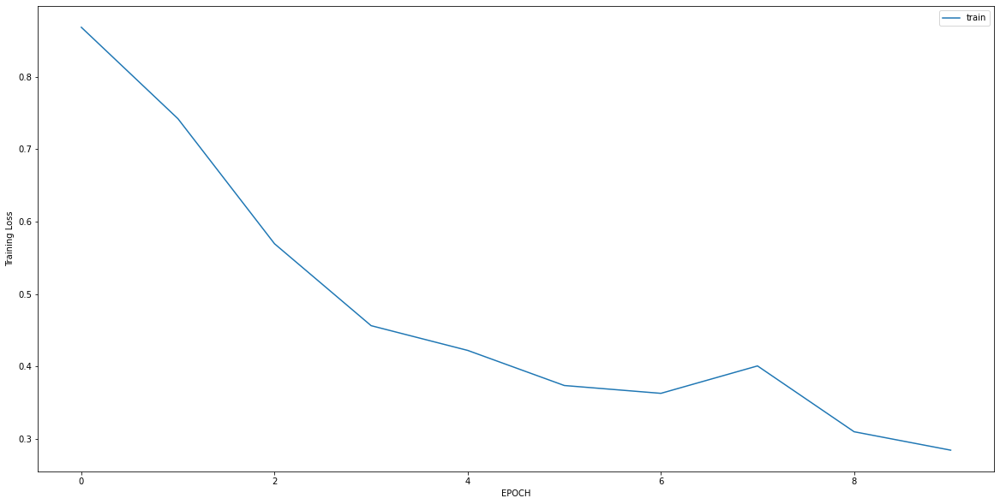

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 3.1022 - accuracy: 0.0000e+00
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 2.4546 - accuracy: 0.0357
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 1.9501 - accuracy: 0.0893
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 2.1693 - accuracy: 0.0536
Epoch 5/10
2/2 [==============================] - 0s 5ms/step - loss: 2.1577 - accuracy: 0.0536
Epoch 6/10
2/2 [==============================] - 0s 5ms/step - loss: 1.2579 - accuracy: 0.2679
Epoch 7/10
2/2 [==============================] - 0s 5ms/step - loss: 0.8468 - accuracy: 0.5179
Epoch 8/10
2/2 [==============================] - 0s 5ms/step - loss: 0.8783 - accuracy: 0.5000
Epoch 9/10
2/2 [==============================] - 0s 5ms/step - loss: 0.5500 - accuracy: 0.6786
Epoch 10/10
2/2 [==============================] - 0s 5ms/step - loss: 0.4528 - accuracy: 0.8750


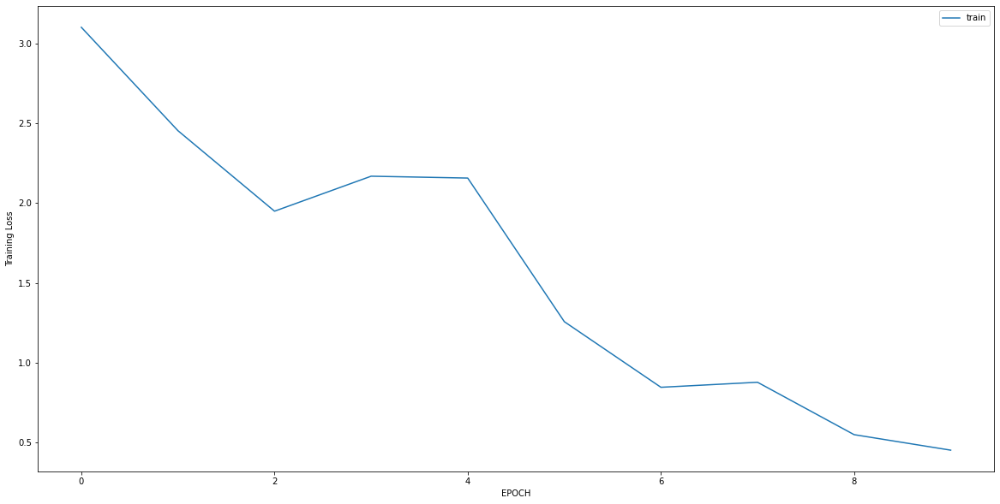

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3795 - accuracy: 0.8576
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3778 - accuracy: 0.8576
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3316 - accuracy: 0.9007
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3226 - accuracy: 0.8775
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2895 - accuracy: 0.8974
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2970 - accuracy: 0.8874
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3145 - accuracy: 0.8808
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2052 - accuracy: 0.9404
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1779 - accuracy: 0.9669
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1460 - accuracy: 0.9669


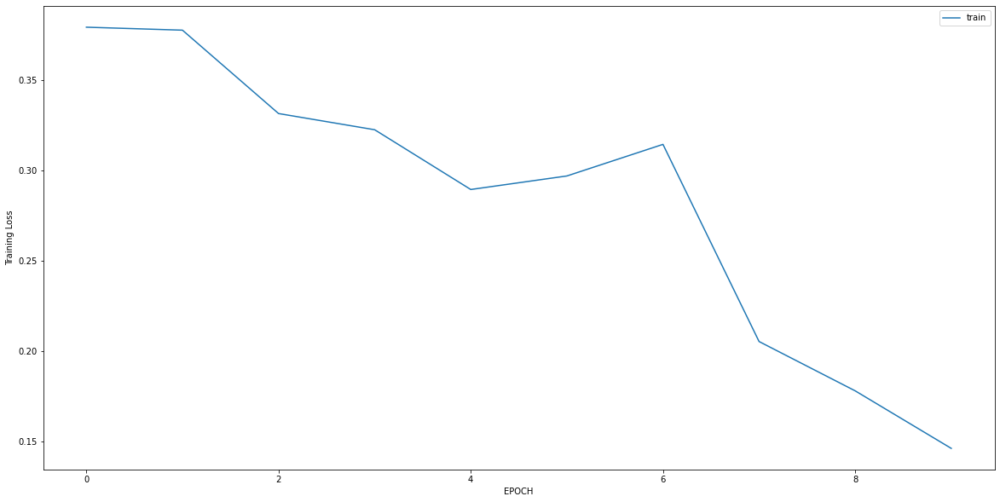

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1790 - accuracy: 0.9061
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0131 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0088 - accuracy: 1.0000


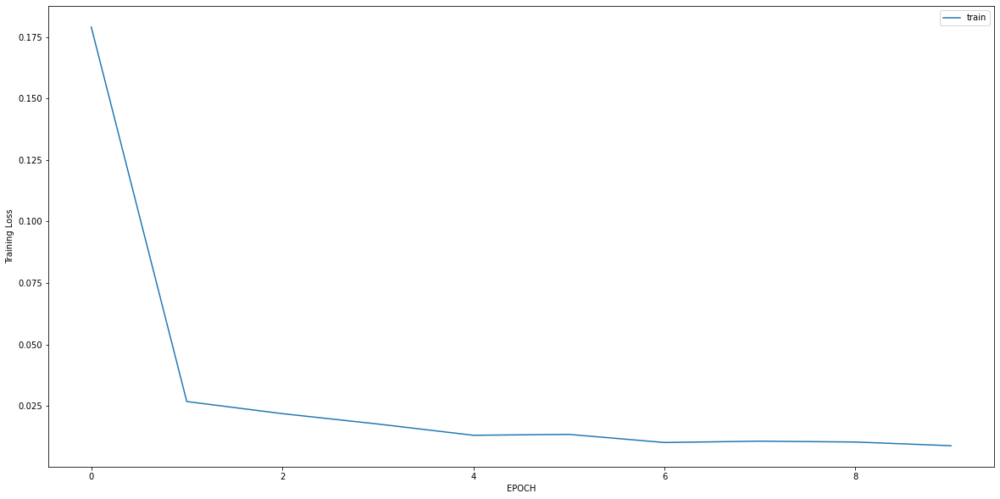

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3970 - accuracy: 0.8711
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3498 - accuracy: 0.8990
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3163 - accuracy: 0.8815
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3097 - accuracy: 0.9094
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2817 - accuracy: 0.9059
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2833 - accuracy: 0.8955
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2833 - accuracy: 0.9199
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3182 - accuracy: 0.8920
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2965 - accuracy: 0.9059
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2828 - accuracy: 0.8885


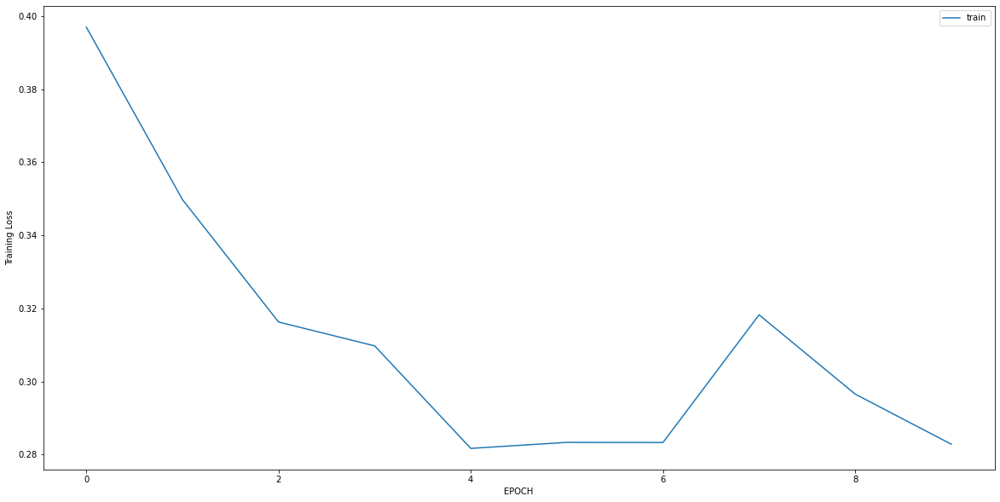

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9231 - accuracy: 0.7530
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5753 - accuracy: 0.7692
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3443 - accuracy: 0.8421
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1884 - accuracy: 0.9271
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1376 - accuracy: 0.9595
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0955 - accuracy: 0.9717
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0887 - accuracy: 0.9838
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0743 - accuracy: 0.9838
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0632 - accuracy: 0.9879
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1777 - accuracy: 0.9433


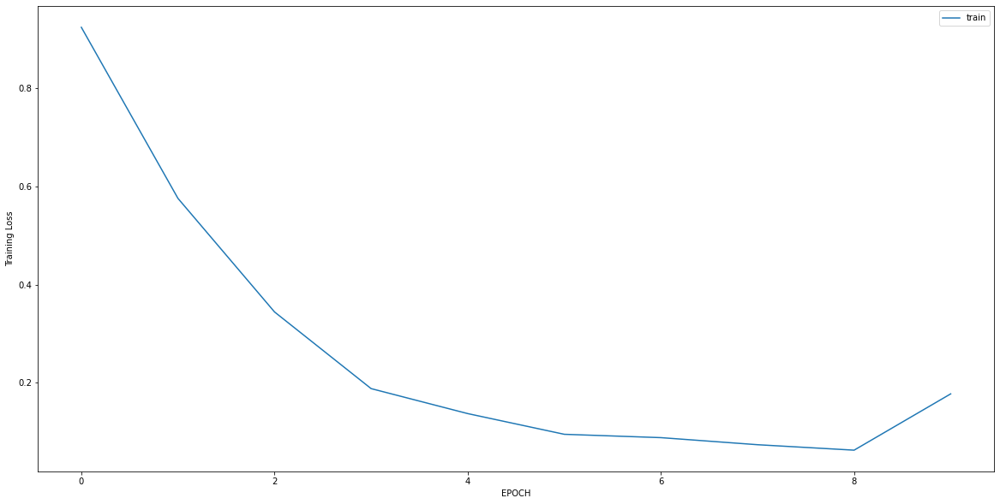

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4314 - accuracy: 0.8007
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2156 - accuracy: 0.9431
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1360 - accuracy: 0.9751
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1337 - accuracy: 0.9715
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1097 - accuracy: 0.9786
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1350 - accuracy: 0.9609
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1198 - accuracy: 0.9822
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1291 - accuracy: 0.9680
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1078 - accuracy: 0.9751
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1128 - accuracy: 0.9715


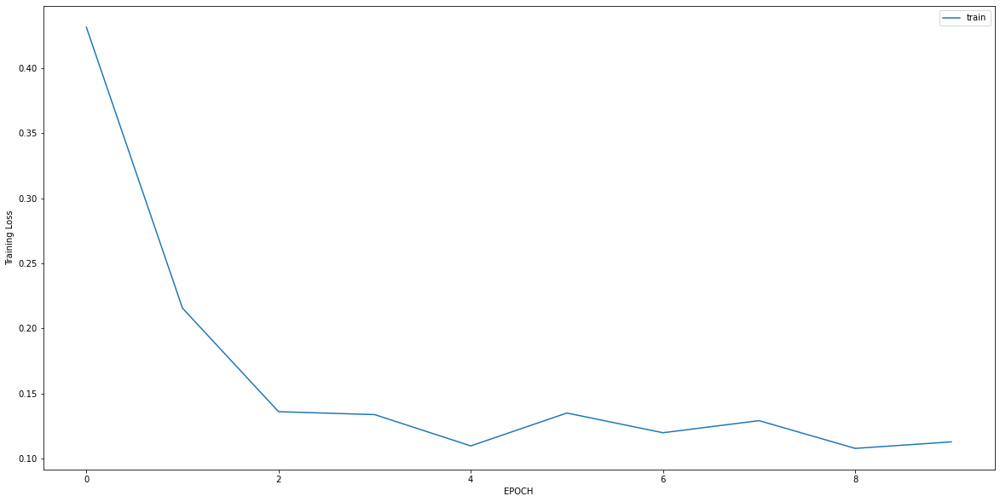

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3866 - accuracy: 0.8651
Epoch 2/10
8/8 [==============================] - 0s 9ms/step - loss: 0.3002 - accuracy: 0.9087
Epoch 3/10
8/8 [==============================] - 0s 10ms/step - loss: 0.3239 - accuracy: 0.8611
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.2507 - accuracy: 0.9167
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2797 - accuracy: 0.9246
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2293 - accuracy: 0.9325
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2222 - accuracy: 0.9444
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2150 - accuracy: 0.9405
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2037 - accuracy: 0.9325
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2171 - accuracy: 0.9365


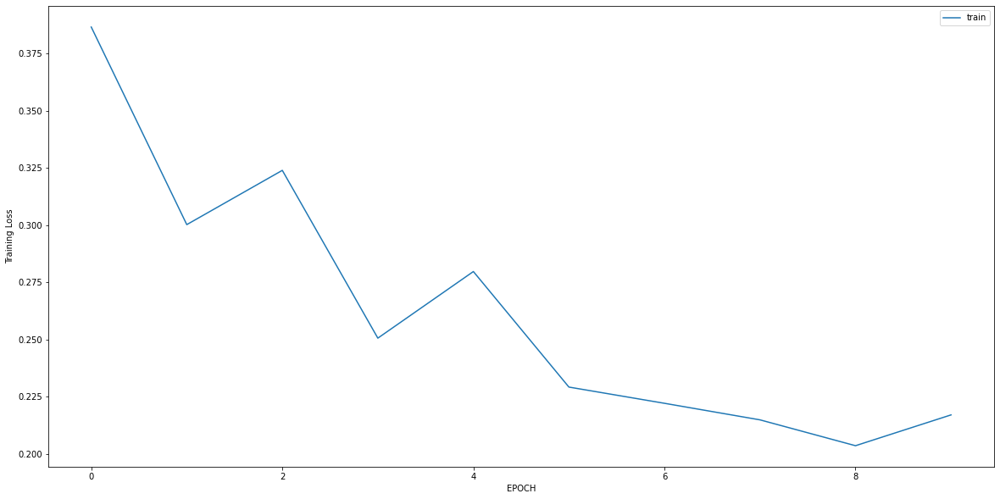

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.1163 - accuracy: 0.5963
Epoch 2/10
7/7 [==============================] - 0s 4ms/step - loss: 0.8100 - accuracy: 0.7064
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5526 - accuracy: 0.7890
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4012 - accuracy: 0.8349
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2739 - accuracy: 0.8899
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2102 - accuracy: 0.9358
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2441 - accuracy: 0.9128
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3135 - accuracy: 0.8624
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3600 - accuracy: 0.8945
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2678 - accuracy: 0.8807


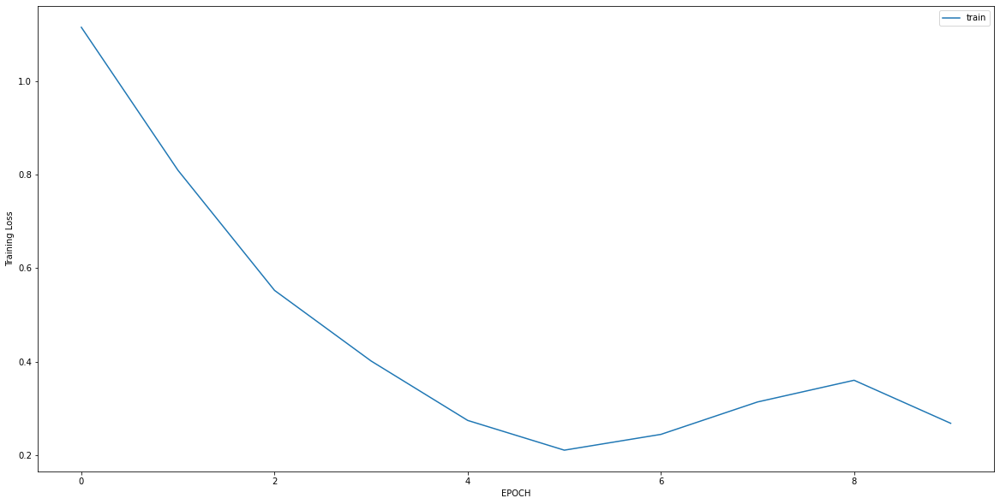

Epoch 1/10
5/5 [==============================] - 0s 4ms/step - loss: 1.9906 - accuracy: 0.4493
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 1.9685 - accuracy: 0.4493
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 1.6757 - accuracy: 0.4493
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 1.4120 - accuracy: 0.4493
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 1.0719 - accuracy: 0.4928
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8562 - accuracy: 0.5290
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6761 - accuracy: 0.5725
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7165 - accuracy: 0.5435
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.6159
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7125 - accuracy: 0.5870


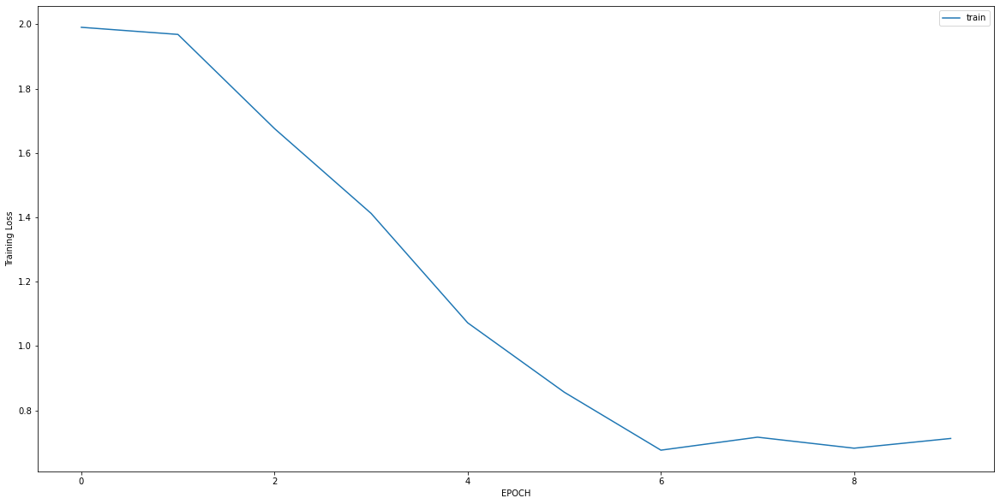

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6104 - accuracy: 0.6751
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5417 - accuracy: 0.7256
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5534 - accuracy: 0.7184
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5012 - accuracy: 0.7762
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4704 - accuracy: 0.7978
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3932 - accuracy: 0.8448
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3978 - accuracy: 0.8484
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3220 - accuracy: 0.9206
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2908 - accuracy: 0.9242
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3198 - accuracy: 0.9097


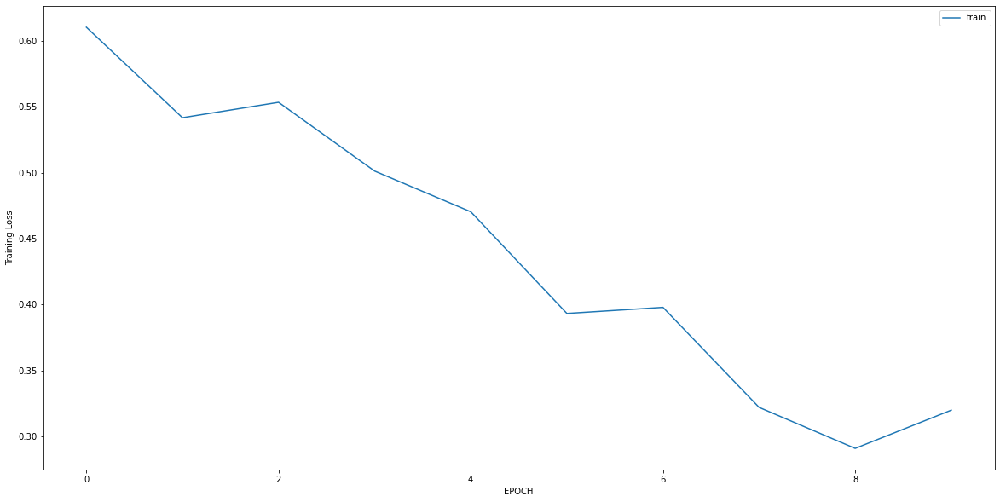

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2901 - accuracy: 0.9007
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2434 - accuracy: 0.9301
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2219 - accuracy: 0.9338
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2226 - accuracy: 0.9375
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1679 - accuracy: 0.9559
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1908 - accuracy: 0.9559
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1712 - accuracy: 0.9632
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1400 - accuracy: 0.9669
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1475 - accuracy: 0.9632
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1395 - accuracy: 0.9596


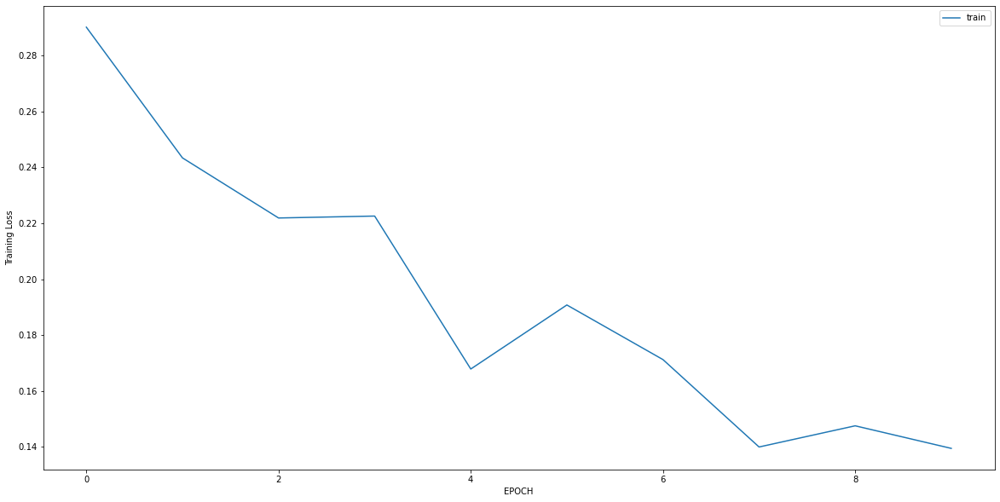

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.4952 - accuracy: 0.7833
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1731 - accuracy: 0.9889
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1170 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0827 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0583 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0127 - accuracy: 1.0000


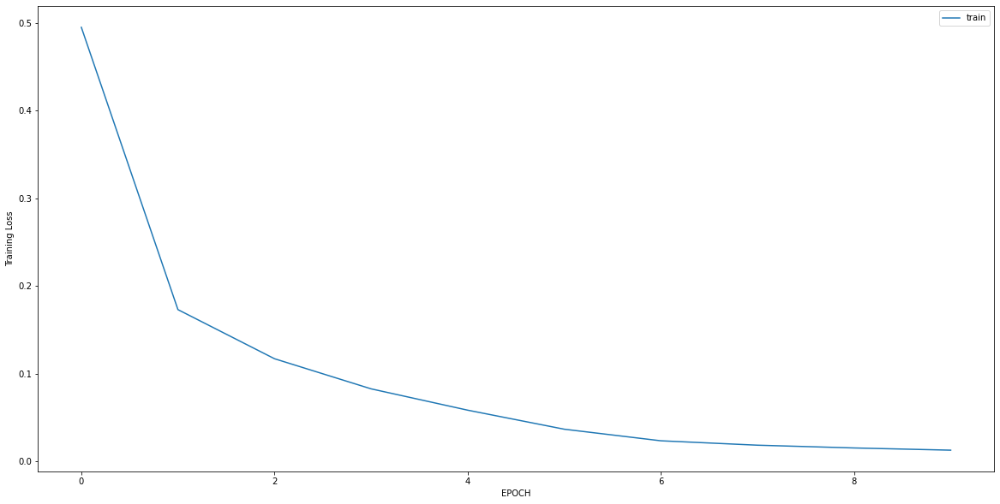

Epoch 1/10
8/8 [==============================] - 0s 12ms/step - loss: 1.0249 - accuracy: 0.6895
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7645 - accuracy: 0.7782
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5969 - accuracy: 0.8226
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4212 - accuracy: 0.8710
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3301 - accuracy: 0.8790
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2303 - accuracy: 0.9234
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1777 - accuracy: 0.9355
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1622 - accuracy: 0.9435
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1045 - accuracy: 0.9597
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1026 - accuracy: 0.9758


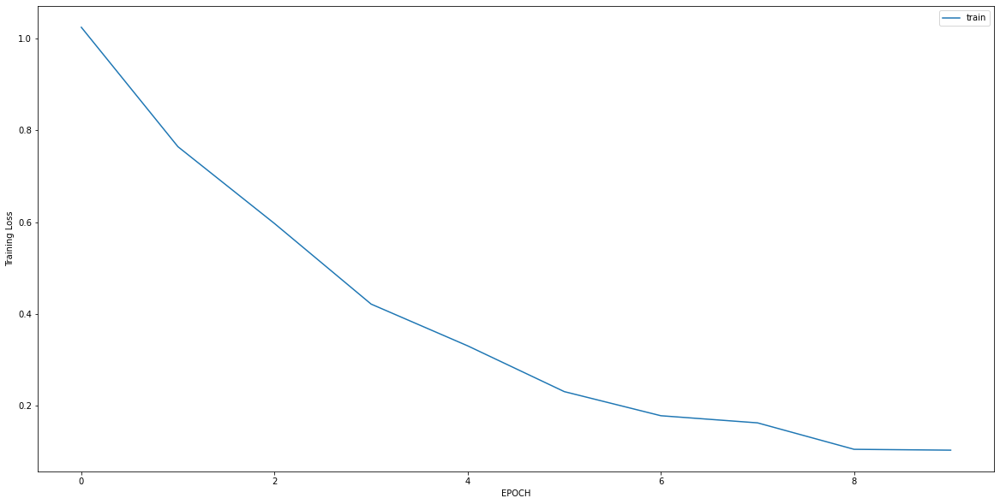

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4039 - accuracy: 0.8047
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2525 - accuracy: 0.9192
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2100 - accuracy: 0.9158
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1968 - accuracy: 0.9327
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1441 - accuracy: 0.9529
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1093 - accuracy: 0.9562
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1170 - accuracy: 0.9596
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1101 - accuracy: 0.9596
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1110 - accuracy: 0.9731
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1015 - accuracy: 0.9731


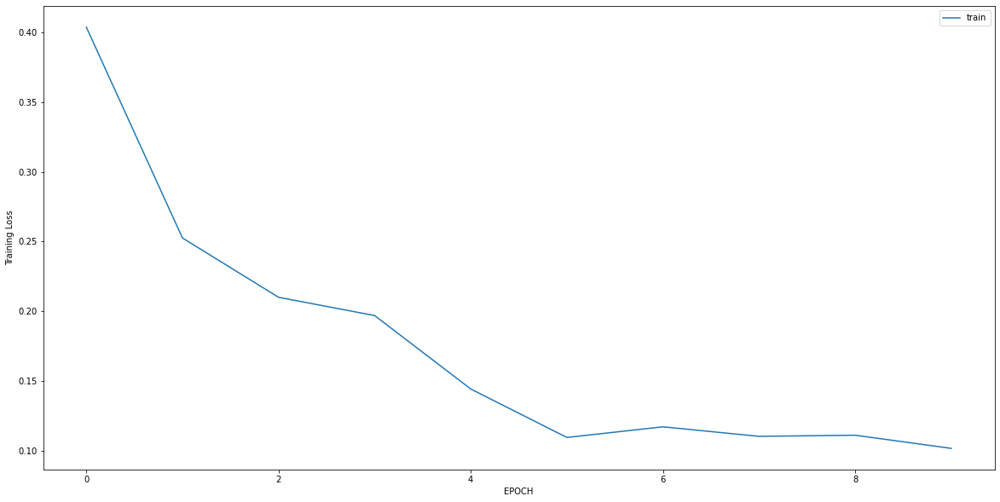

Epoch 1/10
8/8 [==============================] - 0s 9ms/step - loss: 0.2319 - accuracy: 0.9286
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1398 - accuracy: 0.9405
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1335 - accuracy: 0.9484
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1135 - accuracy: 0.9643
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0789 - accuracy: 0.9762
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0953 - accuracy: 0.9643
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0705 - accuracy: 0.9643
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0642 - accuracy: 0.9881
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0775 - accuracy: 0.9802
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0611 - accuracy: 0.9841


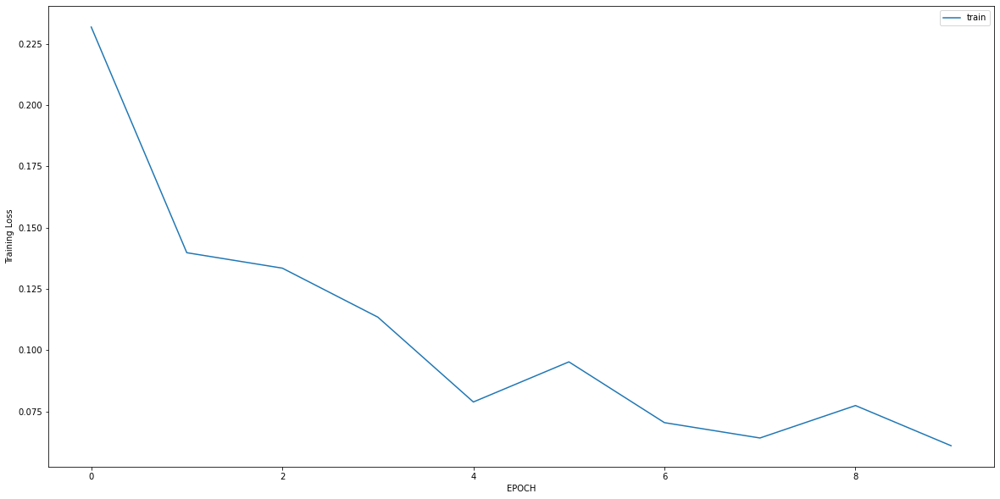

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2182 - accuracy: 0.9151
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1446 - accuracy: 0.9497
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1123 - accuracy: 0.9623
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0879 - accuracy: 0.9780
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0805 - accuracy: 0.9748
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0644 - accuracy: 0.9874
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0831 - accuracy: 0.9811
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0542 - accuracy: 0.9937
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0514 - accuracy: 0.9969
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.9969


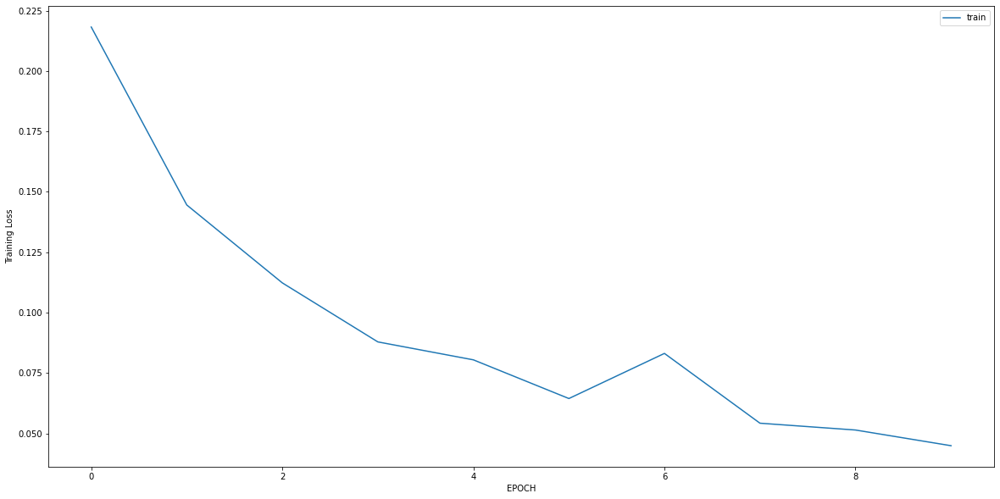

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.1876 - accuracy: 0.5306
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0530 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 1.0000


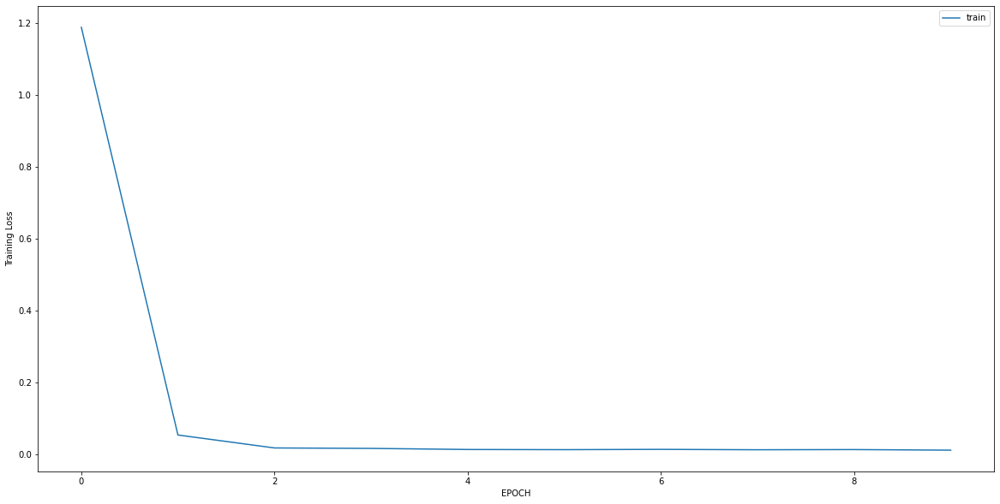

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8525 - accuracy: 0.8112
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6600 - accuracy: 0.8357
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4459 - accuracy: 0.8811
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3417 - accuracy: 0.9056
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3135 - accuracy: 0.9126
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2849 - accuracy: 0.9021
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3363 - accuracy: 0.8986
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3030 - accuracy: 0.9021
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3090 - accuracy: 0.9091
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2896 - accuracy: 0.9091


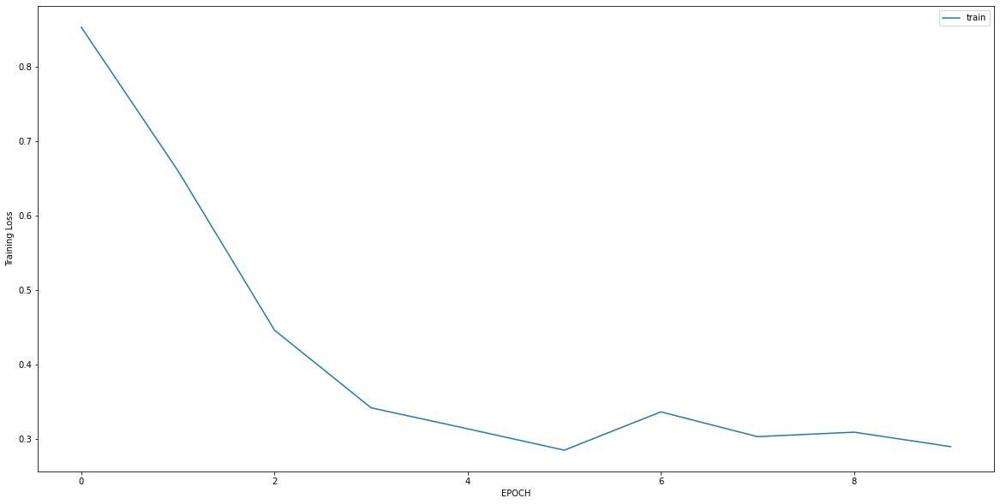

Epoch 1/10
18/18 [==============================] - 0s 6ms/step - loss: 1.7824 - accuracy: 0.4886
Epoch 2/10
18/18 [==============================] - 0s 9ms/step - loss: 0.0874 - accuracy: 0.9965
Epoch 3/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 7ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 9ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0122 - accuracy: 1.0000


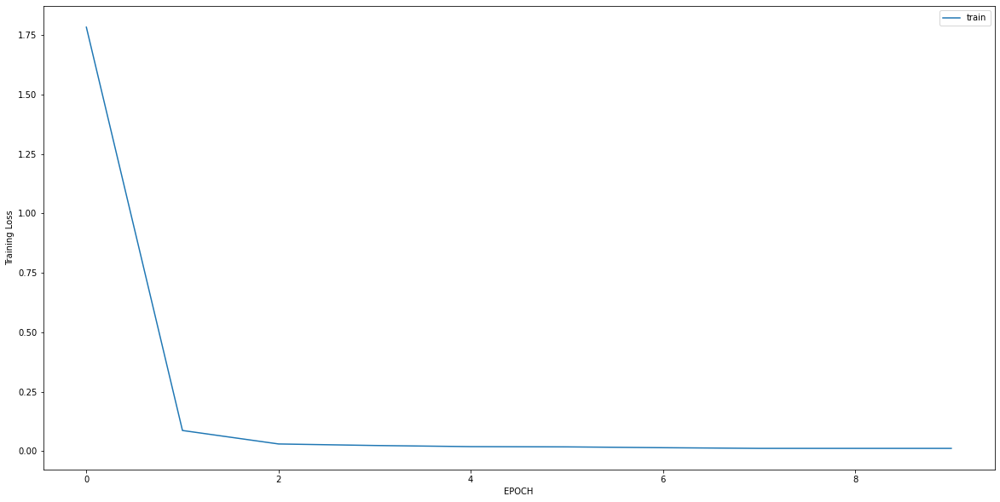

Epoch 1/10
9/9 [==============================] - 0s 10ms/step - loss: 0.5332 - accuracy: 0.7313
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 0.3546 - accuracy: 0.8843
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3266 - accuracy: 0.9030
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3096 - accuracy: 0.9142
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2681 - accuracy: 0.9328
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2335 - accuracy: 0.9328
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2391 - accuracy: 0.9440
Epoch 8/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2034 - accuracy: 0.9478
Epoch 9/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2399 - accuracy: 0.9440
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2193 - accuracy: 0.9403


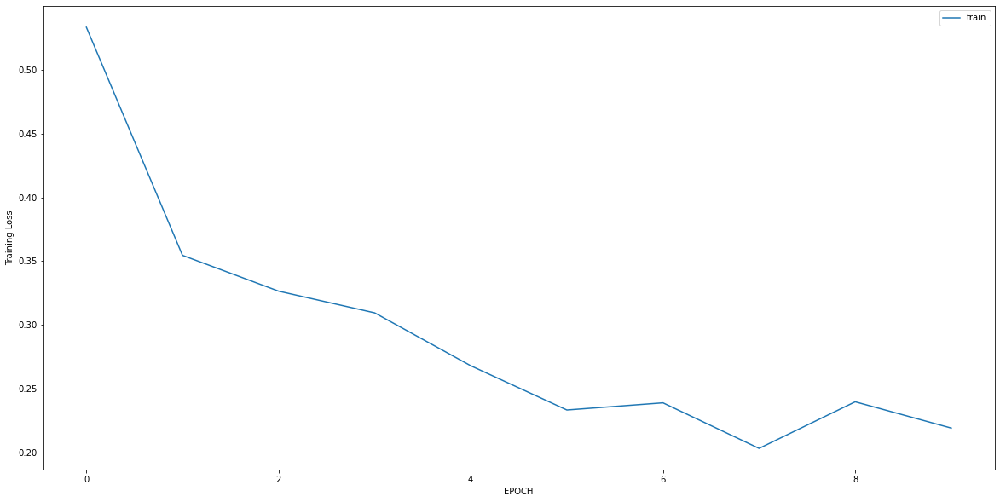

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 1.2025 - accuracy: 0.3367
Epoch 2/10
4/4 [==============================] - 0s 5ms/step - loss: 0.6550 - accuracy: 0.7245
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4920 - accuracy: 0.7755
Epoch 4/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2942 - accuracy: 0.8776
Epoch 5/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2831 - accuracy: 0.8673
Epoch 6/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2175 - accuracy: 0.9082
Epoch 7/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2173 - accuracy: 0.8980
Epoch 8/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2131 - accuracy: 0.9082
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3663 - accuracy: 0.8367
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4311 - accuracy: 0.8061


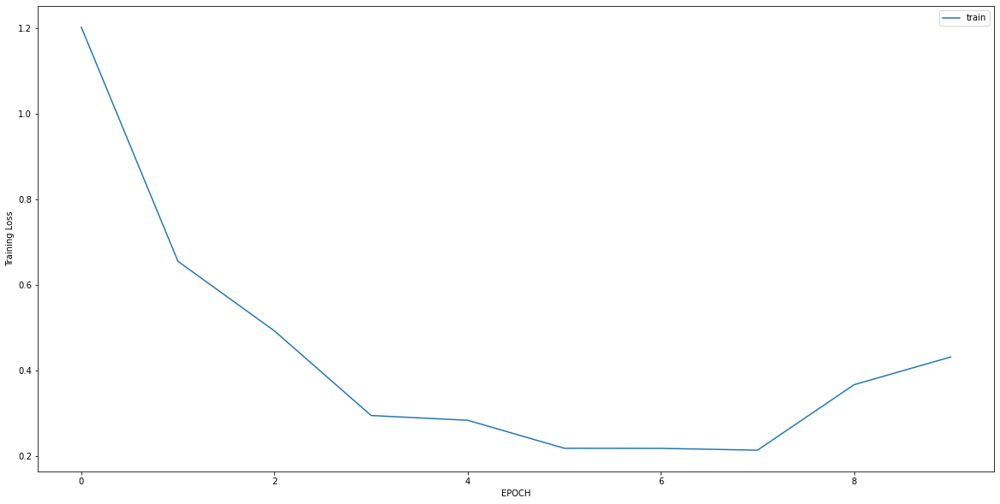

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8760 - accuracy: 0.6772
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5066 - accuracy: 0.7930
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4405 - accuracy: 0.8667
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4161 - accuracy: 0.8491
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3382 - accuracy: 0.8702
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2963 - accuracy: 0.8842
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2876 - accuracy: 0.8947
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3014 - accuracy: 0.8667
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3293 - accuracy: 0.8772
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3255 - accuracy: 0.8807


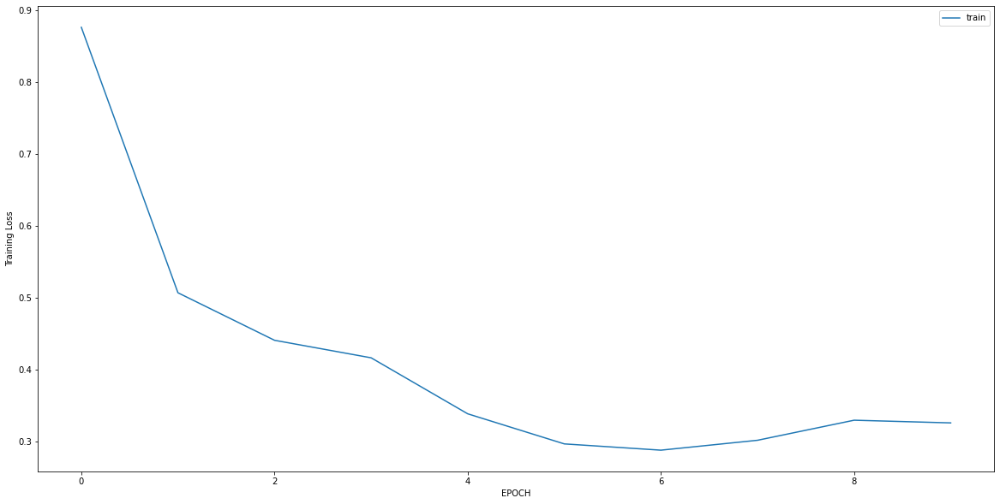

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2757 - accuracy: 0.8903
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1936 - accuracy: 0.9030
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1717 - accuracy: 0.9367
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1192 - accuracy: 0.9578
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1429 - accuracy: 0.9494
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1331 - accuracy: 0.9409
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1132 - accuracy: 0.9705
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1586 - accuracy: 0.9367
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1803 - accuracy: 0.9409
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1244 - accuracy: 0.9536


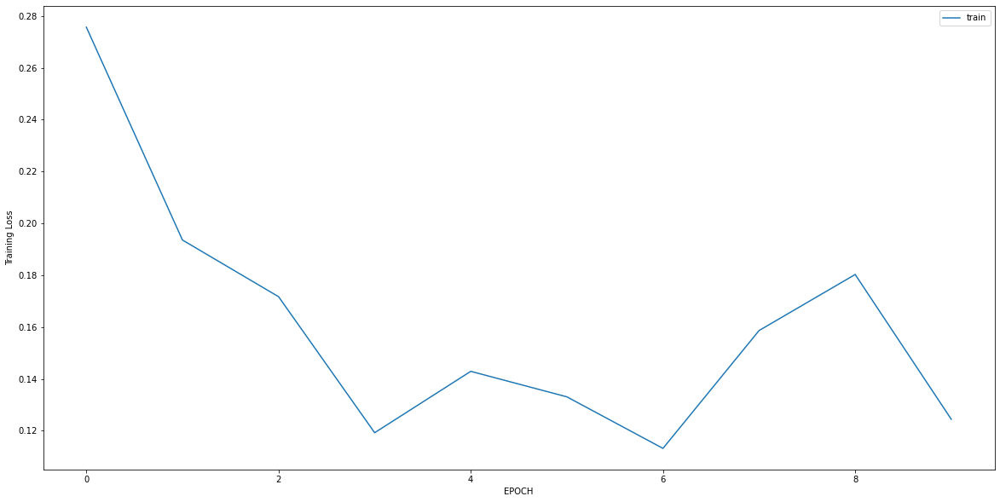

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5746 - accuracy: 0.8221
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4727 - accuracy: 0.8577
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3673 - accuracy: 0.8142
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3469 - accuracy: 0.8577
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3446 - accuracy: 0.8538
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2967 - accuracy: 0.8933
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3083 - accuracy: 0.8893
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2693 - accuracy: 0.8893
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2683 - accuracy: 0.8814
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3005 - accuracy: 0.9091


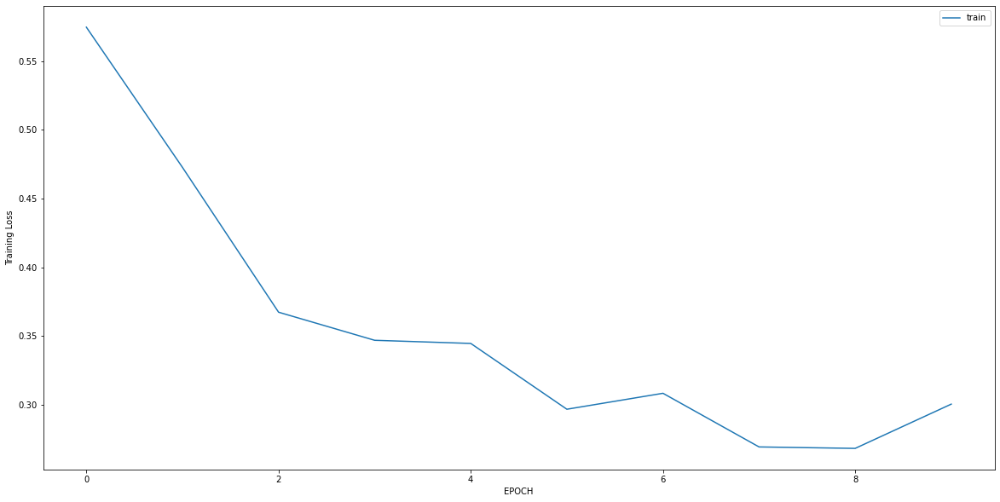

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8157 - accuracy: 0.5606
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0611 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0295 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000


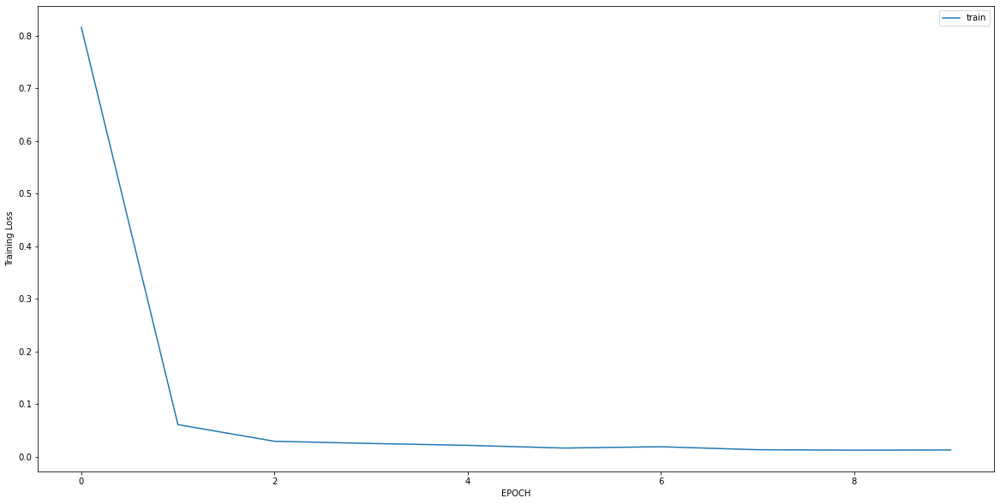

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7409 - accuracy: 0.8263
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6957 - accuracy: 0.8475
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4893 - accuracy: 0.8771
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2934 - accuracy: 0.9025
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2546 - accuracy: 0.9153
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2219 - accuracy: 0.9407
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2232 - accuracy: 0.9407
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2238 - accuracy: 0.9407
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2315 - accuracy: 0.9322
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1948 - accuracy: 0.9449


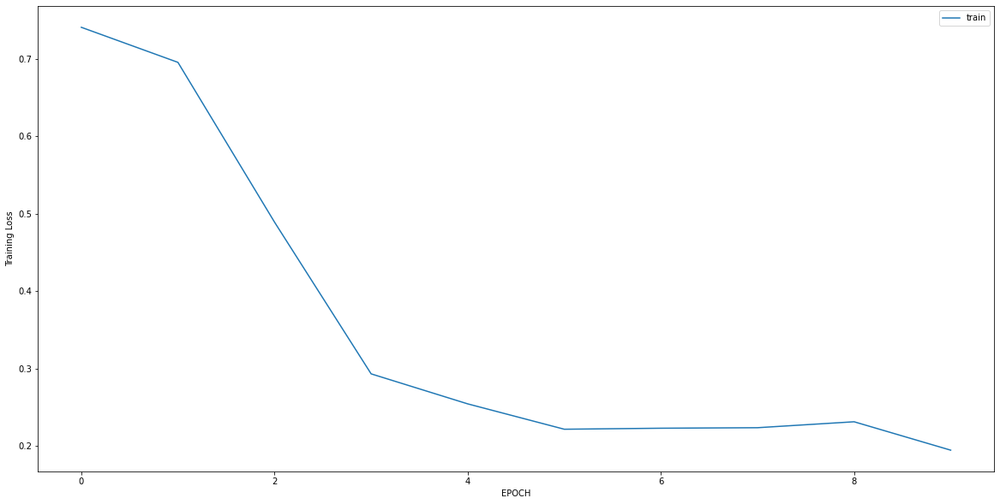

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.9035 - accuracy: 0.6371
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4629 - accuracy: 0.8099
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3653 - accuracy: 0.8661
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3286 - accuracy: 0.8726
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2869 - accuracy: 0.8920
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2500 - accuracy: 0.9093
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2534 - accuracy: 0.9006
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2628 - accuracy: 0.9006
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2380 - accuracy: 0.9222
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2227 - accuracy: 0.9287


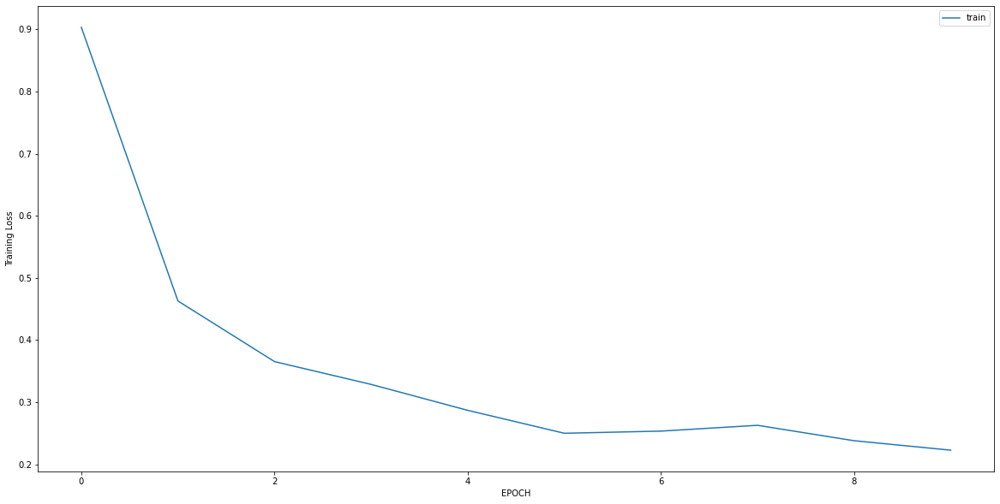

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3585 - accuracy: 0.8407
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2857 - accuracy: 0.8963
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2780 - accuracy: 0.8704
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2371 - accuracy: 0.9074
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2300 - accuracy: 0.9148
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1837 - accuracy: 0.9519
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1750 - accuracy: 0.9630
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1994 - accuracy: 0.9296
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1898 - accuracy: 0.9333
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2243 - accuracy: 0.9370


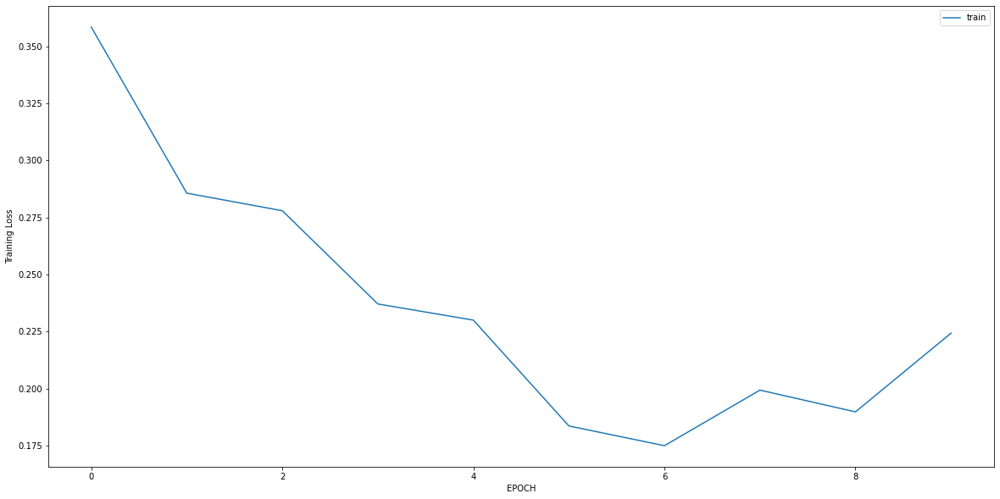

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3423 - accuracy: 0.8608
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1068 - accuracy: 0.9705
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1102 - accuracy: 0.9705
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0969 - accuracy: 0.9831
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0698 - accuracy: 0.9916
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0837 - accuracy: 0.9831
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0719 - accuracy: 0.9873
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 0.9958
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0646 - accuracy: 0.9873
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0658 - accuracy: 0.9873


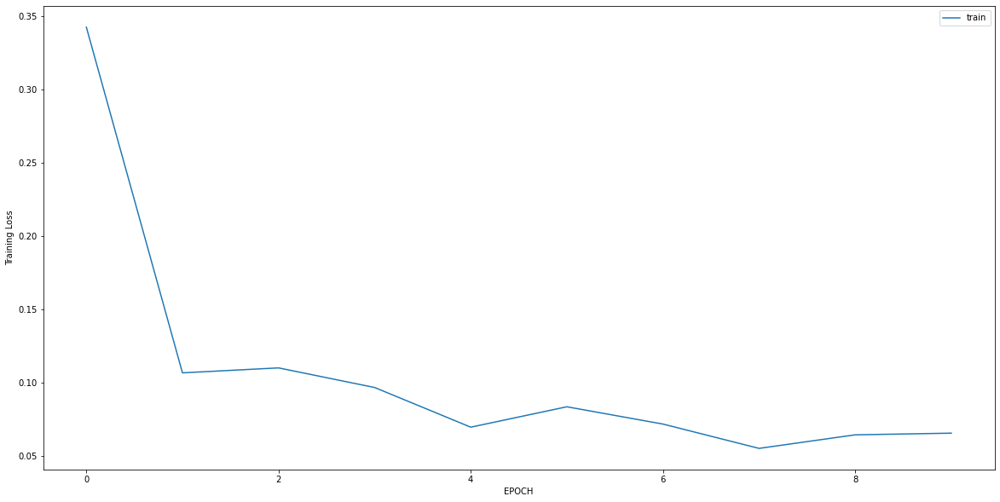

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5808 - accuracy: 0.7336
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1560 - accuracy: 0.9458
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1398 - accuracy: 0.9571
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1140 - accuracy: 0.9661
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0974 - accuracy: 0.9752
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0855 - accuracy: 0.9842
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0931 - accuracy: 0.9797
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0852 - accuracy: 0.9797
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0728 - accuracy: 0.9752
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0806 - accuracy: 0.9752


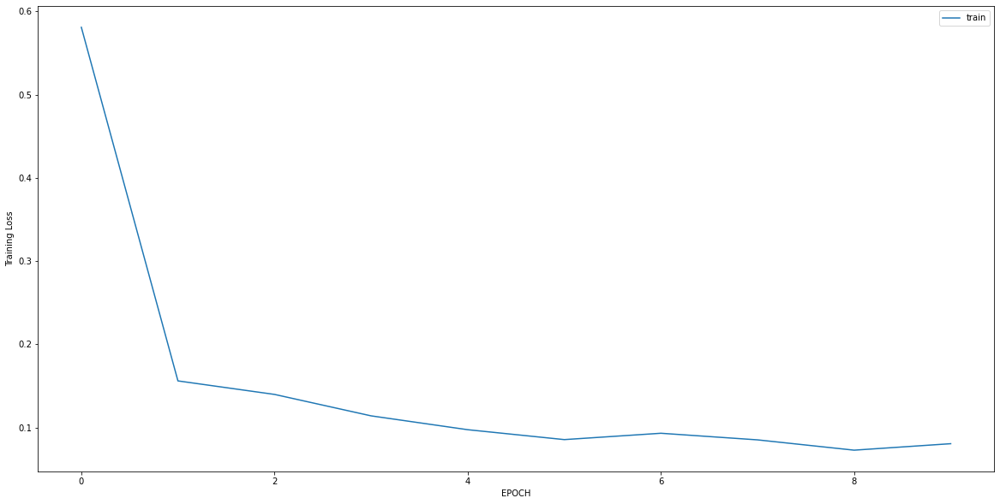

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.5185 - accuracy: 0.5811
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8528 - accuracy: 0.6528
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4878 - accuracy: 0.7358
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4905 - accuracy: 0.7811
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4166 - accuracy: 0.8075
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3357 - accuracy: 0.8453
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3000 - accuracy: 0.8491
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2839 - accuracy: 0.8868
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2672 - accuracy: 0.8792
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2458 - accuracy: 0.8981


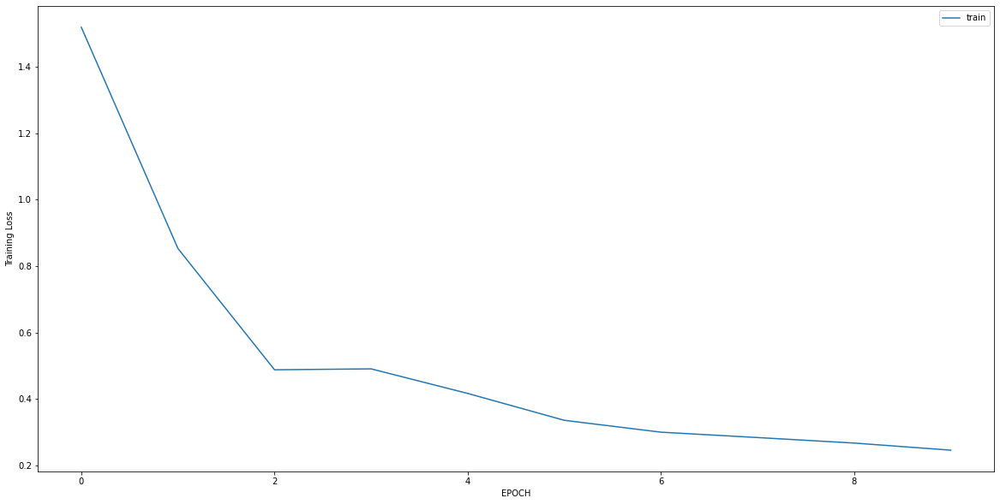

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.5106 - accuracy: 0.4517
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7043 - accuracy: 0.5655
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3795 - accuracy: 0.8207
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3499 - accuracy: 0.8552
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3106 - accuracy: 0.9000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2593 - accuracy: 0.8897
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2087 - accuracy: 0.9517
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1927 - accuracy: 0.9448
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1378 - accuracy: 0.9621
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1242 - accuracy: 0.9552


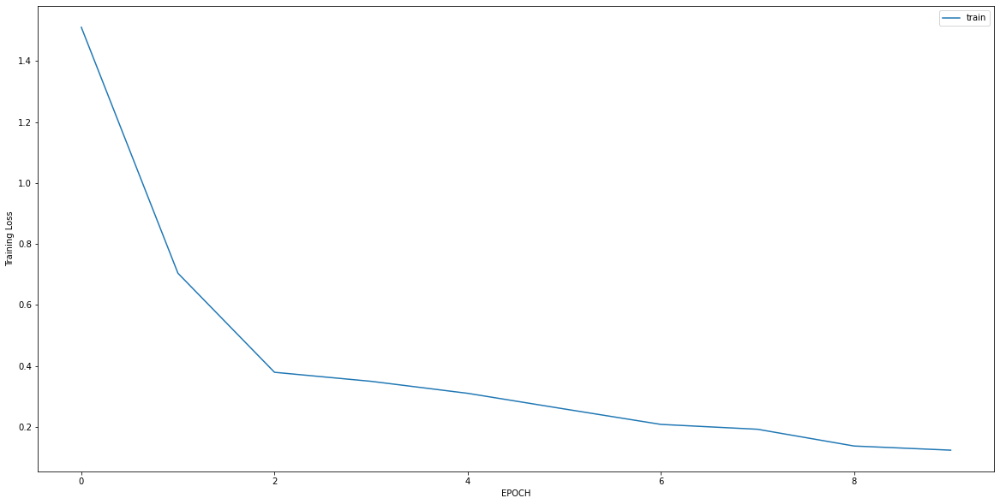

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.3280 - accuracy: 0.0036
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.0656 - accuracy: 0.0286
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9134 - accuracy: 0.4429
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2793 - accuracy: 0.9429
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1145 - accuracy: 0.9964
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0684 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0320 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 1.0000


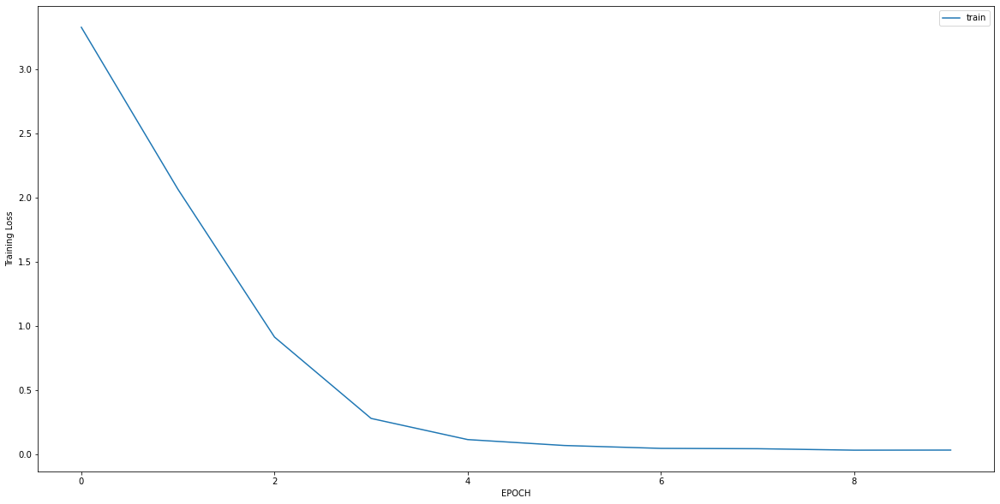

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.5883 - accuracy: 0.4674
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 1.2429 - accuracy: 0.4742
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8931 - accuracy: 0.4983
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6397 - accuracy: 0.6082
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4950 - accuracy: 0.7079
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3910 - accuracy: 0.8247
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3445 - accuracy: 0.8797
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3078 - accuracy: 0.9244
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2552 - accuracy: 0.9485
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2377 - accuracy: 0.9450


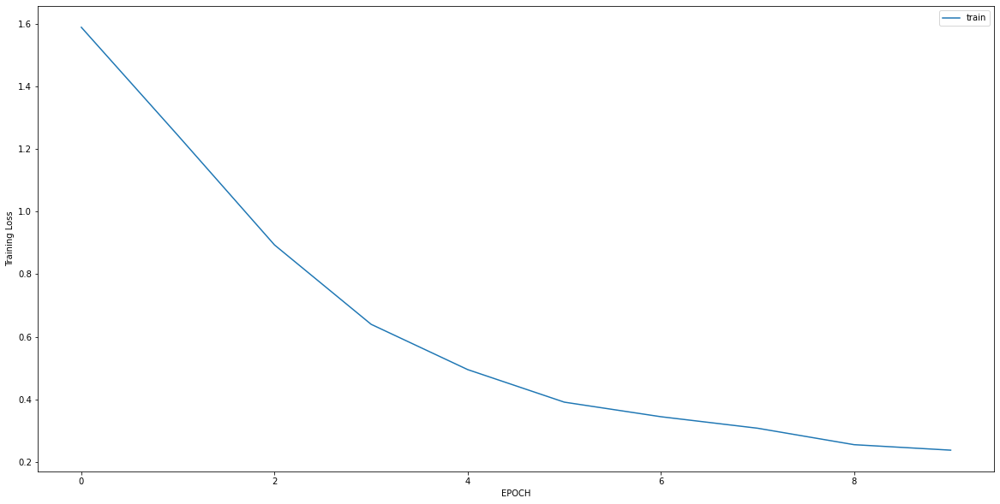

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1008 - accuracy: 0.9803
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0130 - accuracy: 1.0000


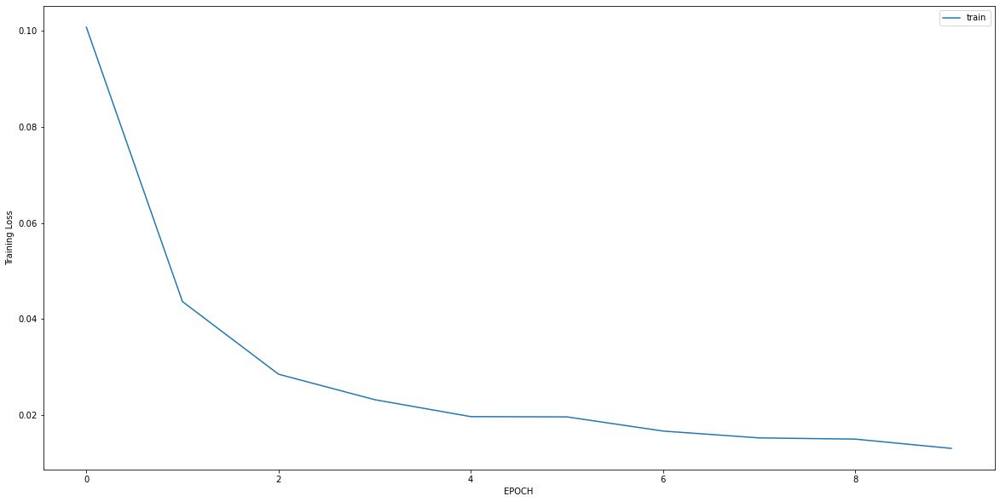

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 2.0955 - accuracy: 0.0498
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.8365 - accuracy: 0.5078
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3166 - accuracy: 0.9346
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.9938
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0881 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0558 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0321 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0310 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0261 - accuracy: 1.0000


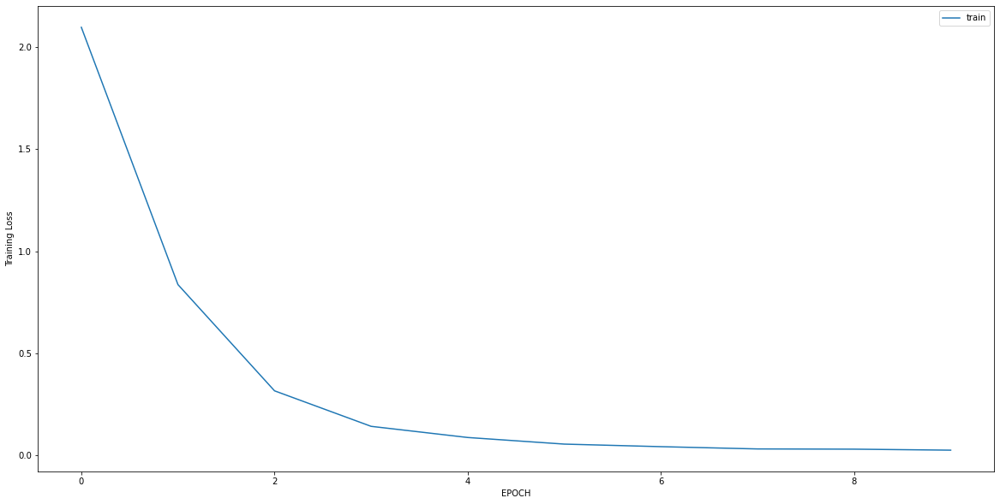

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.8914 - accuracy: 0.3772
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.5615 - accuracy: 0.3879
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1454 - accuracy: 0.3986
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7360 - accuracy: 0.5160
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4774 - accuracy: 0.7509
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3363 - accuracy: 0.8470
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2816 - accuracy: 0.8826
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2305 - accuracy: 0.9431
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2037 - accuracy: 0.9502
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1632 - accuracy: 0.9609


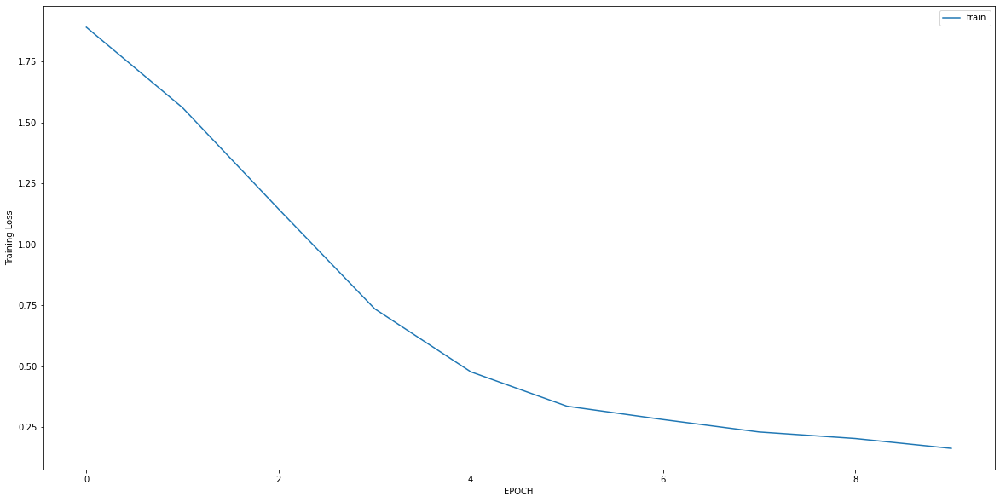

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2939 - accuracy: 0.8899
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2338 - accuracy: 0.9214
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1697 - accuracy: 0.9654
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1617 - accuracy: 0.9465
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1244 - accuracy: 0.9780
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1058 - accuracy: 0.9811
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1169 - accuracy: 0.9717
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1022 - accuracy: 0.9748
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0828 - accuracy: 0.9874
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0877 - accuracy: 0.9780


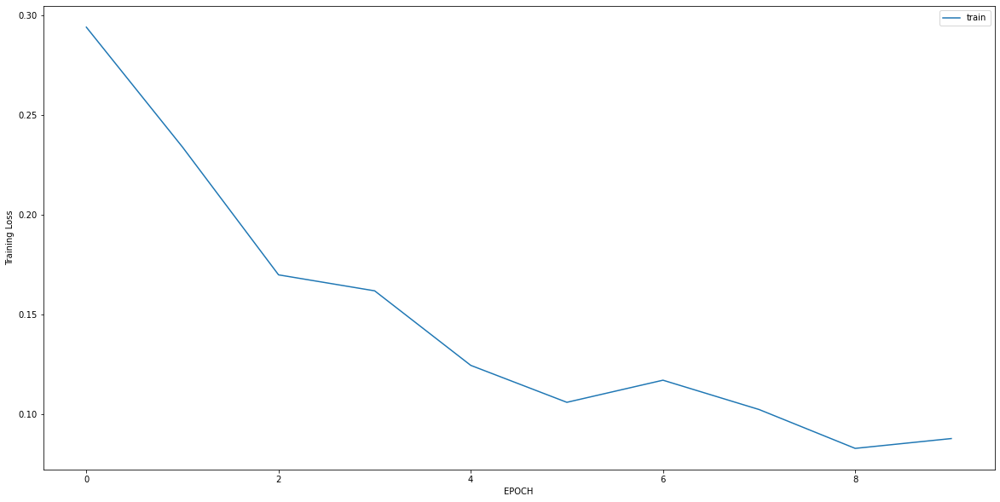

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4932 - accuracy: 0.8270
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4885 - accuracy: 0.8186
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4322 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3964 - accuracy: 0.8312
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4042 - accuracy: 0.8270
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3657 - accuracy: 0.8481
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3296 - accuracy: 0.8397
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3317 - accuracy: 0.8523
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3679 - accuracy: 0.8439
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3461 - accuracy: 0.8439


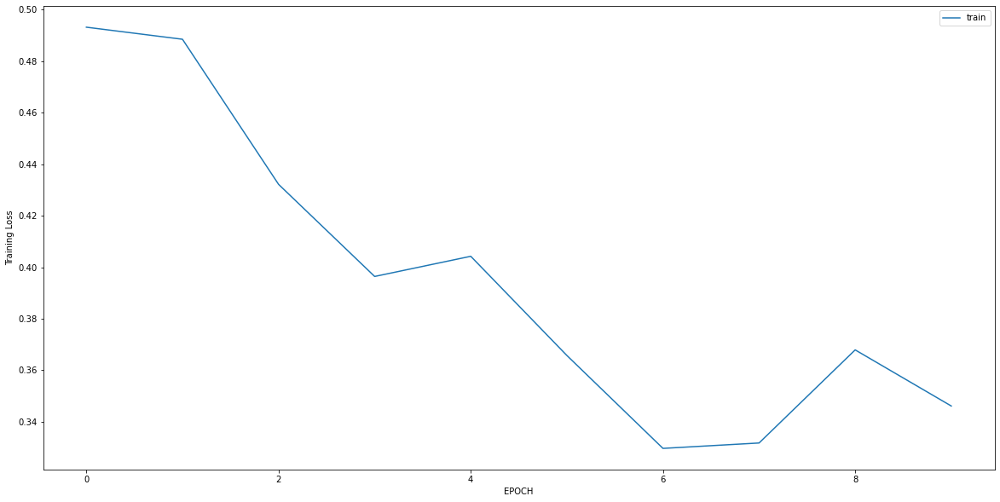

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5967 - accuracy: 0.6821
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4130 - accuracy: 0.8212
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3345 - accuracy: 0.8841
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2812 - accuracy: 0.9040
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2399 - accuracy: 0.9305
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2198 - accuracy: 0.9437
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1724 - accuracy: 0.9503
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1469 - accuracy: 0.9536
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.9669
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1321 - accuracy: 0.9768


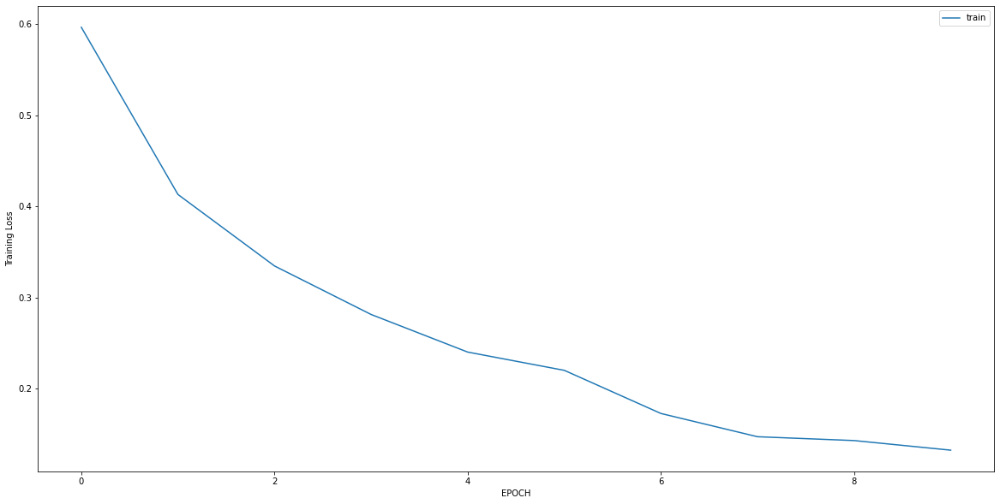

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1963 - accuracy: 0.9430
Epoch 2/10
10/10 [==============================] - 0s 9ms/step - loss: 0.1849 - accuracy: 0.9525
Epoch 3/10
10/10 [==============================] - 0s 11ms/step - loss: 0.2135 - accuracy: 0.9082
Epoch 4/10
10/10 [==============================] - 0s 10ms/step - loss: 0.2006 - accuracy: 0.9209
Epoch 5/10
10/10 [==============================] - 0s 10ms/step - loss: 0.1923 - accuracy: 0.9335
Epoch 6/10
10/10 [==============================] - 0s 10ms/step - loss: 0.1846 - accuracy: 0.9430
Epoch 7/10
10/10 [==============================] - 0s 11ms/step - loss: 0.1972 - accuracy: 0.9304
Epoch 8/10
10/10 [==============================] - 0s 11ms/step - loss: 0.1795 - accuracy: 0.9430
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1570 - accuracy: 0.9620
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1767 - accuracy: 0.9525


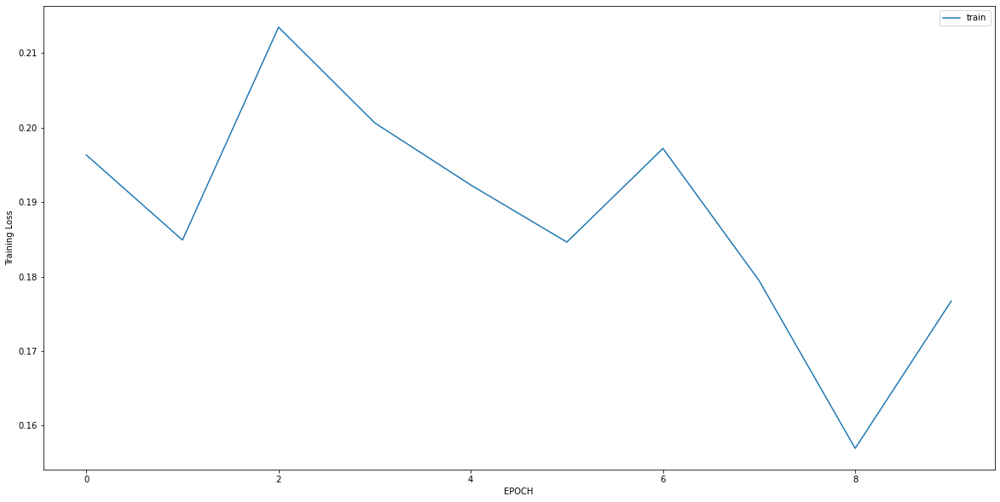

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 3.2599 - accuracy: 0.0268
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4010 - accuracy: 0.8084
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0915 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0674 - accuracy: 0.9962
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0321 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0202 - accuracy: 1.0000


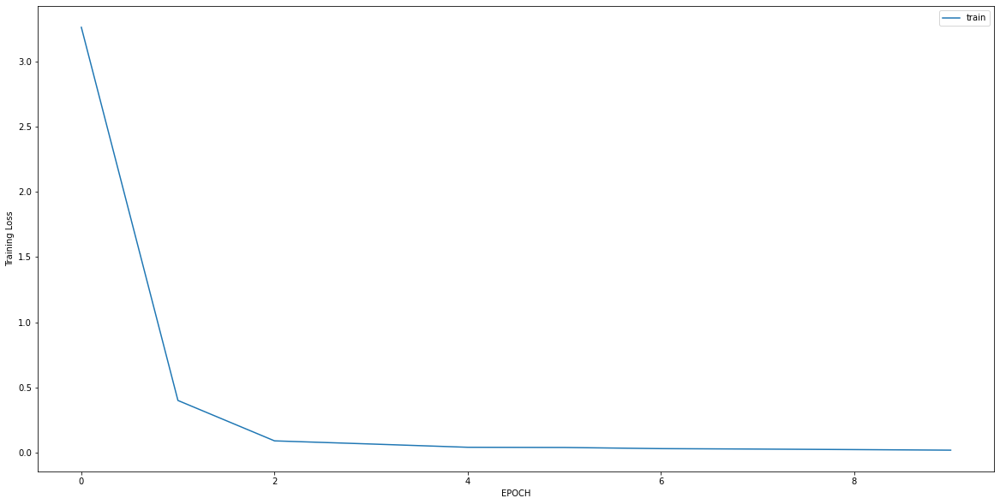

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.1975 - accuracy: 0.6102
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.6476 - accuracy: 0.6937
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4222 - accuracy: 0.8028
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3200 - accuracy: 0.8724
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2435 - accuracy: 0.9049
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1984 - accuracy: 0.9350
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1954 - accuracy: 0.9327
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1868 - accuracy: 0.9513
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1617 - accuracy: 0.9443
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1594 - accuracy: 0.9490


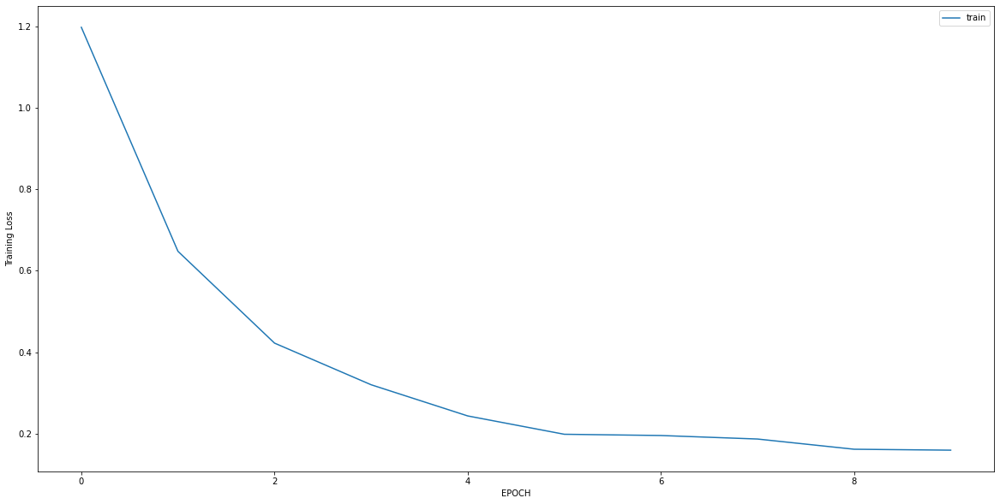

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.9493 - accuracy: 0.0607
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.4986 - accuracy: 0.2036
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3457 - accuracy: 0.8821
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1299 - accuracy: 0.9964
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0809 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0602 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 1.0000


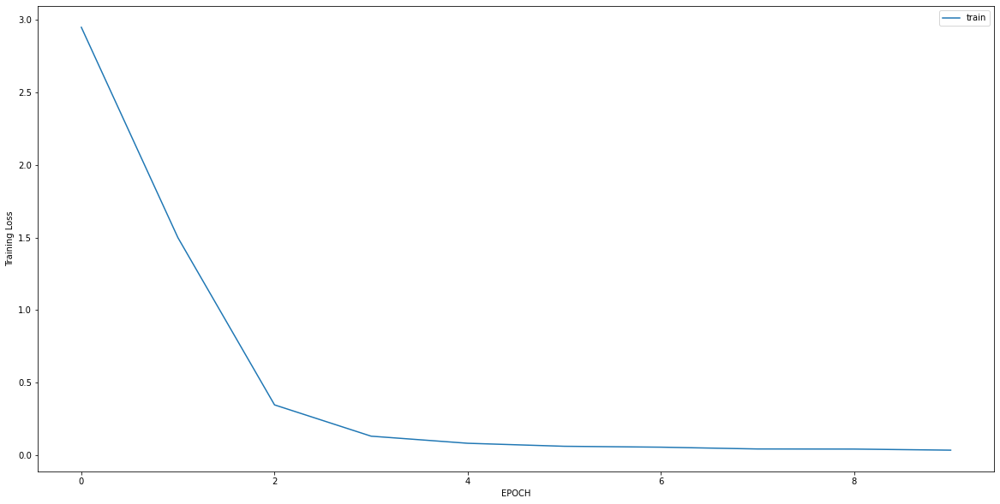

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1764 - accuracy: 0.3134
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9668 - accuracy: 0.3955
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8433 - accuracy: 0.4664
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7797 - accuracy: 0.5112
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7687 - accuracy: 0.4963
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.6119
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6733 - accuracy: 0.5933
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.5933
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6307 - accuracy: 0.6978
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5234 - accuracy: 0.7612


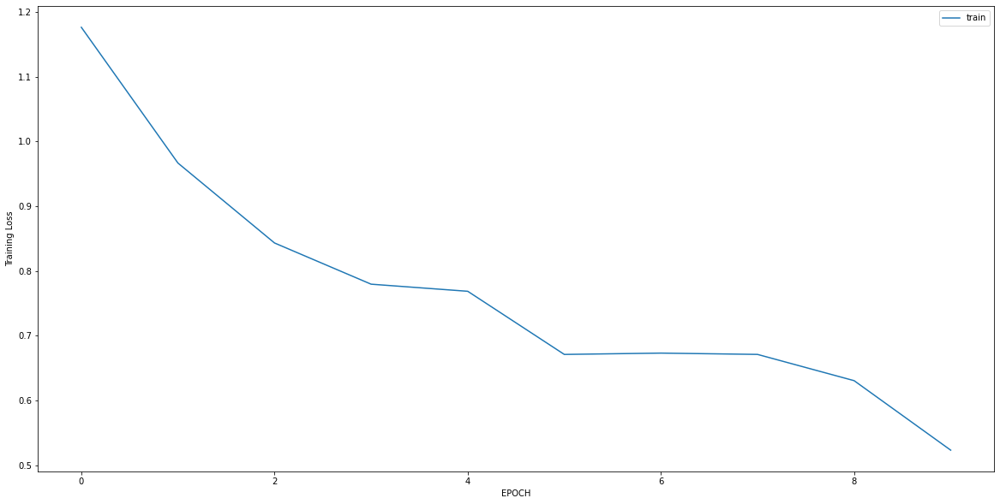

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.0331 - accuracy: 0.5047
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7127 - accuracy: 0.6462
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4483 - accuracy: 0.8302
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3715 - accuracy: 0.8632
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2999 - accuracy: 0.9104
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2844 - accuracy: 0.9292
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2409 - accuracy: 0.9198
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2165 - accuracy: 0.9434
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1953 - accuracy: 0.9481
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1629 - accuracy: 0.9575


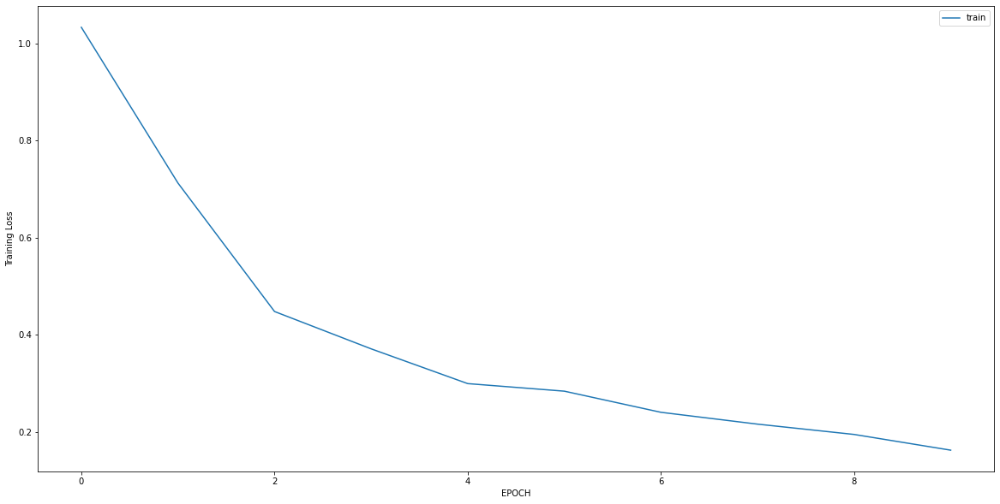

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5830 - accuracy: 0.7421
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0959 - accuracy: 0.9960
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0769 - accuracy: 0.9960
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0501 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0283 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0190 - accuracy: 1.0000


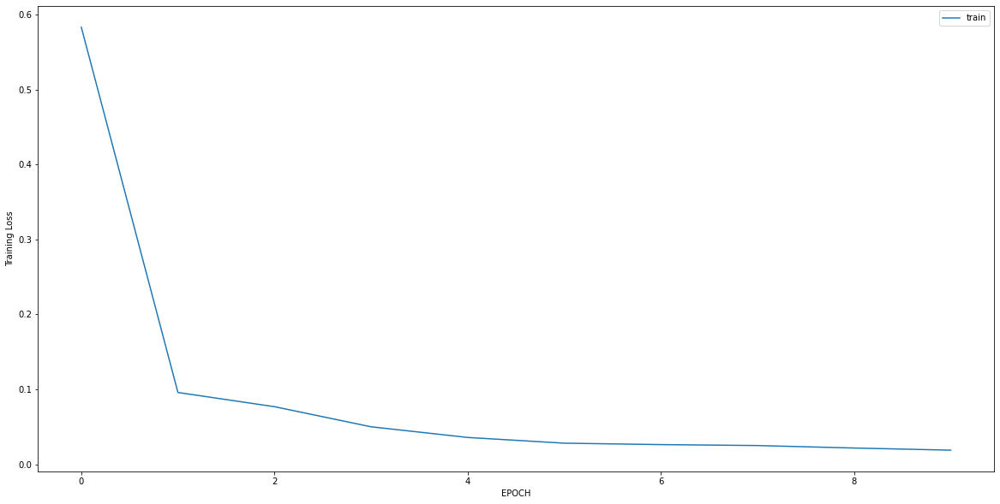

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4536 - accuracy: 0.8629
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2412 - accuracy: 0.9355
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1374 - accuracy: 0.9718
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1596 - accuracy: 0.9597
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1084 - accuracy: 0.9798
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1003 - accuracy: 0.9839
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0803 - accuracy: 0.9919
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0803 - accuracy: 0.9919
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0784 - accuracy: 0.9919
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0610 - accuracy: 0.9919


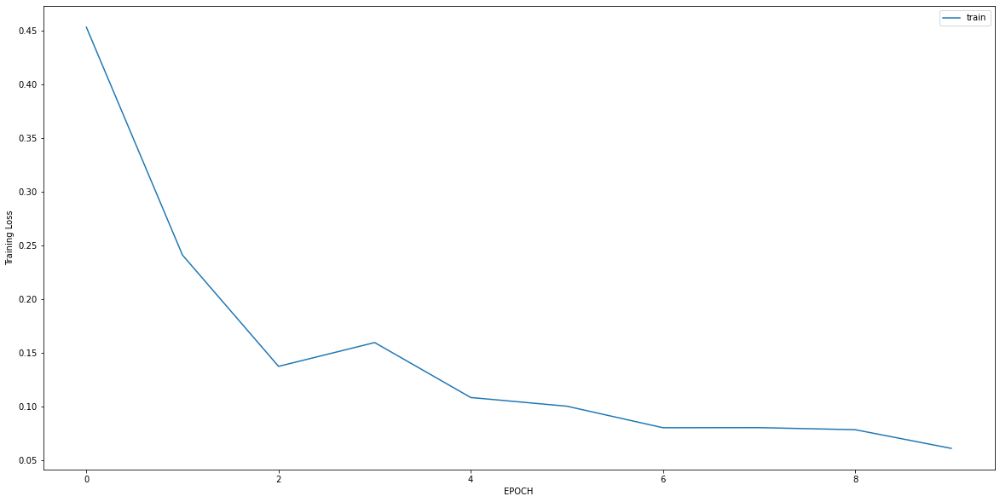

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5888 - accuracy: 0.6949
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5030 - accuracy: 0.8686
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4437 - accuracy: 0.8644
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3250 - accuracy: 0.8814
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2583 - accuracy: 0.9322
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2261 - accuracy: 0.9364
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2237 - accuracy: 0.9492
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2087 - accuracy: 0.9449
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2143 - accuracy: 0.9322
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2017 - accuracy: 0.9534


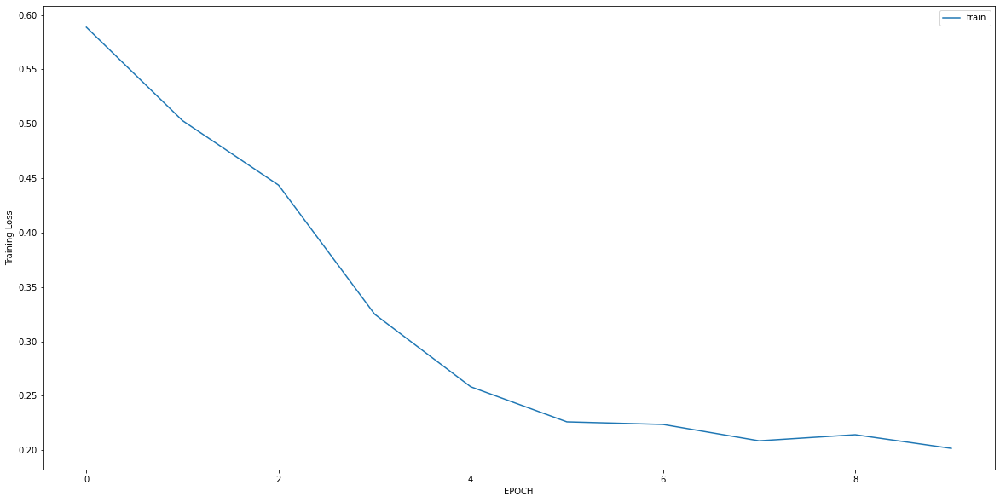

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6661 - accuracy: 0.5913
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3496 - accuracy: 0.8810
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3726 - accuracy: 0.8492
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3399 - accuracy: 0.8730
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3190 - accuracy: 0.8810
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2781 - accuracy: 0.9048
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2516 - accuracy: 0.9325
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2559 - accuracy: 0.9246
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2437 - accuracy: 0.9405
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2440 - accuracy: 0.9405


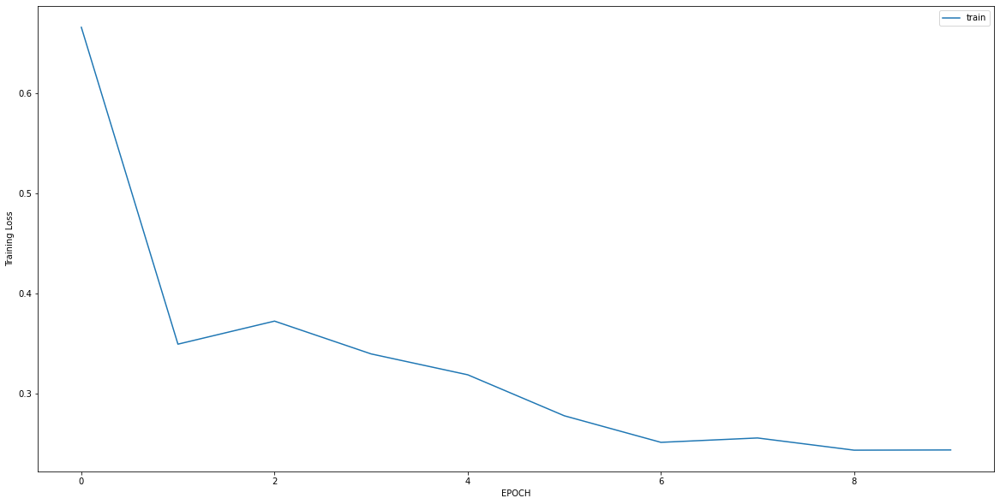

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1753 - accuracy: 0.9524
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0601 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0446 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0300 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0224 - accuracy: 1.0000


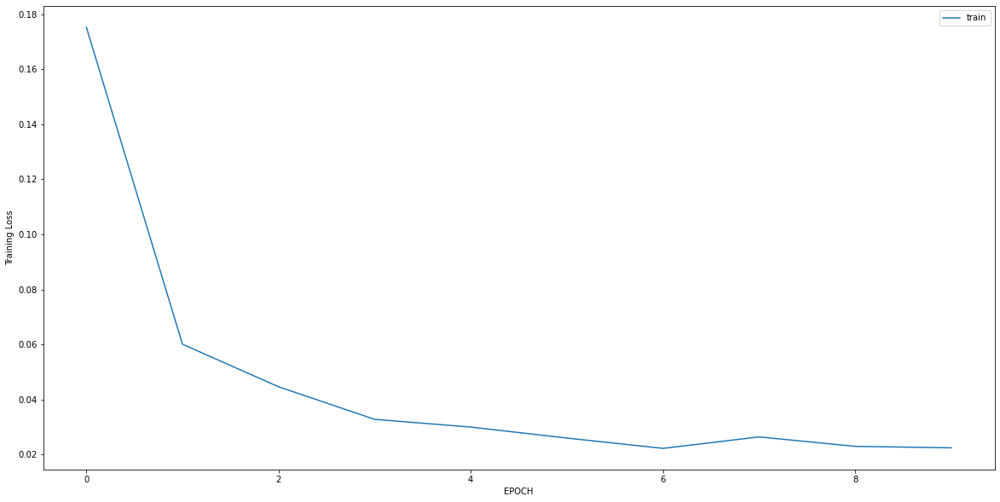

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0238 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0137 - accuracy: 1.0000


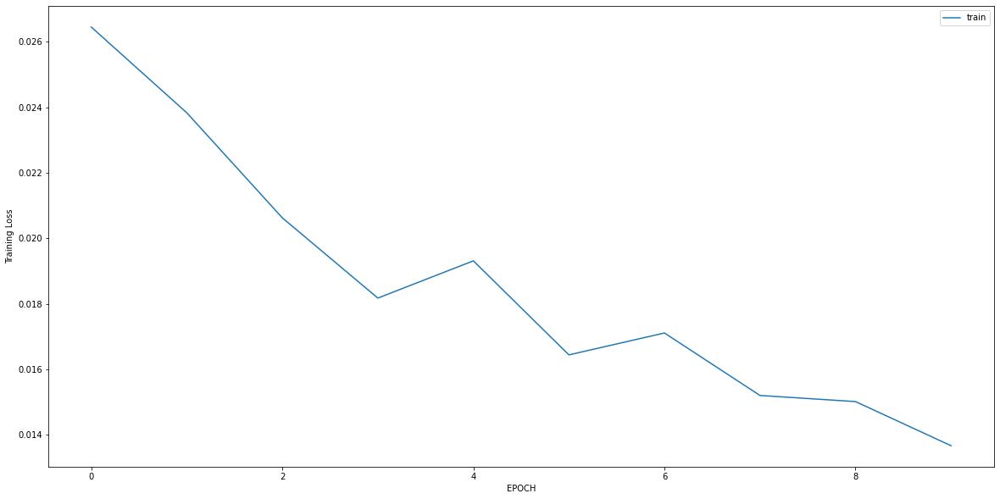

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0111 - accuracy: 1.0000


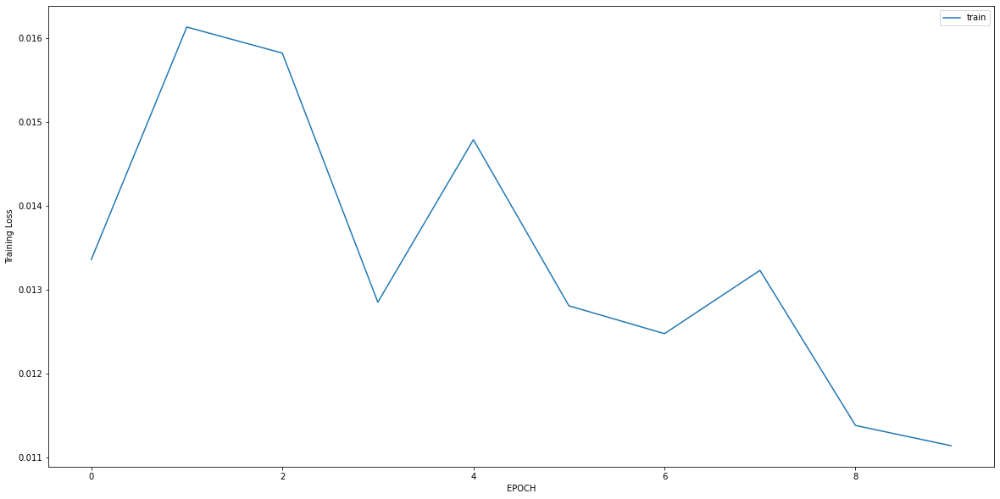

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9578 - accuracy: 0.7459
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2819 - accuracy: 0.8484
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2641 - accuracy: 0.8525
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2055 - accuracy: 0.9180
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2127 - accuracy: 0.9180
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2172 - accuracy: 0.9221
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1894 - accuracy: 0.9385
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1737 - accuracy: 0.9385
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1808 - accuracy: 0.9344
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1936 - accuracy: 0.9303


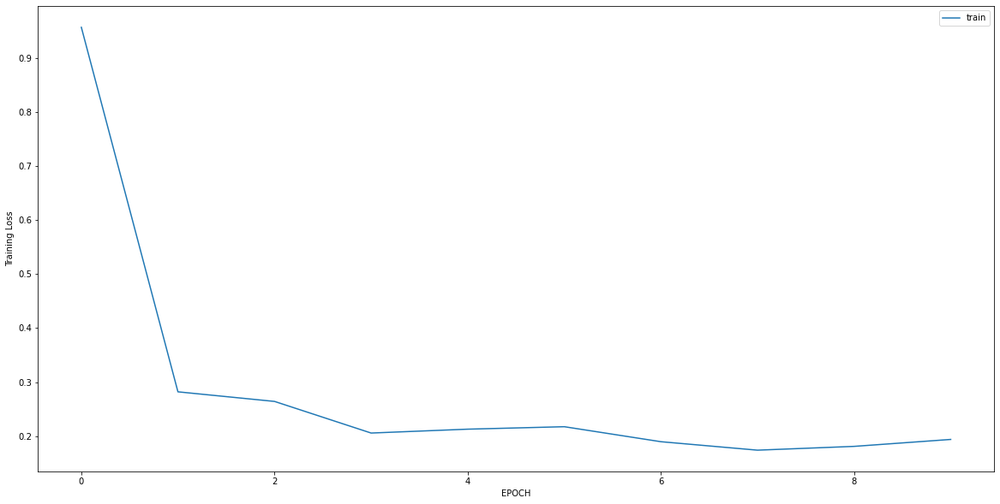

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5520 - accuracy: 0.7239
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3281 - accuracy: 0.8754
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2799 - accuracy: 0.8889
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2158 - accuracy: 0.9125
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1986 - accuracy: 0.9327
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1960 - accuracy: 0.9394
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1844 - accuracy: 0.9394
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2299 - accuracy: 0.9259
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4874 - accuracy: 0.8586
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5496 - accuracy: 0.8316


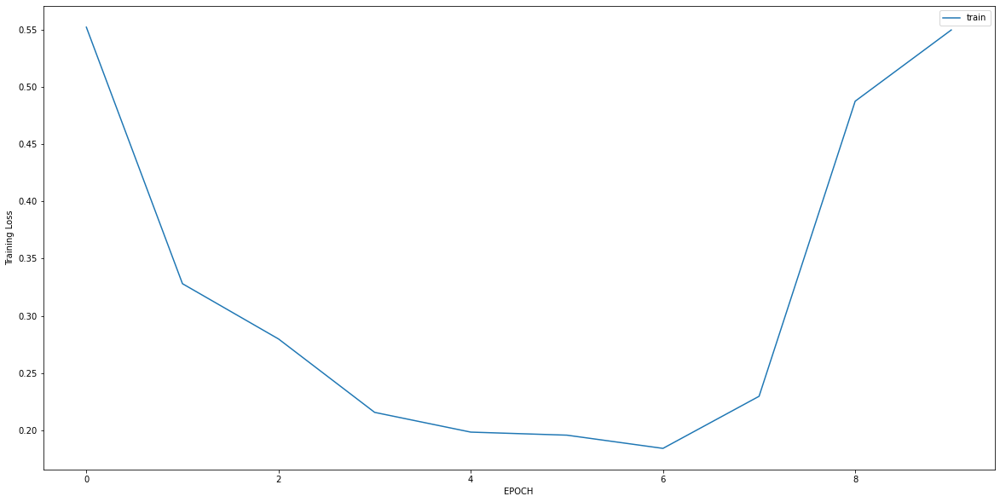

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0700 - accuracy: 0.6232
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0778 - accuracy: 0.6304
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9869 - accuracy: 0.6594
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9775 - accuracy: 0.6232
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7343 - accuracy: 0.7029
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5854 - accuracy: 0.7391
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3194 - accuracy: 0.8841
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4288 - accuracy: 0.7899
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2450 - accuracy: 0.9493
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3427 - accuracy: 0.8696


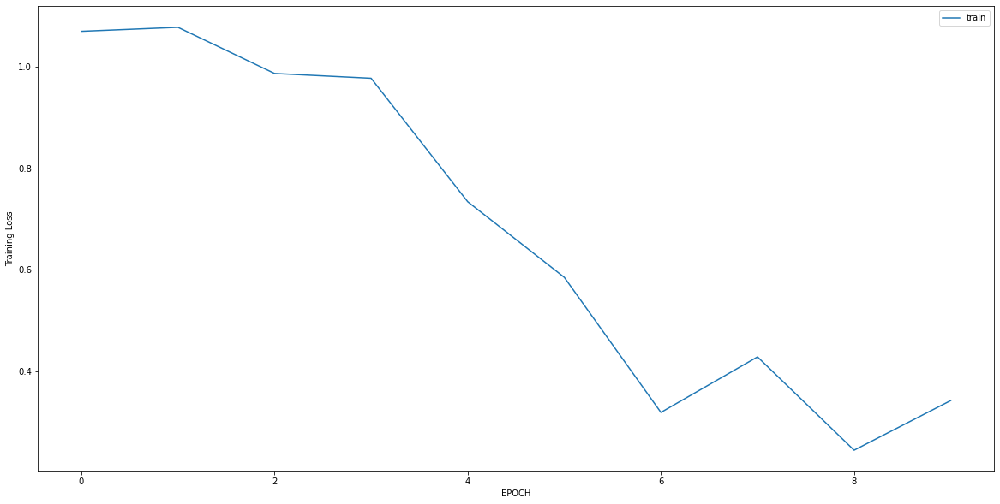

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 3.8924 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 2.2100 - accuracy: 0.0093
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.7395 - accuracy: 0.5421
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2287 - accuracy: 0.9875
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0238 - accuracy: 1.0000


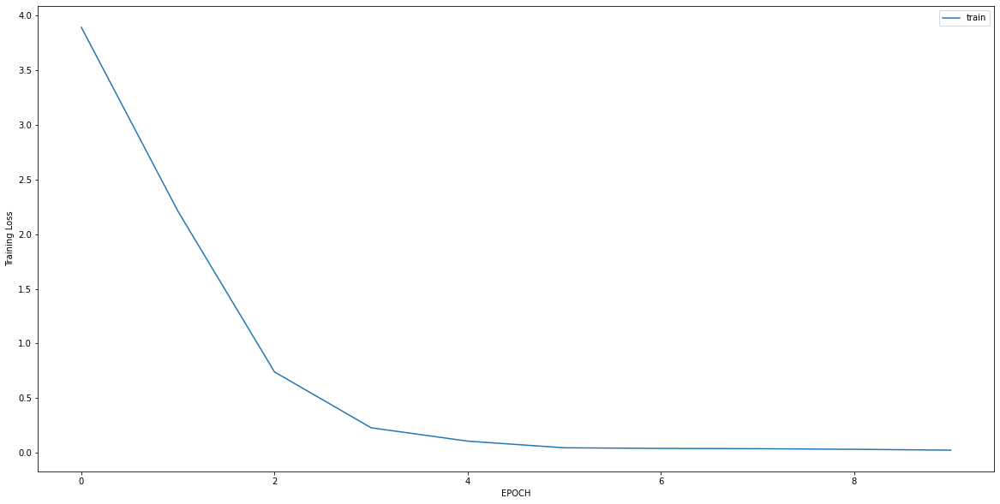

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 1.0162 - accuracy: 0.5804
Epoch 2/10
9/9 [==============================] - 0s 13ms/step - loss: 0.9338 - accuracy: 0.5909
Epoch 3/10
9/9 [==============================] - 0s 11ms/step - loss: 0.7819 - accuracy: 0.6189
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6968 - accuracy: 0.6259
Epoch 5/10
9/9 [==============================] - 0s 9ms/step - loss: 0.6482 - accuracy: 0.6713
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 0.5812 - accuracy: 0.7133
Epoch 7/10
9/9 [==============================] - 0s 8ms/step - loss: 0.5583 - accuracy: 0.7343
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4660 - accuracy: 0.8077
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4356 - accuracy: 0.8427
Epoch 10/10
9/9 [==============================] - 0s 10ms/step - loss: 0.4090 - accuracy: 0.8741


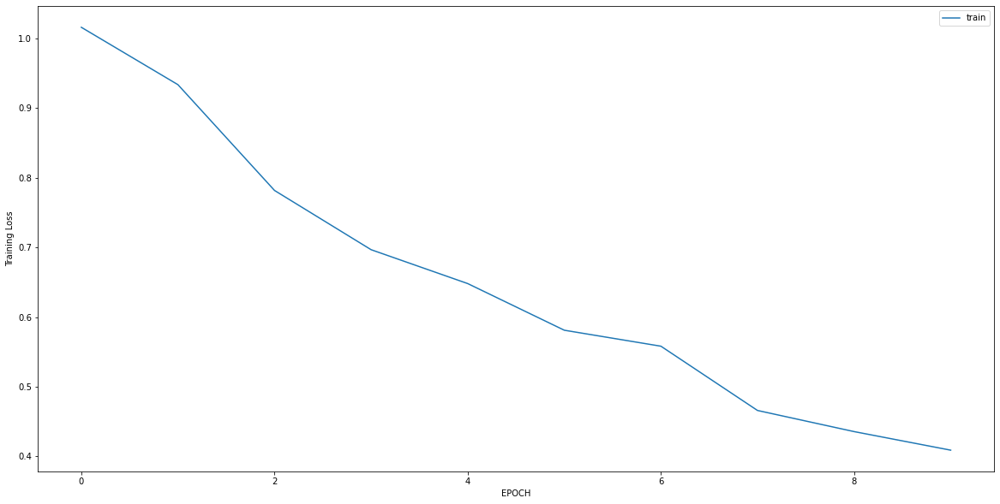

Epoch 1/10
9/9 [==============================] - 0s 10ms/step - loss: 0.6924 - accuracy: 0.6667
Epoch 2/10
9/9 [==============================] - 0s 9ms/step - loss: 0.5306 - accuracy: 0.7640
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4558 - accuracy: 0.8240
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4264 - accuracy: 0.8315
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4526 - accuracy: 0.8277
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4193 - accuracy: 0.8502
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3870 - accuracy: 0.8727
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3031 - accuracy: 0.8989
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3143 - accuracy: 0.8839
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3131 - accuracy: 0.9064


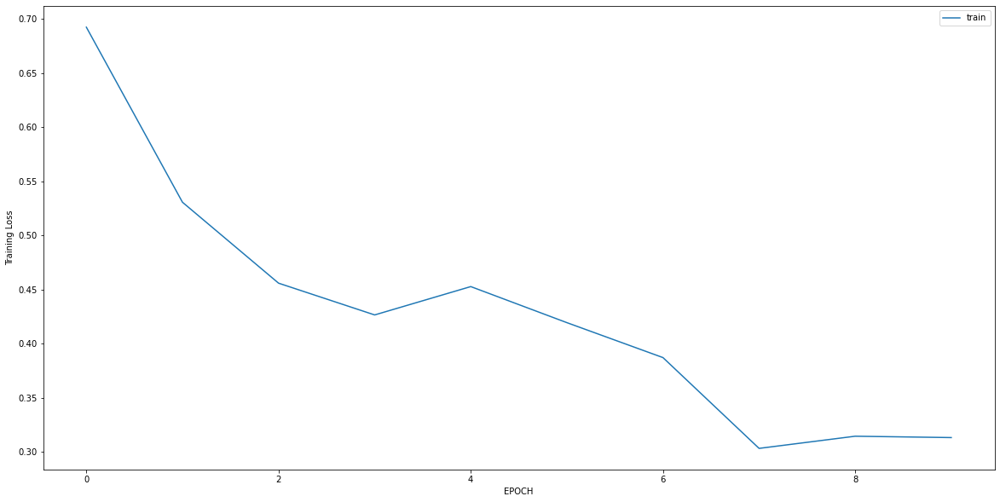

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6302 - accuracy: 0.7245
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4944 - accuracy: 0.7849
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4660 - accuracy: 0.8113
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3926 - accuracy: 0.8491
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3735 - accuracy: 0.8604
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3715 - accuracy: 0.8415
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3332 - accuracy: 0.8906
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3057 - accuracy: 0.8868
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2795 - accuracy: 0.8868
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2861 - accuracy: 0.9019


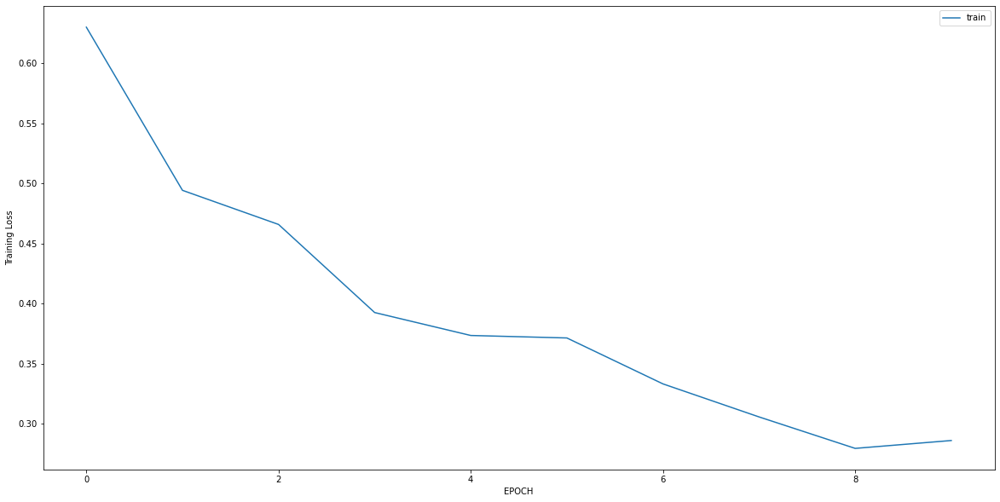

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.3848 - accuracy: 0.5516
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1203 - accuracy: 0.5516
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7920 - accuracy: 0.5552
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5266 - accuracy: 0.7082
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4597 - accuracy: 0.7651
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4324 - accuracy: 0.8292
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4067 - accuracy: 0.8754
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3696 - accuracy: 0.9146
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3424 - accuracy: 0.8968
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3150 - accuracy: 0.9395


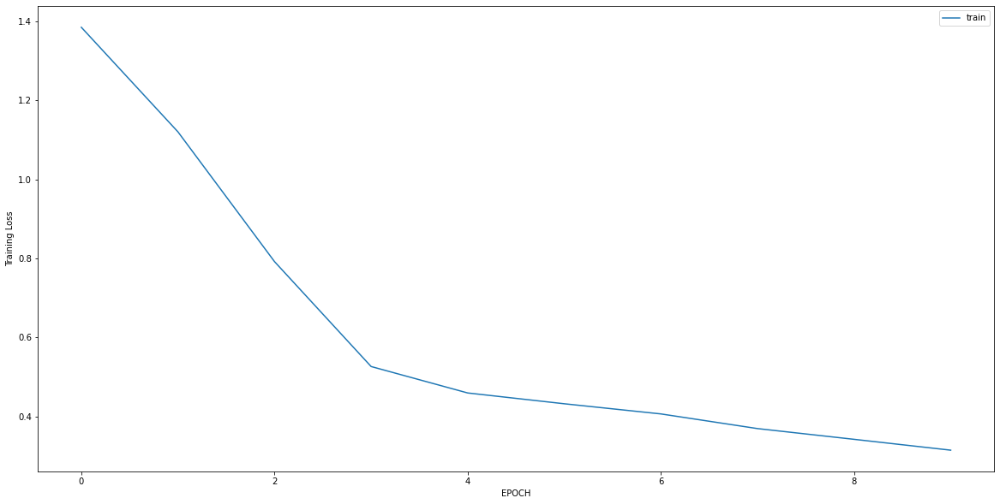

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3531 - accuracy: 0.9195
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2639 - accuracy: 0.9808
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1627 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1317 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0954 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0785 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0673 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0589 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0501 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0510 - accuracy: 1.0000


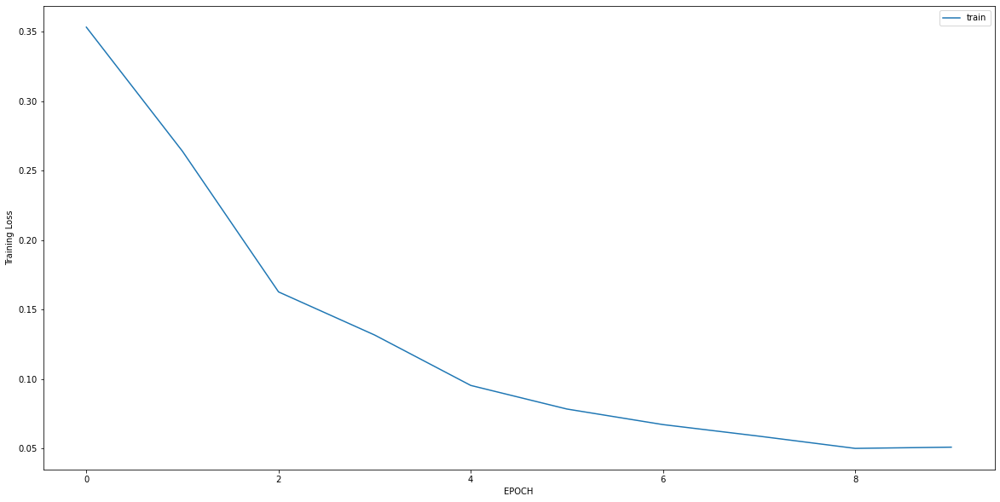

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9218 - accuracy: 0.6000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7839 - accuracy: 0.6947
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6431 - accuracy: 0.7509
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5141 - accuracy: 0.8000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4283 - accuracy: 0.8281
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3863 - accuracy: 0.8491
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3709 - accuracy: 0.8702
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3277 - accuracy: 0.9053
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3267 - accuracy: 0.9193
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2866 - accuracy: 0.9158


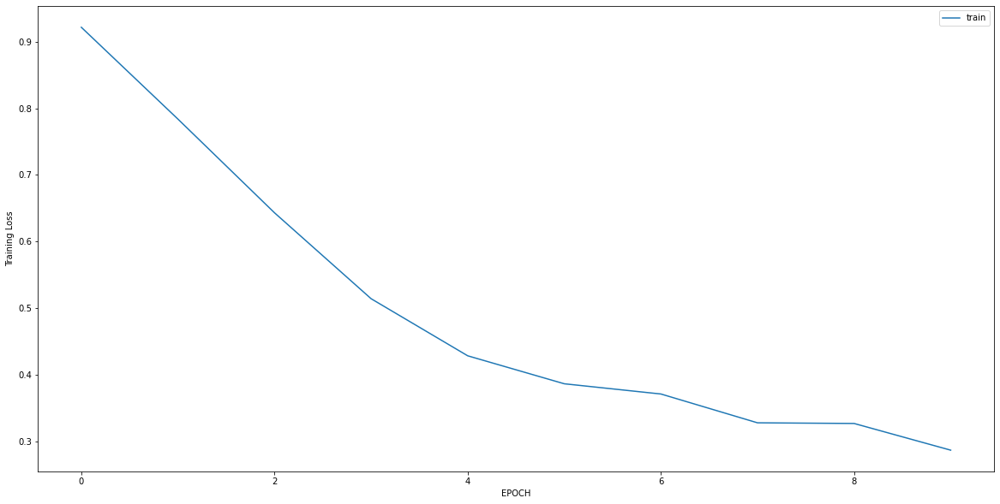

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.5415 - accuracy: 0.0735
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4663 - accuracy: 0.7987
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1389 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0640 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0239 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000


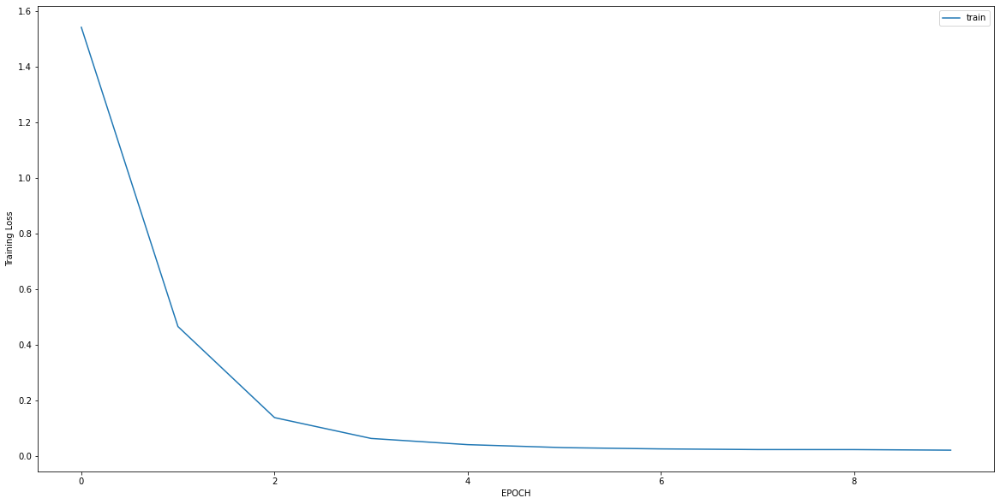

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6796 - accuracy: 0.6601
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5912 - accuracy: 0.7036
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5221 - accuracy: 0.7470
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4355 - accuracy: 0.8182
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4436 - accuracy: 0.8340
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4095 - accuracy: 0.8340
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3148 - accuracy: 0.8933
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3669 - accuracy: 0.8814
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2913 - accuracy: 0.9012
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2720 - accuracy: 0.9091


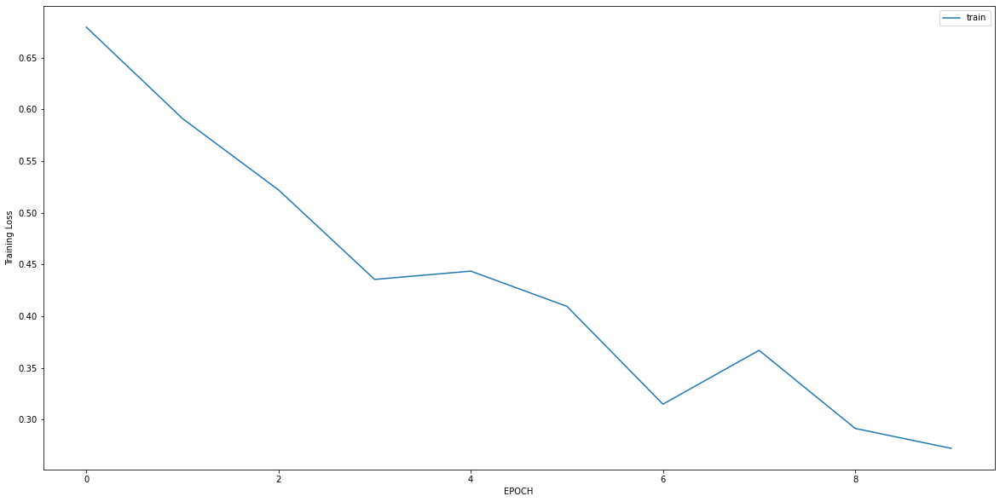

Epoch 1/10
4/4 [==============================] - 0s 5ms/step - loss: 1.8290 - accuracy: 0.2449
Epoch 2/10
4/4 [==============================] - 0s 5ms/step - loss: 0.8992 - accuracy: 0.4694
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5663 - accuracy: 0.6837
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4186 - accuracy: 0.7857
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3611 - accuracy: 0.8469
Epoch 6/10
4/4 [==============================] - 0s 4ms/step - loss: 0.3662 - accuracy: 0.8367
Epoch 7/10
4/4 [==============================] - 0s 4ms/step - loss: 0.3548 - accuracy: 0.8367
Epoch 8/10
4/4 [==============================] - 0s 4ms/step - loss: 0.3461 - accuracy: 0.8367
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3469 - accuracy: 0.8571
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3221 - accuracy: 0.8673


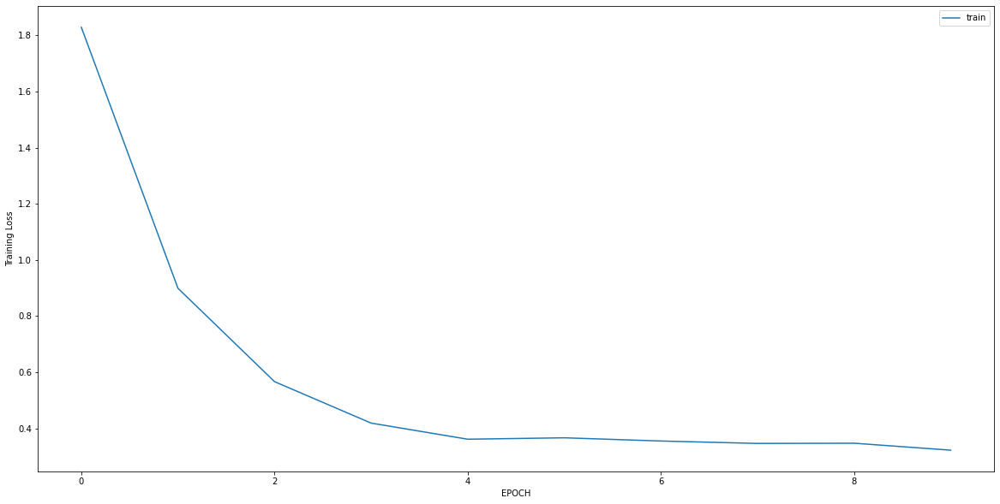

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0571 - accuracy: 0.6736
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0403 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9673 - accuracy: 0.6806
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8733 - accuracy: 0.6875
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7307 - accuracy: 0.6944
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.6875
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6675 - accuracy: 0.6806
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6254 - accuracy: 0.6806
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6610 - accuracy: 0.6250
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6500 - accuracy: 0.6250


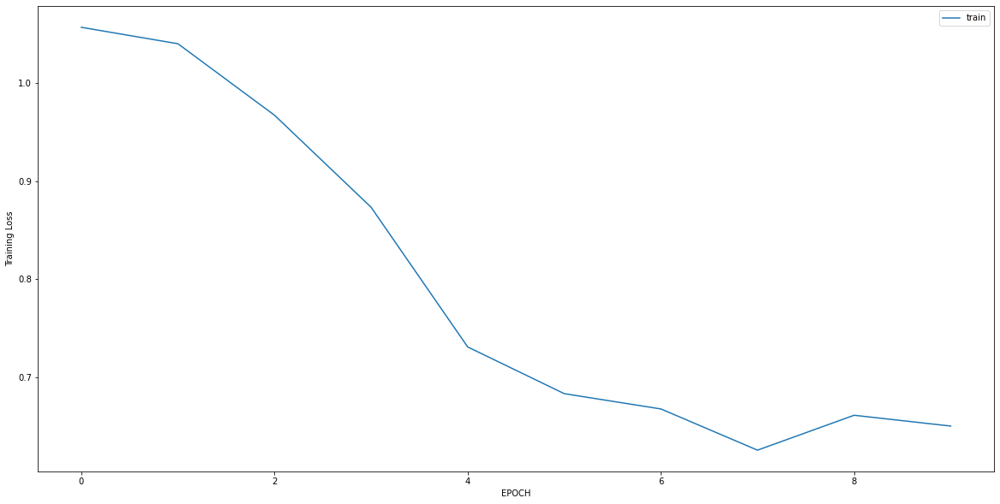

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.5266 - accuracy: 0.7754
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4600 - accuracy: 0.7970
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4104 - accuracy: 0.8380
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3385 - accuracy: 0.8834
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3241 - accuracy: 0.8942
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3040 - accuracy: 0.8898
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2550 - accuracy: 0.9006
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3119 - accuracy: 0.8855
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3022 - accuracy: 0.9028
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2434 - accuracy: 0.9201


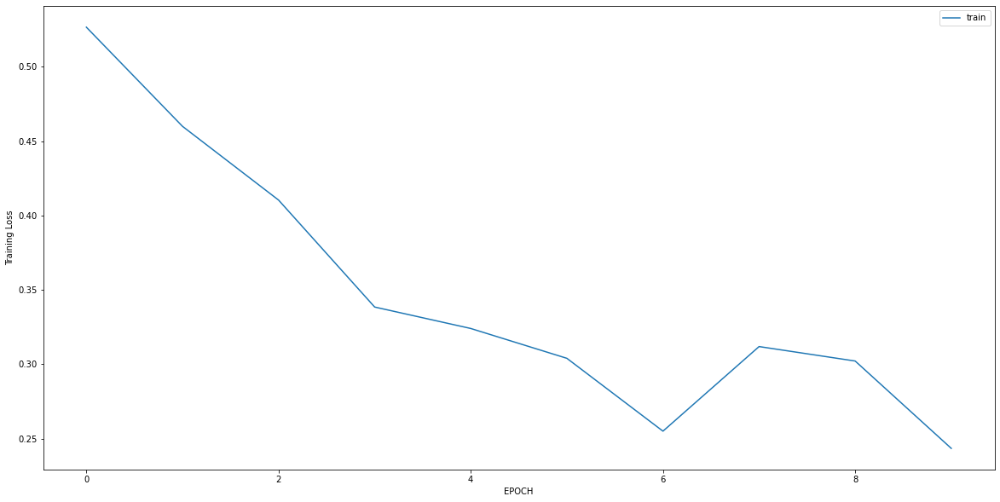

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4749 - accuracy: 0.7398
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1623 - accuracy: 0.9561
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1296 - accuracy: 0.9781
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1032 - accuracy: 0.9812
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0810 - accuracy: 0.9843
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0819 - accuracy: 0.9906
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0679 - accuracy: 0.9937
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0766 - accuracy: 0.9875
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0714 - accuracy: 0.9906
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0813 - accuracy: 0.9812


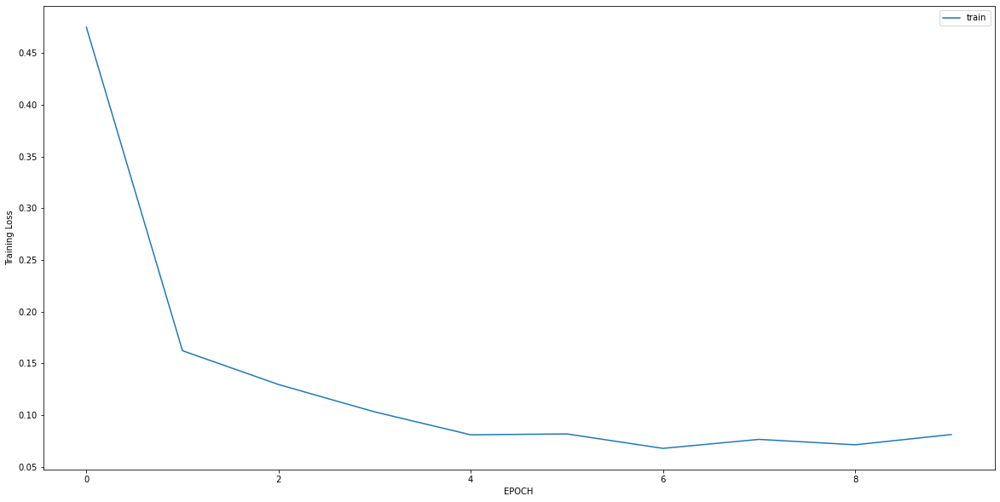

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1651 - accuracy: 0.9325
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1320 - accuracy: 0.9578
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0940 - accuracy: 0.9705
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0732 - accuracy: 0.9831
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0788 - accuracy: 0.9747
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0583 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0632 - accuracy: 0.9916
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0606 - accuracy: 0.9958
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0583 - accuracy: 0.9958
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0495 - accuracy: 0.9958


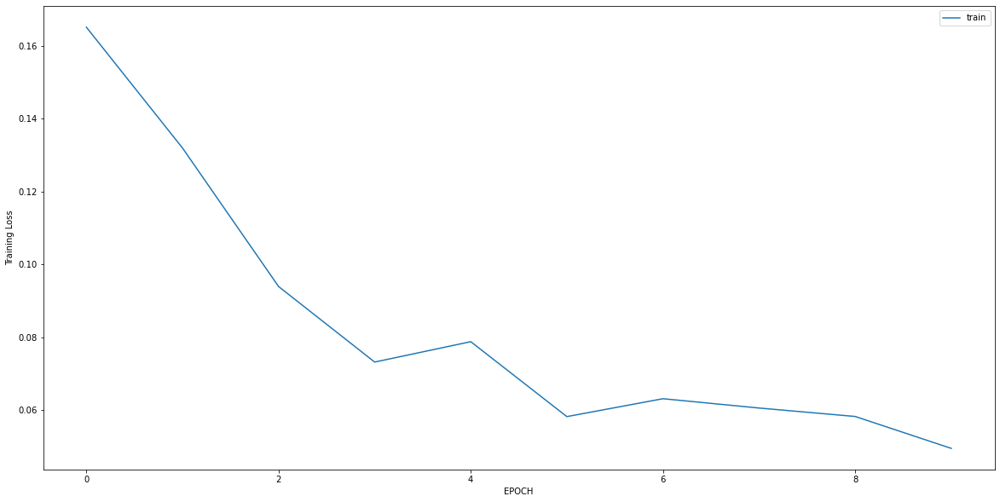

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 2.4826 - accuracy: 0.0630
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2813 - accuracy: 0.8950
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0202 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0181 - accuracy: 1.0000


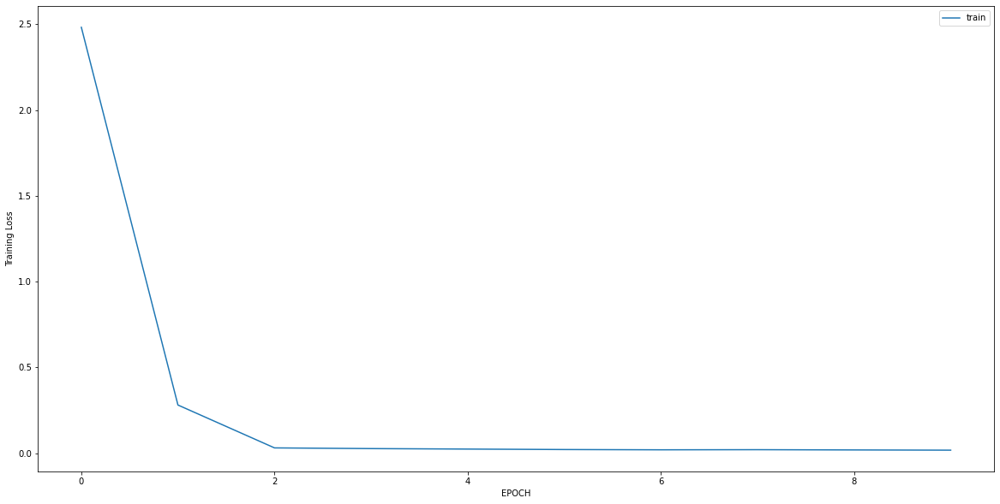

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6360 - accuracy: 0.8276
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3830 - accuracy: 0.8655
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3866 - accuracy: 0.9069
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3944 - accuracy: 0.9000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3023 - accuracy: 0.9138
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1648 - accuracy: 0.9621
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1591 - accuracy: 0.9483
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1190 - accuracy: 0.9724
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1175 - accuracy: 0.9690
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1156 - accuracy: 0.9724


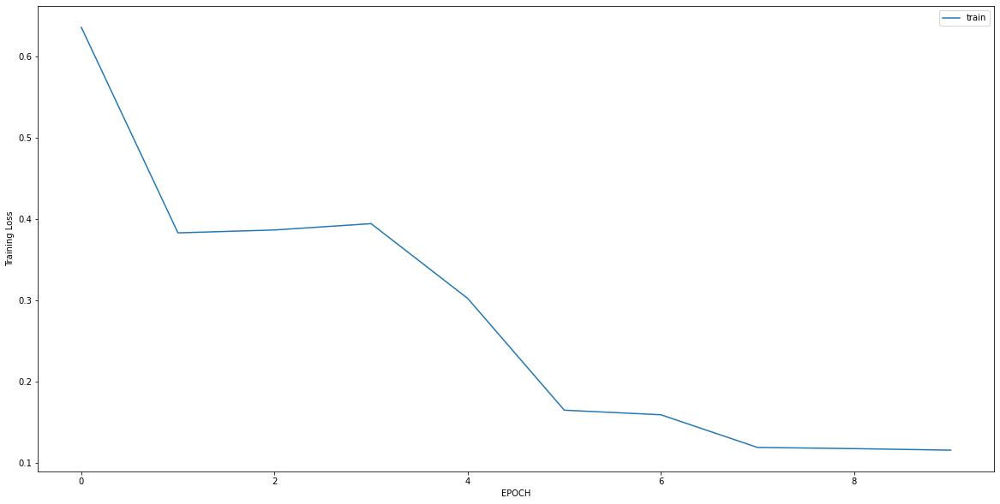

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2853 - accuracy: 0.9222
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2114 - accuracy: 0.9148
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1329 - accuracy: 0.9667
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3748 - accuracy: 0.8074
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1927 - accuracy: 0.9370
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2346 - accuracy: 0.9074
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1734 - accuracy: 0.9296
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1591 - accuracy: 0.9444
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1793 - accuracy: 0.9407
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1437 - accuracy: 0.9556


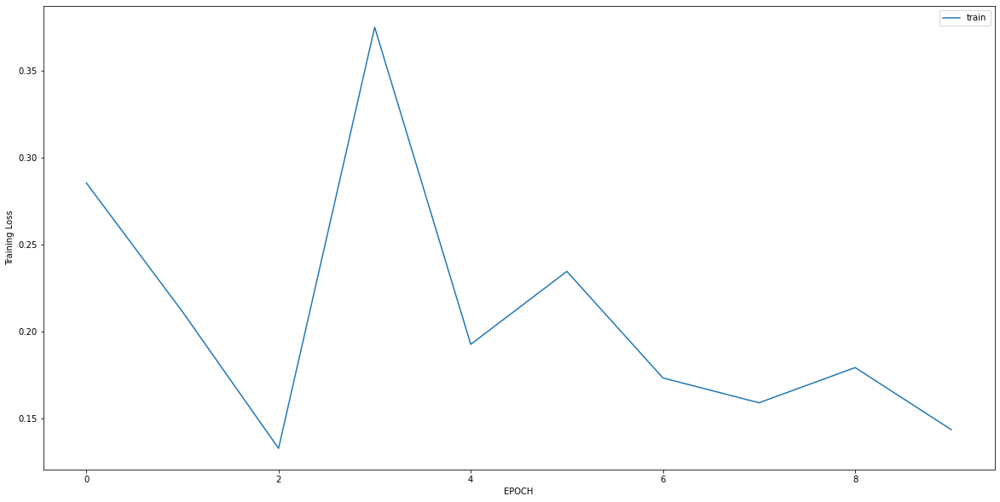

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9765 - accuracy: 0.4863
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3437 - accuracy: 0.8706
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2911 - accuracy: 0.9020
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2067 - accuracy: 0.9294
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2169 - accuracy: 0.9373
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2074 - accuracy: 0.9412
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1822 - accuracy: 0.9373
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2059 - accuracy: 0.9373
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1914 - accuracy: 0.9137
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1552 - accuracy: 0.9529


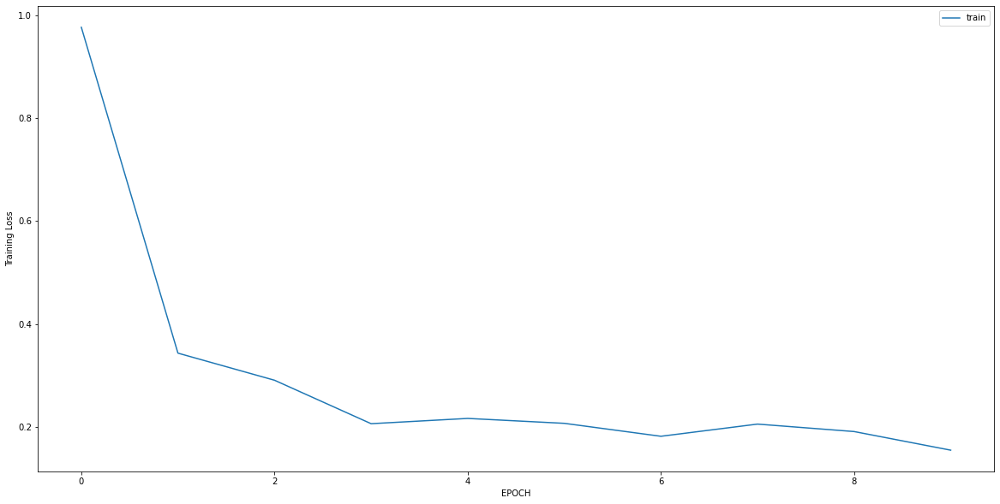

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2282 - accuracy: 0.9012
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1708 - accuracy: 0.9407
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1276 - accuracy: 0.9565
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0879 - accuracy: 0.9802
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1316 - accuracy: 0.9565
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1063 - accuracy: 0.9644
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1061 - accuracy: 0.9644
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1349 - accuracy: 0.9486
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1246 - accuracy: 0.9526
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0830 - accuracy: 0.9763


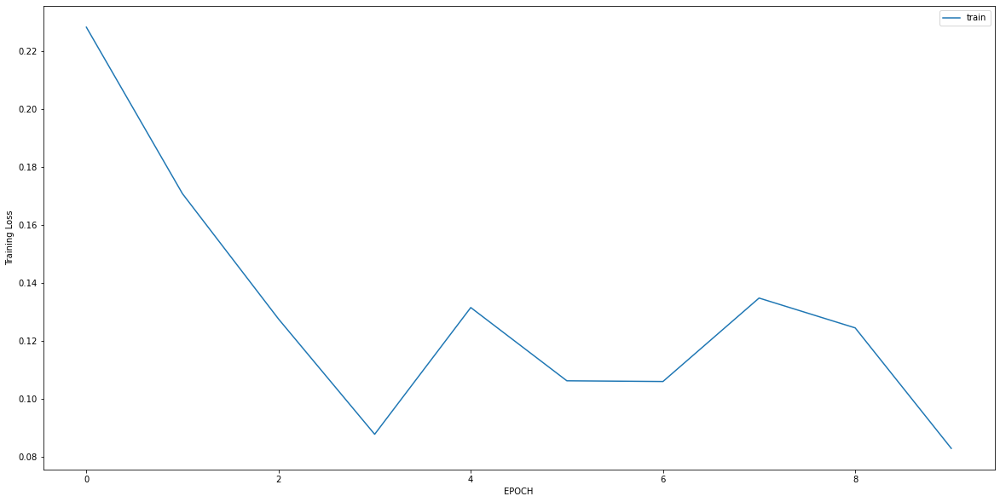

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 2.7230 - accuracy: 0.0449
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1234 - accuracy: 0.9878
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0293 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0278 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0199 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0180 - accuracy: 1.0000


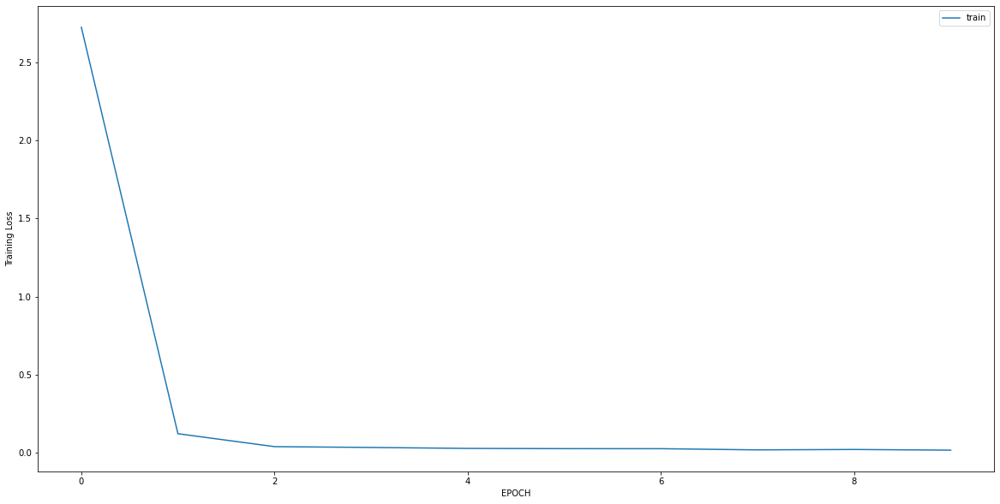

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 0.6041 - accuracy: 0.7118
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.9859
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0079 - accuracy: 1.0000


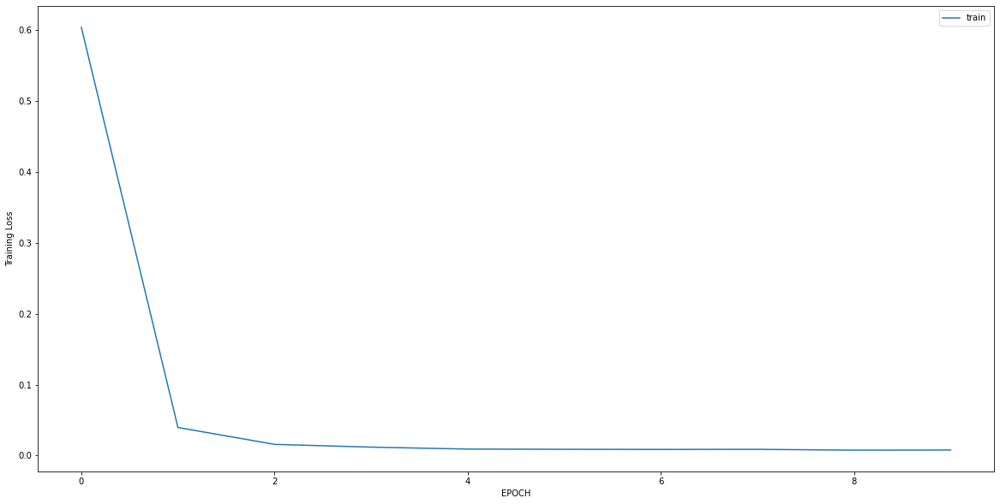

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0078 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0058 - accuracy: 1.0000


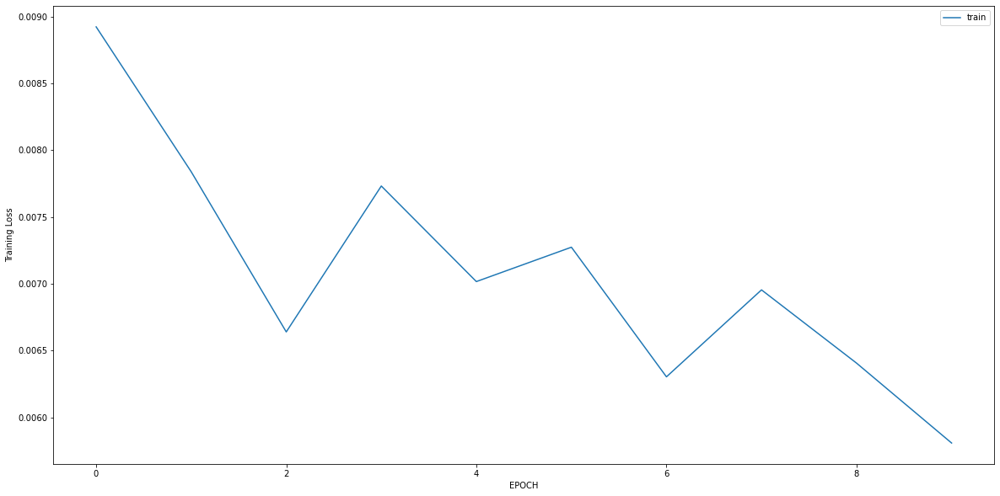

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6799 - accuracy: 0.6043
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4889 - accuracy: 0.7626
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4266 - accuracy: 0.8273
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3194 - accuracy: 0.9137
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2861 - accuracy: 0.9137
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2381 - accuracy: 0.9353
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2159 - accuracy: 0.9496
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1816 - accuracy: 0.9568
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1849 - accuracy: 0.9640
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1627 - accuracy: 0.9496


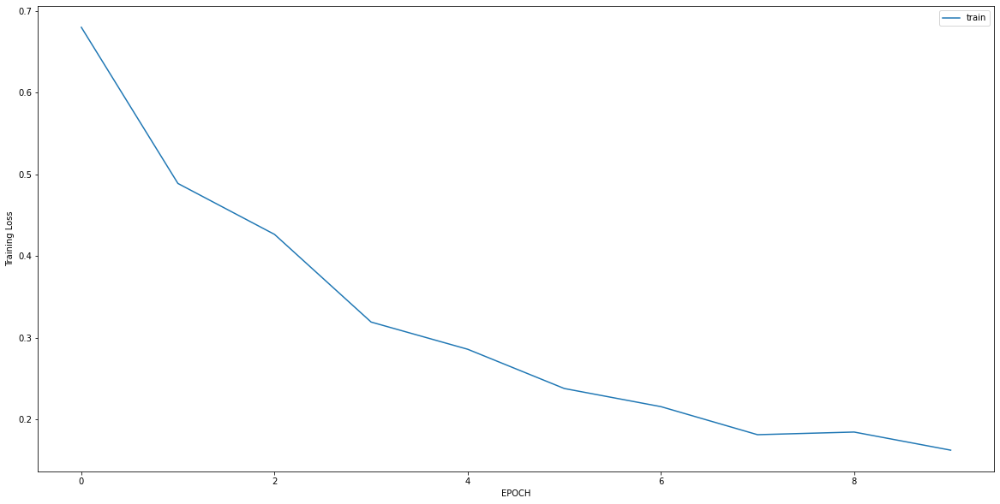

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6201 - accuracy: 0.7870
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3104 - accuracy: 0.8953
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2010 - accuracy: 0.9531
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1932 - accuracy: 0.9422
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1844 - accuracy: 0.9567
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1594 - accuracy: 0.9567
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1307 - accuracy: 0.9675
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1469 - accuracy: 0.9711
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1170 - accuracy: 0.9639
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1369 - accuracy: 0.9711


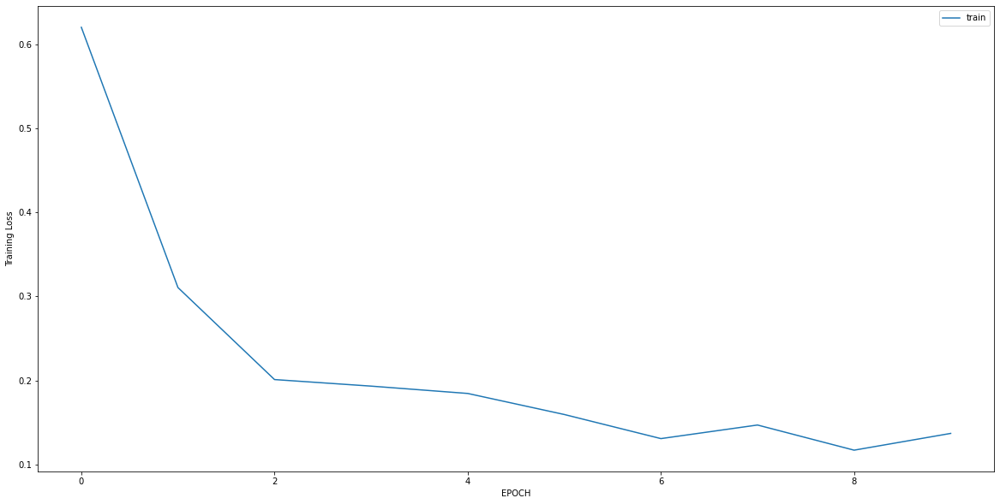

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 0.3300 - accuracy: 0.8571
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 0.2313 - accuracy: 0.8929
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0867 - accuracy: 0.9643
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0303 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0178 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 1.0000


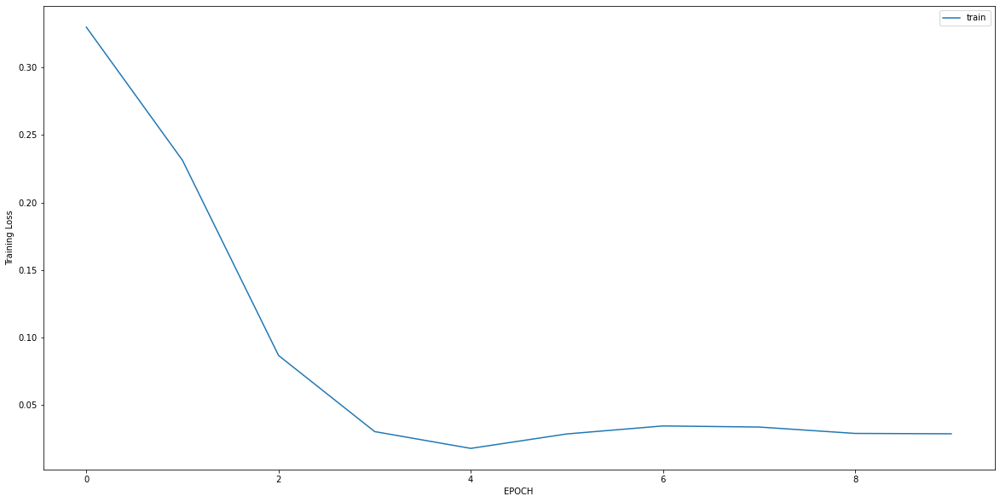

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.5399 - accuracy: 0.5921
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9137 - accuracy: 0.7341
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5636 - accuracy: 0.7855
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3772 - accuracy: 0.8610
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3241 - accuracy: 0.8671
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2727 - accuracy: 0.8882
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2184 - accuracy: 0.9094
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2077 - accuracy: 0.9154
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2019 - accuracy: 0.9215
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1734 - accuracy: 0.9275


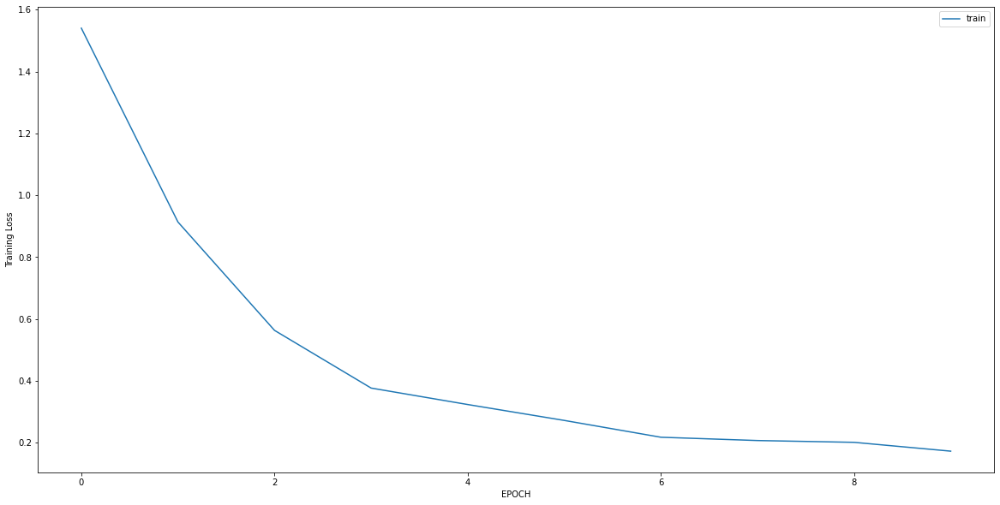

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2965 - accuracy: 0.8399
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5414 - accuracy: 0.7331
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1715 - accuracy: 0.9359
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1426 - accuracy: 0.9644
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1287 - accuracy: 0.9573
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1315 - accuracy: 0.9680
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1116 - accuracy: 0.9680
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1045 - accuracy: 0.9786
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1047 - accuracy: 0.9680
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0968 - accuracy: 0.9680


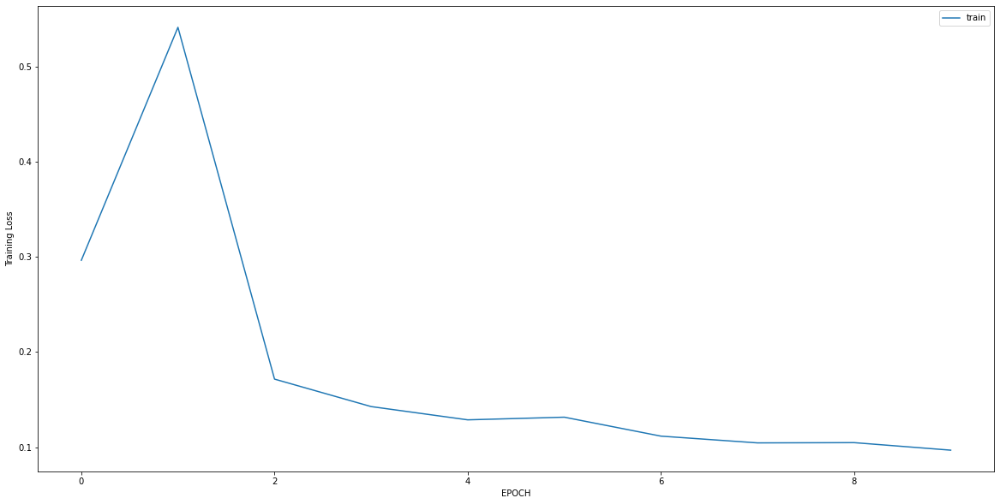

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 3.3084 - accuracy: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 0s 4ms/step - loss: 1.7890 - accuracy: 0.0444
Epoch 3/10
6/6 [==============================] - 0s 4ms/step - loss: 0.7396 - accuracy: 0.5389
Epoch 4/10
6/6 [==============================] - 0s 4ms/step - loss: 0.3076 - accuracy: 0.9278
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1747 - accuracy: 0.9889
Epoch 6/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0968 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0519 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0304 - accuracy: 1.0000


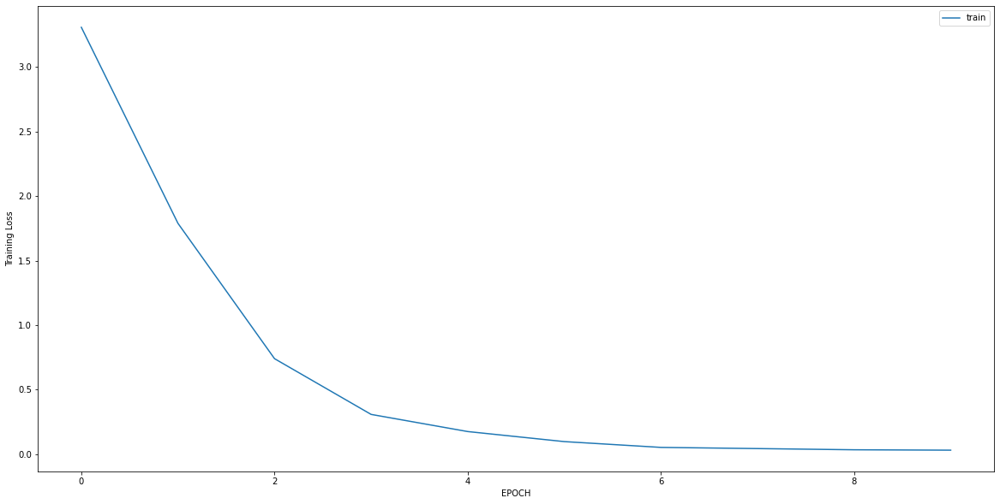

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.8168 - accuracy: 0.6005
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.4481 - accuracy: 0.7923
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2863 - accuracy: 0.9007
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2103 - accuracy: 0.9391
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1742 - accuracy: 0.9526
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1387 - accuracy: 0.9616
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1081 - accuracy: 0.9707
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0955 - accuracy: 0.9910
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0824 - accuracy: 0.9910
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0964 - accuracy: 0.9774


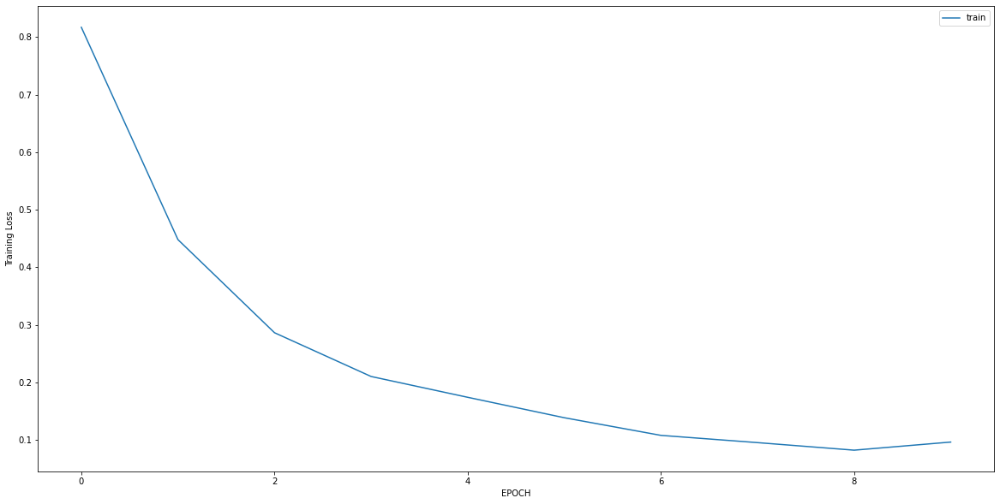

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.0750 - accuracy: 0.5378
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1093 - accuracy: 0.9728
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0318 - accuracy: 0.9940
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0100 - accuracy: 1.0000


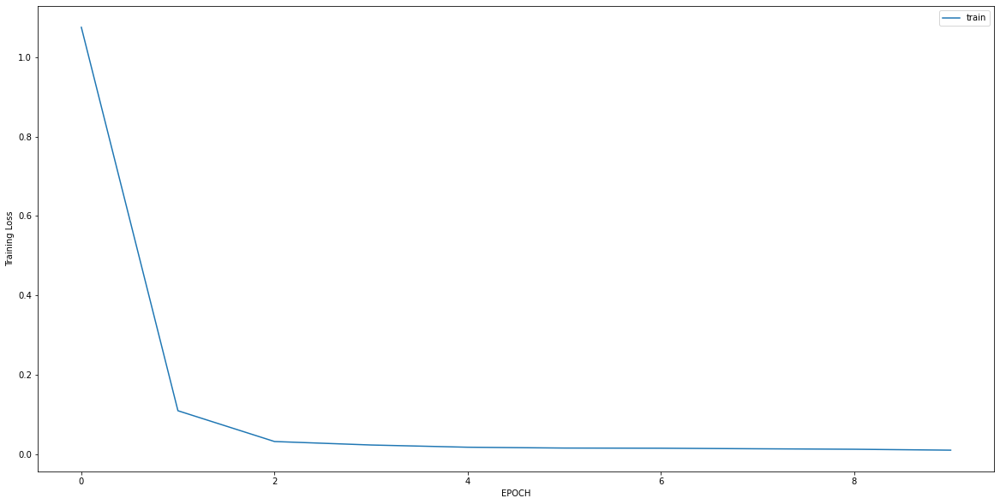

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1935 - accuracy: 0.9221
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0310 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0313 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0316 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0238 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0212 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0201 - accuracy: 1.0000


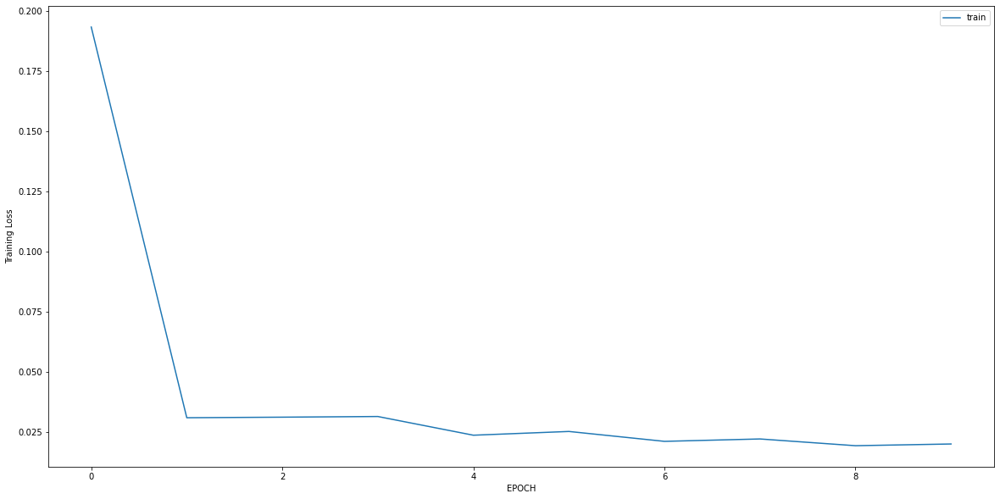

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1927 - accuracy: 0.9338
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1381 - accuracy: 0.9632
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1172 - accuracy: 0.9853
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1060 - accuracy: 0.9706
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0953 - accuracy: 0.9816
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1060 - accuracy: 0.9743
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1359 - accuracy: 0.9743
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1553 - accuracy: 0.9412
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1178 - accuracy: 0.9669
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0988 - accuracy: 0.9706


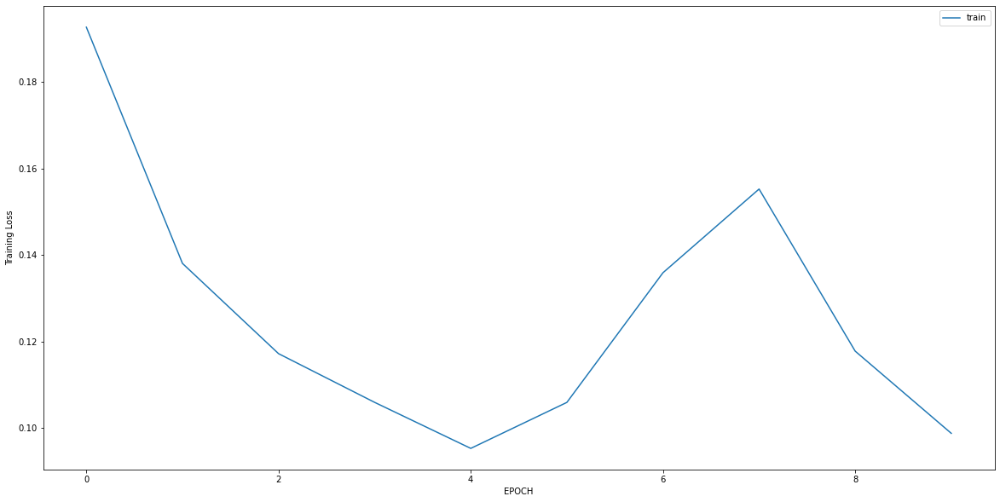

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.6620 - accuracy: 0.7890
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.5828 - accuracy: 0.8257
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4483 - accuracy: 0.8670
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4145 - accuracy: 0.8670
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3022 - accuracy: 0.9220
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2970 - accuracy: 0.9174
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2658 - accuracy: 0.9266
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1759 - accuracy: 0.9358
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1917 - accuracy: 0.9312
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1127 - accuracy: 0.9679


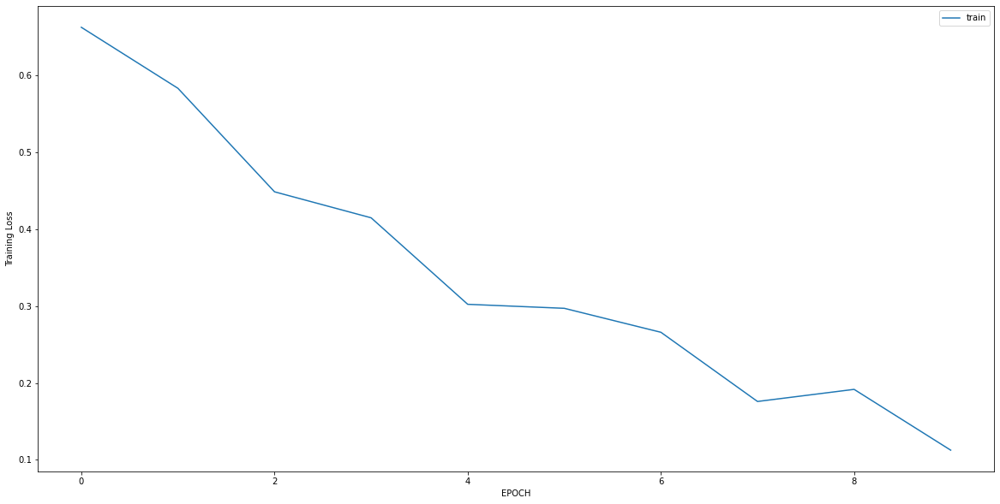

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1583 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0236 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9739 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9567 - accuracy: 0.7153
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9139 - accuracy: 0.7153
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7957 - accuracy: 0.7153
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6882 - accuracy: 0.7222
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7239 - accuracy: 0.7083
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6601 - accuracy: 0.7153
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6750 - accuracy: 0.7153


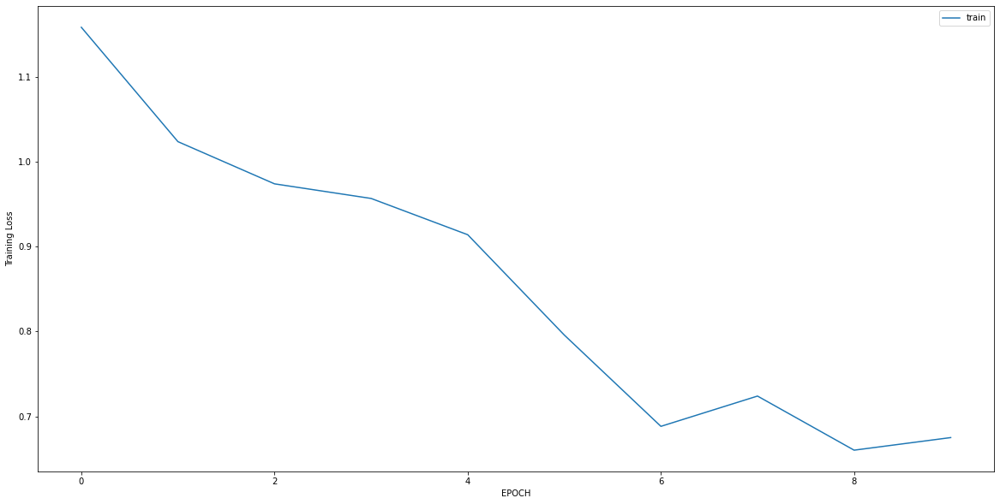

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5022 - accuracy: 0.8729
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2542 - accuracy: 0.9038
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2217 - accuracy: 0.9416
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1635 - accuracy: 0.9553
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1547 - accuracy: 0.9519
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1155 - accuracy: 0.9691
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1385 - accuracy: 0.9519
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1347 - accuracy: 0.9588
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0976 - accuracy: 0.9794
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1255 - accuracy: 0.9622


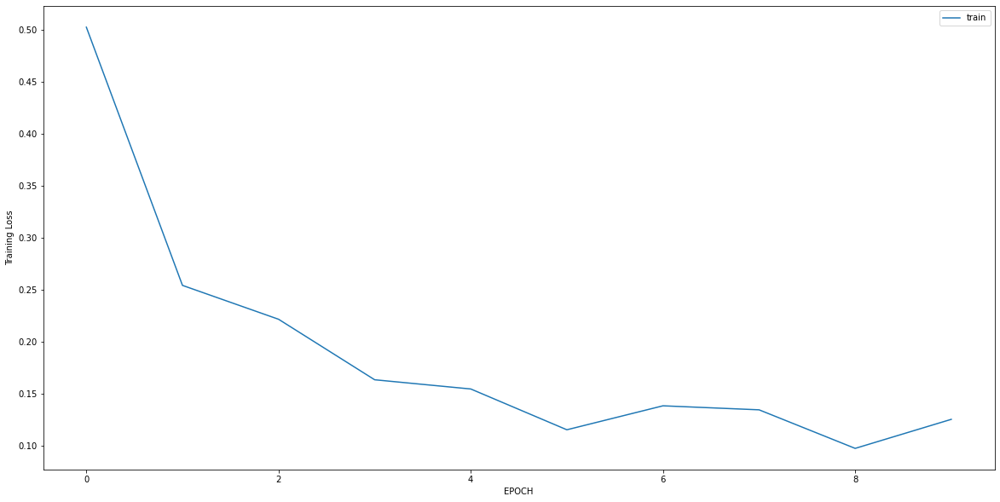

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 2.1186 - accuracy: 0.0367
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.8482 - accuracy: 0.4961
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.2062 - accuracy: 0.9685
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0592 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0227 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0211 - accuracy: 1.0000


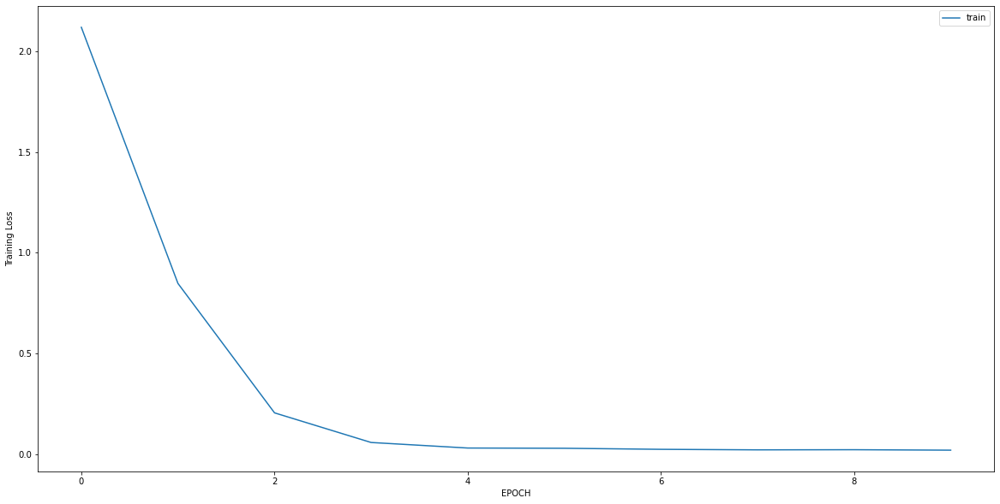

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.2277 - accuracy: 0.5848
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.7895 - accuracy: 0.6374
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5492 - accuracy: 0.7222
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3606 - accuracy: 0.7836
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2369 - accuracy: 0.8684
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1379 - accuracy: 0.9620
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1090 - accuracy: 0.9737
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0910 - accuracy: 0.9854
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0952 - accuracy: 0.9649
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0823 - accuracy: 0.9825


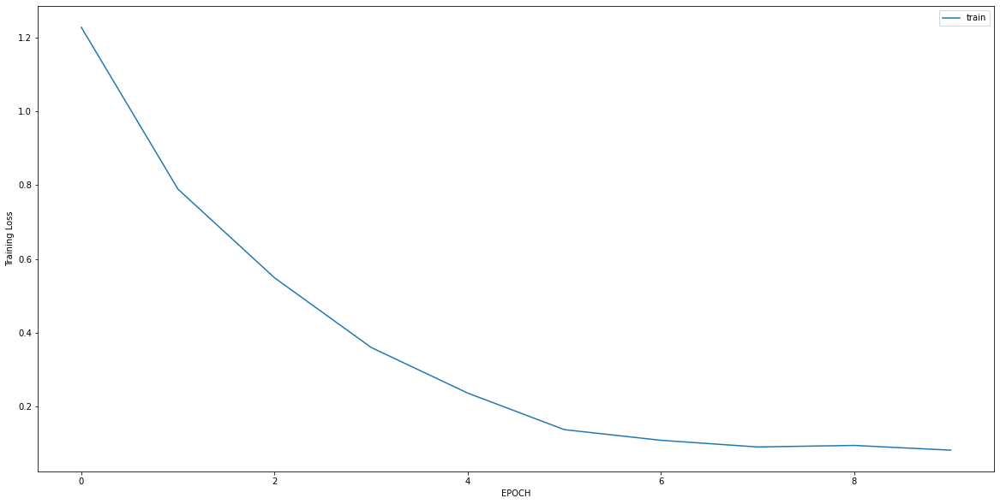

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.0105 - accuracy: 0.7773
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5608 - accuracy: 0.8421
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1616 - accuracy: 0.9474
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1382 - accuracy: 0.9595
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1308 - accuracy: 0.9595
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0959 - accuracy: 0.9879
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0847 - accuracy: 0.9757
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0765 - accuracy: 0.9919
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1192 - accuracy: 0.9757
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0651 - accuracy: 0.9919


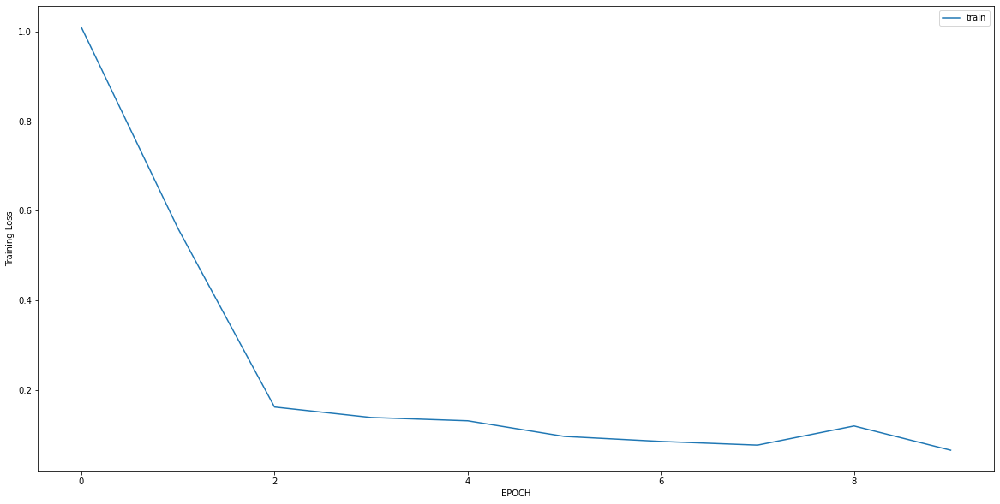

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2136 - accuracy: 0.9286
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1567 - accuracy: 0.9563
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1187 - accuracy: 0.9643
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0952 - accuracy: 0.9762
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0933 - accuracy: 0.9762
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0801 - accuracy: 0.9881
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 0.9921
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0519 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0499 - accuracy: 0.9960
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 1.0000


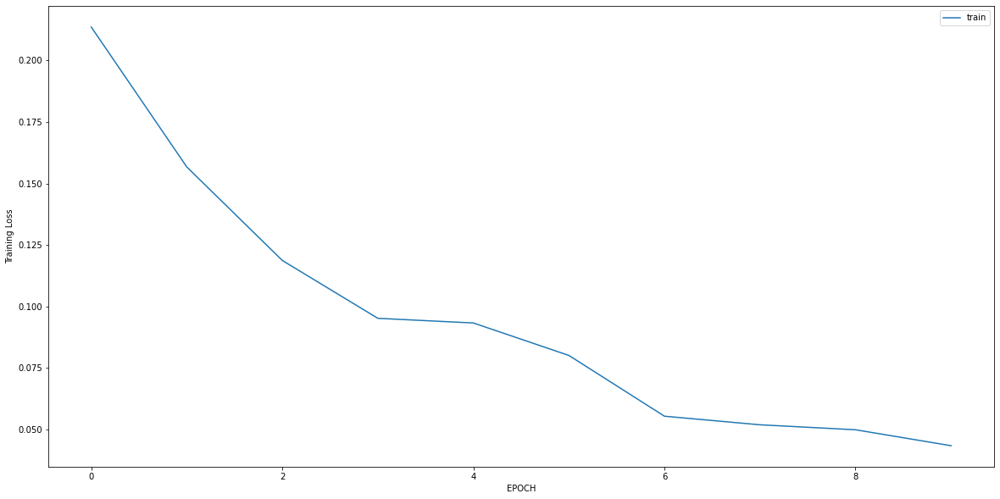

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.7626 - accuracy: 0.5958
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4647 - accuracy: 0.8571
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5977 - accuracy: 0.8362
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4834 - accuracy: 0.8641
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4347 - accuracy: 0.8780
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3346 - accuracy: 0.9024
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2401 - accuracy: 0.9373
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3361 - accuracy: 0.9094
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3244 - accuracy: 0.9059
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2702 - accuracy: 0.9233


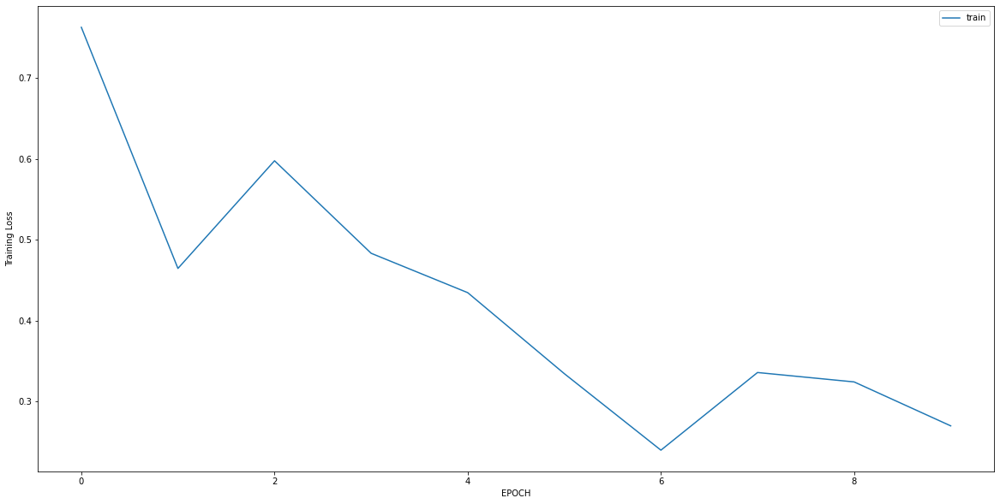

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1857 - accuracy: 0.9337
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1649 - accuracy: 0.9366
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1401 - accuracy: 0.9481
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1279 - accuracy: 0.9597
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0970 - accuracy: 0.9712
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0765 - accuracy: 0.9856
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0814 - accuracy: 0.9798
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0679 - accuracy: 0.9885
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0694 - accuracy: 0.9885
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0574 - accuracy: 0.9971


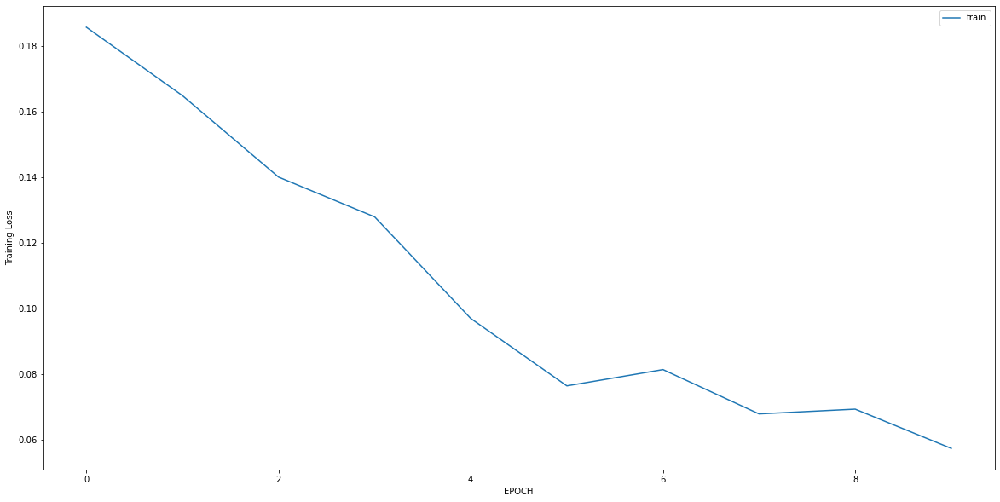

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2773 - accuracy: 0.9126
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2673 - accuracy: 0.9336
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2441 - accuracy: 0.9371
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2473 - accuracy: 0.9371
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2328 - accuracy: 0.9336
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2319 - accuracy: 0.9371
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2188 - accuracy: 0.9406
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2190 - accuracy: 0.9476
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2114 - accuracy: 0.9406
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2221 - accuracy: 0.9336


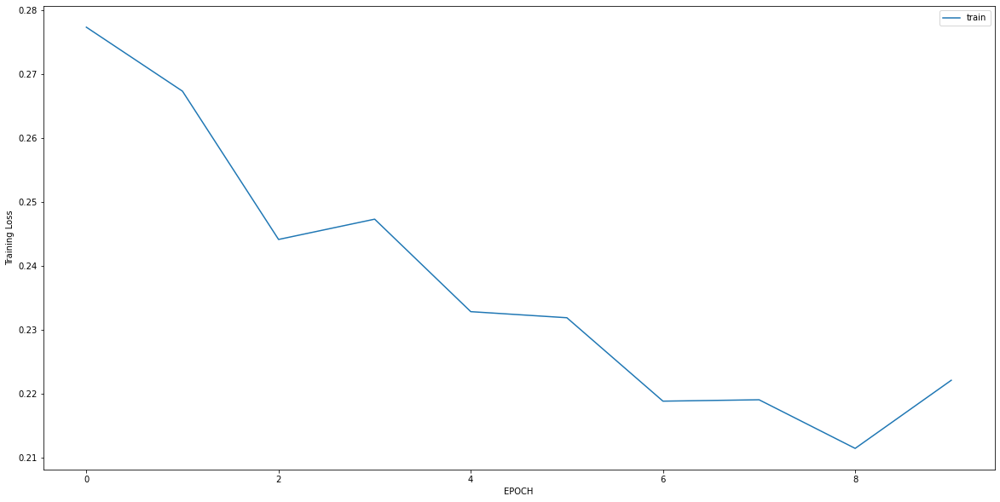

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 0.5257 - accuracy: 0.7857
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2860 - accuracy: 0.8980
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3371 - accuracy: 0.8367
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3659 - accuracy: 0.8061
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.2472 - accuracy: 0.8878
Epoch 6/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2221 - accuracy: 0.9286
Epoch 7/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2246 - accuracy: 0.8673
Epoch 8/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2349 - accuracy: 0.8673
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.2014 - accuracy: 0.9184
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3282 - accuracy: 0.8776


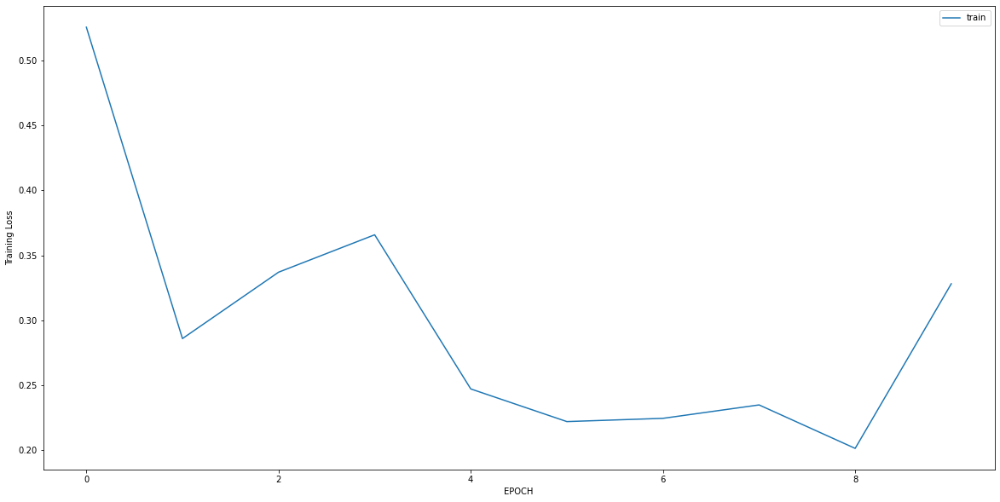

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 3.8823 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 2.1409 - accuracy: 0.0156
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6903 - accuracy: 0.5826
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2138 - accuracy: 0.9782
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1138 - accuracy: 0.9969
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0741 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0631 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 1.0000


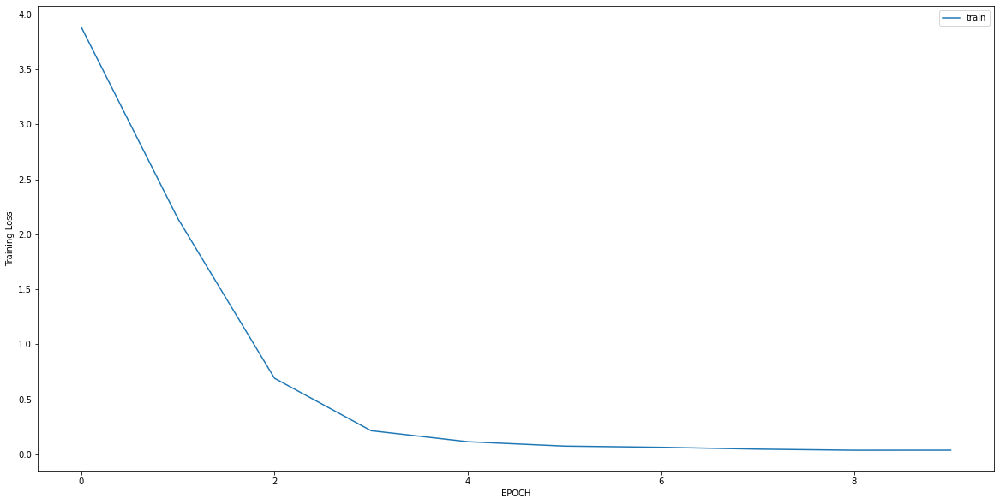

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.8903 - accuracy: 0.2453
Epoch 2/10
7/7 [==============================] - 0s 4ms/step - loss: 1.6882 - accuracy: 0.2925
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 1.3098 - accuracy: 0.3538
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.9862 - accuracy: 0.3868
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.7213 - accuracy: 0.5094
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.6049 - accuracy: 0.6557
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5088 - accuracy: 0.7642
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4499 - accuracy: 0.8349
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4325 - accuracy: 0.8066
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4053 - accuracy: 0.8349


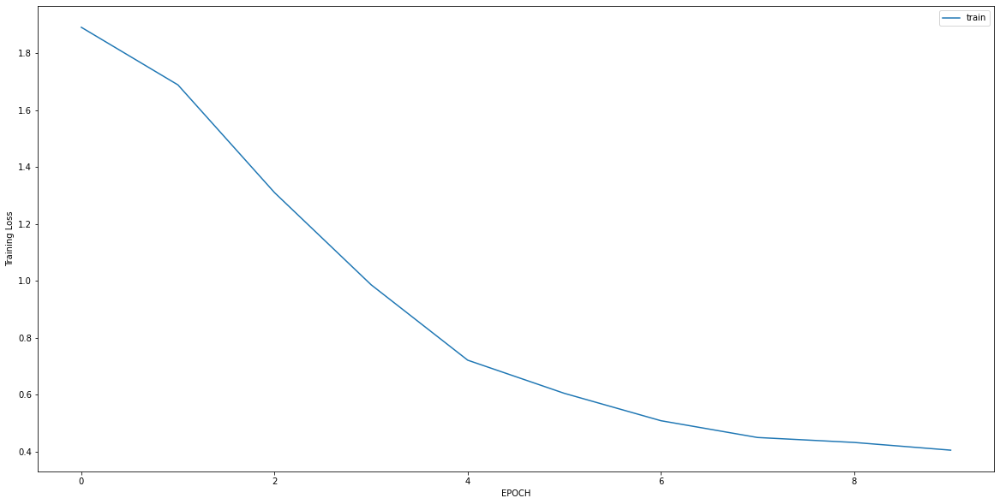

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4748 - accuracy: 0.7826
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3589 - accuracy: 0.8814
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2895 - accuracy: 0.9209
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2564 - accuracy: 0.9012
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2649 - accuracy: 0.9051
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3653 - accuracy: 0.8854
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3425 - accuracy: 0.8854
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2957 - accuracy: 0.8972
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2962 - accuracy: 0.8933
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2566 - accuracy: 0.9012


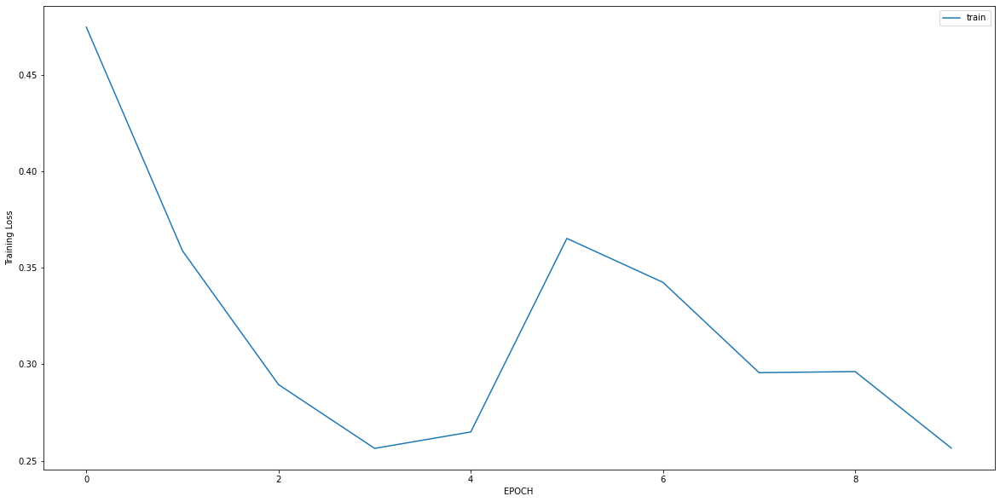

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.2788 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3698 - accuracy: 0.0383
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4986 - accuracy: 0.7931
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1376 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0812 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0659 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0495 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 1.0000


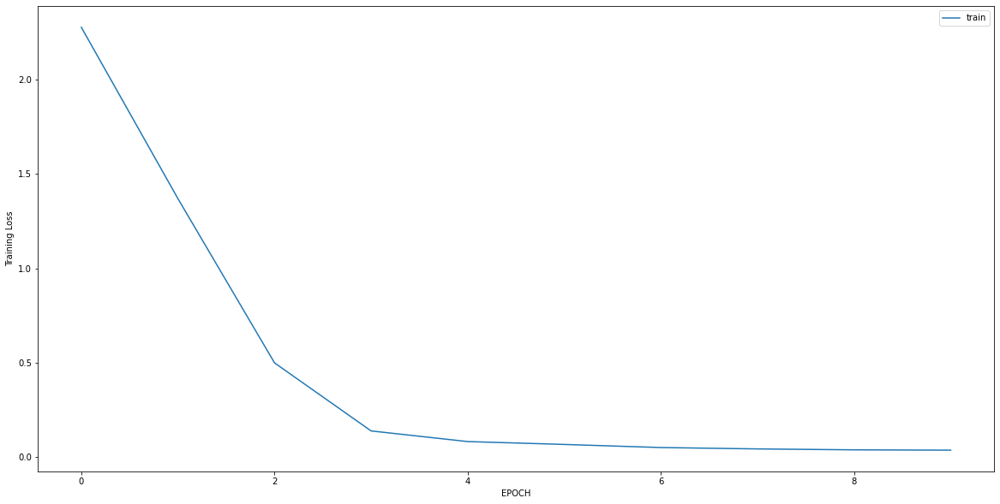

Epoch 1/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0325 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0352 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0329 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0329 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0318 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0280 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0291 - accuracy: 1.0000


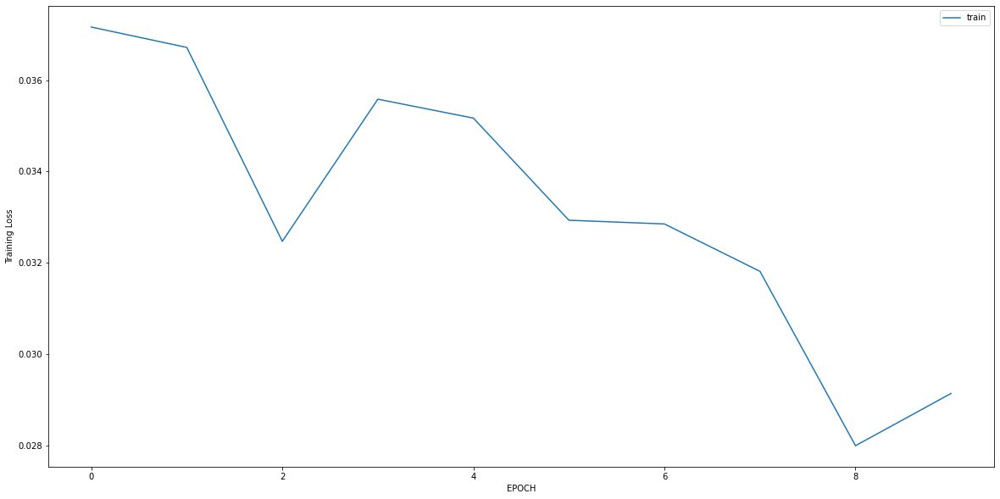

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3326 - accuracy: 0.9234
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1768 - accuracy: 0.9962
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1294 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0980 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0853 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 1.0000


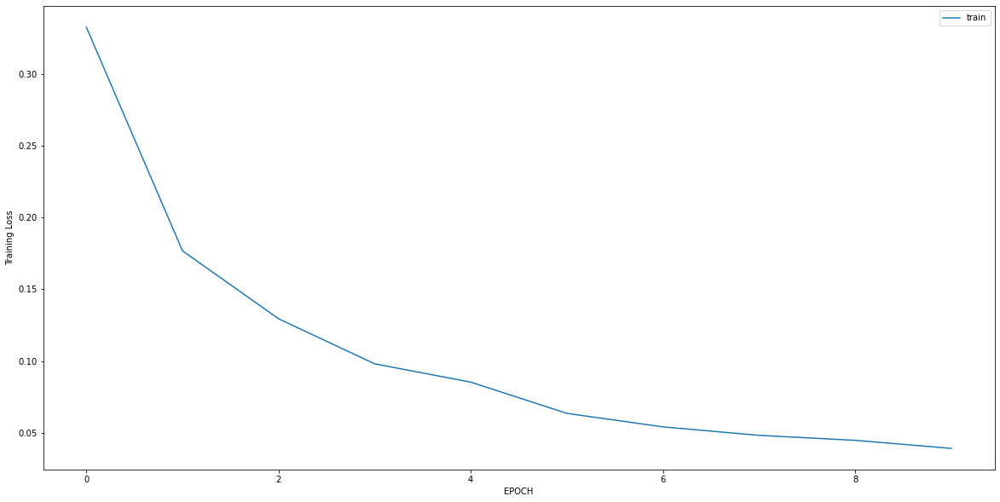

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0326 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0292 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0229 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0186 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 1.0000


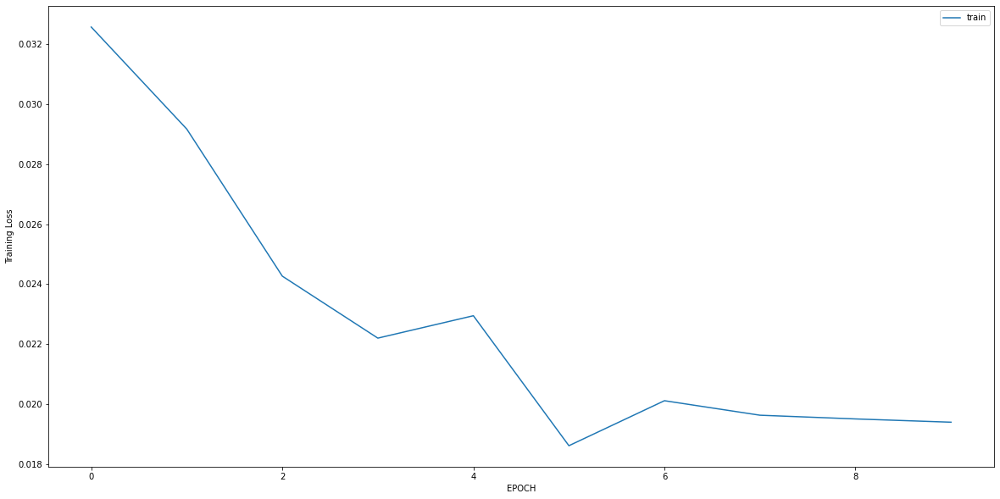

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.8786 - accuracy: 0.4226
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.5507 - accuracy: 0.4264
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.2965 - accuracy: 0.4415
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1344 - accuracy: 0.3887
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0395 - accuracy: 0.3962
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8573 - accuracy: 0.5057
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6892 - accuracy: 0.6717
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6135 - accuracy: 0.7019
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5310 - accuracy: 0.7698
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4735 - accuracy: 0.8226


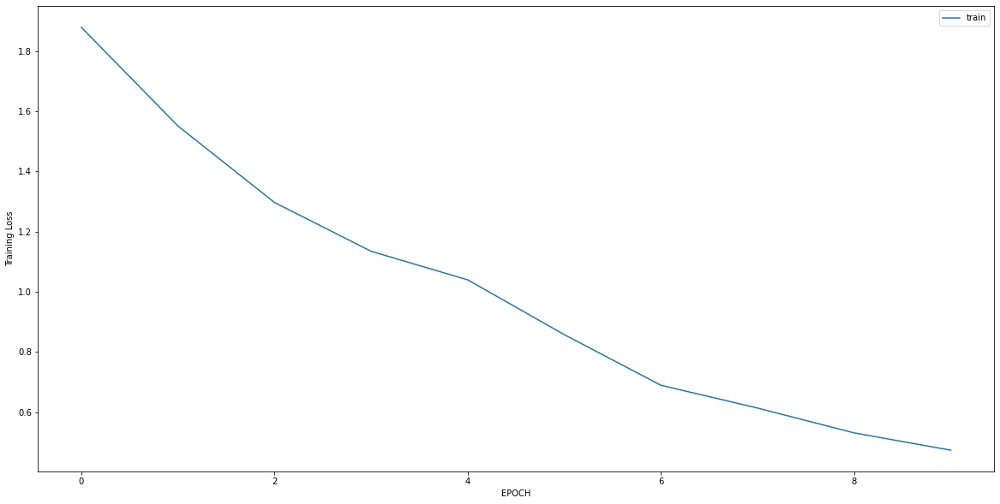

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3926 - accuracy: 0.8730
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3434 - accuracy: 0.9221
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3144 - accuracy: 0.9057
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2606 - accuracy: 0.9631
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2562 - accuracy: 0.9385
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2158 - accuracy: 0.9590
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2026 - accuracy: 0.9672
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1736 - accuracy: 0.9590
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1838 - accuracy: 0.9713
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1802 - accuracy: 0.9385


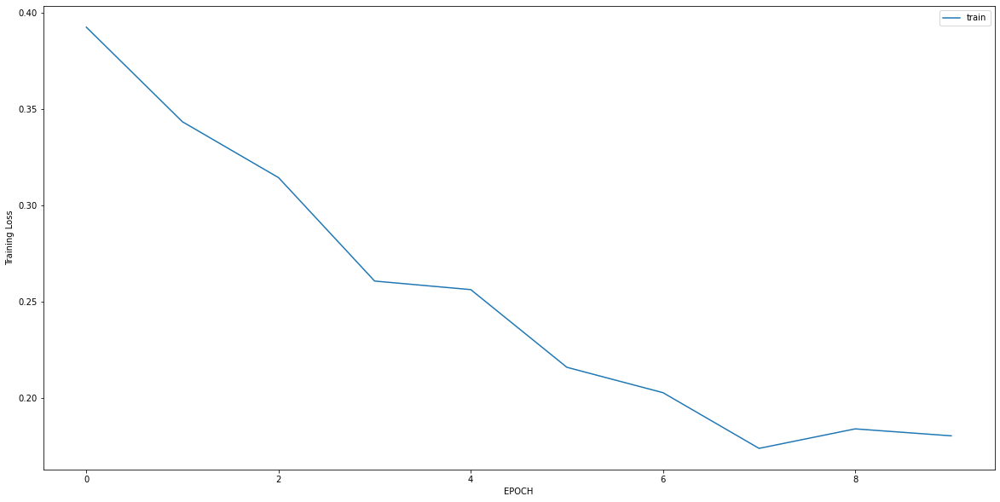

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4233 - accuracy: 0.8312
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2870 - accuracy: 0.9030
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1513 - accuracy: 0.9620
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1305 - accuracy: 0.9916
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1183 - accuracy: 0.9831
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1095 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0914 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0871 - accuracy: 0.9916
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0779 - accuracy: 0.9916
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0720 - accuracy: 0.9958


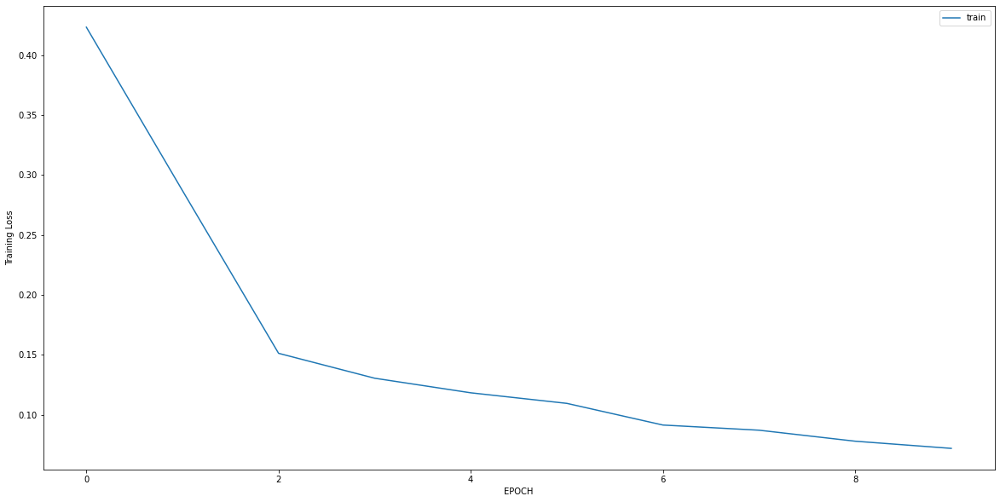

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.4276 - accuracy: 0.8036
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2105 - accuracy: 0.9278
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1397 - accuracy: 0.9639
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1142 - accuracy: 0.9729
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0976 - accuracy: 0.9842
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0843 - accuracy: 0.9887
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0952 - accuracy: 0.9819
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0852 - accuracy: 0.9819
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0683 - accuracy: 0.9887
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0653 - accuracy: 0.9842


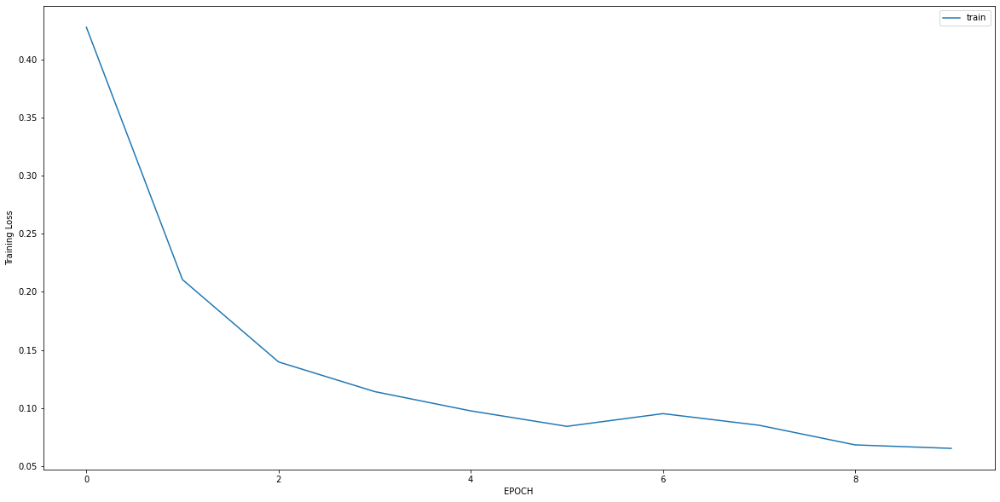

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.9697 - accuracy: 0.5228
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2547 - accuracy: 0.5193
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5833 - accuracy: 0.7474
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3751 - accuracy: 0.8526
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2981 - accuracy: 0.8877
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3521 - accuracy: 0.8807
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2996 - accuracy: 0.9053
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3007 - accuracy: 0.8807
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3155 - accuracy: 0.9018
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2787 - accuracy: 0.9053


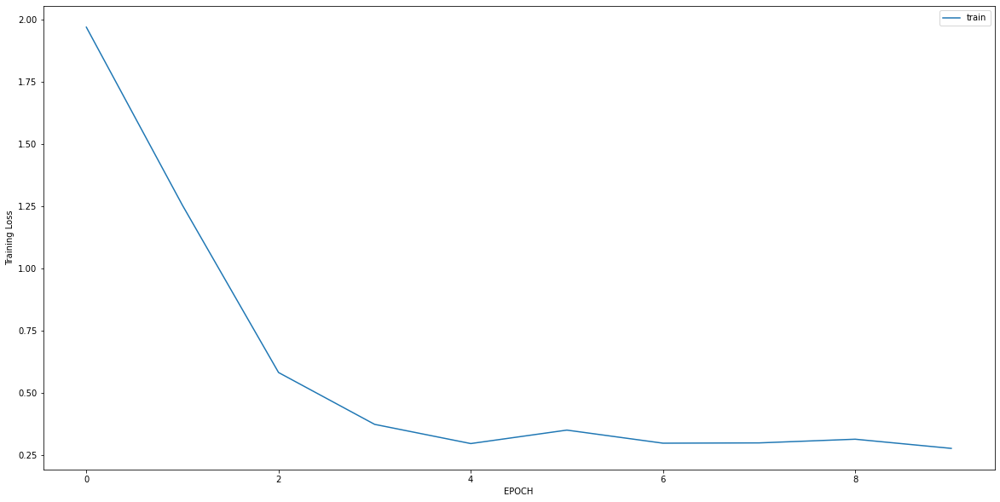

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2112 - accuracy: 0.9243
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0276 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0259 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 1.0000


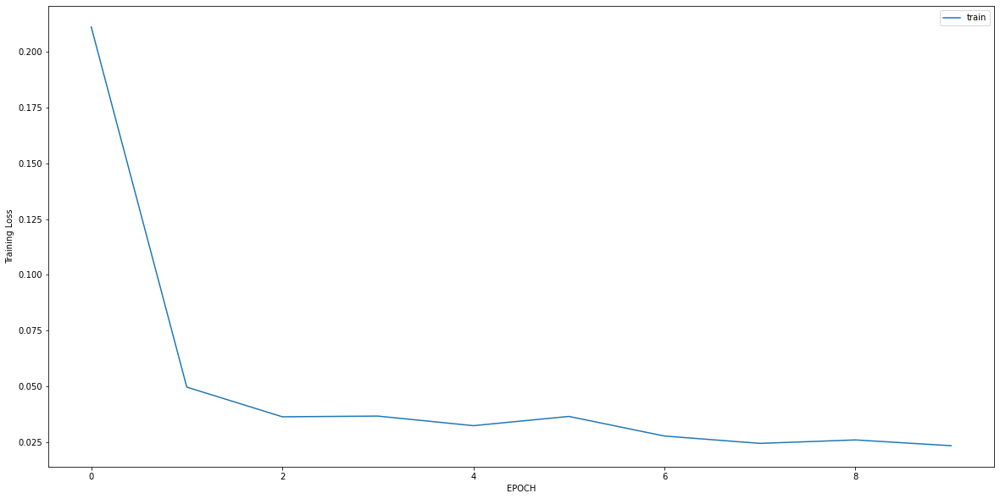

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4841 - accuracy: 0.8165
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3704 - accuracy: 0.8427
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2865 - accuracy: 0.8876
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2568 - accuracy: 0.9026
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2386 - accuracy: 0.9251
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2401 - accuracy: 0.9288
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2004 - accuracy: 0.9326
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1945 - accuracy: 0.9363
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1719 - accuracy: 0.9363
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2341 - accuracy: 0.9213


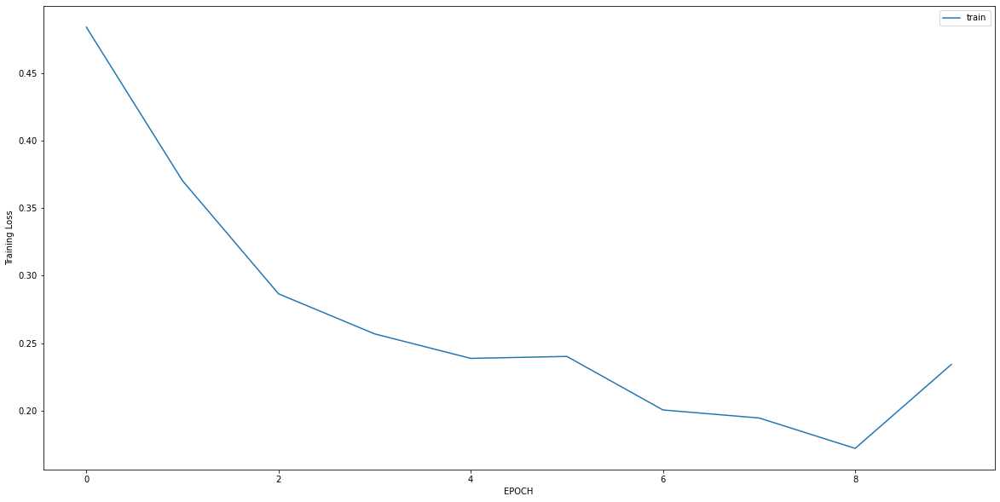

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7223 - accuracy: 0.6041
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0581 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0199 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0148 - accuracy: 1.0000


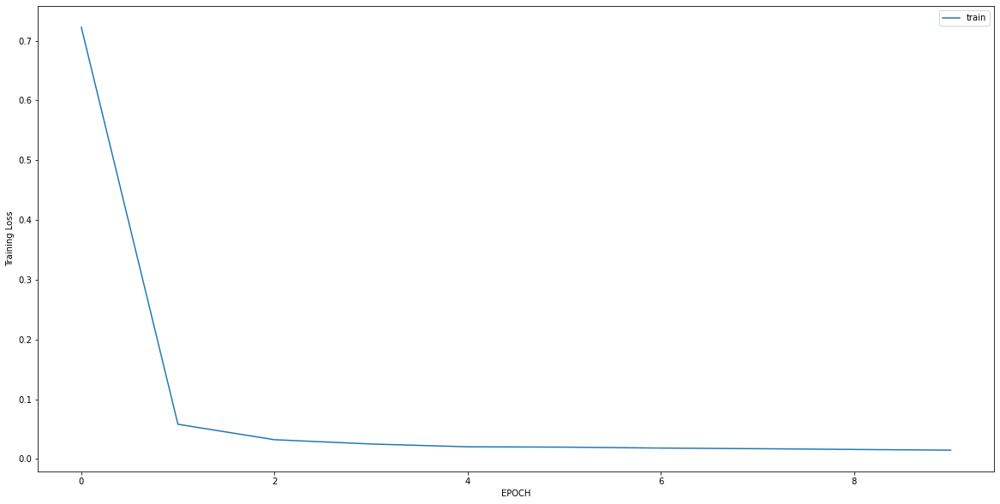

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7322 - accuracy: 0.7556
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5439 - accuracy: 0.8000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3372 - accuracy: 0.8481
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2643 - accuracy: 0.8963
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2512 - accuracy: 0.9074
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2030 - accuracy: 0.9370
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1524 - accuracy: 0.9519
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1320 - accuracy: 0.9481
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2871 - accuracy: 0.9185
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1806 - accuracy: 0.9444


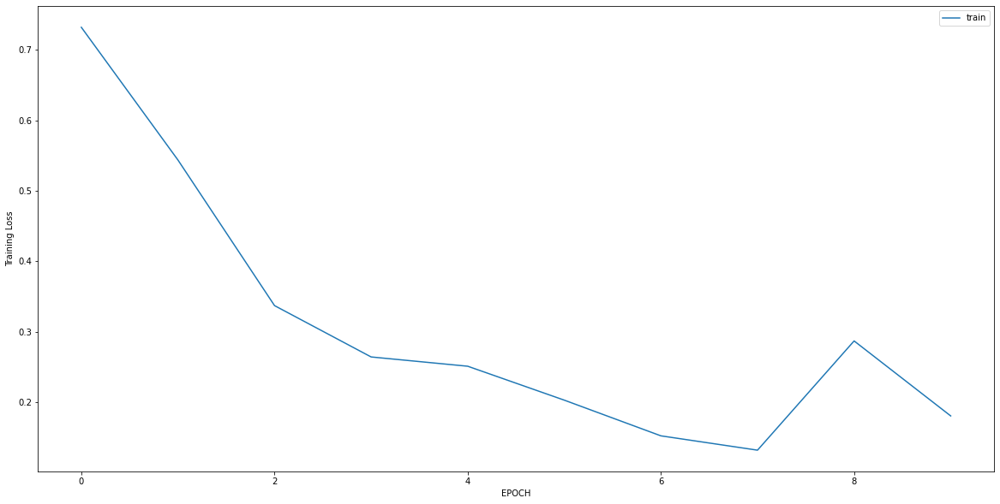

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8508 - accuracy: 0.6516
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3912 - accuracy: 0.8850
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4173 - accuracy: 0.8711
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3315 - accuracy: 0.8885
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2585 - accuracy: 0.9059
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2313 - accuracy: 0.9268
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2370 - accuracy: 0.9199
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2209 - accuracy: 0.9199
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2159 - accuracy: 0.9373
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1831 - accuracy: 0.9373


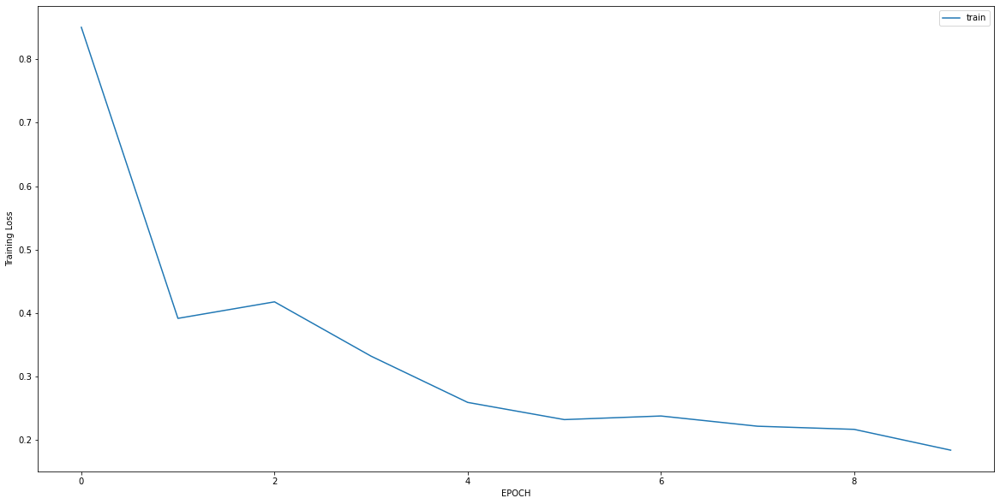

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3168 - accuracy: 0.8596
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2064 - accuracy: 0.9123
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1731 - accuracy: 0.9298
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1567 - accuracy: 0.9269
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1312 - accuracy: 0.9474
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1087 - accuracy: 0.9620
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1343 - accuracy: 0.9298
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1173 - accuracy: 0.9474
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1049 - accuracy: 0.9620
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1211 - accuracy: 0.9444


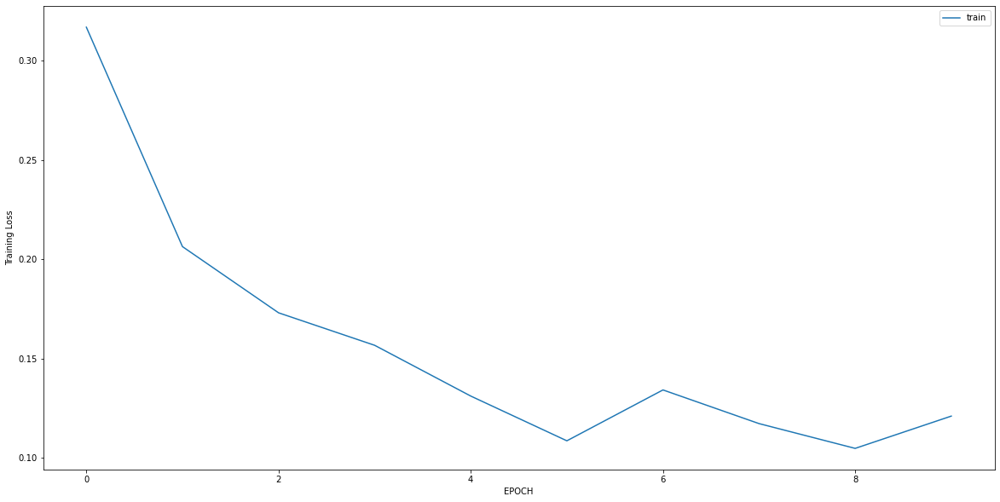

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6046 - accuracy: 0.7944
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5353 - accuracy: 0.8105
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4552 - accuracy: 0.8226
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4017 - accuracy: 0.8589
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3737 - accuracy: 0.8629
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3359 - accuracy: 0.8831
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2276 - accuracy: 0.8952
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2988 - accuracy: 0.8911
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2421 - accuracy: 0.9032
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2248 - accuracy: 0.9194


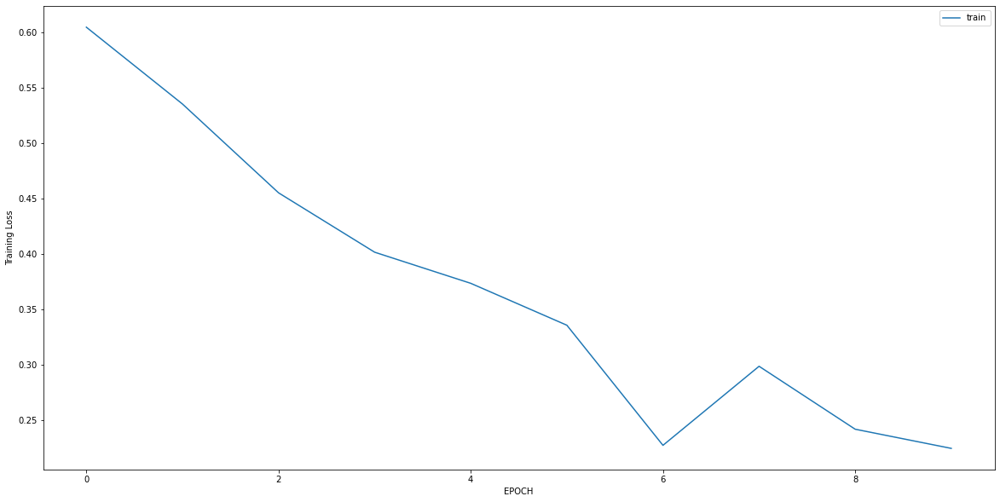

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6690 - accuracy: 0.7610
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1989 - accuracy: 0.9228
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1995 - accuracy: 0.9228
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1750 - accuracy: 0.9375
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1734 - accuracy: 0.9338
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1378 - accuracy: 0.9375
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1577 - accuracy: 0.9228
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1499 - accuracy: 0.9412
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1710 - accuracy: 0.9338
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1506 - accuracy: 0.9375


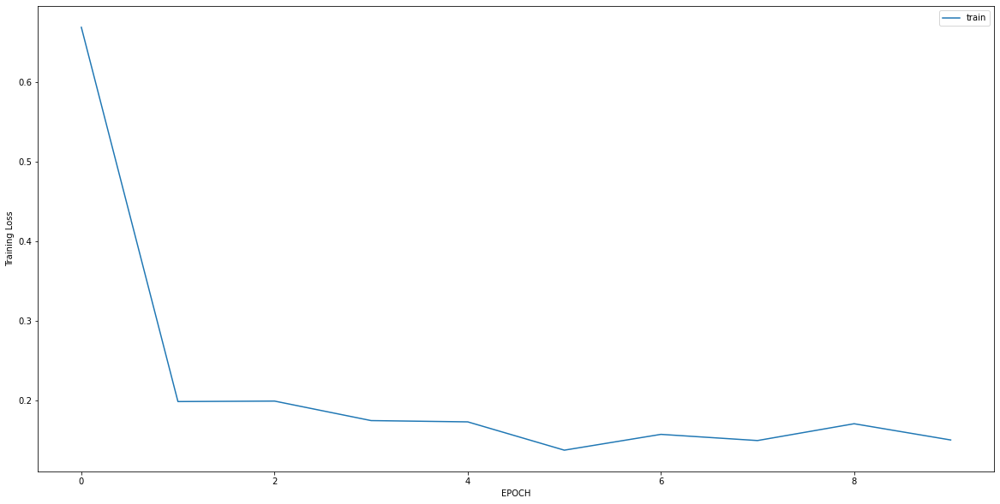

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5030 - accuracy: 0.7984
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4878 - accuracy: 0.8024
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4411 - accuracy: 0.8182
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4385 - accuracy: 0.7984
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4384 - accuracy: 0.8024
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4073 - accuracy: 0.8182
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3756 - accuracy: 0.8142
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4417 - accuracy: 0.7470
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3702 - accuracy: 0.8538
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3629 - accuracy: 0.8498


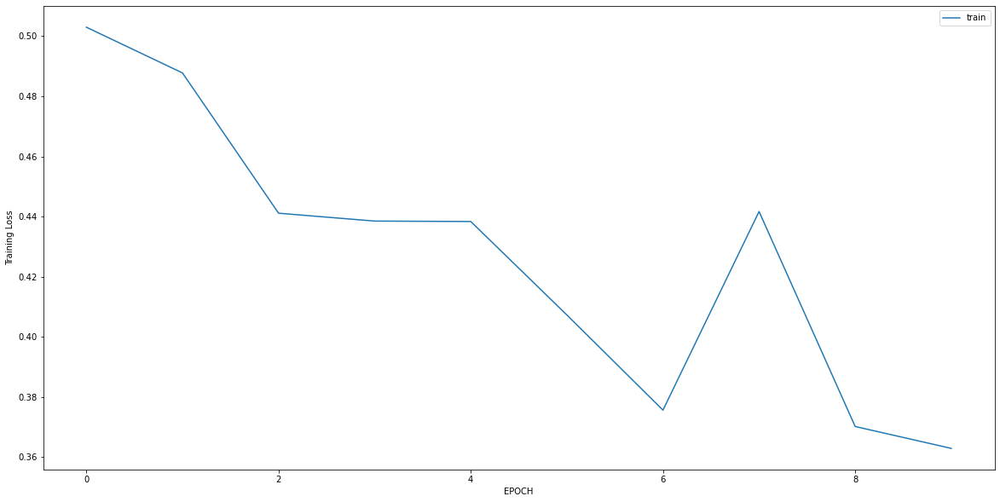

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4322 - accuracy: 0.7595
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2561 - accuracy: 0.8866
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1695 - accuracy: 0.9450
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1588 - accuracy: 0.9416
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1668 - accuracy: 0.9381
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1303 - accuracy: 0.9485
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1434 - accuracy: 0.9519
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1344 - accuracy: 0.9622
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1501 - accuracy: 0.9450
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1498 - accuracy: 0.9381


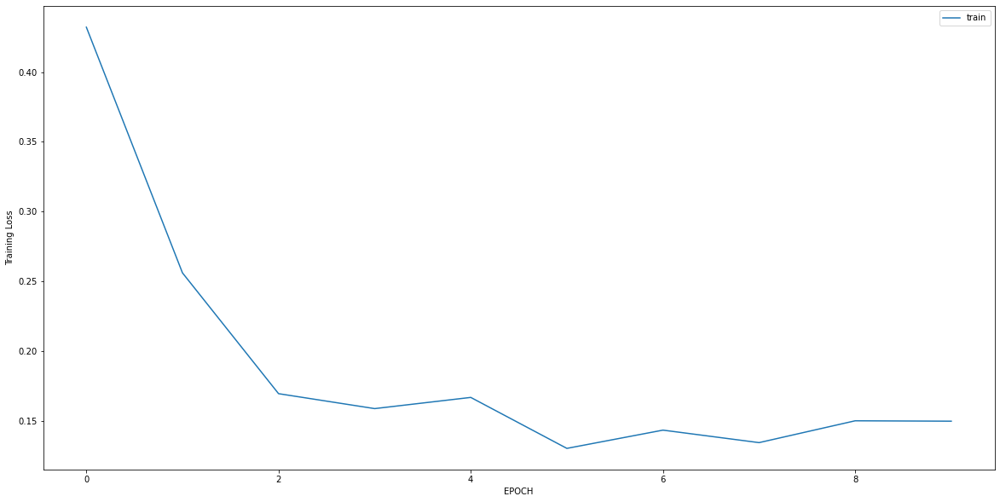

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7450 - accuracy: 0.7814
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6047 - accuracy: 0.7773
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5874 - accuracy: 0.7854
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5374 - accuracy: 0.7368
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5169 - accuracy: 0.7409
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4987 - accuracy: 0.7409
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5016 - accuracy: 0.7611
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4302 - accuracy: 0.8219
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3473 - accuracy: 0.8462
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3157 - accuracy: 0.8502


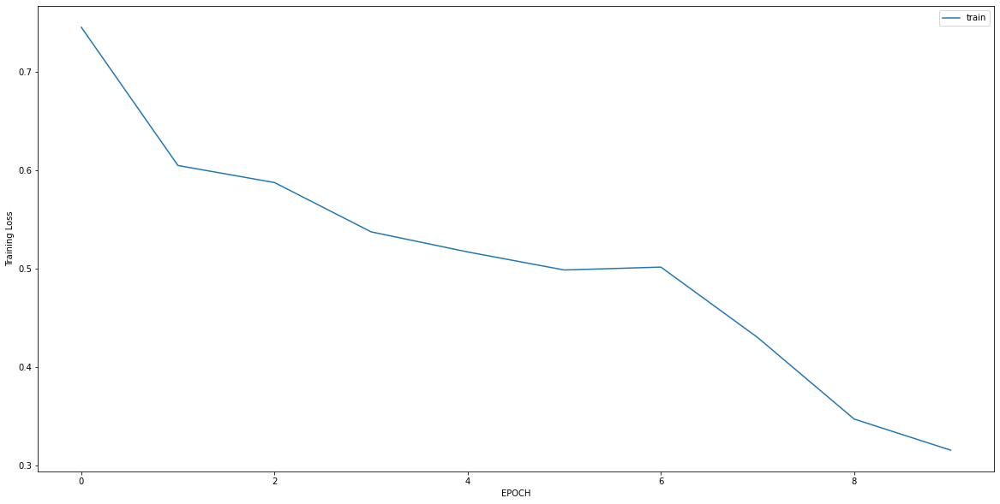

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1879 - accuracy: 0.9277
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1529 - accuracy: 0.9465
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1109 - accuracy: 0.9780
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0999 - accuracy: 0.9717
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0819 - accuracy: 0.9874
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0890 - accuracy: 0.9843
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0723 - accuracy: 0.9843
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0788 - accuracy: 0.9780
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0676 - accuracy: 0.9874
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0547 - accuracy: 0.9937


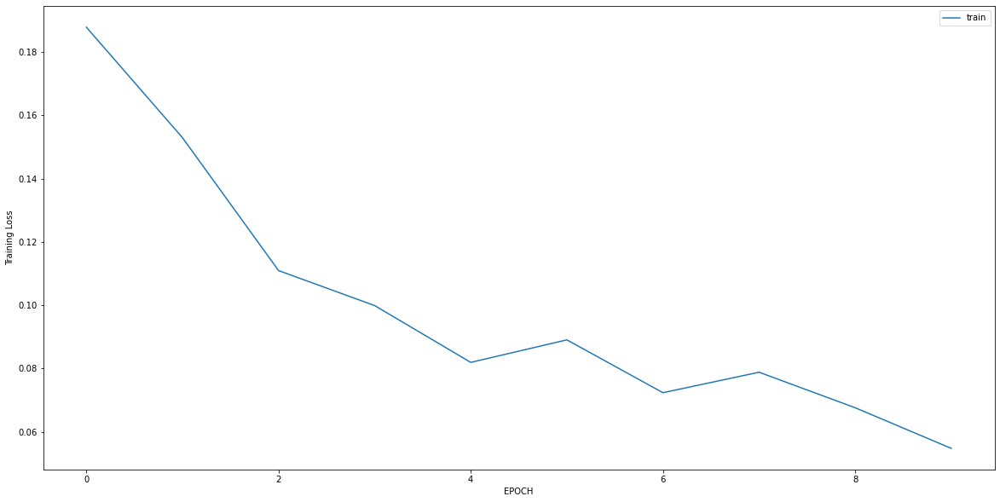

Epoch 1/10
15/15 [==============================] - 0s 4ms/step - loss: 0.6247 - accuracy: 0.7387
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.6314 - accuracy: 0.8229
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.5130 - accuracy: 0.8402
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3110 - accuracy: 0.9071
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2874 - accuracy: 0.9136
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2720 - accuracy: 0.9136
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2767 - accuracy: 0.9114
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2518 - accuracy: 0.9158
Epoch 9/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2467 - accuracy: 0.9266
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2527 - accuracy: 0.9179


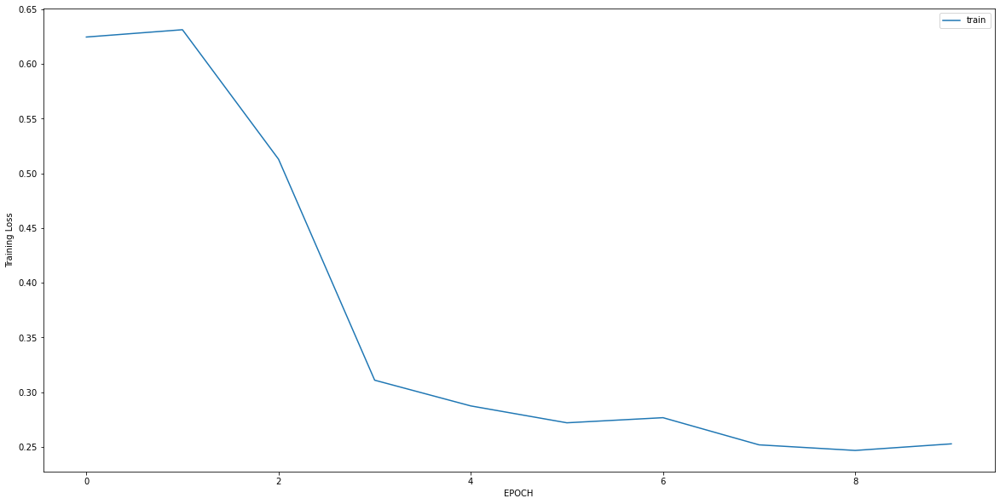

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 1.6366 - accuracy: 0.3993
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.5485
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3297 - accuracy: 0.8955
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3368 - accuracy: 0.8769
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3147 - accuracy: 0.8769
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2940 - accuracy: 0.8918
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2928 - accuracy: 0.9030
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2668 - accuracy: 0.9142
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2285 - accuracy: 0.9291
Epoch 10/10
9/9 [==============================] - 0s 8ms/step - loss: 0.2520 - accuracy: 0.9179


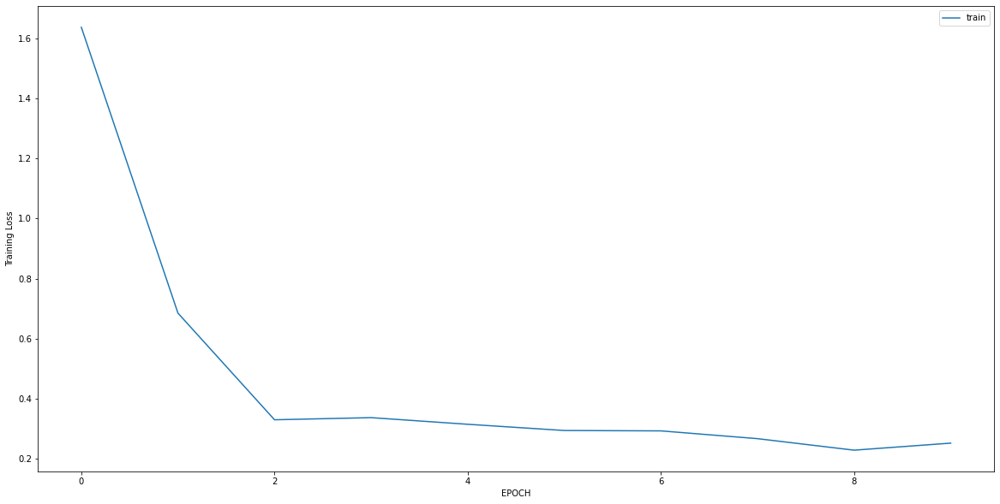

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 1.5647 - accuracy: 0.1746
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4787 - accuracy: 0.7698
Epoch 3/10
8/8 [==============================] - 0s 7ms/step - loss: 0.1841 - accuracy: 0.9881
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1040 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0754 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0574 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0574 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0511 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 1.0000


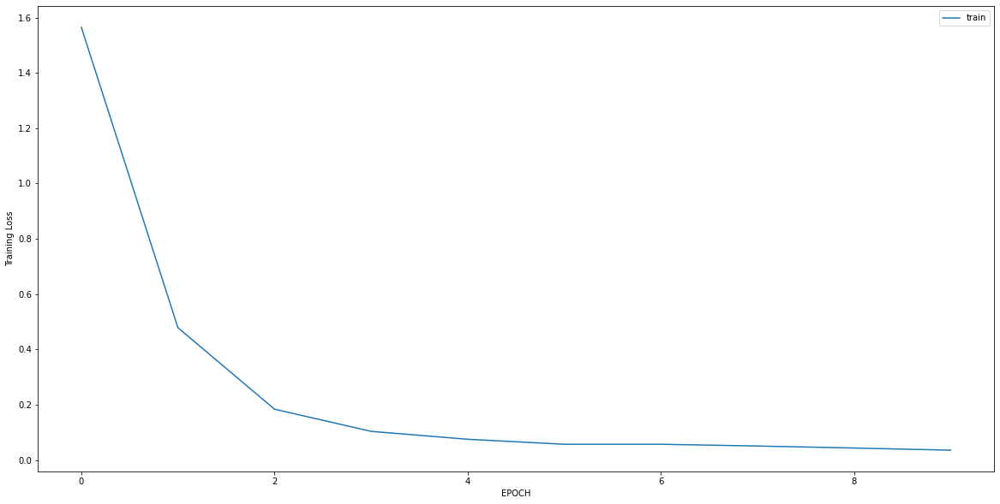

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4942 - accuracy: 0.8311
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3546 - accuracy: 0.8874
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3177 - accuracy: 0.9040
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2550 - accuracy: 0.9139
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2394 - accuracy: 0.9040
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2258 - accuracy: 0.9106
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2025 - accuracy: 0.9338
Epoch 8/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1837 - accuracy: 0.9371
Epoch 9/10
10/10 [==============================] - 0s 10ms/step - loss: 0.1920 - accuracy: 0.9272
Epoch 10/10
10/10 [==============================] - 0s 8ms/step - loss: 0.1662 - accuracy: 0.9470


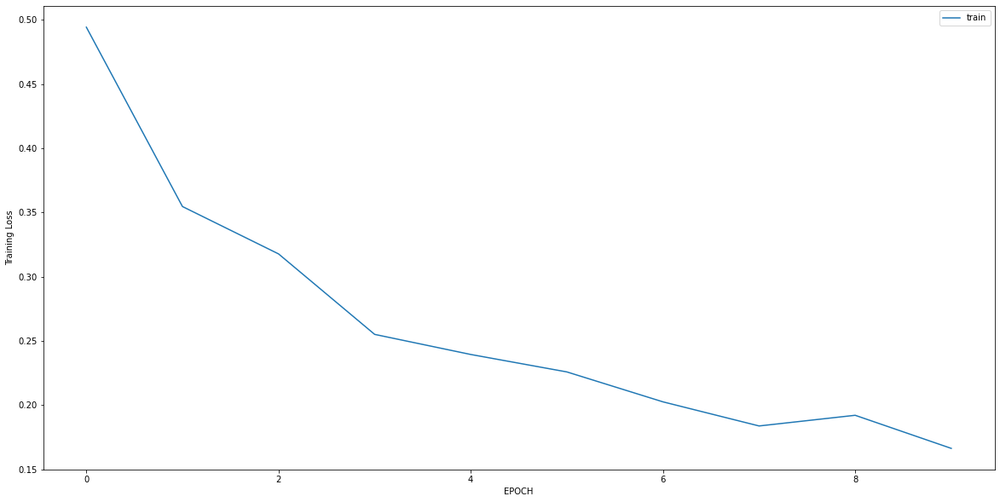

Epoch 1/10
8/8 [==============================] - 0s 11ms/step - loss: 0.4004 - accuracy: 0.8571
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3191 - accuracy: 0.8730
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2807 - accuracy: 0.9246
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2442 - accuracy: 0.9246
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2642 - accuracy: 0.9286
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2572 - accuracy: 0.9286
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2149 - accuracy: 0.9325
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2668 - accuracy: 0.9246
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2832 - accuracy: 0.9325
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2431 - accuracy: 0.9325


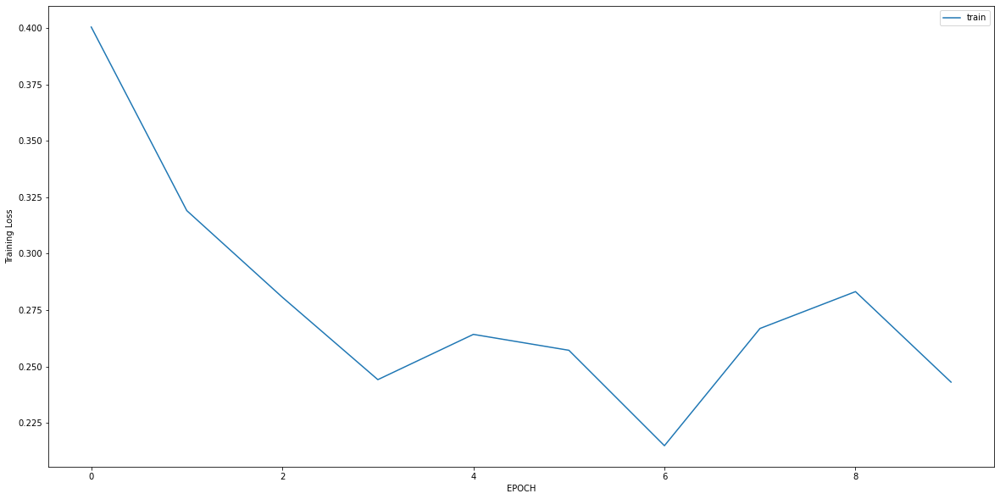

Epoch 1/10
10/10 [==============================] - 0s 7ms/step - loss: 0.2998 - accuracy: 0.8871
Epoch 2/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1713 - accuracy: 0.9530
Epoch 3/10
10/10 [==============================] - 0s 8ms/step - loss: 0.1614 - accuracy: 0.9624
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1247 - accuracy: 0.9749
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1373 - accuracy: 0.9655
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0939 - accuracy: 0.9812
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0687 - accuracy: 0.9937
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0643 - accuracy: 0.9906
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0650 - accuracy: 0.9937
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0585 - accuracy: 0.9875


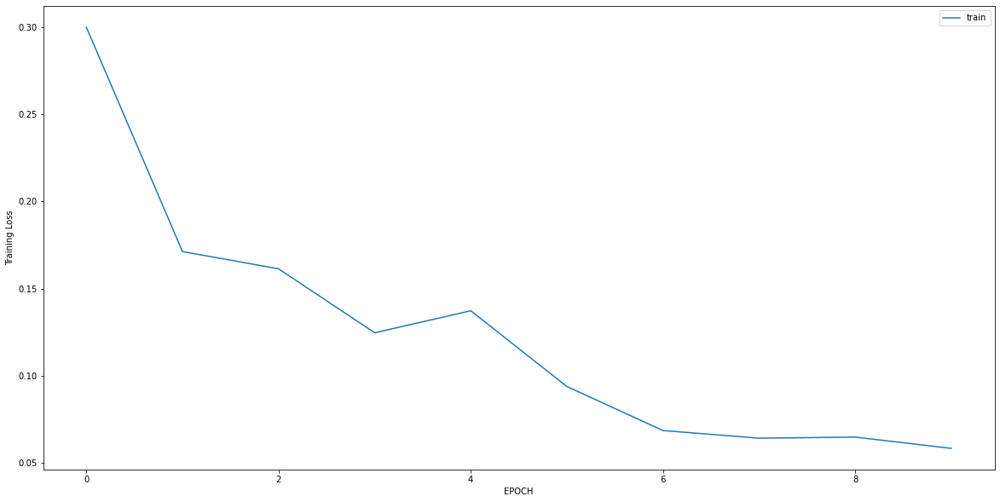

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1498 - accuracy: 0.9567
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0531 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0548 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 9ms/step - loss: 0.0349 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0329 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0226 - accuracy: 1.0000


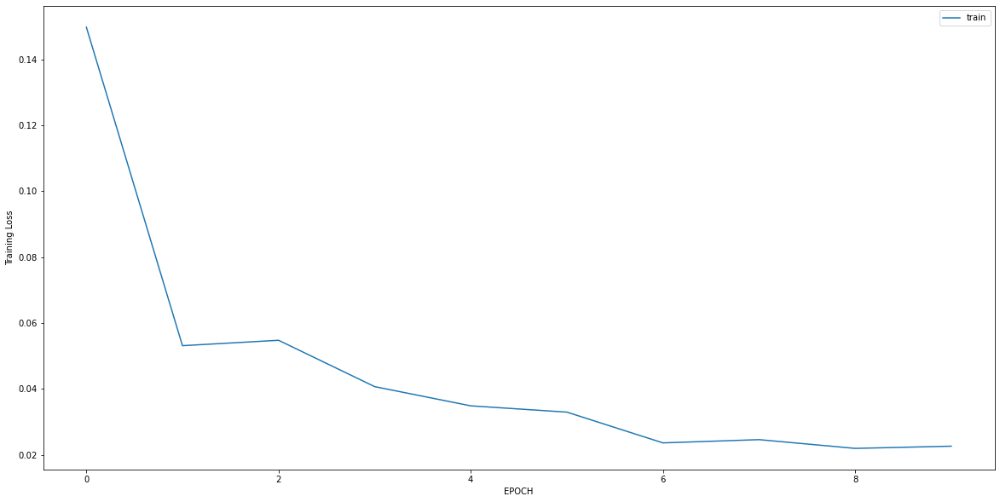

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8036 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6722 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5083 - accuracy: 0.8270
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3419 - accuracy: 0.8312
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2227 - accuracy: 0.9114
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2708 - accuracy: 0.8903
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1581 - accuracy: 0.9494
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1680 - accuracy: 0.9241
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1339 - accuracy: 0.9578
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1166 - accuracy: 0.9747


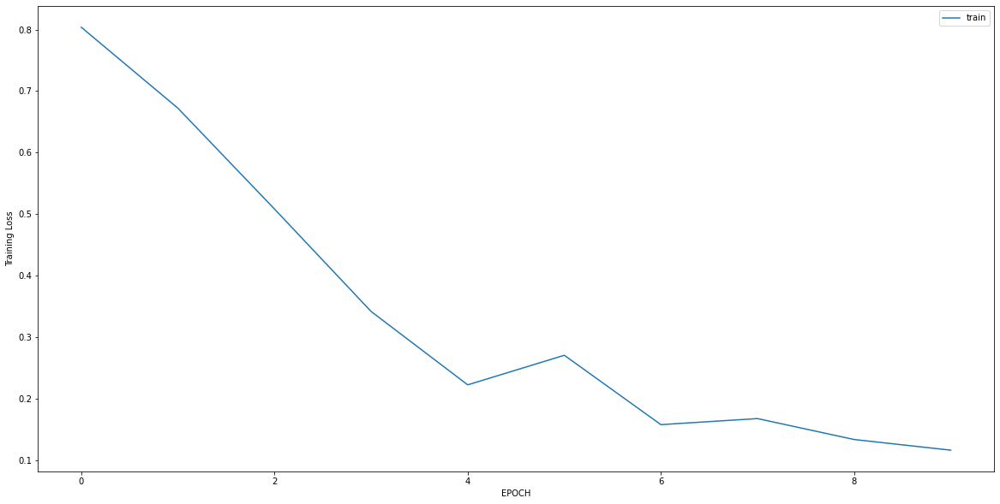

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0870 - accuracy: 0.9819
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0490 - accuracy: 0.9940
Epoch 3/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0335 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0134 - accuracy: 1.0000


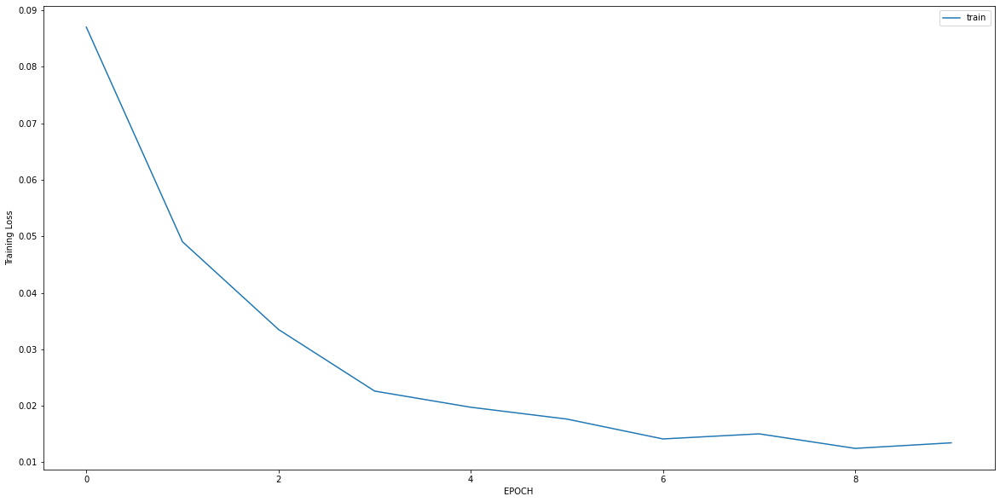

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3731 - accuracy: 0.9025
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2764 - accuracy: 0.9237
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3200 - accuracy: 0.9195
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2757 - accuracy: 0.9237
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2752 - accuracy: 0.9364
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2444 - accuracy: 0.9280
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2326 - accuracy: 0.9322
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2203 - accuracy: 0.9449
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2118 - accuracy: 0.9449
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1943 - accuracy: 0.9407


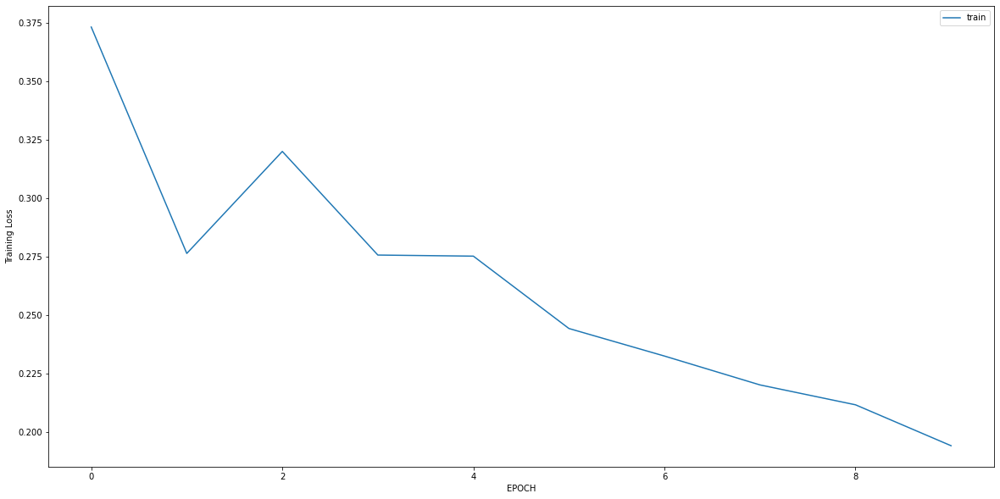

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.1570 - accuracy: 0.0964
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.7168 - accuracy: 0.3250
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2455 - accuracy: 0.9393
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0214 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0170 - accuracy: 1.0000


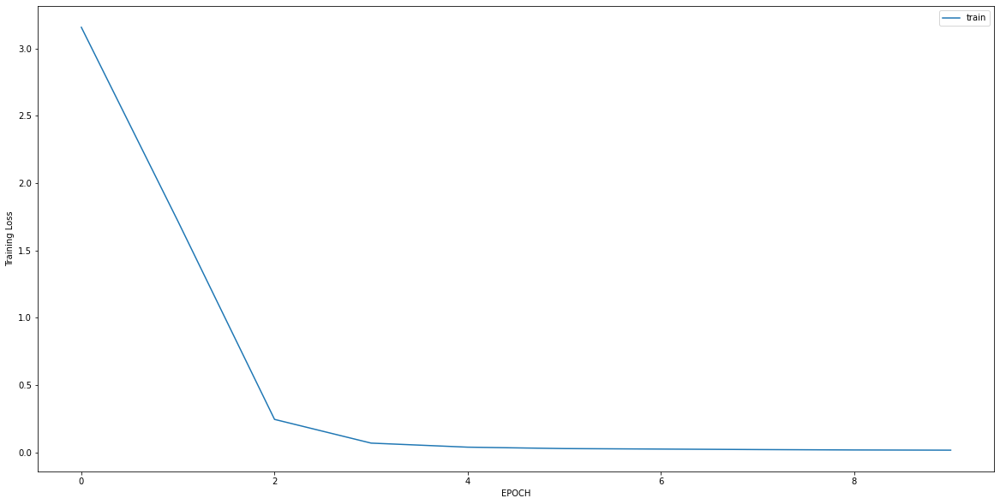

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1610 - accuracy: 0.9944
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1073 - accuracy: 1.0000
Epoch 3/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0578 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 7ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0144 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0162 - accuracy: 1.0000


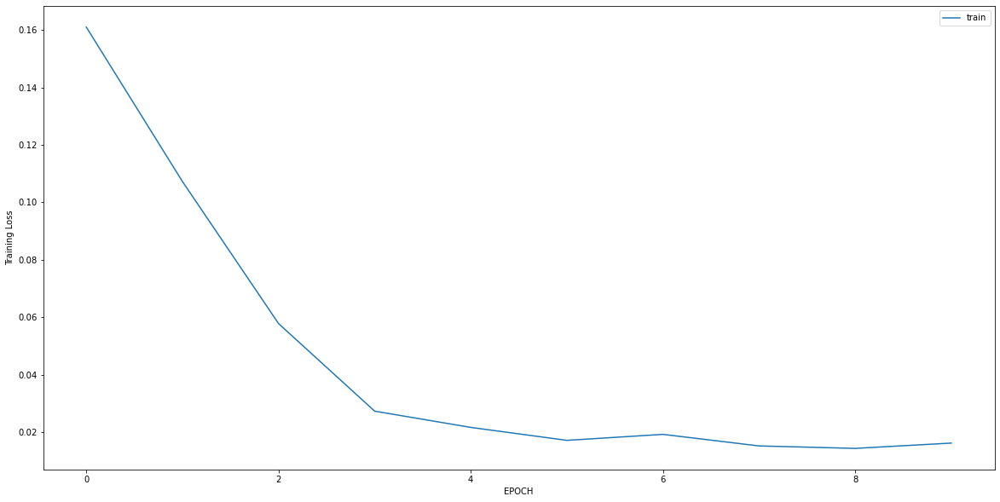

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6897 - accuracy: 0.4555
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7810 - accuracy: 0.5694
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4350 - accuracy: 0.8541
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3304 - accuracy: 0.9004
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2211 - accuracy: 0.9502
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1885 - accuracy: 0.9644
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1600 - accuracy: 0.9751
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1518 - accuracy: 0.9680
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1848 - accuracy: 0.9466
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1299 - accuracy: 0.9751


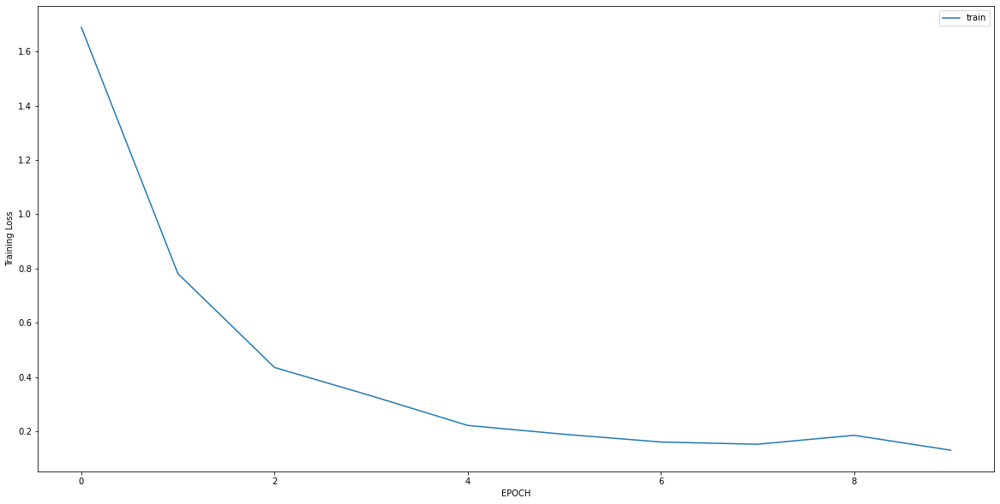

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6987 - accuracy: 0.7983
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4567 - accuracy: 0.8242
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2850 - accuracy: 0.8991
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2185 - accuracy: 0.9366
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1685 - accuracy: 0.9539
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1653 - accuracy: 0.9481
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1284 - accuracy: 0.9625
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1448 - accuracy: 0.9539
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1340 - accuracy: 0.9625
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1115 - accuracy: 0.9625


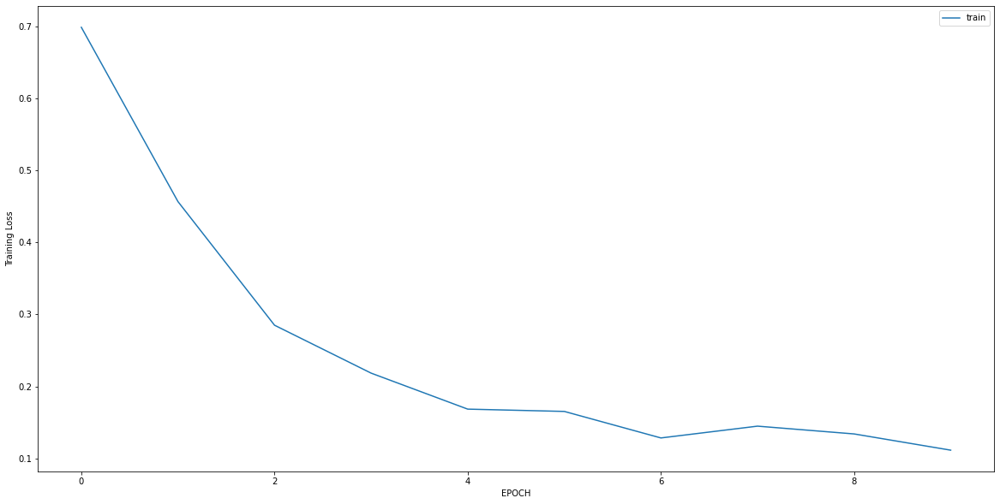

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3460 - accuracy: 0.8754
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0240 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0200 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0197 - accuracy: 1.0000


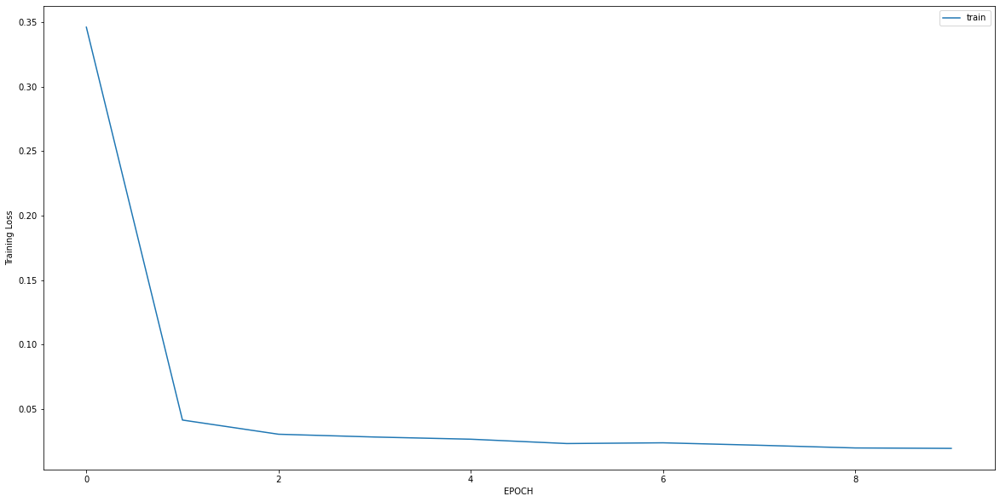

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4559 - accuracy: 0.7437
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2274 - accuracy: 0.9177
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2238 - accuracy: 0.9209
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2084 - accuracy: 0.9272
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2128 - accuracy: 0.9114
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2001 - accuracy: 0.9367
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1934 - accuracy: 0.9304
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1837 - accuracy: 0.9209
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2029 - accuracy: 0.9272
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1727 - accuracy: 0.9241


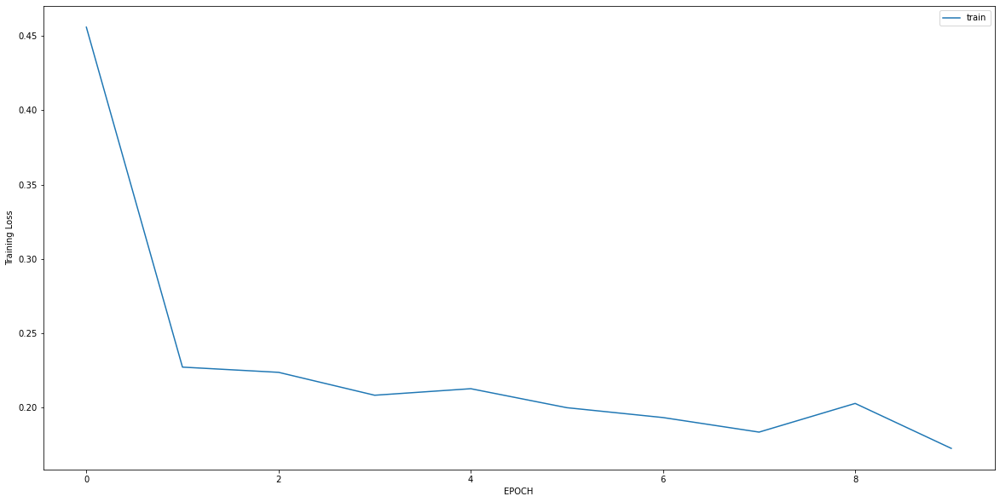

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0696 - accuracy: 0.9843
Epoch 2/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0235 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0208 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000


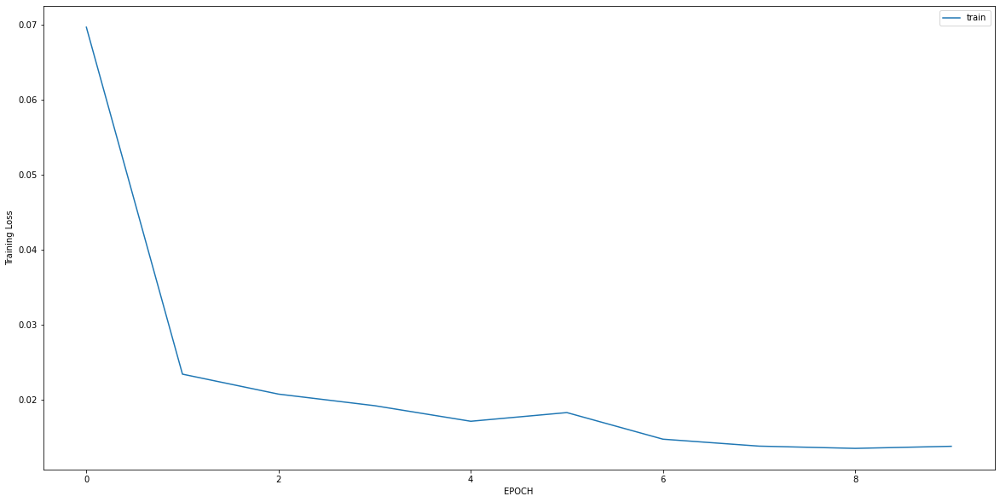

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 3.1225 - accuracy: 0.3309
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 2.9729 - accuracy: 0.3309
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 2.3298 - accuracy: 0.3309
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 1.7757 - accuracy: 0.3309
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 1.0920 - accuracy: 0.3381
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7464 - accuracy: 0.5324
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6119 - accuracy: 0.6475
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5789 - accuracy: 0.6619
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6028 - accuracy: 0.6619
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4965 - accuracy: 0.7410


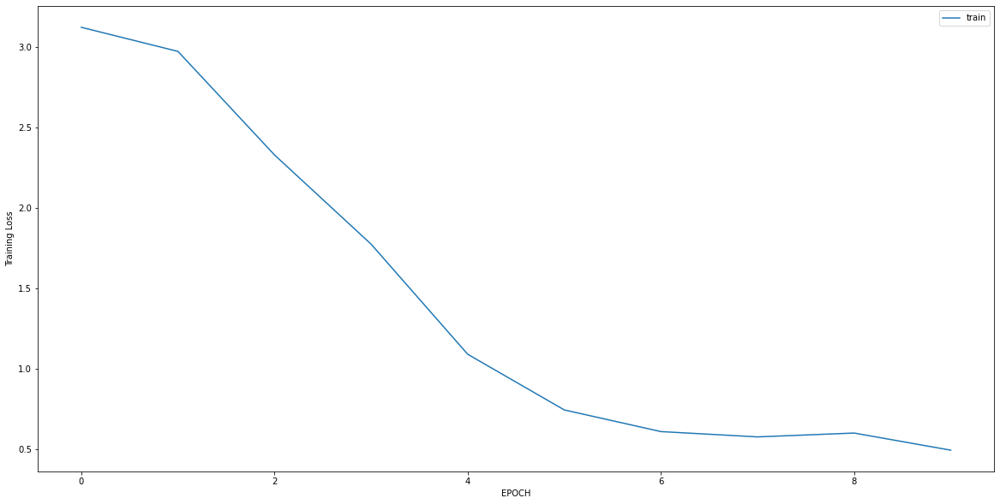

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.5523
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3846 - accuracy: 0.8412
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3279 - accuracy: 0.8809
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2797 - accuracy: 0.9025
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2477 - accuracy: 0.9242
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2161 - accuracy: 0.9350
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2141 - accuracy: 0.9350
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1607 - accuracy: 0.9603
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1623 - accuracy: 0.9531
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1547 - accuracy: 0.9747


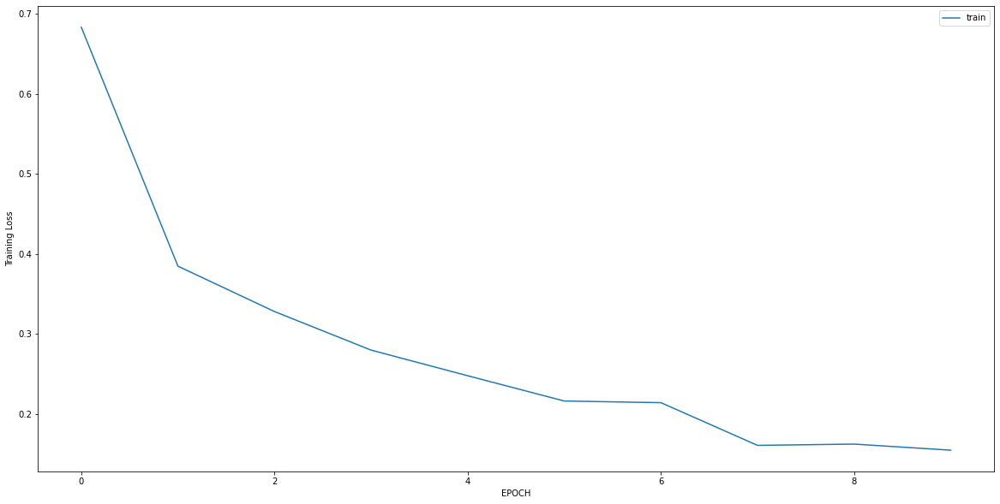

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5142 - accuracy: 0.6944
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3628 - accuracy: 0.7986
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3309 - accuracy: 0.8681
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2692 - accuracy: 0.9097
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2272 - accuracy: 0.9514
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2208 - accuracy: 0.9444
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4997 - accuracy: 0.7847
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2203 - accuracy: 0.9444
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3050 - accuracy: 0.9097
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3143 - accuracy: 0.8958


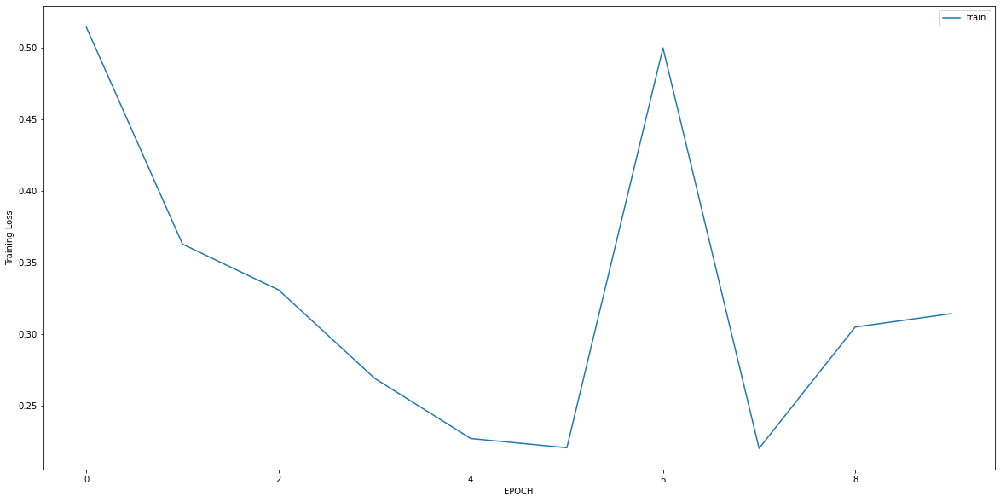

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3808 - accuracy: 0.8571
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4013 - accuracy: 0.8690
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3042 - accuracy: 0.8690
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3305 - accuracy: 0.8611
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3158 - accuracy: 0.8810
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2807 - accuracy: 0.8968
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2882 - accuracy: 0.8929
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2678 - accuracy: 0.9048
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2084 - accuracy: 0.9167
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2018 - accuracy: 0.9206


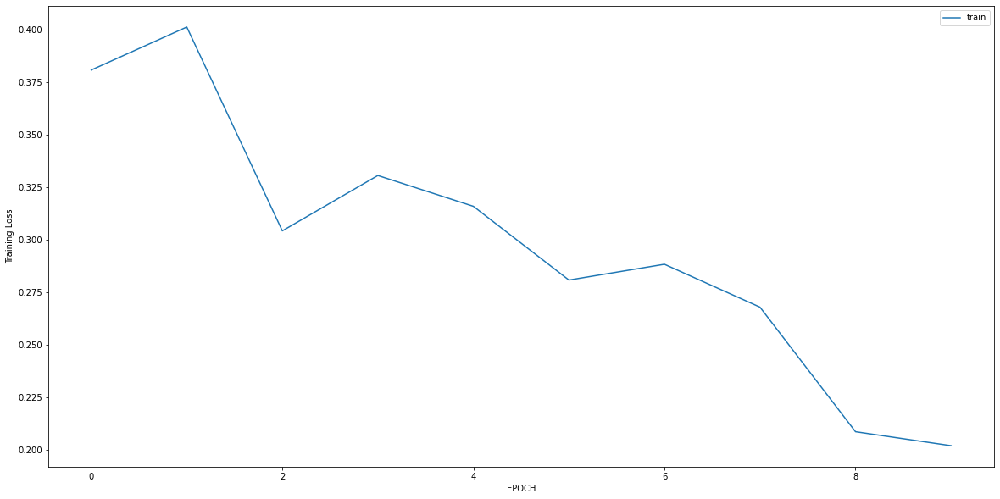

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2665 - accuracy: 0.8956
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2360 - accuracy: 0.9327
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2113 - accuracy: 0.9428
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2042 - accuracy: 0.9495
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1861 - accuracy: 0.9529
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1749 - accuracy: 0.9428
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1818 - accuracy: 0.9495
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2072 - accuracy: 0.9327
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1767 - accuracy: 0.9461
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1770 - accuracy: 0.9461


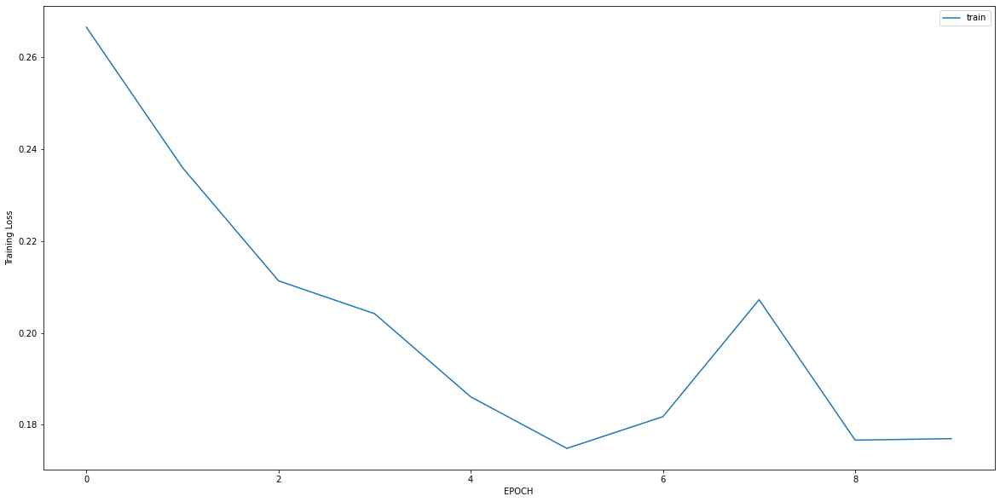

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 1.7439 - accuracy: 0.3674
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1808 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0999 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 15ms/step - loss: 0.0599 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0299 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0276 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000


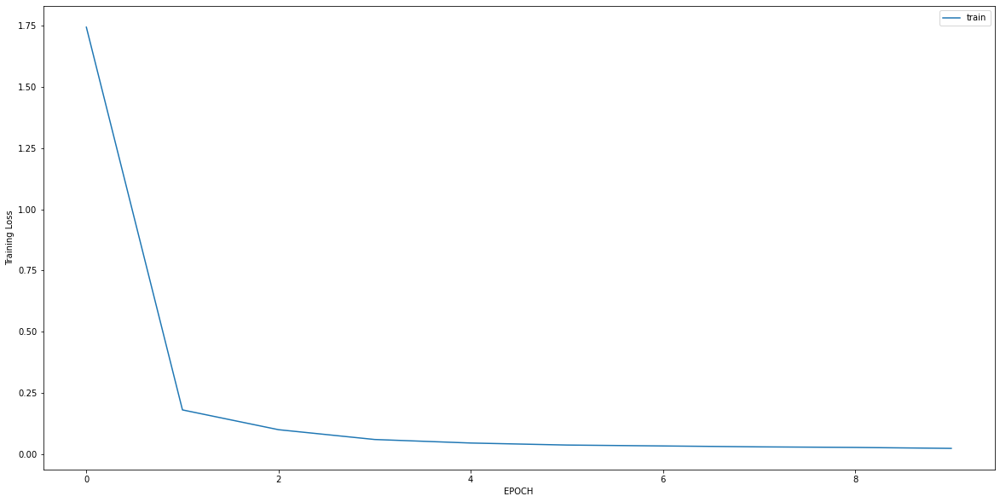

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4184 - accuracy: 0.8448
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2834 - accuracy: 0.8931
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2399 - accuracy: 0.9207
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2122 - accuracy: 0.9379
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1710 - accuracy: 0.9517
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1490 - accuracy: 0.9621
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1251 - accuracy: 0.9586
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1066 - accuracy: 0.9793
Epoch 9/10
10/10 [==============================] - 0s 9ms/step - loss: 0.1713 - accuracy: 0.9586
Epoch 10/10
10/10 [==============================] - 0s 9ms/step - loss: 0.2137 - accuracy: 0.9448


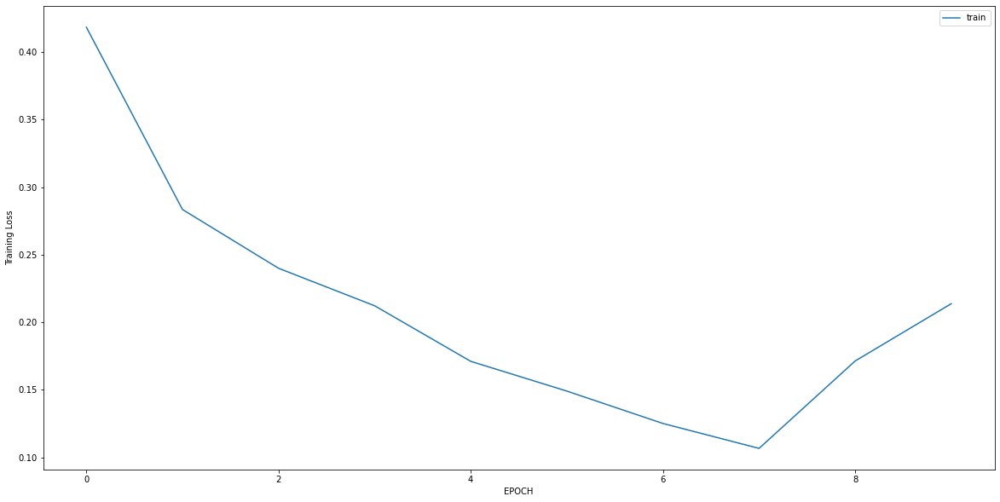

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.8254 - accuracy: 0.7448
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4991 - accuracy: 0.8213
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2983 - accuracy: 0.8515
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2111 - accuracy: 0.9211
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2241 - accuracy: 0.8886
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1684 - accuracy: 0.9397
Epoch 7/10
14/14 [==============================] - 0s 12ms/step - loss: 0.1570 - accuracy: 0.9559
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1349 - accuracy: 0.9629
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1286 - accuracy: 0.9675
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0975 - accuracy: 0.9768


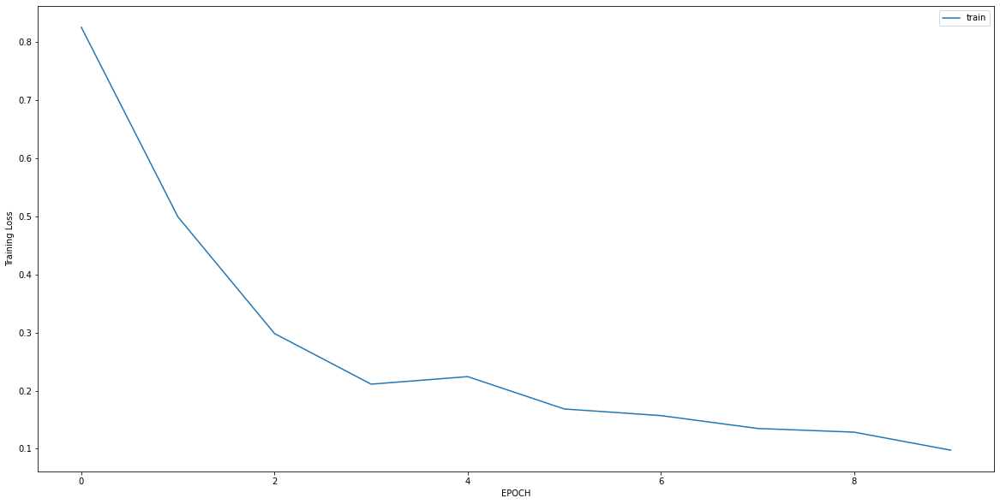

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 2.0541 - accuracy: 0.4667
Epoch 2/10
8/8 [==============================] - 0s 10ms/step - loss: 1.5989 - accuracy: 0.4667
Epoch 3/10
8/8 [==============================] - 0s 7ms/step - loss: 1.1282 - accuracy: 0.4667
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.8118 - accuracy: 0.5176
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5996 - accuracy: 0.6353
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4343 - accuracy: 0.8078
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3902 - accuracy: 0.8392
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3047 - accuracy: 0.8471
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2941 - accuracy: 0.8549
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2599 - accuracy: 0.8902


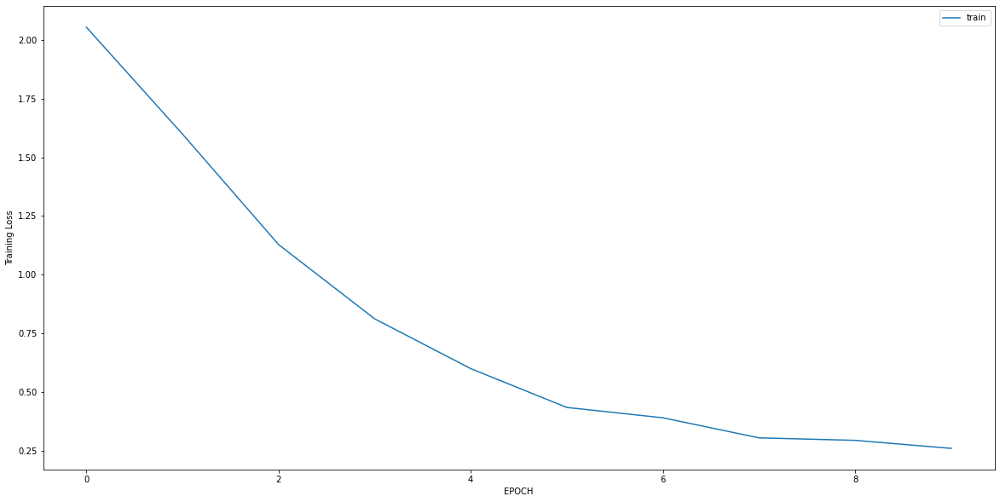

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4960 - accuracy: 0.7083
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.4479 - accuracy: 0.7847
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4173 - accuracy: 0.7639
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3737 - accuracy: 0.7917
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3585 - accuracy: 0.8403
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3281 - accuracy: 0.8472
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2571 - accuracy: 0.9167
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2952 - accuracy: 0.8958
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2586 - accuracy: 0.9375
Epoch 10/10
5/5 [==============================] - 0s 8ms/step - loss: 0.2892 - accuracy: 0.8889


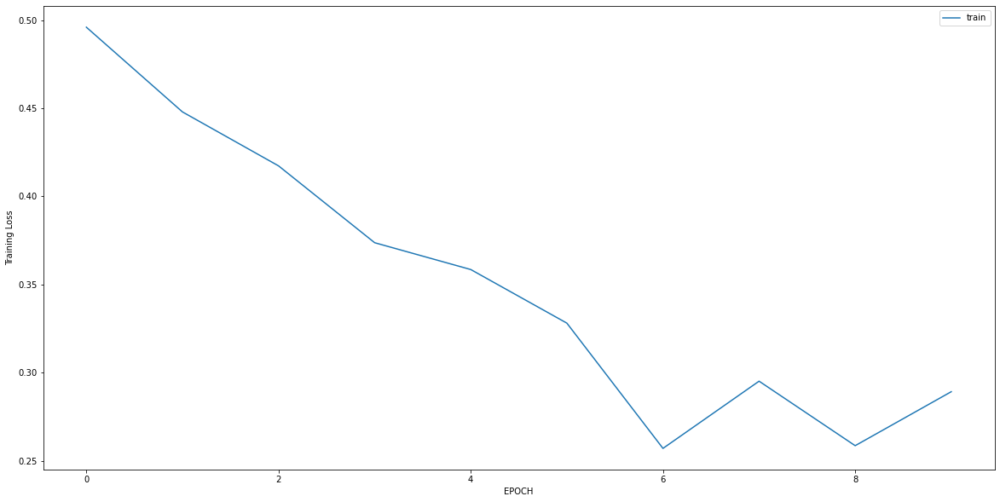

Epoch 1/10
8/8 [==============================] - 0s 12ms/step - loss: 0.0707 - accuracy: 0.9958
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0585 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0567 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 12ms/step - loss: 0.0577 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 14ms/step - loss: 0.0472 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0459 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0305 - accuracy: 1.0000


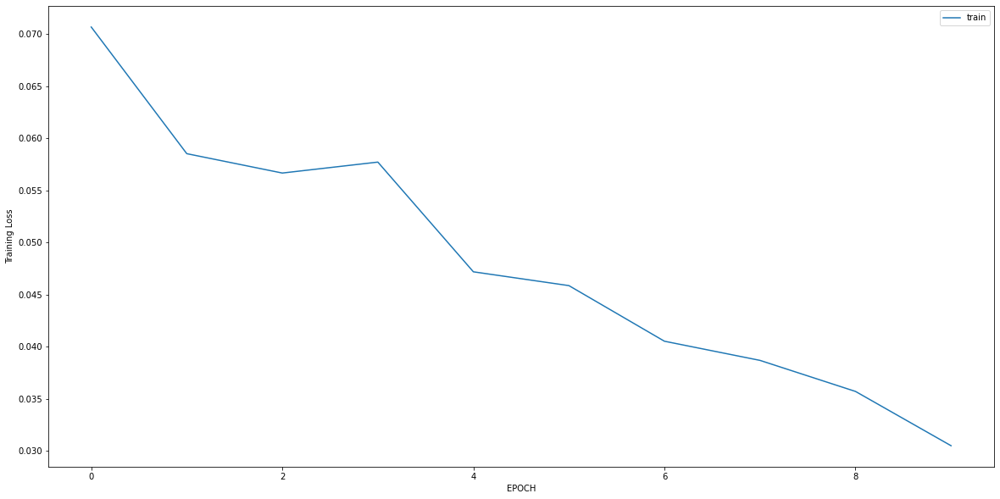

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.4755 - accuracy: 0.7464
Epoch 2/10
5/5 [==============================] - 0s 17ms/step - loss: 0.4208 - accuracy: 0.7971
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3960 - accuracy: 0.8333
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2623 - accuracy: 0.8841
Epoch 5/10
5/5 [==============================] - 0s 14ms/step - loss: 0.1864 - accuracy: 0.9493
Epoch 6/10
5/5 [==============================] - 0s 15ms/step - loss: 0.1780 - accuracy: 0.9348
Epoch 7/10
5/5 [==============================] - 0s 13ms/step - loss: 0.1673 - accuracy: 0.9493
Epoch 8/10
5/5 [==============================] - 0s 11ms/step - loss: 0.1897 - accuracy: 0.9275
Epoch 9/10
5/5 [==============================] - 0s 9ms/step - loss: 0.1743 - accuracy: 0.9348
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1643 - accuracy: 0.9493


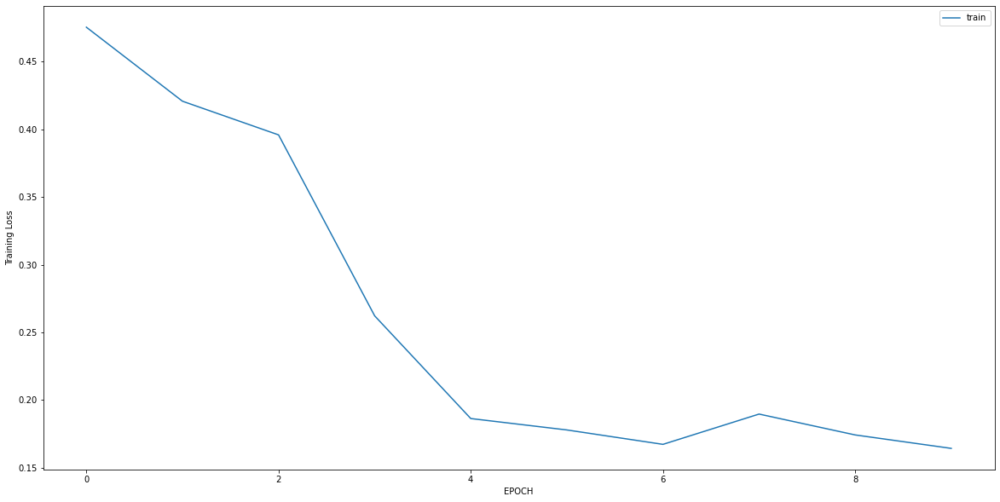

Epoch 1/10
11/11 [==============================] - 0s 13ms/step - loss: 0.8654 - accuracy: 0.7644
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.7695 - accuracy: 0.7704
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.5091 - accuracy: 0.8187
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3845 - accuracy: 0.8550
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2246 - accuracy: 0.9094
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1918 - accuracy: 0.9184
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1393 - accuracy: 0.9547
Epoch 8/10
11/11 [==============================] - 0s 7ms/step - loss: 0.1367 - accuracy: 0.9607
Epoch 9/10
11/11 [==============================] - 0s 15ms/step - loss: 0.1416 - accuracy: 0.9517
Epoch 10/10
11/11 [==============================] - 0s 10ms/step - loss: 0.1434 - accuracy: 0.9547


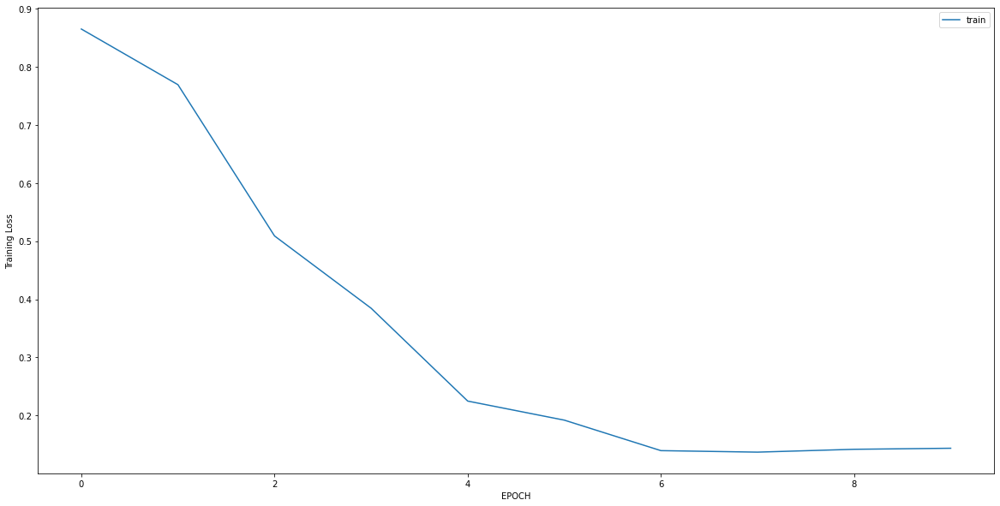

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.0640 - accuracy: 0.6263
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2959 - accuracy: 0.8363
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1530 - accuracy: 0.9786
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1640 - accuracy: 0.9644
Epoch 5/10
9/9 [==============================] - 0s 9ms/step - loss: 0.1586 - accuracy: 0.9644
Epoch 6/10
9/9 [==============================] - 0s 12ms/step - loss: 0.1353 - accuracy: 0.9751
Epoch 7/10
9/9 [==============================] - 0s 11ms/step - loss: 0.1415 - accuracy: 0.9751
Epoch 8/10
9/9 [==============================] - 0s 11ms/step - loss: 0.1119 - accuracy: 0.9786
Epoch 9/10
9/9 [==============================] - 0s 10ms/step - loss: 0.1054 - accuracy: 0.9715
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1083 - accuracy: 0.9822


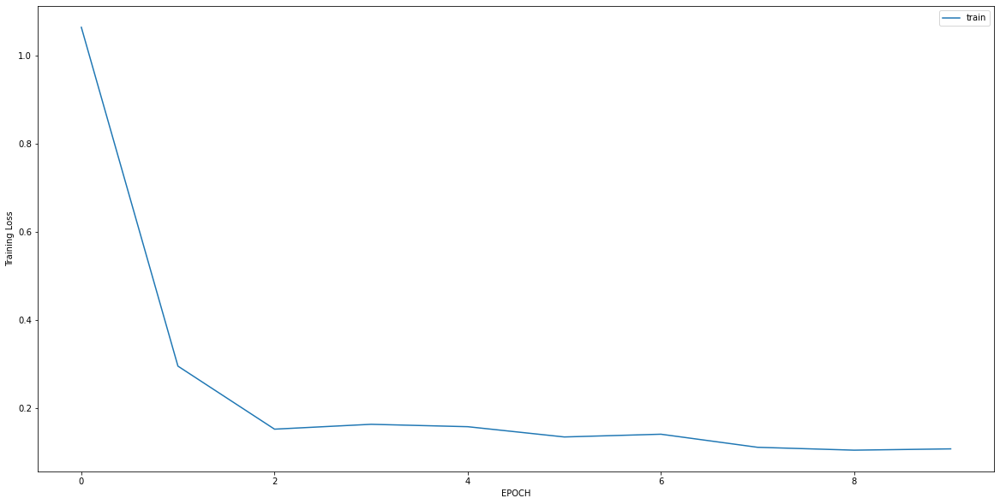

Epoch 1/10
7/7 [==============================] - 0s 15ms/step - loss: 1.2781 - accuracy: 0.6055
Epoch 2/10
7/7 [==============================] - 0s 14ms/step - loss: 0.9981 - accuracy: 0.6239
Epoch 3/10
7/7 [==============================] - 0s 8ms/step - loss: 0.7635 - accuracy: 0.6330
Epoch 4/10
7/7 [==============================] - 0s 11ms/step - loss: 0.5153 - accuracy: 0.6651
Epoch 5/10
7/7 [==============================] - 0s 14ms/step - loss: 0.3347 - accuracy: 0.8853
Epoch 6/10
7/7 [==============================] - 0s 13ms/step - loss: 0.2769 - accuracy: 0.9358
Epoch 7/10
7/7 [==============================] - 0s 10ms/step - loss: 0.2596 - accuracy: 0.9128
Epoch 8/10
7/7 [==============================] - 0s 12ms/step - loss: 0.2320 - accuracy: 0.9587
Epoch 9/10
7/7 [==============================] - 0s 10ms/step - loss: 0.2010 - accuracy: 0.9679
Epoch 10/10
7/7 [==============================] - 0s 6ms/step - loss: 0.2110 - accuracy: 0.9587


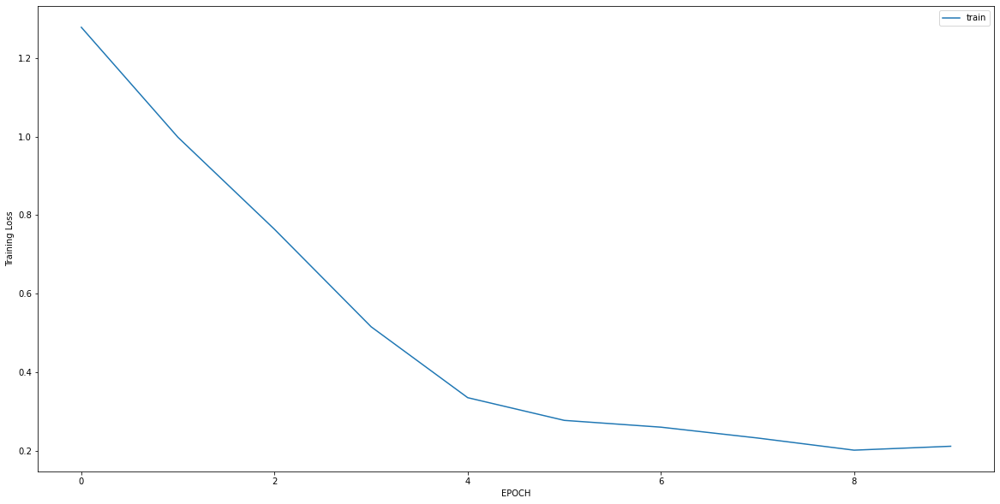

Epoch 1/10
10/10 [==============================] - 0s 9ms/step - loss: 0.9627 - accuracy: 0.5408
Epoch 2/10
10/10 [==============================] - 0s 9ms/step - loss: 0.1725 - accuracy: 0.9660
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0702 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 13ms/step - loss: 0.0310 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0305 - accuracy: 1.0000


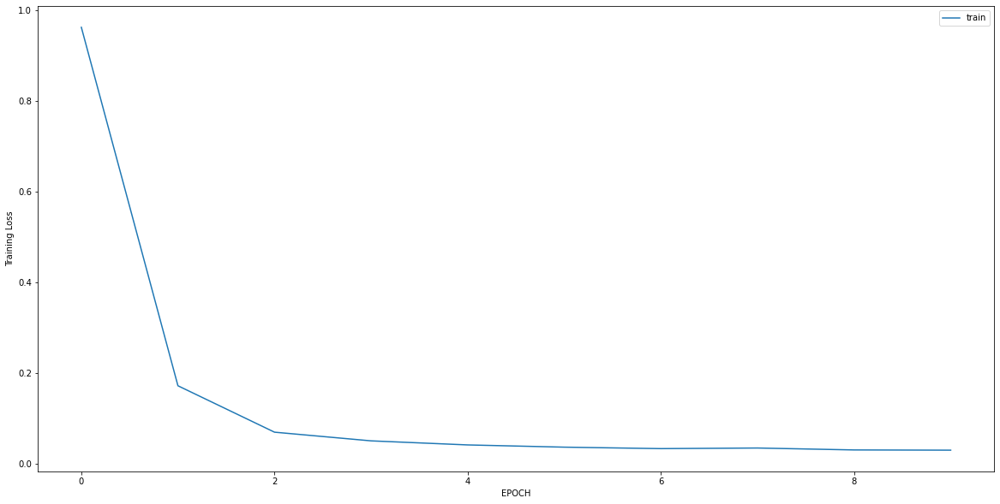

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 0.5308 - accuracy: 0.7276
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1153 - accuracy: 0.9895
Epoch 3/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0550 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 10ms/step - loss: 0.0344 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0281 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0209 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0131 - accuracy: 1.0000


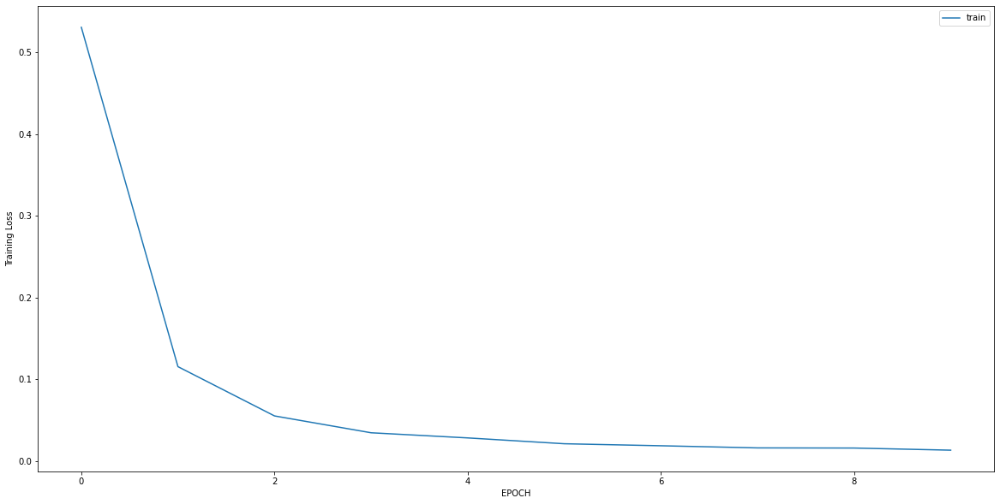

In [29]:
for j in range(10):
  a=np.random.permutation(list(range(60)))
  for i in a:
    s=data[i]
    history = model.fit(s[0], s[1], batch_size=32, epochs=10)
    plt.plot(history.history['loss'], label='train')
    #plt.plot(history.history['val_loss'], label='test')
    plt.xlabel('EPOCH')
    plt.ylabel('Training Loss')
    plt.legend()
    plt.show()

In [39]:
#!mkdir -p saved_model_latest
#model.save('saved_model_latest/GRU')

INFO:tensorflow:Assets written to: saved_model_latest/GRU\assets


INFO:tensorflow:Assets written to: saved_model_latest/GRU\assets


**Test**

In [30]:
import cv2

In [31]:
#!pip install mediapipe
import mediapipe as mp

In [32]:
mpPose = mp.solutions.pose
pose = mpPose.Pose()
mpDraw = mp.solutions.drawing_utils # For drawing keypoints
points = mpPose.PoseLandmark # Landmarks

In [33]:
def getarray(landmark): 
  r=[]
  for i in landmark:
    r.append([i.x,i.y])
  r=np.array(r)
  r=r.flatten()
  return r

In [34]:
def test(path, name):
  cap = cv2.VideoCapture(path)
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) + 0.5)
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) + 0.5)
  size = (width, height)
  fourcc = cv2.VideoWriter_fourcc(*'XVID')
  out = cv2.VideoWriter(f'{name}.avi', fourcc, 30.0, size)
  total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
  print(total_frames)
  arr=[]
  for fno in range(0, total_frames,1):
    print(f"frame number is{fno}")
    #print(fno)
    cap.set(cv2.CAP_PROP_POS_FRAMES, fno)
    _, image = cap.read()
    img = image.copy()
    imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = pose.process(imgRGB)
    landmark=results.pose_landmarks.landmark
    r=getarray(landmark)
    #print(r)
    if(fno<14):
      arr.append(r)
    elif(fno==14):
      arr.append(r)
      k=np.array(arr).reshape(-1,15,66)
      print(model.predict(k)[0])
    else:
      del arr[0]
      arr.append(r)
      k=np.array(arr).reshape(-1,15,66)
      p=model.predict(k)[0][0]
#       if((fno+1)%30==0):
      p=round(p,2)
      p=str(p)
      print(p)
      cv2.putText(image, p, (500,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), thickness = 3)
      cv2.imshow('test',image)
      if cv2.waitKey(10) & 0xFF==ord('q'):
          break
      out.write(image)

#       else:
#         pass
  cap.release()
  cv2.destroyAllWindows()

In [36]:
test("../test/preetam saha not crossing the road.mp4", 'preetam_GRU')

396
frame number is0
frame number is1
frame number is2
frame number is3
frame number is4
frame number is5
frame number is6
frame number is7
frame number is8
frame number is9
frame number is10
frame number is11
frame number is12
frame number is13
frame number is14
[0.03603092]
frame number is15
0.03
frame number is16
0.03
frame number is17
0.03
frame number is18
0.02
frame number is19
0.02
frame number is20
0.03
frame number is21
0.03
frame number is22
0.03
frame number is23
0.04
frame number is24
0.04
frame number is25
0.03
frame number is26
0.02
frame number is27
0.02
frame number is28
0.02
frame number is29
0.02
frame number is30
0.02
frame number is31
0.02
frame number is32
0.02
frame number is33
0.02
frame number is34
0.02
frame number is35
0.02
frame number is36
0.02
frame number is37
0.02
frame number is38
0.02
frame number is39
0.02
frame number is40
0.02
frame number is41
0.02
frame number is42
0.02
frame number is43
0.02
frame number is44
0.02
frame number is45
0.02
frame numb

0.14
frame number is351
0.14
frame number is352
0.14
frame number is353
0.14
frame number is354
0.13
frame number is355
0.12
frame number is356
0.12
frame number is357
0.13
frame number is358
0.13
frame number is359
0.14
frame number is360
0.14
frame number is361
0.14
frame number is362
0.14
frame number is363
0.14
frame number is364
0.13
frame number is365
0.13
frame number is366
0.13
frame number is367
0.13
frame number is368
0.12
frame number is369
0.12
frame number is370
0.11
frame number is371
0.11
frame number is372
0.1
frame number is373
0.1
frame number is374
0.09
frame number is375
0.09
frame number is376
0.08
frame number is377
0.08
frame number is378
0.07
frame number is379
0.07
frame number is380
0.06
frame number is381
0.05
frame number is382
0.04
frame number is383
0.03
frame number is384
0.02
frame number is385
0.02
frame number is386
0.02
frame number is387
0.02
frame number is388
0.02
frame number is389
0.02
frame number is390
0.03
frame number is391
0.04
frame number 

In [38]:
test("../test/o1 crossing the road.mp4", 'manash_GRU')


320
frame number is0
frame number is1
frame number is2
frame number is3
frame number is4
frame number is5
frame number is6
frame number is7
frame number is8
frame number is9
frame number is10
frame number is11
frame number is12
frame number is13
frame number is14
[0.01749754]
frame number is15
0.02
frame number is16
0.02
frame number is17
0.02
frame number is18
0.02
frame number is19
0.02
frame number is20
0.02
frame number is21
0.02
frame number is22
0.02
frame number is23
0.02
frame number is24
0.02
frame number is25
0.02
frame number is26
0.02
frame number is27
0.02
frame number is28
0.02
frame number is29
0.02
frame number is30
0.02
frame number is31
0.02
frame number is32
0.02
frame number is33
0.02
frame number is34
0.02
frame number is35
0.02
frame number is36
0.02
frame number is37
0.02
frame number is38
0.02
frame number is39
0.02
frame number is40
0.02
frame number is41
0.02
frame number is42
0.02
frame number is43
0.02
frame number is44
0.02
frame number is45
0.02
frame numb